In [1]:
import numpy as np
from scipy.integrate import solve_ivp as rk

In [2]:

def spring_coupled(num_samples, T_max, dt, noise_std=0, seed=3, type=1):

    def dynamics_fn(t, coords):
        m = 2
        k = 3
        
        ma1 = -k*coords[0] + k*(coords[1]-coords[0]) + np.cos(t)
        ma2 = -k*(coords[1]-coords[0]) + k*(-coords[1])
#         print(np.stack([ma1,ma2,coords[2],coords[3]]))
        return np.stack([coords[2]/m,coords[3]/m,ma1,ma2])
        
    def hamiltonian_eval(coords):
        m = 2
        k = 3
        q1 =coords[:,0]
        q2 = coords[:,1]
        p1 = coords[:,2]
        p2 = coords[:,3]
        H= (p1**2)/(2*m) + (p2**2)/(2*m) + k*q1**2 +k*q2**2 - k*q1*q2
        return H

        
    def get_trajectory(t_span=[0, T_max], timescale=dt):
        t_eval = np.arange(t_span[0], t_span[1], timescale)
        qs = np.random.uniform(-0.5,0.5,size=2)
        vs = np.random.uniform(-0.2,0.2,size=2)
        m = 2
        k = 3
        y0 = np.concatenate([qs,m*vs])
        print(y0)
        spring_ivp = rk(fun=dynamics_fn, t_span=t_span, y0=y0, t_eval=t_eval, rtol=1e-10)
        print(spring_ivp['y'].shape)
        q, p = spring_ivp['y'][:2], spring_ivp['y'][2:]
        dydt = [dynamics_fn(t_eval[i], y) for i, y in enumerate(spring_ivp['y'].T)]
        dydt = np.stack(dydt).T
        dqdt, dpdt = np.split(dydt, 2)

        # add noise
        q += np.random.randn(*q.shape) * noise_std
        p += np.random.randn(*p.shape) * noise_std
        return q, p, dqdt, dpdt, t_eval

    data = {'meta': locals()}

    # randomly sample inputs
    np.random.seed(seed)
    xs, dxs = [], []
    ssr = 1  # int(srate / dt)
    energies = []
    tvalues = []
    for s in range(num_samples):
        x, y, dx, dy, t = get_trajectory()
        x = x[::ssr]
        y = y[::ssr]
        dx = dx[::ssr]
        dy = dy[::ssr]
        xs.append(np.concatenate([x, y]).T)
        energies.append(hamiltonian_eval(np.concatenate([x, y]).T))
        dxs.append(np.concatenate([dx, dy]).T)
        tvalues.append(t)

    data['x'] = np.concatenate(xs)
    data['dx'] = np.concatenate(dxs).squeeze()
    data['energy'] = np.concatenate(energies)
    data['tvalues'] = np.concatenate(tvalues)
    return data

In [3]:
data = spring_coupled(1, 10, 0.1, noise_std=0, seed=3, type=1)


[ 0.0507979   0.20814782 -0.16727621  0.00866208]
(4, 100)


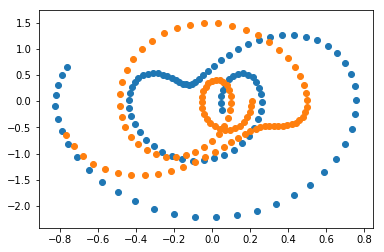

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.scatter(data['x'][:,0],data['x'][:,2])
plt.scatter(data['x'][:,1],data['x'][:,3])

cpu
[0.0488135  0.21518937 0.0822107  0.03590655]
(4, 51)
[ 0.47749514  0.37650525 -0.12947284  0.36925612]
(4, 51)
[0.07714024 0.19527001 0.13756571 0.35908882]
(4, 51)
[-0.38757268 -0.28756564 -0.25357337 -0.0775792 ]
(4, 51)
[-0.35904252  0.4673378   0.28889841  0.09412559]
(4, 51)
[ 0.20798235  0.26721007 -0.17027783  0.03860503]
(4, 51)
[0.48908844 0.16285648 0.27629161 0.22243108]
(4, 51)
[0.42291429 0.11703521 0.31026745 0.16100548]
(4, 51)
[0.06919597 0.28903597 0.26415726 0.27434789]
(4, 51)
[-0.31895833  0.26374687 -0.35092357 -0.02979102]
(4, 51)
[ 0.29302867  0.32643041  0.36313637 -0.0889195 ]
(4, 51)
[ 0.30489403  0.45858591 -0.1230689  -0.1651902 ]
(4, 51)
[0.21985203 0.26736086 0.36071449 0.10727286]
(4, 51)
[0.28899491 0.26191332 0.0208857  0.25988934]
(4, 51)
[-0.17447237 -0.10941691 -0.32529272 -0.2236359 ]
(4, 51)
[-0.3250847   0.22064255 -0.31716224  0.21731583]
(4, 51)
[-0.30955533  0.06393728  0.14840559  0.17198106]
(4, 51)
[0.12548881 0.11767002 0.18914866 0.23

train Epoch Loss: 0.0113209952
valid Epoch Loss: 0.0012994631
epoch:78
train Epoch Loss: 0.0112168724
valid Epoch Loss: 0.0013668580
epoch:79
train Epoch Loss: 0.0112343645
valid Epoch Loss: 0.0012416774
epoch:80
train Epoch Loss: 0.0111553930
valid Epoch Loss: 0.0012180677
epoch:81
train Epoch Loss: 0.0110187586
valid Epoch Loss: 0.0012185010
epoch:82
train Epoch Loss: 0.0110986959
valid Epoch Loss: 0.0013011955
epoch:83
train Epoch Loss: 0.0111294203
valid Epoch Loss: 0.0010184920
epoch:84
train Epoch Loss: 0.0109391529
valid Epoch Loss: 0.0011687265
epoch:85
train Epoch Loss: 0.0110906139
valid Epoch Loss: 0.0012221030
epoch:86
train Epoch Loss: 0.0110109299
valid Epoch Loss: 0.0011412945
epoch:87
train Epoch Loss: 0.0110074552
valid Epoch Loss: 0.0010852934
epoch:88
train Epoch Loss: 0.0110014034
valid Epoch Loss: 0.0011461301
epoch:89
train Epoch Loss: 0.0110033667
valid Epoch Loss: 0.0011656735
epoch:90
train Epoch Loss: 0.0109851062
valid Epoch Loss: 0.0010148881
epoch:91
train 

train Epoch Loss: 0.0094358893
valid Epoch Loss: 0.0008130513
epoch:193
train Epoch Loss: 0.0094655864
valid Epoch Loss: 0.0008148977
epoch:194
train Epoch Loss: 0.0094058681
valid Epoch Loss: 0.0008681549
epoch:195
train Epoch Loss: 0.0095805675
valid Epoch Loss: 0.0006737997
epoch:196
train Epoch Loss: 0.0094312960
valid Epoch Loss: 0.0007848514
epoch:197
train Epoch Loss: 0.0094452016
valid Epoch Loss: 0.0007694410
epoch:198
train Epoch Loss: 0.0094590373
valid Epoch Loss: 0.0007793393
epoch:199
train Epoch Loss: 0.0094765536
valid Epoch Loss: 0.0008553735
epoch:200
train Epoch Loss: 0.0094391545
valid Epoch Loss: 0.0008481360
epoch:201
train Epoch Loss: 0.0094152959
valid Epoch Loss: 0.0007897563
epoch:202
train Epoch Loss: 0.0094310213
valid Epoch Loss: 0.0008927372
epoch:203
train Epoch Loss: 0.0094155697
valid Epoch Loss: 0.0008165952
epoch:204
train Epoch Loss: 0.0093460418
valid Epoch Loss: 0.0007255372
epoch:205
train Epoch Loss: 0.0093382327
valid Epoch Loss: 0.0009057082
ep

train Epoch Loss: 0.0081975227
valid Epoch Loss: 0.0008448429
epoch:307
train Epoch Loss: 0.0082561439
valid Epoch Loss: 0.0007702528
epoch:308
train Epoch Loss: 0.0082648415
valid Epoch Loss: 0.0008126353
epoch:309
train Epoch Loss: 0.0083187940
valid Epoch Loss: 0.0008402020
epoch:310
train Epoch Loss: 0.0082446076
valid Epoch Loss: 0.0007550708
epoch:311
train Epoch Loss: 0.0081929266
valid Epoch Loss: 0.0007279037
epoch:312
train Epoch Loss: 0.0081940871
valid Epoch Loss: 0.0006234053
epoch:313
train Epoch Loss: 0.0082156984
valid Epoch Loss: 0.0006148780
epoch:314
train Epoch Loss: 0.0082723610
valid Epoch Loss: 0.0007878033
epoch:315
train Epoch Loss: 0.0081754271
valid Epoch Loss: 0.0006982395
epoch:316
train Epoch Loss: 0.0081774900
valid Epoch Loss: 0.0007507631
epoch:317
train Epoch Loss: 0.0081700813
valid Epoch Loss: 0.0007598517
epoch:318
train Epoch Loss: 0.0081273252
valid Epoch Loss: 0.0007243506
epoch:319
train Epoch Loss: 0.0081349639
valid Epoch Loss: 0.0007531922
ep

train Epoch Loss: 0.0071120975
valid Epoch Loss: 0.0007092974
epoch:421
train Epoch Loss: 0.0071426397
valid Epoch Loss: 0.0007588722
epoch:422
train Epoch Loss: 0.0070142280
valid Epoch Loss: 0.0008071099
epoch:423
train Epoch Loss: 0.0070593720
valid Epoch Loss: 0.0006725903
epoch:424
train Epoch Loss: 0.0070308433
valid Epoch Loss: 0.0007501769
epoch:425
train Epoch Loss: 0.0070186285
valid Epoch Loss: 0.0006428590
epoch:426
train Epoch Loss: 0.0071089938
valid Epoch Loss: 0.0007316127
epoch:427
train Epoch Loss: 0.0070032761
valid Epoch Loss: 0.0007692773
epoch:428
train Epoch Loss: 0.0070909760
valid Epoch Loss: 0.0005861565
epoch:429
train Epoch Loss: 0.0069413092
valid Epoch Loss: 0.0008199801
epoch:430
train Epoch Loss: 0.0071267276
valid Epoch Loss: 0.0007289170
epoch:431
train Epoch Loss: 0.0069834758
valid Epoch Loss: 0.0007661069
epoch:432
train Epoch Loss: 0.0069442661
valid Epoch Loss: 0.0006278548
epoch:433
train Epoch Loss: 0.0070370571
valid Epoch Loss: 0.0007378070
ep

train Epoch Loss: 0.0058953585
valid Epoch Loss: 0.0005360974
epoch:535
train Epoch Loss: 0.0059702215
valid Epoch Loss: 0.0006284873
epoch:536
train Epoch Loss: 0.0058492348
valid Epoch Loss: 0.0006960506
epoch:537
train Epoch Loss: 0.0059050741
valid Epoch Loss: 0.0006794456
epoch:538
train Epoch Loss: 0.0058578365
valid Epoch Loss: 0.0006970777
epoch:539
train Epoch Loss: 0.0058511728
valid Epoch Loss: 0.0006679824
epoch:540
train Epoch Loss: 0.0058347611
valid Epoch Loss: 0.0006364285
epoch:541
train Epoch Loss: 0.0058358368
valid Epoch Loss: 0.0006296618
epoch:542
train Epoch Loss: 0.0057659252
valid Epoch Loss: 0.0005724247
epoch:543
train Epoch Loss: 0.0058257924
valid Epoch Loss: 0.0007444795
epoch:544
train Epoch Loss: 0.0058184229
valid Epoch Loss: 0.0005298152
epoch:545
train Epoch Loss: 0.0057784948
valid Epoch Loss: 0.0006550601
epoch:546
train Epoch Loss: 0.0058084666
valid Epoch Loss: 0.0007445626
epoch:547
train Epoch Loss: 0.0057195947
valid Epoch Loss: 0.0006232393
ep

train Epoch Loss: 0.0047588283
valid Epoch Loss: 0.0006857076
epoch:649
train Epoch Loss: 0.0048123053
valid Epoch Loss: 0.0005743224
epoch:650
train Epoch Loss: 0.0047935499
valid Epoch Loss: 0.0006305111
epoch:651
train Epoch Loss: 0.0047043925
valid Epoch Loss: 0.0006233207
epoch:652
train Epoch Loss: 0.0047353525
valid Epoch Loss: 0.0005791734
epoch:653
train Epoch Loss: 0.0046987040
valid Epoch Loss: 0.0006210565
epoch:654
train Epoch Loss: 0.0047095288
valid Epoch Loss: 0.0006267764
epoch:655
train Epoch Loss: 0.0046582771
valid Epoch Loss: 0.0004994731
epoch:656
train Epoch Loss: 0.0046235281
valid Epoch Loss: 0.0006499895
epoch:657
train Epoch Loss: 0.0046490333
valid Epoch Loss: 0.0006110430
epoch:658
train Epoch Loss: 0.0046226890
valid Epoch Loss: 0.0005135762
epoch:659
train Epoch Loss: 0.0047225226
valid Epoch Loss: 0.0007132270
epoch:660
train Epoch Loss: 0.0046767918
valid Epoch Loss: 0.0005515797
epoch:661
train Epoch Loss: 0.0047165444
valid Epoch Loss: 0.0006454508
ep

train Epoch Loss: 0.0036449416
valid Epoch Loss: 0.0005423814
epoch:763
train Epoch Loss: 0.0036299659
valid Epoch Loss: 0.0005033053
epoch:764
train Epoch Loss: 0.0036228686
valid Epoch Loss: 0.0006333013
epoch:765
train Epoch Loss: 0.0036128527
valid Epoch Loss: 0.0006674084
epoch:766
train Epoch Loss: 0.0035173339
valid Epoch Loss: 0.0006424407
epoch:767
train Epoch Loss: 0.0036374351
valid Epoch Loss: 0.0006435038
epoch:768
train Epoch Loss: 0.0035291670
valid Epoch Loss: 0.0006442033
epoch:769
train Epoch Loss: 0.0034948834
valid Epoch Loss: 0.0006506935
epoch:770
train Epoch Loss: 0.0035686574
valid Epoch Loss: 0.0007317273
epoch:771
train Epoch Loss: 0.0035621775
valid Epoch Loss: 0.0006368831
epoch:772
train Epoch Loss: 0.0034762365
valid Epoch Loss: 0.0006220677
epoch:773
train Epoch Loss: 0.0034483653
valid Epoch Loss: 0.0005847180
epoch:774
train Epoch Loss: 0.0034896908
valid Epoch Loss: 0.0007310185
epoch:775
train Epoch Loss: 0.0035007549
valid Epoch Loss: 0.0006594546
ep

train Epoch Loss: 0.0025027394
valid Epoch Loss: 0.0006496354
epoch:877
train Epoch Loss: 0.0024868471
valid Epoch Loss: 0.0006691131
epoch:878
train Epoch Loss: 0.0025189035
valid Epoch Loss: 0.0006477284
epoch:879
train Epoch Loss: 0.0024306313
valid Epoch Loss: 0.0005484038
epoch:880
train Epoch Loss: 0.0024421122
valid Epoch Loss: 0.0006691359
epoch:881
train Epoch Loss: 0.0024176599
valid Epoch Loss: 0.0006573569
epoch:882
train Epoch Loss: 0.0024181285
valid Epoch Loss: 0.0005736431
epoch:883
train Epoch Loss: 0.0023798582
valid Epoch Loss: 0.0006381773
epoch:884
train Epoch Loss: 0.0024900362
valid Epoch Loss: 0.0005469713
epoch:885
train Epoch Loss: 0.0024067690
valid Epoch Loss: 0.0006395779
epoch:886
train Epoch Loss: 0.0023203318
valid Epoch Loss: 0.0005891331
epoch:887
train Epoch Loss: 0.0023512330
valid Epoch Loss: 0.0005693593
epoch:888
train Epoch Loss: 0.0024005673
valid Epoch Loss: 0.0006769209
epoch:889
train Epoch Loss: 0.0023381512
valid Epoch Loss: 0.0006203348
ep

train Epoch Loss: 0.0015695011
valid Epoch Loss: 0.0006468325
epoch:991
train Epoch Loss: 0.0015996039
valid Epoch Loss: 0.0006248640
epoch:992
train Epoch Loss: 0.0016002724
valid Epoch Loss: 0.0005420738
epoch:993
train Epoch Loss: 0.0016281432
valid Epoch Loss: 0.0005986200
epoch:994
train Epoch Loss: 0.0016166682
valid Epoch Loss: 0.0007978346
epoch:995
train Epoch Loss: 0.0015376334
valid Epoch Loss: 0.0006560552
epoch:996
train Epoch Loss: 0.0016489360
valid Epoch Loss: 0.0006159992
epoch:997
train Epoch Loss: 0.0016494468
valid Epoch Loss: 0.0005975856
epoch:998
train Epoch Loss: 0.0016241797
valid Epoch Loss: 0.0006538050
epoch:999
train Epoch Loss: 0.0016191509
valid Epoch Loss: 0.0006621341
epoch:1000
train Epoch Loss: 0.0016961419
valid Epoch Loss: 0.0006099867
epoch:1001
train Epoch Loss: 0.0015444434
valid Epoch Loss: 0.0005687217
epoch:1002
train Epoch Loss: 0.0015269137
valid Epoch Loss: 0.0005408031
epoch:1003
train Epoch Loss: 0.0015588645
valid Epoch Loss: 0.000510949

train Epoch Loss: 0.0010790968
valid Epoch Loss: 0.0006857570
epoch:1105
train Epoch Loss: 0.0011569858
valid Epoch Loss: 0.0006392162
epoch:1106
train Epoch Loss: 0.0010515522
valid Epoch Loss: 0.0004698267
epoch:1107
train Epoch Loss: 0.0009891400
valid Epoch Loss: 0.0006293267
epoch:1108
train Epoch Loss: 0.0010528448
valid Epoch Loss: 0.0005886958
epoch:1109
train Epoch Loss: 0.0011500318
valid Epoch Loss: 0.0005851994
epoch:1110
train Epoch Loss: 0.0009659315
valid Epoch Loss: 0.0006079273
epoch:1111
train Epoch Loss: 0.0009891953
valid Epoch Loss: 0.0004712100
epoch:1112
train Epoch Loss: 0.0010293924
valid Epoch Loss: 0.0005387526
epoch:1113
train Epoch Loss: 0.0009737172
valid Epoch Loss: 0.0005729178
epoch:1114
train Epoch Loss: 0.0010405446
valid Epoch Loss: 0.0007624410
epoch:1115
train Epoch Loss: 0.0010239863
valid Epoch Loss: 0.0006751509
epoch:1116
train Epoch Loss: 0.0009447898
valid Epoch Loss: 0.0005876402
epoch:1117
train Epoch Loss: 0.0010525262
valid Epoch Loss: 0.

train Epoch Loss: 0.0004843770
valid Epoch Loss: 0.0005784172
epoch:1219
train Epoch Loss: 0.0005148334
valid Epoch Loss: 0.0006339456
epoch:1220
train Epoch Loss: 0.0004133145
valid Epoch Loss: 0.0005660739
epoch:1221
train Epoch Loss: 0.0005006698
valid Epoch Loss: 0.0006185528
epoch:1222
train Epoch Loss: 0.0004306187
valid Epoch Loss: 0.0006163514
epoch:1223
train Epoch Loss: 0.0004343134
valid Epoch Loss: 0.0007194894
epoch:1224
train Epoch Loss: 0.0004386597
valid Epoch Loss: 0.0005738716
epoch:1225
train Epoch Loss: 0.0004147237
valid Epoch Loss: 0.0006292563
epoch:1226
train Epoch Loss: 0.0004263229
valid Epoch Loss: 0.0006323425
epoch:1227
train Epoch Loss: 0.0004850148
valid Epoch Loss: 0.0005649060
epoch:1228
train Epoch Loss: 0.0004103130
valid Epoch Loss: 0.0005864528
epoch:1229
train Epoch Loss: 0.0003823744
valid Epoch Loss: 0.0005612918
epoch:1230
train Epoch Loss: 0.0003993943
valid Epoch Loss: 0.0005890310
epoch:1231
train Epoch Loss: 0.0004531443
valid Epoch Loss: 0.

train Epoch Loss: 0.0004904831
valid Epoch Loss: 0.0006578664
epoch:1333
train Epoch Loss: 0.0004210597
valid Epoch Loss: 0.0006209151
epoch:1334
train Epoch Loss: 0.0003535836
valid Epoch Loss: 0.0006700339
epoch:1335
train Epoch Loss: 0.0003678304
valid Epoch Loss: 0.0005509242
epoch:1336
train Epoch Loss: 0.0003958414
valid Epoch Loss: 0.0006438139
epoch:1337
train Epoch Loss: 0.0003870511
valid Epoch Loss: 0.0004359039
epoch:1338
train Epoch Loss: 0.0003861082
valid Epoch Loss: 0.0006328965
epoch:1339
train Epoch Loss: 0.0003896152
valid Epoch Loss: 0.0006013589
epoch:1340
train Epoch Loss: 0.0004074579
valid Epoch Loss: 0.0006514429
epoch:1341
train Epoch Loss: 0.0004720794
valid Epoch Loss: 0.0006252783
epoch:1342
train Epoch Loss: 0.0003747497
valid Epoch Loss: 0.0006451062
epoch:1343
train Epoch Loss: 0.0004526610
valid Epoch Loss: 0.0006658460
epoch:1344
train Epoch Loss: 0.0004265502
valid Epoch Loss: 0.0005847382
epoch:1345
train Epoch Loss: 0.0003714960
valid Epoch Loss: 0.

train Epoch Loss: 0.0003694475
valid Epoch Loss: 0.0006789458
epoch:1447
train Epoch Loss: 0.0004200375
valid Epoch Loss: 0.0005317565
epoch:1448
train Epoch Loss: 0.0004363048
valid Epoch Loss: 0.0007042601
epoch:1449
train Epoch Loss: 0.0005117672
valid Epoch Loss: 0.0006489258
epoch:1450
train Epoch Loss: 0.0003988010
valid Epoch Loss: 0.0006595888
epoch:1451
train Epoch Loss: 0.0004533270
valid Epoch Loss: 0.0005519288
epoch:1452
train Epoch Loss: 0.0003529888
valid Epoch Loss: 0.0006247342
epoch:1453
train Epoch Loss: 0.0003782313
valid Epoch Loss: 0.0006192483
epoch:1454
train Epoch Loss: 0.0003978758
valid Epoch Loss: 0.0005272469
epoch:1455
train Epoch Loss: 0.0003736827
valid Epoch Loss: 0.0005357257
epoch:1456
train Epoch Loss: 0.0003082484
valid Epoch Loss: 0.0006839769
epoch:1457
train Epoch Loss: 0.0003059361
valid Epoch Loss: 0.0005402812
epoch:1458
train Epoch Loss: 0.0003768301
valid Epoch Loss: 0.0007204911
epoch:1459
train Epoch Loss: 0.0003177813
valid Epoch Loss: 0.

train Epoch Loss: 0.0004588632
valid Epoch Loss: 0.0006043929
epoch:1561
train Epoch Loss: 0.0003464690
valid Epoch Loss: 0.0005658932
epoch:1562
train Epoch Loss: 0.0004216132
valid Epoch Loss: 0.0005822995
epoch:1563
train Epoch Loss: 0.0004104156
valid Epoch Loss: 0.0007073036
epoch:1564
train Epoch Loss: 0.0003915210
valid Epoch Loss: 0.0004925273
epoch:1565
train Epoch Loss: 0.0004102475
valid Epoch Loss: 0.0006023722
epoch:1566
train Epoch Loss: 0.0003749635
valid Epoch Loss: 0.0005318673
epoch:1567
train Epoch Loss: 0.0003598630
valid Epoch Loss: 0.0005964861
epoch:1568
train Epoch Loss: 0.0003980985
valid Epoch Loss: 0.0005772590
epoch:1569
train Epoch Loss: 0.0003870882
valid Epoch Loss: 0.0007886956
epoch:1570
train Epoch Loss: 0.0003527923
valid Epoch Loss: 0.0005924798
epoch:1571
train Epoch Loss: 0.0004059791
valid Epoch Loss: 0.0006213004
epoch:1572
train Epoch Loss: 0.0004319734
valid Epoch Loss: 0.0007091303
epoch:1573
train Epoch Loss: 0.0003319576
valid Epoch Loss: 0.

train Epoch Loss: 0.0003469022
valid Epoch Loss: 0.0006522318
epoch:1675
train Epoch Loss: 0.0003644950
valid Epoch Loss: 0.0007227043
epoch:1676
train Epoch Loss: 0.0004529731
valid Epoch Loss: 0.0005597456
epoch:1677
train Epoch Loss: 0.0003337538
valid Epoch Loss: 0.0005607111
epoch:1678
train Epoch Loss: 0.0004223462
valid Epoch Loss: 0.0006138369
epoch:1679
train Epoch Loss: 0.0004087529
valid Epoch Loss: 0.0005894495
epoch:1680
train Epoch Loss: 0.0004411723
valid Epoch Loss: 0.0006332083
epoch:1681
train Epoch Loss: 0.0004419350
valid Epoch Loss: 0.0005290874
epoch:1682
train Epoch Loss: 0.0003645708
valid Epoch Loss: 0.0005814967
epoch:1683
train Epoch Loss: 0.0003431680
valid Epoch Loss: 0.0006507475
epoch:1684
train Epoch Loss: 0.0004123802
valid Epoch Loss: 0.0005819269
epoch:1685
train Epoch Loss: 0.0003771731
valid Epoch Loss: 0.0006604381
epoch:1686
train Epoch Loss: 0.0004052584
valid Epoch Loss: 0.0006200097
epoch:1687
train Epoch Loss: 0.0004340584
valid Epoch Loss: 0.

train Epoch Loss: 0.0004352446
valid Epoch Loss: 0.0005783350
epoch:1789
train Epoch Loss: 0.0004430752
valid Epoch Loss: 0.0005293871
epoch:1790
train Epoch Loss: 0.0004191132
valid Epoch Loss: 0.0005373821
epoch:1791
train Epoch Loss: 0.0004129950
valid Epoch Loss: 0.0006017154
epoch:1792
train Epoch Loss: 0.0003974654
valid Epoch Loss: 0.0006232921
epoch:1793
train Epoch Loss: 0.0003876480
valid Epoch Loss: 0.0006392314
epoch:1794
train Epoch Loss: 0.0004217385
valid Epoch Loss: 0.0004658087
epoch:1795
train Epoch Loss: 0.0003490508
valid Epoch Loss: 0.0005714422
epoch:1796
train Epoch Loss: 0.0004015338
valid Epoch Loss: 0.0006022343
epoch:1797
train Epoch Loss: 0.0002878643
valid Epoch Loss: 0.0005360210
epoch:1798
train Epoch Loss: 0.0004088153
valid Epoch Loss: 0.0006119985
epoch:1799
train Epoch Loss: 0.0003750082
valid Epoch Loss: 0.0006382531
epoch:1800
train Epoch Loss: 0.0004295969
valid Epoch Loss: 0.0005749352
epoch:1801
train Epoch Loss: 0.0003783093
valid Epoch Loss: 0.

train Epoch Loss: 0.0003775039
valid Epoch Loss: 0.0004985279
epoch:1903
train Epoch Loss: 0.0004252217
valid Epoch Loss: 0.0007076499
epoch:1904
train Epoch Loss: 0.0004432449
valid Epoch Loss: 0.0006117437
epoch:1905
train Epoch Loss: 0.0004407869
valid Epoch Loss: 0.0006366115
epoch:1906
train Epoch Loss: 0.0004304198
valid Epoch Loss: 0.0006097128
epoch:1907
train Epoch Loss: 0.0003629217
valid Epoch Loss: 0.0006637325
epoch:1908
train Epoch Loss: 0.0004178359
valid Epoch Loss: 0.0006380336
epoch:1909
train Epoch Loss: 0.0004134538
valid Epoch Loss: 0.0007027159
epoch:1910
train Epoch Loss: 0.0003957442
valid Epoch Loss: 0.0006424150
epoch:1911
train Epoch Loss: 0.0003686810
valid Epoch Loss: 0.0006760449
epoch:1912
train Epoch Loss: 0.0004470432
valid Epoch Loss: 0.0006839590
epoch:1913
train Epoch Loss: 0.0004086377
valid Epoch Loss: 0.0007228138
epoch:1914
train Epoch Loss: 0.0004036672
valid Epoch Loss: 0.0006747445
epoch:1915
train Epoch Loss: 0.0004194154
valid Epoch Loss: 0.

train Epoch Loss: 0.0003351795
valid Epoch Loss: 0.0005392925
epoch:2017
train Epoch Loss: 0.0004204821
valid Epoch Loss: 0.0005618176
epoch:2018
train Epoch Loss: 0.0004357282
valid Epoch Loss: 0.0004635185
epoch:2019
train Epoch Loss: 0.0003825690
valid Epoch Loss: 0.0005169639
epoch:2020
train Epoch Loss: 0.0004054042
valid Epoch Loss: 0.0005860837
epoch:2021
train Epoch Loss: 0.0004143457
valid Epoch Loss: 0.0006843247
epoch:2022
train Epoch Loss: 0.0004263079
valid Epoch Loss: 0.0005951228
epoch:2023
train Epoch Loss: 0.0004061347
valid Epoch Loss: 0.0005197236
epoch:2024
train Epoch Loss: 0.0003574202
valid Epoch Loss: 0.0005819946
epoch:2025
train Epoch Loss: 0.0004608638
valid Epoch Loss: 0.0005183918
epoch:2026
train Epoch Loss: 0.0004472442
valid Epoch Loss: 0.0005750462
epoch:2027
train Epoch Loss: 0.0003628483
valid Epoch Loss: 0.0005369714
epoch:2028
train Epoch Loss: 0.0003534031
valid Epoch Loss: 0.0006203580
epoch:2029
train Epoch Loss: 0.0003802141
valid Epoch Loss: 0.

train Epoch Loss: 0.0004145182
valid Epoch Loss: 0.0005107965
epoch:2131
train Epoch Loss: 0.0003740363
valid Epoch Loss: 0.0004440903
epoch:2132
train Epoch Loss: 0.0004202253
valid Epoch Loss: 0.0006641304
epoch:2133
train Epoch Loss: 0.0004047026
valid Epoch Loss: 0.0004930590
epoch:2134
train Epoch Loss: 0.0004292547
valid Epoch Loss: 0.0004886403
epoch:2135
train Epoch Loss: 0.0002938368
valid Epoch Loss: 0.0005710616
epoch:2136
train Epoch Loss: 0.0005188492
valid Epoch Loss: 0.0005362309
epoch:2137
train Epoch Loss: 0.0005224876
valid Epoch Loss: 0.0005417467
epoch:2138
train Epoch Loss: 0.0003799244
valid Epoch Loss: 0.0005598575
epoch:2139
train Epoch Loss: 0.0003631436
valid Epoch Loss: 0.0006553049
epoch:2140
train Epoch Loss: 0.0003857412
valid Epoch Loss: 0.0006019283
epoch:2141
train Epoch Loss: 0.0003537450
valid Epoch Loss: 0.0005626815
epoch:2142
train Epoch Loss: 0.0003754780
valid Epoch Loss: 0.0005255763
epoch:2143
train Epoch Loss: 0.0004555385
valid Epoch Loss: 0.

train Epoch Loss: 0.0003663491
valid Epoch Loss: 0.0006054881
epoch:2244
train Epoch Loss: 0.0003719148
valid Epoch Loss: 0.0005155370
epoch:2245
train Epoch Loss: 0.0003770717
valid Epoch Loss: 0.0005951475
epoch:2246
train Epoch Loss: 0.0003899453
valid Epoch Loss: 0.0005530266
epoch:2247
train Epoch Loss: 0.0004879746
valid Epoch Loss: 0.0005792349
epoch:2248
train Epoch Loss: 0.0003458058
valid Epoch Loss: 0.0006508898
epoch:2249
train Epoch Loss: 0.0003518002
valid Epoch Loss: 0.0005154358
epoch:2250
train Epoch Loss: 0.0004082201
valid Epoch Loss: 0.0006100218
epoch:2251
train Epoch Loss: 0.0004567647
valid Epoch Loss: 0.0005805193
epoch:2252
train Epoch Loss: 0.0003600666
valid Epoch Loss: 0.0005414714
epoch:2253
train Epoch Loss: 0.0003800981
valid Epoch Loss: 0.0005370078
epoch:2254
train Epoch Loss: 0.0003902570
valid Epoch Loss: 0.0006137728
epoch:2255
train Epoch Loss: 0.0003707641
valid Epoch Loss: 0.0005764875
epoch:2256
train Epoch Loss: 0.0003055240
valid Epoch Loss: 0.

train Epoch Loss: 0.0003098451
valid Epoch Loss: 0.0005407222
epoch:2358
train Epoch Loss: 0.0003260903
valid Epoch Loss: 0.0005704823
epoch:2359
train Epoch Loss: 0.0003637651
valid Epoch Loss: 0.0006033650
epoch:2360
train Epoch Loss: 0.0003605380
valid Epoch Loss: 0.0005550643
epoch:2361
train Epoch Loss: 0.0004418442
valid Epoch Loss: 0.0005731306
epoch:2362
train Epoch Loss: 0.0003096639
valid Epoch Loss: 0.0006261034
epoch:2363
train Epoch Loss: 0.0004210863
valid Epoch Loss: 0.0006261517
epoch:2364
train Epoch Loss: 0.0003651361
valid Epoch Loss: 0.0006658288
epoch:2365
train Epoch Loss: 0.0003488127
valid Epoch Loss: 0.0006188554
epoch:2366
train Epoch Loss: 0.0004456462
valid Epoch Loss: 0.0005900434
epoch:2367
train Epoch Loss: 0.0003781197
valid Epoch Loss: 0.0005269930
epoch:2368
train Epoch Loss: 0.0003645828
valid Epoch Loss: 0.0004488234
epoch:2369
train Epoch Loss: 0.0003519139
valid Epoch Loss: 0.0006537710
epoch:2370
train Epoch Loss: 0.0003169375
valid Epoch Loss: 0.

train Epoch Loss: 0.0003371651
valid Epoch Loss: 0.0006070001
epoch:2472
train Epoch Loss: 0.0004494426
valid Epoch Loss: 0.0006380141
epoch:2473
train Epoch Loss: 0.0002966194
valid Epoch Loss: 0.0005756719
epoch:2474
train Epoch Loss: 0.0004092977
valid Epoch Loss: 0.0006140285
epoch:2475
train Epoch Loss: 0.0004142301
valid Epoch Loss: 0.0006179197
epoch:2476
train Epoch Loss: 0.0003714491
valid Epoch Loss: 0.0005789192
epoch:2477
train Epoch Loss: 0.0003836933
valid Epoch Loss: 0.0005732125
epoch:2478
train Epoch Loss: 0.0004443963
valid Epoch Loss: 0.0004450986
epoch:2479
train Epoch Loss: 0.0003656191
valid Epoch Loss: 0.0005011040
epoch:2480
train Epoch Loss: 0.0003904729
valid Epoch Loss: 0.0003936306
epoch:2481
train Epoch Loss: 0.0003043785
valid Epoch Loss: 0.0005462450
epoch:2482
train Epoch Loss: 0.0004664663
valid Epoch Loss: 0.0005801620
epoch:2483
train Epoch Loss: 0.0003508851
valid Epoch Loss: 0.0005486949
epoch:2484
train Epoch Loss: 0.0003497092
valid Epoch Loss: 0.

train Epoch Loss: 0.0003156984
valid Epoch Loss: 0.0006230046
epoch:2587
train Epoch Loss: 0.0003900893
valid Epoch Loss: 0.0004505705
epoch:2588
train Epoch Loss: 0.0003132762
valid Epoch Loss: 0.0005631274
epoch:2589
train Epoch Loss: 0.0003303639
valid Epoch Loss: 0.0005572846
epoch:2590
train Epoch Loss: 0.0003629526
valid Epoch Loss: 0.0005504434
epoch:2591
train Epoch Loss: 0.0003141449
valid Epoch Loss: 0.0006042825
epoch:2592
train Epoch Loss: 0.0003400284
valid Epoch Loss: 0.0004952919
epoch:2593
train Epoch Loss: 0.0003103860
valid Epoch Loss: 0.0005020520
epoch:2594
train Epoch Loss: 0.0002587258
valid Epoch Loss: 0.0004392868
epoch:2595
train Epoch Loss: 0.0002996192
valid Epoch Loss: 0.0004889977
epoch:2596
train Epoch Loss: 0.0003343481
valid Epoch Loss: 0.0005736221
epoch:2597
train Epoch Loss: 0.0003481734
valid Epoch Loss: 0.0005271509
epoch:2598
train Epoch Loss: 0.0003864082
valid Epoch Loss: 0.0005307583
epoch:2599
train Epoch Loss: 0.0003340811
valid Epoch Loss: 0.

train Epoch Loss: 0.0004244209
valid Epoch Loss: 0.0006800871
epoch:2701
train Epoch Loss: 0.0002977312
valid Epoch Loss: 0.0005242896
epoch:2702
train Epoch Loss: 0.0003305039
valid Epoch Loss: 0.0005648573
epoch:2703
train Epoch Loss: 0.0003652573
valid Epoch Loss: 0.0005877470
epoch:2704
train Epoch Loss: 0.0002477833
valid Epoch Loss: 0.0006003351
epoch:2705
train Epoch Loss: 0.0003348912
valid Epoch Loss: 0.0005312830
epoch:2706
train Epoch Loss: 0.0003144371
valid Epoch Loss: 0.0005789869
epoch:2707
train Epoch Loss: 0.0003258630
valid Epoch Loss: 0.0005136817
epoch:2708
train Epoch Loss: 0.0003380333
valid Epoch Loss: 0.0005692774
epoch:2709
train Epoch Loss: 0.0003342364
valid Epoch Loss: 0.0005394415
epoch:2710
train Epoch Loss: 0.0003730639
valid Epoch Loss: 0.0006782697
epoch:2711
train Epoch Loss: 0.0003412319
valid Epoch Loss: 0.0006232652
epoch:2712
train Epoch Loss: 0.0003767689
valid Epoch Loss: 0.0006750950
epoch:2713
train Epoch Loss: 0.0003619241
valid Epoch Loss: 0.

train Epoch Loss: 0.0002332400
valid Epoch Loss: 0.0005888913
epoch:2816
train Epoch Loss: 0.0003283716
valid Epoch Loss: 0.0006118223
epoch:2817
train Epoch Loss: 0.0003204828
valid Epoch Loss: 0.0005419377
epoch:2818
train Epoch Loss: 0.0003018802
valid Epoch Loss: 0.0004959460
epoch:2819
train Epoch Loss: 0.0003402524
valid Epoch Loss: 0.0005386551
epoch:2820
train Epoch Loss: 0.0003773218
valid Epoch Loss: 0.0005344784
epoch:2821
train Epoch Loss: 0.0003155485
valid Epoch Loss: 0.0006186038
epoch:2822
train Epoch Loss: 0.0003824809
valid Epoch Loss: 0.0004912388
epoch:2823
train Epoch Loss: 0.0003317345
valid Epoch Loss: 0.0005910546
epoch:2824
train Epoch Loss: 0.0003219997
valid Epoch Loss: 0.0005566518
epoch:2825
train Epoch Loss: 0.0003577994
valid Epoch Loss: 0.0006014566
epoch:2826
train Epoch Loss: 0.0003803352
valid Epoch Loss: 0.0004827679
epoch:2827
train Epoch Loss: 0.0003499083
valid Epoch Loss: 0.0006247608
epoch:2828
train Epoch Loss: 0.0003292953
valid Epoch Loss: 0.

train Epoch Loss: 0.0003354719
valid Epoch Loss: 0.0005315887
epoch:2929
train Epoch Loss: 0.0002625837
valid Epoch Loss: 0.0005157664
epoch:2930
train Epoch Loss: 0.0003023076
valid Epoch Loss: 0.0006029194
epoch:2931
train Epoch Loss: 0.0002901172
valid Epoch Loss: 0.0004425680
epoch:2932
train Epoch Loss: 0.0004113803
valid Epoch Loss: 0.0006292430
epoch:2933
train Epoch Loss: 0.0002795087
valid Epoch Loss: 0.0006022377
epoch:2934
train Epoch Loss: 0.0004241013
valid Epoch Loss: 0.0004322171
epoch:2935
train Epoch Loss: 0.0003076530
valid Epoch Loss: 0.0005967109
epoch:2936
train Epoch Loss: 0.0003096880
valid Epoch Loss: 0.0005978198
epoch:2937
train Epoch Loss: 0.0003108397
valid Epoch Loss: 0.0005096674
epoch:2938
train Epoch Loss: 0.0002974754
valid Epoch Loss: 0.0005294560
epoch:2939
train Epoch Loss: 0.0002795682
valid Epoch Loss: 0.0006487535
epoch:2940
train Epoch Loss: 0.0003306275
valid Epoch Loss: 0.0005286167
epoch:2941
train Epoch Loss: 0.0003089391
valid Epoch Loss: 0.

train Epoch Loss: 0.0003144378
valid Epoch Loss: 0.0005060984
epoch:3043
train Epoch Loss: 0.0002211372
valid Epoch Loss: 0.0005559665
epoch:3044
train Epoch Loss: 0.0003477673
valid Epoch Loss: 0.0005808134
epoch:3045
train Epoch Loss: 0.0002816573
valid Epoch Loss: 0.0004452839
epoch:3046
train Epoch Loss: 0.0002733347
valid Epoch Loss: 0.0006102155
epoch:3047
train Epoch Loss: 0.0004268804
valid Epoch Loss: 0.0005115792
epoch:3048
train Epoch Loss: 0.0003277565
valid Epoch Loss: 0.0004983785
epoch:3049
train Epoch Loss: 0.0002790967
valid Epoch Loss: 0.0006087790
epoch:3050
train Epoch Loss: 0.0004157627
valid Epoch Loss: 0.0004878567
epoch:3051
train Epoch Loss: 0.0003409146
valid Epoch Loss: 0.0005724421
epoch:3052
train Epoch Loss: 0.0002744131
valid Epoch Loss: 0.0005386323
epoch:3053
train Epoch Loss: 0.0002894962
valid Epoch Loss: 0.0006475232
epoch:3054
train Epoch Loss: 0.0003377286
valid Epoch Loss: 0.0006051353
epoch:3055
train Epoch Loss: 0.0003254796
valid Epoch Loss: 0.

train Epoch Loss: 0.0002781793
valid Epoch Loss: 0.0005301253
epoch:3157
train Epoch Loss: 0.0003616037
valid Epoch Loss: 0.0005651811
epoch:3158
train Epoch Loss: 0.0003650076
valid Epoch Loss: 0.0005283311
epoch:3159
train Epoch Loss: 0.0003730759
valid Epoch Loss: 0.0005342189
epoch:3160
train Epoch Loss: 0.0003149924
valid Epoch Loss: 0.0005958742
epoch:3161
train Epoch Loss: 0.0002859746
valid Epoch Loss: 0.0005986996
epoch:3162
train Epoch Loss: 0.0003593673
valid Epoch Loss: 0.0005121658
epoch:3163
train Epoch Loss: 0.0004410715
valid Epoch Loss: 0.0007083754
epoch:3164
train Epoch Loss: 0.0004282726
valid Epoch Loss: 0.0006520809
epoch:3165
train Epoch Loss: 0.0003076052
valid Epoch Loss: 0.0005739141
epoch:3166
train Epoch Loss: 0.0003667715
valid Epoch Loss: 0.0004959744
epoch:3167
train Epoch Loss: 0.0004201524
valid Epoch Loss: 0.0005803843
epoch:3168
train Epoch Loss: 0.0002898796
valid Epoch Loss: 0.0005166393
epoch:3169
train Epoch Loss: 0.0002795332
valid Epoch Loss: 0.

train Epoch Loss: 0.0003441128
valid Epoch Loss: 0.0006211803
epoch:3271
train Epoch Loss: 0.0002816847
valid Epoch Loss: 0.0005846284
epoch:3272
train Epoch Loss: 0.0003108266
valid Epoch Loss: 0.0005749165
epoch:3273
train Epoch Loss: 0.0003570315
valid Epoch Loss: 0.0005135997
epoch:3274
train Epoch Loss: 0.0003389468
valid Epoch Loss: 0.0004564766
epoch:3275
train Epoch Loss: 0.0002890634
valid Epoch Loss: 0.0005054905
epoch:3276
train Epoch Loss: 0.0002678655
valid Epoch Loss: 0.0004919643
epoch:3277
train Epoch Loss: 0.0003713559
valid Epoch Loss: 0.0005773791
epoch:3278
train Epoch Loss: 0.0003237494
valid Epoch Loss: 0.0004758932
epoch:3279
train Epoch Loss: 0.0002966659
valid Epoch Loss: 0.0005545011
epoch:3280
train Epoch Loss: 0.0003264322
valid Epoch Loss: 0.0005749026
epoch:3281
train Epoch Loss: 0.0003555615
valid Epoch Loss: 0.0006071617
epoch:3282
train Epoch Loss: 0.0003141741
valid Epoch Loss: 0.0005168732
epoch:3283
train Epoch Loss: 0.0003154157
valid Epoch Loss: 0.

train Epoch Loss: 0.0002799556
valid Epoch Loss: 0.0005406674
epoch:3385
train Epoch Loss: 0.0003642495
valid Epoch Loss: 0.0004697114
epoch:3386
train Epoch Loss: 0.0003352546
valid Epoch Loss: 0.0005677825
epoch:3387
train Epoch Loss: 0.0003206346
valid Epoch Loss: 0.0004769218
epoch:3388
train Epoch Loss: 0.0002592017
valid Epoch Loss: 0.0004790734
epoch:3389
train Epoch Loss: 0.0003563836
valid Epoch Loss: 0.0005416937
epoch:3390
train Epoch Loss: 0.0002876999
valid Epoch Loss: 0.0005487672
epoch:3391
train Epoch Loss: 0.0002508241
valid Epoch Loss: 0.0004666455
epoch:3392
train Epoch Loss: 0.0003354911
valid Epoch Loss: 0.0004720231
epoch:3393
train Epoch Loss: 0.0003443756
valid Epoch Loss: 0.0005606925
epoch:3394
train Epoch Loss: 0.0003910651
valid Epoch Loss: 0.0004996523
epoch:3395
train Epoch Loss: 0.0003257158
valid Epoch Loss: 0.0006496832
epoch:3396
train Epoch Loss: 0.0002940702
valid Epoch Loss: 0.0005428236
epoch:3397
train Epoch Loss: 0.0002804716
valid Epoch Loss: 0.

train Epoch Loss: 0.0003941519
valid Epoch Loss: 0.0004953856
epoch:3499
train Epoch Loss: 0.0003643579
valid Epoch Loss: 0.0006029202
epoch:3500
train Epoch Loss: 0.0003224777
valid Epoch Loss: 0.0005876191
epoch:3501
train Epoch Loss: 0.0003005587
valid Epoch Loss: 0.0006010495
epoch:3502
train Epoch Loss: 0.0003371028
valid Epoch Loss: 0.0005774968
epoch:3503
train Epoch Loss: 0.0003076889
valid Epoch Loss: 0.0005703004
epoch:3504
train Epoch Loss: 0.0002791980
valid Epoch Loss: 0.0005092890
epoch:3505
train Epoch Loss: 0.0003215311
valid Epoch Loss: 0.0004704283
epoch:3506
train Epoch Loss: 0.0003258792
valid Epoch Loss: 0.0004766710
epoch:3507
train Epoch Loss: 0.0004166812
valid Epoch Loss: 0.0006115529
epoch:3508
train Epoch Loss: 0.0003556149
valid Epoch Loss: 0.0006998982
epoch:3509
train Epoch Loss: 0.0003334899
valid Epoch Loss: 0.0005581405
epoch:3510
train Epoch Loss: 0.0003619065
valid Epoch Loss: 0.0005378245
epoch:3511
train Epoch Loss: 0.0002822802
valid Epoch Loss: 0.

train Epoch Loss: 0.0003296464
valid Epoch Loss: 0.0005577683
epoch:3613
train Epoch Loss: 0.0003872864
valid Epoch Loss: 0.0005329686
epoch:3614
train Epoch Loss: 0.0004009694
valid Epoch Loss: 0.0005649360
epoch:3615
train Epoch Loss: 0.0002790112
valid Epoch Loss: 0.0005609959
epoch:3616
train Epoch Loss: 0.0003430597
valid Epoch Loss: 0.0005087249
epoch:3617
train Epoch Loss: 0.0003140095
valid Epoch Loss: 0.0005225262
epoch:3618
train Epoch Loss: 0.0002914082
valid Epoch Loss: 0.0005596659
epoch:3619
train Epoch Loss: 0.0002824241
valid Epoch Loss: 0.0004557400
epoch:3620
train Epoch Loss: 0.0002987912
valid Epoch Loss: 0.0004829475
epoch:3621
train Epoch Loss: 0.0003648935
valid Epoch Loss: 0.0005789633
epoch:3622
train Epoch Loss: 0.0002994428
valid Epoch Loss: 0.0004920164
epoch:3623
train Epoch Loss: 0.0003477719
valid Epoch Loss: 0.0006012020
epoch:3624
train Epoch Loss: 0.0003650620
valid Epoch Loss: 0.0005199915
epoch:3625
train Epoch Loss: 0.0003583834
valid Epoch Loss: 0.

train Epoch Loss: 0.0002950933
valid Epoch Loss: 0.0006312390
epoch:3727
train Epoch Loss: 0.0003413512
valid Epoch Loss: 0.0004531098
epoch:3728
train Epoch Loss: 0.0003640170
valid Epoch Loss: 0.0006377266
epoch:3729
train Epoch Loss: 0.0003512142
valid Epoch Loss: 0.0004135115
epoch:3730
train Epoch Loss: 0.0003014694
valid Epoch Loss: 0.0005422251
epoch:3731
train Epoch Loss: 0.0003803113
valid Epoch Loss: 0.0005613256
epoch:3732
train Epoch Loss: 0.0003078896
valid Epoch Loss: 0.0005271197
epoch:3733
train Epoch Loss: 0.0004354992
valid Epoch Loss: 0.0006119554
epoch:3734
train Epoch Loss: 0.0003750259
valid Epoch Loss: 0.0006055409
epoch:3735
train Epoch Loss: 0.0002719122
valid Epoch Loss: 0.0004472364
epoch:3736
train Epoch Loss: 0.0003134136
valid Epoch Loss: 0.0006010163
epoch:3737
train Epoch Loss: 0.0003195310
valid Epoch Loss: 0.0005644095
epoch:3738
train Epoch Loss: 0.0002710214
valid Epoch Loss: 0.0005070242
epoch:3739
train Epoch Loss: 0.0003094615
valid Epoch Loss: 0.

train Epoch Loss: 0.0003734997
valid Epoch Loss: 0.0004952340
epoch:3840
train Epoch Loss: 0.0003148866
valid Epoch Loss: 0.0004965590
epoch:3841
train Epoch Loss: 0.0003755593
valid Epoch Loss: 0.0004976803
epoch:3842
train Epoch Loss: 0.0003342273
valid Epoch Loss: 0.0005183470
epoch:3843
train Epoch Loss: 0.0003437984
valid Epoch Loss: 0.0005719460
epoch:3844
train Epoch Loss: 0.0003370560
valid Epoch Loss: 0.0005053724
epoch:3845
train Epoch Loss: 0.0003524555
valid Epoch Loss: 0.0005737053
epoch:3846
train Epoch Loss: 0.0003365805
valid Epoch Loss: 0.0005393503
epoch:3847
train Epoch Loss: 0.0003398125
valid Epoch Loss: 0.0005528840
epoch:3848
train Epoch Loss: 0.0003866654
valid Epoch Loss: 0.0005533591
epoch:3849
train Epoch Loss: 0.0003813961
valid Epoch Loss: 0.0004895965
epoch:3850
train Epoch Loss: 0.0003536752
valid Epoch Loss: 0.0004698151
epoch:3851
train Epoch Loss: 0.0003438100
valid Epoch Loss: 0.0004365762
epoch:3852
train Epoch Loss: 0.0003869105
valid Epoch Loss: 0.

train Epoch Loss: 0.0003343454
valid Epoch Loss: 0.0006108125
epoch:3955
train Epoch Loss: 0.0002707262
valid Epoch Loss: 0.0004528109
epoch:3956
train Epoch Loss: 0.0003676267
valid Epoch Loss: 0.0005589203
epoch:3957
train Epoch Loss: 0.0003645580
valid Epoch Loss: 0.0004962670
epoch:3958
train Epoch Loss: 0.0003855266
valid Epoch Loss: 0.0005693262
epoch:3959
train Epoch Loss: 0.0003223251
valid Epoch Loss: 0.0005765759
epoch:3960
train Epoch Loss: 0.0003645761
valid Epoch Loss: 0.0006806696
epoch:3961
train Epoch Loss: 0.0003237243
valid Epoch Loss: 0.0005064555
epoch:3962
train Epoch Loss: 0.0002979325
valid Epoch Loss: 0.0005445455
epoch:3963
train Epoch Loss: 0.0003264757
valid Epoch Loss: 0.0004665031
epoch:3964
train Epoch Loss: 0.0003947936
valid Epoch Loss: 0.0005171655
epoch:3965
train Epoch Loss: 0.0002448288
valid Epoch Loss: 0.0005317955
epoch:3966
train Epoch Loss: 0.0003247755
valid Epoch Loss: 0.0005839454
epoch:3967
train Epoch Loss: 0.0004193687
valid Epoch Loss: 0.

train Epoch Loss: 0.0003423161
valid Epoch Loss: 0.0005092188
epoch:4070
train Epoch Loss: 0.0003617166
valid Epoch Loss: 0.0004523385
epoch:4071
train Epoch Loss: 0.0004212233
valid Epoch Loss: 0.0005162685
epoch:4072
train Epoch Loss: 0.0003585242
valid Epoch Loss: 0.0005116517
epoch:4073
train Epoch Loss: 0.0003489881
valid Epoch Loss: 0.0005049720
epoch:4074
train Epoch Loss: 0.0002929448
valid Epoch Loss: 0.0005690157
epoch:4075
train Epoch Loss: 0.0003170535
valid Epoch Loss: 0.0005869024
epoch:4076
train Epoch Loss: 0.0003345979
valid Epoch Loss: 0.0006465169
epoch:4077
train Epoch Loss: 0.0002948469
valid Epoch Loss: 0.0005576984
epoch:4078
train Epoch Loss: 0.0003204364
valid Epoch Loss: 0.0004840524
epoch:4079
train Epoch Loss: 0.0003388429
valid Epoch Loss: 0.0004795289
epoch:4080
train Epoch Loss: 0.0003201182
valid Epoch Loss: 0.0005795382
epoch:4081
train Epoch Loss: 0.0003468397
valid Epoch Loss: 0.0004777408
epoch:4082
train Epoch Loss: 0.0003791956
valid Epoch Loss: 0.

train Epoch Loss: 0.0003253421
valid Epoch Loss: 0.0004899246
epoch:4183
train Epoch Loss: 0.0002898800
valid Epoch Loss: 0.0006829633
epoch:4184
train Epoch Loss: 0.0003311332
valid Epoch Loss: 0.0004795202
epoch:4185
train Epoch Loss: 0.0003096552
valid Epoch Loss: 0.0005929998
epoch:4186
train Epoch Loss: 0.0003555195
valid Epoch Loss: 0.0005731598
epoch:4187
train Epoch Loss: 0.0002687100
valid Epoch Loss: 0.0006195800
epoch:4188
train Epoch Loss: 0.0003150156
valid Epoch Loss: 0.0005115924
epoch:4189
train Epoch Loss: 0.0003285643
valid Epoch Loss: 0.0004642089
epoch:4190
train Epoch Loss: 0.0002904398
valid Epoch Loss: 0.0004694631
epoch:4191
train Epoch Loss: 0.0003251104
valid Epoch Loss: 0.0004674331
epoch:4192
train Epoch Loss: 0.0003097243
valid Epoch Loss: 0.0005647831
epoch:4193
train Epoch Loss: 0.0002826490
valid Epoch Loss: 0.0005806078
epoch:4194
train Epoch Loss: 0.0002701582
valid Epoch Loss: 0.0004999202
epoch:4195
train Epoch Loss: 0.0003924602
valid Epoch Loss: 0.

train Epoch Loss: 0.0003531949
valid Epoch Loss: 0.0005102668
epoch:4297
train Epoch Loss: 0.0003286834
valid Epoch Loss: 0.0005223043
epoch:4298
train Epoch Loss: 0.0002732147
valid Epoch Loss: 0.0005126606
epoch:4299
train Epoch Loss: 0.0003145071
valid Epoch Loss: 0.0006517615
epoch:4300
train Epoch Loss: 0.0003233035
valid Epoch Loss: 0.0004726976
epoch:4301
train Epoch Loss: 0.0003023419
valid Epoch Loss: 0.0005339166
epoch:4302
train Epoch Loss: 0.0003067023
valid Epoch Loss: 0.0005893472
epoch:4303
train Epoch Loss: 0.0003524287
valid Epoch Loss: 0.0005949028
epoch:4304
train Epoch Loss: 0.0003028505
valid Epoch Loss: 0.0005334079
epoch:4305
train Epoch Loss: 0.0003420277
valid Epoch Loss: 0.0005357259
epoch:4306
train Epoch Loss: 0.0003326817
valid Epoch Loss: 0.0005575100
epoch:4307
train Epoch Loss: 0.0003364130
valid Epoch Loss: 0.0005282723
epoch:4308
train Epoch Loss: 0.0003589193
valid Epoch Loss: 0.0005316653
epoch:4309
train Epoch Loss: 0.0002738396
valid Epoch Loss: 0.

train Epoch Loss: 0.0003847782
valid Epoch Loss: 0.0004280413
epoch:4410
train Epoch Loss: 0.0002816425
valid Epoch Loss: 0.0005498840
epoch:4411
train Epoch Loss: 0.0003313759
valid Epoch Loss: 0.0005489262
epoch:4412
train Epoch Loss: 0.0002904625
valid Epoch Loss: 0.0005519519
epoch:4413
train Epoch Loss: 0.0003316685
valid Epoch Loss: 0.0005443667
epoch:4414
train Epoch Loss: 0.0003805147
valid Epoch Loss: 0.0005852722
epoch:4415
train Epoch Loss: 0.0003317364
valid Epoch Loss: 0.0004075371
epoch:4416
train Epoch Loss: 0.0002272719
valid Epoch Loss: 0.0004874274
epoch:4417
train Epoch Loss: 0.0003215205
valid Epoch Loss: 0.0005318314
epoch:4418
train Epoch Loss: 0.0003978066
valid Epoch Loss: 0.0005059047
epoch:4419
train Epoch Loss: 0.0002968005
valid Epoch Loss: 0.0004934493
epoch:4420
train Epoch Loss: 0.0003819671
valid Epoch Loss: 0.0005485791
epoch:4421
train Epoch Loss: 0.0003460108
valid Epoch Loss: 0.0005684108
epoch:4422
train Epoch Loss: 0.0002972747
valid Epoch Loss: 0.

train Epoch Loss: 0.0003154553
valid Epoch Loss: 0.0006007646
epoch:4524
train Epoch Loss: 0.0002686513
valid Epoch Loss: 0.0005520854
epoch:4525
train Epoch Loss: 0.0003038213
valid Epoch Loss: 0.0005354908
epoch:4526
train Epoch Loss: 0.0003325175
valid Epoch Loss: 0.0004365753
epoch:4527
train Epoch Loss: 0.0003279700
valid Epoch Loss: 0.0005255418
epoch:4528
train Epoch Loss: 0.0003306351
valid Epoch Loss: 0.0005255628
epoch:4529
train Epoch Loss: 0.0004042120
valid Epoch Loss: 0.0004833813
epoch:4530
train Epoch Loss: 0.0002667707
valid Epoch Loss: 0.0004721068
epoch:4531
train Epoch Loss: 0.0003280742
valid Epoch Loss: 0.0005910464
epoch:4532
train Epoch Loss: 0.0003358072
valid Epoch Loss: 0.0004972121
epoch:4533
train Epoch Loss: 0.0002586997
valid Epoch Loss: 0.0005660965
epoch:4534
train Epoch Loss: 0.0002949729
valid Epoch Loss: 0.0005199982
epoch:4535
train Epoch Loss: 0.0003297416
valid Epoch Loss: 0.0005733457
epoch:4536
train Epoch Loss: 0.0003331724
valid Epoch Loss: 0.

train Epoch Loss: 0.0003275171
valid Epoch Loss: 0.0005760139
epoch:4638
train Epoch Loss: 0.0002884096
valid Epoch Loss: 0.0004680069
epoch:4639
train Epoch Loss: 0.0002811832
valid Epoch Loss: 0.0006499599
epoch:4640
train Epoch Loss: 0.0003375201
valid Epoch Loss: 0.0004712840
epoch:4641
train Epoch Loss: 0.0003142275
valid Epoch Loss: 0.0005034885
epoch:4642
train Epoch Loss: 0.0004440013
valid Epoch Loss: 0.0005698181
epoch:4643
train Epoch Loss: 0.0003434882
valid Epoch Loss: 0.0005448186
epoch:4644
train Epoch Loss: 0.0003469928
valid Epoch Loss: 0.0005716547
epoch:4645
train Epoch Loss: 0.0003044363
valid Epoch Loss: 0.0005312072
epoch:4646
train Epoch Loss: 0.0002991142
valid Epoch Loss: 0.0005494328
epoch:4647
train Epoch Loss: 0.0002332941
valid Epoch Loss: 0.0005341368
epoch:4648
train Epoch Loss: 0.0002671495
valid Epoch Loss: 0.0005596576
epoch:4649
train Epoch Loss: 0.0002318154
valid Epoch Loss: 0.0004944023
epoch:4650
train Epoch Loss: 0.0003227630
valid Epoch Loss: 0.

train Epoch Loss: 0.0003380681
valid Epoch Loss: 0.0004827027
epoch:4752
train Epoch Loss: 0.0003311010
valid Epoch Loss: 0.0005169457
epoch:4753
train Epoch Loss: 0.0003103198
valid Epoch Loss: 0.0004723547
epoch:4754
train Epoch Loss: 0.0003061177
valid Epoch Loss: 0.0005068893
epoch:4755
train Epoch Loss: 0.0004308582
valid Epoch Loss: 0.0005033455
epoch:4756
train Epoch Loss: 0.0003896220
valid Epoch Loss: 0.0006134334
epoch:4757
train Epoch Loss: 0.0003355121
valid Epoch Loss: 0.0004590317
epoch:4758
train Epoch Loss: 0.0002938084
valid Epoch Loss: 0.0005092587
epoch:4759
train Epoch Loss: 0.0002714019
valid Epoch Loss: 0.0005347672
epoch:4760
train Epoch Loss: 0.0003788071
valid Epoch Loss: 0.0006193414
epoch:4761
train Epoch Loss: 0.0003431008
valid Epoch Loss: 0.0006078929
epoch:4762
train Epoch Loss: 0.0003059832
valid Epoch Loss: 0.0005668168
epoch:4763
train Epoch Loss: 0.0003196406
valid Epoch Loss: 0.0004892173
epoch:4764
train Epoch Loss: 0.0003646900
valid Epoch Loss: 0.

train Epoch Loss: 0.0003190899
valid Epoch Loss: 0.0004655950
epoch:4866
train Epoch Loss: 0.0003379951
valid Epoch Loss: 0.0005645327
epoch:4867
train Epoch Loss: 0.0003136475
valid Epoch Loss: 0.0005631583
epoch:4868
train Epoch Loss: 0.0003181244
valid Epoch Loss: 0.0004870521
epoch:4869
train Epoch Loss: 0.0003196973
valid Epoch Loss: 0.0004789367
epoch:4870
train Epoch Loss: 0.0003424764
valid Epoch Loss: 0.0005513213
epoch:4871
train Epoch Loss: 0.0003329799
valid Epoch Loss: 0.0005003316
epoch:4872
train Epoch Loss: 0.0003049347
valid Epoch Loss: 0.0005135391
epoch:4873
train Epoch Loss: 0.0003286927
valid Epoch Loss: 0.0005645992
epoch:4874
train Epoch Loss: 0.0003662870
valid Epoch Loss: 0.0004745824
epoch:4875
train Epoch Loss: 0.0003590223
valid Epoch Loss: 0.0004729947
epoch:4876
train Epoch Loss: 0.0003966917
valid Epoch Loss: 0.0004816786
epoch:4877
train Epoch Loss: 0.0002960234
valid Epoch Loss: 0.0004939939
epoch:4878
train Epoch Loss: 0.0003545120
valid Epoch Loss: 0.

train Epoch Loss: 0.0002583188
valid Epoch Loss: 0.0005107849
epoch:4980
train Epoch Loss: 0.0002946636
valid Epoch Loss: 0.0005085320
epoch:4981
train Epoch Loss: 0.0003698050
valid Epoch Loss: 0.0004734762
epoch:4982
train Epoch Loss: 0.0002913329
valid Epoch Loss: 0.0005688768
epoch:4983
train Epoch Loss: 0.0003947536
valid Epoch Loss: 0.0005039064
epoch:4984
train Epoch Loss: 0.0003116065
valid Epoch Loss: 0.0005088242
epoch:4985
train Epoch Loss: 0.0003396138
valid Epoch Loss: 0.0005467520
epoch:4986
train Epoch Loss: 0.0003456267
valid Epoch Loss: 0.0004692200
epoch:4987
train Epoch Loss: 0.0004127386
valid Epoch Loss: 0.0006418978
epoch:4988
train Epoch Loss: 0.0003308619
valid Epoch Loss: 0.0004807800
epoch:4989
train Epoch Loss: 0.0003198990
valid Epoch Loss: 0.0005572452
epoch:4990
train Epoch Loss: 0.0002493835
valid Epoch Loss: 0.0005700458
epoch:4991
train Epoch Loss: 0.0002541707
valid Epoch Loss: 0.0005889381
epoch:4992
train Epoch Loss: 0.0002920221
valid Epoch Loss: 0.

train Epoch Loss: 0.0002521060
valid Epoch Loss: 0.0005900552
epoch:5094
train Epoch Loss: 0.0003078792
valid Epoch Loss: 0.0005142981
epoch:5095
train Epoch Loss: 0.0002923740
valid Epoch Loss: 0.0004971977
epoch:5096
train Epoch Loss: 0.0003476072
valid Epoch Loss: 0.0005715442
epoch:5097
train Epoch Loss: 0.0003589297
valid Epoch Loss: 0.0005129633
epoch:5098
train Epoch Loss: 0.0003535660
valid Epoch Loss: 0.0005896955
epoch:5099
train Epoch Loss: 0.0002956114
valid Epoch Loss: 0.0006087814
epoch:5100
train Epoch Loss: 0.0002847272
valid Epoch Loss: 0.0004628091
epoch:5101
train Epoch Loss: 0.0002879040
valid Epoch Loss: 0.0005166421
epoch:5102
train Epoch Loss: 0.0003168599
valid Epoch Loss: 0.0005016418
epoch:5103
train Epoch Loss: 0.0003246577
valid Epoch Loss: 0.0005259271
epoch:5104
train Epoch Loss: 0.0003031117
valid Epoch Loss: 0.0005665421
epoch:5105
train Epoch Loss: 0.0002938394
valid Epoch Loss: 0.0005233679
epoch:5106
train Epoch Loss: 0.0003373924
valid Epoch Loss: 0.

train Epoch Loss: 0.0002543908
valid Epoch Loss: 0.0005457487
epoch:5208
train Epoch Loss: 0.0003302797
valid Epoch Loss: 0.0005802602
epoch:5209
train Epoch Loss: 0.0003181704
valid Epoch Loss: 0.0004520281
epoch:5210
train Epoch Loss: 0.0003079232
valid Epoch Loss: 0.0006192858
epoch:5211
train Epoch Loss: 0.0003434885
valid Epoch Loss: 0.0004208993
epoch:5212
train Epoch Loss: 0.0003395652
valid Epoch Loss: 0.0005515059
epoch:5213
train Epoch Loss: 0.0003003882
valid Epoch Loss: 0.0005147604
epoch:5214
train Epoch Loss: 0.0003206751
valid Epoch Loss: 0.0005680913
epoch:5215
train Epoch Loss: 0.0003975163
valid Epoch Loss: 0.0005859478
epoch:5216
train Epoch Loss: 0.0003418361
valid Epoch Loss: 0.0004476391
epoch:5217
train Epoch Loss: 0.0003475468
valid Epoch Loss: 0.0004645535
epoch:5218
train Epoch Loss: 0.0003149438
valid Epoch Loss: 0.0004240557
epoch:5219
train Epoch Loss: 0.0002973253
valid Epoch Loss: 0.0005516642
epoch:5220
train Epoch Loss: 0.0003763577
valid Epoch Loss: 0.

train Epoch Loss: 0.0002949334
valid Epoch Loss: 0.0005309028
epoch:5323
train Epoch Loss: 0.0003299397
valid Epoch Loss: 0.0006183882
epoch:5324
train Epoch Loss: 0.0003364254
valid Epoch Loss: 0.0005468669
epoch:5325
train Epoch Loss: 0.0003565201
valid Epoch Loss: 0.0004481857
epoch:5326
train Epoch Loss: 0.0002776153
valid Epoch Loss: 0.0005181551
epoch:5327
train Epoch Loss: 0.0002881151
valid Epoch Loss: 0.0005175807
epoch:5328
train Epoch Loss: 0.0004269097
valid Epoch Loss: 0.0005346308
epoch:5329
train Epoch Loss: 0.0003096692
valid Epoch Loss: 0.0006044797
epoch:5330
train Epoch Loss: 0.0003844982
valid Epoch Loss: 0.0005254570
epoch:5331
train Epoch Loss: 0.0002889168
valid Epoch Loss: 0.0005757286
epoch:5332
train Epoch Loss: 0.0002752340
valid Epoch Loss: 0.0005199201
epoch:5333
train Epoch Loss: 0.0003057619
valid Epoch Loss: 0.0005433764
epoch:5334
train Epoch Loss: 0.0003193754
valid Epoch Loss: 0.0005536583
epoch:5335
train Epoch Loss: 0.0002849293
valid Epoch Loss: 0.

train Epoch Loss: 0.0002792636
valid Epoch Loss: 0.0006212906
epoch:5437
train Epoch Loss: 0.0003322485
valid Epoch Loss: 0.0005690983
epoch:5438
train Epoch Loss: 0.0003257101
valid Epoch Loss: 0.0004863310
epoch:5439
train Epoch Loss: 0.0002845148
valid Epoch Loss: 0.0004709129
epoch:5440
train Epoch Loss: 0.0003150729
valid Epoch Loss: 0.0004187310
epoch:5441
train Epoch Loss: 0.0003603064
valid Epoch Loss: 0.0006112644
epoch:5442
train Epoch Loss: 0.0002904230
valid Epoch Loss: 0.0004591374
epoch:5443
train Epoch Loss: 0.0003323633
valid Epoch Loss: 0.0005400818
epoch:5444
train Epoch Loss: 0.0003050831
valid Epoch Loss: 0.0005682387
epoch:5445
train Epoch Loss: 0.0003238990
valid Epoch Loss: 0.0005110406
epoch:5446
train Epoch Loss: 0.0003144962
valid Epoch Loss: 0.0005289653
epoch:5447
train Epoch Loss: 0.0003579917
valid Epoch Loss: 0.0005054112
epoch:5448
train Epoch Loss: 0.0003842576
valid Epoch Loss: 0.0005545831
epoch:5449
train Epoch Loss: 0.0002792162
valid Epoch Loss: 0.

train Epoch Loss: 0.0002834634
valid Epoch Loss: 0.0005775717
epoch:5550
train Epoch Loss: 0.0003132843
valid Epoch Loss: 0.0005721440
epoch:5551
train Epoch Loss: 0.0002713808
valid Epoch Loss: 0.0005307840
epoch:5552
train Epoch Loss: 0.0002522928
valid Epoch Loss: 0.0006200455
epoch:5553
train Epoch Loss: 0.0003109682
valid Epoch Loss: 0.0006015785
epoch:5554
train Epoch Loss: 0.0003570964
valid Epoch Loss: 0.0005855160
epoch:5555
train Epoch Loss: 0.0003060805
valid Epoch Loss: 0.0005014339
epoch:5556
train Epoch Loss: 0.0003607308
valid Epoch Loss: 0.0005925295
epoch:5557
train Epoch Loss: 0.0003485267
valid Epoch Loss: 0.0005054412
epoch:5558
train Epoch Loss: 0.0002818772
valid Epoch Loss: 0.0006088931
epoch:5559
train Epoch Loss: 0.0003256903
valid Epoch Loss: 0.0005151585
epoch:5560
train Epoch Loss: 0.0003515065
valid Epoch Loss: 0.0005065089
epoch:5561
train Epoch Loss: 0.0003680409
valid Epoch Loss: 0.0004074326
epoch:5562
train Epoch Loss: 0.0003278923
valid Epoch Loss: 0.

train Epoch Loss: 0.0003108862
valid Epoch Loss: 0.0005724772
epoch:5664
train Epoch Loss: 0.0003498836
valid Epoch Loss: 0.0006012431
epoch:5665
train Epoch Loss: 0.0004289987
valid Epoch Loss: 0.0005112581
epoch:5666
train Epoch Loss: 0.0003948154
valid Epoch Loss: 0.0005442504
epoch:5667
train Epoch Loss: 0.0003254107
valid Epoch Loss: 0.0005366853
epoch:5668
train Epoch Loss: 0.0003046653
valid Epoch Loss: 0.0005244917
epoch:5669
train Epoch Loss: 0.0003744840
valid Epoch Loss: 0.0005143199
epoch:5670
train Epoch Loss: 0.0003262672
valid Epoch Loss: 0.0004219703
epoch:5671
train Epoch Loss: 0.0003376624
valid Epoch Loss: 0.0005295296
epoch:5672
train Epoch Loss: 0.0003009614
valid Epoch Loss: 0.0004288244
epoch:5673
train Epoch Loss: 0.0003325065
valid Epoch Loss: 0.0006134905
epoch:5674
train Epoch Loss: 0.0002787368
valid Epoch Loss: 0.0005424960
epoch:5675
train Epoch Loss: 0.0004068326
valid Epoch Loss: 0.0005394659
epoch:5676
train Epoch Loss: 0.0003396084
valid Epoch Loss: 0.

train Epoch Loss: 0.0003628966
valid Epoch Loss: 0.0005003858
epoch:5777
train Epoch Loss: 0.0002586468
valid Epoch Loss: 0.0004943148
epoch:5778
train Epoch Loss: 0.0002836904
valid Epoch Loss: 0.0005113281
epoch:5779
train Epoch Loss: 0.0003401959
valid Epoch Loss: 0.0005803478
epoch:5780
train Epoch Loss: 0.0002949539
valid Epoch Loss: 0.0005311521
epoch:5781
train Epoch Loss: 0.0003227706
valid Epoch Loss: 0.0005545827
epoch:5782
train Epoch Loss: 0.0003312589
valid Epoch Loss: 0.0004857408
epoch:5783
train Epoch Loss: 0.0003488412
valid Epoch Loss: 0.0005445919
epoch:5784
train Epoch Loss: 0.0003003741
valid Epoch Loss: 0.0005386675
epoch:5785
train Epoch Loss: 0.0002730362
valid Epoch Loss: 0.0005316293
epoch:5786
train Epoch Loss: 0.0002730368
valid Epoch Loss: 0.0004810661
epoch:5787
train Epoch Loss: 0.0003046483
valid Epoch Loss: 0.0004797601
epoch:5788
train Epoch Loss: 0.0002337230
valid Epoch Loss: 0.0005058490
epoch:5789
train Epoch Loss: 0.0003182750
valid Epoch Loss: 0.

train Epoch Loss: 0.0003609102
valid Epoch Loss: 0.0004993735
epoch:5890
train Epoch Loss: 0.0003262874
valid Epoch Loss: 0.0004561809
epoch:5891
train Epoch Loss: 0.0002998085
valid Epoch Loss: 0.0005051368
epoch:5892
train Epoch Loss: 0.0002540726
valid Epoch Loss: 0.0004892843
epoch:5893
train Epoch Loss: 0.0002844264
valid Epoch Loss: 0.0005989610
epoch:5894
train Epoch Loss: 0.0002409844
valid Epoch Loss: 0.0005314552
epoch:5895
train Epoch Loss: 0.0002702741
valid Epoch Loss: 0.0005931742
epoch:5896
train Epoch Loss: 0.0002966769
valid Epoch Loss: 0.0005709021
epoch:5897
train Epoch Loss: 0.0002851581
valid Epoch Loss: 0.0005520796
epoch:5898
train Epoch Loss: 0.0003007176
valid Epoch Loss: 0.0005149442
epoch:5899
train Epoch Loss: 0.0003539582
valid Epoch Loss: 0.0005447614
epoch:5900
train Epoch Loss: 0.0002903698
valid Epoch Loss: 0.0004241535
epoch:5901
train Epoch Loss: 0.0003334260
valid Epoch Loss: 0.0006307671
epoch:5902
train Epoch Loss: 0.0002642713
valid Epoch Loss: 0.

train Epoch Loss: 0.0003567589
valid Epoch Loss: 0.0005164686
epoch:6004
train Epoch Loss: 0.0002790767
valid Epoch Loss: 0.0005346587
epoch:6005
train Epoch Loss: 0.0002543060
valid Epoch Loss: 0.0004901906
epoch:6006
train Epoch Loss: 0.0003021313
valid Epoch Loss: 0.0005074714
epoch:6007
train Epoch Loss: 0.0003397214
valid Epoch Loss: 0.0006561696
epoch:6008
train Epoch Loss: 0.0002665448
valid Epoch Loss: 0.0005561810
epoch:6009
train Epoch Loss: 0.0003450267
valid Epoch Loss: 0.0005690510
epoch:6010
train Epoch Loss: 0.0002592587
valid Epoch Loss: 0.0005557663
epoch:6011
train Epoch Loss: 0.0002981401
valid Epoch Loss: 0.0006356011
epoch:6012
train Epoch Loss: 0.0003076625
valid Epoch Loss: 0.0005966421
epoch:6013
train Epoch Loss: 0.0003125361
valid Epoch Loss: 0.0005531190
epoch:6014
train Epoch Loss: 0.0003686777
valid Epoch Loss: 0.0005573137
epoch:6015
train Epoch Loss: 0.0002578399
valid Epoch Loss: 0.0004396431
epoch:6016
train Epoch Loss: 0.0002820559
valid Epoch Loss: 0.

train Epoch Loss: 0.0003007680
valid Epoch Loss: 0.0005504160
epoch:6118
train Epoch Loss: 0.0003118272
valid Epoch Loss: 0.0004976930
epoch:6119
train Epoch Loss: 0.0003275877
valid Epoch Loss: 0.0005066957
epoch:6120
train Epoch Loss: 0.0003473594
valid Epoch Loss: 0.0005578929
epoch:6121
train Epoch Loss: 0.0003080732
valid Epoch Loss: 0.0005055591
epoch:6122
train Epoch Loss: 0.0003445859
valid Epoch Loss: 0.0004258144
epoch:6123
train Epoch Loss: 0.0002758591
valid Epoch Loss: 0.0005636787
epoch:6124
train Epoch Loss: 0.0003257033
valid Epoch Loss: 0.0004885164
epoch:6125
train Epoch Loss: 0.0002542587
valid Epoch Loss: 0.0004930897
epoch:6126
train Epoch Loss: 0.0002983622
valid Epoch Loss: 0.0004994452
epoch:6127
train Epoch Loss: 0.0002778569
valid Epoch Loss: 0.0005575279
epoch:6128
train Epoch Loss: 0.0003349340
valid Epoch Loss: 0.0004720847
epoch:6129
train Epoch Loss: 0.0003407012
valid Epoch Loss: 0.0005700712
epoch:6130
train Epoch Loss: 0.0002853961
valid Epoch Loss: 0.

train Epoch Loss: 0.0003551835
valid Epoch Loss: 0.0004891001
epoch:6233
train Epoch Loss: 0.0002205267
valid Epoch Loss: 0.0005834757
epoch:6234
train Epoch Loss: 0.0002851581
valid Epoch Loss: 0.0005231600
epoch:6235
train Epoch Loss: 0.0003045641
valid Epoch Loss: 0.0005522189
epoch:6236
train Epoch Loss: 0.0002879727
valid Epoch Loss: 0.0005845839
epoch:6237
train Epoch Loss: 0.0003038298
valid Epoch Loss: 0.0004542127
epoch:6238
train Epoch Loss: 0.0002858533
valid Epoch Loss: 0.0005015976
epoch:6239
train Epoch Loss: 0.0002760339
valid Epoch Loss: 0.0005448415
epoch:6240
train Epoch Loss: 0.0002565050
valid Epoch Loss: 0.0005737541
epoch:6241
train Epoch Loss: 0.0002918335
valid Epoch Loss: 0.0004746891
epoch:6242
train Epoch Loss: 0.0003256761
valid Epoch Loss: 0.0004691922
epoch:6243
train Epoch Loss: 0.0002992258
valid Epoch Loss: 0.0006627202
epoch:6244
train Epoch Loss: 0.0003267733
valid Epoch Loss: 0.0004776983
epoch:6245
train Epoch Loss: 0.0003416991
valid Epoch Loss: 0.

train Epoch Loss: 0.0002680827
valid Epoch Loss: 0.0004177958
epoch:6348
train Epoch Loss: 0.0003424567
valid Epoch Loss: 0.0005346488
epoch:6349
train Epoch Loss: 0.0004148369
valid Epoch Loss: 0.0005485560
epoch:6350
train Epoch Loss: 0.0003109656
valid Epoch Loss: 0.0006216005
epoch:6351
train Epoch Loss: 0.0002603048
valid Epoch Loss: 0.0004823822
epoch:6352
train Epoch Loss: 0.0003657665
valid Epoch Loss: 0.0005838466
epoch:6353
train Epoch Loss: 0.0003041520
valid Epoch Loss: 0.0004415185
epoch:6354
train Epoch Loss: 0.0003594727
valid Epoch Loss: 0.0004868671
epoch:6355
train Epoch Loss: 0.0003123935
valid Epoch Loss: 0.0005743140
epoch:6356
train Epoch Loss: 0.0002726221
valid Epoch Loss: 0.0005171408
epoch:6357
train Epoch Loss: 0.0002968651
valid Epoch Loss: 0.0004763781
epoch:6358
train Epoch Loss: 0.0002536339
valid Epoch Loss: 0.0005293114
epoch:6359
train Epoch Loss: 0.0002788194
valid Epoch Loss: 0.0005687117
epoch:6360
train Epoch Loss: 0.0003122077
valid Epoch Loss: 0.

train Epoch Loss: 0.0002774560
valid Epoch Loss: 0.0005070799
epoch:6462
train Epoch Loss: 0.0002740698
valid Epoch Loss: 0.0005220082
epoch:6463
train Epoch Loss: 0.0003042825
valid Epoch Loss: 0.0006221430
epoch:6464
train Epoch Loss: 0.0003344947
valid Epoch Loss: 0.0004641749
epoch:6465
train Epoch Loss: 0.0003261236
valid Epoch Loss: 0.0005331459
epoch:6466
train Epoch Loss: 0.0003434294
valid Epoch Loss: 0.0006037350
epoch:6467
train Epoch Loss: 0.0002401990
valid Epoch Loss: 0.0005955796
epoch:6468
train Epoch Loss: 0.0003238283
valid Epoch Loss: 0.0004545567
epoch:6469
train Epoch Loss: 0.0003317378
valid Epoch Loss: 0.0004872490
epoch:6470
train Epoch Loss: 0.0002897078
valid Epoch Loss: 0.0005418190
epoch:6471
train Epoch Loss: 0.0003061428
valid Epoch Loss: 0.0004852256
epoch:6472
train Epoch Loss: 0.0002817395
valid Epoch Loss: 0.0004855797
epoch:6473
train Epoch Loss: 0.0003054129
valid Epoch Loss: 0.0004934716
epoch:6474
train Epoch Loss: 0.0003313104
valid Epoch Loss: 0.

train Epoch Loss: 0.0003265043
valid Epoch Loss: 0.0004741965
epoch:6576
train Epoch Loss: 0.0003087201
valid Epoch Loss: 0.0005140213
epoch:6577
train Epoch Loss: 0.0004049251
valid Epoch Loss: 0.0005044673
epoch:6578
train Epoch Loss: 0.0003215770
valid Epoch Loss: 0.0005730006
epoch:6579
train Epoch Loss: 0.0002790907
valid Epoch Loss: 0.0005449717
epoch:6580
train Epoch Loss: 0.0003414676
valid Epoch Loss: 0.0004852376
epoch:6581
train Epoch Loss: 0.0002705233
valid Epoch Loss: 0.0005299834
epoch:6582
train Epoch Loss: 0.0002796158
valid Epoch Loss: 0.0005839688
epoch:6583
train Epoch Loss: 0.0003307442
valid Epoch Loss: 0.0005880212
epoch:6584
train Epoch Loss: 0.0003715596
valid Epoch Loss: 0.0004575645
epoch:6585
train Epoch Loss: 0.0003084684
valid Epoch Loss: 0.0005137550
epoch:6586
train Epoch Loss: 0.0003375469
valid Epoch Loss: 0.0004576464
epoch:6587
train Epoch Loss: 0.0002918839
valid Epoch Loss: 0.0004856597
epoch:6588
train Epoch Loss: 0.0002588914
valid Epoch Loss: 0.

train Epoch Loss: 0.0003419435
valid Epoch Loss: 0.0004959748
epoch:6690
train Epoch Loss: 0.0003162146
valid Epoch Loss: 0.0005302712
epoch:6691
train Epoch Loss: 0.0004292528
valid Epoch Loss: 0.0005024459
epoch:6692
train Epoch Loss: 0.0004172672
valid Epoch Loss: 0.0004352336
epoch:6693
train Epoch Loss: 0.0002431177
valid Epoch Loss: 0.0005713025
epoch:6694
train Epoch Loss: 0.0003276785
valid Epoch Loss: 0.0004627600
epoch:6695
train Epoch Loss: 0.0003229000
valid Epoch Loss: 0.0005365845
epoch:6696
train Epoch Loss: 0.0003011010
valid Epoch Loss: 0.0005465545
epoch:6697
train Epoch Loss: 0.0003682924
valid Epoch Loss: 0.0005357738
epoch:6698
train Epoch Loss: 0.0003453090
valid Epoch Loss: 0.0004962363
epoch:6699
train Epoch Loss: 0.0002976725
valid Epoch Loss: 0.0005597282
epoch:6700
train Epoch Loss: 0.0003071579
valid Epoch Loss: 0.0004975331
epoch:6701
train Epoch Loss: 0.0002885190
valid Epoch Loss: 0.0005060065
epoch:6702
train Epoch Loss: 0.0003326627
valid Epoch Loss: 0.

train Epoch Loss: 0.0002822020
valid Epoch Loss: 0.0004789036
epoch:6804
train Epoch Loss: 0.0004017219
valid Epoch Loss: 0.0005554247
epoch:6805
train Epoch Loss: 0.0003859997
valid Epoch Loss: 0.0004478454
epoch:6806
train Epoch Loss: 0.0004169285
valid Epoch Loss: 0.0004822178
epoch:6807
train Epoch Loss: 0.0002935209
valid Epoch Loss: 0.0004443271
epoch:6808
train Epoch Loss: 0.0003846290
valid Epoch Loss: 0.0006136748
epoch:6809
train Epoch Loss: 0.0003834091
valid Epoch Loss: 0.0005328322
epoch:6810
train Epoch Loss: 0.0003059809
valid Epoch Loss: 0.0005266067
epoch:6811
train Epoch Loss: 0.0003253966
valid Epoch Loss: 0.0004874665
epoch:6812
train Epoch Loss: 0.0003557885
valid Epoch Loss: 0.0004925825
epoch:6813
train Epoch Loss: 0.0002626738
valid Epoch Loss: 0.0004581921
epoch:6814
train Epoch Loss: 0.0003346940
valid Epoch Loss: 0.0005252514
epoch:6815
train Epoch Loss: 0.0003324103
valid Epoch Loss: 0.0004974591
epoch:6816
train Epoch Loss: 0.0003176464
valid Epoch Loss: 0.

train Epoch Loss: 0.0002516025
valid Epoch Loss: 0.0005039615
epoch:6918
train Epoch Loss: 0.0002888746
valid Epoch Loss: 0.0004769337
epoch:6919
train Epoch Loss: 0.0002562419
valid Epoch Loss: 0.0004945887
epoch:6920
train Epoch Loss: 0.0002470928
valid Epoch Loss: 0.0005297959
epoch:6921
train Epoch Loss: 0.0003147905
valid Epoch Loss: 0.0005516210
epoch:6922
train Epoch Loss: 0.0003517203
valid Epoch Loss: 0.0005276088
epoch:6923
train Epoch Loss: 0.0002705312
valid Epoch Loss: 0.0004849987
epoch:6924
train Epoch Loss: 0.0002659224
valid Epoch Loss: 0.0005055949
epoch:6925
train Epoch Loss: 0.0003506761
valid Epoch Loss: 0.0006029551
epoch:6926
train Epoch Loss: 0.0003309035
valid Epoch Loss: 0.0005363470
epoch:6927
train Epoch Loss: 0.0003467361
valid Epoch Loss: 0.0004997152
epoch:6928
train Epoch Loss: 0.0003386877
valid Epoch Loss: 0.0004912510
epoch:6929
train Epoch Loss: 0.0004047886
valid Epoch Loss: 0.0005446894
epoch:6930
train Epoch Loss: 0.0003256370
valid Epoch Loss: 0.

train Epoch Loss: 0.0002292612
valid Epoch Loss: 0.0005369400
epoch:7032
train Epoch Loss: 0.0003273671
valid Epoch Loss: 0.0005740344
epoch:7033
train Epoch Loss: 0.0003641813
valid Epoch Loss: 0.0005341190
epoch:7034
train Epoch Loss: 0.0003148742
valid Epoch Loss: 0.0004587046
epoch:7035
train Epoch Loss: 0.0003382350
valid Epoch Loss: 0.0005624581
epoch:7036
train Epoch Loss: 0.0003162369
valid Epoch Loss: 0.0006604847
epoch:7037
train Epoch Loss: 0.0002884816
valid Epoch Loss: 0.0005805100
epoch:7038
train Epoch Loss: 0.0003145701
valid Epoch Loss: 0.0005303794
epoch:7039
train Epoch Loss: 0.0003200768
valid Epoch Loss: 0.0005742312
epoch:7040
train Epoch Loss: 0.0003314769
valid Epoch Loss: 0.0005611131
epoch:7041
train Epoch Loss: 0.0002852457
valid Epoch Loss: 0.0005269240
epoch:7042
train Epoch Loss: 0.0003582269
valid Epoch Loss: 0.0005072921
epoch:7043
train Epoch Loss: 0.0002916802
valid Epoch Loss: 0.0005714189
epoch:7044
train Epoch Loss: 0.0002982025
valid Epoch Loss: 0.

train Epoch Loss: 0.0002978170
valid Epoch Loss: 0.0006184093
epoch:7146
train Epoch Loss: 0.0003806561
valid Epoch Loss: 0.0006041540
epoch:7147
train Epoch Loss: 0.0003089835
valid Epoch Loss: 0.0005744424
epoch:7148
train Epoch Loss: 0.0003233605
valid Epoch Loss: 0.0004749059
epoch:7149
train Epoch Loss: 0.0003148210
valid Epoch Loss: 0.0005353478
epoch:7150
train Epoch Loss: 0.0003216701
valid Epoch Loss: 0.0004876633
epoch:7151
train Epoch Loss: 0.0002879574
valid Epoch Loss: 0.0004821185
epoch:7152
train Epoch Loss: 0.0002727221
valid Epoch Loss: 0.0005457284
epoch:7153
train Epoch Loss: 0.0002506890
valid Epoch Loss: 0.0005879437
epoch:7154
train Epoch Loss: 0.0003173201
valid Epoch Loss: 0.0004968028
epoch:7155
train Epoch Loss: 0.0003299258
valid Epoch Loss: 0.0005155319
epoch:7156
train Epoch Loss: 0.0002344243
valid Epoch Loss: 0.0005121084
epoch:7157
train Epoch Loss: 0.0002518540
valid Epoch Loss: 0.0005942292
epoch:7158
train Epoch Loss: 0.0003191258
valid Epoch Loss: 0.

train Epoch Loss: 0.0003222551
valid Epoch Loss: 0.0005495779
epoch:7259
train Epoch Loss: 0.0003006902
valid Epoch Loss: 0.0005242245
epoch:7260
train Epoch Loss: 0.0002869254
valid Epoch Loss: 0.0005620683
epoch:7261
train Epoch Loss: 0.0003118273
valid Epoch Loss: 0.0006480497
epoch:7262
train Epoch Loss: 0.0002771129
valid Epoch Loss: 0.0005193385
epoch:7263
train Epoch Loss: 0.0002404995
valid Epoch Loss: 0.0004798900
epoch:7264
train Epoch Loss: 0.0002654060
valid Epoch Loss: 0.0005926860
epoch:7265
train Epoch Loss: 0.0003321882
valid Epoch Loss: 0.0004847574
epoch:7266
train Epoch Loss: 0.0003922003
valid Epoch Loss: 0.0005480020
epoch:7267
train Epoch Loss: 0.0003552490
valid Epoch Loss: 0.0004542412
epoch:7268
train Epoch Loss: 0.0003174559
valid Epoch Loss: 0.0004981035
epoch:7269
train Epoch Loss: 0.0002601180
valid Epoch Loss: 0.0004690812
epoch:7270
train Epoch Loss: 0.0003039979
valid Epoch Loss: 0.0005724968
epoch:7271
train Epoch Loss: 0.0002853159
valid Epoch Loss: 0.

train Epoch Loss: 0.0003338582
valid Epoch Loss: 0.0004880246
epoch:7374
train Epoch Loss: 0.0002993170
valid Epoch Loss: 0.0005452026
epoch:7375
train Epoch Loss: 0.0003245277
valid Epoch Loss: 0.0005796773
epoch:7376
train Epoch Loss: 0.0003978494
valid Epoch Loss: 0.0005454905
epoch:7377
train Epoch Loss: 0.0002809890
valid Epoch Loss: 0.0005974468
epoch:7378
train Epoch Loss: 0.0003544437
valid Epoch Loss: 0.0005590541
epoch:7379
train Epoch Loss: 0.0002903391
valid Epoch Loss: 0.0005709701
epoch:7380
train Epoch Loss: 0.0003311111
valid Epoch Loss: 0.0005328106
epoch:7381
train Epoch Loss: 0.0002964690
valid Epoch Loss: 0.0005674979
epoch:7382
train Epoch Loss: 0.0003578021
valid Epoch Loss: 0.0004644644
epoch:7383
train Epoch Loss: 0.0003499613
valid Epoch Loss: 0.0004664129
epoch:7384
train Epoch Loss: 0.0002455401
valid Epoch Loss: 0.0006818985
epoch:7385
train Epoch Loss: 0.0003351984
valid Epoch Loss: 0.0005895296
epoch:7386
train Epoch Loss: 0.0002927047
valid Epoch Loss: 0.

train Epoch Loss: 0.0003592448
valid Epoch Loss: 0.0004633561
epoch:7488
train Epoch Loss: 0.0003102295
valid Epoch Loss: 0.0004445373
epoch:7489
train Epoch Loss: 0.0003647991
valid Epoch Loss: 0.0004864505
epoch:7490
train Epoch Loss: 0.0002870785
valid Epoch Loss: 0.0005270694
epoch:7491
train Epoch Loss: 0.0003463942
valid Epoch Loss: 0.0004920362
epoch:7492
train Epoch Loss: 0.0002685063
valid Epoch Loss: 0.0005870084
epoch:7493
train Epoch Loss: 0.0002779586
valid Epoch Loss: 0.0005860354
epoch:7494
train Epoch Loss: 0.0003553069
valid Epoch Loss: 0.0005243252
epoch:7495
train Epoch Loss: 0.0004072869
valid Epoch Loss: 0.0004582226
epoch:7496
train Epoch Loss: 0.0002646418
valid Epoch Loss: 0.0004772244
epoch:7497
train Epoch Loss: 0.0002468354
valid Epoch Loss: 0.0004848827
epoch:7498
train Epoch Loss: 0.0003098712
valid Epoch Loss: 0.0005696674
epoch:7499
train Epoch Loss: 0.0003514311
valid Epoch Loss: 0.0004590286
epoch:7500
train Epoch Loss: 0.0003629835
valid Epoch Loss: 0.

train Epoch Loss: 0.0002284196
valid Epoch Loss: 0.0004406800
epoch:7601
train Epoch Loss: 0.0003451481
valid Epoch Loss: 0.0005928002
epoch:7602
train Epoch Loss: 0.0003013287
valid Epoch Loss: 0.0005294517
epoch:7603
train Epoch Loss: 0.0003376984
valid Epoch Loss: 0.0005756475
epoch:7604
train Epoch Loss: 0.0003570485
valid Epoch Loss: 0.0005123314
epoch:7605
train Epoch Loss: 0.0003255768
valid Epoch Loss: 0.0005492252
epoch:7606
train Epoch Loss: 0.0002639534
valid Epoch Loss: 0.0004447832
epoch:7607
train Epoch Loss: 0.0002763005
valid Epoch Loss: 0.0005809920
epoch:7608
train Epoch Loss: 0.0003290644
valid Epoch Loss: 0.0005518204
epoch:7609
train Epoch Loss: 0.0002587916
valid Epoch Loss: 0.0004858323
epoch:7610
train Epoch Loss: 0.0003224811
valid Epoch Loss: 0.0005228461
epoch:7611
train Epoch Loss: 0.0002441427
valid Epoch Loss: 0.0005297139
epoch:7612
train Epoch Loss: 0.0003310235
valid Epoch Loss: 0.0004878927
epoch:7613
train Epoch Loss: 0.0002751059
valid Epoch Loss: 0.

train Epoch Loss: 0.0003435088
valid Epoch Loss: 0.0004727871
epoch:7715
train Epoch Loss: 0.0002868763
valid Epoch Loss: 0.0006016201
epoch:7716
train Epoch Loss: 0.0003125557
valid Epoch Loss: 0.0005803748
epoch:7717
train Epoch Loss: 0.0003121996
valid Epoch Loss: 0.0005223129
epoch:7718
train Epoch Loss: 0.0002677671
valid Epoch Loss: 0.0004691703
epoch:7719
train Epoch Loss: 0.0003878874
valid Epoch Loss: 0.0004992651
epoch:7720
train Epoch Loss: 0.0002850414
valid Epoch Loss: 0.0005394111
epoch:7721
train Epoch Loss: 0.0002504699
valid Epoch Loss: 0.0004615466
epoch:7722
train Epoch Loss: 0.0002469498
valid Epoch Loss: 0.0005689817
epoch:7723
train Epoch Loss: 0.0002876697
valid Epoch Loss: 0.0005689911
epoch:7724
train Epoch Loss: 0.0002748610
valid Epoch Loss: 0.0005307250
epoch:7725
train Epoch Loss: 0.0004231352
valid Epoch Loss: 0.0005407720
epoch:7726
train Epoch Loss: 0.0002529273
valid Epoch Loss: 0.0005697201
epoch:7727
train Epoch Loss: 0.0003104754
valid Epoch Loss: 0.

train Epoch Loss: 0.0003143640
valid Epoch Loss: 0.0005820254
epoch:7829
train Epoch Loss: 0.0003431732
valid Epoch Loss: 0.0006397010
epoch:7830
train Epoch Loss: 0.0002794873
valid Epoch Loss: 0.0005476901
epoch:7831
train Epoch Loss: 0.0002667689
valid Epoch Loss: 0.0005459520
epoch:7832
train Epoch Loss: 0.0003493970
valid Epoch Loss: 0.0004765206
epoch:7833
train Epoch Loss: 0.0002641426
valid Epoch Loss: 0.0005262061
epoch:7834
train Epoch Loss: 0.0003103021
valid Epoch Loss: 0.0004521323
epoch:7835
train Epoch Loss: 0.0002733063
valid Epoch Loss: 0.0004947124
epoch:7836
train Epoch Loss: 0.0003460992
valid Epoch Loss: 0.0006086592
epoch:7837
train Epoch Loss: 0.0003264898
valid Epoch Loss: 0.0005771055
epoch:7838
train Epoch Loss: 0.0003258529
valid Epoch Loss: 0.0005333390
epoch:7839
train Epoch Loss: 0.0003741423
valid Epoch Loss: 0.0005536563
epoch:7840
train Epoch Loss: 0.0002806548
valid Epoch Loss: 0.0005166362
epoch:7841
train Epoch Loss: 0.0003172852
valid Epoch Loss: 0.

train Epoch Loss: 0.0003003769
valid Epoch Loss: 0.0004991259
epoch:7944
train Epoch Loss: 0.0002887606
valid Epoch Loss: 0.0004243028
epoch:7945
train Epoch Loss: 0.0003240211
valid Epoch Loss: 0.0005145100
epoch:7946
train Epoch Loss: 0.0003499824
valid Epoch Loss: 0.0005429806
epoch:7947
train Epoch Loss: 0.0002785596
valid Epoch Loss: 0.0005412179
epoch:7948
train Epoch Loss: 0.0003018671
valid Epoch Loss: 0.0005565618
epoch:7949
train Epoch Loss: 0.0003576091
valid Epoch Loss: 0.0005798777
epoch:7950
train Epoch Loss: 0.0002816420
valid Epoch Loss: 0.0005563300
epoch:7951
train Epoch Loss: 0.0003431579
valid Epoch Loss: 0.0005945819
epoch:7952
train Epoch Loss: 0.0003125506
valid Epoch Loss: 0.0005837992
epoch:7953
train Epoch Loss: 0.0003057198
valid Epoch Loss: 0.0005183512
epoch:7954
train Epoch Loss: 0.0002994408
valid Epoch Loss: 0.0005478868
epoch:7955
train Epoch Loss: 0.0003516561
valid Epoch Loss: 0.0004934930
epoch:7956
train Epoch Loss: 0.0003775976
valid Epoch Loss: 0.

train Epoch Loss: 0.0004030261
valid Epoch Loss: 0.0005662359
epoch:8057
train Epoch Loss: 0.0002864641
valid Epoch Loss: 0.0005916033
epoch:8058
train Epoch Loss: 0.0003037856
valid Epoch Loss: 0.0004753186
epoch:8059
train Epoch Loss: 0.0002981062
valid Epoch Loss: 0.0004927933
epoch:8060
train Epoch Loss: 0.0003001646
valid Epoch Loss: 0.0004936388
epoch:8061
train Epoch Loss: 0.0003896143
valid Epoch Loss: 0.0004826346
epoch:8062
train Epoch Loss: 0.0004058422
valid Epoch Loss: 0.0005092116
epoch:8063
train Epoch Loss: 0.0003111515
valid Epoch Loss: 0.0005200643
epoch:8064
train Epoch Loss: 0.0003164620
valid Epoch Loss: 0.0005193237
epoch:8065
train Epoch Loss: 0.0003082459
valid Epoch Loss: 0.0005584586
epoch:8066
train Epoch Loss: 0.0002643784
valid Epoch Loss: 0.0006680147
epoch:8067
train Epoch Loss: 0.0002779159
valid Epoch Loss: 0.0005035203
epoch:8068
train Epoch Loss: 0.0002658867
valid Epoch Loss: 0.0004579773
epoch:8069
train Epoch Loss: 0.0003682725
valid Epoch Loss: 0.

train Epoch Loss: 0.0002968789
valid Epoch Loss: 0.0005152027
epoch:8171
train Epoch Loss: 0.0003394992
valid Epoch Loss: 0.0006271627
epoch:8172
train Epoch Loss: 0.0003112808
valid Epoch Loss: 0.0005658085
epoch:8173
train Epoch Loss: 0.0003396920
valid Epoch Loss: 0.0004458810
epoch:8174
train Epoch Loss: 0.0003606159
valid Epoch Loss: 0.0005200534
epoch:8175
train Epoch Loss: 0.0003017753
valid Epoch Loss: 0.0005185049
epoch:8176
train Epoch Loss: 0.0003178633
valid Epoch Loss: 0.0005023979
epoch:8177
train Epoch Loss: 0.0002480008
valid Epoch Loss: 0.0004808451
epoch:8178
train Epoch Loss: 0.0002836067
valid Epoch Loss: 0.0005400922
epoch:8179
train Epoch Loss: 0.0002985306
valid Epoch Loss: 0.0005690902
epoch:8180
train Epoch Loss: 0.0003695441
valid Epoch Loss: 0.0005787963
epoch:8181
train Epoch Loss: 0.0002656362
valid Epoch Loss: 0.0004605786
epoch:8182
train Epoch Loss: 0.0003084170
valid Epoch Loss: 0.0004906945
epoch:8183
train Epoch Loss: 0.0003402630
valid Epoch Loss: 0.

train Epoch Loss: 0.0002728255
valid Epoch Loss: 0.0005097484
epoch:8284
train Epoch Loss: 0.0002674688
valid Epoch Loss: 0.0005414282
epoch:8285
train Epoch Loss: 0.0003501677
valid Epoch Loss: 0.0005053069
epoch:8286
train Epoch Loss: 0.0002565870
valid Epoch Loss: 0.0005201532
epoch:8287
train Epoch Loss: 0.0003677336
valid Epoch Loss: 0.0004471687
epoch:8288
train Epoch Loss: 0.0002736839
valid Epoch Loss: 0.0005495342
epoch:8289
train Epoch Loss: 0.0002826882
valid Epoch Loss: 0.0005148462
epoch:8290
train Epoch Loss: 0.0003244113
valid Epoch Loss: 0.0005238838
epoch:8291
train Epoch Loss: 0.0002902022
valid Epoch Loss: 0.0004914306
epoch:8292
train Epoch Loss: 0.0004456176
valid Epoch Loss: 0.0005930273
epoch:8293
train Epoch Loss: 0.0003032068
valid Epoch Loss: 0.0005836482
epoch:8294
train Epoch Loss: 0.0002944393
valid Epoch Loss: 0.0005717366
epoch:8295
train Epoch Loss: 0.0002837701
valid Epoch Loss: 0.0004519563
epoch:8296
train Epoch Loss: 0.0002998430
valid Epoch Loss: 0.

train Epoch Loss: 0.0003410880
valid Epoch Loss: 0.0005877327
epoch:8397
train Epoch Loss: 0.0003051443
valid Epoch Loss: 0.0005552709
epoch:8398
train Epoch Loss: 0.0003661289
valid Epoch Loss: 0.0005137185
epoch:8399
train Epoch Loss: 0.0004160271
valid Epoch Loss: 0.0005863631
epoch:8400
train Epoch Loss: 0.0002787492
valid Epoch Loss: 0.0006615412
epoch:8401
train Epoch Loss: 0.0002568768
valid Epoch Loss: 0.0005922092
epoch:8402
train Epoch Loss: 0.0002634515
valid Epoch Loss: 0.0004918458
epoch:8403
train Epoch Loss: 0.0002861542
valid Epoch Loss: 0.0005842561
epoch:8404
train Epoch Loss: 0.0002993404
valid Epoch Loss: 0.0005239254
epoch:8405
train Epoch Loss: 0.0002849755
valid Epoch Loss: 0.0005236330
epoch:8406
train Epoch Loss: 0.0003261016
valid Epoch Loss: 0.0005632449
epoch:8407
train Epoch Loss: 0.0003433742
valid Epoch Loss: 0.0005422104
epoch:8408
train Epoch Loss: 0.0003541666
valid Epoch Loss: 0.0005796509
epoch:8409
train Epoch Loss: 0.0003271074
valid Epoch Loss: 0.

train Epoch Loss: 0.0003593591
valid Epoch Loss: 0.0004152529
epoch:8510
train Epoch Loss: 0.0003439374
valid Epoch Loss: 0.0004748279
epoch:8511
train Epoch Loss: 0.0003524148
valid Epoch Loss: 0.0005249437
epoch:8512
train Epoch Loss: 0.0003759901
valid Epoch Loss: 0.0004504089
epoch:8513
train Epoch Loss: 0.0003175660
valid Epoch Loss: 0.0006557993
epoch:8514
train Epoch Loss: 0.0003338169
valid Epoch Loss: 0.0006497289
epoch:8515
train Epoch Loss: 0.0003300542
valid Epoch Loss: 0.0004537117
epoch:8516
train Epoch Loss: 0.0002816783
valid Epoch Loss: 0.0005160790
epoch:8517
train Epoch Loss: 0.0002813093
valid Epoch Loss: 0.0005395321
epoch:8518
train Epoch Loss: 0.0004168353
valid Epoch Loss: 0.0005293547
epoch:8519
train Epoch Loss: 0.0003673024
valid Epoch Loss: 0.0004665086
epoch:8520
train Epoch Loss: 0.0002840579
valid Epoch Loss: 0.0005222760
epoch:8521
train Epoch Loss: 0.0002949462
valid Epoch Loss: 0.0006252715
epoch:8522
train Epoch Loss: 0.0003118118
valid Epoch Loss: 0.

train Epoch Loss: 0.0003100707
valid Epoch Loss: 0.0004881248
epoch:8624
train Epoch Loss: 0.0003517066
valid Epoch Loss: 0.0005537539
epoch:8625
train Epoch Loss: 0.0002684924
valid Epoch Loss: 0.0005607100
epoch:8626
train Epoch Loss: 0.0003184348
valid Epoch Loss: 0.0005081064
epoch:8627
train Epoch Loss: 0.0002798789
valid Epoch Loss: 0.0005467897
epoch:8628
train Epoch Loss: 0.0002482799
valid Epoch Loss: 0.0006236632
epoch:8629
train Epoch Loss: 0.0003267401
valid Epoch Loss: 0.0005214505
epoch:8630
train Epoch Loss: 0.0003114083
valid Epoch Loss: 0.0005185373
epoch:8631
train Epoch Loss: 0.0002952868
valid Epoch Loss: 0.0005702933
epoch:8632
train Epoch Loss: 0.0002866870
valid Epoch Loss: 0.0004834417
epoch:8633
train Epoch Loss: 0.0002884351
valid Epoch Loss: 0.0004978740
epoch:8634
train Epoch Loss: 0.0002866534
valid Epoch Loss: 0.0005647355
epoch:8635
train Epoch Loss: 0.0003515571
valid Epoch Loss: 0.0005521115
epoch:8636
train Epoch Loss: 0.0003295279
valid Epoch Loss: 0.

train Epoch Loss: 0.0003056765
valid Epoch Loss: 0.0005140352
epoch:8738
train Epoch Loss: 0.0002884984
valid Epoch Loss: 0.0006132775
epoch:8739
train Epoch Loss: 0.0003255663
valid Epoch Loss: 0.0005760337
epoch:8740
train Epoch Loss: 0.0003516985
valid Epoch Loss: 0.0005739026
epoch:8741
train Epoch Loss: 0.0002273197
valid Epoch Loss: 0.0005521385
epoch:8742
train Epoch Loss: 0.0003296678
valid Epoch Loss: 0.0005936249
epoch:8743
train Epoch Loss: 0.0004217003
valid Epoch Loss: 0.0005510709
epoch:8744
train Epoch Loss: 0.0003013574
valid Epoch Loss: 0.0004818603
epoch:8745
train Epoch Loss: 0.0003900661
valid Epoch Loss: 0.0003883655
epoch:8746
train Epoch Loss: 0.0002737097
valid Epoch Loss: 0.0004515272
epoch:8747
train Epoch Loss: 0.0003500409
valid Epoch Loss: 0.0005708980
epoch:8748
train Epoch Loss: 0.0003637014
valid Epoch Loss: 0.0005143957
epoch:8749
train Epoch Loss: 0.0002407997
valid Epoch Loss: 0.0005030959
epoch:8750
train Epoch Loss: 0.0002905415
valid Epoch Loss: 0.

train Epoch Loss: 0.0004104332
valid Epoch Loss: 0.0004774400
epoch:8852
train Epoch Loss: 0.0003027465
valid Epoch Loss: 0.0004930998
epoch:8853
train Epoch Loss: 0.0003029845
valid Epoch Loss: 0.0003864140
epoch:8854
train Epoch Loss: 0.0002815648
valid Epoch Loss: 0.0005320570
epoch:8855
train Epoch Loss: 0.0002949748
valid Epoch Loss: 0.0004798205
epoch:8856
train Epoch Loss: 0.0003071812
valid Epoch Loss: 0.0005539602
epoch:8857
train Epoch Loss: 0.0003211963
valid Epoch Loss: 0.0006663974
epoch:8858
train Epoch Loss: 0.0002812828
valid Epoch Loss: 0.0005463202
epoch:8859
train Epoch Loss: 0.0003286439
valid Epoch Loss: 0.0005281455
epoch:8860
train Epoch Loss: 0.0003664002
valid Epoch Loss: 0.0006080271
epoch:8861
train Epoch Loss: 0.0002940120
valid Epoch Loss: 0.0005126956
epoch:8862
train Epoch Loss: 0.0002957089
valid Epoch Loss: 0.0005302040
epoch:8863
train Epoch Loss: 0.0002896512
valid Epoch Loss: 0.0005229057
epoch:8864
train Epoch Loss: 0.0002608516
valid Epoch Loss: 0.

train Epoch Loss: 0.0002479051
valid Epoch Loss: 0.0004872214
epoch:8966
train Epoch Loss: 0.0004236372
valid Epoch Loss: 0.0006035075
epoch:8967
train Epoch Loss: 0.0002988998
valid Epoch Loss: 0.0005244504
epoch:8968
train Epoch Loss: 0.0002734051
valid Epoch Loss: 0.0005634680
epoch:8969
train Epoch Loss: 0.0003260097
valid Epoch Loss: 0.0004608660
epoch:8970
train Epoch Loss: 0.0002970257
valid Epoch Loss: 0.0005079311
epoch:8971
train Epoch Loss: 0.0002589856
valid Epoch Loss: 0.0004837849
epoch:8972
train Epoch Loss: 0.0003285602
valid Epoch Loss: 0.0004465550
epoch:8973
train Epoch Loss: 0.0003209523
valid Epoch Loss: 0.0005685877
epoch:8974
train Epoch Loss: 0.0003539112
valid Epoch Loss: 0.0005397305
epoch:8975
train Epoch Loss: 0.0003034087
valid Epoch Loss: 0.0005560867
epoch:8976
train Epoch Loss: 0.0002524957
valid Epoch Loss: 0.0004622185
epoch:8977
train Epoch Loss: 0.0003132011
valid Epoch Loss: 0.0005480536
epoch:8978
train Epoch Loss: 0.0003346357
valid Epoch Loss: 0.

train Epoch Loss: 0.0003097350
valid Epoch Loss: 0.0005229666
epoch:9080
train Epoch Loss: 0.0003250393
valid Epoch Loss: 0.0005516779
epoch:9081
train Epoch Loss: 0.0002559913
valid Epoch Loss: 0.0005748935
epoch:9082
train Epoch Loss: 0.0002772640
valid Epoch Loss: 0.0005924383
epoch:9083
train Epoch Loss: 0.0003221753
valid Epoch Loss: 0.0005323596
epoch:9084
train Epoch Loss: 0.0003798612
valid Epoch Loss: 0.0005647790
epoch:9085
train Epoch Loss: 0.0002568162
valid Epoch Loss: 0.0004848931
epoch:9086
train Epoch Loss: 0.0003525703
valid Epoch Loss: 0.0004598291
epoch:9087
train Epoch Loss: 0.0003631033
valid Epoch Loss: 0.0005305752
epoch:9088
train Epoch Loss: 0.0003045105
valid Epoch Loss: 0.0005261537
epoch:9089
train Epoch Loss: 0.0003589420
valid Epoch Loss: 0.0005415010
epoch:9090
train Epoch Loss: 0.0003630023
valid Epoch Loss: 0.0005608096
epoch:9091
train Epoch Loss: 0.0003479144
valid Epoch Loss: 0.0004638319
epoch:9092
train Epoch Loss: 0.0003150908
valid Epoch Loss: 0.

train Epoch Loss: 0.0003500555
valid Epoch Loss: 0.0005771922
epoch:9194
train Epoch Loss: 0.0003238164
valid Epoch Loss: 0.0005557442
epoch:9195
train Epoch Loss: 0.0002617399
valid Epoch Loss: 0.0004772741
epoch:9196
train Epoch Loss: 0.0003043735
valid Epoch Loss: 0.0004286139
epoch:9197
train Epoch Loss: 0.0003454306
valid Epoch Loss: 0.0006224790
epoch:9198
train Epoch Loss: 0.0003016367
valid Epoch Loss: 0.0005464903
epoch:9199
train Epoch Loss: 0.0003059435
valid Epoch Loss: 0.0006647277
epoch:9200
train Epoch Loss: 0.0002787012
valid Epoch Loss: 0.0005503630
epoch:9201
train Epoch Loss: 0.0002912414
valid Epoch Loss: 0.0005317094
epoch:9202
train Epoch Loss: 0.0003058274
valid Epoch Loss: 0.0005322870
epoch:9203
train Epoch Loss: 0.0003040537
valid Epoch Loss: 0.0005506179
epoch:9204
train Epoch Loss: 0.0003769671
valid Epoch Loss: 0.0005750007
epoch:9205
train Epoch Loss: 0.0003413922
valid Epoch Loss: 0.0005187709
epoch:9206
train Epoch Loss: 0.0002936155
valid Epoch Loss: 0.

train Epoch Loss: 0.0002911833
valid Epoch Loss: 0.0004934252
epoch:9308
train Epoch Loss: 0.0002960224
valid Epoch Loss: 0.0005190597
epoch:9309
train Epoch Loss: 0.0003018778
valid Epoch Loss: 0.0005179515
epoch:9310
train Epoch Loss: 0.0003022538
valid Epoch Loss: 0.0006057249
epoch:9311
train Epoch Loss: 0.0003159231
valid Epoch Loss: 0.0005795501
epoch:9312
train Epoch Loss: 0.0002446207
valid Epoch Loss: 0.0005047059
epoch:9313
train Epoch Loss: 0.0002712747
valid Epoch Loss: 0.0006670699
epoch:9314
train Epoch Loss: 0.0003099266
valid Epoch Loss: 0.0005443543
epoch:9315
train Epoch Loss: 0.0002611796
valid Epoch Loss: 0.0005376071
epoch:9316
train Epoch Loss: 0.0004668715
valid Epoch Loss: 0.0004982427
epoch:9317
train Epoch Loss: 0.0003706838
valid Epoch Loss: 0.0005095201
epoch:9318
train Epoch Loss: 0.0002585653
valid Epoch Loss: 0.0005311175
epoch:9319
train Epoch Loss: 0.0003219386
valid Epoch Loss: 0.0005116971
epoch:9320
train Epoch Loss: 0.0002997298
valid Epoch Loss: 0.

train Epoch Loss: 0.0002683873
valid Epoch Loss: 0.0005356268
epoch:9422
train Epoch Loss: 0.0003676289
valid Epoch Loss: 0.0006460656
epoch:9423
train Epoch Loss: 0.0002598405
valid Epoch Loss: 0.0005743941
epoch:9424
train Epoch Loss: 0.0003687904
valid Epoch Loss: 0.0005776772
epoch:9425
train Epoch Loss: 0.0002976405
valid Epoch Loss: 0.0005379424
epoch:9426
train Epoch Loss: 0.0002912653
valid Epoch Loss: 0.0005767192
epoch:9427
train Epoch Loss: 0.0003255923
valid Epoch Loss: 0.0004370822
epoch:9428
train Epoch Loss: 0.0003056282
valid Epoch Loss: 0.0004665111
epoch:9429
train Epoch Loss: 0.0003576257
valid Epoch Loss: 0.0004939398
epoch:9430
train Epoch Loss: 0.0003149841
valid Epoch Loss: 0.0004852290
epoch:9431
train Epoch Loss: 0.0002703617
valid Epoch Loss: 0.0005023516
epoch:9432
train Epoch Loss: 0.0002759604
valid Epoch Loss: 0.0004788832
epoch:9433
train Epoch Loss: 0.0003798442
valid Epoch Loss: 0.0005111077
epoch:9434
train Epoch Loss: 0.0003662829
valid Epoch Loss: 0.

train Epoch Loss: 0.0003360191
valid Epoch Loss: 0.0005248674
epoch:9536
train Epoch Loss: 0.0002901246
valid Epoch Loss: 0.0005257286
epoch:9537
train Epoch Loss: 0.0002664847
valid Epoch Loss: 0.0005443768
epoch:9538
train Epoch Loss: 0.0002845746
valid Epoch Loss: 0.0004812334
epoch:9539
train Epoch Loss: 0.0002699337
valid Epoch Loss: 0.0005258590
epoch:9540
train Epoch Loss: 0.0002871228
valid Epoch Loss: 0.0004330028
epoch:9541
train Epoch Loss: 0.0003073371
valid Epoch Loss: 0.0004054642
epoch:9542
train Epoch Loss: 0.0002993266
valid Epoch Loss: 0.0004961009
epoch:9543
train Epoch Loss: 0.0003194772
valid Epoch Loss: 0.0005730251
epoch:9544
train Epoch Loss: 0.0003517047
valid Epoch Loss: 0.0006594181
epoch:9545
train Epoch Loss: 0.0003407874
valid Epoch Loss: 0.0005244829
epoch:9546
train Epoch Loss: 0.0003566317
valid Epoch Loss: 0.0005683845
epoch:9547
train Epoch Loss: 0.0003530594
valid Epoch Loss: 0.0006295589
epoch:9548
train Epoch Loss: 0.0002725617
valid Epoch Loss: 0.

train Epoch Loss: 0.0002814845
valid Epoch Loss: 0.0005314701
epoch:9650
train Epoch Loss: 0.0003575433
valid Epoch Loss: 0.0005170425
epoch:9651
train Epoch Loss: 0.0002949921
valid Epoch Loss: 0.0005513526
epoch:9652
train Epoch Loss: 0.0003710167
valid Epoch Loss: 0.0003963721
epoch:9653
train Epoch Loss: 0.0003406010
valid Epoch Loss: 0.0006222466
epoch:9654
train Epoch Loss: 0.0002902015
valid Epoch Loss: 0.0004738599
epoch:9655
train Epoch Loss: 0.0002847416
valid Epoch Loss: 0.0005288543
epoch:9656
train Epoch Loss: 0.0003140991
valid Epoch Loss: 0.0005288592
epoch:9657
train Epoch Loss: 0.0002520822
valid Epoch Loss: 0.0005188443
epoch:9658
train Epoch Loss: 0.0003247990
valid Epoch Loss: 0.0005426555
epoch:9659
train Epoch Loss: 0.0003548344
valid Epoch Loss: 0.0004953086
epoch:9660
train Epoch Loss: 0.0002961211
valid Epoch Loss: 0.0005704659
epoch:9661
train Epoch Loss: 0.0003224486
valid Epoch Loss: 0.0006890606
epoch:9662
train Epoch Loss: 0.0002723512
valid Epoch Loss: 0.

train Epoch Loss: 0.0002338489
valid Epoch Loss: 0.0005310353
epoch:9765
train Epoch Loss: 0.0002481409
valid Epoch Loss: 0.0005806503
epoch:9766
train Epoch Loss: 0.0003524526
valid Epoch Loss: 0.0004919466
epoch:9767
train Epoch Loss: 0.0003126294
valid Epoch Loss: 0.0005512988
epoch:9768
train Epoch Loss: 0.0003151156
valid Epoch Loss: 0.0005829525
epoch:9769
train Epoch Loss: 0.0002920159
valid Epoch Loss: 0.0004953472
epoch:9770
train Epoch Loss: 0.0003379185
valid Epoch Loss: 0.0005554745
epoch:9771
train Epoch Loss: 0.0003245340
valid Epoch Loss: 0.0004798504
epoch:9772
train Epoch Loss: 0.0003421173
valid Epoch Loss: 0.0004403152
epoch:9773
train Epoch Loss: 0.0003074546
valid Epoch Loss: 0.0004902477
epoch:9774
train Epoch Loss: 0.0003077187
valid Epoch Loss: 0.0005249658
epoch:9775
train Epoch Loss: 0.0003001327
valid Epoch Loss: 0.0006023698
epoch:9776
train Epoch Loss: 0.0003788259
valid Epoch Loss: 0.0005340530
epoch:9777
train Epoch Loss: 0.0003043433
valid Epoch Loss: 0.

train Epoch Loss: 0.0002780980
valid Epoch Loss: 0.0005594778
epoch:9878
train Epoch Loss: 0.0002995391
valid Epoch Loss: 0.0005091117
epoch:9879
train Epoch Loss: 0.0003277035
valid Epoch Loss: 0.0005446830
epoch:9880
train Epoch Loss: 0.0002702165
valid Epoch Loss: 0.0006642722
epoch:9881
train Epoch Loss: 0.0003129735
valid Epoch Loss: 0.0004865013
epoch:9882
train Epoch Loss: 0.0002882287
valid Epoch Loss: 0.0005154005
epoch:9883
train Epoch Loss: 0.0002409831
valid Epoch Loss: 0.0005242160
epoch:9884
train Epoch Loss: 0.0003724634
valid Epoch Loss: 0.0005036329
epoch:9885
train Epoch Loss: 0.0003647811
valid Epoch Loss: 0.0004821389
epoch:9886
train Epoch Loss: 0.0002655894
valid Epoch Loss: 0.0004797961
epoch:9887
train Epoch Loss: 0.0002506415
valid Epoch Loss: 0.0005128813
epoch:9888
train Epoch Loss: 0.0002875887
valid Epoch Loss: 0.0006431192
epoch:9889
train Epoch Loss: 0.0003093712
valid Epoch Loss: 0.0004208848
epoch:9890
train Epoch Loss: 0.0003099054
valid Epoch Loss: 0.

train Epoch Loss: 0.0002818931
valid Epoch Loss: 0.0005581502
epoch:9992
train Epoch Loss: 0.0002636662
valid Epoch Loss: 0.0006154126
epoch:9993
train Epoch Loss: 0.0003222557
valid Epoch Loss: 0.0005844870
epoch:9994
train Epoch Loss: 0.0003891765
valid Epoch Loss: 0.0005308727
epoch:9995
train Epoch Loss: 0.0002894598
valid Epoch Loss: 0.0005155850
epoch:9996
train Epoch Loss: 0.0002645044
valid Epoch Loss: 0.0006160345
epoch:9997
train Epoch Loss: 0.0002886243
valid Epoch Loss: 0.0005833168
epoch:9998
train Epoch Loss: 0.0002567043
valid Epoch Loss: 0.0004768887
epoch:9999
train Epoch Loss: 0.0003297965
valid Epoch Loss: 0.0005714552
epoch:0
train Epoch Loss: 0.0138585782
valid Epoch Loss: 0.0141279651
epoch:1
train Epoch Loss: 0.0136056365
valid Epoch Loss: 0.0135972146
epoch:2
train Epoch Loss: 0.0137289083
valid Epoch Loss: 0.0137792472
epoch:3
train Epoch Loss: 0.0111700781
valid Epoch Loss: 0.0133173438
epoch:4
train Epoch Loss: 0.0111967186
valid Epoch Loss: 0.0136906244
epoc

train Epoch Loss: 0.0006953024
valid Epoch Loss: 0.0008894655
epoch:108
train Epoch Loss: 0.0007360806
valid Epoch Loss: 0.0007665597
epoch:109
train Epoch Loss: 0.0007091083
valid Epoch Loss: 0.0008706857
epoch:110
train Epoch Loss: 0.0006868684
valid Epoch Loss: 0.0007790776
epoch:111
train Epoch Loss: 0.0006824524
valid Epoch Loss: 0.0007558721
epoch:112
train Epoch Loss: 0.0006818234
valid Epoch Loss: 0.0008093818
epoch:113
train Epoch Loss: 0.0005351600
valid Epoch Loss: 0.0008816882
epoch:114
train Epoch Loss: 0.0006704217
valid Epoch Loss: 0.0006981364
epoch:115
train Epoch Loss: 0.0007109485
valid Epoch Loss: 0.0007069035
epoch:116
train Epoch Loss: 0.0006372388
valid Epoch Loss: 0.0007101978
epoch:117
train Epoch Loss: 0.0006091277
valid Epoch Loss: 0.0008172443
epoch:118
train Epoch Loss: 0.0006706102
valid Epoch Loss: 0.0008117590
epoch:119
train Epoch Loss: 0.0006060253
valid Epoch Loss: 0.0007399177
epoch:120
train Epoch Loss: 0.0006862552
valid Epoch Loss: 0.0007066278
ep

train Epoch Loss: 0.0005117882
valid Epoch Loss: 0.0007899614
epoch:224
train Epoch Loss: 0.0005776932
valid Epoch Loss: 0.0006868056
epoch:225
train Epoch Loss: 0.0004972115
valid Epoch Loss: 0.0009456729
epoch:226
train Epoch Loss: 0.0006499900
valid Epoch Loss: 0.0007607444
epoch:227
train Epoch Loss: 0.0005190532
valid Epoch Loss: 0.0009160169
epoch:228
train Epoch Loss: 0.0005047492
valid Epoch Loss: 0.0008677532
epoch:229
train Epoch Loss: 0.0006144450
valid Epoch Loss: 0.0006885318
epoch:230
train Epoch Loss: 0.0006316810
valid Epoch Loss: 0.0009001581
epoch:231
train Epoch Loss: 0.0005278334
valid Epoch Loss: 0.0008050767
epoch:232
train Epoch Loss: 0.0005267792
valid Epoch Loss: 0.0007828590
epoch:233
train Epoch Loss: 0.0006658763
valid Epoch Loss: 0.0008007857
epoch:234
train Epoch Loss: 0.0004283528
valid Epoch Loss: 0.0007720206
epoch:235
train Epoch Loss: 0.0005831426
valid Epoch Loss: 0.0007683348
epoch:236
train Epoch Loss: 0.0005068582
valid Epoch Loss: 0.0009339579
ep

train Epoch Loss: 0.0005084797
valid Epoch Loss: 0.0006794023
epoch:338
train Epoch Loss: 0.0004281627
valid Epoch Loss: 0.0006783115
epoch:339
train Epoch Loss: 0.0004261977
valid Epoch Loss: 0.0007081535
epoch:340
train Epoch Loss: 0.0004552294
valid Epoch Loss: 0.0007412242
epoch:341
train Epoch Loss: 0.0004202221
valid Epoch Loss: 0.0006724223
epoch:342
train Epoch Loss: 0.0005737457
valid Epoch Loss: 0.0006987176
epoch:343
train Epoch Loss: 0.0004397798
valid Epoch Loss: 0.0006889987
epoch:344
train Epoch Loss: 0.0004260559
valid Epoch Loss: 0.0007539535
epoch:345
train Epoch Loss: 0.0004040433
valid Epoch Loss: 0.0005374709
epoch:346
train Epoch Loss: 0.0005466644
valid Epoch Loss: 0.0006549344
epoch:347
train Epoch Loss: 0.0005751690
valid Epoch Loss: 0.0006629596
epoch:348
train Epoch Loss: 0.0004799503
valid Epoch Loss: 0.0006326121
epoch:349
train Epoch Loss: 0.0004414155
valid Epoch Loss: 0.0005763543
epoch:350
train Epoch Loss: 0.0005261648
valid Epoch Loss: 0.0006344279
ep

train Epoch Loss: 0.0004057220
valid Epoch Loss: 0.0005745917
epoch:454
train Epoch Loss: 0.0004484596
valid Epoch Loss: 0.0007966549
epoch:455
train Epoch Loss: 0.0004850666
valid Epoch Loss: 0.0006958792
epoch:456
train Epoch Loss: 0.0003864998
valid Epoch Loss: 0.0006072928
epoch:457
train Epoch Loss: 0.0004462338
valid Epoch Loss: 0.0007167126
epoch:458
train Epoch Loss: 0.0004225639
valid Epoch Loss: 0.0007059416
epoch:459
train Epoch Loss: 0.0004693608
valid Epoch Loss: 0.0006474259
epoch:460
train Epoch Loss: 0.0004447093
valid Epoch Loss: 0.0007032329
epoch:461
train Epoch Loss: 0.0005221707
valid Epoch Loss: 0.0006586371
epoch:462
train Epoch Loss: 0.0004817544
valid Epoch Loss: 0.0006416433
epoch:463
train Epoch Loss: 0.0005622749
valid Epoch Loss: 0.0006799778
epoch:464
train Epoch Loss: 0.0004159046
valid Epoch Loss: 0.0005927940
epoch:465
train Epoch Loss: 0.0004476940
valid Epoch Loss: 0.0006244031
epoch:466
train Epoch Loss: 0.0004065112
valid Epoch Loss: 0.0006818111
ep

train Epoch Loss: 0.0004181316
valid Epoch Loss: 0.0007265098
epoch:569
train Epoch Loss: 0.0004570913
valid Epoch Loss: 0.0006783155
epoch:570
train Epoch Loss: 0.0003858948
valid Epoch Loss: 0.0006697880
epoch:571
train Epoch Loss: 0.0004585743
valid Epoch Loss: 0.0007011382
epoch:572
train Epoch Loss: 0.0004137270
valid Epoch Loss: 0.0007231305
epoch:573
train Epoch Loss: 0.0003424912
valid Epoch Loss: 0.0007371785
epoch:574
train Epoch Loss: 0.0005205433
valid Epoch Loss: 0.0007675998
epoch:575
train Epoch Loss: 0.0003708075
valid Epoch Loss: 0.0006785746
epoch:576
train Epoch Loss: 0.0004002031
valid Epoch Loss: 0.0005795480
epoch:577
train Epoch Loss: 0.0005118148
valid Epoch Loss: 0.0007246240
epoch:578
train Epoch Loss: 0.0004267742
valid Epoch Loss: 0.0005797762
epoch:579
train Epoch Loss: 0.0003742905
valid Epoch Loss: 0.0006421950
epoch:580
train Epoch Loss: 0.0003995537
valid Epoch Loss: 0.0006526346
epoch:581
train Epoch Loss: 0.0004289579
valid Epoch Loss: 0.0006979082
ep

train Epoch Loss: 0.0006247003
valid Epoch Loss: 0.0006388810
epoch:684
train Epoch Loss: 0.0003603765
valid Epoch Loss: 0.0005883078
epoch:685
train Epoch Loss: 0.0004072654
valid Epoch Loss: 0.0005697182
epoch:686
train Epoch Loss: 0.0003801099
valid Epoch Loss: 0.0006301887
epoch:687
train Epoch Loss: 0.0004631223
valid Epoch Loss: 0.0006902377
epoch:688
train Epoch Loss: 0.0004138321
valid Epoch Loss: 0.0007049831
epoch:689
train Epoch Loss: 0.0004750743
valid Epoch Loss: 0.0006280901
epoch:690
train Epoch Loss: 0.0003792458
valid Epoch Loss: 0.0006587807
epoch:691
train Epoch Loss: 0.0004166438
valid Epoch Loss: 0.0006998630
epoch:692
train Epoch Loss: 0.0003983535
valid Epoch Loss: 0.0006807068
epoch:693
train Epoch Loss: 0.0004270663
valid Epoch Loss: 0.0007076812
epoch:694
train Epoch Loss: 0.0004217265
valid Epoch Loss: 0.0006614067
epoch:695
train Epoch Loss: 0.0003306590
valid Epoch Loss: 0.0007362082
epoch:696
train Epoch Loss: 0.0004629274
valid Epoch Loss: 0.0006613628
ep

train Epoch Loss: 0.0003439944
valid Epoch Loss: 0.0006426693
epoch:799
train Epoch Loss: 0.0003862666
valid Epoch Loss: 0.0006743972
epoch:800
train Epoch Loss: 0.0003932855
valid Epoch Loss: 0.0004376458
epoch:801
train Epoch Loss: 0.0003322584
valid Epoch Loss: 0.0006089686
epoch:802
train Epoch Loss: 0.0004511633
valid Epoch Loss: 0.0007033683
epoch:803
train Epoch Loss: 0.0003293746
valid Epoch Loss: 0.0006429974
epoch:804
train Epoch Loss: 0.0004439815
valid Epoch Loss: 0.0005592693
epoch:805
train Epoch Loss: 0.0004140748
valid Epoch Loss: 0.0006519649
epoch:806
train Epoch Loss: 0.0004631886
valid Epoch Loss: 0.0006017516
epoch:807
train Epoch Loss: 0.0003482451
valid Epoch Loss: 0.0006501371
epoch:808
train Epoch Loss: 0.0003676826
valid Epoch Loss: 0.0005918894
epoch:809
train Epoch Loss: 0.0004139409
valid Epoch Loss: 0.0005153966
epoch:810
train Epoch Loss: 0.0003545421
valid Epoch Loss: 0.0006861623
epoch:811
train Epoch Loss: 0.0004066444
valid Epoch Loss: 0.0007325405
ep

train Epoch Loss: 0.0003303014
valid Epoch Loss: 0.0006988777
epoch:915
train Epoch Loss: 0.0003690875
valid Epoch Loss: 0.0005953491
epoch:916
train Epoch Loss: 0.0003868873
valid Epoch Loss: 0.0006743080
epoch:917
train Epoch Loss: 0.0003873365
valid Epoch Loss: 0.0006542017
epoch:918
train Epoch Loss: 0.0003857543
valid Epoch Loss: 0.0006211126
epoch:919
train Epoch Loss: 0.0003373033
valid Epoch Loss: 0.0004753448
epoch:920
train Epoch Loss: 0.0003250525
valid Epoch Loss: 0.0006609160
epoch:921
train Epoch Loss: 0.0003667343
valid Epoch Loss: 0.0005817174
epoch:922
train Epoch Loss: 0.0003108594
valid Epoch Loss: 0.0006900690
epoch:923
train Epoch Loss: 0.0004115994
valid Epoch Loss: 0.0005864844
epoch:924
train Epoch Loss: 0.0003519004
valid Epoch Loss: 0.0005437761
epoch:925
train Epoch Loss: 0.0003606447
valid Epoch Loss: 0.0005731720
epoch:926
train Epoch Loss: 0.0003450647
valid Epoch Loss: 0.0005447189
epoch:927
train Epoch Loss: 0.0003784275
valid Epoch Loss: 0.0005606620
ep

train Epoch Loss: 0.0004249904
valid Epoch Loss: 0.0004765544
epoch:1029
train Epoch Loss: 0.0003384785
valid Epoch Loss: 0.0006933218
epoch:1030
train Epoch Loss: 0.0005622468
valid Epoch Loss: 0.0005604964
epoch:1031
train Epoch Loss: 0.0003312683
valid Epoch Loss: 0.0006053832
epoch:1032
train Epoch Loss: 0.0004104418
valid Epoch Loss: 0.0005415704
epoch:1033
train Epoch Loss: 0.0004325660
valid Epoch Loss: 0.0005716178
epoch:1034
train Epoch Loss: 0.0004654160
valid Epoch Loss: 0.0004250817
epoch:1035
train Epoch Loss: 0.0003874746
valid Epoch Loss: 0.0005268419
epoch:1036
train Epoch Loss: 0.0003629864
valid Epoch Loss: 0.0005994897
epoch:1037
train Epoch Loss: 0.0003311015
valid Epoch Loss: 0.0006234061
epoch:1038
train Epoch Loss: 0.0004023551
valid Epoch Loss: 0.0005480227
epoch:1039
train Epoch Loss: 0.0003478460
valid Epoch Loss: 0.0005458132
epoch:1040
train Epoch Loss: 0.0004356941
valid Epoch Loss: 0.0005887139
epoch:1041
train Epoch Loss: 0.0003612093
valid Epoch Loss: 0.

train Epoch Loss: 0.0003642191
valid Epoch Loss: 0.0006574824
epoch:1142
train Epoch Loss: 0.0003261781
valid Epoch Loss: 0.0005789530
epoch:1143
train Epoch Loss: 0.0004202931
valid Epoch Loss: 0.0004565516
epoch:1144
train Epoch Loss: 0.0003940872
valid Epoch Loss: 0.0005277910
epoch:1145
train Epoch Loss: 0.0003444639
valid Epoch Loss: 0.0005152085
epoch:1146
train Epoch Loss: 0.0003282044
valid Epoch Loss: 0.0005509279
epoch:1147
train Epoch Loss: 0.0003722749
valid Epoch Loss: 0.0005050895
epoch:1148
train Epoch Loss: 0.0003669944
valid Epoch Loss: 0.0005714644
epoch:1149
train Epoch Loss: 0.0003175244
valid Epoch Loss: 0.0005646769
epoch:1150
train Epoch Loss: 0.0003259164
valid Epoch Loss: 0.0005083645
epoch:1151
train Epoch Loss: 0.0003396281
valid Epoch Loss: 0.0005395412
epoch:1152
train Epoch Loss: 0.0003831981
valid Epoch Loss: 0.0005283774
epoch:1153
train Epoch Loss: 0.0004052179
valid Epoch Loss: 0.0004577123
epoch:1154
train Epoch Loss: 0.0004551198
valid Epoch Loss: 0.

train Epoch Loss: 0.0003492809
valid Epoch Loss: 0.0005480476
epoch:1256
train Epoch Loss: 0.0003529803
valid Epoch Loss: 0.0004350948
epoch:1257
train Epoch Loss: 0.0004148702
valid Epoch Loss: 0.0004788274
epoch:1258
train Epoch Loss: 0.0003591991
valid Epoch Loss: 0.0005851559
epoch:1259
train Epoch Loss: 0.0003524715
valid Epoch Loss: 0.0005740072
epoch:1260
train Epoch Loss: 0.0004257911
valid Epoch Loss: 0.0005513387
epoch:1261
train Epoch Loss: 0.0003389343
valid Epoch Loss: 0.0005642921
epoch:1262
train Epoch Loss: 0.0003567022
valid Epoch Loss: 0.0005091804
epoch:1263
train Epoch Loss: 0.0004709208
valid Epoch Loss: 0.0005111017
epoch:1264
train Epoch Loss: 0.0003141765
valid Epoch Loss: 0.0006253532
epoch:1265
train Epoch Loss: 0.0003695933
valid Epoch Loss: 0.0005812124
epoch:1266
train Epoch Loss: 0.0004008844
valid Epoch Loss: 0.0005799489
epoch:1267
train Epoch Loss: 0.0003445836
valid Epoch Loss: 0.0005636784
epoch:1268
train Epoch Loss: 0.0003226482
valid Epoch Loss: 0.

train Epoch Loss: 0.0003157557
valid Epoch Loss: 0.0004940437
epoch:1370
train Epoch Loss: 0.0004066560
valid Epoch Loss: 0.0005342586
epoch:1371
train Epoch Loss: 0.0003855566
valid Epoch Loss: 0.0004723522
epoch:1372
train Epoch Loss: 0.0003324367
valid Epoch Loss: 0.0004818185
epoch:1373
train Epoch Loss: 0.0003174286
valid Epoch Loss: 0.0005756561
epoch:1374
train Epoch Loss: 0.0002994907
valid Epoch Loss: 0.0004956916
epoch:1375
train Epoch Loss: 0.0003164794
valid Epoch Loss: 0.0004858292
epoch:1376
train Epoch Loss: 0.0003531280
valid Epoch Loss: 0.0005179466
epoch:1377
train Epoch Loss: 0.0003238319
valid Epoch Loss: 0.0005417370
epoch:1378
train Epoch Loss: 0.0003348474
valid Epoch Loss: 0.0005773189
epoch:1379
train Epoch Loss: 0.0003429543
valid Epoch Loss: 0.0006251779
epoch:1380
train Epoch Loss: 0.0003485742
valid Epoch Loss: 0.0005032971
epoch:1381
train Epoch Loss: 0.0003469859
valid Epoch Loss: 0.0004768909
epoch:1382
train Epoch Loss: 0.0003294819
valid Epoch Loss: 0.

train Epoch Loss: 0.0003494523
valid Epoch Loss: 0.0004816924
epoch:1484
train Epoch Loss: 0.0003888091
valid Epoch Loss: 0.0005929530
epoch:1485
train Epoch Loss: 0.0003700522
valid Epoch Loss: 0.0004741031
epoch:1486
train Epoch Loss: 0.0003376377
valid Epoch Loss: 0.0004941308
epoch:1487
train Epoch Loss: 0.0004010635
valid Epoch Loss: 0.0006292518
epoch:1488
train Epoch Loss: 0.0003383506
valid Epoch Loss: 0.0005775794
epoch:1489
train Epoch Loss: 0.0003909343
valid Epoch Loss: 0.0005050501
epoch:1490
train Epoch Loss: 0.0004563245
valid Epoch Loss: 0.0005279604
epoch:1491
train Epoch Loss: 0.0003301007
valid Epoch Loss: 0.0006790400
epoch:1492
train Epoch Loss: 0.0003653107
valid Epoch Loss: 0.0005212391
epoch:1493
train Epoch Loss: 0.0002851243
valid Epoch Loss: 0.0005066705
epoch:1494
train Epoch Loss: 0.0003835429
valid Epoch Loss: 0.0005790431
epoch:1495
train Epoch Loss: 0.0003563743
valid Epoch Loss: 0.0004228012
epoch:1496
train Epoch Loss: 0.0003190787
valid Epoch Loss: 0.

train Epoch Loss: 0.0003697796
valid Epoch Loss: 0.0004626407
epoch:1599
train Epoch Loss: 0.0003958922
valid Epoch Loss: 0.0005152023
epoch:1600
train Epoch Loss: 0.0004239764
valid Epoch Loss: 0.0005572419
epoch:1601
train Epoch Loss: 0.0003843927
valid Epoch Loss: 0.0004341249
epoch:1602
train Epoch Loss: 0.0003278261
valid Epoch Loss: 0.0004292327
epoch:1603
train Epoch Loss: 0.0003305967
valid Epoch Loss: 0.0005226519
epoch:1604
train Epoch Loss: 0.0003546015
valid Epoch Loss: 0.0005015333
epoch:1605
train Epoch Loss: 0.0004226869
valid Epoch Loss: 0.0004655014
epoch:1606
train Epoch Loss: 0.0003563324
valid Epoch Loss: 0.0004375212
epoch:1607
train Epoch Loss: 0.0003593861
valid Epoch Loss: 0.0005208791
epoch:1608
train Epoch Loss: 0.0003885605
valid Epoch Loss: 0.0005467902
epoch:1609
train Epoch Loss: 0.0003193580
valid Epoch Loss: 0.0005456454
epoch:1610
train Epoch Loss: 0.0003821949
valid Epoch Loss: 0.0005898861
epoch:1611
train Epoch Loss: 0.0002869507
valid Epoch Loss: 0.

train Epoch Loss: 0.0003256552
valid Epoch Loss: 0.0005090497
epoch:1713
train Epoch Loss: 0.0003487837
valid Epoch Loss: 0.0004822102
epoch:1714
train Epoch Loss: 0.0002872066
valid Epoch Loss: 0.0005658168
epoch:1715
train Epoch Loss: 0.0002802519
valid Epoch Loss: 0.0005510483
epoch:1716
train Epoch Loss: 0.0002657697
valid Epoch Loss: 0.0004591777
epoch:1717
train Epoch Loss: 0.0003108331
valid Epoch Loss: 0.0005700640
epoch:1718
train Epoch Loss: 0.0002634512
valid Epoch Loss: 0.0005112953
epoch:1719
train Epoch Loss: 0.0003391680
valid Epoch Loss: 0.0005534393
epoch:1720
train Epoch Loss: 0.0003184550
valid Epoch Loss: 0.0004916075
epoch:1721
train Epoch Loss: 0.0003692543
valid Epoch Loss: 0.0004685929
epoch:1722
train Epoch Loss: 0.0003252683
valid Epoch Loss: 0.0006060078
epoch:1723
train Epoch Loss: 0.0003274840
valid Epoch Loss: 0.0005730294
epoch:1724
train Epoch Loss: 0.0003543023
valid Epoch Loss: 0.0004499590
epoch:1725
train Epoch Loss: 0.0003145335
valid Epoch Loss: 0.

train Epoch Loss: 0.0003321981
valid Epoch Loss: 0.0006042334
epoch:1828
train Epoch Loss: 0.0003372800
valid Epoch Loss: 0.0005022397
epoch:1829
train Epoch Loss: 0.0003838226
valid Epoch Loss: 0.0004922270
epoch:1830
train Epoch Loss: 0.0003905072
valid Epoch Loss: 0.0005060452
epoch:1831
train Epoch Loss: 0.0003513797
valid Epoch Loss: 0.0005002431
epoch:1832
train Epoch Loss: 0.0003291786
valid Epoch Loss: 0.0004710287
epoch:1833
train Epoch Loss: 0.0003555486
valid Epoch Loss: 0.0006014961
epoch:1834
train Epoch Loss: 0.0002892659
valid Epoch Loss: 0.0004846530
epoch:1835
train Epoch Loss: 0.0002594815
valid Epoch Loss: 0.0003843038
epoch:1836
train Epoch Loss: 0.0002762931
valid Epoch Loss: 0.0005328502
epoch:1837
train Epoch Loss: 0.0003155267
valid Epoch Loss: 0.0005215414
epoch:1838
train Epoch Loss: 0.0003292345
valid Epoch Loss: 0.0004498822
epoch:1839
train Epoch Loss: 0.0003223982
valid Epoch Loss: 0.0005287214
epoch:1840
train Epoch Loss: 0.0002727275
valid Epoch Loss: 0.

train Epoch Loss: 0.0003491539
valid Epoch Loss: 0.0004706573
epoch:1943
train Epoch Loss: 0.0003355757
valid Epoch Loss: 0.0004681675
epoch:1944
train Epoch Loss: 0.0003498510
valid Epoch Loss: 0.0003571867
epoch:1945
train Epoch Loss: 0.0003309379
valid Epoch Loss: 0.0006337272
epoch:1946
train Epoch Loss: 0.0002754175
valid Epoch Loss: 0.0004872987
epoch:1947
train Epoch Loss: 0.0002967519
valid Epoch Loss: 0.0006030901
epoch:1948
train Epoch Loss: 0.0003695568
valid Epoch Loss: 0.0006691145
epoch:1949
train Epoch Loss: 0.0002532708
valid Epoch Loss: 0.0005405924
epoch:1950
train Epoch Loss: 0.0003403853
valid Epoch Loss: 0.0005748527
epoch:1951
train Epoch Loss: 0.0003477248
valid Epoch Loss: 0.0005019783
epoch:1952
train Epoch Loss: 0.0002729298
valid Epoch Loss: 0.0005650996
epoch:1953
train Epoch Loss: 0.0003335444
valid Epoch Loss: 0.0005155185
epoch:1954
train Epoch Loss: 0.0003363407
valid Epoch Loss: 0.0005812530
epoch:1955
train Epoch Loss: 0.0003258218
valid Epoch Loss: 0.

train Epoch Loss: 0.0003105948
valid Epoch Loss: 0.0005139139
epoch:2057
train Epoch Loss: 0.0002851182
valid Epoch Loss: 0.0005088756
epoch:2058
train Epoch Loss: 0.0003484453
valid Epoch Loss: 0.0006081203
epoch:2059
train Epoch Loss: 0.0002785074
valid Epoch Loss: 0.0005632538
epoch:2060
train Epoch Loss: 0.0002814824
valid Epoch Loss: 0.0005350327
epoch:2061
train Epoch Loss: 0.0003463370
valid Epoch Loss: 0.0005427806
epoch:2062
train Epoch Loss: 0.0002889040
valid Epoch Loss: 0.0004850749
epoch:2063
train Epoch Loss: 0.0002114075
valid Epoch Loss: 0.0005904887
epoch:2064
train Epoch Loss: 0.0002947228
valid Epoch Loss: 0.0005767508
epoch:2065
train Epoch Loss: 0.0002867240
valid Epoch Loss: 0.0005760046
epoch:2066
train Epoch Loss: 0.0002633591
valid Epoch Loss: 0.0004681397
epoch:2067
train Epoch Loss: 0.0003497944
valid Epoch Loss: 0.0004506219
epoch:2068
train Epoch Loss: 0.0002619795
valid Epoch Loss: 0.0005378663
epoch:2069
train Epoch Loss: 0.0003571115
valid Epoch Loss: 0.

train Epoch Loss: 0.0003186057
valid Epoch Loss: 0.0005472835
epoch:2171
train Epoch Loss: 0.0003016570
valid Epoch Loss: 0.0005275625
epoch:2172
train Epoch Loss: 0.0003260466
valid Epoch Loss: 0.0006116866
epoch:2173
train Epoch Loss: 0.0002615260
valid Epoch Loss: 0.0005300473
epoch:2174
train Epoch Loss: 0.0002855949
valid Epoch Loss: 0.0005325050
epoch:2175
train Epoch Loss: 0.0003388963
valid Epoch Loss: 0.0005993110
epoch:2176
train Epoch Loss: 0.0003379345
valid Epoch Loss: 0.0005819061
epoch:2177
train Epoch Loss: 0.0003962578
valid Epoch Loss: 0.0005327911
epoch:2178
train Epoch Loss: 0.0003192437
valid Epoch Loss: 0.0004854037
epoch:2179
train Epoch Loss: 0.0003012947
valid Epoch Loss: 0.0005255532
epoch:2180
train Epoch Loss: 0.0003690253
valid Epoch Loss: 0.0005885903
epoch:2181
train Epoch Loss: 0.0003699183
valid Epoch Loss: 0.0005129843
epoch:2182
train Epoch Loss: 0.0003004313
valid Epoch Loss: 0.0005271586
epoch:2183
train Epoch Loss: 0.0003231778
valid Epoch Loss: 0.

train Epoch Loss: 0.0003173286
valid Epoch Loss: 0.0005087929
epoch:2286
train Epoch Loss: 0.0002982429
valid Epoch Loss: 0.0005731398
epoch:2287
train Epoch Loss: 0.0003350469
valid Epoch Loss: 0.0004816760
epoch:2288
train Epoch Loss: 0.0003025653
valid Epoch Loss: 0.0004565880
epoch:2289
train Epoch Loss: 0.0002678328
valid Epoch Loss: 0.0005850808
epoch:2290
train Epoch Loss: 0.0003004952
valid Epoch Loss: 0.0005350480
epoch:2291
train Epoch Loss: 0.0003571313
valid Epoch Loss: 0.0005630178
epoch:2292
train Epoch Loss: 0.0003177927
valid Epoch Loss: 0.0005962168
epoch:2293
train Epoch Loss: 0.0003234695
valid Epoch Loss: 0.0005671420
epoch:2294
train Epoch Loss: 0.0003172206
valid Epoch Loss: 0.0005019447
epoch:2295
train Epoch Loss: 0.0003518557
valid Epoch Loss: 0.0004992387
epoch:2296
train Epoch Loss: 0.0003326857
valid Epoch Loss: 0.0004813329
epoch:2297
train Epoch Loss: 0.0003778172
valid Epoch Loss: 0.0004248840
epoch:2298
train Epoch Loss: 0.0002695357
valid Epoch Loss: 0.

train Epoch Loss: 0.0002904132
valid Epoch Loss: 0.0004279045
epoch:2400
train Epoch Loss: 0.0002405503
valid Epoch Loss: 0.0005392031
epoch:2401
train Epoch Loss: 0.0003425007
valid Epoch Loss: 0.0005723475
epoch:2402
train Epoch Loss: 0.0002512933
valid Epoch Loss: 0.0006283078
epoch:2403
train Epoch Loss: 0.0003117560
valid Epoch Loss: 0.0005463723
epoch:2404
train Epoch Loss: 0.0003885772
valid Epoch Loss: 0.0004370107
epoch:2405
train Epoch Loss: 0.0002869983
valid Epoch Loss: 0.0005233597
epoch:2406
train Epoch Loss: 0.0002649244
valid Epoch Loss: 0.0004650686
epoch:2407
train Epoch Loss: 0.0003041381
valid Epoch Loss: 0.0005318242
epoch:2408
train Epoch Loss: 0.0003070630
valid Epoch Loss: 0.0006025132
epoch:2409
train Epoch Loss: 0.0002232590
valid Epoch Loss: 0.0006128158
epoch:2410
train Epoch Loss: 0.0003165608
valid Epoch Loss: 0.0006695285
epoch:2411
train Epoch Loss: 0.0002925908
valid Epoch Loss: 0.0006117413
epoch:2412
train Epoch Loss: 0.0003335701
valid Epoch Loss: 0.

train Epoch Loss: 0.0002412062
valid Epoch Loss: 0.0004756445
epoch:2513
train Epoch Loss: 0.0002788399
valid Epoch Loss: 0.0005445870
epoch:2514
train Epoch Loss: 0.0002913087
valid Epoch Loss: 0.0004476004
epoch:2515
train Epoch Loss: 0.0002514343
valid Epoch Loss: 0.0004875890
epoch:2516
train Epoch Loss: 0.0002399829
valid Epoch Loss: 0.0005230072
epoch:2517
train Epoch Loss: 0.0002867925
valid Epoch Loss: 0.0005473307
epoch:2518
train Epoch Loss: 0.0002636547
valid Epoch Loss: 0.0005773841
epoch:2519
train Epoch Loss: 0.0002740554
valid Epoch Loss: 0.0005272479
epoch:2520
train Epoch Loss: 0.0002124838
valid Epoch Loss: 0.0004936692
epoch:2521
train Epoch Loss: 0.0002829332
valid Epoch Loss: 0.0003888121
epoch:2522
train Epoch Loss: 0.0003443472
valid Epoch Loss: 0.0004754001
epoch:2523
train Epoch Loss: 0.0003183715
valid Epoch Loss: 0.0005143892
epoch:2524
train Epoch Loss: 0.0002442005
valid Epoch Loss: 0.0005132649
epoch:2525
train Epoch Loss: 0.0002601841
valid Epoch Loss: 0.

train Epoch Loss: 0.0003143918
valid Epoch Loss: 0.0005737851
epoch:2626
train Epoch Loss: 0.0002678381
valid Epoch Loss: 0.0006120021
epoch:2627
train Epoch Loss: 0.0002502416
valid Epoch Loss: 0.0004954526
epoch:2628
train Epoch Loss: 0.0002529541
valid Epoch Loss: 0.0005751064
epoch:2629
train Epoch Loss: 0.0002368195
valid Epoch Loss: 0.0005183518
epoch:2630
train Epoch Loss: 0.0002966536
valid Epoch Loss: 0.0004516366
epoch:2631
train Epoch Loss: 0.0002344497
valid Epoch Loss: 0.0005470246
epoch:2632
train Epoch Loss: 0.0002933123
valid Epoch Loss: 0.0004592006
epoch:2633
train Epoch Loss: 0.0003076947
valid Epoch Loss: 0.0004637564
epoch:2634
train Epoch Loss: 0.0002900735
valid Epoch Loss: 0.0005399483
epoch:2635
train Epoch Loss: 0.0002893022
valid Epoch Loss: 0.0005464765
epoch:2636
train Epoch Loss: 0.0003250322
valid Epoch Loss: 0.0004912640
epoch:2637
train Epoch Loss: 0.0002346961
valid Epoch Loss: 0.0005332835
epoch:2638
train Epoch Loss: 0.0002274853
valid Epoch Loss: 0.

train Epoch Loss: 0.0002825183
valid Epoch Loss: 0.0005570716
epoch:2739
train Epoch Loss: 0.0003026101
valid Epoch Loss: 0.0004932587
epoch:2740
train Epoch Loss: 0.0002704624
valid Epoch Loss: 0.0005437344
epoch:2741
train Epoch Loss: 0.0002661054
valid Epoch Loss: 0.0005628508
epoch:2742
train Epoch Loss: 0.0002401466
valid Epoch Loss: 0.0005433316
epoch:2743
train Epoch Loss: 0.0002549787
valid Epoch Loss: 0.0004850624
epoch:2744
train Epoch Loss: 0.0002456391
valid Epoch Loss: 0.0005458368
epoch:2745
train Epoch Loss: 0.0001882519
valid Epoch Loss: 0.0005245387
epoch:2746
train Epoch Loss: 0.0002723314
valid Epoch Loss: 0.0004945328
epoch:2747
train Epoch Loss: 0.0002154865
valid Epoch Loss: 0.0005271137
epoch:2748
train Epoch Loss: 0.0003269726
valid Epoch Loss: 0.0005929471
epoch:2749
train Epoch Loss: 0.0002790825
valid Epoch Loss: 0.0006827060
epoch:2750
train Epoch Loss: 0.0003288302
valid Epoch Loss: 0.0005807555
epoch:2751
train Epoch Loss: 0.0002651227
valid Epoch Loss: 0.

train Epoch Loss: 0.0002918479
valid Epoch Loss: 0.0004569342
epoch:2853
train Epoch Loss: 0.0002669080
valid Epoch Loss: 0.0005094450
epoch:2854
train Epoch Loss: 0.0002949618
valid Epoch Loss: 0.0005338709
epoch:2855
train Epoch Loss: 0.0002700657
valid Epoch Loss: 0.0004730035
epoch:2856
train Epoch Loss: 0.0003294096
valid Epoch Loss: 0.0004642909
epoch:2857
train Epoch Loss: 0.0003175221
valid Epoch Loss: 0.0005875555
epoch:2858
train Epoch Loss: 0.0002339533
valid Epoch Loss: 0.0005290303
epoch:2859
train Epoch Loss: 0.0002681614
valid Epoch Loss: 0.0005154198
epoch:2860
train Epoch Loss: 0.0002726917
valid Epoch Loss: 0.0005473703
epoch:2861
train Epoch Loss: 0.0002492952
valid Epoch Loss: 0.0005567034
epoch:2862
train Epoch Loss: 0.0002383679
valid Epoch Loss: 0.0005806620
epoch:2863
train Epoch Loss: 0.0003223671
valid Epoch Loss: 0.0005240206
epoch:2864
train Epoch Loss: 0.0002884725
valid Epoch Loss: 0.0006617528
epoch:2865
train Epoch Loss: 0.0002776613
valid Epoch Loss: 0.

train Epoch Loss: 0.0003019143
valid Epoch Loss: 0.0006438810
epoch:2967
train Epoch Loss: 0.0002890459
valid Epoch Loss: 0.0004746447
epoch:2968
train Epoch Loss: 0.0002500708
valid Epoch Loss: 0.0005322290
epoch:2969
train Epoch Loss: 0.0002853994
valid Epoch Loss: 0.0005400585
epoch:2970
train Epoch Loss: 0.0002666095
valid Epoch Loss: 0.0004714688
epoch:2971
train Epoch Loss: 0.0002571944
valid Epoch Loss: 0.0005083525
epoch:2972
train Epoch Loss: 0.0002225191
valid Epoch Loss: 0.0005137520
epoch:2973
train Epoch Loss: 0.0002438215
valid Epoch Loss: 0.0004895992
epoch:2974
train Epoch Loss: 0.0002945475
valid Epoch Loss: 0.0004899531
epoch:2975
train Epoch Loss: 0.0002509950
valid Epoch Loss: 0.0003878988
epoch:2976
train Epoch Loss: 0.0002633795
valid Epoch Loss: 0.0005423846
epoch:2977
train Epoch Loss: 0.0002599726
valid Epoch Loss: 0.0005296724
epoch:2978
train Epoch Loss: 0.0002516340
valid Epoch Loss: 0.0005718477
epoch:2979
train Epoch Loss: 0.0002329803
valid Epoch Loss: 0.

train Epoch Loss: 0.0002503570
valid Epoch Loss: 0.0004653823
epoch:3081
train Epoch Loss: 0.0002941271
valid Epoch Loss: 0.0004542550
epoch:3082
train Epoch Loss: 0.0003882996
valid Epoch Loss: 0.0006114962
epoch:3083
train Epoch Loss: 0.0002432969
valid Epoch Loss: 0.0005048490
epoch:3084
train Epoch Loss: 0.0002599286
valid Epoch Loss: 0.0005414916
epoch:3085
train Epoch Loss: 0.0002695613
valid Epoch Loss: 0.0005525702
epoch:3086
train Epoch Loss: 0.0002102758
valid Epoch Loss: 0.0004907991
epoch:3087
train Epoch Loss: 0.0003504940
valid Epoch Loss: 0.0005766180
epoch:3088
train Epoch Loss: 0.0002491274
valid Epoch Loss: 0.0005101053
epoch:3089
train Epoch Loss: 0.0001930653
valid Epoch Loss: 0.0005212489
epoch:3090
train Epoch Loss: 0.0003001401
valid Epoch Loss: 0.0005132549
epoch:3091
train Epoch Loss: 0.0003291075
valid Epoch Loss: 0.0005621938
epoch:3092
train Epoch Loss: 0.0002369163
valid Epoch Loss: 0.0004426690
epoch:3093
train Epoch Loss: 0.0002238674
valid Epoch Loss: 0.

train Epoch Loss: 0.0002605693
valid Epoch Loss: 0.0005592795
epoch:3195
train Epoch Loss: 0.0002123872
valid Epoch Loss: 0.0005550669
epoch:3196
train Epoch Loss: 0.0002419557
valid Epoch Loss: 0.0004886894
epoch:3197
train Epoch Loss: 0.0003342656
valid Epoch Loss: 0.0004623700
epoch:3198
train Epoch Loss: 0.0002535165
valid Epoch Loss: 0.0005723720
epoch:3199
train Epoch Loss: 0.0002436591
valid Epoch Loss: 0.0004379022
epoch:3200
train Epoch Loss: 0.0002467943
valid Epoch Loss: 0.0005353892
epoch:3201
train Epoch Loss: 0.0002060231
valid Epoch Loss: 0.0005291352
epoch:3202
train Epoch Loss: 0.0002302809
valid Epoch Loss: 0.0004164164
epoch:3203
train Epoch Loss: 0.0002502376
valid Epoch Loss: 0.0005461917
epoch:3204
train Epoch Loss: 0.0002258397
valid Epoch Loss: 0.0004589572
epoch:3205
train Epoch Loss: 0.0003060424
valid Epoch Loss: 0.0004607803
epoch:3206
train Epoch Loss: 0.0003049194
valid Epoch Loss: 0.0005805873
epoch:3207
train Epoch Loss: 0.0003167003
valid Epoch Loss: 0.

train Epoch Loss: 0.0002546278
valid Epoch Loss: 0.0004770533
epoch:3309
train Epoch Loss: 0.0002259961
valid Epoch Loss: 0.0004861003
epoch:3310
train Epoch Loss: 0.0002905855
valid Epoch Loss: 0.0005162920
epoch:3311
train Epoch Loss: 0.0002488005
valid Epoch Loss: 0.0004970439
epoch:3312
train Epoch Loss: 0.0002467130
valid Epoch Loss: 0.0005166263
epoch:3313
train Epoch Loss: 0.0002562793
valid Epoch Loss: 0.0004264032
epoch:3314
train Epoch Loss: 0.0002333911
valid Epoch Loss: 0.0004861237
epoch:3315
train Epoch Loss: 0.0002453458
valid Epoch Loss: 0.0005966991
epoch:3316
train Epoch Loss: 0.0002434135
valid Epoch Loss: 0.0006807401
epoch:3317
train Epoch Loss: 0.0002611096
valid Epoch Loss: 0.0004982864
epoch:3318
train Epoch Loss: 0.0003264221
valid Epoch Loss: 0.0005003648
epoch:3319
train Epoch Loss: 0.0002601163
valid Epoch Loss: 0.0005495887
epoch:3320
train Epoch Loss: 0.0002720161
valid Epoch Loss: 0.0004624628
epoch:3321
train Epoch Loss: 0.0002973118
valid Epoch Loss: 0.

train Epoch Loss: 0.0002345488
valid Epoch Loss: 0.0005596852
epoch:3423
train Epoch Loss: 0.0002441403
valid Epoch Loss: 0.0005473543
epoch:3424
train Epoch Loss: 0.0003424871
valid Epoch Loss: 0.0005463668
epoch:3425
train Epoch Loss: 0.0002944075
valid Epoch Loss: 0.0006064482
epoch:3426
train Epoch Loss: 0.0002769282
valid Epoch Loss: 0.0005078958
epoch:3427
train Epoch Loss: 0.0002932776
valid Epoch Loss: 0.0005128492
epoch:3428
train Epoch Loss: 0.0002797430
valid Epoch Loss: 0.0005241355
epoch:3429
train Epoch Loss: 0.0002244583
valid Epoch Loss: 0.0005159968
epoch:3430
train Epoch Loss: 0.0002904804
valid Epoch Loss: 0.0005710137
epoch:3431
train Epoch Loss: 0.0002623170
valid Epoch Loss: 0.0006567327
epoch:3432
train Epoch Loss: 0.0002682882
valid Epoch Loss: 0.0005382277
epoch:3433
train Epoch Loss: 0.0002173418
valid Epoch Loss: 0.0005338056
epoch:3434
train Epoch Loss: 0.0002359363
valid Epoch Loss: 0.0006146276
epoch:3435
train Epoch Loss: 0.0002514137
valid Epoch Loss: 0.

train Epoch Loss: 0.0002453794
valid Epoch Loss: 0.0004620987
epoch:3536
train Epoch Loss: 0.0002221591
valid Epoch Loss: 0.0004923611
epoch:3537
train Epoch Loss: 0.0003155548
valid Epoch Loss: 0.0005547599
epoch:3538
train Epoch Loss: 0.0002146301
valid Epoch Loss: 0.0004783712
epoch:3539
train Epoch Loss: 0.0003168338
valid Epoch Loss: 0.0005523071
epoch:3540
train Epoch Loss: 0.0003515180
valid Epoch Loss: 0.0005809552
epoch:3541
train Epoch Loss: 0.0002601595
valid Epoch Loss: 0.0004814582
epoch:3542
train Epoch Loss: 0.0002093843
valid Epoch Loss: 0.0005013651
epoch:3543
train Epoch Loss: 0.0002711080
valid Epoch Loss: 0.0005043828
epoch:3544
train Epoch Loss: 0.0002556996
valid Epoch Loss: 0.0005398515
epoch:3545
train Epoch Loss: 0.0003410800
valid Epoch Loss: 0.0006281959
epoch:3546
train Epoch Loss: 0.0002345563
valid Epoch Loss: 0.0005080848
epoch:3547
train Epoch Loss: 0.0002321596
valid Epoch Loss: 0.0006173568
epoch:3548
train Epoch Loss: 0.0002892452
valid Epoch Loss: 0.

train Epoch Loss: 0.0002502429
valid Epoch Loss: 0.0004804737
epoch:3649
train Epoch Loss: 0.0002171881
valid Epoch Loss: 0.0004505111
epoch:3650
train Epoch Loss: 0.0002637297
valid Epoch Loss: 0.0005321227
epoch:3651
train Epoch Loss: 0.0002304709
valid Epoch Loss: 0.0005373020
epoch:3652
train Epoch Loss: 0.0003012317
valid Epoch Loss: 0.0004484245
epoch:3653
train Epoch Loss: 0.0002310537
valid Epoch Loss: 0.0004932293
epoch:3654
train Epoch Loss: 0.0002673284
valid Epoch Loss: 0.0005759348
epoch:3655
train Epoch Loss: 0.0003261646
valid Epoch Loss: 0.0005383486
epoch:3656
train Epoch Loss: 0.0002366618
valid Epoch Loss: 0.0005177340
epoch:3657
train Epoch Loss: 0.0003007816
valid Epoch Loss: 0.0004951751
epoch:3658
train Epoch Loss: 0.0003495311
valid Epoch Loss: 0.0004810570
epoch:3659
train Epoch Loss: 0.0002701536
valid Epoch Loss: 0.0005295785
epoch:3660
train Epoch Loss: 0.0002793562
valid Epoch Loss: 0.0006792402
epoch:3661
train Epoch Loss: 0.0002215464
valid Epoch Loss: 0.

train Epoch Loss: 0.0003033594
valid Epoch Loss: 0.0005569737
epoch:3762
train Epoch Loss: 0.0002036459
valid Epoch Loss: 0.0004716832
epoch:3763
train Epoch Loss: 0.0002631571
valid Epoch Loss: 0.0005447076
epoch:3764
train Epoch Loss: 0.0002743166
valid Epoch Loss: 0.0004585150
epoch:3765
train Epoch Loss: 0.0003033658
valid Epoch Loss: 0.0004571384
epoch:3766
train Epoch Loss: 0.0002741145
valid Epoch Loss: 0.0005207994
epoch:3767
train Epoch Loss: 0.0002834258
valid Epoch Loss: 0.0005044440
epoch:3768
train Epoch Loss: 0.0003310936
valid Epoch Loss: 0.0004617965
epoch:3769
train Epoch Loss: 0.0002537702
valid Epoch Loss: 0.0005758589
epoch:3770
train Epoch Loss: 0.0002607090
valid Epoch Loss: 0.0006007724
epoch:3771
train Epoch Loss: 0.0002477075
valid Epoch Loss: 0.0005904385
epoch:3772
train Epoch Loss: 0.0001670065
valid Epoch Loss: 0.0005732863
epoch:3773
train Epoch Loss: 0.0002611087
valid Epoch Loss: 0.0005125465
epoch:3774
train Epoch Loss: 0.0002967478
valid Epoch Loss: 0.

train Epoch Loss: 0.0002405302
valid Epoch Loss: 0.0005736631
epoch:3876
train Epoch Loss: 0.0002600307
valid Epoch Loss: 0.0005428463
epoch:3877
train Epoch Loss: 0.0002411758
valid Epoch Loss: 0.0004996757
epoch:3878
train Epoch Loss: 0.0002083049
valid Epoch Loss: 0.0005742712
epoch:3879
train Epoch Loss: 0.0002614358
valid Epoch Loss: 0.0005580325
epoch:3880
train Epoch Loss: 0.0003341103
valid Epoch Loss: 0.0005817144
epoch:3881
train Epoch Loss: 0.0003311728
valid Epoch Loss: 0.0004694426
epoch:3882
train Epoch Loss: 0.0002343626
valid Epoch Loss: 0.0005434849
epoch:3883
train Epoch Loss: 0.0002165010
valid Epoch Loss: 0.0005378041
epoch:3884
train Epoch Loss: 0.0002413338
valid Epoch Loss: 0.0005483244
epoch:3885
train Epoch Loss: 0.0002559647
valid Epoch Loss: 0.0005978743
epoch:3886
train Epoch Loss: 0.0002529063
valid Epoch Loss: 0.0005784334
epoch:3887
train Epoch Loss: 0.0002760128
valid Epoch Loss: 0.0004559512
epoch:3888
train Epoch Loss: 0.0002454020
valid Epoch Loss: 0.

train Epoch Loss: 0.0002653571
valid Epoch Loss: 0.0005556683
epoch:3989
train Epoch Loss: 0.0002748224
valid Epoch Loss: 0.0005745413
epoch:3990
train Epoch Loss: 0.0002737646
valid Epoch Loss: 0.0005703955
epoch:3991
train Epoch Loss: 0.0002444902
valid Epoch Loss: 0.0004763165
epoch:3992
train Epoch Loss: 0.0001958337
valid Epoch Loss: 0.0005556692
epoch:3993
train Epoch Loss: 0.0002583706
valid Epoch Loss: 0.0004856496
epoch:3994
train Epoch Loss: 0.0002748879
valid Epoch Loss: 0.0005850595
epoch:3995
train Epoch Loss: 0.0002494502
valid Epoch Loss: 0.0005386211
epoch:3996
train Epoch Loss: 0.0002606454
valid Epoch Loss: 0.0004952261
epoch:3997
train Epoch Loss: 0.0002644921
valid Epoch Loss: 0.0005652347
epoch:3998
train Epoch Loss: 0.0002464490
valid Epoch Loss: 0.0005529887
epoch:3999
train Epoch Loss: 0.0002998235
valid Epoch Loss: 0.0005556716
epoch:4000
train Epoch Loss: 0.0002496546
valid Epoch Loss: 0.0004285795
epoch:4001
train Epoch Loss: 0.0002276440
valid Epoch Loss: 0.

train Epoch Loss: 0.0002628079
valid Epoch Loss: 0.0004690375
epoch:4103
train Epoch Loss: 0.0002191350
valid Epoch Loss: 0.0005469194
epoch:4104
train Epoch Loss: 0.0002532581
valid Epoch Loss: 0.0005712740
epoch:4105
train Epoch Loss: 0.0003040605
valid Epoch Loss: 0.0005692181
epoch:4106
train Epoch Loss: 0.0002355105
valid Epoch Loss: 0.0007624362
epoch:4107
train Epoch Loss: 0.0002975724
valid Epoch Loss: 0.0005108620
epoch:4108
train Epoch Loss: 0.0002522104
valid Epoch Loss: 0.0005418679
epoch:4109
train Epoch Loss: 0.0002533240
valid Epoch Loss: 0.0005698045
epoch:4110
train Epoch Loss: 0.0003089477
valid Epoch Loss: 0.0005476807
epoch:4111
train Epoch Loss: 0.0002294801
valid Epoch Loss: 0.0005524427
epoch:4112
train Epoch Loss: 0.0003081539
valid Epoch Loss: 0.0005821117
epoch:4113
train Epoch Loss: 0.0002718088
valid Epoch Loss: 0.0005807508
epoch:4114
train Epoch Loss: 0.0002063676
valid Epoch Loss: 0.0005999219
epoch:4115
train Epoch Loss: 0.0001998262
valid Epoch Loss: 0.

train Epoch Loss: 0.0002929796
valid Epoch Loss: 0.0004766883
epoch:4217
train Epoch Loss: 0.0002579300
valid Epoch Loss: 0.0005792130
epoch:4218
train Epoch Loss: 0.0002194080
valid Epoch Loss: 0.0006660307
epoch:4219
train Epoch Loss: 0.0002685636
valid Epoch Loss: 0.0004822948
epoch:4220
train Epoch Loss: 0.0002516996
valid Epoch Loss: 0.0005771376
epoch:4221
train Epoch Loss: 0.0003167286
valid Epoch Loss: 0.0006087166
epoch:4222
train Epoch Loss: 0.0002375393
valid Epoch Loss: 0.0005227077
epoch:4223
train Epoch Loss: 0.0002693702
valid Epoch Loss: 0.0005997553
epoch:4224
train Epoch Loss: 0.0002864324
valid Epoch Loss: 0.0006292827
epoch:4225
train Epoch Loss: 0.0003235461
valid Epoch Loss: 0.0005597108
epoch:4226
train Epoch Loss: 0.0002652599
valid Epoch Loss: 0.0006978581
epoch:4227
train Epoch Loss: 0.0003059350
valid Epoch Loss: 0.0005922020
epoch:4228
train Epoch Loss: 0.0002927269
valid Epoch Loss: 0.0004750430
epoch:4229
train Epoch Loss: 0.0002120707
valid Epoch Loss: 0.

train Epoch Loss: 0.0002161228
valid Epoch Loss: 0.0006330457
epoch:4330
train Epoch Loss: 0.0002534143
valid Epoch Loss: 0.0005675843
epoch:4331
train Epoch Loss: 0.0003055323
valid Epoch Loss: 0.0005235868
epoch:4332
train Epoch Loss: 0.0003025159
valid Epoch Loss: 0.0004379898
epoch:4333
train Epoch Loss: 0.0002067180
valid Epoch Loss: 0.0005183723
epoch:4334
train Epoch Loss: 0.0002209103
valid Epoch Loss: 0.0005589777
epoch:4335
train Epoch Loss: 0.0001823180
valid Epoch Loss: 0.0005122381
epoch:4336
train Epoch Loss: 0.0002473421
valid Epoch Loss: 0.0006170128
epoch:4337
train Epoch Loss: 0.0002662061
valid Epoch Loss: 0.0005711611
epoch:4338
train Epoch Loss: 0.0002765102
valid Epoch Loss: 0.0004287596
epoch:4339
train Epoch Loss: 0.0002259316
valid Epoch Loss: 0.0005799481
epoch:4340
train Epoch Loss: 0.0002629121
valid Epoch Loss: 0.0005500912
epoch:4341
train Epoch Loss: 0.0002730715
valid Epoch Loss: 0.0006025489
epoch:4342
train Epoch Loss: 0.0002417779
valid Epoch Loss: 0.

train Epoch Loss: 0.0002915000
valid Epoch Loss: 0.0006086950
epoch:4444
train Epoch Loss: 0.0002570644
valid Epoch Loss: 0.0005183824
epoch:4445
train Epoch Loss: 0.0002232076
valid Epoch Loss: 0.0004899809
epoch:4446
train Epoch Loss: 0.0002317560
valid Epoch Loss: 0.0004932224
epoch:4447
train Epoch Loss: 0.0002242176
valid Epoch Loss: 0.0005312027
epoch:4448
train Epoch Loss: 0.0002328106
valid Epoch Loss: 0.0005216455
epoch:4449
train Epoch Loss: 0.0002886594
valid Epoch Loss: 0.0005861710
epoch:4450
train Epoch Loss: 0.0003061605
valid Epoch Loss: 0.0006036304
epoch:4451
train Epoch Loss: 0.0002531970
valid Epoch Loss: 0.0005120336
epoch:4452
train Epoch Loss: 0.0003448570
valid Epoch Loss: 0.0006014759
epoch:4453
train Epoch Loss: 0.0002380365
valid Epoch Loss: 0.0005700658
epoch:4454
train Epoch Loss: 0.0002325003
valid Epoch Loss: 0.0004792749
epoch:4455
train Epoch Loss: 0.0002305937
valid Epoch Loss: 0.0005652807
epoch:4456
train Epoch Loss: 0.0002338499
valid Epoch Loss: 0.

train Epoch Loss: 0.0002508777
valid Epoch Loss: 0.0006380949
epoch:4558
train Epoch Loss: 0.0002879795
valid Epoch Loss: 0.0006409701
epoch:4559
train Epoch Loss: 0.0002586675
valid Epoch Loss: 0.0007029579
epoch:4560
train Epoch Loss: 0.0002582561
valid Epoch Loss: 0.0004819791
epoch:4561
train Epoch Loss: 0.0002929887
valid Epoch Loss: 0.0005610744
epoch:4562
train Epoch Loss: 0.0002493770
valid Epoch Loss: 0.0005449757
epoch:4563
train Epoch Loss: 0.0002475007
valid Epoch Loss: 0.0004101976
epoch:4564
train Epoch Loss: 0.0002262078
valid Epoch Loss: 0.0004504149
epoch:4565
train Epoch Loss: 0.0003146043
valid Epoch Loss: 0.0006819275
epoch:4566
train Epoch Loss: 0.0002076006
valid Epoch Loss: 0.0005716871
epoch:4567
train Epoch Loss: 0.0002500629
valid Epoch Loss: 0.0005722691
epoch:4568
train Epoch Loss: 0.0002413800
valid Epoch Loss: 0.0004517811
epoch:4569
train Epoch Loss: 0.0002798004
valid Epoch Loss: 0.0006450150
epoch:4570
train Epoch Loss: 0.0002524001
valid Epoch Loss: 0.

train Epoch Loss: 0.0003080535
valid Epoch Loss: 0.0004812043
epoch:4671
train Epoch Loss: 0.0002230535
valid Epoch Loss: 0.0005611682
epoch:4672
train Epoch Loss: 0.0002695073
valid Epoch Loss: 0.0005509483
epoch:4673
train Epoch Loss: 0.0002169576
valid Epoch Loss: 0.0005132116
epoch:4674
train Epoch Loss: 0.0002917104
valid Epoch Loss: 0.0005761141
epoch:4675
train Epoch Loss: 0.0003721961
valid Epoch Loss: 0.0005285471
epoch:4676
train Epoch Loss: 0.0002891036
valid Epoch Loss: 0.0005459281
epoch:4677
train Epoch Loss: 0.0002225021
valid Epoch Loss: 0.0005483848
epoch:4678
train Epoch Loss: 0.0002579466
valid Epoch Loss: 0.0004797034
epoch:4679
train Epoch Loss: 0.0003053000
valid Epoch Loss: 0.0005489818
epoch:4680
train Epoch Loss: 0.0002778374
valid Epoch Loss: 0.0006179097
epoch:4681
train Epoch Loss: 0.0002389760
valid Epoch Loss: 0.0005727293
epoch:4682
train Epoch Loss: 0.0003495922
valid Epoch Loss: 0.0005255873
epoch:4683
train Epoch Loss: 0.0002804219
valid Epoch Loss: 0.

train Epoch Loss: 0.0001967084
valid Epoch Loss: 0.0005637335
epoch:4785
train Epoch Loss: 0.0002515826
valid Epoch Loss: 0.0005158401
epoch:4786
train Epoch Loss: 0.0002579374
valid Epoch Loss: 0.0005557679
epoch:4787
train Epoch Loss: 0.0003028112
valid Epoch Loss: 0.0005508296
epoch:4788
train Epoch Loss: 0.0002272050
valid Epoch Loss: 0.0005236197
epoch:4789
train Epoch Loss: 0.0002308574
valid Epoch Loss: 0.0006117978
epoch:4790
train Epoch Loss: 0.0003001409
valid Epoch Loss: 0.0004751003
epoch:4791
train Epoch Loss: 0.0002826231
valid Epoch Loss: 0.0005794461
epoch:4792
train Epoch Loss: 0.0002674240
valid Epoch Loss: 0.0005716652
epoch:4793
train Epoch Loss: 0.0002820450
valid Epoch Loss: 0.0005308220
epoch:4794
train Epoch Loss: 0.0002552945
valid Epoch Loss: 0.0005081403
epoch:4795
train Epoch Loss: 0.0002531967
valid Epoch Loss: 0.0005119576
epoch:4796
train Epoch Loss: 0.0002793160
valid Epoch Loss: 0.0006279349
epoch:4797
train Epoch Loss: 0.0002304648
valid Epoch Loss: 0.

train Epoch Loss: 0.0002222401
valid Epoch Loss: 0.0005501192
epoch:4898
train Epoch Loss: 0.0002539441
valid Epoch Loss: 0.0006589640
epoch:4899
train Epoch Loss: 0.0002523175
valid Epoch Loss: 0.0005622436
epoch:4900
train Epoch Loss: 0.0002781443
valid Epoch Loss: 0.0005557510
epoch:4901
train Epoch Loss: 0.0002656157
valid Epoch Loss: 0.0005566512
epoch:4902
train Epoch Loss: 0.0002100717
valid Epoch Loss: 0.0005356909
epoch:4903
train Epoch Loss: 0.0003136094
valid Epoch Loss: 0.0005372556
epoch:4904
train Epoch Loss: 0.0002703223
valid Epoch Loss: 0.0005531528
epoch:4905
train Epoch Loss: 0.0002256880
valid Epoch Loss: 0.0004909997
epoch:4906
train Epoch Loss: 0.0002759182
valid Epoch Loss: 0.0005295038
epoch:4907
train Epoch Loss: 0.0002525068
valid Epoch Loss: 0.0005371533
epoch:4908
train Epoch Loss: 0.0003050647
valid Epoch Loss: 0.0005078202
epoch:4909
train Epoch Loss: 0.0002753615
valid Epoch Loss: 0.0004312858
epoch:4910
train Epoch Loss: 0.0002523140
valid Epoch Loss: 0.

train Epoch Loss: 0.0002402329
valid Epoch Loss: 0.0006627335
epoch:5011
train Epoch Loss: 0.0002983679
valid Epoch Loss: 0.0006408297
epoch:5012
train Epoch Loss: 0.0002393806
valid Epoch Loss: 0.0005489922
epoch:5013
train Epoch Loss: 0.0002824801
valid Epoch Loss: 0.0005246163
epoch:5014
train Epoch Loss: 0.0003218936
valid Epoch Loss: 0.0005120938
epoch:5015
train Epoch Loss: 0.0002233316
valid Epoch Loss: 0.0004943758
epoch:5016
train Epoch Loss: 0.0002456739
valid Epoch Loss: 0.0006044541
epoch:5017
train Epoch Loss: 0.0003061306
valid Epoch Loss: 0.0006007111
epoch:5018
train Epoch Loss: 0.0002552076
valid Epoch Loss: 0.0005193225
epoch:5019
train Epoch Loss: 0.0002699705
valid Epoch Loss: 0.0005203430
epoch:5020
train Epoch Loss: 0.0003305841
valid Epoch Loss: 0.0005597890
epoch:5021
train Epoch Loss: 0.0002958339
valid Epoch Loss: 0.0005226241
epoch:5022
train Epoch Loss: 0.0002366190
valid Epoch Loss: 0.0005444696
epoch:5023
train Epoch Loss: 0.0002954065
valid Epoch Loss: 0.

train Epoch Loss: 0.0002518115
valid Epoch Loss: 0.0004943081
epoch:5125
train Epoch Loss: 0.0002917623
valid Epoch Loss: 0.0005952751
epoch:5126
train Epoch Loss: 0.0002005703
valid Epoch Loss: 0.0004230048
epoch:5127
train Epoch Loss: 0.0002420260
valid Epoch Loss: 0.0005628998
epoch:5128
train Epoch Loss: 0.0002686262
valid Epoch Loss: 0.0005331897
epoch:5129
train Epoch Loss: 0.0002314448
valid Epoch Loss: 0.0005932812
epoch:5130
train Epoch Loss: 0.0002976861
valid Epoch Loss: 0.0004156270
epoch:5131
train Epoch Loss: 0.0003099822
valid Epoch Loss: 0.0005255670
epoch:5132
train Epoch Loss: 0.0002618155
valid Epoch Loss: 0.0004800897
epoch:5133
train Epoch Loss: 0.0002807432
valid Epoch Loss: 0.0005269819
epoch:5134
train Epoch Loss: 0.0002861744
valid Epoch Loss: 0.0004685914
epoch:5135
train Epoch Loss: 0.0002096574
valid Epoch Loss: 0.0005335767
epoch:5136
train Epoch Loss: 0.0002288622
valid Epoch Loss: 0.0005404433
epoch:5137
train Epoch Loss: 0.0003294823
valid Epoch Loss: 0.

train Epoch Loss: 0.0002294959
valid Epoch Loss: 0.0005765075
epoch:5239
train Epoch Loss: 0.0002812811
valid Epoch Loss: 0.0006625035
epoch:5240
train Epoch Loss: 0.0002560734
valid Epoch Loss: 0.0004982527
epoch:5241
train Epoch Loss: 0.0002331390
valid Epoch Loss: 0.0006037020
epoch:5242
train Epoch Loss: 0.0002512007
valid Epoch Loss: 0.0006333616
epoch:5243
train Epoch Loss: 0.0002845197
valid Epoch Loss: 0.0004960046
epoch:5244
train Epoch Loss: 0.0003164566
valid Epoch Loss: 0.0005056685
epoch:5245
train Epoch Loss: 0.0002246360
valid Epoch Loss: 0.0005721323
epoch:5246
train Epoch Loss: 0.0002662590
valid Epoch Loss: 0.0006504141
epoch:5247
train Epoch Loss: 0.0002378733
valid Epoch Loss: 0.0005587741
epoch:5248
train Epoch Loss: 0.0001952193
valid Epoch Loss: 0.0006398812
epoch:5249
train Epoch Loss: 0.0002338499
valid Epoch Loss: 0.0004370114
epoch:5250
train Epoch Loss: 0.0002093040
valid Epoch Loss: 0.0005227091
epoch:5251
train Epoch Loss: 0.0002979382
valid Epoch Loss: 0.

train Epoch Loss: 0.0002702651
valid Epoch Loss: 0.0005758844
epoch:5353
train Epoch Loss: 0.0002792716
valid Epoch Loss: 0.0005126243
epoch:5354
train Epoch Loss: 0.0002824837
valid Epoch Loss: 0.0005529207
epoch:5355
train Epoch Loss: 0.0002983116
valid Epoch Loss: 0.0005801656
epoch:5356
train Epoch Loss: 0.0002591381
valid Epoch Loss: 0.0005203964
epoch:5357
train Epoch Loss: 0.0003124286
valid Epoch Loss: 0.0006567536
epoch:5358
train Epoch Loss: 0.0002801294
valid Epoch Loss: 0.0005900292
epoch:5359
train Epoch Loss: 0.0002844296
valid Epoch Loss: 0.0006465687
epoch:5360
train Epoch Loss: 0.0002284715
valid Epoch Loss: 0.0006128926
epoch:5361
train Epoch Loss: 0.0001818453
valid Epoch Loss: 0.0005478890
epoch:5362
train Epoch Loss: 0.0003006967
valid Epoch Loss: 0.0005598680
epoch:5363
train Epoch Loss: 0.0002902322
valid Epoch Loss: 0.0007037009
epoch:5364
train Epoch Loss: 0.0003312733
valid Epoch Loss: 0.0005865048
epoch:5365
train Epoch Loss: 0.0002471958
valid Epoch Loss: 0.

train Epoch Loss: 0.0002482057
valid Epoch Loss: 0.0005777878
epoch:5467
train Epoch Loss: 0.0002459337
valid Epoch Loss: 0.0005603008
epoch:5468
train Epoch Loss: 0.0002210020
valid Epoch Loss: 0.0005931240
epoch:5469
train Epoch Loss: 0.0002556987
valid Epoch Loss: 0.0005767235
epoch:5470
train Epoch Loss: 0.0001951884
valid Epoch Loss: 0.0006052229
epoch:5471
train Epoch Loss: 0.0003285963
valid Epoch Loss: 0.0005481060
epoch:5472
train Epoch Loss: 0.0002640822
valid Epoch Loss: 0.0005218555
epoch:5473
train Epoch Loss: 0.0002526821
valid Epoch Loss: 0.0006485392
epoch:5474
train Epoch Loss: 0.0002834215
valid Epoch Loss: 0.0005951328
epoch:5475
train Epoch Loss: 0.0002819913
valid Epoch Loss: 0.0005360147
epoch:5476
train Epoch Loss: 0.0002926546
valid Epoch Loss: 0.0005392068
epoch:5477
train Epoch Loss: 0.0002015533
valid Epoch Loss: 0.0005364536
epoch:5478
train Epoch Loss: 0.0002007368
valid Epoch Loss: 0.0006299327
epoch:5479
train Epoch Loss: 0.0002336287
valid Epoch Loss: 0.

train Epoch Loss: 0.0001978834
valid Epoch Loss: 0.0005578014
epoch:5580
train Epoch Loss: 0.0002922555
valid Epoch Loss: 0.0006155416
epoch:5581
train Epoch Loss: 0.0002630137
valid Epoch Loss: 0.0005125898
epoch:5582
train Epoch Loss: 0.0002936510
valid Epoch Loss: 0.0005186751
epoch:5583
train Epoch Loss: 0.0002108597
valid Epoch Loss: 0.0006203249
epoch:5584
train Epoch Loss: 0.0002061562
valid Epoch Loss: 0.0005239929
epoch:5585
train Epoch Loss: 0.0002494093
valid Epoch Loss: 0.0004046975
epoch:5586
train Epoch Loss: 0.0003170672
valid Epoch Loss: 0.0005594466
epoch:5587
train Epoch Loss: 0.0002485628
valid Epoch Loss: 0.0005889602
epoch:5588
train Epoch Loss: 0.0002608362
valid Epoch Loss: 0.0005787062
epoch:5589
train Epoch Loss: 0.0002282640
valid Epoch Loss: 0.0005074269
epoch:5590
train Epoch Loss: 0.0002712258
valid Epoch Loss: 0.0005808353
epoch:5591
train Epoch Loss: 0.0002550146
valid Epoch Loss: 0.0005651300
epoch:5592
train Epoch Loss: 0.0002146972
valid Epoch Loss: 0.

train Epoch Loss: 0.0002782160
valid Epoch Loss: 0.0005213709
epoch:5694
train Epoch Loss: 0.0002134505
valid Epoch Loss: 0.0004687594
epoch:5695
train Epoch Loss: 0.0003244637
valid Epoch Loss: 0.0004756362
epoch:5696
train Epoch Loss: 0.0002696414
valid Epoch Loss: 0.0005868336
epoch:5697
train Epoch Loss: 0.0002324873
valid Epoch Loss: 0.0005576580
epoch:5698
train Epoch Loss: 0.0001986656
valid Epoch Loss: 0.0005639179
epoch:5699
train Epoch Loss: 0.0002661945
valid Epoch Loss: 0.0005244519
epoch:5700
train Epoch Loss: 0.0003397460
valid Epoch Loss: 0.0005024967
epoch:5701
train Epoch Loss: 0.0002906812
valid Epoch Loss: 0.0005643583
epoch:5702
train Epoch Loss: 0.0002480129
valid Epoch Loss: 0.0005457195
epoch:5703
train Epoch Loss: 0.0002801336
valid Epoch Loss: 0.0005374746
epoch:5704
train Epoch Loss: 0.0002164565
valid Epoch Loss: 0.0004969816
epoch:5705
train Epoch Loss: 0.0002162705
valid Epoch Loss: 0.0005621057
epoch:5706
train Epoch Loss: 0.0002728964
valid Epoch Loss: 0.

train Epoch Loss: 0.0002104464
valid Epoch Loss: 0.0006096867
epoch:5808
train Epoch Loss: 0.0002340218
valid Epoch Loss: 0.0005194507
epoch:5809
train Epoch Loss: 0.0002732164
valid Epoch Loss: 0.0005350225
epoch:5810
train Epoch Loss: 0.0002666209
valid Epoch Loss: 0.0005092866
epoch:5811
train Epoch Loss: 0.0001633240
valid Epoch Loss: 0.0005392410
epoch:5812
train Epoch Loss: 0.0002578466
valid Epoch Loss: 0.0005339925
epoch:5813
train Epoch Loss: 0.0002969187
valid Epoch Loss: 0.0005180396
epoch:5814
train Epoch Loss: 0.0002292988
valid Epoch Loss: 0.0006174028
epoch:5815
train Epoch Loss: 0.0001978704
valid Epoch Loss: 0.0006660942
epoch:5816
train Epoch Loss: 0.0002562799
valid Epoch Loss: 0.0005691640
epoch:5817
train Epoch Loss: 0.0002565360
valid Epoch Loss: 0.0004730797
epoch:5818
train Epoch Loss: 0.0001881569
valid Epoch Loss: 0.0004992628
epoch:5819
train Epoch Loss: 0.0002160923
valid Epoch Loss: 0.0005389993
epoch:5820
train Epoch Loss: 0.0003809060
valid Epoch Loss: 0.

train Epoch Loss: 0.0002858986
valid Epoch Loss: 0.0005970543
epoch:5922
train Epoch Loss: 0.0002447666
valid Epoch Loss: 0.0005189109
epoch:5923
train Epoch Loss: 0.0001928154
valid Epoch Loss: 0.0005200652
epoch:5924
train Epoch Loss: 0.0002973133
valid Epoch Loss: 0.0005214980
epoch:5925
train Epoch Loss: 0.0002799727
valid Epoch Loss: 0.0005633219
epoch:5926
train Epoch Loss: 0.0002418241
valid Epoch Loss: 0.0004585173
epoch:5927
train Epoch Loss: 0.0002614071
valid Epoch Loss: 0.0005380856
epoch:5928
train Epoch Loss: 0.0002043499
valid Epoch Loss: 0.0005802571
epoch:5929
train Epoch Loss: 0.0002091895
valid Epoch Loss: 0.0005351870
epoch:5930
train Epoch Loss: 0.0002707790
valid Epoch Loss: 0.0006177697
epoch:5931
train Epoch Loss: 0.0002993205
valid Epoch Loss: 0.0005459675
epoch:5932
train Epoch Loss: 0.0002618342
valid Epoch Loss: 0.0005704837
epoch:5933
train Epoch Loss: 0.0002640464
valid Epoch Loss: 0.0005369119
epoch:5934
train Epoch Loss: 0.0003034231
valid Epoch Loss: 0.

train Epoch Loss: 0.0002989692
valid Epoch Loss: 0.0005467453
epoch:6036
train Epoch Loss: 0.0002708955
valid Epoch Loss: 0.0006270429
epoch:6037
train Epoch Loss: 0.0003549287
valid Epoch Loss: 0.0006781280
epoch:6038
train Epoch Loss: 0.0002672076
valid Epoch Loss: 0.0005092902
epoch:6039
train Epoch Loss: 0.0003051820
valid Epoch Loss: 0.0005982727
epoch:6040
train Epoch Loss: 0.0002313734
valid Epoch Loss: 0.0005651994
epoch:6041
train Epoch Loss: 0.0002222715
valid Epoch Loss: 0.0005923422
epoch:6042
train Epoch Loss: 0.0002688789
valid Epoch Loss: 0.0006027280
epoch:6043
train Epoch Loss: 0.0002932791
valid Epoch Loss: 0.0004868644
epoch:6044
train Epoch Loss: 0.0002662282
valid Epoch Loss: 0.0005538008
epoch:6045
train Epoch Loss: 0.0003062901
valid Epoch Loss: 0.0005493273
epoch:6046
train Epoch Loss: 0.0002250209
valid Epoch Loss: 0.0006450500
epoch:6047
train Epoch Loss: 0.0002717757
valid Epoch Loss: 0.0005481405
epoch:6048
train Epoch Loss: 0.0002461924
valid Epoch Loss: 0.

train Epoch Loss: 0.0002659027
valid Epoch Loss: 0.0006239216
epoch:6150
train Epoch Loss: 0.0002449263
valid Epoch Loss: 0.0006046372
epoch:6151
train Epoch Loss: 0.0003584246
valid Epoch Loss: 0.0006012214
epoch:6152
train Epoch Loss: 0.0002044516
valid Epoch Loss: 0.0005804533
epoch:6153
train Epoch Loss: 0.0002720807
valid Epoch Loss: 0.0005469656
epoch:6154
train Epoch Loss: 0.0001984445
valid Epoch Loss: 0.0004606606
epoch:6155
train Epoch Loss: 0.0002856964
valid Epoch Loss: 0.0005152872
epoch:6156
train Epoch Loss: 0.0002082349
valid Epoch Loss: 0.0005602684
epoch:6157
train Epoch Loss: 0.0002483603
valid Epoch Loss: 0.0005674728
epoch:6158
train Epoch Loss: 0.0001918238
valid Epoch Loss: 0.0005839990
epoch:6159
train Epoch Loss: 0.0002513599
valid Epoch Loss: 0.0005083501
epoch:6160
train Epoch Loss: 0.0002169930
valid Epoch Loss: 0.0005567571
epoch:6161
train Epoch Loss: 0.0002310535
valid Epoch Loss: 0.0005485178
epoch:6162
train Epoch Loss: 0.0002206446
valid Epoch Loss: 0.

train Epoch Loss: 0.0002985200
valid Epoch Loss: 0.0005481917
epoch:6264
train Epoch Loss: 0.0002423099
valid Epoch Loss: 0.0005892405
epoch:6265
train Epoch Loss: 0.0002578470
valid Epoch Loss: 0.0004471864
epoch:6266
train Epoch Loss: 0.0002168733
valid Epoch Loss: 0.0005982445
epoch:6267
train Epoch Loss: 0.0002775360
valid Epoch Loss: 0.0005276647
epoch:6268
train Epoch Loss: 0.0002401947
valid Epoch Loss: 0.0006310725
epoch:6269
train Epoch Loss: 0.0002939621
valid Epoch Loss: 0.0005798155
epoch:6270
train Epoch Loss: 0.0002495244
valid Epoch Loss: 0.0004644152
epoch:6271
train Epoch Loss: 0.0002266978
valid Epoch Loss: 0.0005632602
epoch:6272
train Epoch Loss: 0.0002084021
valid Epoch Loss: 0.0005166850
epoch:6273
train Epoch Loss: 0.0002174466
valid Epoch Loss: 0.0005028877
epoch:6274
train Epoch Loss: 0.0002244768
valid Epoch Loss: 0.0006083708
epoch:6275
train Epoch Loss: 0.0002549950
valid Epoch Loss: 0.0005972912
epoch:6276
train Epoch Loss: 0.0002451337
valid Epoch Loss: 0.

train Epoch Loss: 0.0002309461
valid Epoch Loss: 0.0005821150
epoch:6378
train Epoch Loss: 0.0002729637
valid Epoch Loss: 0.0005667314
epoch:6379
train Epoch Loss: 0.0002044847
valid Epoch Loss: 0.0004757410
epoch:6380
train Epoch Loss: 0.0002343903
valid Epoch Loss: 0.0005315851
epoch:6381
train Epoch Loss: 0.0002881972
valid Epoch Loss: 0.0005297422
epoch:6382
train Epoch Loss: 0.0002940500
valid Epoch Loss: 0.0005649598
epoch:6383
train Epoch Loss: 0.0002772620
valid Epoch Loss: 0.0005201469
epoch:6384
train Epoch Loss: 0.0002325284
valid Epoch Loss: 0.0005088876
epoch:6385
train Epoch Loss: 0.0003045876
valid Epoch Loss: 0.0004742509
epoch:6386
train Epoch Loss: 0.0002937943
valid Epoch Loss: 0.0005548086
epoch:6387
train Epoch Loss: 0.0002166436
valid Epoch Loss: 0.0005767615
epoch:6388
train Epoch Loss: 0.0002215321
valid Epoch Loss: 0.0005412062
epoch:6389
train Epoch Loss: 0.0002432762
valid Epoch Loss: 0.0005731956
epoch:6390
train Epoch Loss: 0.0002159943
valid Epoch Loss: 0.

train Epoch Loss: 0.0002844194
valid Epoch Loss: 0.0005677748
epoch:6492
train Epoch Loss: 0.0003232924
valid Epoch Loss: 0.0005509738
epoch:6493
train Epoch Loss: 0.0002285127
valid Epoch Loss: 0.0005757890
epoch:6494
train Epoch Loss: 0.0002164548
valid Epoch Loss: 0.0005305969
epoch:6495
train Epoch Loss: 0.0002972665
valid Epoch Loss: 0.0005978956
epoch:6496
train Epoch Loss: 0.0002699695
valid Epoch Loss: 0.0004875280
epoch:6497
train Epoch Loss: 0.0002519494
valid Epoch Loss: 0.0005401747
epoch:6498
train Epoch Loss: 0.0001738833
valid Epoch Loss: 0.0004902490
epoch:6499
train Epoch Loss: 0.0002864448
valid Epoch Loss: 0.0005500650
epoch:6500
train Epoch Loss: 0.0002692264
valid Epoch Loss: 0.0006647747
epoch:6501
train Epoch Loss: 0.0002110389
valid Epoch Loss: 0.0005338326
epoch:6502
train Epoch Loss: 0.0003345832
valid Epoch Loss: 0.0005138157
epoch:6503
train Epoch Loss: 0.0002882691
valid Epoch Loss: 0.0004750980
epoch:6504
train Epoch Loss: 0.0002510936
valid Epoch Loss: 0.

train Epoch Loss: 0.0002466736
valid Epoch Loss: 0.0004473084
epoch:6606
train Epoch Loss: 0.0002265632
valid Epoch Loss: 0.0005843070
epoch:6607
train Epoch Loss: 0.0002725495
valid Epoch Loss: 0.0005188527
epoch:6608
train Epoch Loss: 0.0002926461
valid Epoch Loss: 0.0005373218
epoch:6609
train Epoch Loss: 0.0002561903
valid Epoch Loss: 0.0005419523
epoch:6610
train Epoch Loss: 0.0003107194
valid Epoch Loss: 0.0005242155
epoch:6611
train Epoch Loss: 0.0002240972
valid Epoch Loss: 0.0004825692
epoch:6612
train Epoch Loss: 0.0001838137
valid Epoch Loss: 0.0005144787
epoch:6613
train Epoch Loss: 0.0002169583
valid Epoch Loss: 0.0005682564
epoch:6614
train Epoch Loss: 0.0002824549
valid Epoch Loss: 0.0004518782
epoch:6615
train Epoch Loss: 0.0002976190
valid Epoch Loss: 0.0005606918
epoch:6616
train Epoch Loss: 0.0002833646
valid Epoch Loss: 0.0006834866
epoch:6617
train Epoch Loss: 0.0002593221
valid Epoch Loss: 0.0005600239
epoch:6618
train Epoch Loss: 0.0003515714
valid Epoch Loss: 0.

train Epoch Loss: 0.0002803808
valid Epoch Loss: 0.0004953013
epoch:6720
train Epoch Loss: 0.0002947756
valid Epoch Loss: 0.0006127670
epoch:6721
train Epoch Loss: 0.0002602873
valid Epoch Loss: 0.0006220689
epoch:6722
train Epoch Loss: 0.0002568056
valid Epoch Loss: 0.0006174955
epoch:6723
train Epoch Loss: 0.0002893148
valid Epoch Loss: 0.0005147327
epoch:6724
train Epoch Loss: 0.0002582342
valid Epoch Loss: 0.0005879365
epoch:6725
train Epoch Loss: 0.0002580459
valid Epoch Loss: 0.0005694578
epoch:6726
train Epoch Loss: 0.0002815406
valid Epoch Loss: 0.0005672777
epoch:6727
train Epoch Loss: 0.0003290891
valid Epoch Loss: 0.0006007552
epoch:6728
train Epoch Loss: 0.0002104325
valid Epoch Loss: 0.0005242647
epoch:6729
train Epoch Loss: 0.0002899942
valid Epoch Loss: 0.0004893094
epoch:6730
train Epoch Loss: 0.0003302412
valid Epoch Loss: 0.0005284893
epoch:6731
train Epoch Loss: 0.0002669481
valid Epoch Loss: 0.0005741207
epoch:6732
train Epoch Loss: 0.0002467904
valid Epoch Loss: 0.

train Epoch Loss: 0.0002121076
valid Epoch Loss: 0.0005906478
epoch:6834
train Epoch Loss: 0.0002581567
valid Epoch Loss: 0.0005790279
epoch:6835
train Epoch Loss: 0.0002681289
valid Epoch Loss: 0.0005808834
epoch:6836
train Epoch Loss: 0.0002065627
valid Epoch Loss: 0.0004848594
epoch:6837
train Epoch Loss: 0.0002224316
valid Epoch Loss: 0.0005704511
epoch:6838
train Epoch Loss: 0.0003092411
valid Epoch Loss: 0.0005573431
epoch:6839
train Epoch Loss: 0.0002709252
valid Epoch Loss: 0.0006088580
epoch:6840
train Epoch Loss: 0.0002323776
valid Epoch Loss: 0.0005962526
epoch:6841
train Epoch Loss: 0.0002467749
valid Epoch Loss: 0.0004908876
epoch:6842
train Epoch Loss: 0.0002712183
valid Epoch Loss: 0.0005085374
epoch:6843
train Epoch Loss: 0.0003058007
valid Epoch Loss: 0.0006619880
epoch:6844
train Epoch Loss: 0.0002181735
valid Epoch Loss: 0.0005128394
epoch:6845
train Epoch Loss: 0.0002110696
valid Epoch Loss: 0.0005311130
epoch:6846
train Epoch Loss: 0.0002955036
valid Epoch Loss: 0.

train Epoch Loss: 0.0002801496
valid Epoch Loss: 0.0006918447
epoch:6948
train Epoch Loss: 0.0003029171
valid Epoch Loss: 0.0005250066
epoch:6949
train Epoch Loss: 0.0002307078
valid Epoch Loss: 0.0006271155
epoch:6950
train Epoch Loss: 0.0002762236
valid Epoch Loss: 0.0005881700
epoch:6951
train Epoch Loss: 0.0002273854
valid Epoch Loss: 0.0004843897
epoch:6952
train Epoch Loss: 0.0002852519
valid Epoch Loss: 0.0004912403
epoch:6953
train Epoch Loss: 0.0002702495
valid Epoch Loss: 0.0005641933
epoch:6954
train Epoch Loss: 0.0002252467
valid Epoch Loss: 0.0005848841
epoch:6955
train Epoch Loss: 0.0003504442
valid Epoch Loss: 0.0005958067
epoch:6956
train Epoch Loss: 0.0002496048
valid Epoch Loss: 0.0006269100
epoch:6957
train Epoch Loss: 0.0002752086
valid Epoch Loss: 0.0006419168
epoch:6958
train Epoch Loss: 0.0002968097
valid Epoch Loss: 0.0005904968
epoch:6959
train Epoch Loss: 0.0002723816
valid Epoch Loss: 0.0005321377
epoch:6960
train Epoch Loss: 0.0002206520
valid Epoch Loss: 0.

train Epoch Loss: 0.0002408982
valid Epoch Loss: 0.0005304344
epoch:7061
train Epoch Loss: 0.0002697914
valid Epoch Loss: 0.0006343404
epoch:7062
train Epoch Loss: 0.0002725123
valid Epoch Loss: 0.0006340742
epoch:7063
train Epoch Loss: 0.0002676058
valid Epoch Loss: 0.0005888001
epoch:7064
train Epoch Loss: 0.0002484844
valid Epoch Loss: 0.0005955384
epoch:7065
train Epoch Loss: 0.0002824666
valid Epoch Loss: 0.0006014103
epoch:7066
train Epoch Loss: 0.0003053036
valid Epoch Loss: 0.0005277446
epoch:7067
train Epoch Loss: 0.0001726403
valid Epoch Loss: 0.0005064119
epoch:7068
train Epoch Loss: 0.0002373585
valid Epoch Loss: 0.0004964262
epoch:7069
train Epoch Loss: 0.0002724818
valid Epoch Loss: 0.0005629573
epoch:7070
train Epoch Loss: 0.0002723007
valid Epoch Loss: 0.0005585281
epoch:7071
train Epoch Loss: 0.0002796920
valid Epoch Loss: 0.0005688408
epoch:7072
train Epoch Loss: 0.0001879973
valid Epoch Loss: 0.0004956697
epoch:7073
train Epoch Loss: 0.0002287236
valid Epoch Loss: 0.

train Epoch Loss: 0.0002867723
valid Epoch Loss: 0.0005427174
epoch:7175
train Epoch Loss: 0.0002028653
valid Epoch Loss: 0.0005260804
epoch:7176
train Epoch Loss: 0.0002409086
valid Epoch Loss: 0.0005270768
epoch:7177
train Epoch Loss: 0.0002074315
valid Epoch Loss: 0.0004440412
epoch:7178
train Epoch Loss: 0.0002855037
valid Epoch Loss: 0.0005996940
epoch:7179
train Epoch Loss: 0.0002292171
valid Epoch Loss: 0.0005172723
epoch:7180
train Epoch Loss: 0.0002556044
valid Epoch Loss: 0.0005020342
epoch:7181
train Epoch Loss: 0.0002881176
valid Epoch Loss: 0.0005323497
epoch:7182
train Epoch Loss: 0.0002162365
valid Epoch Loss: 0.0005404094
epoch:7183
train Epoch Loss: 0.0002663622
valid Epoch Loss: 0.0004192873
epoch:7184
train Epoch Loss: 0.0002362600
valid Epoch Loss: 0.0005956683
epoch:7185
train Epoch Loss: 0.0002579309
valid Epoch Loss: 0.0005327050
epoch:7186
train Epoch Loss: 0.0003331572
valid Epoch Loss: 0.0004533296
epoch:7187
train Epoch Loss: 0.0002321305
valid Epoch Loss: 0.

train Epoch Loss: 0.0002422362
valid Epoch Loss: 0.0004598078
epoch:7289
train Epoch Loss: 0.0002401025
valid Epoch Loss: 0.0005064975
epoch:7290
train Epoch Loss: 0.0003583868
valid Epoch Loss: 0.0005403063
epoch:7291
train Epoch Loss: 0.0002849853
valid Epoch Loss: 0.0005328150
epoch:7292
train Epoch Loss: 0.0002534102
valid Epoch Loss: 0.0005887229
epoch:7293
train Epoch Loss: 0.0002943850
valid Epoch Loss: 0.0005584015
epoch:7294
train Epoch Loss: 0.0002429278
valid Epoch Loss: 0.0005972751
epoch:7295
train Epoch Loss: 0.0002849171
valid Epoch Loss: 0.0005337622
epoch:7296
train Epoch Loss: 0.0002409679
valid Epoch Loss: 0.0006841932
epoch:7297
train Epoch Loss: 0.0003412503
valid Epoch Loss: 0.0004455201
epoch:7298
train Epoch Loss: 0.0002057310
valid Epoch Loss: 0.0004034338
epoch:7299
train Epoch Loss: 0.0002268836
valid Epoch Loss: 0.0005588805
epoch:7300
train Epoch Loss: 0.0002136044
valid Epoch Loss: 0.0005732359
epoch:7301
train Epoch Loss: 0.0002899383
valid Epoch Loss: 0.

train Epoch Loss: 0.0002173376
valid Epoch Loss: 0.0004971626
epoch:7403
train Epoch Loss: 0.0002127097
valid Epoch Loss: 0.0005267514
epoch:7404
train Epoch Loss: 0.0002528261
valid Epoch Loss: 0.0006275416
epoch:7405
train Epoch Loss: 0.0002275560
valid Epoch Loss: 0.0004893747
epoch:7406
train Epoch Loss: 0.0002430573
valid Epoch Loss: 0.0005594837
epoch:7407
train Epoch Loss: 0.0002974710
valid Epoch Loss: 0.0005586290
epoch:7408
train Epoch Loss: 0.0002489793
valid Epoch Loss: 0.0005583203
epoch:7409
train Epoch Loss: 0.0002551021
valid Epoch Loss: 0.0005892432
epoch:7410
train Epoch Loss: 0.0002099041
valid Epoch Loss: 0.0006087696
epoch:7411
train Epoch Loss: 0.0002607256
valid Epoch Loss: 0.0005670041
epoch:7412
train Epoch Loss: 0.0002748437
valid Epoch Loss: 0.0004713507
epoch:7413
train Epoch Loss: 0.0002577669
valid Epoch Loss: 0.0005533943
epoch:7414
train Epoch Loss: 0.0003087696
valid Epoch Loss: 0.0004968231
epoch:7415
train Epoch Loss: 0.0002906176
valid Epoch Loss: 0.

epoch:7517
train Epoch Loss: 0.0002763770
valid Epoch Loss: 0.0005735012
epoch:7518
train Epoch Loss: 0.0002360726
valid Epoch Loss: 0.0005867318
epoch:7519
train Epoch Loss: 0.0002699702
valid Epoch Loss: 0.0005448060
epoch:7520
train Epoch Loss: 0.0003007175
valid Epoch Loss: 0.0005424214
epoch:7521
train Epoch Loss: 0.0002286753
valid Epoch Loss: 0.0005329978
epoch:7522
train Epoch Loss: 0.0002492121
valid Epoch Loss: 0.0005663875
epoch:7523
train Epoch Loss: 0.0002016424
valid Epoch Loss: 0.0005514662
epoch:7524
train Epoch Loss: 0.0003229797
valid Epoch Loss: 0.0005119500
epoch:7525
train Epoch Loss: 0.0003382585
valid Epoch Loss: 0.0005883580
epoch:7526
train Epoch Loss: 0.0002005754
valid Epoch Loss: 0.0005578981
epoch:7527
train Epoch Loss: 0.0002910696
valid Epoch Loss: 0.0005699157
epoch:7528
train Epoch Loss: 0.0002544013
valid Epoch Loss: 0.0005830024
epoch:7529
train Epoch Loss: 0.0002938151
valid Epoch Loss: 0.0006200264
epoch:7530
train Epoch Loss: 0.0003424858
valid Epo

train Epoch Loss: 0.0002037986
valid Epoch Loss: 0.0005786334
epoch:7631
train Epoch Loss: 0.0002498598
valid Epoch Loss: 0.0005861464
epoch:7632
train Epoch Loss: 0.0003003825
valid Epoch Loss: 0.0005499312
epoch:7633
train Epoch Loss: 0.0002851616
valid Epoch Loss: 0.0005865232
epoch:7634
train Epoch Loss: 0.0002567575
valid Epoch Loss: 0.0005737435
epoch:7635
train Epoch Loss: 0.0002233171
valid Epoch Loss: 0.0006534806
epoch:7636
train Epoch Loss: 0.0002966589
valid Epoch Loss: 0.0004792228
epoch:7637
train Epoch Loss: 0.0002541039
valid Epoch Loss: 0.0005328567
epoch:7638
train Epoch Loss: 0.0002566938
valid Epoch Loss: 0.0005094508
epoch:7639
train Epoch Loss: 0.0002444194
valid Epoch Loss: 0.0005505920
epoch:7640
train Epoch Loss: 0.0002256075
valid Epoch Loss: 0.0005357799
epoch:7641
train Epoch Loss: 0.0003071984
valid Epoch Loss: 0.0004834010
epoch:7642
train Epoch Loss: 0.0002277029
valid Epoch Loss: 0.0006020628
epoch:7643
train Epoch Loss: 0.0002355583
valid Epoch Loss: 0.

train Epoch Loss: 0.0002965161
valid Epoch Loss: 0.0005177827
epoch:7744
train Epoch Loss: 0.0002156101
valid Epoch Loss: 0.0004553713
epoch:7745
train Epoch Loss: 0.0002311040
valid Epoch Loss: 0.0005695975
epoch:7746
train Epoch Loss: 0.0002836545
valid Epoch Loss: 0.0005240624
epoch:7747
train Epoch Loss: 0.0002931385
valid Epoch Loss: 0.0005818693
epoch:7748
train Epoch Loss: 0.0003289137
valid Epoch Loss: 0.0006384965
epoch:7749
train Epoch Loss: 0.0002956404
valid Epoch Loss: 0.0005589923
epoch:7750
train Epoch Loss: 0.0002545366
valid Epoch Loss: 0.0005045252
epoch:7751
train Epoch Loss: 0.0002553716
valid Epoch Loss: 0.0005597624
epoch:7752
train Epoch Loss: 0.0002529820
valid Epoch Loss: 0.0006025707
epoch:7753
train Epoch Loss: 0.0002526761
valid Epoch Loss: 0.0004475545
epoch:7754
train Epoch Loss: 0.0003150028
valid Epoch Loss: 0.0005825353
epoch:7755
train Epoch Loss: 0.0002973254
valid Epoch Loss: 0.0006264828
epoch:7756
train Epoch Loss: 0.0002558098
valid Epoch Loss: 0.

train Epoch Loss: 0.0002283886
valid Epoch Loss: 0.0005300163
epoch:7858
train Epoch Loss: 0.0002798856
valid Epoch Loss: 0.0004799323
epoch:7859
train Epoch Loss: 0.0002360943
valid Epoch Loss: 0.0005413741
epoch:7860
train Epoch Loss: 0.0002677367
valid Epoch Loss: 0.0005778273
epoch:7861
train Epoch Loss: 0.0002447897
valid Epoch Loss: 0.0005768005
epoch:7862
train Epoch Loss: 0.0002659572
valid Epoch Loss: 0.0004309280
epoch:7863
train Epoch Loss: 0.0002255809
valid Epoch Loss: 0.0004599752
epoch:7864
train Epoch Loss: 0.0002115621
valid Epoch Loss: 0.0004941310
epoch:7865
train Epoch Loss: 0.0003066901
valid Epoch Loss: 0.0005589154
epoch:7866
train Epoch Loss: 0.0002021517
valid Epoch Loss: 0.0005904241
epoch:7867
train Epoch Loss: 0.0003009571
valid Epoch Loss: 0.0004921011
epoch:7868
train Epoch Loss: 0.0002918354
valid Epoch Loss: 0.0005840694
epoch:7869
train Epoch Loss: 0.0002873671
valid Epoch Loss: 0.0005495625
epoch:7870
train Epoch Loss: 0.0002854961
valid Epoch Loss: 0.

train Epoch Loss: 0.0002804316
valid Epoch Loss: 0.0004768578
epoch:7972
train Epoch Loss: 0.0002906741
valid Epoch Loss: 0.0005780351
epoch:7973
train Epoch Loss: 0.0002803292
valid Epoch Loss: 0.0007599925
epoch:7974
train Epoch Loss: 0.0002525028
valid Epoch Loss: 0.0005758135
epoch:7975
train Epoch Loss: 0.0002755497
valid Epoch Loss: 0.0005440938
epoch:7976
train Epoch Loss: 0.0002123127
valid Epoch Loss: 0.0005414472
epoch:7977
train Epoch Loss: 0.0003641901
valid Epoch Loss: 0.0005100516
epoch:7978
train Epoch Loss: 0.0003057588
valid Epoch Loss: 0.0005318824
epoch:7979
train Epoch Loss: 0.0002994698
valid Epoch Loss: 0.0005817411
epoch:7980
train Epoch Loss: 0.0002558144
valid Epoch Loss: 0.0005692665
epoch:7981
train Epoch Loss: 0.0002531406
valid Epoch Loss: 0.0006524565
epoch:7982
train Epoch Loss: 0.0003046978
valid Epoch Loss: 0.0005547148
epoch:7983
train Epoch Loss: 0.0003057739
valid Epoch Loss: 0.0005663952
epoch:7984
train Epoch Loss: 0.0003256289
valid Epoch Loss: 0.

train Epoch Loss: 0.0002735828
valid Epoch Loss: 0.0005077327
epoch:8086
train Epoch Loss: 0.0002494662
valid Epoch Loss: 0.0005580060
epoch:8087
train Epoch Loss: 0.0002677256
valid Epoch Loss: 0.0004407652
epoch:8088
train Epoch Loss: 0.0002166612
valid Epoch Loss: 0.0004743015
epoch:8089
train Epoch Loss: 0.0002031404
valid Epoch Loss: 0.0005955551
epoch:8090
train Epoch Loss: 0.0003473640
valid Epoch Loss: 0.0004994396
epoch:8091
train Epoch Loss: 0.0002891013
valid Epoch Loss: 0.0005551506
epoch:8092
train Epoch Loss: 0.0002501521
valid Epoch Loss: 0.0006001914
epoch:8093
train Epoch Loss: 0.0002199969
valid Epoch Loss: 0.0005266000
epoch:8094
train Epoch Loss: 0.0002323033
valid Epoch Loss: 0.0005127385
epoch:8095
train Epoch Loss: 0.0002264212
valid Epoch Loss: 0.0005730109
epoch:8096
train Epoch Loss: 0.0002977205
valid Epoch Loss: 0.0006302241
epoch:8097
train Epoch Loss: 0.0002453629
valid Epoch Loss: 0.0005599337
epoch:8098
train Epoch Loss: 0.0002420655
valid Epoch Loss: 0.

train Epoch Loss: 0.0002878429
valid Epoch Loss: 0.0006445696
epoch:8199
train Epoch Loss: 0.0002408748
valid Epoch Loss: 0.0004583249
epoch:8200
train Epoch Loss: 0.0002808827
valid Epoch Loss: 0.0005637375
epoch:8201
train Epoch Loss: 0.0002322450
valid Epoch Loss: 0.0005596511
epoch:8202
train Epoch Loss: 0.0002144053
valid Epoch Loss: 0.0005283135
epoch:8203
train Epoch Loss: 0.0002423586
valid Epoch Loss: 0.0006349798
epoch:8204
train Epoch Loss: 0.0002645175
valid Epoch Loss: 0.0006274313
epoch:8205
train Epoch Loss: 0.0002582018
valid Epoch Loss: 0.0005977665
epoch:8206
train Epoch Loss: 0.0002597552
valid Epoch Loss: 0.0005982758
epoch:8207
train Epoch Loss: 0.0002014167
valid Epoch Loss: 0.0005209165
epoch:8208
train Epoch Loss: 0.0002151027
valid Epoch Loss: 0.0005932073
epoch:8209
train Epoch Loss: 0.0002166995
valid Epoch Loss: 0.0005008499
epoch:8210
train Epoch Loss: 0.0002785717
valid Epoch Loss: 0.0005956391
epoch:8211
train Epoch Loss: 0.0002426006
valid Epoch Loss: 0.

train Epoch Loss: 0.0002387388
valid Epoch Loss: 0.0005405576
epoch:8312
train Epoch Loss: 0.0002214497
valid Epoch Loss: 0.0005818641
epoch:8313
train Epoch Loss: 0.0002403643
valid Epoch Loss: 0.0006479185
epoch:8314
train Epoch Loss: 0.0002003343
valid Epoch Loss: 0.0005587272
epoch:8315
train Epoch Loss: 0.0002424440
valid Epoch Loss: 0.0005097351
epoch:8316
train Epoch Loss: 0.0002640697
valid Epoch Loss: 0.0005161827
epoch:8317
train Epoch Loss: 0.0002633292
valid Epoch Loss: 0.0006646711
epoch:8318
train Epoch Loss: 0.0002344428
valid Epoch Loss: 0.0006516440
epoch:8319
train Epoch Loss: 0.0002089375
valid Epoch Loss: 0.0004302129
epoch:8320
train Epoch Loss: 0.0002454511
valid Epoch Loss: 0.0005845206
epoch:8321
train Epoch Loss: 0.0002751064
valid Epoch Loss: 0.0005709204
epoch:8322
train Epoch Loss: 0.0002666105
valid Epoch Loss: 0.0005925668
epoch:8323
train Epoch Loss: 0.0002112225
valid Epoch Loss: 0.0005476056
epoch:8324
train Epoch Loss: 0.0002988798
valid Epoch Loss: 0.

train Epoch Loss: 0.0001719917
valid Epoch Loss: 0.0005967715
epoch:8426
train Epoch Loss: 0.0002279723
valid Epoch Loss: 0.0006102505
epoch:8427
train Epoch Loss: 0.0002464078
valid Epoch Loss: 0.0006379234
epoch:8428
train Epoch Loss: 0.0002736280
valid Epoch Loss: 0.0005323253
epoch:8429
train Epoch Loss: 0.0003076912
valid Epoch Loss: 0.0006470435
epoch:8430
train Epoch Loss: 0.0002611259
valid Epoch Loss: 0.0006371140
epoch:8431
train Epoch Loss: 0.0002452154
valid Epoch Loss: 0.0005239845
epoch:8432
train Epoch Loss: 0.0002308027
valid Epoch Loss: 0.0004885499
epoch:8433
train Epoch Loss: 0.0002636758
valid Epoch Loss: 0.0006596798
epoch:8434
train Epoch Loss: 0.0002310044
valid Epoch Loss: 0.0005714616
epoch:8435
train Epoch Loss: 0.0002532829
valid Epoch Loss: 0.0005129033
epoch:8436
train Epoch Loss: 0.0002594951
valid Epoch Loss: 0.0005593042
epoch:8437
train Epoch Loss: 0.0002163872
valid Epoch Loss: 0.0006608255
epoch:8438
train Epoch Loss: 0.0002170906
valid Epoch Loss: 0.

train Epoch Loss: 0.0002794841
valid Epoch Loss: 0.0004887726
epoch:8540
train Epoch Loss: 0.0002856511
valid Epoch Loss: 0.0005766296
epoch:8541
train Epoch Loss: 0.0002723297
valid Epoch Loss: 0.0004951217
epoch:8542
train Epoch Loss: 0.0002441870
valid Epoch Loss: 0.0005917236
epoch:8543
train Epoch Loss: 0.0002296296
valid Epoch Loss: 0.0007268282
epoch:8544
train Epoch Loss: 0.0002433012
valid Epoch Loss: 0.0005903943
epoch:8545
train Epoch Loss: 0.0003407795
valid Epoch Loss: 0.0005013164
epoch:8546
train Epoch Loss: 0.0002164924
valid Epoch Loss: 0.0006495134
epoch:8547
train Epoch Loss: 0.0002283740
valid Epoch Loss: 0.0006727233
epoch:8548
train Epoch Loss: 0.0002253138
valid Epoch Loss: 0.0006102813
epoch:8549
train Epoch Loss: 0.0002145449
valid Epoch Loss: 0.0006615493
epoch:8550
train Epoch Loss: 0.0003065459
valid Epoch Loss: 0.0005858721
epoch:8551
train Epoch Loss: 0.0002705215
valid Epoch Loss: 0.0005896274
epoch:8552
train Epoch Loss: 0.0002832170
valid Epoch Loss: 0.

train Epoch Loss: 0.0002529390
valid Epoch Loss: 0.0005662651
epoch:8654
train Epoch Loss: 0.0002450223
valid Epoch Loss: 0.0006436939
epoch:8655
train Epoch Loss: 0.0002872810
valid Epoch Loss: 0.0005255756
epoch:8656
train Epoch Loss: 0.0002166317
valid Epoch Loss: 0.0004765572
epoch:8657
train Epoch Loss: 0.0002829375
valid Epoch Loss: 0.0006674812
epoch:8658
train Epoch Loss: 0.0003025280
valid Epoch Loss: 0.0004771399
epoch:8659
train Epoch Loss: 0.0002841467
valid Epoch Loss: 0.0005666392
epoch:8660
train Epoch Loss: 0.0002290819
valid Epoch Loss: 0.0005614817
epoch:8661
train Epoch Loss: 0.0002621951
valid Epoch Loss: 0.0006126322
epoch:8662
train Epoch Loss: 0.0002763094
valid Epoch Loss: 0.0005707245
epoch:8663
train Epoch Loss: 0.0003112174
valid Epoch Loss: 0.0005306932
epoch:8664
train Epoch Loss: 0.0002501793
valid Epoch Loss: 0.0005776681
epoch:8665
train Epoch Loss: 0.0002391025
valid Epoch Loss: 0.0005377401
epoch:8666
train Epoch Loss: 0.0002245043
valid Epoch Loss: 0.

train Epoch Loss: 0.0002273871
valid Epoch Loss: 0.0005550895
epoch:8767
train Epoch Loss: 0.0002524308
valid Epoch Loss: 0.0006141902
epoch:8768
train Epoch Loss: 0.0002403875
valid Epoch Loss: 0.0004640528
epoch:8769
train Epoch Loss: 0.0003528510
valid Epoch Loss: 0.0005573843
epoch:8770
train Epoch Loss: 0.0002403645
valid Epoch Loss: 0.0005358409
epoch:8771
train Epoch Loss: 0.0002337476
valid Epoch Loss: 0.0005136409
epoch:8772
train Epoch Loss: 0.0002392583
valid Epoch Loss: 0.0005584695
epoch:8773
train Epoch Loss: 0.0002212432
valid Epoch Loss: 0.0007002274
epoch:8774
train Epoch Loss: 0.0002459520
valid Epoch Loss: 0.0005059442
epoch:8775
train Epoch Loss: 0.0002411776
valid Epoch Loss: 0.0004961775
epoch:8776
train Epoch Loss: 0.0002880863
valid Epoch Loss: 0.0004713999
epoch:8777
train Epoch Loss: 0.0002201469
valid Epoch Loss: 0.0005776132
epoch:8778
train Epoch Loss: 0.0002713519
valid Epoch Loss: 0.0005174552
epoch:8779
train Epoch Loss: 0.0002157894
valid Epoch Loss: 0.

train Epoch Loss: 0.0002651312
valid Epoch Loss: 0.0005456766
epoch:8880
train Epoch Loss: 0.0002361662
valid Epoch Loss: 0.0006590911
epoch:8881
train Epoch Loss: 0.0002883147
valid Epoch Loss: 0.0006134842
epoch:8882
train Epoch Loss: 0.0002535071
valid Epoch Loss: 0.0005094977
epoch:8883
train Epoch Loss: 0.0002918593
valid Epoch Loss: 0.0005981800
epoch:8884
train Epoch Loss: 0.0002469622
valid Epoch Loss: 0.0005428745
epoch:8885
train Epoch Loss: 0.0003210912
valid Epoch Loss: 0.0005855450
epoch:8886
train Epoch Loss: 0.0002224830
valid Epoch Loss: 0.0005359141
epoch:8887
train Epoch Loss: 0.0002715592
valid Epoch Loss: 0.0005770144
epoch:8888
train Epoch Loss: 0.0002537205
valid Epoch Loss: 0.0005690955
epoch:8889
train Epoch Loss: 0.0002086126
valid Epoch Loss: 0.0005903761
epoch:8890
train Epoch Loss: 0.0002801955
valid Epoch Loss: 0.0005187998
epoch:8891
train Epoch Loss: 0.0002553829
valid Epoch Loss: 0.0005537597
epoch:8892
train Epoch Loss: 0.0001994653
valid Epoch Loss: 0.

train Epoch Loss: 0.0002354688
valid Epoch Loss: 0.0004948848
epoch:8993
train Epoch Loss: 0.0002451517
valid Epoch Loss: 0.0005817372
epoch:8994
train Epoch Loss: 0.0003045723
valid Epoch Loss: 0.0006289998
epoch:8995
train Epoch Loss: 0.0003098959
valid Epoch Loss: 0.0006039130
epoch:8996
train Epoch Loss: 0.0002966948
valid Epoch Loss: 0.0006623291
epoch:8997
train Epoch Loss: 0.0002515132
valid Epoch Loss: 0.0006130580
epoch:8998
train Epoch Loss: 0.0002506025
valid Epoch Loss: 0.0005598013
epoch:8999
train Epoch Loss: 0.0002857267
valid Epoch Loss: 0.0004951477
epoch:9000
train Epoch Loss: 0.0002889398
valid Epoch Loss: 0.0005620003
epoch:9001
train Epoch Loss: 0.0002705411
valid Epoch Loss: 0.0006721496
epoch:9002
train Epoch Loss: 0.0003433379
valid Epoch Loss: 0.0004851854
epoch:9003
train Epoch Loss: 0.0002932185
valid Epoch Loss: 0.0004579842
epoch:9004
train Epoch Loss: 0.0002315407
valid Epoch Loss: 0.0005148544
epoch:9005
train Epoch Loss: 0.0002582273
valid Epoch Loss: 0.

train Epoch Loss: 0.0002178438
valid Epoch Loss: 0.0005714821
epoch:9106
train Epoch Loss: 0.0002259490
valid Epoch Loss: 0.0006272857
epoch:9107
train Epoch Loss: 0.0002493202
valid Epoch Loss: 0.0004341257
epoch:9108
train Epoch Loss: 0.0002642514
valid Epoch Loss: 0.0005523363
epoch:9109
train Epoch Loss: 0.0002381954
valid Epoch Loss: 0.0006322112
epoch:9110
train Epoch Loss: 0.0002260199
valid Epoch Loss: 0.0005245874
epoch:9111
train Epoch Loss: 0.0002235254
valid Epoch Loss: 0.0005649425
epoch:9112
train Epoch Loss: 0.0002670177
valid Epoch Loss: 0.0005772323
epoch:9113
train Epoch Loss: 0.0002674603
valid Epoch Loss: 0.0005358751
epoch:9114
train Epoch Loss: 0.0002021531
valid Epoch Loss: 0.0005205953
epoch:9115
train Epoch Loss: 0.0002412439
valid Epoch Loss: 0.0004961142
epoch:9116
train Epoch Loss: 0.0002763484
valid Epoch Loss: 0.0005866052
epoch:9117
train Epoch Loss: 0.0002202773
valid Epoch Loss: 0.0005036430
epoch:9118
train Epoch Loss: 0.0003098622
valid Epoch Loss: 0.

train Epoch Loss: 0.0001945720
valid Epoch Loss: 0.0004672335
epoch:9221
train Epoch Loss: 0.0003298633
valid Epoch Loss: 0.0004536762
epoch:9222
train Epoch Loss: 0.0002873319
valid Epoch Loss: 0.0006232606
epoch:9223
train Epoch Loss: 0.0002781737
valid Epoch Loss: 0.0004752266
epoch:9224
train Epoch Loss: 0.0002856505
valid Epoch Loss: 0.0005120664
epoch:9225
train Epoch Loss: 0.0002703956
valid Epoch Loss: 0.0006862924
epoch:9226
train Epoch Loss: 0.0002749986
valid Epoch Loss: 0.0005877997
epoch:9227
train Epoch Loss: 0.0002214157
valid Epoch Loss: 0.0005380908
epoch:9228
train Epoch Loss: 0.0002392784
valid Epoch Loss: 0.0004919822
epoch:9229
train Epoch Loss: 0.0002597710
valid Epoch Loss: 0.0005987389
epoch:9230
train Epoch Loss: 0.0002349078
valid Epoch Loss: 0.0005645649
epoch:9231
train Epoch Loss: 0.0002640902
valid Epoch Loss: 0.0005219614
epoch:9232
train Epoch Loss: 0.0002229576
valid Epoch Loss: 0.0006059497
epoch:9233
train Epoch Loss: 0.0002481506
valid Epoch Loss: 0.

train Epoch Loss: 0.0002431143
valid Epoch Loss: 0.0004928763
epoch:9334
train Epoch Loss: 0.0002917391
valid Epoch Loss: 0.0005856018
epoch:9335
train Epoch Loss: 0.0001886548
valid Epoch Loss: 0.0005780524
epoch:9336
train Epoch Loss: 0.0002519070
valid Epoch Loss: 0.0005894675
epoch:9337
train Epoch Loss: 0.0002888156
valid Epoch Loss: 0.0005293558
epoch:9338
train Epoch Loss: 0.0002661230
valid Epoch Loss: 0.0005235311
epoch:9339
train Epoch Loss: 0.0002727770
valid Epoch Loss: 0.0006060017
epoch:9340
train Epoch Loss: 0.0002276401
valid Epoch Loss: 0.0005680503
epoch:9341
train Epoch Loss: 0.0003104313
valid Epoch Loss: 0.0004814970
epoch:9342
train Epoch Loss: 0.0002479737
valid Epoch Loss: 0.0005399764
epoch:9343
train Epoch Loss: 0.0002892388
valid Epoch Loss: 0.0005685757
epoch:9344
train Epoch Loss: 0.0002906355
valid Epoch Loss: 0.0005471524
epoch:9345
train Epoch Loss: 0.0002428825
valid Epoch Loss: 0.0005987380
epoch:9346
train Epoch Loss: 0.0002625417
valid Epoch Loss: 0.

train Epoch Loss: 0.0002202921
valid Epoch Loss: 0.0006663649
epoch:9447
train Epoch Loss: 0.0002584055
valid Epoch Loss: 0.0005156973
epoch:9448
train Epoch Loss: 0.0002562507
valid Epoch Loss: 0.0006314177
epoch:9449
train Epoch Loss: 0.0002680430
valid Epoch Loss: 0.0006279040
epoch:9450
train Epoch Loss: 0.0002715322
valid Epoch Loss: 0.0005652954
epoch:9451
train Epoch Loss: 0.0002621654
valid Epoch Loss: 0.0005836648
epoch:9452
train Epoch Loss: 0.0002856453
valid Epoch Loss: 0.0006318629
epoch:9453
train Epoch Loss: 0.0002712079
valid Epoch Loss: 0.0005598054
epoch:9454
train Epoch Loss: 0.0002700522
valid Epoch Loss: 0.0006057166
epoch:9455
train Epoch Loss: 0.0002138102
valid Epoch Loss: 0.0005354368
epoch:9456
train Epoch Loss: 0.0002406201
valid Epoch Loss: 0.0006007384
epoch:9457
train Epoch Loss: 0.0002522561
valid Epoch Loss: 0.0005467452
epoch:9458
train Epoch Loss: 0.0002458923
valid Epoch Loss: 0.0005983798
epoch:9459
train Epoch Loss: 0.0002792471
valid Epoch Loss: 0.

train Epoch Loss: 0.0002360228
valid Epoch Loss: 0.0005627989
epoch:9561
train Epoch Loss: 0.0002083926
valid Epoch Loss: 0.0006128593
epoch:9562
train Epoch Loss: 0.0002608093
valid Epoch Loss: 0.0005542577
epoch:9563
train Epoch Loss: 0.0002038342
valid Epoch Loss: 0.0005157551
epoch:9564
train Epoch Loss: 0.0002820632
valid Epoch Loss: 0.0005773094
epoch:9565
train Epoch Loss: 0.0002445671
valid Epoch Loss: 0.0005757789
epoch:9566
train Epoch Loss: 0.0002457995
valid Epoch Loss: 0.0006967367
epoch:9567
train Epoch Loss: 0.0002707517
valid Epoch Loss: 0.0005380694
epoch:9568
train Epoch Loss: 0.0002492516
valid Epoch Loss: 0.0005447707
epoch:9569
train Epoch Loss: 0.0002527863
valid Epoch Loss: 0.0005169861
epoch:9570
train Epoch Loss: 0.0002109433
valid Epoch Loss: 0.0005632754
epoch:9571
train Epoch Loss: 0.0002333618
valid Epoch Loss: 0.0005951246
epoch:9572
train Epoch Loss: 0.0002044495
valid Epoch Loss: 0.0006251793
epoch:9573
train Epoch Loss: 0.0002683699
valid Epoch Loss: 0.

train Epoch Loss: 0.0003012986
valid Epoch Loss: 0.0005236694
epoch:9675
train Epoch Loss: 0.0002759743
valid Epoch Loss: 0.0005736632
epoch:9676
train Epoch Loss: 0.0002563379
valid Epoch Loss: 0.0004967500
epoch:9677
train Epoch Loss: 0.0003210879
valid Epoch Loss: 0.0005255292
epoch:9678
train Epoch Loss: 0.0002957694
valid Epoch Loss: 0.0006876551
epoch:9679
train Epoch Loss: 0.0002627606
valid Epoch Loss: 0.0005666074
epoch:9680
train Epoch Loss: 0.0002605057
valid Epoch Loss: 0.0004812734
epoch:9681
train Epoch Loss: 0.0002686147
valid Epoch Loss: 0.0004553020
epoch:9682
train Epoch Loss: 0.0003133820
valid Epoch Loss: 0.0005967714
epoch:9683
train Epoch Loss: 0.0003104888
valid Epoch Loss: 0.0006387229
epoch:9684
train Epoch Loss: 0.0001927016
valid Epoch Loss: 0.0005178050
epoch:9685
train Epoch Loss: 0.0002902583
valid Epoch Loss: 0.0005747219
epoch:9686
train Epoch Loss: 0.0002889738
valid Epoch Loss: 0.0005378504
epoch:9687
train Epoch Loss: 0.0001863688
valid Epoch Loss: 0.

train Epoch Loss: 0.0002356825
valid Epoch Loss: 0.0005104806
epoch:9788
train Epoch Loss: 0.0002907107
valid Epoch Loss: 0.0006155521
epoch:9789
train Epoch Loss: 0.0003340174
valid Epoch Loss: 0.0004937691
epoch:9790
train Epoch Loss: 0.0002357999
valid Epoch Loss: 0.0005404885
epoch:9791
train Epoch Loss: 0.0001977932
valid Epoch Loss: 0.0005870425
epoch:9792
train Epoch Loss: 0.0002133192
valid Epoch Loss: 0.0005792108
epoch:9793
train Epoch Loss: 0.0002534590
valid Epoch Loss: 0.0005475525
epoch:9794
train Epoch Loss: 0.0002804204
valid Epoch Loss: 0.0005217898
epoch:9795
train Epoch Loss: 0.0002788031
valid Epoch Loss: 0.0005777770
epoch:9796
train Epoch Loss: 0.0002178538
valid Epoch Loss: 0.0005417193
epoch:9797
train Epoch Loss: 0.0002353193
valid Epoch Loss: 0.0004686722
epoch:9798
train Epoch Loss: 0.0002568326
valid Epoch Loss: 0.0005089005
epoch:9799
train Epoch Loss: 0.0002690869
valid Epoch Loss: 0.0006044307
epoch:9800
train Epoch Loss: 0.0002335426
valid Epoch Loss: 0.

train Epoch Loss: 0.0002847103
valid Epoch Loss: 0.0005717180
epoch:9902
train Epoch Loss: 0.0002684946
valid Epoch Loss: 0.0005975097
epoch:9903
train Epoch Loss: 0.0002387183
valid Epoch Loss: 0.0004656146
epoch:9904
train Epoch Loss: 0.0002888466
valid Epoch Loss: 0.0005671411
epoch:9905
train Epoch Loss: 0.0002578695
valid Epoch Loss: 0.0006319495
epoch:9906
train Epoch Loss: 0.0002695289
valid Epoch Loss: 0.0004826288
epoch:9907
train Epoch Loss: 0.0002342660
valid Epoch Loss: 0.0005810952
epoch:9908
train Epoch Loss: 0.0002532068
valid Epoch Loss: 0.0005486263
epoch:9909
train Epoch Loss: 0.0003228255
valid Epoch Loss: 0.0006517181
epoch:9910
train Epoch Loss: 0.0002218766
valid Epoch Loss: 0.0006026062
epoch:9911
train Epoch Loss: 0.0002740473
valid Epoch Loss: 0.0004536738
epoch:9912
train Epoch Loss: 0.0003374620
valid Epoch Loss: 0.0005482945
epoch:9913
train Epoch Loss: 0.0002422235
valid Epoch Loss: 0.0004418177
epoch:9914
train Epoch Loss: 0.0002440876
valid Epoch Loss: 0.

train Epoch Loss: 0.0128088789
valid Epoch Loss: 0.0138894729
epoch:15
train Epoch Loss: 0.0105861416
valid Epoch Loss: 0.0131195839
epoch:16
train Epoch Loss: 0.0106744943
valid Epoch Loss: 0.0141211199
epoch:17
train Epoch Loss: 0.0111748027
valid Epoch Loss: 0.0127581200
epoch:18
train Epoch Loss: 0.0099041769
valid Epoch Loss: 0.0139535675
epoch:19
train Epoch Loss: 0.0115333600
valid Epoch Loss: 0.0129858246
epoch:20
train Epoch Loss: 0.0110192588
valid Epoch Loss: 0.0132341953
epoch:21
train Epoch Loss: 0.0104350755
valid Epoch Loss: 0.0149545418
epoch:22
train Epoch Loss: 0.0108051654
valid Epoch Loss: 0.0119197676
epoch:23
train Epoch Loss: 0.0090908716
valid Epoch Loss: 0.0114231352
epoch:24
train Epoch Loss: 0.0091689704
valid Epoch Loss: 0.0141185038
epoch:25
train Epoch Loss: 0.0120344516
valid Epoch Loss: 0.0133750178
epoch:26
train Epoch Loss: 0.0088157272
valid Epoch Loss: 0.0129433796
epoch:27
train Epoch Loss: 0.0109439986
valid Epoch Loss: 0.0120122889
epoch:28
train 

train Epoch Loss: 0.0008190667
valid Epoch Loss: 0.0008916299
epoch:131
train Epoch Loss: 0.0007933277
valid Epoch Loss: 0.0009933580
epoch:132
train Epoch Loss: 0.0007703065
valid Epoch Loss: 0.0009165748
epoch:133
train Epoch Loss: 0.0007847536
valid Epoch Loss: 0.0008678297
epoch:134
train Epoch Loss: 0.0007294032
valid Epoch Loss: 0.0008737524
epoch:135
train Epoch Loss: 0.0007600356
valid Epoch Loss: 0.0010745666
epoch:136
train Epoch Loss: 0.0007932228
valid Epoch Loss: 0.0009998925
epoch:137
train Epoch Loss: 0.0008475303
valid Epoch Loss: 0.0009406711
epoch:138
train Epoch Loss: 0.0007439352
valid Epoch Loss: 0.0009333281
epoch:139
train Epoch Loss: 0.0007087315
valid Epoch Loss: 0.0010850622
epoch:140
train Epoch Loss: 0.0008413515
valid Epoch Loss: 0.0009606938
epoch:141
train Epoch Loss: 0.0007531955
valid Epoch Loss: 0.0008895261
epoch:142
train Epoch Loss: 0.0007723139
valid Epoch Loss: 0.0010433552
epoch:143
train Epoch Loss: 0.0007899834
valid Epoch Loss: 0.0011008449
ep

train Epoch Loss: 0.0006555066
valid Epoch Loss: 0.0010432670
epoch:246
train Epoch Loss: 0.0007331900
valid Epoch Loss: 0.0009252233
epoch:247
train Epoch Loss: 0.0006614897
valid Epoch Loss: 0.0008231660
epoch:248
train Epoch Loss: 0.0007163436
valid Epoch Loss: 0.0008773002
epoch:249
train Epoch Loss: 0.0006088579
valid Epoch Loss: 0.0010574471
epoch:250
train Epoch Loss: 0.0007124652
valid Epoch Loss: 0.0007896525
epoch:251
train Epoch Loss: 0.0006118788
valid Epoch Loss: 0.0009367343
epoch:252
train Epoch Loss: 0.0005560967
valid Epoch Loss: 0.0008160560
epoch:253
train Epoch Loss: 0.0007448331
valid Epoch Loss: 0.0009480874
epoch:254
train Epoch Loss: 0.0007348569
valid Epoch Loss: 0.0009823337
epoch:255
train Epoch Loss: 0.0006877094
valid Epoch Loss: 0.0010337853
epoch:256
train Epoch Loss: 0.0007135387
valid Epoch Loss: 0.0007780846
epoch:257
train Epoch Loss: 0.0006714232
valid Epoch Loss: 0.0009307571
epoch:258
train Epoch Loss: 0.0007399682
valid Epoch Loss: 0.0008533614
ep

train Epoch Loss: 0.0005353458
valid Epoch Loss: 0.0008402070
epoch:361
train Epoch Loss: 0.0005338180
valid Epoch Loss: 0.0009366076
epoch:362
train Epoch Loss: 0.0005586527
valid Epoch Loss: 0.0008806929
epoch:363
train Epoch Loss: 0.0006190360
valid Epoch Loss: 0.0009712693
epoch:364
train Epoch Loss: 0.0006248705
valid Epoch Loss: 0.0009369872
epoch:365
train Epoch Loss: 0.0006935594
valid Epoch Loss: 0.0010088015
epoch:366
train Epoch Loss: 0.0005827449
valid Epoch Loss: 0.0009046682
epoch:367
train Epoch Loss: 0.0005953982
valid Epoch Loss: 0.0008060425
epoch:368
train Epoch Loss: 0.0006437415
valid Epoch Loss: 0.0008680946
epoch:369
train Epoch Loss: 0.0006813232
valid Epoch Loss: 0.0009348532
epoch:370
train Epoch Loss: 0.0006480602
valid Epoch Loss: 0.0008189731
epoch:371
train Epoch Loss: 0.0005862846
valid Epoch Loss: 0.0008737723
epoch:372
train Epoch Loss: 0.0006251090
valid Epoch Loss: 0.0008639692
epoch:373
train Epoch Loss: 0.0006333827
valid Epoch Loss: 0.0008802163
ep

train Epoch Loss: 0.0005784814
valid Epoch Loss: 0.0008620801
epoch:475
train Epoch Loss: 0.0005556471
valid Epoch Loss: 0.0009585673
epoch:476
train Epoch Loss: 0.0006266501
valid Epoch Loss: 0.0008234141
epoch:477
train Epoch Loss: 0.0005390614
valid Epoch Loss: 0.0009031387
epoch:478
train Epoch Loss: 0.0006230003
valid Epoch Loss: 0.0009422690
epoch:479
train Epoch Loss: 0.0005631155
valid Epoch Loss: 0.0009000425
epoch:480
train Epoch Loss: 0.0005379687
valid Epoch Loss: 0.0007307628
epoch:481
train Epoch Loss: 0.0005835193
valid Epoch Loss: 0.0008197945
epoch:482
train Epoch Loss: 0.0005092750
valid Epoch Loss: 0.0007825454
epoch:483
train Epoch Loss: 0.0005531079
valid Epoch Loss: 0.0008868194
epoch:484
train Epoch Loss: 0.0005733124
valid Epoch Loss: 0.0008675506
epoch:485
train Epoch Loss: 0.0006266297
valid Epoch Loss: 0.0008130246
epoch:486
train Epoch Loss: 0.0005043035
valid Epoch Loss: 0.0007885966
epoch:487
train Epoch Loss: 0.0005235047
valid Epoch Loss: 0.0007108215
ep

train Epoch Loss: 0.0005296185
valid Epoch Loss: 0.0008207195
epoch:589
train Epoch Loss: 0.0005390884
valid Epoch Loss: 0.0007790317
epoch:590
train Epoch Loss: 0.0005532698
valid Epoch Loss: 0.0007798414
epoch:591
train Epoch Loss: 0.0004366856
valid Epoch Loss: 0.0007324147
epoch:592
train Epoch Loss: 0.0005215791
valid Epoch Loss: 0.0008621751
epoch:593
train Epoch Loss: 0.0005161931
valid Epoch Loss: 0.0007857374
epoch:594
train Epoch Loss: 0.0005197231
valid Epoch Loss: 0.0006997974
epoch:595
train Epoch Loss: 0.0005424142
valid Epoch Loss: 0.0009171902
epoch:596
train Epoch Loss: 0.0004863062
valid Epoch Loss: 0.0007511625
epoch:597
train Epoch Loss: 0.0005235802
valid Epoch Loss: 0.0008274320
epoch:598
train Epoch Loss: 0.0004727352
valid Epoch Loss: 0.0007188949
epoch:599
train Epoch Loss: 0.0005806371
valid Epoch Loss: 0.0008206347
epoch:600
train Epoch Loss: 0.0005366431
valid Epoch Loss: 0.0007399342
epoch:601
train Epoch Loss: 0.0004547531
valid Epoch Loss: 0.0007901607
ep

train Epoch Loss: 0.0004806966
valid Epoch Loss: 0.0006975476
epoch:705
train Epoch Loss: 0.0005113974
valid Epoch Loss: 0.0007427420
epoch:706
train Epoch Loss: 0.0005045467
valid Epoch Loss: 0.0007696093
epoch:707
train Epoch Loss: 0.0004536647
valid Epoch Loss: 0.0007124572
epoch:708
train Epoch Loss: 0.0005021869
valid Epoch Loss: 0.0009140441
epoch:709
train Epoch Loss: 0.0005660406
valid Epoch Loss: 0.0007244191
epoch:710
train Epoch Loss: 0.0005360444
valid Epoch Loss: 0.0008277143
epoch:711
train Epoch Loss: 0.0005048235
valid Epoch Loss: 0.0008075905
epoch:712
train Epoch Loss: 0.0005634620
valid Epoch Loss: 0.0006609634
epoch:713
train Epoch Loss: 0.0006113006
valid Epoch Loss: 0.0008220156
epoch:714
train Epoch Loss: 0.0004713376
valid Epoch Loss: 0.0006917452
epoch:715
train Epoch Loss: 0.0004517587
valid Epoch Loss: 0.0007274193
epoch:716
train Epoch Loss: 0.0004730510
valid Epoch Loss: 0.0007735009
epoch:717
train Epoch Loss: 0.0004269402
valid Epoch Loss: 0.0006405349
ep

train Epoch Loss: 0.0004841405
valid Epoch Loss: 0.0007690305
epoch:819
train Epoch Loss: 0.0006171860
valid Epoch Loss: 0.0007862939
epoch:820
train Epoch Loss: 0.0004863533
valid Epoch Loss: 0.0007715191
epoch:821
train Epoch Loss: 0.0004230864
valid Epoch Loss: 0.0006947953
epoch:822
train Epoch Loss: 0.0004465278
valid Epoch Loss: 0.0006943428
epoch:823
train Epoch Loss: 0.0005199034
valid Epoch Loss: 0.0008660188
epoch:824
train Epoch Loss: 0.0005506633
valid Epoch Loss: 0.0006900184
epoch:825
train Epoch Loss: 0.0005156990
valid Epoch Loss: 0.0007549574
epoch:826
train Epoch Loss: 0.0005614894
valid Epoch Loss: 0.0008556286
epoch:827
train Epoch Loss: 0.0004570314
valid Epoch Loss: 0.0006916837
epoch:828
train Epoch Loss: 0.0005493597
valid Epoch Loss: 0.0006798103
epoch:829
train Epoch Loss: 0.0005238343
valid Epoch Loss: 0.0008230684
epoch:830
train Epoch Loss: 0.0005134196
valid Epoch Loss: 0.0007004036
epoch:831
train Epoch Loss: 0.0004744601
valid Epoch Loss: 0.0007590039
ep

train Epoch Loss: 0.0005701011
valid Epoch Loss: 0.0009074922
epoch:935
train Epoch Loss: 0.0005929120
valid Epoch Loss: 0.0006077609
epoch:936
train Epoch Loss: 0.0004654189
valid Epoch Loss: 0.0007876483
epoch:937
train Epoch Loss: 0.0004965556
valid Epoch Loss: 0.0006729316
epoch:938
train Epoch Loss: 0.0005302039
valid Epoch Loss: 0.0007745740
epoch:939
train Epoch Loss: 0.0005198765
valid Epoch Loss: 0.0007863104
epoch:940
train Epoch Loss: 0.0004806358
valid Epoch Loss: 0.0007851396
epoch:941
train Epoch Loss: 0.0005405427
valid Epoch Loss: 0.0006367323
epoch:942
train Epoch Loss: 0.0004818751
valid Epoch Loss: 0.0007176542
epoch:943
train Epoch Loss: 0.0004777364
valid Epoch Loss: 0.0006856011
epoch:944
train Epoch Loss: 0.0005068858
valid Epoch Loss: 0.0007684550
epoch:945
train Epoch Loss: 0.0004304869
valid Epoch Loss: 0.0007460517
epoch:946
train Epoch Loss: 0.0005138487
valid Epoch Loss: 0.0007289086
epoch:947
train Epoch Loss: 0.0004801756
valid Epoch Loss: 0.0007686641
ep

train Epoch Loss: 0.0004798555
valid Epoch Loss: 0.0005727767
epoch:1051
train Epoch Loss: 0.0004865098
valid Epoch Loss: 0.0006258160
epoch:1052
train Epoch Loss: 0.0004731271
valid Epoch Loss: 0.0005832638
epoch:1053
train Epoch Loss: 0.0004642655
valid Epoch Loss: 0.0007025513
epoch:1054
train Epoch Loss: 0.0004657155
valid Epoch Loss: 0.0007705986
epoch:1055
train Epoch Loss: 0.0004280488
valid Epoch Loss: 0.0006460981
epoch:1056
train Epoch Loss: 0.0004790288
valid Epoch Loss: 0.0007068688
epoch:1057
train Epoch Loss: 0.0004397460
valid Epoch Loss: 0.0007659545
epoch:1058
train Epoch Loss: 0.0004322311
valid Epoch Loss: 0.0006682614
epoch:1059
train Epoch Loss: 0.0003925114
valid Epoch Loss: 0.0006762975
epoch:1060
train Epoch Loss: 0.0004530703
valid Epoch Loss: 0.0006494549
epoch:1061
train Epoch Loss: 0.0004474277
valid Epoch Loss: 0.0006094509
epoch:1062
train Epoch Loss: 0.0004383459
valid Epoch Loss: 0.0006738701
epoch:1063
train Epoch Loss: 0.0003559731
valid Epoch Loss: 0.

train Epoch Loss: 0.0004924285
valid Epoch Loss: 0.0006414801
epoch:1165
train Epoch Loss: 0.0005563013
valid Epoch Loss: 0.0007236141
epoch:1166
train Epoch Loss: 0.0005441552
valid Epoch Loss: 0.0007036100
epoch:1167
train Epoch Loss: 0.0004639058
valid Epoch Loss: 0.0006595401
epoch:1168
train Epoch Loss: 0.0004791105
valid Epoch Loss: 0.0006468046
epoch:1169
train Epoch Loss: 0.0004118069
valid Epoch Loss: 0.0006020346
epoch:1170
train Epoch Loss: 0.0003571717
valid Epoch Loss: 0.0006669113
epoch:1171
train Epoch Loss: 0.0003938336
valid Epoch Loss: 0.0005872292
epoch:1172
train Epoch Loss: 0.0004238886
valid Epoch Loss: 0.0006671837
epoch:1173
train Epoch Loss: 0.0004197972
valid Epoch Loss: 0.0007541070
epoch:1174
train Epoch Loss: 0.0005460434
valid Epoch Loss: 0.0006382843
epoch:1175
train Epoch Loss: 0.0004661203
valid Epoch Loss: 0.0005398226
epoch:1176
train Epoch Loss: 0.0004011856
valid Epoch Loss: 0.0006463954
epoch:1177
train Epoch Loss: 0.0004457993
valid Epoch Loss: 0.

train Epoch Loss: 0.0004369186
valid Epoch Loss: 0.0006503351
epoch:1278
train Epoch Loss: 0.0004013972
valid Epoch Loss: 0.0006572679
epoch:1279
train Epoch Loss: 0.0004152342
valid Epoch Loss: 0.0007140309
epoch:1280
train Epoch Loss: 0.0004147397
valid Epoch Loss: 0.0007671765
epoch:1281
train Epoch Loss: 0.0004653893
valid Epoch Loss: 0.0007424775
epoch:1282
train Epoch Loss: 0.0004955386
valid Epoch Loss: 0.0005830444
epoch:1283
train Epoch Loss: 0.0004658705
valid Epoch Loss: 0.0006555681
epoch:1284
train Epoch Loss: 0.0003964349
valid Epoch Loss: 0.0005067594
epoch:1285
train Epoch Loss: 0.0004796553
valid Epoch Loss: 0.0005674781
epoch:1286
train Epoch Loss: 0.0004318997
valid Epoch Loss: 0.0006843153
epoch:1287
train Epoch Loss: 0.0004785870
valid Epoch Loss: 0.0005647170
epoch:1288
train Epoch Loss: 0.0004607062
valid Epoch Loss: 0.0005768905
epoch:1289
train Epoch Loss: 0.0003946515
valid Epoch Loss: 0.0005951209
epoch:1290
train Epoch Loss: 0.0003876899
valid Epoch Loss: 0.

train Epoch Loss: 0.0004320988
valid Epoch Loss: 0.0005419562
epoch:1393
train Epoch Loss: 0.0004347804
valid Epoch Loss: 0.0006031218
epoch:1394
train Epoch Loss: 0.0004017025
valid Epoch Loss: 0.0005859884
epoch:1395
train Epoch Loss: 0.0003080513
valid Epoch Loss: 0.0005581932
epoch:1396
train Epoch Loss: 0.0004614498
valid Epoch Loss: 0.0006449990
epoch:1397
train Epoch Loss: 0.0004597383
valid Epoch Loss: 0.0006234489
epoch:1398
train Epoch Loss: 0.0004414007
valid Epoch Loss: 0.0006376161
epoch:1399
train Epoch Loss: 0.0004040421
valid Epoch Loss: 0.0006055682
epoch:1400
train Epoch Loss: 0.0003720345
valid Epoch Loss: 0.0005225230
epoch:1401
train Epoch Loss: 0.0004319517
valid Epoch Loss: 0.0006363300
epoch:1402
train Epoch Loss: 0.0003228363
valid Epoch Loss: 0.0005565265
epoch:1403
train Epoch Loss: 0.0004254633
valid Epoch Loss: 0.0006710017
epoch:1404
train Epoch Loss: 0.0003770605
valid Epoch Loss: 0.0005194437
epoch:1405
train Epoch Loss: 0.0003704111
valid Epoch Loss: 0.

train Epoch Loss: 0.0004839380
valid Epoch Loss: 0.0006405443
epoch:1506
train Epoch Loss: 0.0004629153
valid Epoch Loss: 0.0005737691
epoch:1507
train Epoch Loss: 0.0004125063
valid Epoch Loss: 0.0006180198
epoch:1508
train Epoch Loss: 0.0003998093
valid Epoch Loss: 0.0005983916
epoch:1509
train Epoch Loss: 0.0003964674
valid Epoch Loss: 0.0004855494
epoch:1510
train Epoch Loss: 0.0004018519
valid Epoch Loss: 0.0005576189
epoch:1511
train Epoch Loss: 0.0004417205
valid Epoch Loss: 0.0005859281
epoch:1512
train Epoch Loss: 0.0003448703
valid Epoch Loss: 0.0007037874
epoch:1513
train Epoch Loss: 0.0003353116
valid Epoch Loss: 0.0005854115
epoch:1514
train Epoch Loss: 0.0004188795
valid Epoch Loss: 0.0005176450
epoch:1515
train Epoch Loss: 0.0003775967
valid Epoch Loss: 0.0005875449
epoch:1516
train Epoch Loss: 0.0003988170
valid Epoch Loss: 0.0006423342
epoch:1517
train Epoch Loss: 0.0003827779
valid Epoch Loss: 0.0005558585
epoch:1518
train Epoch Loss: 0.0004263026
valid Epoch Loss: 0.

train Epoch Loss: 0.0004401300
valid Epoch Loss: 0.0006013390
epoch:1619
train Epoch Loss: 0.0003581584
valid Epoch Loss: 0.0006919440
epoch:1620
train Epoch Loss: 0.0003838733
valid Epoch Loss: 0.0006736183
epoch:1621
train Epoch Loss: 0.0004323543
valid Epoch Loss: 0.0005249850
epoch:1622
train Epoch Loss: 0.0005038761
valid Epoch Loss: 0.0005765602
epoch:1623
train Epoch Loss: 0.0004324189
valid Epoch Loss: 0.0005417000
epoch:1624
train Epoch Loss: 0.0003327648
valid Epoch Loss: 0.0006152640
epoch:1625
train Epoch Loss: 0.0004035326
valid Epoch Loss: 0.0006073685
epoch:1626
train Epoch Loss: 0.0004237629
valid Epoch Loss: 0.0006548204
epoch:1627
train Epoch Loss: 0.0004617058
valid Epoch Loss: 0.0006288686
epoch:1628
train Epoch Loss: 0.0003977405
valid Epoch Loss: 0.0005031924
epoch:1629
train Epoch Loss: 0.0004253013
valid Epoch Loss: 0.0006249584
epoch:1630
train Epoch Loss: 0.0003387762
valid Epoch Loss: 0.0005824596
epoch:1631
train Epoch Loss: 0.0003906582
valid Epoch Loss: 0.

train Epoch Loss: 0.0003378757
valid Epoch Loss: 0.0005736302
epoch:1733
train Epoch Loss: 0.0004047024
valid Epoch Loss: 0.0005492994
epoch:1734
train Epoch Loss: 0.0003723225
valid Epoch Loss: 0.0005882423
epoch:1735
train Epoch Loss: 0.0003829399
valid Epoch Loss: 0.0005491006
epoch:1736
train Epoch Loss: 0.0003531087
valid Epoch Loss: 0.0006111048
epoch:1737
train Epoch Loss: 0.0003309630
valid Epoch Loss: 0.0005752564
epoch:1738
train Epoch Loss: 0.0003866774
valid Epoch Loss: 0.0005511526
epoch:1739
train Epoch Loss: 0.0004149553
valid Epoch Loss: 0.0005863355
epoch:1740
train Epoch Loss: 0.0004003781
valid Epoch Loss: 0.0007396798
epoch:1741
train Epoch Loss: 0.0003817533
valid Epoch Loss: 0.0005923348
epoch:1742
train Epoch Loss: 0.0004545000
valid Epoch Loss: 0.0005276248
epoch:1743
train Epoch Loss: 0.0003486590
valid Epoch Loss: 0.0006668674
epoch:1744
train Epoch Loss: 0.0003435071
valid Epoch Loss: 0.0006097024
epoch:1745
train Epoch Loss: 0.0003519301
valid Epoch Loss: 0.

train Epoch Loss: 0.0003848953
valid Epoch Loss: 0.0005065107
epoch:1847
train Epoch Loss: 0.0003941454
valid Epoch Loss: 0.0006810962
epoch:1848
train Epoch Loss: 0.0003428437
valid Epoch Loss: 0.0005978981
epoch:1849
train Epoch Loss: 0.0003470133
valid Epoch Loss: 0.0005780999
epoch:1850
train Epoch Loss: 0.0003198350
valid Epoch Loss: 0.0005359536
epoch:1851
train Epoch Loss: 0.0003556963
valid Epoch Loss: 0.0005189628
epoch:1852
train Epoch Loss: 0.0003956109
valid Epoch Loss: 0.0004692720
epoch:1853
train Epoch Loss: 0.0003373094
valid Epoch Loss: 0.0005771768
epoch:1854
train Epoch Loss: 0.0003483637
valid Epoch Loss: 0.0005192739
epoch:1855
train Epoch Loss: 0.0003011927
valid Epoch Loss: 0.0006378000
epoch:1856
train Epoch Loss: 0.0003643089
valid Epoch Loss: 0.0005924942
epoch:1857
train Epoch Loss: 0.0003498637
valid Epoch Loss: 0.0005847887
epoch:1858
train Epoch Loss: 0.0003223188
valid Epoch Loss: 0.0004653548
epoch:1859
train Epoch Loss: 0.0003491186
valid Epoch Loss: 0.

train Epoch Loss: 0.0002993550
valid Epoch Loss: 0.0006337296
epoch:1962
train Epoch Loss: 0.0003235193
valid Epoch Loss: 0.0006437361
epoch:1963
train Epoch Loss: 0.0003050969
valid Epoch Loss: 0.0005577692
epoch:1964
train Epoch Loss: 0.0003262923
valid Epoch Loss: 0.0005525972
epoch:1965
train Epoch Loss: 0.0003482087
valid Epoch Loss: 0.0005483898
epoch:1966
train Epoch Loss: 0.0003761588
valid Epoch Loss: 0.0005275786
epoch:1967
train Epoch Loss: 0.0004428740
valid Epoch Loss: 0.0004652500
epoch:1968
train Epoch Loss: 0.0004179151
valid Epoch Loss: 0.0005715336
epoch:1969
train Epoch Loss: 0.0004083679
valid Epoch Loss: 0.0006079374
epoch:1970
train Epoch Loss: 0.0003772833
valid Epoch Loss: 0.0005247789
epoch:1971
train Epoch Loss: 0.0003314205
valid Epoch Loss: 0.0005405190
epoch:1972
train Epoch Loss: 0.0003866352
valid Epoch Loss: 0.0004978714
epoch:1973
train Epoch Loss: 0.0003099081
valid Epoch Loss: 0.0006610978
epoch:1974
train Epoch Loss: 0.0004271030
valid Epoch Loss: 0.

train Epoch Loss: 0.0003905096
valid Epoch Loss: 0.0006291021
epoch:2075
train Epoch Loss: 0.0003662088
valid Epoch Loss: 0.0006077189
epoch:2076
train Epoch Loss: 0.0003869186
valid Epoch Loss: 0.0005135181
epoch:2077
train Epoch Loss: 0.0002961872
valid Epoch Loss: 0.0005047923
epoch:2078
train Epoch Loss: 0.0003577027
valid Epoch Loss: 0.0005777584
epoch:2079
train Epoch Loss: 0.0003754335
valid Epoch Loss: 0.0006787340
epoch:2080
train Epoch Loss: 0.0003715241
valid Epoch Loss: 0.0005515784
epoch:2081
train Epoch Loss: 0.0004190159
valid Epoch Loss: 0.0005254383
epoch:2082
train Epoch Loss: 0.0003867679
valid Epoch Loss: 0.0006087799
epoch:2083
train Epoch Loss: 0.0003602586
valid Epoch Loss: 0.0006509926
epoch:2084
train Epoch Loss: 0.0003413084
valid Epoch Loss: 0.0004561869
epoch:2085
train Epoch Loss: 0.0002875543
valid Epoch Loss: 0.0006078013
epoch:2086
train Epoch Loss: 0.0003678663
valid Epoch Loss: 0.0004747551
epoch:2087
train Epoch Loss: 0.0003315128
valid Epoch Loss: 0.

train Epoch Loss: 0.0002919064
valid Epoch Loss: 0.0006189399
epoch:2190
train Epoch Loss: 0.0002798637
valid Epoch Loss: 0.0005425228
epoch:2191
train Epoch Loss: 0.0003518383
valid Epoch Loss: 0.0005219266
epoch:2192
train Epoch Loss: 0.0003389166
valid Epoch Loss: 0.0004427902
epoch:2193
train Epoch Loss: 0.0004045441
valid Epoch Loss: 0.0004981527
epoch:2194
train Epoch Loss: 0.0003580195
valid Epoch Loss: 0.0004643129
epoch:2195
train Epoch Loss: 0.0003315778
valid Epoch Loss: 0.0005481163
epoch:2196
train Epoch Loss: 0.0003263615
valid Epoch Loss: 0.0005852348
epoch:2197
train Epoch Loss: 0.0003381969
valid Epoch Loss: 0.0004920301
epoch:2198
train Epoch Loss: 0.0002524824
valid Epoch Loss: 0.0004933791
epoch:2199
train Epoch Loss: 0.0004356717
valid Epoch Loss: 0.0005858483
epoch:2200
train Epoch Loss: 0.0003865991
valid Epoch Loss: 0.0006102292
epoch:2201
train Epoch Loss: 0.0003314043
valid Epoch Loss: 0.0005562306
epoch:2202
train Epoch Loss: 0.0003413548
valid Epoch Loss: 0.

train Epoch Loss: 0.0002947554
valid Epoch Loss: 0.0005606138
epoch:2305
train Epoch Loss: 0.0002692492
valid Epoch Loss: 0.0004287769
epoch:2306
train Epoch Loss: 0.0003055405
valid Epoch Loss: 0.0005066438
epoch:2307
train Epoch Loss: 0.0003468784
valid Epoch Loss: 0.0005073192
epoch:2308
train Epoch Loss: 0.0002879229
valid Epoch Loss: 0.0006164685
epoch:2309
train Epoch Loss: 0.0002514855
valid Epoch Loss: 0.0004441463
epoch:2310
train Epoch Loss: 0.0003895430
valid Epoch Loss: 0.0005868679
epoch:2311
train Epoch Loss: 0.0002827749
valid Epoch Loss: 0.0005131193
epoch:2312
train Epoch Loss: 0.0002938823
valid Epoch Loss: 0.0005126335
epoch:2313
train Epoch Loss: 0.0002981359
valid Epoch Loss: 0.0004666163
epoch:2314
train Epoch Loss: 0.0003195086
valid Epoch Loss: 0.0004354166
epoch:2315
train Epoch Loss: 0.0003631274
valid Epoch Loss: 0.0005473050
epoch:2316
train Epoch Loss: 0.0003105720
valid Epoch Loss: 0.0004796383
epoch:2317
train Epoch Loss: 0.0003110492
valid Epoch Loss: 0.

train Epoch Loss: 0.0002891423
valid Epoch Loss: 0.0005302515
epoch:2419
train Epoch Loss: 0.0002846435
valid Epoch Loss: 0.0004939450
epoch:2420
train Epoch Loss: 0.0003197759
valid Epoch Loss: 0.0004319899
epoch:2421
train Epoch Loss: 0.0002259029
valid Epoch Loss: 0.0004833155
epoch:2422
train Epoch Loss: 0.0002574490
valid Epoch Loss: 0.0004809544
epoch:2423
train Epoch Loss: 0.0003052937
valid Epoch Loss: 0.0005072429
epoch:2424
train Epoch Loss: 0.0003069747
valid Epoch Loss: 0.0005399471
epoch:2425
train Epoch Loss: 0.0003485970
valid Epoch Loss: 0.0005094706
epoch:2426
train Epoch Loss: 0.0003333800
valid Epoch Loss: 0.0004615163
epoch:2427
train Epoch Loss: 0.0002816466
valid Epoch Loss: 0.0004960166
epoch:2428
train Epoch Loss: 0.0003521834
valid Epoch Loss: 0.0004681170
epoch:2429
train Epoch Loss: 0.0002765209
valid Epoch Loss: 0.0004924301
epoch:2430
train Epoch Loss: 0.0003217987
valid Epoch Loss: 0.0004956221
epoch:2431
train Epoch Loss: 0.0003514440
valid Epoch Loss: 0.

train Epoch Loss: 0.0002270018
valid Epoch Loss: 0.0005448855
epoch:2533
train Epoch Loss: 0.0002933650
valid Epoch Loss: 0.0004113531
epoch:2534
train Epoch Loss: 0.0002791426
valid Epoch Loss: 0.0005737878
epoch:2535
train Epoch Loss: 0.0003280440
valid Epoch Loss: 0.0005034515
epoch:2536
train Epoch Loss: 0.0002981893
valid Epoch Loss: 0.0005618209
epoch:2537
train Epoch Loss: 0.0002266210
valid Epoch Loss: 0.0005076017
epoch:2538
train Epoch Loss: 0.0002268037
valid Epoch Loss: 0.0005058508
epoch:2539
train Epoch Loss: 0.0002729632
valid Epoch Loss: 0.0005190768
epoch:2540
train Epoch Loss: 0.0002801566
valid Epoch Loss: 0.0005261964
epoch:2541
train Epoch Loss: 0.0003060451
valid Epoch Loss: 0.0004775387
epoch:2542
train Epoch Loss: 0.0003026342
valid Epoch Loss: 0.0005279421
epoch:2543
train Epoch Loss: 0.0003193841
valid Epoch Loss: 0.0004733171
epoch:2544
train Epoch Loss: 0.0002392114
valid Epoch Loss: 0.0004356905
epoch:2545
train Epoch Loss: 0.0003140159
valid Epoch Loss: 0.

train Epoch Loss: 0.0003588910
valid Epoch Loss: 0.0005239800
epoch:2647
train Epoch Loss: 0.0002966221
valid Epoch Loss: 0.0004726895
epoch:2648
train Epoch Loss: 0.0003075963
valid Epoch Loss: 0.0004359536
epoch:2649
train Epoch Loss: 0.0002679347
valid Epoch Loss: 0.0005728558
epoch:2650
train Epoch Loss: 0.0002661535
valid Epoch Loss: 0.0004505427
epoch:2651
train Epoch Loss: 0.0002866800
valid Epoch Loss: 0.0004996221
epoch:2652
train Epoch Loss: 0.0003056222
valid Epoch Loss: 0.0004750070
epoch:2653
train Epoch Loss: 0.0003466596
valid Epoch Loss: 0.0006179296
epoch:2654
train Epoch Loss: 0.0002770494
valid Epoch Loss: 0.0005274470
epoch:2655
train Epoch Loss: 0.0003054257
valid Epoch Loss: 0.0005734976
epoch:2656
train Epoch Loss: 0.0002815932
valid Epoch Loss: 0.0005341090
epoch:2657
train Epoch Loss: 0.0002225181
valid Epoch Loss: 0.0005672300
epoch:2658
train Epoch Loss: 0.0002969571
valid Epoch Loss: 0.0005031588
epoch:2659
train Epoch Loss: 0.0003402496
valid Epoch Loss: 0.

epoch:2759
train Epoch Loss: 0.0003104091
valid Epoch Loss: 0.0004843797
epoch:2760
train Epoch Loss: 0.0003357907
valid Epoch Loss: 0.0004843831
epoch:2761
train Epoch Loss: 0.0003403779
valid Epoch Loss: 0.0005159418
epoch:2762
train Epoch Loss: 0.0002693542
valid Epoch Loss: 0.0004854859
epoch:2763
train Epoch Loss: 0.0004054704
valid Epoch Loss: 0.0004721527
epoch:2764
train Epoch Loss: 0.0003061238
valid Epoch Loss: 0.0005123219
epoch:2765
train Epoch Loss: 0.0002933080
valid Epoch Loss: 0.0004140116
epoch:2766
train Epoch Loss: 0.0003417610
valid Epoch Loss: 0.0005257074
epoch:2767
train Epoch Loss: 0.0002882833
valid Epoch Loss: 0.0005616296
epoch:2768
train Epoch Loss: 0.0002634395
valid Epoch Loss: 0.0005322412
epoch:2769
train Epoch Loss: 0.0002740632
valid Epoch Loss: 0.0006015879
epoch:2770
train Epoch Loss: 0.0002395162
valid Epoch Loss: 0.0004420704
epoch:2771
train Epoch Loss: 0.0003010628
valid Epoch Loss: 0.0005559021
epoch:2772
train Epoch Loss: 0.0003221926
valid Epo

train Epoch Loss: 0.0003056781
valid Epoch Loss: 0.0004484491
epoch:2873
train Epoch Loss: 0.0003304863
valid Epoch Loss: 0.0006050798
epoch:2874
train Epoch Loss: 0.0003630756
valid Epoch Loss: 0.0006070001
epoch:2875
train Epoch Loss: 0.0002789287
valid Epoch Loss: 0.0005604019
epoch:2876
train Epoch Loss: 0.0003083006
valid Epoch Loss: 0.0005142289
epoch:2877
train Epoch Loss: 0.0003781979
valid Epoch Loss: 0.0004614138
epoch:2878
train Epoch Loss: 0.0002655794
valid Epoch Loss: 0.0004747780
epoch:2879
train Epoch Loss: 0.0003251662
valid Epoch Loss: 0.0004540122
epoch:2880
train Epoch Loss: 0.0003203007
valid Epoch Loss: 0.0004864448
epoch:2881
train Epoch Loss: 0.0002692591
valid Epoch Loss: 0.0004930647
epoch:2882
train Epoch Loss: 0.0002279032
valid Epoch Loss: 0.0005385751
epoch:2883
train Epoch Loss: 0.0002550191
valid Epoch Loss: 0.0004142966
epoch:2884
train Epoch Loss: 0.0003512405
valid Epoch Loss: 0.0004640183
epoch:2885
train Epoch Loss: 0.0002373470
valid Epoch Loss: 0.

train Epoch Loss: 0.0002917982
valid Epoch Loss: 0.0005699469
epoch:2987
train Epoch Loss: 0.0002645363
valid Epoch Loss: 0.0005386712
epoch:2988
train Epoch Loss: 0.0003186472
valid Epoch Loss: 0.0004418172
epoch:2989
train Epoch Loss: 0.0003430403
valid Epoch Loss: 0.0005076891
epoch:2990
train Epoch Loss: 0.0002962726
valid Epoch Loss: 0.0004423704
epoch:2991
train Epoch Loss: 0.0002112975
valid Epoch Loss: 0.0004474251
epoch:2992
train Epoch Loss: 0.0002912358
valid Epoch Loss: 0.0005452466
epoch:2993
train Epoch Loss: 0.0003190926
valid Epoch Loss: 0.0005619822
epoch:2994
train Epoch Loss: 0.0002823084
valid Epoch Loss: 0.0005167303
epoch:2995
train Epoch Loss: 0.0002817120
valid Epoch Loss: 0.0004478054
epoch:2996
train Epoch Loss: 0.0003209463
valid Epoch Loss: 0.0005108741
epoch:2997
train Epoch Loss: 0.0003408234
valid Epoch Loss: 0.0005688826
epoch:2998
train Epoch Loss: 0.0002629642
valid Epoch Loss: 0.0005278247
epoch:2999
train Epoch Loss: 0.0003535317
valid Epoch Loss: 0.

train Epoch Loss: 0.0003266003
valid Epoch Loss: 0.0005830152
epoch:3102
train Epoch Loss: 0.0002570987
valid Epoch Loss: 0.0004784304
epoch:3103
train Epoch Loss: 0.0003378140
valid Epoch Loss: 0.0004941273
epoch:3104
train Epoch Loss: 0.0002560552
valid Epoch Loss: 0.0004389314
epoch:3105
train Epoch Loss: 0.0002902079
valid Epoch Loss: 0.0005688838
epoch:3106
train Epoch Loss: 0.0002826421
valid Epoch Loss: 0.0005820171
epoch:3107
train Epoch Loss: 0.0003209803
valid Epoch Loss: 0.0005375795
epoch:3108
train Epoch Loss: 0.0002402911
valid Epoch Loss: 0.0004782812
epoch:3109
train Epoch Loss: 0.0002643863
valid Epoch Loss: 0.0004471110
epoch:3110
train Epoch Loss: 0.0002856804
valid Epoch Loss: 0.0004764714
epoch:3111
train Epoch Loss: 0.0003873226
valid Epoch Loss: 0.0005479996
epoch:3112
train Epoch Loss: 0.0002514025
valid Epoch Loss: 0.0005918669
epoch:3113
train Epoch Loss: 0.0002778547
valid Epoch Loss: 0.0005045619
epoch:3114
train Epoch Loss: 0.0003186609
valid Epoch Loss: 0.

train Epoch Loss: 0.0002586137
valid Epoch Loss: 0.0005531442
epoch:3216
train Epoch Loss: 0.0003045498
valid Epoch Loss: 0.0005473755
epoch:3217
train Epoch Loss: 0.0003100689
valid Epoch Loss: 0.0004633180
epoch:3218
train Epoch Loss: 0.0003093073
valid Epoch Loss: 0.0004777717
epoch:3219
train Epoch Loss: 0.0002234757
valid Epoch Loss: 0.0005140973
epoch:3220
train Epoch Loss: 0.0002340971
valid Epoch Loss: 0.0005224756
epoch:3221
train Epoch Loss: 0.0003146815
valid Epoch Loss: 0.0005435305
epoch:3222
train Epoch Loss: 0.0002974268
valid Epoch Loss: 0.0004810426
epoch:3223
train Epoch Loss: 0.0002524307
valid Epoch Loss: 0.0004765273
epoch:3224
train Epoch Loss: 0.0002072093
valid Epoch Loss: 0.0004974620
epoch:3225
train Epoch Loss: 0.0002622061
valid Epoch Loss: 0.0005658074
epoch:3226
train Epoch Loss: 0.0002696047
valid Epoch Loss: 0.0004840395
epoch:3227
train Epoch Loss: 0.0002823537
valid Epoch Loss: 0.0004638782
epoch:3228
train Epoch Loss: 0.0003166117
valid Epoch Loss: 0.

train Epoch Loss: 0.0003252863
valid Epoch Loss: 0.0005110296
epoch:3330
train Epoch Loss: 0.0003364018
valid Epoch Loss: 0.0005181676
epoch:3331
train Epoch Loss: 0.0002791768
valid Epoch Loss: 0.0005473334
epoch:3332
train Epoch Loss: 0.0002577323
valid Epoch Loss: 0.0005217207
epoch:3333
train Epoch Loss: 0.0003590595
valid Epoch Loss: 0.0004747545
epoch:3334
train Epoch Loss: 0.0003499342
valid Epoch Loss: 0.0004474164
epoch:3335
train Epoch Loss: 0.0002792982
valid Epoch Loss: 0.0004743804
epoch:3336
train Epoch Loss: 0.0003049667
valid Epoch Loss: 0.0006035186
epoch:3337
train Epoch Loss: 0.0002695178
valid Epoch Loss: 0.0005009138
epoch:3338
train Epoch Loss: 0.0002842107
valid Epoch Loss: 0.0004895043
epoch:3339
train Epoch Loss: 0.0003375423
valid Epoch Loss: 0.0004287804
epoch:3340
train Epoch Loss: 0.0002787198
valid Epoch Loss: 0.0004381173
epoch:3341
train Epoch Loss: 0.0002525606
valid Epoch Loss: 0.0005790951
epoch:3342
train Epoch Loss: 0.0002763300
valid Epoch Loss: 0.

train Epoch Loss: 0.0002673932
valid Epoch Loss: 0.0005309118
epoch:3444
train Epoch Loss: 0.0003167364
valid Epoch Loss: 0.0005016091
epoch:3445
train Epoch Loss: 0.0003264696
valid Epoch Loss: 0.0004645631
epoch:3446
train Epoch Loss: 0.0003184950
valid Epoch Loss: 0.0004998682
epoch:3447
train Epoch Loss: 0.0003914716
valid Epoch Loss: 0.0004463720
epoch:3448
train Epoch Loss: 0.0002641212
valid Epoch Loss: 0.0004965374
epoch:3449
train Epoch Loss: 0.0002486280
valid Epoch Loss: 0.0004713368
epoch:3450
train Epoch Loss: 0.0003464714
valid Epoch Loss: 0.0006392411
epoch:3451
train Epoch Loss: 0.0003355411
valid Epoch Loss: 0.0006054861
epoch:3452
train Epoch Loss: 0.0002432481
valid Epoch Loss: 0.0004824340
epoch:3453
train Epoch Loss: 0.0003066577
valid Epoch Loss: 0.0005003292
epoch:3454
train Epoch Loss: 0.0003845527
valid Epoch Loss: 0.0004373677
epoch:3455
train Epoch Loss: 0.0003264799
valid Epoch Loss: 0.0003858140
epoch:3456
train Epoch Loss: 0.0002805510
valid Epoch Loss: 0.

train Epoch Loss: 0.0002871907
valid Epoch Loss: 0.0004023565
epoch:3559
train Epoch Loss: 0.0002998567
valid Epoch Loss: 0.0005000872
epoch:3560
train Epoch Loss: 0.0002015688
valid Epoch Loss: 0.0004855070
epoch:3561
train Epoch Loss: 0.0002104731
valid Epoch Loss: 0.0004500918
epoch:3562
train Epoch Loss: 0.0002852231
valid Epoch Loss: 0.0004686217
epoch:3563
train Epoch Loss: 0.0002870578
valid Epoch Loss: 0.0004412819
epoch:3564
train Epoch Loss: 0.0003243999
valid Epoch Loss: 0.0005234659
epoch:3565
train Epoch Loss: 0.0003811453
valid Epoch Loss: 0.0005229226
epoch:3566
train Epoch Loss: 0.0002873640
valid Epoch Loss: 0.0005047547
epoch:3567
train Epoch Loss: 0.0003632542
valid Epoch Loss: 0.0004833308
epoch:3568
train Epoch Loss: 0.0002730500
valid Epoch Loss: 0.0004919166
epoch:3569
train Epoch Loss: 0.0003791207
valid Epoch Loss: 0.0004323064
epoch:3570
train Epoch Loss: 0.0003281430
valid Epoch Loss: 0.0005104200
epoch:3571
train Epoch Loss: 0.0002844714
valid Epoch Loss: 0.

train Epoch Loss: 0.0002956873
valid Epoch Loss: 0.0004188618
epoch:3672
train Epoch Loss: 0.0002546970
valid Epoch Loss: 0.0005494914
epoch:3673
train Epoch Loss: 0.0002862391
valid Epoch Loss: 0.0005074854
epoch:3674
train Epoch Loss: 0.0002606231
valid Epoch Loss: 0.0004646365
epoch:3675
train Epoch Loss: 0.0002579953
valid Epoch Loss: 0.0005920618
epoch:3676
train Epoch Loss: 0.0002909443
valid Epoch Loss: 0.0004956040
epoch:3677
train Epoch Loss: 0.0003322035
valid Epoch Loss: 0.0004468811
epoch:3678
train Epoch Loss: 0.0002746038
valid Epoch Loss: 0.0005349665
epoch:3679
train Epoch Loss: 0.0002874876
valid Epoch Loss: 0.0004503607
epoch:3680
train Epoch Loss: 0.0002746935
valid Epoch Loss: 0.0005677604
epoch:3681
train Epoch Loss: 0.0003215729
valid Epoch Loss: 0.0004942276
epoch:3682
train Epoch Loss: 0.0003282744
valid Epoch Loss: 0.0004753682
epoch:3683
train Epoch Loss: 0.0002524755
valid Epoch Loss: 0.0003942476
epoch:3684
train Epoch Loss: 0.0003312190
valid Epoch Loss: 0.

train Epoch Loss: 0.0003020171
valid Epoch Loss: 0.0005420906
epoch:3786
train Epoch Loss: 0.0002292012
valid Epoch Loss: 0.0006007517
epoch:3787
train Epoch Loss: 0.0002470300
valid Epoch Loss: 0.0004518066
epoch:3788
train Epoch Loss: 0.0003364377
valid Epoch Loss: 0.0004873075
epoch:3789
train Epoch Loss: 0.0002740747
valid Epoch Loss: 0.0004303567
epoch:3790
train Epoch Loss: 0.0002558209
valid Epoch Loss: 0.0004949066
epoch:3791
train Epoch Loss: 0.0002586127
valid Epoch Loss: 0.0004425543
epoch:3792
train Epoch Loss: 0.0002788245
valid Epoch Loss: 0.0004529127
epoch:3793
train Epoch Loss: 0.0003402846
valid Epoch Loss: 0.0004361017
epoch:3794
train Epoch Loss: 0.0003255177
valid Epoch Loss: 0.0004432740
epoch:3795
train Epoch Loss: 0.0002572767
valid Epoch Loss: 0.0004441980
epoch:3796
train Epoch Loss: 0.0002720541
valid Epoch Loss: 0.0004631318
epoch:3797
train Epoch Loss: 0.0003375638
valid Epoch Loss: 0.0005864345
epoch:3798
train Epoch Loss: 0.0002713040
valid Epoch Loss: 0.

train Epoch Loss: 0.0002783477
valid Epoch Loss: 0.0004737145
epoch:3899
train Epoch Loss: 0.0003608584
valid Epoch Loss: 0.0004542384
epoch:3900
train Epoch Loss: 0.0003050813
valid Epoch Loss: 0.0004716268
epoch:3901
train Epoch Loss: 0.0002557668
valid Epoch Loss: 0.0004912284
epoch:3902
train Epoch Loss: 0.0003532864
valid Epoch Loss: 0.0005951603
epoch:3903
train Epoch Loss: 0.0003113787
valid Epoch Loss: 0.0005030999
epoch:3904
train Epoch Loss: 0.0002527825
valid Epoch Loss: 0.0005133143
epoch:3905
train Epoch Loss: 0.0003380816
valid Epoch Loss: 0.0004637780
epoch:3906
train Epoch Loss: 0.0003091007
valid Epoch Loss: 0.0004688226
epoch:3907
train Epoch Loss: 0.0003001112
valid Epoch Loss: 0.0005639562
epoch:3908
train Epoch Loss: 0.0002638485
valid Epoch Loss: 0.0004465777
epoch:3909
train Epoch Loss: 0.0002768504
valid Epoch Loss: 0.0004188014
epoch:3910
train Epoch Loss: 0.0002462252
valid Epoch Loss: 0.0004847234
epoch:3911
train Epoch Loss: 0.0002907527
valid Epoch Loss: 0.

train Epoch Loss: 0.0002454034
valid Epoch Loss: 0.0004592957
epoch:4014
train Epoch Loss: 0.0002767073
valid Epoch Loss: 0.0005686781
epoch:4015
train Epoch Loss: 0.0003219194
valid Epoch Loss: 0.0005729179
epoch:4016
train Epoch Loss: 0.0003482078
valid Epoch Loss: 0.0005931269
epoch:4017
train Epoch Loss: 0.0002001286
valid Epoch Loss: 0.0005094520
epoch:4018
train Epoch Loss: 0.0002799350
valid Epoch Loss: 0.0004652795
epoch:4019
train Epoch Loss: 0.0003498635
valid Epoch Loss: 0.0004640548
epoch:4020
train Epoch Loss: 0.0003250643
valid Epoch Loss: 0.0005898581
epoch:4021
train Epoch Loss: 0.0002429950
valid Epoch Loss: 0.0005822261
epoch:4022
train Epoch Loss: 0.0002682311
valid Epoch Loss: 0.0005213876
epoch:4023
train Epoch Loss: 0.0002723093
valid Epoch Loss: 0.0004801342
epoch:4024
train Epoch Loss: 0.0002126605
valid Epoch Loss: 0.0004925290
epoch:4025
train Epoch Loss: 0.0003523959
valid Epoch Loss: 0.0004306711
epoch:4026
train Epoch Loss: 0.0003655105
valid Epoch Loss: 0.

train Epoch Loss: 0.0002752139
valid Epoch Loss: 0.0004347636
epoch:4129
train Epoch Loss: 0.0003183314
valid Epoch Loss: 0.0004236325
epoch:4130
train Epoch Loss: 0.0002593453
valid Epoch Loss: 0.0005090957
epoch:4131
train Epoch Loss: 0.0002239326
valid Epoch Loss: 0.0005388400
epoch:4132
train Epoch Loss: 0.0002894868
valid Epoch Loss: 0.0004435771
epoch:4133
train Epoch Loss: 0.0002552402
valid Epoch Loss: 0.0005038373
epoch:4134
train Epoch Loss: 0.0002592851
valid Epoch Loss: 0.0004915072
epoch:4135
train Epoch Loss: 0.0002287481
valid Epoch Loss: 0.0004418156
epoch:4136
train Epoch Loss: 0.0002623422
valid Epoch Loss: 0.0004130030
epoch:4137
train Epoch Loss: 0.0002740952
valid Epoch Loss: 0.0006029385
epoch:4138
train Epoch Loss: 0.0003015513
valid Epoch Loss: 0.0005826835
epoch:4139
train Epoch Loss: 0.0002783659
valid Epoch Loss: 0.0004729031
epoch:4140
train Epoch Loss: 0.0002365254
valid Epoch Loss: 0.0004377628
epoch:4141
train Epoch Loss: 0.0003209840
valid Epoch Loss: 0.

train Epoch Loss: 0.0002842687
valid Epoch Loss: 0.0004978397
epoch:4242
train Epoch Loss: 0.0002868904
valid Epoch Loss: 0.0004466792
epoch:4243
train Epoch Loss: 0.0002997088
valid Epoch Loss: 0.0005136417
epoch:4244
train Epoch Loss: 0.0002658979
valid Epoch Loss: 0.0005166670
epoch:4245
train Epoch Loss: 0.0003373092
valid Epoch Loss: 0.0005068758
epoch:4246
train Epoch Loss: 0.0002712907
valid Epoch Loss: 0.0005715459
epoch:4247
train Epoch Loss: 0.0003083926
valid Epoch Loss: 0.0004526218
epoch:4248
train Epoch Loss: 0.0003303628
valid Epoch Loss: 0.0004444752
epoch:4249
train Epoch Loss: 0.0004029113
valid Epoch Loss: 0.0004638465
epoch:4250
train Epoch Loss: 0.0003025084
valid Epoch Loss: 0.0005789156
epoch:4251
train Epoch Loss: 0.0002873595
valid Epoch Loss: 0.0004361552
epoch:4252
train Epoch Loss: 0.0002563301
valid Epoch Loss: 0.0005456788
epoch:4253
train Epoch Loss: 0.0002371394
valid Epoch Loss: 0.0005220333
epoch:4254
train Epoch Loss: 0.0003160816
valid Epoch Loss: 0.

train Epoch Loss: 0.0002639852
valid Epoch Loss: 0.0005110020
epoch:4355
train Epoch Loss: 0.0002452557
valid Epoch Loss: 0.0005211051
epoch:4356
train Epoch Loss: 0.0002893182
valid Epoch Loss: 0.0004846382
epoch:4357
train Epoch Loss: 0.0002689687
valid Epoch Loss: 0.0004493769
epoch:4358
train Epoch Loss: 0.0003397700
valid Epoch Loss: 0.0005167357
epoch:4359
train Epoch Loss: 0.0003291763
valid Epoch Loss: 0.0005627261
epoch:4360
train Epoch Loss: 0.0002739441
valid Epoch Loss: 0.0004754818
epoch:4361
train Epoch Loss: 0.0002747189
valid Epoch Loss: 0.0005779469
epoch:4362
train Epoch Loss: 0.0002969093
valid Epoch Loss: 0.0005165080
epoch:4363
train Epoch Loss: 0.0002687146
valid Epoch Loss: 0.0004684139
epoch:4364
train Epoch Loss: 0.0002901522
valid Epoch Loss: 0.0004550403
epoch:4365
train Epoch Loss: 0.0002975392
valid Epoch Loss: 0.0004534364
epoch:4366
train Epoch Loss: 0.0003460407
valid Epoch Loss: 0.0004935307
epoch:4367
train Epoch Loss: 0.0002418475
valid Epoch Loss: 0.

train Epoch Loss: 0.0003114849
valid Epoch Loss: 0.0004877939
epoch:4469
train Epoch Loss: 0.0002713580
valid Epoch Loss: 0.0005252901
epoch:4470
train Epoch Loss: 0.0003199665
valid Epoch Loss: 0.0005202444
epoch:4471
train Epoch Loss: 0.0002768388
valid Epoch Loss: 0.0005218441
epoch:4472
train Epoch Loss: 0.0003024338
valid Epoch Loss: 0.0005079023
epoch:4473
train Epoch Loss: 0.0002915876
valid Epoch Loss: 0.0004973148
epoch:4474
train Epoch Loss: 0.0003147619
valid Epoch Loss: 0.0005213087
epoch:4475
train Epoch Loss: 0.0003112084
valid Epoch Loss: 0.0004789106
epoch:4476
train Epoch Loss: 0.0003097309
valid Epoch Loss: 0.0006203172
epoch:4477
train Epoch Loss: 0.0003154799
valid Epoch Loss: 0.0005226261
epoch:4478
train Epoch Loss: 0.0002304559
valid Epoch Loss: 0.0004513112
epoch:4479
train Epoch Loss: 0.0002603563
valid Epoch Loss: 0.0004790695
epoch:4480
train Epoch Loss: 0.0002110384
valid Epoch Loss: 0.0005080944
epoch:4481
train Epoch Loss: 0.0002404964
valid Epoch Loss: 0.

train Epoch Loss: 0.0003258777
valid Epoch Loss: 0.0005621116
epoch:4583
train Epoch Loss: 0.0002583693
valid Epoch Loss: 0.0004933088
epoch:4584
train Epoch Loss: 0.0002913698
valid Epoch Loss: 0.0005909926
epoch:4585
train Epoch Loss: 0.0003001447
valid Epoch Loss: 0.0005523250
epoch:4586
train Epoch Loss: 0.0002827886
valid Epoch Loss: 0.0004108316
epoch:4587
train Epoch Loss: 0.0003185216
valid Epoch Loss: 0.0005116670
epoch:4588
train Epoch Loss: 0.0002975246
valid Epoch Loss: 0.0005144609
epoch:4589
train Epoch Loss: 0.0003132934
valid Epoch Loss: 0.0005301843
epoch:4590
train Epoch Loss: 0.0002207168
valid Epoch Loss: 0.0004959662
epoch:4591
train Epoch Loss: 0.0003015127
valid Epoch Loss: 0.0004832192
epoch:4592
train Epoch Loss: 0.0002739227
valid Epoch Loss: 0.0004622388
epoch:4593
train Epoch Loss: 0.0003267039
valid Epoch Loss: 0.0005392967
epoch:4594
train Epoch Loss: 0.0002188412
valid Epoch Loss: 0.0005297118
epoch:4595
train Epoch Loss: 0.0003688457
valid Epoch Loss: 0.

train Epoch Loss: 0.0002551404
valid Epoch Loss: 0.0004098548
epoch:4697
train Epoch Loss: 0.0003001903
valid Epoch Loss: 0.0004018035
epoch:4698
train Epoch Loss: 0.0003408447
valid Epoch Loss: 0.0004859225
epoch:4699
train Epoch Loss: 0.0002763078
valid Epoch Loss: 0.0004186833
epoch:4700
train Epoch Loss: 0.0002515472
valid Epoch Loss: 0.0005213942
epoch:4701
train Epoch Loss: 0.0003419597
valid Epoch Loss: 0.0005181934
epoch:4702
train Epoch Loss: 0.0003324227
valid Epoch Loss: 0.0004682541
epoch:4703
train Epoch Loss: 0.0002909079
valid Epoch Loss: 0.0005142778
epoch:4704
train Epoch Loss: 0.0003105709
valid Epoch Loss: 0.0005638423
epoch:4705
train Epoch Loss: 0.0002611093
valid Epoch Loss: 0.0004558201
epoch:4706
train Epoch Loss: 0.0002834051
valid Epoch Loss: 0.0005454922
epoch:4707
train Epoch Loss: 0.0002422084
valid Epoch Loss: 0.0004890336
epoch:4708
train Epoch Loss: 0.0003076490
valid Epoch Loss: 0.0005271622
epoch:4709
train Epoch Loss: 0.0002683059
valid Epoch Loss: 0.

train Epoch Loss: 0.0002890800
valid Epoch Loss: 0.0004990441
epoch:4812
train Epoch Loss: 0.0002559404
valid Epoch Loss: 0.0005343068
epoch:4813
train Epoch Loss: 0.0002800828
valid Epoch Loss: 0.0005413059
epoch:4814
train Epoch Loss: 0.0003006361
valid Epoch Loss: 0.0004850151
epoch:4815
train Epoch Loss: 0.0003079781
valid Epoch Loss: 0.0004208133
epoch:4816
train Epoch Loss: 0.0003211541
valid Epoch Loss: 0.0005083192
epoch:4817
train Epoch Loss: 0.0003046484
valid Epoch Loss: 0.0005183601
epoch:4818
train Epoch Loss: 0.0003448642
valid Epoch Loss: 0.0006369887
epoch:4819
train Epoch Loss: 0.0002651634
valid Epoch Loss: 0.0005135517
epoch:4820
train Epoch Loss: 0.0003355100
valid Epoch Loss: 0.0005082689
epoch:4821
train Epoch Loss: 0.0003017249
valid Epoch Loss: 0.0004230328
epoch:4822
train Epoch Loss: 0.0002269904
valid Epoch Loss: 0.0004440434
epoch:4823
train Epoch Loss: 0.0002025234
valid Epoch Loss: 0.0004553196
epoch:4824
train Epoch Loss: 0.0002984289
valid Epoch Loss: 0.

train Epoch Loss: 0.0003195177
valid Epoch Loss: 0.0004813373
epoch:4927
train Epoch Loss: 0.0002015626
valid Epoch Loss: 0.0004761617
epoch:4928
train Epoch Loss: 0.0002753766
valid Epoch Loss: 0.0005178489
epoch:4929
train Epoch Loss: 0.0002725334
valid Epoch Loss: 0.0004637876
epoch:4930
train Epoch Loss: 0.0002452589
valid Epoch Loss: 0.0005508757
epoch:4931
train Epoch Loss: 0.0002328592
valid Epoch Loss: 0.0005506585
epoch:4932
train Epoch Loss: 0.0002139843
valid Epoch Loss: 0.0004739115
epoch:4933
train Epoch Loss: 0.0002845414
valid Epoch Loss: 0.0005093046
epoch:4934
train Epoch Loss: 0.0002783623
valid Epoch Loss: 0.0005121646
epoch:4935
train Epoch Loss: 0.0002905410
valid Epoch Loss: 0.0005434944
epoch:4936
train Epoch Loss: 0.0002761374
valid Epoch Loss: 0.0004106507
epoch:4937
train Epoch Loss: 0.0002586645
valid Epoch Loss: 0.0005149192
epoch:4938
train Epoch Loss: 0.0002850462
valid Epoch Loss: 0.0004598593
epoch:4939
train Epoch Loss: 0.0002204326
valid Epoch Loss: 0.

train Epoch Loss: 0.0002476868
valid Epoch Loss: 0.0004284080
epoch:5041
train Epoch Loss: 0.0002541197
valid Epoch Loss: 0.0005497070
epoch:5042
train Epoch Loss: 0.0003044464
valid Epoch Loss: 0.0004618480
epoch:5043
train Epoch Loss: 0.0003195242
valid Epoch Loss: 0.0004332380
epoch:5044
train Epoch Loss: 0.0002836717
valid Epoch Loss: 0.0005465425
epoch:5045
train Epoch Loss: 0.0003749683
valid Epoch Loss: 0.0005581853
epoch:5046
train Epoch Loss: 0.0003071392
valid Epoch Loss: 0.0004601799
epoch:5047
train Epoch Loss: 0.0003579063
valid Epoch Loss: 0.0005339829
epoch:5048
train Epoch Loss: 0.0003197068
valid Epoch Loss: 0.0005973377
epoch:5049
train Epoch Loss: 0.0003037477
valid Epoch Loss: 0.0005652683
epoch:5050
train Epoch Loss: 0.0002383535
valid Epoch Loss: 0.0004430787
epoch:5051
train Epoch Loss: 0.0003145489
valid Epoch Loss: 0.0004977215
epoch:5052
train Epoch Loss: 0.0002470715
valid Epoch Loss: 0.0004519808
epoch:5053
train Epoch Loss: 0.0003127387
valid Epoch Loss: 0.

train Epoch Loss: 0.0002743762
valid Epoch Loss: 0.0005101645
epoch:5155
train Epoch Loss: 0.0003024515
valid Epoch Loss: 0.0004693926
epoch:5156
train Epoch Loss: 0.0002675458
valid Epoch Loss: 0.0004751623
epoch:5157
train Epoch Loss: 0.0002909165
valid Epoch Loss: 0.0005460921
epoch:5158
train Epoch Loss: 0.0003366913
valid Epoch Loss: 0.0006015403
epoch:5159
train Epoch Loss: 0.0002791295
valid Epoch Loss: 0.0004955643
epoch:5160
train Epoch Loss: 0.0002443873
valid Epoch Loss: 0.0004801889
epoch:5161
train Epoch Loss: 0.0002759706
valid Epoch Loss: 0.0003971833
epoch:5162
train Epoch Loss: 0.0002867768
valid Epoch Loss: 0.0005556664
epoch:5163
train Epoch Loss: 0.0002572649
valid Epoch Loss: 0.0004466702
epoch:5164
train Epoch Loss: 0.0002696335
valid Epoch Loss: 0.0005147542
epoch:5165
train Epoch Loss: 0.0002692395
valid Epoch Loss: 0.0004885429
epoch:5166
train Epoch Loss: 0.0002352439
valid Epoch Loss: 0.0004881611
epoch:5167
train Epoch Loss: 0.0003083094
valid Epoch Loss: 0.

train Epoch Loss: 0.0002711678
valid Epoch Loss: 0.0005101117
epoch:5268
train Epoch Loss: 0.0002611174
valid Epoch Loss: 0.0004892826
epoch:5269
train Epoch Loss: 0.0002926324
valid Epoch Loss: 0.0005060259
epoch:5270
train Epoch Loss: 0.0002814759
valid Epoch Loss: 0.0005335190
epoch:5271
train Epoch Loss: 0.0002947993
valid Epoch Loss: 0.0004720451
epoch:5272
train Epoch Loss: 0.0002973902
valid Epoch Loss: 0.0004543533
epoch:5273
train Epoch Loss: 0.0002529675
valid Epoch Loss: 0.0004974937
epoch:5274
train Epoch Loss: 0.0003101134
valid Epoch Loss: 0.0005134184
epoch:5275
train Epoch Loss: 0.0002534213
valid Epoch Loss: 0.0005064727
epoch:5276
train Epoch Loss: 0.0002735429
valid Epoch Loss: 0.0004720902
epoch:5277
train Epoch Loss: 0.0003064817
valid Epoch Loss: 0.0004752959
epoch:5278
train Epoch Loss: 0.0002939944
valid Epoch Loss: 0.0004497225
epoch:5279
train Epoch Loss: 0.0003075423
valid Epoch Loss: 0.0004427305
epoch:5280
train Epoch Loss: 0.0002717151
valid Epoch Loss: 0.

train Epoch Loss: 0.0002648531
valid Epoch Loss: 0.0004349273
epoch:5383
train Epoch Loss: 0.0002497341
valid Epoch Loss: 0.0004339746
epoch:5384
train Epoch Loss: 0.0002137975
valid Epoch Loss: 0.0004769677
epoch:5385
train Epoch Loss: 0.0003264587
valid Epoch Loss: 0.0004907249
epoch:5386
train Epoch Loss: 0.0002446453
valid Epoch Loss: 0.0005580151
epoch:5387
train Epoch Loss: 0.0003125165
valid Epoch Loss: 0.0005331101
epoch:5388
train Epoch Loss: 0.0002930449
valid Epoch Loss: 0.0004961501
epoch:5389
train Epoch Loss: 0.0003680535
valid Epoch Loss: 0.0006152939
epoch:5390
train Epoch Loss: 0.0003033722
valid Epoch Loss: 0.0005368250
epoch:5391
train Epoch Loss: 0.0002785313
valid Epoch Loss: 0.0004259165
epoch:5392
train Epoch Loss: 0.0002481416
valid Epoch Loss: 0.0005661104
epoch:5393
train Epoch Loss: 0.0002479647
valid Epoch Loss: 0.0006086204
epoch:5394
train Epoch Loss: 0.0002790959
valid Epoch Loss: 0.0004585634
epoch:5395
train Epoch Loss: 0.0001977929
valid Epoch Loss: 0.

train Epoch Loss: 0.0003477394
valid Epoch Loss: 0.0004709678
epoch:5498
train Epoch Loss: 0.0002676224
valid Epoch Loss: 0.0004976296
epoch:5499
train Epoch Loss: 0.0002798348
valid Epoch Loss: 0.0004573749
epoch:5500
train Epoch Loss: 0.0002630327
valid Epoch Loss: 0.0004954545
epoch:5501
train Epoch Loss: 0.0002407999
valid Epoch Loss: 0.0004916827
epoch:5502
train Epoch Loss: 0.0003002008
valid Epoch Loss: 0.0004696602
epoch:5503
train Epoch Loss: 0.0003288395
valid Epoch Loss: 0.0004713453
epoch:5504
train Epoch Loss: 0.0002608871
valid Epoch Loss: 0.0004591756
epoch:5505
train Epoch Loss: 0.0002810056
valid Epoch Loss: 0.0005069126
epoch:5506
train Epoch Loss: 0.0002601516
valid Epoch Loss: 0.0005166097
epoch:5507
train Epoch Loss: 0.0002295350
valid Epoch Loss: 0.0005873254
epoch:5508
train Epoch Loss: 0.0002862013
valid Epoch Loss: 0.0005273687
epoch:5509
train Epoch Loss: 0.0002409339
valid Epoch Loss: 0.0004470568
epoch:5510
train Epoch Loss: 0.0002770127
valid Epoch Loss: 0.

train Epoch Loss: 0.0002570756
valid Epoch Loss: 0.0004984509
epoch:5612
train Epoch Loss: 0.0002264071
valid Epoch Loss: 0.0005546947
epoch:5613
train Epoch Loss: 0.0002434498
valid Epoch Loss: 0.0005755894
epoch:5614
train Epoch Loss: 0.0002232157
valid Epoch Loss: 0.0005373081
epoch:5615
train Epoch Loss: 0.0003910373
valid Epoch Loss: 0.0004199095
epoch:5616
train Epoch Loss: 0.0003125534
valid Epoch Loss: 0.0005209243
epoch:5617
train Epoch Loss: 0.0002632353
valid Epoch Loss: 0.0005394461
epoch:5618
train Epoch Loss: 0.0003246648
valid Epoch Loss: 0.0005283960
epoch:5619
train Epoch Loss: 0.0002661658
valid Epoch Loss: 0.0004426849
epoch:5620
train Epoch Loss: 0.0002460167
valid Epoch Loss: 0.0005092946
epoch:5621
train Epoch Loss: 0.0002506661
valid Epoch Loss: 0.0005195153
epoch:5622
train Epoch Loss: 0.0002229132
valid Epoch Loss: 0.0005059827
epoch:5623
train Epoch Loss: 0.0003573353
valid Epoch Loss: 0.0004782508
epoch:5624
train Epoch Loss: 0.0002300559
valid Epoch Loss: 0.

train Epoch Loss: 0.0003286750
valid Epoch Loss: 0.0004908090
epoch:5726
train Epoch Loss: 0.0002617939
valid Epoch Loss: 0.0004782131
epoch:5727
train Epoch Loss: 0.0002677909
valid Epoch Loss: 0.0004351542
epoch:5728
train Epoch Loss: 0.0002356081
valid Epoch Loss: 0.0005032294
epoch:5729
train Epoch Loss: 0.0002744841
valid Epoch Loss: 0.0004969777
epoch:5730
train Epoch Loss: 0.0002785873
valid Epoch Loss: 0.0004675357
epoch:5731
train Epoch Loss: 0.0002090096
valid Epoch Loss: 0.0004897013
epoch:5732
train Epoch Loss: 0.0002839640
valid Epoch Loss: 0.0004493238
epoch:5733
train Epoch Loss: 0.0002690314
valid Epoch Loss: 0.0004371539
epoch:5734
train Epoch Loss: 0.0002590967
valid Epoch Loss: 0.0005152535
epoch:5735
train Epoch Loss: 0.0002850116
valid Epoch Loss: 0.0004784741
epoch:5736
train Epoch Loss: 0.0002738937
valid Epoch Loss: 0.0005006435
epoch:5737
train Epoch Loss: 0.0002456579
valid Epoch Loss: 0.0004412610
epoch:5738
train Epoch Loss: 0.0002184504
valid Epoch Loss: 0.

train Epoch Loss: 0.0002363314
valid Epoch Loss: 0.0005025609
epoch:5840
train Epoch Loss: 0.0003246980
valid Epoch Loss: 0.0005201431
epoch:5841
train Epoch Loss: 0.0003029656
valid Epoch Loss: 0.0005234770
epoch:5842
train Epoch Loss: 0.0002627684
valid Epoch Loss: 0.0005643407
epoch:5843
train Epoch Loss: 0.0002940082
valid Epoch Loss: 0.0004942046
epoch:5844
train Epoch Loss: 0.0003380106
valid Epoch Loss: 0.0005209119
epoch:5845
train Epoch Loss: 0.0002756007
valid Epoch Loss: 0.0004653236
epoch:5846
train Epoch Loss: 0.0002708900
valid Epoch Loss: 0.0005798055
epoch:5847
train Epoch Loss: 0.0002987928
valid Epoch Loss: 0.0004600955
epoch:5848
train Epoch Loss: 0.0003295324
valid Epoch Loss: 0.0005368796
epoch:5849
train Epoch Loss: 0.0002865210
valid Epoch Loss: 0.0004472294
epoch:5850
train Epoch Loss: 0.0003148075
valid Epoch Loss: 0.0004805892
epoch:5851
train Epoch Loss: 0.0002208537
valid Epoch Loss: 0.0004150201
epoch:5852
train Epoch Loss: 0.0002458555
valid Epoch Loss: 0.

train Epoch Loss: 0.0002224144
valid Epoch Loss: 0.0004405531
epoch:5954
train Epoch Loss: 0.0003064671
valid Epoch Loss: 0.0003978064
epoch:5955
train Epoch Loss: 0.0003030518
valid Epoch Loss: 0.0004886209
epoch:5956
train Epoch Loss: 0.0002685598
valid Epoch Loss: 0.0004414753
epoch:5957
train Epoch Loss: 0.0003355797
valid Epoch Loss: 0.0005113509
epoch:5958
train Epoch Loss: 0.0003329142
valid Epoch Loss: 0.0005217335
epoch:5959
train Epoch Loss: 0.0002364183
valid Epoch Loss: 0.0004767146
epoch:5960
train Epoch Loss: 0.0003012995
valid Epoch Loss: 0.0004600452
epoch:5961
train Epoch Loss: 0.0002638175
valid Epoch Loss: 0.0006174092
epoch:5962
train Epoch Loss: 0.0002828808
valid Epoch Loss: 0.0005447570
epoch:5963
train Epoch Loss: 0.0002517435
valid Epoch Loss: 0.0003803447
epoch:5964
train Epoch Loss: 0.0003284365
valid Epoch Loss: 0.0005547347
epoch:5965
train Epoch Loss: 0.0002718215
valid Epoch Loss: 0.0005624925
epoch:5966
train Epoch Loss: 0.0002896999
valid Epoch Loss: 0.

train Epoch Loss: 0.0002958997
valid Epoch Loss: 0.0005371427
epoch:6068
train Epoch Loss: 0.0002509454
valid Epoch Loss: 0.0004867250
epoch:6069
train Epoch Loss: 0.0003024802
valid Epoch Loss: 0.0005452833
epoch:6070
train Epoch Loss: 0.0002893627
valid Epoch Loss: 0.0004977325
epoch:6071
train Epoch Loss: 0.0002699832
valid Epoch Loss: 0.0005424247
epoch:6072
train Epoch Loss: 0.0002824258
valid Epoch Loss: 0.0004809073
epoch:6073
train Epoch Loss: 0.0002800795
valid Epoch Loss: 0.0005094026
epoch:6074
train Epoch Loss: 0.0002394310
valid Epoch Loss: 0.0005022390
epoch:6075
train Epoch Loss: 0.0002745592
valid Epoch Loss: 0.0005768277
epoch:6076
train Epoch Loss: 0.0003081913
valid Epoch Loss: 0.0004782229
epoch:6077
train Epoch Loss: 0.0003211114
valid Epoch Loss: 0.0005085815
epoch:6078
train Epoch Loss: 0.0002529915
valid Epoch Loss: 0.0005253369
epoch:6079
train Epoch Loss: 0.0002967813
valid Epoch Loss: 0.0005007712
epoch:6080
train Epoch Loss: 0.0003060104
valid Epoch Loss: 0.

train Epoch Loss: 0.0002450535
valid Epoch Loss: 0.0004951775
epoch:6182
train Epoch Loss: 0.0003041201
valid Epoch Loss: 0.0005585025
epoch:6183
train Epoch Loss: 0.0002800089
valid Epoch Loss: 0.0005755460
epoch:6184
train Epoch Loss: 0.0003062569
valid Epoch Loss: 0.0004974458
epoch:6185
train Epoch Loss: 0.0002858577
valid Epoch Loss: 0.0005669355
epoch:6186
train Epoch Loss: 0.0003198452
valid Epoch Loss: 0.0003614287
epoch:6187
train Epoch Loss: 0.0002433223
valid Epoch Loss: 0.0004876548
epoch:6188
train Epoch Loss: 0.0002757873
valid Epoch Loss: 0.0005644645
epoch:6189
train Epoch Loss: 0.0002387502
valid Epoch Loss: 0.0004314230
epoch:6190
train Epoch Loss: 0.0003050277
valid Epoch Loss: 0.0004519641
epoch:6191
train Epoch Loss: 0.0002970294
valid Epoch Loss: 0.0005068106
epoch:6192
train Epoch Loss: 0.0001967857
valid Epoch Loss: 0.0004800357
epoch:6193
train Epoch Loss: 0.0002895685
valid Epoch Loss: 0.0005118926
epoch:6194
train Epoch Loss: 0.0002831534
valid Epoch Loss: 0.

train Epoch Loss: 0.0002521490
valid Epoch Loss: 0.0005025382
epoch:6295
train Epoch Loss: 0.0002883315
valid Epoch Loss: 0.0004835317
epoch:6296
train Epoch Loss: 0.0003017778
valid Epoch Loss: 0.0004087491
epoch:6297
train Epoch Loss: 0.0003244069
valid Epoch Loss: 0.0004138158
epoch:6298
train Epoch Loss: 0.0003251524
valid Epoch Loss: 0.0003875229
epoch:6299
train Epoch Loss: 0.0002660514
valid Epoch Loss: 0.0006252803
epoch:6300
train Epoch Loss: 0.0002521205
valid Epoch Loss: 0.0004652675
epoch:6301
train Epoch Loss: 0.0003027124
valid Epoch Loss: 0.0005127573
epoch:6302
train Epoch Loss: 0.0002625769
valid Epoch Loss: 0.0004803852
epoch:6303
train Epoch Loss: 0.0002670819
valid Epoch Loss: 0.0004277061
epoch:6304
train Epoch Loss: 0.0003467599
valid Epoch Loss: 0.0006244521
epoch:6305
train Epoch Loss: 0.0001974129
valid Epoch Loss: 0.0003946377
epoch:6306
train Epoch Loss: 0.0002856560
valid Epoch Loss: 0.0005526980
epoch:6307
train Epoch Loss: 0.0002823493
valid Epoch Loss: 0.

train Epoch Loss: 0.0003040374
valid Epoch Loss: 0.0003915540
epoch:6409
train Epoch Loss: 0.0002721992
valid Epoch Loss: 0.0004485437
epoch:6410
train Epoch Loss: 0.0002435380
valid Epoch Loss: 0.0003471617
epoch:6411
train Epoch Loss: 0.0002210848
valid Epoch Loss: 0.0004742598
epoch:6412
train Epoch Loss: 0.0003089137
valid Epoch Loss: 0.0005238339
epoch:6413
train Epoch Loss: 0.0003133839
valid Epoch Loss: 0.0005414737
epoch:6414
train Epoch Loss: 0.0002215966
valid Epoch Loss: 0.0005124045
epoch:6415
train Epoch Loss: 0.0002199852
valid Epoch Loss: 0.0005235649
epoch:6416
train Epoch Loss: 0.0002865949
valid Epoch Loss: 0.0004996794
epoch:6417
train Epoch Loss: 0.0002595976
valid Epoch Loss: 0.0006457440
epoch:6418
train Epoch Loss: 0.0002547719
valid Epoch Loss: 0.0004495556
epoch:6419
train Epoch Loss: 0.0002790870
valid Epoch Loss: 0.0004801800
epoch:6420
train Epoch Loss: 0.0002953453
valid Epoch Loss: 0.0005452452
epoch:6421
train Epoch Loss: 0.0002873153
valid Epoch Loss: 0.

train Epoch Loss: 0.0003014448
valid Epoch Loss: 0.0005276949
epoch:6523
train Epoch Loss: 0.0002649179
valid Epoch Loss: 0.0005327750
epoch:6524
train Epoch Loss: 0.0002641309
valid Epoch Loss: 0.0005845638
epoch:6525
train Epoch Loss: 0.0002844511
valid Epoch Loss: 0.0005146037
epoch:6526
train Epoch Loss: 0.0003514813
valid Epoch Loss: 0.0005813907
epoch:6527
train Epoch Loss: 0.0002757995
valid Epoch Loss: 0.0004260187
epoch:6528
train Epoch Loss: 0.0002878428
valid Epoch Loss: 0.0004291890
epoch:6529
train Epoch Loss: 0.0002410267
valid Epoch Loss: 0.0005232487
epoch:6530
train Epoch Loss: 0.0003114779
valid Epoch Loss: 0.0005402060
epoch:6531
train Epoch Loss: 0.0003309006
valid Epoch Loss: 0.0005720960
epoch:6532
train Epoch Loss: 0.0003115925
valid Epoch Loss: 0.0004923064
epoch:6533
train Epoch Loss: 0.0003024620
valid Epoch Loss: 0.0005598350
epoch:6534
train Epoch Loss: 0.0003790068
valid Epoch Loss: 0.0005578118
epoch:6535
train Epoch Loss: 0.0002218568
valid Epoch Loss: 0.

train Epoch Loss: 0.0002957263
valid Epoch Loss: 0.0004977561
epoch:6637
train Epoch Loss: 0.0002928907
valid Epoch Loss: 0.0004728637
epoch:6638
train Epoch Loss: 0.0003441702
valid Epoch Loss: 0.0004819194
epoch:6639
train Epoch Loss: 0.0002964527
valid Epoch Loss: 0.0004081041
epoch:6640
train Epoch Loss: 0.0004485185
valid Epoch Loss: 0.0005134449
epoch:6641
train Epoch Loss: 0.0002723337
valid Epoch Loss: 0.0005250497
epoch:6642
train Epoch Loss: 0.0002889285
valid Epoch Loss: 0.0004535505
epoch:6643
train Epoch Loss: 0.0002497432
valid Epoch Loss: 0.0005053498
epoch:6644
train Epoch Loss: 0.0002690990
valid Epoch Loss: 0.0004625689
epoch:6645
train Epoch Loss: 0.0002528432
valid Epoch Loss: 0.0004234250
epoch:6646
train Epoch Loss: 0.0002852837
valid Epoch Loss: 0.0004726740
epoch:6647
train Epoch Loss: 0.0002181740
valid Epoch Loss: 0.0004853324
epoch:6648
train Epoch Loss: 0.0003431317
valid Epoch Loss: 0.0006594041
epoch:6649
train Epoch Loss: 0.0003532812
valid Epoch Loss: 0.

train Epoch Loss: 0.0003095180
valid Epoch Loss: 0.0005606199
epoch:6751
train Epoch Loss: 0.0002424061
valid Epoch Loss: 0.0004935828
epoch:6752
train Epoch Loss: 0.0003078135
valid Epoch Loss: 0.0005422637
epoch:6753
train Epoch Loss: 0.0002453937
valid Epoch Loss: 0.0005006218
epoch:6754
train Epoch Loss: 0.0002560440
valid Epoch Loss: 0.0004852386
epoch:6755
train Epoch Loss: 0.0002946500
valid Epoch Loss: 0.0004799278
epoch:6756
train Epoch Loss: 0.0003937466
valid Epoch Loss: 0.0005167881
epoch:6757
train Epoch Loss: 0.0002553062
valid Epoch Loss: 0.0004619533
epoch:6758
train Epoch Loss: 0.0002371581
valid Epoch Loss: 0.0005579378
epoch:6759
train Epoch Loss: 0.0003543416
valid Epoch Loss: 0.0005412065
epoch:6760
train Epoch Loss: 0.0002687066
valid Epoch Loss: 0.0005652763
epoch:6761
train Epoch Loss: 0.0003091545
valid Epoch Loss: 0.0005452458
epoch:6762
train Epoch Loss: 0.0002894626
valid Epoch Loss: 0.0004750672
epoch:6763
train Epoch Loss: 0.0002575548
valid Epoch Loss: 0.

train Epoch Loss: 0.0002291999
valid Epoch Loss: 0.0005521679
epoch:6865
train Epoch Loss: 0.0001990766
valid Epoch Loss: 0.0005114936
epoch:6866
train Epoch Loss: 0.0003031040
valid Epoch Loss: 0.0004914677
epoch:6867
train Epoch Loss: 0.0003049994
valid Epoch Loss: 0.0005046750
epoch:6868
train Epoch Loss: 0.0003173123
valid Epoch Loss: 0.0004169933
epoch:6869
train Epoch Loss: 0.0002616323
valid Epoch Loss: 0.0003601992
epoch:6870
train Epoch Loss: 0.0004022787
valid Epoch Loss: 0.0004963718
epoch:6871
train Epoch Loss: 0.0001958223
valid Epoch Loss: 0.0004812261
epoch:6872
train Epoch Loss: 0.0002928337
valid Epoch Loss: 0.0005705541
epoch:6873
train Epoch Loss: 0.0002586939
valid Epoch Loss: 0.0005225322
epoch:6874
train Epoch Loss: 0.0002314889
valid Epoch Loss: 0.0005933053
epoch:6875
train Epoch Loss: 0.0003017510
valid Epoch Loss: 0.0004823288
epoch:6876
train Epoch Loss: 0.0002510426
valid Epoch Loss: 0.0004704009
epoch:6877
train Epoch Loss: 0.0002558013
valid Epoch Loss: 0.

train Epoch Loss: 0.0002557993
valid Epoch Loss: 0.0005205516
epoch:6979
train Epoch Loss: 0.0002739283
valid Epoch Loss: 0.0004918422
epoch:6980
train Epoch Loss: 0.0002811946
valid Epoch Loss: 0.0005104695
epoch:6981
train Epoch Loss: 0.0003146413
valid Epoch Loss: 0.0005036369
epoch:6982
train Epoch Loss: 0.0002677898
valid Epoch Loss: 0.0005991206
epoch:6983
train Epoch Loss: 0.0002675781
valid Epoch Loss: 0.0004314227
epoch:6984
train Epoch Loss: 0.0002773119
valid Epoch Loss: 0.0005118672
epoch:6985
train Epoch Loss: 0.0002669841
valid Epoch Loss: 0.0005938844
epoch:6986
train Epoch Loss: 0.0001822566
valid Epoch Loss: 0.0004638681
epoch:6987
train Epoch Loss: 0.0003068711
valid Epoch Loss: 0.0005652306
epoch:6988
train Epoch Loss: 0.0002616619
valid Epoch Loss: 0.0005127972
epoch:6989
train Epoch Loss: 0.0003483779
valid Epoch Loss: 0.0004776689
epoch:6990
train Epoch Loss: 0.0002586104
valid Epoch Loss: 0.0004842979
epoch:6991
train Epoch Loss: 0.0002378846
valid Epoch Loss: 0.

train Epoch Loss: 0.0002461786
valid Epoch Loss: 0.0005301521
epoch:7092
train Epoch Loss: 0.0003707312
valid Epoch Loss: 0.0004024867
epoch:7093
train Epoch Loss: 0.0002882853
valid Epoch Loss: 0.0004666399
epoch:7094
train Epoch Loss: 0.0003111765
valid Epoch Loss: 0.0005244632
epoch:7095
train Epoch Loss: 0.0003475409
valid Epoch Loss: 0.0004742657
epoch:7096
train Epoch Loss: 0.0002599217
valid Epoch Loss: 0.0005557816
epoch:7097
train Epoch Loss: 0.0002008635
valid Epoch Loss: 0.0004435825
epoch:7098
train Epoch Loss: 0.0003053429
valid Epoch Loss: 0.0006182727
epoch:7099
train Epoch Loss: 0.0002531288
valid Epoch Loss: 0.0004971572
epoch:7100
train Epoch Loss: 0.0002538250
valid Epoch Loss: 0.0006138546
epoch:7101
train Epoch Loss: 0.0002526437
valid Epoch Loss: 0.0005366317
epoch:7102
train Epoch Loss: 0.0003266508
valid Epoch Loss: 0.0004211978
epoch:7103
train Epoch Loss: 0.0001899685
valid Epoch Loss: 0.0005674710
epoch:7104
train Epoch Loss: 0.0002939300
valid Epoch Loss: 0.

train Epoch Loss: 0.0002246649
valid Epoch Loss: 0.0004895997
epoch:7205
train Epoch Loss: 0.0003253223
valid Epoch Loss: 0.0004884487
epoch:7206
train Epoch Loss: 0.0002408360
valid Epoch Loss: 0.0005264222
epoch:7207
train Epoch Loss: 0.0002178768
valid Epoch Loss: 0.0005395610
epoch:7208
train Epoch Loss: 0.0002981027
valid Epoch Loss: 0.0004164920
epoch:7209
train Epoch Loss: 0.0002676543
valid Epoch Loss: 0.0005106820
epoch:7210
train Epoch Loss: 0.0002692407
valid Epoch Loss: 0.0005789240
epoch:7211
train Epoch Loss: 0.0002594742
valid Epoch Loss: 0.0004922167
epoch:7212
train Epoch Loss: 0.0002383460
valid Epoch Loss: 0.0004314674
epoch:7213
train Epoch Loss: 0.0003303172
valid Epoch Loss: 0.0005098448
epoch:7214
train Epoch Loss: 0.0002098212
valid Epoch Loss: 0.0004214124
epoch:7215
train Epoch Loss: 0.0003563350
valid Epoch Loss: 0.0004727652
epoch:7216
train Epoch Loss: 0.0002195288
valid Epoch Loss: 0.0004280499
epoch:7217
train Epoch Loss: 0.0002809048
valid Epoch Loss: 0.

train Epoch Loss: 0.0003463812
valid Epoch Loss: 0.0004585849
epoch:7319
train Epoch Loss: 0.0002838008
valid Epoch Loss: 0.0004518662
epoch:7320
train Epoch Loss: 0.0002661771
valid Epoch Loss: 0.0005159062
epoch:7321
train Epoch Loss: 0.0002531101
valid Epoch Loss: 0.0004184020
epoch:7322
train Epoch Loss: 0.0003069857
valid Epoch Loss: 0.0004632013
epoch:7323
train Epoch Loss: 0.0002679507
valid Epoch Loss: 0.0006144272
epoch:7324
train Epoch Loss: 0.0002688408
valid Epoch Loss: 0.0004729303
epoch:7325
train Epoch Loss: 0.0002790590
valid Epoch Loss: 0.0004453196
epoch:7326
train Epoch Loss: 0.0002505294
valid Epoch Loss: 0.0005076297
epoch:7327
train Epoch Loss: 0.0002760854
valid Epoch Loss: 0.0004541991
epoch:7328
train Epoch Loss: 0.0002805224
valid Epoch Loss: 0.0004848779
epoch:7329
train Epoch Loss: 0.0002810867
valid Epoch Loss: 0.0005080941
epoch:7330
train Epoch Loss: 0.0002575878
valid Epoch Loss: 0.0003793215
epoch:7331
train Epoch Loss: 0.0002486242
valid Epoch Loss: 0.

train Epoch Loss: 0.0002898406
valid Epoch Loss: 0.0004546548
epoch:7433
train Epoch Loss: 0.0002750185
valid Epoch Loss: 0.0005333371
epoch:7434
train Epoch Loss: 0.0002522365
valid Epoch Loss: 0.0005146291
epoch:7435
train Epoch Loss: 0.0002892595
valid Epoch Loss: 0.0005143912
epoch:7436
train Epoch Loss: 0.0003156469
valid Epoch Loss: 0.0005354641
epoch:7437
train Epoch Loss: 0.0002404258
valid Epoch Loss: 0.0003854907
epoch:7438
train Epoch Loss: 0.0002693022
valid Epoch Loss: 0.0004566932
epoch:7439
train Epoch Loss: 0.0002520467
valid Epoch Loss: 0.0006083416
epoch:7440
train Epoch Loss: 0.0002550275
valid Epoch Loss: 0.0004979389
epoch:7441
train Epoch Loss: 0.0002980225
valid Epoch Loss: 0.0005113126
epoch:7442
train Epoch Loss: 0.0002936774
valid Epoch Loss: 0.0004449839
epoch:7443
train Epoch Loss: 0.0003011530
valid Epoch Loss: 0.0005526895
epoch:7444
train Epoch Loss: 0.0003398167
valid Epoch Loss: 0.0004499750
epoch:7445
train Epoch Loss: 0.0002548293
valid Epoch Loss: 0.

train Epoch Loss: 0.0002984152
valid Epoch Loss: 0.0004139381
epoch:7548
train Epoch Loss: 0.0003325518
valid Epoch Loss: 0.0004976145
epoch:7549
train Epoch Loss: 0.0002573563
valid Epoch Loss: 0.0004834940
epoch:7550
train Epoch Loss: 0.0003390822
valid Epoch Loss: 0.0004393381
epoch:7551
train Epoch Loss: 0.0003026807
valid Epoch Loss: 0.0005444616
epoch:7552
train Epoch Loss: 0.0002748175
valid Epoch Loss: 0.0005069118
epoch:7553
train Epoch Loss: 0.0002283811
valid Epoch Loss: 0.0005737363
epoch:7554
train Epoch Loss: 0.0002690124
valid Epoch Loss: 0.0006367984
epoch:7555
train Epoch Loss: 0.0002438162
valid Epoch Loss: 0.0004490264
epoch:7556
train Epoch Loss: 0.0002262288
valid Epoch Loss: 0.0004275528
epoch:7557
train Epoch Loss: 0.0003300573
valid Epoch Loss: 0.0004479548
epoch:7558
train Epoch Loss: 0.0003208233
valid Epoch Loss: 0.0004830129
epoch:7559
train Epoch Loss: 0.0003648053
valid Epoch Loss: 0.0005398702
epoch:7560
train Epoch Loss: 0.0002243502
valid Epoch Loss: 0.

train Epoch Loss: 0.0002528623
valid Epoch Loss: 0.0003671065
epoch:7661
train Epoch Loss: 0.0003155879
valid Epoch Loss: 0.0004332593
epoch:7662
train Epoch Loss: 0.0003194787
valid Epoch Loss: 0.0004629848
epoch:7663
train Epoch Loss: 0.0002843857
valid Epoch Loss: 0.0004744404
epoch:7664
train Epoch Loss: 0.0002995878
valid Epoch Loss: 0.0004895818
epoch:7665
train Epoch Loss: 0.0002417342
valid Epoch Loss: 0.0004618860
epoch:7666
train Epoch Loss: 0.0003638158
valid Epoch Loss: 0.0004249969
epoch:7667
train Epoch Loss: 0.0002786338
valid Epoch Loss: 0.0004714477
epoch:7668
train Epoch Loss: 0.0003328857
valid Epoch Loss: 0.0005773277
epoch:7669
train Epoch Loss: 0.0002832848
valid Epoch Loss: 0.0006126553
epoch:7670
train Epoch Loss: 0.0003390024
valid Epoch Loss: 0.0005145618
epoch:7671
train Epoch Loss: 0.0002704379
valid Epoch Loss: 0.0004970434
epoch:7672
train Epoch Loss: 0.0003167407
valid Epoch Loss: 0.0005482130
epoch:7673
train Epoch Loss: 0.0002892909
valid Epoch Loss: 0.

train Epoch Loss: 0.0002354281
valid Epoch Loss: 0.0005529289
epoch:7776
train Epoch Loss: 0.0002321394
valid Epoch Loss: 0.0004625622
epoch:7777
train Epoch Loss: 0.0002651518
valid Epoch Loss: 0.0004647232
epoch:7778
train Epoch Loss: 0.0002832307
valid Epoch Loss: 0.0005101316
epoch:7779
train Epoch Loss: 0.0002358072
valid Epoch Loss: 0.0005071798
epoch:7780
train Epoch Loss: 0.0002756715
valid Epoch Loss: 0.0003956014
epoch:7781
train Epoch Loss: 0.0002241740
valid Epoch Loss: 0.0004783547
epoch:7782
train Epoch Loss: 0.0002647432
valid Epoch Loss: 0.0005054972
epoch:7783
train Epoch Loss: 0.0004033176
valid Epoch Loss: 0.0004729012
epoch:7784
train Epoch Loss: 0.0002750403
valid Epoch Loss: 0.0006262525
epoch:7785
train Epoch Loss: 0.0002106909
valid Epoch Loss: 0.0005166893
epoch:7786
train Epoch Loss: 0.0002656150
valid Epoch Loss: 0.0004370919
epoch:7787
train Epoch Loss: 0.0002895532
valid Epoch Loss: 0.0004335198
epoch:7788
train Epoch Loss: 0.0002895447
valid Epoch Loss: 0.

train Epoch Loss: 0.0002600653
valid Epoch Loss: 0.0005601543
epoch:7889
train Epoch Loss: 0.0003105217
valid Epoch Loss: 0.0004679295
epoch:7890
train Epoch Loss: 0.0002189351
valid Epoch Loss: 0.0005103301
epoch:7891
train Epoch Loss: 0.0002875789
valid Epoch Loss: 0.0005023814
epoch:7892
train Epoch Loss: 0.0002895265
valid Epoch Loss: 0.0004834477
epoch:7893
train Epoch Loss: 0.0002624168
valid Epoch Loss: 0.0004519960
epoch:7894
train Epoch Loss: 0.0002638648
valid Epoch Loss: 0.0004948061
epoch:7895
train Epoch Loss: 0.0003051799
valid Epoch Loss: 0.0004764515
epoch:7896
train Epoch Loss: 0.0002154254
valid Epoch Loss: 0.0004681595
epoch:7897
train Epoch Loss: 0.0002131618
valid Epoch Loss: 0.0004395246
epoch:7898
train Epoch Loss: 0.0002569561
valid Epoch Loss: 0.0005446633
epoch:7899
train Epoch Loss: 0.0002599300
valid Epoch Loss: 0.0005041875
epoch:7900
train Epoch Loss: 0.0002664539
valid Epoch Loss: 0.0004769788
epoch:7901
train Epoch Loss: 0.0002575342
valid Epoch Loss: 0.

train Epoch Loss: 0.0002402000
valid Epoch Loss: 0.0005385151
epoch:8002
train Epoch Loss: 0.0003097255
valid Epoch Loss: 0.0005589651
epoch:8003
train Epoch Loss: 0.0002671799
valid Epoch Loss: 0.0004651812
epoch:8004
train Epoch Loss: 0.0002726831
valid Epoch Loss: 0.0005097425
epoch:8005
train Epoch Loss: 0.0002765571
valid Epoch Loss: 0.0006025305
epoch:8006
train Epoch Loss: 0.0002572871
valid Epoch Loss: 0.0004868073
epoch:8007
train Epoch Loss: 0.0003106193
valid Epoch Loss: 0.0004897199
epoch:8008
train Epoch Loss: 0.0002529426
valid Epoch Loss: 0.0003856929
epoch:8009
train Epoch Loss: 0.0002914437
valid Epoch Loss: 0.0004689238
epoch:8010
train Epoch Loss: 0.0003558761
valid Epoch Loss: 0.0004339879
epoch:8011
train Epoch Loss: 0.0002189340
valid Epoch Loss: 0.0004866626
epoch:8012
train Epoch Loss: 0.0002619929
valid Epoch Loss: 0.0005449497
epoch:8013
train Epoch Loss: 0.0003059127
valid Epoch Loss: 0.0005639871
epoch:8014
train Epoch Loss: 0.0002175502
valid Epoch Loss: 0.

train Epoch Loss: 0.0002806619
valid Epoch Loss: 0.0005003634
epoch:8116
train Epoch Loss: 0.0003049119
valid Epoch Loss: 0.0003939080
epoch:8117
train Epoch Loss: 0.0002556741
valid Epoch Loss: 0.0004716452
epoch:8118
train Epoch Loss: 0.0002300670
valid Epoch Loss: 0.0004058222
epoch:8119
train Epoch Loss: 0.0003502125
valid Epoch Loss: 0.0005983341
epoch:8120
train Epoch Loss: 0.0002576181
valid Epoch Loss: 0.0005257701
epoch:8121
train Epoch Loss: 0.0003155099
valid Epoch Loss: 0.0004546048
epoch:8122
train Epoch Loss: 0.0002763195
valid Epoch Loss: 0.0004292722
epoch:8123
train Epoch Loss: 0.0002666411
valid Epoch Loss: 0.0005459370
epoch:8124
train Epoch Loss: 0.0002728064
valid Epoch Loss: 0.0004764670
epoch:8125
train Epoch Loss: 0.0002870207
valid Epoch Loss: 0.0004832191
epoch:8126
train Epoch Loss: 0.0002419161
valid Epoch Loss: 0.0004993596
epoch:8127
train Epoch Loss: 0.0002943540
valid Epoch Loss: 0.0004942067
epoch:8128
train Epoch Loss: 0.0003216975
valid Epoch Loss: 0.

train Epoch Loss: 0.0003184305
valid Epoch Loss: 0.0004433341
epoch:8231
train Epoch Loss: 0.0002193446
valid Epoch Loss: 0.0004527034
epoch:8232
train Epoch Loss: 0.0002475788
valid Epoch Loss: 0.0004948860
epoch:8233
train Epoch Loss: 0.0003395351
valid Epoch Loss: 0.0005138330
epoch:8234
train Epoch Loss: 0.0002924695
valid Epoch Loss: 0.0004605414
epoch:8235
train Epoch Loss: 0.0002741462
valid Epoch Loss: 0.0005025286
epoch:8236
train Epoch Loss: 0.0002423478
valid Epoch Loss: 0.0004881337
epoch:8237
train Epoch Loss: 0.0002814589
valid Epoch Loss: 0.0004479347
epoch:8238
train Epoch Loss: 0.0002813396
valid Epoch Loss: 0.0004735112
epoch:8239
train Epoch Loss: 0.0002725432
valid Epoch Loss: 0.0005137376
epoch:8240
train Epoch Loss: 0.0002843851
valid Epoch Loss: 0.0005259557
epoch:8241
train Epoch Loss: 0.0002629309
valid Epoch Loss: 0.0004267952
epoch:8242
train Epoch Loss: 0.0002250075
valid Epoch Loss: 0.0004606794
epoch:8243
train Epoch Loss: 0.0002131966
valid Epoch Loss: 0.

train Epoch Loss: 0.0002825610
valid Epoch Loss: 0.0004810235
epoch:8345
train Epoch Loss: 0.0002962504
valid Epoch Loss: 0.0006134168
epoch:8346
train Epoch Loss: 0.0002768264
valid Epoch Loss: 0.0005286967
epoch:8347
train Epoch Loss: 0.0002628516
valid Epoch Loss: 0.0004033348
epoch:8348
train Epoch Loss: 0.0002761809
valid Epoch Loss: 0.0005050782
epoch:8349
train Epoch Loss: 0.0002617070
valid Epoch Loss: 0.0005074737
epoch:8350
train Epoch Loss: 0.0002233079
valid Epoch Loss: 0.0005632853
epoch:8351
train Epoch Loss: 0.0002564040
valid Epoch Loss: 0.0004518459
epoch:8352
train Epoch Loss: 0.0002887556
valid Epoch Loss: 0.0005278324
epoch:8353
train Epoch Loss: 0.0002699648
valid Epoch Loss: 0.0004240041
epoch:8354
train Epoch Loss: 0.0003760361
valid Epoch Loss: 0.0006005709
epoch:8355
train Epoch Loss: 0.0002722135
valid Epoch Loss: 0.0004855887
epoch:8356
train Epoch Loss: 0.0002644396
valid Epoch Loss: 0.0004825958
epoch:8357
train Epoch Loss: 0.0002725857
valid Epoch Loss: 0.

train Epoch Loss: 0.0002186526
valid Epoch Loss: 0.0004889654
epoch:8459
train Epoch Loss: 0.0003144563
valid Epoch Loss: 0.0004907583
epoch:8460
train Epoch Loss: 0.0003295960
valid Epoch Loss: 0.0004564961
epoch:8461
train Epoch Loss: 0.0003040391
valid Epoch Loss: 0.0004825247
epoch:8462
train Epoch Loss: 0.0002660005
valid Epoch Loss: 0.0004328584
epoch:8463
train Epoch Loss: 0.0003235099
valid Epoch Loss: 0.0004658941
epoch:8464
train Epoch Loss: 0.0003095980
valid Epoch Loss: 0.0005313491
epoch:8465
train Epoch Loss: 0.0002613773
valid Epoch Loss: 0.0005894476
epoch:8466
train Epoch Loss: 0.0002871333
valid Epoch Loss: 0.0004445298
epoch:8467
train Epoch Loss: 0.0002991247
valid Epoch Loss: 0.0004290093
epoch:8468
train Epoch Loss: 0.0002666812
valid Epoch Loss: 0.0005256619
epoch:8469
train Epoch Loss: 0.0003350934
valid Epoch Loss: 0.0005286072
epoch:8470
train Epoch Loss: 0.0002507180
valid Epoch Loss: 0.0006064839
epoch:8471
train Epoch Loss: 0.0002749569
valid Epoch Loss: 0.

train Epoch Loss: 0.0002963890
valid Epoch Loss: 0.0005020294
epoch:8573
train Epoch Loss: 0.0002278223
valid Epoch Loss: 0.0004836107
epoch:8574
train Epoch Loss: 0.0003188466
valid Epoch Loss: 0.0004810933
epoch:8575
train Epoch Loss: 0.0002929194
valid Epoch Loss: 0.0005072630
epoch:8576
train Epoch Loss: 0.0003136573
valid Epoch Loss: 0.0005009648
epoch:8577
train Epoch Loss: 0.0003196883
valid Epoch Loss: 0.0004276712
epoch:8578
train Epoch Loss: 0.0002690828
valid Epoch Loss: 0.0004698322
epoch:8579
train Epoch Loss: 0.0002553743
valid Epoch Loss: 0.0004018078
epoch:8580
train Epoch Loss: 0.0002786389
valid Epoch Loss: 0.0005752213
epoch:8581
train Epoch Loss: 0.0002264120
valid Epoch Loss: 0.0004278866
epoch:8582
train Epoch Loss: 0.0003091234
valid Epoch Loss: 0.0004931855
epoch:8583
train Epoch Loss: 0.0002749503
valid Epoch Loss: 0.0005896508
epoch:8584
train Epoch Loss: 0.0002967989
valid Epoch Loss: 0.0004760025
epoch:8585
train Epoch Loss: 0.0002834613
valid Epoch Loss: 0.

train Epoch Loss: 0.0002379251
valid Epoch Loss: 0.0005177960
epoch:8687
train Epoch Loss: 0.0002563318
valid Epoch Loss: 0.0005131916
epoch:8688
train Epoch Loss: 0.0002625338
valid Epoch Loss: 0.0005874599
epoch:8689
train Epoch Loss: 0.0002877161
valid Epoch Loss: 0.0004407623
epoch:8690
train Epoch Loss: 0.0002274134
valid Epoch Loss: 0.0005439610
epoch:8691
train Epoch Loss: 0.0002696695
valid Epoch Loss: 0.0005647533
epoch:8692
train Epoch Loss: 0.0002482077
valid Epoch Loss: 0.0004657492
epoch:8693
train Epoch Loss: 0.0002589897
valid Epoch Loss: 0.0004861015
epoch:8694
train Epoch Loss: 0.0002751936
valid Epoch Loss: 0.0005428660
epoch:8695
train Epoch Loss: 0.0002987422
valid Epoch Loss: 0.0004367940
epoch:8696
train Epoch Loss: 0.0002942638
valid Epoch Loss: 0.0004741000
epoch:8697
train Epoch Loss: 0.0002430957
valid Epoch Loss: 0.0004976757
epoch:8698
train Epoch Loss: 0.0002532271
valid Epoch Loss: 0.0005665666
epoch:8699
train Epoch Loss: 0.0002728747
valid Epoch Loss: 0.

train Epoch Loss: 0.0002250785
valid Epoch Loss: 0.0004688701
epoch:8801
train Epoch Loss: 0.0002576029
valid Epoch Loss: 0.0005375419
epoch:8802
train Epoch Loss: 0.0003297620
valid Epoch Loss: 0.0005892545
epoch:8803
train Epoch Loss: 0.0002558617
valid Epoch Loss: 0.0005847887
epoch:8804
train Epoch Loss: 0.0003434863
valid Epoch Loss: 0.0004835190
epoch:8805
train Epoch Loss: 0.0002686974
valid Epoch Loss: 0.0005018369
epoch:8806
train Epoch Loss: 0.0003263763
valid Epoch Loss: 0.0004836715
epoch:8807
train Epoch Loss: 0.0003376903
valid Epoch Loss: 0.0004666513
epoch:8808
train Epoch Loss: 0.0002278228
valid Epoch Loss: 0.0004392049
epoch:8809
train Epoch Loss: 0.0002949109
valid Epoch Loss: 0.0005542651
epoch:8810
train Epoch Loss: 0.0003812144
valid Epoch Loss: 0.0004991313
epoch:8811
train Epoch Loss: 0.0002667882
valid Epoch Loss: 0.0005138287
epoch:8812
train Epoch Loss: 0.0002691788
valid Epoch Loss: 0.0004923807
epoch:8813
train Epoch Loss: 0.0002695906
valid Epoch Loss: 0.

train Epoch Loss: 0.0002497211
valid Epoch Loss: 0.0005352017
epoch:8915
train Epoch Loss: 0.0002748769
valid Epoch Loss: 0.0005569468
epoch:8916
train Epoch Loss: 0.0003111025
valid Epoch Loss: 0.0005288890
epoch:8917
train Epoch Loss: 0.0002506259
valid Epoch Loss: 0.0005979367
epoch:8918
train Epoch Loss: 0.0002622838
valid Epoch Loss: 0.0004795200
epoch:8919
train Epoch Loss: 0.0002478116
valid Epoch Loss: 0.0005658328
epoch:8920
train Epoch Loss: 0.0002768030
valid Epoch Loss: 0.0004426438
epoch:8921
train Epoch Loss: 0.0002144559
valid Epoch Loss: 0.0004988984
epoch:8922
train Epoch Loss: 0.0003527973
valid Epoch Loss: 0.0004843221
epoch:8923
train Epoch Loss: 0.0002956436
valid Epoch Loss: 0.0004699109
epoch:8924
train Epoch Loss: 0.0003154349
valid Epoch Loss: 0.0004041885
epoch:8925
train Epoch Loss: 0.0003919990
valid Epoch Loss: 0.0004854020
epoch:8926
train Epoch Loss: 0.0003106669
valid Epoch Loss: 0.0004831388
epoch:8927
train Epoch Loss: 0.0003080577
valid Epoch Loss: 0.

train Epoch Loss: 0.0002703733
valid Epoch Loss: 0.0005456092
epoch:9029
train Epoch Loss: 0.0002027519
valid Epoch Loss: 0.0004972907
epoch:9030
train Epoch Loss: 0.0002648513
valid Epoch Loss: 0.0005306444
epoch:9031
train Epoch Loss: 0.0002572304
valid Epoch Loss: 0.0005191113
epoch:9032
train Epoch Loss: 0.0002830460
valid Epoch Loss: 0.0004636688
epoch:9033
train Epoch Loss: 0.0002105058
valid Epoch Loss: 0.0005775693
epoch:9034
train Epoch Loss: 0.0003179682
valid Epoch Loss: 0.0004939720
epoch:9035
train Epoch Loss: 0.0002874918
valid Epoch Loss: 0.0004901628
epoch:9036
train Epoch Loss: 0.0002470657
valid Epoch Loss: 0.0004335147
epoch:9037
train Epoch Loss: 0.0002927498
valid Epoch Loss: 0.0003915593
epoch:9038
train Epoch Loss: 0.0002456315
valid Epoch Loss: 0.0004591367
epoch:9039
train Epoch Loss: 0.0002543694
valid Epoch Loss: 0.0004270091
epoch:9040
train Epoch Loss: 0.0003769655
valid Epoch Loss: 0.0004537919
epoch:9041
train Epoch Loss: 0.0003057309
valid Epoch Loss: 0.

train Epoch Loss: 0.0002665237
valid Epoch Loss: 0.0005351493
epoch:9143
train Epoch Loss: 0.0003187638
valid Epoch Loss: 0.0005157275
epoch:9144
train Epoch Loss: 0.0002889144
valid Epoch Loss: 0.0004056398
epoch:9145
train Epoch Loss: 0.0002960146
valid Epoch Loss: 0.0005184236
epoch:9146
train Epoch Loss: 0.0002689335
valid Epoch Loss: 0.0006000840
epoch:9147
train Epoch Loss: 0.0002518746
valid Epoch Loss: 0.0005338099
epoch:9148
train Epoch Loss: 0.0002575387
valid Epoch Loss: 0.0004936263
epoch:9149
train Epoch Loss: 0.0002965369
valid Epoch Loss: 0.0005721783
epoch:9150
train Epoch Loss: 0.0002455723
valid Epoch Loss: 0.0004362811
epoch:9151
train Epoch Loss: 0.0002016848
valid Epoch Loss: 0.0004349322
epoch:9152
train Epoch Loss: 0.0002477055
valid Epoch Loss: 0.0004476716
epoch:9153
train Epoch Loss: 0.0002600327
valid Epoch Loss: 0.0004473997
epoch:9154
train Epoch Loss: 0.0002720292
valid Epoch Loss: 0.0004554257
epoch:9155
train Epoch Loss: 0.0002145002
valid Epoch Loss: 0.

train Epoch Loss: 0.0002903456
valid Epoch Loss: 0.0005737647
epoch:9257
train Epoch Loss: 0.0002778896
valid Epoch Loss: 0.0005086091
epoch:9258
train Epoch Loss: 0.0002223877
valid Epoch Loss: 0.0005100489
epoch:9259
train Epoch Loss: 0.0003288448
valid Epoch Loss: 0.0004335675
epoch:9260
train Epoch Loss: 0.0002424532
valid Epoch Loss: 0.0005284284
epoch:9261
train Epoch Loss: 0.0003239475
valid Epoch Loss: 0.0004778571
epoch:9262
train Epoch Loss: 0.0002588656
valid Epoch Loss: 0.0004967440
epoch:9263
train Epoch Loss: 0.0002490224
valid Epoch Loss: 0.0005964404
epoch:9264
train Epoch Loss: 0.0002886704
valid Epoch Loss: 0.0004793422
epoch:9265
train Epoch Loss: 0.0002667795
valid Epoch Loss: 0.0004692370
epoch:9266
train Epoch Loss: 0.0002942142
valid Epoch Loss: 0.0004982242
epoch:9267
train Epoch Loss: 0.0002739456
valid Epoch Loss: 0.0004753312
epoch:9268
train Epoch Loss: 0.0002417736
valid Epoch Loss: 0.0004969739
epoch:9269
train Epoch Loss: 0.0002761096
valid Epoch Loss: 0.

train Epoch Loss: 0.0003482070
valid Epoch Loss: 0.0004618238
epoch:9371
train Epoch Loss: 0.0002869786
valid Epoch Loss: 0.0005106906
epoch:9372
train Epoch Loss: 0.0002809462
valid Epoch Loss: 0.0004602624
epoch:9373
train Epoch Loss: 0.0002819246
valid Epoch Loss: 0.0004688822
epoch:9374
train Epoch Loss: 0.0003231916
valid Epoch Loss: 0.0004529953
epoch:9375
train Epoch Loss: 0.0002285848
valid Epoch Loss: 0.0004859928
epoch:9376
train Epoch Loss: 0.0002576143
valid Epoch Loss: 0.0004067502
epoch:9377
train Epoch Loss: 0.0002167170
valid Epoch Loss: 0.0004403706
epoch:9378
train Epoch Loss: 0.0001959850
valid Epoch Loss: 0.0004937137
epoch:9379
train Epoch Loss: 0.0002380448
valid Epoch Loss: 0.0005080601
epoch:9380
train Epoch Loss: 0.0002851874
valid Epoch Loss: 0.0005297200
epoch:9381
train Epoch Loss: 0.0002648672
valid Epoch Loss: 0.0004826792
epoch:9382
train Epoch Loss: 0.0002924599
valid Epoch Loss: 0.0004143866
epoch:9383
train Epoch Loss: 0.0002092969
valid Epoch Loss: 0.

train Epoch Loss: 0.0002847401
valid Epoch Loss: 0.0004724009
epoch:9486
train Epoch Loss: 0.0002740994
valid Epoch Loss: 0.0004336659
epoch:9487
train Epoch Loss: 0.0003262383
valid Epoch Loss: 0.0005206016
epoch:9488
train Epoch Loss: 0.0002438926
valid Epoch Loss: 0.0005420073
epoch:9489
train Epoch Loss: 0.0002888771
valid Epoch Loss: 0.0005022631
epoch:9490
train Epoch Loss: 0.0002094903
valid Epoch Loss: 0.0005619951
epoch:9491
train Epoch Loss: 0.0002313991
valid Epoch Loss: 0.0004594726
epoch:9492
train Epoch Loss: 0.0003028035
valid Epoch Loss: 0.0005105873
epoch:9493
train Epoch Loss: 0.0003266660
valid Epoch Loss: 0.0004829268
epoch:9494
train Epoch Loss: 0.0002516805
valid Epoch Loss: 0.0004849801
epoch:9495
train Epoch Loss: 0.0001886798
valid Epoch Loss: 0.0006073426
epoch:9496
train Epoch Loss: 0.0003073622
valid Epoch Loss: 0.0005653142
epoch:9497
train Epoch Loss: 0.0002129365
valid Epoch Loss: 0.0004642897
epoch:9498
train Epoch Loss: 0.0002261713
valid Epoch Loss: 0.

train Epoch Loss: 0.0002126242
valid Epoch Loss: 0.0004338280
epoch:9600
train Epoch Loss: 0.0002541588
valid Epoch Loss: 0.0004084510
epoch:9601
train Epoch Loss: 0.0002551199
valid Epoch Loss: 0.0005033115
epoch:9602
train Epoch Loss: 0.0003676817
valid Epoch Loss: 0.0005024336
epoch:9603
train Epoch Loss: 0.0002308797
valid Epoch Loss: 0.0006598271
epoch:9604
train Epoch Loss: 0.0002675852
valid Epoch Loss: 0.0005053410
epoch:9605
train Epoch Loss: 0.0002798436
valid Epoch Loss: 0.0005243027
epoch:9606
train Epoch Loss: 0.0002123767
valid Epoch Loss: 0.0003976351
epoch:9607
train Epoch Loss: 0.0002760628
valid Epoch Loss: 0.0004855058
epoch:9608
train Epoch Loss: 0.0002951051
valid Epoch Loss: 0.0004884193
epoch:9609
train Epoch Loss: 0.0002686548
valid Epoch Loss: 0.0005344952
epoch:9610
train Epoch Loss: 0.0002854306
valid Epoch Loss: 0.0005312762
epoch:9611
train Epoch Loss: 0.0002515995
valid Epoch Loss: 0.0004791931
epoch:9612
train Epoch Loss: 0.0002485033
valid Epoch Loss: 0.

train Epoch Loss: 0.0002847177
valid Epoch Loss: 0.0004340312
epoch:9713
train Epoch Loss: 0.0002098305
valid Epoch Loss: 0.0005240520
epoch:9714
train Epoch Loss: 0.0002508067
valid Epoch Loss: 0.0005228761
epoch:9715
train Epoch Loss: 0.0003109834
valid Epoch Loss: 0.0004651596
epoch:9716
train Epoch Loss: 0.0002955902
valid Epoch Loss: 0.0005608630
epoch:9717
train Epoch Loss: 0.0002214451
valid Epoch Loss: 0.0004828326
epoch:9718
train Epoch Loss: 0.0002239502
valid Epoch Loss: 0.0004749957
epoch:9719
train Epoch Loss: 0.0002298592
valid Epoch Loss: 0.0004678660
epoch:9720
train Epoch Loss: 0.0003248441
valid Epoch Loss: 0.0006559814
epoch:9721
train Epoch Loss: 0.0003161729
valid Epoch Loss: 0.0005870542
epoch:9722
train Epoch Loss: 0.0003100077
valid Epoch Loss: 0.0006105300
epoch:9723
train Epoch Loss: 0.0003411630
valid Epoch Loss: 0.0005487741
epoch:9724
train Epoch Loss: 0.0002763898
valid Epoch Loss: 0.0005400067
epoch:9725
train Epoch Loss: 0.0003337128
valid Epoch Loss: 0.

train Epoch Loss: 0.0002760547
valid Epoch Loss: 0.0004931132
epoch:9827
train Epoch Loss: 0.0004025063
valid Epoch Loss: 0.0005058598
epoch:9828
train Epoch Loss: 0.0002466716
valid Epoch Loss: 0.0005376269
epoch:9829
train Epoch Loss: 0.0002472964
valid Epoch Loss: 0.0004510455
epoch:9830
train Epoch Loss: 0.0002218952
valid Epoch Loss: 0.0005282820
epoch:9831
train Epoch Loss: 0.0002422085
valid Epoch Loss: 0.0004207910
epoch:9832
train Epoch Loss: 0.0003339053
valid Epoch Loss: 0.0005389639
epoch:9833
train Epoch Loss: 0.0002756461
valid Epoch Loss: 0.0005854115
epoch:9834
train Epoch Loss: 0.0003291219
valid Epoch Loss: 0.0005552780
epoch:9835
train Epoch Loss: 0.0002297376
valid Epoch Loss: 0.0004707967
epoch:9836
train Epoch Loss: 0.0002927567
valid Epoch Loss: 0.0004031916
epoch:9837
train Epoch Loss: 0.0002323418
valid Epoch Loss: 0.0005171720
epoch:9838
train Epoch Loss: 0.0002163488
valid Epoch Loss: 0.0005433948
epoch:9839
train Epoch Loss: 0.0003128922
valid Epoch Loss: 0.

train Epoch Loss: 0.0003201264
valid Epoch Loss: 0.0005414594
epoch:9941
train Epoch Loss: 0.0002327669
valid Epoch Loss: 0.0005630403
epoch:9942
train Epoch Loss: 0.0002743175
valid Epoch Loss: 0.0004844485
epoch:9943
train Epoch Loss: 0.0002809515
valid Epoch Loss: 0.0005644124
epoch:9944
train Epoch Loss: 0.0002654960
valid Epoch Loss: 0.0005171605
epoch:9945
train Epoch Loss: 0.0003965050
valid Epoch Loss: 0.0004451420
epoch:9946
train Epoch Loss: 0.0003310230
valid Epoch Loss: 0.0004517382
epoch:9947
train Epoch Loss: 0.0003519689
valid Epoch Loss: 0.0004931113
epoch:9948
train Epoch Loss: 0.0002501865
valid Epoch Loss: 0.0004572489
epoch:9949
train Epoch Loss: 0.0002911590
valid Epoch Loss: 0.0004471412
epoch:9950
train Epoch Loss: 0.0003695968
valid Epoch Loss: 0.0004539540
epoch:9951
train Epoch Loss: 0.0003800467
valid Epoch Loss: 0.0004889192
epoch:9952
train Epoch Loss: 0.0003010473
valid Epoch Loss: 0.0004764338
epoch:9953
train Epoch Loss: 0.0003055441
valid Epoch Loss: 0.

train Epoch Loss: 0.0142152961
valid Epoch Loss: 0.0039318809
epoch:57
train Epoch Loss: 0.0143203614
valid Epoch Loss: 0.0031390488
epoch:58
train Epoch Loss: 0.0138697661
valid Epoch Loss: 0.0028373373
epoch:59
train Epoch Loss: 0.0139269754
valid Epoch Loss: 0.0028504014
epoch:60
train Epoch Loss: 0.0137598068
valid Epoch Loss: 0.0025091928
epoch:61
train Epoch Loss: 0.0135993995
valid Epoch Loss: 0.0024940874
epoch:62
train Epoch Loss: 0.0132427877
valid Epoch Loss: 0.0022850663
epoch:63
train Epoch Loss: 0.0134391217
valid Epoch Loss: 0.0019707254
epoch:64
train Epoch Loss: 0.0128666926
valid Epoch Loss: 0.0018935193
epoch:65
train Epoch Loss: 0.0131284948
valid Epoch Loss: 0.0017441502
epoch:66
train Epoch Loss: 0.0127404574
valid Epoch Loss: 0.0020051429
epoch:67
train Epoch Loss: 0.0129976040
valid Epoch Loss: 0.0016464893
epoch:68
train Epoch Loss: 0.0125835259
valid Epoch Loss: 0.0016039045
epoch:69
train Epoch Loss: 0.0127102993
valid Epoch Loss: 0.0013429133
epoch:70
train 

train Epoch Loss: 0.0105871204
valid Epoch Loss: 0.0002428549
epoch:174
train Epoch Loss: 0.0105239162
valid Epoch Loss: 0.0002586859
epoch:175
train Epoch Loss: 0.0105344942
valid Epoch Loss: 0.0002672952
epoch:176
train Epoch Loss: 0.0105503686
valid Epoch Loss: 0.0002707180
epoch:177
train Epoch Loss: 0.0105299903
valid Epoch Loss: 0.0002541725
epoch:178
train Epoch Loss: 0.0105296606
valid Epoch Loss: 0.0002506447
epoch:179
train Epoch Loss: 0.0105134221
valid Epoch Loss: 0.0002666411
epoch:180
train Epoch Loss: 0.0105054146
valid Epoch Loss: 0.0002135928
epoch:181
train Epoch Loss: 0.0104689151
valid Epoch Loss: 0.0002264206
epoch:182
train Epoch Loss: 0.0104703093
valid Epoch Loss: 0.0002677455
epoch:183
train Epoch Loss: 0.0104700467
valid Epoch Loss: 0.0002502789
epoch:184
train Epoch Loss: 0.0104060080
valid Epoch Loss: 0.0002066155
epoch:185
train Epoch Loss: 0.0104165059
valid Epoch Loss: 0.0002416989
epoch:186
train Epoch Loss: 0.0104063610
valid Epoch Loss: 0.0002148132
ep

train Epoch Loss: 0.0093529224
valid Epoch Loss: 0.0001723463
epoch:288
train Epoch Loss: 0.0093318187
valid Epoch Loss: 0.0001789980
epoch:289
train Epoch Loss: 0.0093544303
valid Epoch Loss: 0.0002025804
epoch:290
train Epoch Loss: 0.0093298573
valid Epoch Loss: 0.0002074750
epoch:291
train Epoch Loss: 0.0093213841
valid Epoch Loss: 0.0001641179
epoch:292
train Epoch Loss: 0.0092900945
valid Epoch Loss: 0.0002024894
epoch:293
train Epoch Loss: 0.0092919311
valid Epoch Loss: 0.0002344693
epoch:294
train Epoch Loss: 0.0093099391
valid Epoch Loss: 0.0002372862
epoch:295
train Epoch Loss: 0.0092925774
valid Epoch Loss: 0.0001768492
epoch:296
train Epoch Loss: 0.0092553431
valid Epoch Loss: 0.0001845358
epoch:297
train Epoch Loss: 0.0092529468
valid Epoch Loss: 0.0002194932
epoch:298
train Epoch Loss: 0.0092723640
valid Epoch Loss: 0.0001869388
epoch:299
train Epoch Loss: 0.0092394538
valid Epoch Loss: 0.0001981073
epoch:300
train Epoch Loss: 0.0092302263
valid Epoch Loss: 0.0001755466
ep

train Epoch Loss: 0.0081848213
valid Epoch Loss: 0.0001413556
epoch:402
train Epoch Loss: 0.0081735272
valid Epoch Loss: 0.0001628447
epoch:403
train Epoch Loss: 0.0081647448
valid Epoch Loss: 0.0001564062
epoch:404
train Epoch Loss: 0.0081631113
valid Epoch Loss: 0.0001651378
epoch:405
train Epoch Loss: 0.0081543988
valid Epoch Loss: 0.0001942746
epoch:406
train Epoch Loss: 0.0081420233
valid Epoch Loss: 0.0001737339
epoch:407
train Epoch Loss: 0.0081414906
valid Epoch Loss: 0.0001662320
epoch:408
train Epoch Loss: 0.0081307832
valid Epoch Loss: 0.0001676336
epoch:409
train Epoch Loss: 0.0081087239
valid Epoch Loss: 0.0001674346
epoch:410
train Epoch Loss: 0.0080943406
valid Epoch Loss: 0.0001762648
epoch:411
train Epoch Loss: 0.0080807339
valid Epoch Loss: 0.0001671701
epoch:412
train Epoch Loss: 0.0080593517
valid Epoch Loss: 0.0001729992
epoch:413
train Epoch Loss: 0.0080644209
valid Epoch Loss: 0.0001665646
epoch:414
train Epoch Loss: 0.0080393339
valid Epoch Loss: 0.0001558920
ep

train Epoch Loss: 0.0069838832
valid Epoch Loss: 0.0001352034
epoch:518
train Epoch Loss: 0.0069932863
valid Epoch Loss: 0.0001292865
epoch:519
train Epoch Loss: 0.0069764834
valid Epoch Loss: 0.0001228051
epoch:520
train Epoch Loss: 0.0069605606
valid Epoch Loss: 0.0001193537
epoch:521
train Epoch Loss: 0.0069534509
valid Epoch Loss: 0.0001259499
epoch:522
train Epoch Loss: 0.0069366279
valid Epoch Loss: 0.0001175636
epoch:523
train Epoch Loss: 0.0069351722
valid Epoch Loss: 0.0001128996
epoch:524
train Epoch Loss: 0.0069184210
valid Epoch Loss: 0.0001168274
epoch:525
train Epoch Loss: 0.0069090961
valid Epoch Loss: 0.0001246695
epoch:526
train Epoch Loss: 0.0069074100
valid Epoch Loss: 0.0001542572
epoch:527
train Epoch Loss: 0.0069149383
valid Epoch Loss: 0.0001539289
epoch:528
train Epoch Loss: 0.0069135465
valid Epoch Loss: 0.0001336071
epoch:529
train Epoch Loss: 0.0068956316
valid Epoch Loss: 0.0001128944
epoch:530
train Epoch Loss: 0.0068534757
valid Epoch Loss: 0.0001270571
ep

train Epoch Loss: 0.0059257266
valid Epoch Loss: 0.0001522337
epoch:632
train Epoch Loss: 0.0058856155
valid Epoch Loss: 0.0000920951
epoch:633
train Epoch Loss: 0.0058316174
valid Epoch Loss: 0.0001001310
epoch:634
train Epoch Loss: 0.0058210101
valid Epoch Loss: 0.0001511494
epoch:635
train Epoch Loss: 0.0058684931
valid Epoch Loss: 0.0001278146
epoch:636
train Epoch Loss: 0.0058230688
valid Epoch Loss: 0.0000865509
epoch:637
train Epoch Loss: 0.0057793260
valid Epoch Loss: 0.0001042354
epoch:638
train Epoch Loss: 0.0057848860
valid Epoch Loss: 0.0001330656
epoch:639
train Epoch Loss: 0.0058030761
valid Epoch Loss: 0.0001130065
epoch:640
train Epoch Loss: 0.0057784431
valid Epoch Loss: 0.0000814484
epoch:641
train Epoch Loss: 0.0057417215
valid Epoch Loss: 0.0000970510
epoch:642
train Epoch Loss: 0.0057397694
valid Epoch Loss: 0.0001100543
epoch:643
train Epoch Loss: 0.0057382546
valid Epoch Loss: 0.0000962762
epoch:644
train Epoch Loss: 0.0057100784
valid Epoch Loss: 0.0000855630
ep

train Epoch Loss: 0.0049620024
valid Epoch Loss: 0.0000768129
epoch:746
train Epoch Loss: 0.0049624988
valid Epoch Loss: 0.0000750809
epoch:747
train Epoch Loss: 0.0049558459
valid Epoch Loss: 0.0000736797
epoch:748
train Epoch Loss: 0.0049467660
valid Epoch Loss: 0.0000690762
epoch:749
train Epoch Loss: 0.0049441005
valid Epoch Loss: 0.0000727262
epoch:750
train Epoch Loss: 0.0049358630
valid Epoch Loss: 0.0000825772
epoch:751
train Epoch Loss: 0.0049397796
valid Epoch Loss: 0.0000816927
epoch:752
train Epoch Loss: 0.0049396954
valid Epoch Loss: 0.0000679466
epoch:753
train Epoch Loss: 0.0049187271
valid Epoch Loss: 0.0000700622
epoch:754
train Epoch Loss: 0.0049137622
valid Epoch Loss: 0.0000708604
epoch:755
train Epoch Loss: 0.0049069505
valid Epoch Loss: 0.0000769456
epoch:756
train Epoch Loss: 0.0049088201
valid Epoch Loss: 0.0000830027
epoch:757
train Epoch Loss: 0.0049084318
valid Epoch Loss: 0.0000738825
epoch:758
train Epoch Loss: 0.0049071521
valid Epoch Loss: 0.0000722539
ep

train Epoch Loss: 0.0043795286
valid Epoch Loss: 0.0000475392
epoch:860
train Epoch Loss: 0.0043782438
valid Epoch Loss: 0.0000544349
epoch:861
train Epoch Loss: 0.0043707881
valid Epoch Loss: 0.0000544873
epoch:862
train Epoch Loss: 0.0043698358
valid Epoch Loss: 0.0000596775
epoch:863
train Epoch Loss: 0.0043586944
valid Epoch Loss: 0.0000562028
epoch:864
train Epoch Loss: 0.0043566837
valid Epoch Loss: 0.0000529278
epoch:865
train Epoch Loss: 0.0043525812
valid Epoch Loss: 0.0000575434
epoch:866
train Epoch Loss: 0.0043453733
valid Epoch Loss: 0.0000598750
epoch:867
train Epoch Loss: 0.0043487949
valid Epoch Loss: 0.0000533475
epoch:868
train Epoch Loss: 0.0043334425
valid Epoch Loss: 0.0000579800
epoch:869
train Epoch Loss: 0.0043295845
valid Epoch Loss: 0.0000487576
epoch:870
train Epoch Loss: 0.0043262639
valid Epoch Loss: 0.0000531300
epoch:871
train Epoch Loss: 0.0043203980
valid Epoch Loss: 0.0000527894
epoch:872
train Epoch Loss: 0.0043168426
valid Epoch Loss: 0.0000537267
ep

train Epoch Loss: 0.0038055435
valid Epoch Loss: 0.0000437002
epoch:974
train Epoch Loss: 0.0037992885
valid Epoch Loss: 0.0000460564
epoch:975
train Epoch Loss: 0.0037973763
valid Epoch Loss: 0.0000491651
epoch:976
train Epoch Loss: 0.0037919334
valid Epoch Loss: 0.0000427466
epoch:977
train Epoch Loss: 0.0037880158
valid Epoch Loss: 0.0000396885
epoch:978
train Epoch Loss: 0.0037827042
valid Epoch Loss: 0.0000458619
epoch:979
train Epoch Loss: 0.0037769645
valid Epoch Loss: 0.0000513554
epoch:980
train Epoch Loss: 0.0037755216
valid Epoch Loss: 0.0000464093
epoch:981
train Epoch Loss: 0.0037653416
valid Epoch Loss: 0.0000414901
epoch:982
train Epoch Loss: 0.0037603311
valid Epoch Loss: 0.0000471285
epoch:983
train Epoch Loss: 0.0037660976
valid Epoch Loss: 0.0000555272
epoch:984
train Epoch Loss: 0.0037699847
valid Epoch Loss: 0.0000687051
epoch:985
train Epoch Loss: 0.0037716089
valid Epoch Loss: 0.0000615800
epoch:986
train Epoch Loss: 0.0037611574
valid Epoch Loss: 0.0000488386
ep

train Epoch Loss: 0.0032368794
valid Epoch Loss: 0.0000323850
epoch:1088
train Epoch Loss: 0.0032292572
valid Epoch Loss: 0.0000324440
epoch:1089
train Epoch Loss: 0.0032250741
valid Epoch Loss: 0.0000309542
epoch:1090
train Epoch Loss: 0.0032166580
valid Epoch Loss: 0.0000324486
epoch:1091
train Epoch Loss: 0.0032101821
valid Epoch Loss: 0.0000334105
epoch:1092
train Epoch Loss: 0.0032037008
valid Epoch Loss: 0.0000307854
epoch:1093
train Epoch Loss: 0.0032014337
valid Epoch Loss: 0.0000311369
epoch:1094
train Epoch Loss: 0.0031948232
valid Epoch Loss: 0.0000313487
epoch:1095
train Epoch Loss: 0.0031901568
valid Epoch Loss: 0.0000308303
epoch:1096
train Epoch Loss: 0.0031847365
valid Epoch Loss: 0.0000405286
epoch:1097
train Epoch Loss: 0.0031863342
valid Epoch Loss: 0.0000375839
epoch:1098
train Epoch Loss: 0.0031842312
valid Epoch Loss: 0.0000505307
epoch:1099
train Epoch Loss: 0.0031867756
valid Epoch Loss: 0.0000457489
epoch:1100
train Epoch Loss: 0.0031846329
valid Epoch Loss: 0.

train Epoch Loss: 0.0026639902
valid Epoch Loss: 0.0000248963
epoch:1201
train Epoch Loss: 0.0026599101
valid Epoch Loss: 0.0000205871
epoch:1202
train Epoch Loss: 0.0026513380
valid Epoch Loss: 0.0000201920
epoch:1203
train Epoch Loss: 0.0026480851
valid Epoch Loss: 0.0000252236
epoch:1204
train Epoch Loss: 0.0026437961
valid Epoch Loss: 0.0000218039
epoch:1205
train Epoch Loss: 0.0026385791
valid Epoch Loss: 0.0000208896
epoch:1206
train Epoch Loss: 0.0026342084
valid Epoch Loss: 0.0000204499
epoch:1207
train Epoch Loss: 0.0026261050
valid Epoch Loss: 0.0000217101
epoch:1208
train Epoch Loss: 0.0026230190
valid Epoch Loss: 0.0000212625
epoch:1209
train Epoch Loss: 0.0026180272
valid Epoch Loss: 0.0000245990
epoch:1210
train Epoch Loss: 0.0026147736
valid Epoch Loss: 0.0000247734
epoch:1211
train Epoch Loss: 0.0026104476
valid Epoch Loss: 0.0000262953
epoch:1212
train Epoch Loss: 0.0026065258
valid Epoch Loss: 0.0000226748
epoch:1213
train Epoch Loss: 0.0026007609
valid Epoch Loss: 0.

train Epoch Loss: 0.0020922141
valid Epoch Loss: 0.0000176736
epoch:1315
train Epoch Loss: 0.0020872259
valid Epoch Loss: 0.0000240733
epoch:1316
train Epoch Loss: 0.0020902888
valid Epoch Loss: 0.0000334355
epoch:1317
train Epoch Loss: 0.0020963601
valid Epoch Loss: 0.0000425445
epoch:1318
train Epoch Loss: 0.0021003708
valid Epoch Loss: 0.0000452042
epoch:1319
train Epoch Loss: 0.0020992225
valid Epoch Loss: 0.0000510753
epoch:1320
train Epoch Loss: 0.0020995894
valid Epoch Loss: 0.0000491122
epoch:1321
train Epoch Loss: 0.0020892369
valid Epoch Loss: 0.0000384898
epoch:1322
train Epoch Loss: 0.0020758070
valid Epoch Loss: 0.0000307529
epoch:1323
train Epoch Loss: 0.0020652218
valid Epoch Loss: 0.0000232901
epoch:1324
train Epoch Loss: 0.0020513437
valid Epoch Loss: 0.0000199475
epoch:1325
train Epoch Loss: 0.0020417403
valid Epoch Loss: 0.0000199673
epoch:1326
train Epoch Loss: 0.0020348928
valid Epoch Loss: 0.0000142233
epoch:1327
train Epoch Loss: 0.0020279272
valid Epoch Loss: 0.

train Epoch Loss: 0.0015219612
valid Epoch Loss: 0.0000120425
epoch:1429
train Epoch Loss: 0.0015176018
valid Epoch Loss: 0.0000103338
epoch:1430
train Epoch Loss: 0.0015135534
valid Epoch Loss: 0.0000107054
epoch:1431
train Epoch Loss: 0.0015074266
valid Epoch Loss: 0.0000080115
epoch:1432
train Epoch Loss: 0.0015030308
valid Epoch Loss: 0.0000104516
epoch:1433
train Epoch Loss: 0.0014989907
valid Epoch Loss: 0.0000091243
epoch:1434
train Epoch Loss: 0.0014935407
valid Epoch Loss: 0.0000093766
epoch:1435
train Epoch Loss: 0.0014886714
valid Epoch Loss: 0.0000094654
epoch:1436
train Epoch Loss: 0.0014831722
valid Epoch Loss: 0.0000106758
epoch:1437
train Epoch Loss: 0.0014796372
valid Epoch Loss: 0.0000119488
epoch:1438
train Epoch Loss: 0.0014751268
valid Epoch Loss: 0.0000130243
epoch:1439
train Epoch Loss: 0.0014707356
valid Epoch Loss: 0.0000115371
epoch:1440
train Epoch Loss: 0.0014650988
valid Epoch Loss: 0.0000101117
epoch:1441
train Epoch Loss: 0.0014587705
valid Epoch Loss: 0.

train Epoch Loss: 0.0009545562
valid Epoch Loss: 0.0000090826
epoch:1543
train Epoch Loss: 0.0009515751
valid Epoch Loss: 0.0000093855
epoch:1544
train Epoch Loss: 0.0009479720
valid Epoch Loss: 0.0000117601
epoch:1545
train Epoch Loss: 0.0009457126
valid Epoch Loss: 0.0000134972
epoch:1546
train Epoch Loss: 0.0009426792
valid Epoch Loss: 0.0000124628
epoch:1547
train Epoch Loss: 0.0009360952
valid Epoch Loss: 0.0000076540
epoch:1548
train Epoch Loss: 0.0009272142
valid Epoch Loss: 0.0000058779
epoch:1549
train Epoch Loss: 0.0009219417
valid Epoch Loss: 0.0000053719
epoch:1550
train Epoch Loss: 0.0009161215
valid Epoch Loss: 0.0000067088
epoch:1551
train Epoch Loss: 0.0009111551
valid Epoch Loss: 0.0000085449
epoch:1552
train Epoch Loss: 0.0009074250
valid Epoch Loss: 0.0000092186
epoch:1553
train Epoch Loss: 0.0009033707
valid Epoch Loss: 0.0000116706
epoch:1554
train Epoch Loss: 0.0008997852
valid Epoch Loss: 0.0000107886
epoch:1555
train Epoch Loss: 0.0008953807
valid Epoch Loss: 0.

train Epoch Loss: 0.0003956985
valid Epoch Loss: 0.0000054664
epoch:1656
train Epoch Loss: 0.0003903552
valid Epoch Loss: 0.0000059912
epoch:1657
train Epoch Loss: 0.0003859086
valid Epoch Loss: 0.0000050892
epoch:1658
train Epoch Loss: 0.0003810707
valid Epoch Loss: 0.0000057527
epoch:1659
train Epoch Loss: 0.0003764313
valid Epoch Loss: 0.0000065514
epoch:1660
train Epoch Loss: 0.0003719337
valid Epoch Loss: 0.0000088886
epoch:1661
train Epoch Loss: 0.0003682881
valid Epoch Loss: 0.0000079633
epoch:1662
train Epoch Loss: 0.0003625471
valid Epoch Loss: 0.0000055253
epoch:1663
train Epoch Loss: 0.0003564008
valid Epoch Loss: 0.0000044920
epoch:1664
train Epoch Loss: 0.0003496220
valid Epoch Loss: 0.0000036461
epoch:1665
train Epoch Loss: 0.0003436420
valid Epoch Loss: 0.0000032586
epoch:1666
train Epoch Loss: 0.0003393792
valid Epoch Loss: 0.0000034241
epoch:1667
train Epoch Loss: 0.0003339445
valid Epoch Loss: 0.0000044619
epoch:1668
train Epoch Loss: 0.0003286077
valid Epoch Loss: 0.

train Epoch Loss: 0.0000083097
valid Epoch Loss: 0.0000055508
epoch:1770
train Epoch Loss: 0.0000073362
valid Epoch Loss: 0.0000056814
epoch:1771
train Epoch Loss: 0.0000074838
valid Epoch Loss: 0.0000052186
epoch:1772
train Epoch Loss: 0.0000072305
valid Epoch Loss: 0.0000053184
epoch:1773
train Epoch Loss: 0.0000059242
valid Epoch Loss: 0.0000033397
epoch:1774
train Epoch Loss: 0.0000054838
valid Epoch Loss: 0.0000029989
epoch:1775
train Epoch Loss: 0.0000054340
valid Epoch Loss: 0.0000030939
epoch:1776
train Epoch Loss: 0.0000058096
valid Epoch Loss: 0.0000043987
epoch:1777
train Epoch Loss: 0.0000065323
valid Epoch Loss: 0.0000045434
epoch:1778
train Epoch Loss: 0.0000071134
valid Epoch Loss: 0.0000042696
epoch:1779
train Epoch Loss: 0.0000068585
valid Epoch Loss: 0.0000055541
epoch:1780
train Epoch Loss: 0.0000066877
valid Epoch Loss: 0.0000042638
epoch:1781
train Epoch Loss: 0.0000065964
valid Epoch Loss: 0.0000040848
epoch:1782
train Epoch Loss: 0.0000053137
valid Epoch Loss: 0.

train Epoch Loss: 0.0000088577
valid Epoch Loss: 0.0000072258
epoch:1884
train Epoch Loss: 0.0000090463
valid Epoch Loss: 0.0000068000
epoch:1885
train Epoch Loss: 0.0000085508
valid Epoch Loss: 0.0000054967
epoch:1886
train Epoch Loss: 0.0000086289
valid Epoch Loss: 0.0000045263
epoch:1887
train Epoch Loss: 0.0000074949
valid Epoch Loss: 0.0000030248
epoch:1888
train Epoch Loss: 0.0000050718
valid Epoch Loss: 0.0000020846
epoch:1889
train Epoch Loss: 0.0000044256
valid Epoch Loss: 0.0000033429
epoch:1890
train Epoch Loss: 0.0000056591
valid Epoch Loss: 0.0000048094
epoch:1891
train Epoch Loss: 0.0000063441
valid Epoch Loss: 0.0000053959
epoch:1892
train Epoch Loss: 0.0000079221
valid Epoch Loss: 0.0000062310
epoch:1893
train Epoch Loss: 0.0000081462
valid Epoch Loss: 0.0000056368
epoch:1894
train Epoch Loss: 0.0000082061
valid Epoch Loss: 0.0000047256
epoch:1895
train Epoch Loss: 0.0000064035
valid Epoch Loss: 0.0000040233
epoch:1896
train Epoch Loss: 0.0000058451
valid Epoch Loss: 0.

train Epoch Loss: 0.0000062645
valid Epoch Loss: 0.0000033092
epoch:1998
train Epoch Loss: 0.0000059280
valid Epoch Loss: 0.0000028326
epoch:1999
train Epoch Loss: 0.0000047715
valid Epoch Loss: 0.0000021791
epoch:2000
train Epoch Loss: 0.0000047300
valid Epoch Loss: 0.0000021801
epoch:2001
train Epoch Loss: 0.0000047214
valid Epoch Loss: 0.0000022281
epoch:2002
train Epoch Loss: 0.0000047717
valid Epoch Loss: 0.0000037555
epoch:2003
train Epoch Loss: 0.0000058404
valid Epoch Loss: 0.0000043808
epoch:2004
train Epoch Loss: 0.0000058897
valid Epoch Loss: 0.0000034649
epoch:2005
train Epoch Loss: 0.0000061075
valid Epoch Loss: 0.0000042584
epoch:2006
train Epoch Loss: 0.0000063489
valid Epoch Loss: 0.0000027114
epoch:2007
train Epoch Loss: 0.0000054892
valid Epoch Loss: 0.0000015192
epoch:2008
train Epoch Loss: 0.0000044187
valid Epoch Loss: 0.0000021170
epoch:2009
train Epoch Loss: 0.0000048531
valid Epoch Loss: 0.0000020303
epoch:2010
train Epoch Loss: 0.0000047997
valid Epoch Loss: 0.

train Epoch Loss: 0.0000158930
valid Epoch Loss: 0.0000142461
epoch:2112
train Epoch Loss: 0.0000154071
valid Epoch Loss: 0.0000059123
epoch:2113
train Epoch Loss: 0.0000087056
valid Epoch Loss: 0.0000021041
epoch:2114
train Epoch Loss: 0.0000050711
valid Epoch Loss: 0.0000059708
epoch:2115
train Epoch Loss: 0.0000087595
valid Epoch Loss: 0.0000084507
epoch:2116
train Epoch Loss: 0.0000115737
valid Epoch Loss: 0.0000085515
epoch:2117
train Epoch Loss: 0.0000104630
valid Epoch Loss: 0.0000044890
epoch:2118
train Epoch Loss: 0.0000071836
valid Epoch Loss: 0.0000029712
epoch:2119
train Epoch Loss: 0.0000048283
valid Epoch Loss: 0.0000064898
epoch:2120
train Epoch Loss: 0.0000072239
valid Epoch Loss: 0.0000071754
epoch:2121
train Epoch Loss: 0.0000110529
valid Epoch Loss: 0.0000078578
epoch:2122
train Epoch Loss: 0.0000091928
valid Epoch Loss: 0.0000045970
epoch:2123
train Epoch Loss: 0.0000071582
valid Epoch Loss: 0.0000043931
epoch:2124
train Epoch Loss: 0.0000060980
valid Epoch Loss: 0.

train Epoch Loss: 0.0000048259
valid Epoch Loss: 0.0000019575
epoch:2226
train Epoch Loss: 0.0000042675
valid Epoch Loss: 0.0000021855
epoch:2227
train Epoch Loss: 0.0000045353
valid Epoch Loss: 0.0000025695
epoch:2228
train Epoch Loss: 0.0000055300
valid Epoch Loss: 0.0000033555
epoch:2229
train Epoch Loss: 0.0000055440
valid Epoch Loss: 0.0000025287
epoch:2230
train Epoch Loss: 0.0000051053
valid Epoch Loss: 0.0000018962
epoch:2231
train Epoch Loss: 0.0000047430
valid Epoch Loss: 0.0000019607
epoch:2232
train Epoch Loss: 0.0000043228
valid Epoch Loss: 0.0000021501
epoch:2233
train Epoch Loss: 0.0000043710
valid Epoch Loss: 0.0000024421
epoch:2234
train Epoch Loss: 0.0000056503
valid Epoch Loss: 0.0000024533
epoch:2235
train Epoch Loss: 0.0000057896
valid Epoch Loss: 0.0000036435
epoch:2236
train Epoch Loss: 0.0000062952
valid Epoch Loss: 0.0000033001
epoch:2237
train Epoch Loss: 0.0000066694
valid Epoch Loss: 0.0000031370
epoch:2238
train Epoch Loss: 0.0000055517
valid Epoch Loss: 0.

epoch:2339
train Epoch Loss: 0.0000052382
valid Epoch Loss: 0.0000020414
epoch:2340
train Epoch Loss: 0.0000044065
valid Epoch Loss: 0.0000013068
epoch:2341
train Epoch Loss: 0.0000039866
valid Epoch Loss: 0.0000013267
epoch:2342
train Epoch Loss: 0.0000042008
valid Epoch Loss: 0.0000015794
epoch:2343
train Epoch Loss: 0.0000036097
valid Epoch Loss: 0.0000013727
epoch:2344
train Epoch Loss: 0.0000048854
valid Epoch Loss: 0.0000017741
epoch:2345
train Epoch Loss: 0.0000052184
valid Epoch Loss: 0.0000019416
epoch:2346
train Epoch Loss: 0.0000048390
valid Epoch Loss: 0.0000027457
epoch:2347
train Epoch Loss: 0.0000061152
valid Epoch Loss: 0.0000035937
epoch:2348
train Epoch Loss: 0.0000075209
valid Epoch Loss: 0.0000050498
epoch:2349
train Epoch Loss: 0.0000080439
valid Epoch Loss: 0.0000056366
epoch:2350
train Epoch Loss: 0.0000084659
valid Epoch Loss: 0.0000088245
epoch:2351
train Epoch Loss: 0.0000099708
valid Epoch Loss: 0.0000057645
epoch:2352
train Epoch Loss: 0.0000091239
valid Epo

train Epoch Loss: 0.0000057607
valid Epoch Loss: 0.0000043986
epoch:2454
train Epoch Loss: 0.0000076010
valid Epoch Loss: 0.0000055653
epoch:2455
train Epoch Loss: 0.0000102555
valid Epoch Loss: 0.0000091609
epoch:2456
train Epoch Loss: 0.0000134010
valid Epoch Loss: 0.0000105170
epoch:2457
train Epoch Loss: 0.0000152542
valid Epoch Loss: 0.0000151227
epoch:2458
train Epoch Loss: 0.0000175514
valid Epoch Loss: 0.0000158888
epoch:2459
train Epoch Loss: 0.0000198896
valid Epoch Loss: 0.0000218745
epoch:2460
train Epoch Loss: 0.0000239761
valid Epoch Loss: 0.0000209305
epoch:2461
train Epoch Loss: 0.0000262527
valid Epoch Loss: 0.0000258407
epoch:2462
train Epoch Loss: 0.0000277121
valid Epoch Loss: 0.0000252982
epoch:2463
train Epoch Loss: 0.0000309304
valid Epoch Loss: 0.0000320696
epoch:2464
train Epoch Loss: 0.0000344642
valid Epoch Loss: 0.0000343371
epoch:2465
train Epoch Loss: 0.0000365474
valid Epoch Loss: 0.0000385241
epoch:2466
train Epoch Loss: 0.0000394533
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035639
valid Epoch Loss: 0.0000010052
epoch:2568
train Epoch Loss: 0.0000036726
valid Epoch Loss: 0.0000012038
epoch:2569
train Epoch Loss: 0.0000035099
valid Epoch Loss: 0.0000011814
epoch:2570
train Epoch Loss: 0.0000034363
valid Epoch Loss: 0.0000010075
epoch:2571
train Epoch Loss: 0.0000036218
valid Epoch Loss: 0.0000010942
epoch:2572
train Epoch Loss: 0.0000037135
valid Epoch Loss: 0.0000012365
epoch:2573
train Epoch Loss: 0.0000034019
valid Epoch Loss: 0.0000013078
epoch:2574
train Epoch Loss: 0.0000034472
valid Epoch Loss: 0.0000012426
epoch:2575
train Epoch Loss: 0.0000036159
valid Epoch Loss: 0.0000015958
epoch:2576
train Epoch Loss: 0.0000037358
valid Epoch Loss: 0.0000013044
epoch:2577
train Epoch Loss: 0.0000033108
valid Epoch Loss: 0.0000012743
epoch:2578
train Epoch Loss: 0.0000035486
valid Epoch Loss: 0.0000011446
epoch:2579
train Epoch Loss: 0.0000032906
valid Epoch Loss: 0.0000012320
epoch:2580
train Epoch Loss: 0.0000035128
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033754
valid Epoch Loss: 0.0000012035
epoch:2683
train Epoch Loss: 0.0000032679
valid Epoch Loss: 0.0000009999
epoch:2684
train Epoch Loss: 0.0000034505
valid Epoch Loss: 0.0000011935
epoch:2685
train Epoch Loss: 0.0000034512
valid Epoch Loss: 0.0000013138
epoch:2686
train Epoch Loss: 0.0000034978
valid Epoch Loss: 0.0000009087
epoch:2687
train Epoch Loss: 0.0000035781
valid Epoch Loss: 0.0000010907
epoch:2688
train Epoch Loss: 0.0000036645
valid Epoch Loss: 0.0000010530
epoch:2689
train Epoch Loss: 0.0000035055
valid Epoch Loss: 0.0000010263
epoch:2690
train Epoch Loss: 0.0000034567
valid Epoch Loss: 0.0000010661
epoch:2691
train Epoch Loss: 0.0000037499
valid Epoch Loss: 0.0000010810
epoch:2692
train Epoch Loss: 0.0000036399
valid Epoch Loss: 0.0000010183
epoch:2693
train Epoch Loss: 0.0000033547
valid Epoch Loss: 0.0000007802
epoch:2694
train Epoch Loss: 0.0000033607
valid Epoch Loss: 0.0000010694
epoch:2695
train Epoch Loss: 0.0000035336
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035362
valid Epoch Loss: 0.0000011901
epoch:2797
train Epoch Loss: 0.0000036023
valid Epoch Loss: 0.0000009487
epoch:2798
train Epoch Loss: 0.0000034089
valid Epoch Loss: 0.0000009439
epoch:2799
train Epoch Loss: 0.0000036394
valid Epoch Loss: 0.0000008254
epoch:2800
train Epoch Loss: 0.0000035173
valid Epoch Loss: 0.0000013353
epoch:2801
train Epoch Loss: 0.0000032652
valid Epoch Loss: 0.0000011059
epoch:2802
train Epoch Loss: 0.0000034490
valid Epoch Loss: 0.0000012049
epoch:2803
train Epoch Loss: 0.0000034314
valid Epoch Loss: 0.0000010501
epoch:2804
train Epoch Loss: 0.0000032824
valid Epoch Loss: 0.0000009306
epoch:2805
train Epoch Loss: 0.0000035144
valid Epoch Loss: 0.0000008424
epoch:2806
train Epoch Loss: 0.0000036324
valid Epoch Loss: 0.0000008427
epoch:2807
train Epoch Loss: 0.0000033655
valid Epoch Loss: 0.0000013081
epoch:2808
train Epoch Loss: 0.0000033512
valid Epoch Loss: 0.0000008930
epoch:2809
train Epoch Loss: 0.0000034895
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030724
valid Epoch Loss: 0.0000010863
epoch:2911
train Epoch Loss: 0.0000032651
valid Epoch Loss: 0.0000010055
epoch:2912
train Epoch Loss: 0.0000034549
valid Epoch Loss: 0.0000010993
epoch:2913
train Epoch Loss: 0.0000035162
valid Epoch Loss: 0.0000010010
epoch:2914
train Epoch Loss: 0.0000035258
valid Epoch Loss: 0.0000008739
epoch:2915
train Epoch Loss: 0.0000033414
valid Epoch Loss: 0.0000009119
epoch:2916
train Epoch Loss: 0.0000034706
valid Epoch Loss: 0.0000010104
epoch:2917
train Epoch Loss: 0.0000033698
valid Epoch Loss: 0.0000010260
epoch:2918
train Epoch Loss: 0.0000032352
valid Epoch Loss: 0.0000012964
epoch:2919
train Epoch Loss: 0.0000031578
valid Epoch Loss: 0.0000009554
epoch:2920
train Epoch Loss: 0.0000033392
valid Epoch Loss: 0.0000009202
epoch:2921
train Epoch Loss: 0.0000034594
valid Epoch Loss: 0.0000009190
epoch:2922
train Epoch Loss: 0.0000033867
valid Epoch Loss: 0.0000009804
epoch:2923
train Epoch Loss: 0.0000035355
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032860
valid Epoch Loss: 0.0000009767
epoch:3025
train Epoch Loss: 0.0000034048
valid Epoch Loss: 0.0000011565
epoch:3026
train Epoch Loss: 0.0000031712
valid Epoch Loss: 0.0000008672
epoch:3027
train Epoch Loss: 0.0000034078
valid Epoch Loss: 0.0000011547
epoch:3028
train Epoch Loss: 0.0000034699
valid Epoch Loss: 0.0000010259
epoch:3029
train Epoch Loss: 0.0000033638
valid Epoch Loss: 0.0000010335
epoch:3030
train Epoch Loss: 0.0000035816
valid Epoch Loss: 0.0000008121
epoch:3031
train Epoch Loss: 0.0000033063
valid Epoch Loss: 0.0000010926
epoch:3032
train Epoch Loss: 0.0000034026
valid Epoch Loss: 0.0000009021
epoch:3033
train Epoch Loss: 0.0000034790
valid Epoch Loss: 0.0000009159
epoch:3034
train Epoch Loss: 0.0000033927
valid Epoch Loss: 0.0000008317
epoch:3035
train Epoch Loss: 0.0000033812
valid Epoch Loss: 0.0000008350
epoch:3036
train Epoch Loss: 0.0000034817
valid Epoch Loss: 0.0000007312
epoch:3037
train Epoch Loss: 0.0000036213
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032857
valid Epoch Loss: 0.0000010334
epoch:3140
train Epoch Loss: 0.0000032707
valid Epoch Loss: 0.0000010609
epoch:3141
train Epoch Loss: 0.0000031198
valid Epoch Loss: 0.0000009288
epoch:3142
train Epoch Loss: 0.0000033010
valid Epoch Loss: 0.0000006468
epoch:3143
train Epoch Loss: 0.0000035869
valid Epoch Loss: 0.0000008630
epoch:3144
train Epoch Loss: 0.0000035167
valid Epoch Loss: 0.0000009153
epoch:3145
train Epoch Loss: 0.0000035055
valid Epoch Loss: 0.0000009670
epoch:3146
train Epoch Loss: 0.0000033154
valid Epoch Loss: 0.0000007571
epoch:3147
train Epoch Loss: 0.0000034627
valid Epoch Loss: 0.0000011343
epoch:3148
train Epoch Loss: 0.0000034565
valid Epoch Loss: 0.0000009274
epoch:3149
train Epoch Loss: 0.0000034395
valid Epoch Loss: 0.0000010953
epoch:3150
train Epoch Loss: 0.0000032778
valid Epoch Loss: 0.0000010128
epoch:3151
train Epoch Loss: 0.0000034249
valid Epoch Loss: 0.0000010830
epoch:3152
train Epoch Loss: 0.0000034740
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033217
valid Epoch Loss: 0.0000008143
epoch:3254
train Epoch Loss: 0.0000034467
valid Epoch Loss: 0.0000007834
epoch:3255
train Epoch Loss: 0.0000032649
valid Epoch Loss: 0.0000008295
epoch:3256
train Epoch Loss: 0.0000033261
valid Epoch Loss: 0.0000007862
epoch:3257
train Epoch Loss: 0.0000031822
valid Epoch Loss: 0.0000009644
epoch:3258
train Epoch Loss: 0.0000034337
valid Epoch Loss: 0.0000008826
epoch:3259
train Epoch Loss: 0.0000035952
valid Epoch Loss: 0.0000010382
epoch:3260
train Epoch Loss: 0.0000033625
valid Epoch Loss: 0.0000009698
epoch:3261
train Epoch Loss: 0.0000031896
valid Epoch Loss: 0.0000008264
epoch:3262
train Epoch Loss: 0.0000033947
valid Epoch Loss: 0.0000007519
epoch:3263
train Epoch Loss: 0.0000033900
valid Epoch Loss: 0.0000009905
epoch:3264
train Epoch Loss: 0.0000035809
valid Epoch Loss: 0.0000010933
epoch:3265
train Epoch Loss: 0.0000033461
valid Epoch Loss: 0.0000009937
epoch:3266
train Epoch Loss: 0.0000035158
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035757
valid Epoch Loss: 0.0000012463
epoch:3368
train Epoch Loss: 0.0000033461
valid Epoch Loss: 0.0000008417
epoch:3369
train Epoch Loss: 0.0000033215
valid Epoch Loss: 0.0000008441
epoch:3370
train Epoch Loss: 0.0000032470
valid Epoch Loss: 0.0000008952
epoch:3371
train Epoch Loss: 0.0000035009
valid Epoch Loss: 0.0000007565
epoch:3372
train Epoch Loss: 0.0000034757
valid Epoch Loss: 0.0000008704
epoch:3373
train Epoch Loss: 0.0000033968
valid Epoch Loss: 0.0000008056
epoch:3374
train Epoch Loss: 0.0000032968
valid Epoch Loss: 0.0000010943
epoch:3375
train Epoch Loss: 0.0000032250
valid Epoch Loss: 0.0000009802
epoch:3376
train Epoch Loss: 0.0000033101
valid Epoch Loss: 0.0000010058
epoch:3377
train Epoch Loss: 0.0000036698
valid Epoch Loss: 0.0000009048
epoch:3378
train Epoch Loss: 0.0000033836
valid Epoch Loss: 0.0000007555
epoch:3379
train Epoch Loss: 0.0000033905
valid Epoch Loss: 0.0000009327
epoch:3380
train Epoch Loss: 0.0000035122
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033157
valid Epoch Loss: 0.0000009742
epoch:3482
train Epoch Loss: 0.0000033090
valid Epoch Loss: 0.0000009100
epoch:3483
train Epoch Loss: 0.0000032703
valid Epoch Loss: 0.0000013144
epoch:3484
train Epoch Loss: 0.0000035247
valid Epoch Loss: 0.0000009136
epoch:3485
train Epoch Loss: 0.0000035687
valid Epoch Loss: 0.0000008980
epoch:3486
train Epoch Loss: 0.0000032365
valid Epoch Loss: 0.0000008543
epoch:3487
train Epoch Loss: 0.0000034680
valid Epoch Loss: 0.0000009323
epoch:3488
train Epoch Loss: 0.0000033362
valid Epoch Loss: 0.0000006230
epoch:3489
train Epoch Loss: 0.0000032667
valid Epoch Loss: 0.0000009154
epoch:3490
train Epoch Loss: 0.0000032963
valid Epoch Loss: 0.0000008542
epoch:3491
train Epoch Loss: 0.0000032682
valid Epoch Loss: 0.0000008358
epoch:3492
train Epoch Loss: 0.0000035445
valid Epoch Loss: 0.0000008699
epoch:3493
train Epoch Loss: 0.0000033405
valid Epoch Loss: 0.0000009151
epoch:3494
train Epoch Loss: 0.0000035210
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035304
valid Epoch Loss: 0.0000009810
epoch:3595
train Epoch Loss: 0.0000035908
valid Epoch Loss: 0.0000007131
epoch:3596
train Epoch Loss: 0.0000033036
valid Epoch Loss: 0.0000007431
epoch:3597
train Epoch Loss: 0.0000031806
valid Epoch Loss: 0.0000009903
epoch:3598
train Epoch Loss: 0.0000032707
valid Epoch Loss: 0.0000008873
epoch:3599
train Epoch Loss: 0.0000030736
valid Epoch Loss: 0.0000008470
epoch:3600
train Epoch Loss: 0.0000034471
valid Epoch Loss: 0.0000008308
epoch:3601
train Epoch Loss: 0.0000034507
valid Epoch Loss: 0.0000011027
epoch:3602
train Epoch Loss: 0.0000031577
valid Epoch Loss: 0.0000008197
epoch:3603
train Epoch Loss: 0.0000036024
valid Epoch Loss: 0.0000007849
epoch:3604
train Epoch Loss: 0.0000036436
valid Epoch Loss: 0.0000011030
epoch:3605
train Epoch Loss: 0.0000036823
valid Epoch Loss: 0.0000012670
epoch:3606
train Epoch Loss: 0.0000033027
valid Epoch Loss: 0.0000007906
epoch:3607
train Epoch Loss: 0.0000035994
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033732
valid Epoch Loss: 0.0000009083
epoch:3708
train Epoch Loss: 0.0000033161
valid Epoch Loss: 0.0000008138
epoch:3709
train Epoch Loss: 0.0000034024
valid Epoch Loss: 0.0000008473
epoch:3710
train Epoch Loss: 0.0000033588
valid Epoch Loss: 0.0000008941
epoch:3711
train Epoch Loss: 0.0000034970
valid Epoch Loss: 0.0000007231
epoch:3712
train Epoch Loss: 0.0000034472
valid Epoch Loss: 0.0000009131
epoch:3713
train Epoch Loss: 0.0000033245
valid Epoch Loss: 0.0000008389
epoch:3714
train Epoch Loss: 0.0000033618
valid Epoch Loss: 0.0000007067
epoch:3715
train Epoch Loss: 0.0000035100
valid Epoch Loss: 0.0000006996
epoch:3716
train Epoch Loss: 0.0000036147
valid Epoch Loss: 0.0000007152
epoch:3717
train Epoch Loss: 0.0000033019
valid Epoch Loss: 0.0000009263
epoch:3718
train Epoch Loss: 0.0000032916
valid Epoch Loss: 0.0000009235
epoch:3719
train Epoch Loss: 0.0000034133
valid Epoch Loss: 0.0000010841
epoch:3720
train Epoch Loss: 0.0000034448
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034706
valid Epoch Loss: 0.0000009090
epoch:3822
train Epoch Loss: 0.0000031684
valid Epoch Loss: 0.0000007846
epoch:3823
train Epoch Loss: 0.0000033819
valid Epoch Loss: 0.0000008831
epoch:3824
train Epoch Loss: 0.0000033483
valid Epoch Loss: 0.0000009561
epoch:3825
train Epoch Loss: 0.0000033940
valid Epoch Loss: 0.0000007484
epoch:3826
train Epoch Loss: 0.0000033183
valid Epoch Loss: 0.0000007983
epoch:3827
train Epoch Loss: 0.0000033533
valid Epoch Loss: 0.0000008634
epoch:3828
train Epoch Loss: 0.0000034974
valid Epoch Loss: 0.0000006233
epoch:3829
train Epoch Loss: 0.0000033484
valid Epoch Loss: 0.0000007483
epoch:3830
train Epoch Loss: 0.0000031527
valid Epoch Loss: 0.0000009060
epoch:3831
train Epoch Loss: 0.0000030827
valid Epoch Loss: 0.0000006773
epoch:3832
train Epoch Loss: 0.0000032792
valid Epoch Loss: 0.0000006660
epoch:3833
train Epoch Loss: 0.0000034868
valid Epoch Loss: 0.0000009286
epoch:3834
train Epoch Loss: 0.0000032704
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034197
valid Epoch Loss: 0.0000007323
epoch:3937
train Epoch Loss: 0.0000033841
valid Epoch Loss: 0.0000009323
epoch:3938
train Epoch Loss: 0.0000031720
valid Epoch Loss: 0.0000007792
epoch:3939
train Epoch Loss: 0.0000034547
valid Epoch Loss: 0.0000007725
epoch:3940
train Epoch Loss: 0.0000031933
valid Epoch Loss: 0.0000007377
epoch:3941
train Epoch Loss: 0.0000032773
valid Epoch Loss: 0.0000010409
epoch:3942
train Epoch Loss: 0.0000031729
valid Epoch Loss: 0.0000009230
epoch:3943
train Epoch Loss: 0.0000031818
valid Epoch Loss: 0.0000010041
epoch:3944
train Epoch Loss: 0.0000033295
valid Epoch Loss: 0.0000010134
epoch:3945
train Epoch Loss: 0.0000033700
valid Epoch Loss: 0.0000007738
epoch:3946
train Epoch Loss: 0.0000032677
valid Epoch Loss: 0.0000006867
epoch:3947
train Epoch Loss: 0.0000035689
valid Epoch Loss: 0.0000007729
epoch:3948
train Epoch Loss: 0.0000033479
valid Epoch Loss: 0.0000008054
epoch:3949
train Epoch Loss: 0.0000033658
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032197
valid Epoch Loss: 0.0000007071
epoch:4051
train Epoch Loss: 0.0000034262
valid Epoch Loss: 0.0000009683
epoch:4052
train Epoch Loss: 0.0000034023
valid Epoch Loss: 0.0000008481
epoch:4053
train Epoch Loss: 0.0000031806
valid Epoch Loss: 0.0000007648
epoch:4054
train Epoch Loss: 0.0000033834
valid Epoch Loss: 0.0000007349
epoch:4055
train Epoch Loss: 0.0000032729
valid Epoch Loss: 0.0000008218
epoch:4056
train Epoch Loss: 0.0000032987
valid Epoch Loss: 0.0000008358
epoch:4057
train Epoch Loss: 0.0000034635
valid Epoch Loss: 0.0000009123
epoch:4058
train Epoch Loss: 0.0000033052
valid Epoch Loss: 0.0000007125
epoch:4059
train Epoch Loss: 0.0000034057
valid Epoch Loss: 0.0000008190
epoch:4060
train Epoch Loss: 0.0000035127
valid Epoch Loss: 0.0000007450
epoch:4061
train Epoch Loss: 0.0000036002
valid Epoch Loss: 0.0000009545
epoch:4062
train Epoch Loss: 0.0000035374
valid Epoch Loss: 0.0000009087
epoch:4063
train Epoch Loss: 0.0000033558
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033738
valid Epoch Loss: 0.0000008022
epoch:4165
train Epoch Loss: 0.0000031987
valid Epoch Loss: 0.0000008600
epoch:4166
train Epoch Loss: 0.0000033589
valid Epoch Loss: 0.0000008629
epoch:4167
train Epoch Loss: 0.0000031996
valid Epoch Loss: 0.0000006218
epoch:4168
train Epoch Loss: 0.0000033408
valid Epoch Loss: 0.0000007828
epoch:4169
train Epoch Loss: 0.0000033904
valid Epoch Loss: 0.0000007187
epoch:4170
train Epoch Loss: 0.0000033858
valid Epoch Loss: 0.0000007264
epoch:4171
train Epoch Loss: 0.0000032135
valid Epoch Loss: 0.0000007355
epoch:4172
train Epoch Loss: 0.0000035364
valid Epoch Loss: 0.0000008635
epoch:4173
train Epoch Loss: 0.0000033855
valid Epoch Loss: 0.0000007410
epoch:4174
train Epoch Loss: 0.0000032438
valid Epoch Loss: 0.0000005989
epoch:4175
train Epoch Loss: 0.0000031344
valid Epoch Loss: 0.0000009461
epoch:4176
train Epoch Loss: 0.0000034012
valid Epoch Loss: 0.0000006336
epoch:4177
train Epoch Loss: 0.0000034603
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031209
valid Epoch Loss: 0.0000008176
epoch:4279
train Epoch Loss: 0.0000032440
valid Epoch Loss: 0.0000009884
epoch:4280
train Epoch Loss: 0.0000031987
valid Epoch Loss: 0.0000008037
epoch:4281
train Epoch Loss: 0.0000032073
valid Epoch Loss: 0.0000006864
epoch:4282
train Epoch Loss: 0.0000031912
valid Epoch Loss: 0.0000008670
epoch:4283
train Epoch Loss: 0.0000032510
valid Epoch Loss: 0.0000007340
epoch:4284
train Epoch Loss: 0.0000032482
valid Epoch Loss: 0.0000006993
epoch:4285
train Epoch Loss: 0.0000034355
valid Epoch Loss: 0.0000006034
epoch:4286
train Epoch Loss: 0.0000031752
valid Epoch Loss: 0.0000006400
epoch:4287
train Epoch Loss: 0.0000033800
valid Epoch Loss: 0.0000007551
epoch:4288
train Epoch Loss: 0.0000033879
valid Epoch Loss: 0.0000009429
epoch:4289
train Epoch Loss: 0.0000035578
valid Epoch Loss: 0.0000010601
epoch:4290
train Epoch Loss: 0.0000030440
valid Epoch Loss: 0.0000006423
epoch:4291
train Epoch Loss: 0.0000034170
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032131
valid Epoch Loss: 0.0000006146
epoch:4393
train Epoch Loss: 0.0000035095
valid Epoch Loss: 0.0000006433
epoch:4394
train Epoch Loss: 0.0000033193
valid Epoch Loss: 0.0000006771
epoch:4395
train Epoch Loss: 0.0000033075
valid Epoch Loss: 0.0000010495
epoch:4396
train Epoch Loss: 0.0000033655
valid Epoch Loss: 0.0000007636
epoch:4397
train Epoch Loss: 0.0000033041
valid Epoch Loss: 0.0000008298
epoch:4398
train Epoch Loss: 0.0000033301
valid Epoch Loss: 0.0000007743
epoch:4399
train Epoch Loss: 0.0000032230
valid Epoch Loss: 0.0000006853
epoch:4400
train Epoch Loss: 0.0000032475
valid Epoch Loss: 0.0000005507
epoch:4401
train Epoch Loss: 0.0000032236
valid Epoch Loss: 0.0000007171
epoch:4402
train Epoch Loss: 0.0000033625
valid Epoch Loss: 0.0000007572
epoch:4403
train Epoch Loss: 0.0000032043
valid Epoch Loss: 0.0000007397
epoch:4404
train Epoch Loss: 0.0000034937
valid Epoch Loss: 0.0000007798
epoch:4405
train Epoch Loss: 0.0000033521
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032011
valid Epoch Loss: 0.0000006395
epoch:4507
train Epoch Loss: 0.0000034084
valid Epoch Loss: 0.0000006547
epoch:4508
train Epoch Loss: 0.0000032466
valid Epoch Loss: 0.0000006709
epoch:4509
train Epoch Loss: 0.0000036057
valid Epoch Loss: 0.0000008865
epoch:4510
train Epoch Loss: 0.0000033274
valid Epoch Loss: 0.0000007258
epoch:4511
train Epoch Loss: 0.0000034715
valid Epoch Loss: 0.0000006020
epoch:4512
train Epoch Loss: 0.0000031560
valid Epoch Loss: 0.0000007303
epoch:4513
train Epoch Loss: 0.0000031506
valid Epoch Loss: 0.0000007505
epoch:4514
train Epoch Loss: 0.0000033465
valid Epoch Loss: 0.0000007829
epoch:4515
train Epoch Loss: 0.0000031721
valid Epoch Loss: 0.0000006215
epoch:4516
train Epoch Loss: 0.0000036342
valid Epoch Loss: 0.0000008110
epoch:4517
train Epoch Loss: 0.0000034472
valid Epoch Loss: 0.0000006421
epoch:4518
train Epoch Loss: 0.0000033998
valid Epoch Loss: 0.0000008343
epoch:4519
train Epoch Loss: 0.0000031716
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032417
valid Epoch Loss: 0.0000005587
epoch:4621
train Epoch Loss: 0.0000036460
valid Epoch Loss: 0.0000006661
epoch:4622
train Epoch Loss: 0.0000033098
valid Epoch Loss: 0.0000006843
epoch:4623
train Epoch Loss: 0.0000034286
valid Epoch Loss: 0.0000007807
epoch:4624
train Epoch Loss: 0.0000034584
valid Epoch Loss: 0.0000007605
epoch:4625
train Epoch Loss: 0.0000032872
valid Epoch Loss: 0.0000008866
epoch:4626
train Epoch Loss: 0.0000033504
valid Epoch Loss: 0.0000007109
epoch:4627
train Epoch Loss: 0.0000032475
valid Epoch Loss: 0.0000007022
epoch:4628
train Epoch Loss: 0.0000034105
valid Epoch Loss: 0.0000007586
epoch:4629
train Epoch Loss: 0.0000032809
valid Epoch Loss: 0.0000008994
epoch:4630
train Epoch Loss: 0.0000034433
valid Epoch Loss: 0.0000007885
epoch:4631
train Epoch Loss: 0.0000033327
valid Epoch Loss: 0.0000007522
epoch:4632
train Epoch Loss: 0.0000031820
valid Epoch Loss: 0.0000008875
epoch:4633
train Epoch Loss: 0.0000032523
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032980
valid Epoch Loss: 0.0000008859
epoch:4735
train Epoch Loss: 0.0000032530
valid Epoch Loss: 0.0000007176
epoch:4736
train Epoch Loss: 0.0000032576
valid Epoch Loss: 0.0000008367
epoch:4737
train Epoch Loss: 0.0000030690
valid Epoch Loss: 0.0000006248
epoch:4738
train Epoch Loss: 0.0000032160
valid Epoch Loss: 0.0000008324
epoch:4739
train Epoch Loss: 0.0000033997
valid Epoch Loss: 0.0000010195
epoch:4740
train Epoch Loss: 0.0000033385
valid Epoch Loss: 0.0000006639
epoch:4741
train Epoch Loss: 0.0000033962
valid Epoch Loss: 0.0000005948
epoch:4742
train Epoch Loss: 0.0000032108
valid Epoch Loss: 0.0000008313
epoch:4743
train Epoch Loss: 0.0000033317
valid Epoch Loss: 0.0000006846
epoch:4744
train Epoch Loss: 0.0000033622
valid Epoch Loss: 0.0000007415
epoch:4745
train Epoch Loss: 0.0000032628
valid Epoch Loss: 0.0000006974
epoch:4746
train Epoch Loss: 0.0000031145
valid Epoch Loss: 0.0000008301
epoch:4747
train Epoch Loss: 0.0000033463
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032976
valid Epoch Loss: 0.0000005503
epoch:4849
train Epoch Loss: 0.0000033444
valid Epoch Loss: 0.0000008704
epoch:4850
train Epoch Loss: 0.0000032187
valid Epoch Loss: 0.0000007759
epoch:4851
train Epoch Loss: 0.0000034739
valid Epoch Loss: 0.0000007576
epoch:4852
train Epoch Loss: 0.0000034685
valid Epoch Loss: 0.0000006498
epoch:4853
train Epoch Loss: 0.0000033650
valid Epoch Loss: 0.0000006116
epoch:4854
train Epoch Loss: 0.0000031575
valid Epoch Loss: 0.0000006594
epoch:4855
train Epoch Loss: 0.0000029748
valid Epoch Loss: 0.0000008892
epoch:4856
train Epoch Loss: 0.0000034161
valid Epoch Loss: 0.0000006308
epoch:4857
train Epoch Loss: 0.0000032416
valid Epoch Loss: 0.0000007291
epoch:4858
train Epoch Loss: 0.0000031808
valid Epoch Loss: 0.0000006478
epoch:4859
train Epoch Loss: 0.0000034619
valid Epoch Loss: 0.0000006132
epoch:4860
train Epoch Loss: 0.0000033435
valid Epoch Loss: 0.0000006623
epoch:4861
train Epoch Loss: 0.0000031314
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032415
valid Epoch Loss: 0.0000007950
epoch:4962
train Epoch Loss: 0.0000033026
valid Epoch Loss: 0.0000006736
epoch:4963
train Epoch Loss: 0.0000034121
valid Epoch Loss: 0.0000007970
epoch:4964
train Epoch Loss: 0.0000033715
valid Epoch Loss: 0.0000008533
epoch:4965
train Epoch Loss: 0.0000032728
valid Epoch Loss: 0.0000006731
epoch:4966
train Epoch Loss: 0.0000033381
valid Epoch Loss: 0.0000006352
epoch:4967
train Epoch Loss: 0.0000032479
valid Epoch Loss: 0.0000006727
epoch:4968
train Epoch Loss: 0.0000033136
valid Epoch Loss: 0.0000006818
epoch:4969
train Epoch Loss: 0.0000034668
valid Epoch Loss: 0.0000009025
epoch:4970
train Epoch Loss: 0.0000030310
valid Epoch Loss: 0.0000006460
epoch:4971
train Epoch Loss: 0.0000033733
valid Epoch Loss: 0.0000005743
epoch:4972
train Epoch Loss: 0.0000032736
valid Epoch Loss: 0.0000005276
epoch:4973
train Epoch Loss: 0.0000034317
valid Epoch Loss: 0.0000008865
epoch:4974
train Epoch Loss: 0.0000032994
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031726
valid Epoch Loss: 0.0000007054
epoch:5076
train Epoch Loss: 0.0000032754
valid Epoch Loss: 0.0000005167
epoch:5077
train Epoch Loss: 0.0000030664
valid Epoch Loss: 0.0000005736
epoch:5078
train Epoch Loss: 0.0000030566
valid Epoch Loss: 0.0000007385
epoch:5079
train Epoch Loss: 0.0000030141
valid Epoch Loss: 0.0000006081
epoch:5080
train Epoch Loss: 0.0000033011
valid Epoch Loss: 0.0000006338
epoch:5081
train Epoch Loss: 0.0000030773
valid Epoch Loss: 0.0000007668
epoch:5082
train Epoch Loss: 0.0000030743
valid Epoch Loss: 0.0000005853
epoch:5083
train Epoch Loss: 0.0000031411
valid Epoch Loss: 0.0000006150
epoch:5084
train Epoch Loss: 0.0000032393
valid Epoch Loss: 0.0000006193
epoch:5085
train Epoch Loss: 0.0000031245
valid Epoch Loss: 0.0000006676
epoch:5086
train Epoch Loss: 0.0000029717
valid Epoch Loss: 0.0000006436
epoch:5087
train Epoch Loss: 0.0000031446
valid Epoch Loss: 0.0000006471
epoch:5088
train Epoch Loss: 0.0000031963
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032315
valid Epoch Loss: 0.0000008276
epoch:5189
train Epoch Loss: 0.0000030706
valid Epoch Loss: 0.0000005856
epoch:5190
train Epoch Loss: 0.0000031633
valid Epoch Loss: 0.0000008144
epoch:5191
train Epoch Loss: 0.0000030117
valid Epoch Loss: 0.0000005625
epoch:5192
train Epoch Loss: 0.0000029544
valid Epoch Loss: 0.0000007602
epoch:5193
train Epoch Loss: 0.0000031170
valid Epoch Loss: 0.0000008092
epoch:5194
train Epoch Loss: 0.0000031489
valid Epoch Loss: 0.0000007717
epoch:5195
train Epoch Loss: 0.0000033864
valid Epoch Loss: 0.0000006027
epoch:5196
train Epoch Loss: 0.0000030929
valid Epoch Loss: 0.0000007715
epoch:5197
train Epoch Loss: 0.0000032733
valid Epoch Loss: 0.0000007450
epoch:5198
train Epoch Loss: 0.0000029728
valid Epoch Loss: 0.0000007054
epoch:5199
train Epoch Loss: 0.0000032150
valid Epoch Loss: 0.0000005567
epoch:5200
train Epoch Loss: 0.0000033348
valid Epoch Loss: 0.0000006925
epoch:5201
train Epoch Loss: 0.0000030471
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032277
valid Epoch Loss: 0.0000006537
epoch:5304
train Epoch Loss: 0.0000031626
valid Epoch Loss: 0.0000006751
epoch:5305
train Epoch Loss: 0.0000030670
valid Epoch Loss: 0.0000005745
epoch:5306
train Epoch Loss: 0.0000033498
valid Epoch Loss: 0.0000006323
epoch:5307
train Epoch Loss: 0.0000032590
valid Epoch Loss: 0.0000006592
epoch:5308
train Epoch Loss: 0.0000029846
valid Epoch Loss: 0.0000007148
epoch:5309
train Epoch Loss: 0.0000029603
valid Epoch Loss: 0.0000005739
epoch:5310
train Epoch Loss: 0.0000032252
valid Epoch Loss: 0.0000005909
epoch:5311
train Epoch Loss: 0.0000032085
valid Epoch Loss: 0.0000006255
epoch:5312
train Epoch Loss: 0.0000033296
valid Epoch Loss: 0.0000007929
epoch:5313
train Epoch Loss: 0.0000032602
valid Epoch Loss: 0.0000007879
epoch:5314
train Epoch Loss: 0.0000029712
valid Epoch Loss: 0.0000007936
epoch:5315
train Epoch Loss: 0.0000032310
valid Epoch Loss: 0.0000008554
epoch:5316
train Epoch Loss: 0.0000034104
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029817
valid Epoch Loss: 0.0000006977
epoch:5418
train Epoch Loss: 0.0000031834
valid Epoch Loss: 0.0000006991
epoch:5419
train Epoch Loss: 0.0000034095
valid Epoch Loss: 0.0000006857
epoch:5420
train Epoch Loss: 0.0000031551
valid Epoch Loss: 0.0000007298
epoch:5421
train Epoch Loss: 0.0000030993
valid Epoch Loss: 0.0000006746
epoch:5422
train Epoch Loss: 0.0000030691
valid Epoch Loss: 0.0000004905
epoch:5423
train Epoch Loss: 0.0000033079
valid Epoch Loss: 0.0000007662
epoch:5424
train Epoch Loss: 0.0000030606
valid Epoch Loss: 0.0000008026
epoch:5425
train Epoch Loss: 0.0000033555
valid Epoch Loss: 0.0000007110
epoch:5426
train Epoch Loss: 0.0000031747
valid Epoch Loss: 0.0000008448
epoch:5427
train Epoch Loss: 0.0000032405
valid Epoch Loss: 0.0000006712
epoch:5428
train Epoch Loss: 0.0000033665
valid Epoch Loss: 0.0000007352
epoch:5429
train Epoch Loss: 0.0000032978
valid Epoch Loss: 0.0000008731
epoch:5430
train Epoch Loss: 0.0000032809
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032546
valid Epoch Loss: 0.0000006526
epoch:5532
train Epoch Loss: 0.0000031022
valid Epoch Loss: 0.0000007041
epoch:5533
train Epoch Loss: 0.0000032343
valid Epoch Loss: 0.0000006013
epoch:5534
train Epoch Loss: 0.0000029564
valid Epoch Loss: 0.0000005205
epoch:5535
train Epoch Loss: 0.0000029596
valid Epoch Loss: 0.0000005475
epoch:5536
train Epoch Loss: 0.0000030655
valid Epoch Loss: 0.0000006052
epoch:5537
train Epoch Loss: 0.0000030239
valid Epoch Loss: 0.0000006140
epoch:5538
train Epoch Loss: 0.0000030534
valid Epoch Loss: 0.0000006297
epoch:5539
train Epoch Loss: 0.0000032821
valid Epoch Loss: 0.0000007302
epoch:5540
train Epoch Loss: 0.0000032669
valid Epoch Loss: 0.0000006920
epoch:5541
train Epoch Loss: 0.0000034092
valid Epoch Loss: 0.0000006875
epoch:5542
train Epoch Loss: 0.0000031547
valid Epoch Loss: 0.0000006879
epoch:5543
train Epoch Loss: 0.0000029948
valid Epoch Loss: 0.0000007241
epoch:5544
train Epoch Loss: 0.0000031715
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031034
valid Epoch Loss: 0.0000006025
epoch:5645
train Epoch Loss: 0.0000031517
valid Epoch Loss: 0.0000005830
epoch:5646
train Epoch Loss: 0.0000032977
valid Epoch Loss: 0.0000005490
epoch:5647
train Epoch Loss: 0.0000030668
valid Epoch Loss: 0.0000006883
epoch:5648
train Epoch Loss: 0.0000032168
valid Epoch Loss: 0.0000007215
epoch:5649
train Epoch Loss: 0.0000030770
valid Epoch Loss: 0.0000007789
epoch:5650
train Epoch Loss: 0.0000031320
valid Epoch Loss: 0.0000006735
epoch:5651
train Epoch Loss: 0.0000030415
valid Epoch Loss: 0.0000005025
epoch:5652
train Epoch Loss: 0.0000033024
valid Epoch Loss: 0.0000006015
epoch:5653
train Epoch Loss: 0.0000032718
valid Epoch Loss: 0.0000007308
epoch:5654
train Epoch Loss: 0.0000032946
valid Epoch Loss: 0.0000006708
epoch:5655
train Epoch Loss: 0.0000030821
valid Epoch Loss: 0.0000006218
epoch:5656
train Epoch Loss: 0.0000032754
valid Epoch Loss: 0.0000007849
epoch:5657
train Epoch Loss: 0.0000033848
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030414
valid Epoch Loss: 0.0000007959
epoch:5759
train Epoch Loss: 0.0000033818
valid Epoch Loss: 0.0000005158
epoch:5760
train Epoch Loss: 0.0000031044
valid Epoch Loss: 0.0000007487
epoch:5761
train Epoch Loss: 0.0000027511
valid Epoch Loss: 0.0000006244
epoch:5762
train Epoch Loss: 0.0000030506
valid Epoch Loss: 0.0000008180
epoch:5763
train Epoch Loss: 0.0000031815
valid Epoch Loss: 0.0000007431
epoch:5764
train Epoch Loss: 0.0000031986
valid Epoch Loss: 0.0000006900
epoch:5765
train Epoch Loss: 0.0000031333
valid Epoch Loss: 0.0000007001
epoch:5766
train Epoch Loss: 0.0000031726
valid Epoch Loss: 0.0000007453
epoch:5767
train Epoch Loss: 0.0000032653
valid Epoch Loss: 0.0000006046
epoch:5768
train Epoch Loss: 0.0000030849
valid Epoch Loss: 0.0000005615
epoch:5769
train Epoch Loss: 0.0000031216
valid Epoch Loss: 0.0000006590
epoch:5770
train Epoch Loss: 0.0000032313
valid Epoch Loss: 0.0000007675
epoch:5771
train Epoch Loss: 0.0000030691
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030424
valid Epoch Loss: 0.0000007472
epoch:5873
train Epoch Loss: 0.0000030561
valid Epoch Loss: 0.0000006919
epoch:5874
train Epoch Loss: 0.0000032121
valid Epoch Loss: 0.0000006768
epoch:5875
train Epoch Loss: 0.0000031132
valid Epoch Loss: 0.0000007355
epoch:5876
train Epoch Loss: 0.0000031404
valid Epoch Loss: 0.0000005945
epoch:5877
train Epoch Loss: 0.0000031672
valid Epoch Loss: 0.0000007469
epoch:5878
train Epoch Loss: 0.0000029810
valid Epoch Loss: 0.0000007634
epoch:5879
train Epoch Loss: 0.0000032087
valid Epoch Loss: 0.0000007617
epoch:5880
train Epoch Loss: 0.0000031786
valid Epoch Loss: 0.0000006370
epoch:5881
train Epoch Loss: 0.0000032550
valid Epoch Loss: 0.0000008345
epoch:5882
train Epoch Loss: 0.0000030796
valid Epoch Loss: 0.0000005926
epoch:5883
train Epoch Loss: 0.0000031232
valid Epoch Loss: 0.0000008420
epoch:5884
train Epoch Loss: 0.0000030793
valid Epoch Loss: 0.0000005804
epoch:5885
train Epoch Loss: 0.0000033490
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030923
valid Epoch Loss: 0.0000006277
epoch:5986
train Epoch Loss: 0.0000031714
valid Epoch Loss: 0.0000006681
epoch:5987
train Epoch Loss: 0.0000032521
valid Epoch Loss: 0.0000006814
epoch:5988
train Epoch Loss: 0.0000032186
valid Epoch Loss: 0.0000006993
epoch:5989
train Epoch Loss: 0.0000032315
valid Epoch Loss: 0.0000005667
epoch:5990
train Epoch Loss: 0.0000032066
valid Epoch Loss: 0.0000006280
epoch:5991
train Epoch Loss: 0.0000030134
valid Epoch Loss: 0.0000005851
epoch:5992
train Epoch Loss: 0.0000032252
valid Epoch Loss: 0.0000005733
epoch:5993
train Epoch Loss: 0.0000031434
valid Epoch Loss: 0.0000006452
epoch:5994
train Epoch Loss: 0.0000031395
valid Epoch Loss: 0.0000004991
epoch:5995
train Epoch Loss: 0.0000031675
valid Epoch Loss: 0.0000008050
epoch:5996
train Epoch Loss: 0.0000032045
valid Epoch Loss: 0.0000005537
epoch:5997
train Epoch Loss: 0.0000030748
valid Epoch Loss: 0.0000007367
epoch:5998
train Epoch Loss: 0.0000031918
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029922
valid Epoch Loss: 0.0000006796
epoch:6100
train Epoch Loss: 0.0000031902
valid Epoch Loss: 0.0000006560
epoch:6101
train Epoch Loss: 0.0000031817
valid Epoch Loss: 0.0000006861
epoch:6102
train Epoch Loss: 0.0000028594
valid Epoch Loss: 0.0000005609
epoch:6103
train Epoch Loss: 0.0000030561
valid Epoch Loss: 0.0000006295
epoch:6104
train Epoch Loss: 0.0000030701
valid Epoch Loss: 0.0000006197
epoch:6105
train Epoch Loss: 0.0000031792
valid Epoch Loss: 0.0000006805
epoch:6106
train Epoch Loss: 0.0000031870
valid Epoch Loss: 0.0000004988
epoch:6107
train Epoch Loss: 0.0000028943
valid Epoch Loss: 0.0000006547
epoch:6108
train Epoch Loss: 0.0000031161
valid Epoch Loss: 0.0000008211
epoch:6109
train Epoch Loss: 0.0000034570
valid Epoch Loss: 0.0000004474
epoch:6110
train Epoch Loss: 0.0000030447
valid Epoch Loss: 0.0000007883
epoch:6111
train Epoch Loss: 0.0000031678
valid Epoch Loss: 0.0000006313
epoch:6112
train Epoch Loss: 0.0000030985
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032236
valid Epoch Loss: 0.0000006926
epoch:6214
train Epoch Loss: 0.0000032588
valid Epoch Loss: 0.0000007405
epoch:6215
train Epoch Loss: 0.0000030822
valid Epoch Loss: 0.0000006330
epoch:6216
train Epoch Loss: 0.0000030914
valid Epoch Loss: 0.0000006472
epoch:6217
train Epoch Loss: 0.0000033154
valid Epoch Loss: 0.0000005515
epoch:6218
train Epoch Loss: 0.0000032346
valid Epoch Loss: 0.0000007533
epoch:6219
train Epoch Loss: 0.0000032147
valid Epoch Loss: 0.0000007072
epoch:6220
train Epoch Loss: 0.0000030698
valid Epoch Loss: 0.0000004459
epoch:6221
train Epoch Loss: 0.0000031762
valid Epoch Loss: 0.0000004997
epoch:6222
train Epoch Loss: 0.0000031073
valid Epoch Loss: 0.0000006006
epoch:6223
train Epoch Loss: 0.0000032190
valid Epoch Loss: 0.0000005501
epoch:6224
train Epoch Loss: 0.0000032073
valid Epoch Loss: 0.0000006684
epoch:6225
train Epoch Loss: 0.0000032268
valid Epoch Loss: 0.0000005844
epoch:6226
train Epoch Loss: 0.0000031680
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029665
valid Epoch Loss: 0.0000005462
epoch:6327
train Epoch Loss: 0.0000031351
valid Epoch Loss: 0.0000005123
epoch:6328
train Epoch Loss: 0.0000032683
valid Epoch Loss: 0.0000008634
epoch:6329
train Epoch Loss: 0.0000031085
valid Epoch Loss: 0.0000006396
epoch:6330
train Epoch Loss: 0.0000031673
valid Epoch Loss: 0.0000007444
epoch:6331
train Epoch Loss: 0.0000030240
valid Epoch Loss: 0.0000005947
epoch:6332
train Epoch Loss: 0.0000033200
valid Epoch Loss: 0.0000005536
epoch:6333
train Epoch Loss: 0.0000030972
valid Epoch Loss: 0.0000006583
epoch:6334
train Epoch Loss: 0.0000031889
valid Epoch Loss: 0.0000006313
epoch:6335
train Epoch Loss: 0.0000029463
valid Epoch Loss: 0.0000006185
epoch:6336
train Epoch Loss: 0.0000032965
valid Epoch Loss: 0.0000006140
epoch:6337
train Epoch Loss: 0.0000030679
valid Epoch Loss: 0.0000006084
epoch:6338
train Epoch Loss: 0.0000031678
valid Epoch Loss: 0.0000005844
epoch:6339
train Epoch Loss: 0.0000031627
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031629
valid Epoch Loss: 0.0000008642
epoch:6441
train Epoch Loss: 0.0000030851
valid Epoch Loss: 0.0000006149
epoch:6442
train Epoch Loss: 0.0000031028
valid Epoch Loss: 0.0000005806
epoch:6443
train Epoch Loss: 0.0000029900
valid Epoch Loss: 0.0000007504
epoch:6444
train Epoch Loss: 0.0000030781
valid Epoch Loss: 0.0000005261
epoch:6445
train Epoch Loss: 0.0000032820
valid Epoch Loss: 0.0000005659
epoch:6446
train Epoch Loss: 0.0000032253
valid Epoch Loss: 0.0000005105
epoch:6447
train Epoch Loss: 0.0000031907
valid Epoch Loss: 0.0000005166
epoch:6448
train Epoch Loss: 0.0000032995
valid Epoch Loss: 0.0000006508
epoch:6449
train Epoch Loss: 0.0000030716
valid Epoch Loss: 0.0000007799
epoch:6450
train Epoch Loss: 0.0000032759
valid Epoch Loss: 0.0000009285
epoch:6451
train Epoch Loss: 0.0000029404
valid Epoch Loss: 0.0000007295
epoch:6452
train Epoch Loss: 0.0000033523
valid Epoch Loss: 0.0000006349
epoch:6453
train Epoch Loss: 0.0000031178
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030619
valid Epoch Loss: 0.0000006951
epoch:6555
train Epoch Loss: 0.0000032407
valid Epoch Loss: 0.0000007003
epoch:6556
train Epoch Loss: 0.0000032375
valid Epoch Loss: 0.0000007315
epoch:6557
train Epoch Loss: 0.0000031027
valid Epoch Loss: 0.0000005851
epoch:6558
train Epoch Loss: 0.0000033089
valid Epoch Loss: 0.0000004873
epoch:6559
train Epoch Loss: 0.0000030656
valid Epoch Loss: 0.0000006146
epoch:6560
train Epoch Loss: 0.0000031877
valid Epoch Loss: 0.0000007949
epoch:6561
train Epoch Loss: 0.0000033039
valid Epoch Loss: 0.0000008239
epoch:6562
train Epoch Loss: 0.0000032154
valid Epoch Loss: 0.0000007773
epoch:6563
train Epoch Loss: 0.0000031848
valid Epoch Loss: 0.0000006048
epoch:6564
train Epoch Loss: 0.0000031691
valid Epoch Loss: 0.0000009174
epoch:6565
train Epoch Loss: 0.0000032308
valid Epoch Loss: 0.0000006327
epoch:6566
train Epoch Loss: 0.0000030589
valid Epoch Loss: 0.0000005802
epoch:6567
train Epoch Loss: 0.0000031896
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031174
valid Epoch Loss: 0.0000005963
epoch:6668
train Epoch Loss: 0.0000032152
valid Epoch Loss: 0.0000008246
epoch:6669
train Epoch Loss: 0.0000032948
valid Epoch Loss: 0.0000005742
epoch:6670
train Epoch Loss: 0.0000034072
valid Epoch Loss: 0.0000006432
epoch:6671
train Epoch Loss: 0.0000030410
valid Epoch Loss: 0.0000004517
epoch:6672
train Epoch Loss: 0.0000031909
valid Epoch Loss: 0.0000008319
epoch:6673
train Epoch Loss: 0.0000030808
valid Epoch Loss: 0.0000005351
epoch:6674
train Epoch Loss: 0.0000031322
valid Epoch Loss: 0.0000007044
epoch:6675
train Epoch Loss: 0.0000031358
valid Epoch Loss: 0.0000008750
epoch:6676
train Epoch Loss: 0.0000029632
valid Epoch Loss: 0.0000008200
epoch:6677
train Epoch Loss: 0.0000031447
valid Epoch Loss: 0.0000008799
epoch:6678
train Epoch Loss: 0.0000033533
valid Epoch Loss: 0.0000005460
epoch:6679
train Epoch Loss: 0.0000031241
valid Epoch Loss: 0.0000006455
epoch:6680
train Epoch Loss: 0.0000032564
valid Epoch Loss: 0.

train Epoch Loss: 0.0000028445
valid Epoch Loss: 0.0000005768
epoch:6781
train Epoch Loss: 0.0000030794
valid Epoch Loss: 0.0000007972
epoch:6782
train Epoch Loss: 0.0000031722
valid Epoch Loss: 0.0000005308
epoch:6783
train Epoch Loss: 0.0000030503
valid Epoch Loss: 0.0000004935
epoch:6784
train Epoch Loss: 0.0000030696
valid Epoch Loss: 0.0000007227
epoch:6785
train Epoch Loss: 0.0000030559
valid Epoch Loss: 0.0000007349
epoch:6786
train Epoch Loss: 0.0000029680
valid Epoch Loss: 0.0000007235
epoch:6787
train Epoch Loss: 0.0000031410
valid Epoch Loss: 0.0000005425
epoch:6788
train Epoch Loss: 0.0000030469
valid Epoch Loss: 0.0000007000
epoch:6789
train Epoch Loss: 0.0000030474
valid Epoch Loss: 0.0000006918
epoch:6790
train Epoch Loss: 0.0000033361
valid Epoch Loss: 0.0000006326
epoch:6791
train Epoch Loss: 0.0000029864
valid Epoch Loss: 0.0000005930
epoch:6792
train Epoch Loss: 0.0000031279
valid Epoch Loss: 0.0000006063
epoch:6793
train Epoch Loss: 0.0000031887
valid Epoch Loss: 0.

train Epoch Loss: 0.0000027923
valid Epoch Loss: 0.0000006357
epoch:6895
train Epoch Loss: 0.0000033676
valid Epoch Loss: 0.0000005157
epoch:6896
train Epoch Loss: 0.0000031236
valid Epoch Loss: 0.0000006945
epoch:6897
train Epoch Loss: 0.0000031676
valid Epoch Loss: 0.0000008243
epoch:6898
train Epoch Loss: 0.0000029945
valid Epoch Loss: 0.0000010013
epoch:6899
train Epoch Loss: 0.0000032114
valid Epoch Loss: 0.0000007263
epoch:6900
train Epoch Loss: 0.0000032195
valid Epoch Loss: 0.0000006291
epoch:6901
train Epoch Loss: 0.0000032769
valid Epoch Loss: 0.0000007177
epoch:6902
train Epoch Loss: 0.0000030899
valid Epoch Loss: 0.0000006966
epoch:6903
train Epoch Loss: 0.0000031009
valid Epoch Loss: 0.0000005658
epoch:6904
train Epoch Loss: 0.0000031924
valid Epoch Loss: 0.0000006334
epoch:6905
train Epoch Loss: 0.0000031375
valid Epoch Loss: 0.0000007078
epoch:6906
train Epoch Loss: 0.0000033482
valid Epoch Loss: 0.0000005991
epoch:6907
train Epoch Loss: 0.0000031155
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031199
valid Epoch Loss: 0.0000006207
epoch:7009
train Epoch Loss: 0.0000034580
valid Epoch Loss: 0.0000007147
epoch:7010
train Epoch Loss: 0.0000032571
valid Epoch Loss: 0.0000006728
epoch:7011
train Epoch Loss: 0.0000030706
valid Epoch Loss: 0.0000003976
epoch:7012
train Epoch Loss: 0.0000032843
valid Epoch Loss: 0.0000004637
epoch:7013
train Epoch Loss: 0.0000032252
valid Epoch Loss: 0.0000007048
epoch:7014
train Epoch Loss: 0.0000033474
valid Epoch Loss: 0.0000008791
epoch:7015
train Epoch Loss: 0.0000030563
valid Epoch Loss: 0.0000008536
epoch:7016
train Epoch Loss: 0.0000031059
valid Epoch Loss: 0.0000008003
epoch:7017
train Epoch Loss: 0.0000030895
valid Epoch Loss: 0.0000004637
epoch:7018
train Epoch Loss: 0.0000032072
valid Epoch Loss: 0.0000005730
epoch:7019
train Epoch Loss: 0.0000033378
valid Epoch Loss: 0.0000005365
epoch:7020
train Epoch Loss: 0.0000031699
valid Epoch Loss: 0.0000006288
epoch:7021
train Epoch Loss: 0.0000031092
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032538
valid Epoch Loss: 0.0000005688
epoch:7122
train Epoch Loss: 0.0000031881
valid Epoch Loss: 0.0000006881
epoch:7123
train Epoch Loss: 0.0000030597
valid Epoch Loss: 0.0000007368
epoch:7124
train Epoch Loss: 0.0000030678
valid Epoch Loss: 0.0000006066
epoch:7125
train Epoch Loss: 0.0000031082
valid Epoch Loss: 0.0000006680
epoch:7126
train Epoch Loss: 0.0000032213
valid Epoch Loss: 0.0000006783
epoch:7127
train Epoch Loss: 0.0000033358
valid Epoch Loss: 0.0000006964
epoch:7128
train Epoch Loss: 0.0000031881
valid Epoch Loss: 0.0000004754
epoch:7129
train Epoch Loss: 0.0000029471
valid Epoch Loss: 0.0000006683
epoch:7130
train Epoch Loss: 0.0000031783
valid Epoch Loss: 0.0000007181
epoch:7131
train Epoch Loss: 0.0000033253
valid Epoch Loss: 0.0000006382
epoch:7132
train Epoch Loss: 0.0000032361
valid Epoch Loss: 0.0000006868
epoch:7133
train Epoch Loss: 0.0000032412
valid Epoch Loss: 0.0000004550
epoch:7134
train Epoch Loss: 0.0000032174
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030996
valid Epoch Loss: 0.0000006935
epoch:7236
train Epoch Loss: 0.0000034334
valid Epoch Loss: 0.0000005844
epoch:7237
train Epoch Loss: 0.0000032064
valid Epoch Loss: 0.0000005792
epoch:7238
train Epoch Loss: 0.0000032280
valid Epoch Loss: 0.0000004946
epoch:7239
train Epoch Loss: 0.0000032110
valid Epoch Loss: 0.0000008330
epoch:7240
train Epoch Loss: 0.0000031839
valid Epoch Loss: 0.0000009212
epoch:7241
train Epoch Loss: 0.0000032027
valid Epoch Loss: 0.0000006947
epoch:7242
train Epoch Loss: 0.0000029935
valid Epoch Loss: 0.0000005353
epoch:7243
train Epoch Loss: 0.0000029981
valid Epoch Loss: 0.0000006770
epoch:7244
train Epoch Loss: 0.0000031213
valid Epoch Loss: 0.0000007616
epoch:7245
train Epoch Loss: 0.0000032489
valid Epoch Loss: 0.0000005864
epoch:7246
train Epoch Loss: 0.0000032588
valid Epoch Loss: 0.0000006249
epoch:7247
train Epoch Loss: 0.0000031459
valid Epoch Loss: 0.0000005589
epoch:7248
train Epoch Loss: 0.0000031664
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032070
valid Epoch Loss: 0.0000008135
epoch:7349
train Epoch Loss: 0.0000032223
valid Epoch Loss: 0.0000005735
epoch:7350
train Epoch Loss: 0.0000029929
valid Epoch Loss: 0.0000006675
epoch:7351
train Epoch Loss: 0.0000032472
valid Epoch Loss: 0.0000005740
epoch:7352
train Epoch Loss: 0.0000030332
valid Epoch Loss: 0.0000005131
epoch:7353
train Epoch Loss: 0.0000030163
valid Epoch Loss: 0.0000006353
epoch:7354
train Epoch Loss: 0.0000028511
valid Epoch Loss: 0.0000007460
epoch:7355
train Epoch Loss: 0.0000030484
valid Epoch Loss: 0.0000006743
epoch:7356
train Epoch Loss: 0.0000031704
valid Epoch Loss: 0.0000005536
epoch:7357
train Epoch Loss: 0.0000030997
valid Epoch Loss: 0.0000004368
epoch:7358
train Epoch Loss: 0.0000029581
valid Epoch Loss: 0.0000005483
epoch:7359
train Epoch Loss: 0.0000031529
valid Epoch Loss: 0.0000006345
epoch:7360
train Epoch Loss: 0.0000031052
valid Epoch Loss: 0.0000005358
epoch:7361
train Epoch Loss: 0.0000032742
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032215
valid Epoch Loss: 0.0000007610
epoch:7463
train Epoch Loss: 0.0000033779
valid Epoch Loss: 0.0000004505
epoch:7464
train Epoch Loss: 0.0000032653
valid Epoch Loss: 0.0000007082
epoch:7465
train Epoch Loss: 0.0000032777
valid Epoch Loss: 0.0000006697
epoch:7466
train Epoch Loss: 0.0000033565
valid Epoch Loss: 0.0000006229
epoch:7467
train Epoch Loss: 0.0000031529
valid Epoch Loss: 0.0000004351
epoch:7468
train Epoch Loss: 0.0000032410
valid Epoch Loss: 0.0000006252
epoch:7469
train Epoch Loss: 0.0000029814
valid Epoch Loss: 0.0000005680
epoch:7470
train Epoch Loss: 0.0000034000
valid Epoch Loss: 0.0000006470
epoch:7471
train Epoch Loss: 0.0000030774
valid Epoch Loss: 0.0000003686
epoch:7472
train Epoch Loss: 0.0000032107
valid Epoch Loss: 0.0000004989
epoch:7473
train Epoch Loss: 0.0000031522
valid Epoch Loss: 0.0000004783
epoch:7474
train Epoch Loss: 0.0000032413
valid Epoch Loss: 0.0000007039
epoch:7475
train Epoch Loss: 0.0000027345
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032043
valid Epoch Loss: 0.0000005986
epoch:7577
train Epoch Loss: 0.0000030963
valid Epoch Loss: 0.0000007575
epoch:7578
train Epoch Loss: 0.0000031300
valid Epoch Loss: 0.0000006657
epoch:7579
train Epoch Loss: 0.0000030598
valid Epoch Loss: 0.0000006895
epoch:7580
train Epoch Loss: 0.0000032881
valid Epoch Loss: 0.0000005769
epoch:7581
train Epoch Loss: 0.0000032757
valid Epoch Loss: 0.0000006105
epoch:7582
train Epoch Loss: 0.0000033170
valid Epoch Loss: 0.0000007390
epoch:7583
train Epoch Loss: 0.0000031171
valid Epoch Loss: 0.0000005704
epoch:7584
train Epoch Loss: 0.0000028974
valid Epoch Loss: 0.0000004536
epoch:7585
train Epoch Loss: 0.0000031757
valid Epoch Loss: 0.0000006107
epoch:7586
train Epoch Loss: 0.0000030709
valid Epoch Loss: 0.0000006584
epoch:7587
train Epoch Loss: 0.0000033003
valid Epoch Loss: 0.0000004607
epoch:7588
train Epoch Loss: 0.0000029135
valid Epoch Loss: 0.0000005887
epoch:7589
train Epoch Loss: 0.0000031083
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032306
valid Epoch Loss: 0.0000007786
epoch:7691
train Epoch Loss: 0.0000031344
valid Epoch Loss: 0.0000004317
epoch:7692
train Epoch Loss: 0.0000031952
valid Epoch Loss: 0.0000006467
epoch:7693
train Epoch Loss: 0.0000030715
valid Epoch Loss: 0.0000006335
epoch:7694
train Epoch Loss: 0.0000032188
valid Epoch Loss: 0.0000006933
epoch:7695
train Epoch Loss: 0.0000032204
valid Epoch Loss: 0.0000005157
epoch:7696
train Epoch Loss: 0.0000030688
valid Epoch Loss: 0.0000005057
epoch:7697
train Epoch Loss: 0.0000032255
valid Epoch Loss: 0.0000007796
epoch:7698
train Epoch Loss: 0.0000029883
valid Epoch Loss: 0.0000004463
epoch:7699
train Epoch Loss: 0.0000029516
valid Epoch Loss: 0.0000007097
epoch:7700
train Epoch Loss: 0.0000031835
valid Epoch Loss: 0.0000006780
epoch:7701
train Epoch Loss: 0.0000030250
valid Epoch Loss: 0.0000006372
epoch:7702
train Epoch Loss: 0.0000030914
valid Epoch Loss: 0.0000006896
epoch:7703
train Epoch Loss: 0.0000030287
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029752
valid Epoch Loss: 0.0000006006
epoch:7805
train Epoch Loss: 0.0000032147
valid Epoch Loss: 0.0000005198
epoch:7806
train Epoch Loss: 0.0000032652
valid Epoch Loss: 0.0000006108
epoch:7807
train Epoch Loss: 0.0000031633
valid Epoch Loss: 0.0000004351
epoch:7808
train Epoch Loss: 0.0000030627
valid Epoch Loss: 0.0000007775
epoch:7809
train Epoch Loss: 0.0000032888
valid Epoch Loss: 0.0000008181
epoch:7810
train Epoch Loss: 0.0000030903
valid Epoch Loss: 0.0000006779
epoch:7811
train Epoch Loss: 0.0000032633
valid Epoch Loss: 0.0000003329
epoch:7812
train Epoch Loss: 0.0000032151
valid Epoch Loss: 0.0000008628
epoch:7813
train Epoch Loss: 0.0000031507
valid Epoch Loss: 0.0000005809
epoch:7814
train Epoch Loss: 0.0000030359
valid Epoch Loss: 0.0000004875
epoch:7815
train Epoch Loss: 0.0000031731
valid Epoch Loss: 0.0000005677
epoch:7816
train Epoch Loss: 0.0000030904
valid Epoch Loss: 0.0000005903
epoch:7817
train Epoch Loss: 0.0000031189
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031936
valid Epoch Loss: 0.0000005373
epoch:7919
train Epoch Loss: 0.0000031126
valid Epoch Loss: 0.0000006405
epoch:7920
train Epoch Loss: 0.0000030450
valid Epoch Loss: 0.0000009497
epoch:7921
train Epoch Loss: 0.0000031595
valid Epoch Loss: 0.0000005976
epoch:7922
train Epoch Loss: 0.0000031007
valid Epoch Loss: 0.0000006662
epoch:7923
train Epoch Loss: 0.0000032439
valid Epoch Loss: 0.0000007859
epoch:7924
train Epoch Loss: 0.0000030026
valid Epoch Loss: 0.0000007614
epoch:7925
train Epoch Loss: 0.0000033545
valid Epoch Loss: 0.0000004800
epoch:7926
train Epoch Loss: 0.0000029110
valid Epoch Loss: 0.0000005432
epoch:7927
train Epoch Loss: 0.0000030937
valid Epoch Loss: 0.0000006353
epoch:7928
train Epoch Loss: 0.0000032050
valid Epoch Loss: 0.0000007255
epoch:7929
train Epoch Loss: 0.0000031054
valid Epoch Loss: 0.0000006598
epoch:7930
train Epoch Loss: 0.0000030084
valid Epoch Loss: 0.0000004252
epoch:7931
train Epoch Loss: 0.0000030801
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031098
valid Epoch Loss: 0.0000005975
epoch:8033
train Epoch Loss: 0.0000031875
valid Epoch Loss: 0.0000007120
epoch:8034
train Epoch Loss: 0.0000031877
valid Epoch Loss: 0.0000006115
epoch:8035
train Epoch Loss: 0.0000032960
valid Epoch Loss: 0.0000006167
epoch:8036
train Epoch Loss: 0.0000032024
valid Epoch Loss: 0.0000005870
epoch:8037
train Epoch Loss: 0.0000031748
valid Epoch Loss: 0.0000007069
epoch:8038
train Epoch Loss: 0.0000031991
valid Epoch Loss: 0.0000004817
epoch:8039
train Epoch Loss: 0.0000032824
valid Epoch Loss: 0.0000006016
epoch:8040
train Epoch Loss: 0.0000031153
valid Epoch Loss: 0.0000006102
epoch:8041
train Epoch Loss: 0.0000029904
valid Epoch Loss: 0.0000005958
epoch:8042
train Epoch Loss: 0.0000032498
valid Epoch Loss: 0.0000005966
epoch:8043
train Epoch Loss: 0.0000032070
valid Epoch Loss: 0.0000005172
epoch:8044
train Epoch Loss: 0.0000032518
valid Epoch Loss: 0.0000006913
epoch:8045
train Epoch Loss: 0.0000030329
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032057
valid Epoch Loss: 0.0000004545
epoch:8147
train Epoch Loss: 0.0000029017
valid Epoch Loss: 0.0000006046
epoch:8148
train Epoch Loss: 0.0000030997
valid Epoch Loss: 0.0000007622
epoch:8149
train Epoch Loss: 0.0000030930
valid Epoch Loss: 0.0000005792
epoch:8150
train Epoch Loss: 0.0000033166
valid Epoch Loss: 0.0000008294
epoch:8151
train Epoch Loss: 0.0000033137
valid Epoch Loss: 0.0000004803
epoch:8152
train Epoch Loss: 0.0000029345
valid Epoch Loss: 0.0000006904
epoch:8153
train Epoch Loss: 0.0000032672
valid Epoch Loss: 0.0000005727
epoch:8154
train Epoch Loss: 0.0000029205
valid Epoch Loss: 0.0000007788
epoch:8155
train Epoch Loss: 0.0000030984
valid Epoch Loss: 0.0000004559
epoch:8156
train Epoch Loss: 0.0000032340
valid Epoch Loss: 0.0000005439
epoch:8157
train Epoch Loss: 0.0000033453
valid Epoch Loss: 0.0000005818
epoch:8158
train Epoch Loss: 0.0000032241
valid Epoch Loss: 0.0000005761
epoch:8159
train Epoch Loss: 0.0000030664
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033507
valid Epoch Loss: 0.0000010130
epoch:8261
train Epoch Loss: 0.0000030249
valid Epoch Loss: 0.0000005326
epoch:8262
train Epoch Loss: 0.0000031687
valid Epoch Loss: 0.0000005401
epoch:8263
train Epoch Loss: 0.0000030914
valid Epoch Loss: 0.0000006448
epoch:8264
train Epoch Loss: 0.0000032210
valid Epoch Loss: 0.0000004569
epoch:8265
train Epoch Loss: 0.0000031543
valid Epoch Loss: 0.0000005139
epoch:8266
train Epoch Loss: 0.0000030437
valid Epoch Loss: 0.0000006424
epoch:8267
train Epoch Loss: 0.0000030596
valid Epoch Loss: 0.0000004694
epoch:8268
train Epoch Loss: 0.0000031549
valid Epoch Loss: 0.0000006592
epoch:8269
train Epoch Loss: 0.0000030093
valid Epoch Loss: 0.0000006840
epoch:8270
train Epoch Loss: 0.0000031582
valid Epoch Loss: 0.0000006992
epoch:8271
train Epoch Loss: 0.0000030312
valid Epoch Loss: 0.0000005574
epoch:8272
train Epoch Loss: 0.0000031647
valid Epoch Loss: 0.0000006476
epoch:8273
train Epoch Loss: 0.0000031314
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031873
valid Epoch Loss: 0.0000005633
epoch:8375
train Epoch Loss: 0.0000031371
valid Epoch Loss: 0.0000005704
epoch:8376
train Epoch Loss: 0.0000033769
valid Epoch Loss: 0.0000006195
epoch:8377
train Epoch Loss: 0.0000029179
valid Epoch Loss: 0.0000006070
epoch:8378
train Epoch Loss: 0.0000031058
valid Epoch Loss: 0.0000003824
epoch:8379
train Epoch Loss: 0.0000031159
valid Epoch Loss: 0.0000007165
epoch:8380
train Epoch Loss: 0.0000030235
valid Epoch Loss: 0.0000005986
epoch:8381
train Epoch Loss: 0.0000032937
valid Epoch Loss: 0.0000007652
epoch:8382
train Epoch Loss: 0.0000030646
valid Epoch Loss: 0.0000007144
epoch:8383
train Epoch Loss: 0.0000031360
valid Epoch Loss: 0.0000006663
epoch:8384
train Epoch Loss: 0.0000030771
valid Epoch Loss: 0.0000005691
epoch:8385
train Epoch Loss: 0.0000030994
valid Epoch Loss: 0.0000006824
epoch:8386
train Epoch Loss: 0.0000031934
valid Epoch Loss: 0.0000005639
epoch:8387
train Epoch Loss: 0.0000032080
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032176
valid Epoch Loss: 0.0000005328
epoch:8489
train Epoch Loss: 0.0000030967
valid Epoch Loss: 0.0000006987
epoch:8490
train Epoch Loss: 0.0000032130
valid Epoch Loss: 0.0000005664
epoch:8491
train Epoch Loss: 0.0000030343
valid Epoch Loss: 0.0000007156
epoch:8492
train Epoch Loss: 0.0000028793
valid Epoch Loss: 0.0000004514
epoch:8493
train Epoch Loss: 0.0000030220
valid Epoch Loss: 0.0000006312
epoch:8494
train Epoch Loss: 0.0000029494
valid Epoch Loss: 0.0000006550
epoch:8495
train Epoch Loss: 0.0000033253
valid Epoch Loss: 0.0000006841
epoch:8496
train Epoch Loss: 0.0000029570
valid Epoch Loss: 0.0000006105
epoch:8497
train Epoch Loss: 0.0000029765
valid Epoch Loss: 0.0000006528
epoch:8498
train Epoch Loss: 0.0000032351
valid Epoch Loss: 0.0000007345
epoch:8499
train Epoch Loss: 0.0000031203
valid Epoch Loss: 0.0000006885
epoch:8500
train Epoch Loss: 0.0000034430
valid Epoch Loss: 0.0000006567
epoch:8501
train Epoch Loss: 0.0000029875
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031681
valid Epoch Loss: 0.0000004151
epoch:8603
train Epoch Loss: 0.0000031945
valid Epoch Loss: 0.0000005559
epoch:8604
train Epoch Loss: 0.0000030230
valid Epoch Loss: 0.0000004818
epoch:8605
train Epoch Loss: 0.0000032266
valid Epoch Loss: 0.0000006113
epoch:8606
train Epoch Loss: 0.0000031561
valid Epoch Loss: 0.0000005731
epoch:8607
train Epoch Loss: 0.0000032962
valid Epoch Loss: 0.0000007093
epoch:8608
train Epoch Loss: 0.0000031844
valid Epoch Loss: 0.0000005825
epoch:8609
train Epoch Loss: 0.0000031959
valid Epoch Loss: 0.0000006853
epoch:8610
train Epoch Loss: 0.0000034324
valid Epoch Loss: 0.0000005077
epoch:8611
train Epoch Loss: 0.0000033023
valid Epoch Loss: 0.0000006317
epoch:8612
train Epoch Loss: 0.0000029480
valid Epoch Loss: 0.0000004982
epoch:8613
train Epoch Loss: 0.0000031944
valid Epoch Loss: 0.0000004586
epoch:8614
train Epoch Loss: 0.0000033425
valid Epoch Loss: 0.0000006356
epoch:8615
train Epoch Loss: 0.0000031731
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030239
valid Epoch Loss: 0.0000005178
epoch:8717
train Epoch Loss: 0.0000030641
valid Epoch Loss: 0.0000007224
epoch:8718
train Epoch Loss: 0.0000030274
valid Epoch Loss: 0.0000006844
epoch:8719
train Epoch Loss: 0.0000029751
valid Epoch Loss: 0.0000006374
epoch:8720
train Epoch Loss: 0.0000031364
valid Epoch Loss: 0.0000006104
epoch:8721
train Epoch Loss: 0.0000030789
valid Epoch Loss: 0.0000009971
epoch:8722
train Epoch Loss: 0.0000030833
valid Epoch Loss: 0.0000006852
epoch:8723
train Epoch Loss: 0.0000031634
valid Epoch Loss: 0.0000007519
epoch:8724
train Epoch Loss: 0.0000028831
valid Epoch Loss: 0.0000004467
epoch:8725
train Epoch Loss: 0.0000033267
valid Epoch Loss: 0.0000007034
epoch:8726
train Epoch Loss: 0.0000031808
valid Epoch Loss: 0.0000006532
epoch:8727
train Epoch Loss: 0.0000032856
valid Epoch Loss: 0.0000004901
epoch:8728
train Epoch Loss: 0.0000030683
valid Epoch Loss: 0.0000005399
epoch:8729
train Epoch Loss: 0.0000032357
valid Epoch Loss: 0.

train Epoch Loss: 0.0000028954
valid Epoch Loss: 0.0000005744
epoch:8832
train Epoch Loss: 0.0000030517
valid Epoch Loss: 0.0000005123
epoch:8833
train Epoch Loss: 0.0000030175
valid Epoch Loss: 0.0000005173
epoch:8834
train Epoch Loss: 0.0000030933
valid Epoch Loss: 0.0000005752
epoch:8835
train Epoch Loss: 0.0000032002
valid Epoch Loss: 0.0000004873
epoch:8836
train Epoch Loss: 0.0000031200
valid Epoch Loss: 0.0000004316
epoch:8837
train Epoch Loss: 0.0000031843
valid Epoch Loss: 0.0000005047
epoch:8838
train Epoch Loss: 0.0000030792
valid Epoch Loss: 0.0000005281
epoch:8839
train Epoch Loss: 0.0000031854
valid Epoch Loss: 0.0000006504
epoch:8840
train Epoch Loss: 0.0000030364
valid Epoch Loss: 0.0000004306
epoch:8841
train Epoch Loss: 0.0000032063
valid Epoch Loss: 0.0000005318
epoch:8842
train Epoch Loss: 0.0000028489
valid Epoch Loss: 0.0000007422
epoch:8843
train Epoch Loss: 0.0000031534
valid Epoch Loss: 0.0000005956
epoch:8844
train Epoch Loss: 0.0000030540
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032512
valid Epoch Loss: 0.0000008187
epoch:8947
train Epoch Loss: 0.0000031151
valid Epoch Loss: 0.0000006064
epoch:8948
train Epoch Loss: 0.0000032555
valid Epoch Loss: 0.0000006739
epoch:8949
train Epoch Loss: 0.0000030609
valid Epoch Loss: 0.0000007593
epoch:8950
train Epoch Loss: 0.0000031578
valid Epoch Loss: 0.0000007555
epoch:8951
train Epoch Loss: 0.0000032153
valid Epoch Loss: 0.0000006434
epoch:8952
train Epoch Loss: 0.0000030898
valid Epoch Loss: 0.0000006882
epoch:8953
train Epoch Loss: 0.0000030692
valid Epoch Loss: 0.0000008479
epoch:8954
train Epoch Loss: 0.0000031435
valid Epoch Loss: 0.0000004370
epoch:8955
train Epoch Loss: 0.0000030172
valid Epoch Loss: 0.0000005981
epoch:8956
train Epoch Loss: 0.0000032217
valid Epoch Loss: 0.0000005628
epoch:8957
train Epoch Loss: 0.0000031544
valid Epoch Loss: 0.0000008088
epoch:8958
train Epoch Loss: 0.0000029555
valid Epoch Loss: 0.0000004884
epoch:8959
train Epoch Loss: 0.0000033447
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031891
valid Epoch Loss: 0.0000006712
epoch:9062
train Epoch Loss: 0.0000030855
valid Epoch Loss: 0.0000004522
epoch:9063
train Epoch Loss: 0.0000031879
valid Epoch Loss: 0.0000005384
epoch:9064
train Epoch Loss: 0.0000033405
valid Epoch Loss: 0.0000006673
epoch:9065
train Epoch Loss: 0.0000031355
valid Epoch Loss: 0.0000008462
epoch:9066
train Epoch Loss: 0.0000032665
valid Epoch Loss: 0.0000005370
epoch:9067
train Epoch Loss: 0.0000031842
valid Epoch Loss: 0.0000004984
epoch:9068
train Epoch Loss: 0.0000033042
valid Epoch Loss: 0.0000004725
epoch:9069
train Epoch Loss: 0.0000033026
valid Epoch Loss: 0.0000007124
epoch:9070
train Epoch Loss: 0.0000029088
valid Epoch Loss: 0.0000005148
epoch:9071
train Epoch Loss: 0.0000033412
valid Epoch Loss: 0.0000004005
epoch:9072
train Epoch Loss: 0.0000032886
valid Epoch Loss: 0.0000005188
epoch:9073
train Epoch Loss: 0.0000030626
valid Epoch Loss: 0.0000006762
epoch:9074
train Epoch Loss: 0.0000031018
valid Epoch Loss: 0.

train Epoch Loss: 0.0000028781
valid Epoch Loss: 0.0000005383
epoch:9176
train Epoch Loss: 0.0000031234
valid Epoch Loss: 0.0000006382
epoch:9177
train Epoch Loss: 0.0000030626
valid Epoch Loss: 0.0000005470
epoch:9178
train Epoch Loss: 0.0000032092
valid Epoch Loss: 0.0000005521
epoch:9179
train Epoch Loss: 0.0000030783
valid Epoch Loss: 0.0000005441
epoch:9180
train Epoch Loss: 0.0000030558
valid Epoch Loss: 0.0000006398
epoch:9181
train Epoch Loss: 0.0000033037
valid Epoch Loss: 0.0000005260
epoch:9182
train Epoch Loss: 0.0000030606
valid Epoch Loss: 0.0000005426
epoch:9183
train Epoch Loss: 0.0000031615
valid Epoch Loss: 0.0000007557
epoch:9184
train Epoch Loss: 0.0000030916
valid Epoch Loss: 0.0000005801
epoch:9185
train Epoch Loss: 0.0000029999
valid Epoch Loss: 0.0000007212
epoch:9186
train Epoch Loss: 0.0000031085
valid Epoch Loss: 0.0000006125
epoch:9187
train Epoch Loss: 0.0000032435
valid Epoch Loss: 0.0000005687
epoch:9188
train Epoch Loss: 0.0000032728
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030198
valid Epoch Loss: 0.0000010371
epoch:9291
train Epoch Loss: 0.0000033974
valid Epoch Loss: 0.0000006068
epoch:9292
train Epoch Loss: 0.0000034866
valid Epoch Loss: 0.0000005530
epoch:9293
train Epoch Loss: 0.0000031633
valid Epoch Loss: 0.0000005456
epoch:9294
train Epoch Loss: 0.0000029406
valid Epoch Loss: 0.0000007720
epoch:9295
train Epoch Loss: 0.0000033091
valid Epoch Loss: 0.0000004492
epoch:9296
train Epoch Loss: 0.0000032139
valid Epoch Loss: 0.0000006813
epoch:9297
train Epoch Loss: 0.0000031330
valid Epoch Loss: 0.0000005351
epoch:9298
train Epoch Loss: 0.0000032491
valid Epoch Loss: 0.0000005308
epoch:9299
train Epoch Loss: 0.0000030545
valid Epoch Loss: 0.0000006915
epoch:9300
train Epoch Loss: 0.0000031780
valid Epoch Loss: 0.0000006687
epoch:9301
train Epoch Loss: 0.0000030652
valid Epoch Loss: 0.0000006087
epoch:9302
train Epoch Loss: 0.0000031194
valid Epoch Loss: 0.0000007808
epoch:9303
train Epoch Loss: 0.0000031880
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034025
valid Epoch Loss: 0.0000004694
epoch:9405
train Epoch Loss: 0.0000031095
valid Epoch Loss: 0.0000006541
epoch:9406
train Epoch Loss: 0.0000029635
valid Epoch Loss: 0.0000006267
epoch:9407
train Epoch Loss: 0.0000029945
valid Epoch Loss: 0.0000003858
epoch:9408
train Epoch Loss: 0.0000031376
valid Epoch Loss: 0.0000007044
epoch:9409
train Epoch Loss: 0.0000029624
valid Epoch Loss: 0.0000004239
epoch:9410
train Epoch Loss: 0.0000031305
valid Epoch Loss: 0.0000004273
epoch:9411
train Epoch Loss: 0.0000032138
valid Epoch Loss: 0.0000008297
epoch:9412
train Epoch Loss: 0.0000029068
valid Epoch Loss: 0.0000006108
epoch:9413
train Epoch Loss: 0.0000029223
valid Epoch Loss: 0.0000007808
epoch:9414
train Epoch Loss: 0.0000030706
valid Epoch Loss: 0.0000006542
epoch:9415
train Epoch Loss: 0.0000030030
valid Epoch Loss: 0.0000006818
epoch:9416
train Epoch Loss: 0.0000031138
valid Epoch Loss: 0.0000005924
epoch:9417
train Epoch Loss: 0.0000033269
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029823
valid Epoch Loss: 0.0000005741
epoch:9518
train Epoch Loss: 0.0000031052
valid Epoch Loss: 0.0000005665
epoch:9519
train Epoch Loss: 0.0000030543
valid Epoch Loss: 0.0000003839
epoch:9520
train Epoch Loss: 0.0000029752
valid Epoch Loss: 0.0000007123
epoch:9521
train Epoch Loss: 0.0000030588
valid Epoch Loss: 0.0000005083
epoch:9522
train Epoch Loss: 0.0000030202
valid Epoch Loss: 0.0000006301
epoch:9523
train Epoch Loss: 0.0000032343
valid Epoch Loss: 0.0000005595
epoch:9524
train Epoch Loss: 0.0000030890
valid Epoch Loss: 0.0000005120
epoch:9525
train Epoch Loss: 0.0000031959
valid Epoch Loss: 0.0000007196
epoch:9526
train Epoch Loss: 0.0000031135
valid Epoch Loss: 0.0000008050
epoch:9527
train Epoch Loss: 0.0000029351
valid Epoch Loss: 0.0000005147
epoch:9528
train Epoch Loss: 0.0000030293
valid Epoch Loss: 0.0000007923
epoch:9529
train Epoch Loss: 0.0000033386
valid Epoch Loss: 0.0000006744
epoch:9530
train Epoch Loss: 0.0000033842
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030684
valid Epoch Loss: 0.0000006450
epoch:9633
train Epoch Loss: 0.0000030927
valid Epoch Loss: 0.0000006011
epoch:9634
train Epoch Loss: 0.0000029841
valid Epoch Loss: 0.0000007284
epoch:9635
train Epoch Loss: 0.0000031723
valid Epoch Loss: 0.0000007330
epoch:9636
train Epoch Loss: 0.0000030484
valid Epoch Loss: 0.0000006704
epoch:9637
train Epoch Loss: 0.0000032739
valid Epoch Loss: 0.0000006445
epoch:9638
train Epoch Loss: 0.0000032714
valid Epoch Loss: 0.0000006175
epoch:9639
train Epoch Loss: 0.0000032269
valid Epoch Loss: 0.0000006206
epoch:9640
train Epoch Loss: 0.0000030285
valid Epoch Loss: 0.0000006571
epoch:9641
train Epoch Loss: 0.0000030082
valid Epoch Loss: 0.0000005020
epoch:9642
train Epoch Loss: 0.0000031548
valid Epoch Loss: 0.0000005269
epoch:9643
train Epoch Loss: 0.0000031157
valid Epoch Loss: 0.0000005716
epoch:9644
train Epoch Loss: 0.0000030747
valid Epoch Loss: 0.0000004585
epoch:9645
train Epoch Loss: 0.0000032178
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030641
valid Epoch Loss: 0.0000004743
epoch:9748
train Epoch Loss: 0.0000030482
valid Epoch Loss: 0.0000007431
epoch:9749
train Epoch Loss: 0.0000031336
valid Epoch Loss: 0.0000005147
epoch:9750
train Epoch Loss: 0.0000032190
valid Epoch Loss: 0.0000006252
epoch:9751
train Epoch Loss: 0.0000030164
valid Epoch Loss: 0.0000006469
epoch:9752
train Epoch Loss: 0.0000030651
valid Epoch Loss: 0.0000007653
epoch:9753
train Epoch Loss: 0.0000030049
valid Epoch Loss: 0.0000005123
epoch:9754
train Epoch Loss: 0.0000032362
valid Epoch Loss: 0.0000004488
epoch:9755
train Epoch Loss: 0.0000031690
valid Epoch Loss: 0.0000004968
epoch:9756
train Epoch Loss: 0.0000033097
valid Epoch Loss: 0.0000006204
epoch:9757
train Epoch Loss: 0.0000032386
valid Epoch Loss: 0.0000007453
epoch:9758
train Epoch Loss: 0.0000032863
valid Epoch Loss: 0.0000004715
epoch:9759
train Epoch Loss: 0.0000032323
valid Epoch Loss: 0.0000005792
epoch:9760
train Epoch Loss: 0.0000029715
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031201
valid Epoch Loss: 0.0000005777
epoch:9862
train Epoch Loss: 0.0000030924
valid Epoch Loss: 0.0000006247
epoch:9863
train Epoch Loss: 0.0000030408
valid Epoch Loss: 0.0000007401
epoch:9864
train Epoch Loss: 0.0000031781
valid Epoch Loss: 0.0000007060
epoch:9865
train Epoch Loss: 0.0000031254
valid Epoch Loss: 0.0000004782
epoch:9866
train Epoch Loss: 0.0000030876
valid Epoch Loss: 0.0000004252
epoch:9867
train Epoch Loss: 0.0000032231
valid Epoch Loss: 0.0000004119
epoch:9868
train Epoch Loss: 0.0000031345
valid Epoch Loss: 0.0000007241
epoch:9869
train Epoch Loss: 0.0000030771
valid Epoch Loss: 0.0000005039
epoch:9870
train Epoch Loss: 0.0000030904
valid Epoch Loss: 0.0000006612
epoch:9871
train Epoch Loss: 0.0000030677
valid Epoch Loss: 0.0000006796
epoch:9872
train Epoch Loss: 0.0000033446
valid Epoch Loss: 0.0000004795
epoch:9873
train Epoch Loss: 0.0000030853
valid Epoch Loss: 0.0000006277
epoch:9874
train Epoch Loss: 0.0000027981
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031121
valid Epoch Loss: 0.0000005988
epoch:9976
train Epoch Loss: 0.0000032618
valid Epoch Loss: 0.0000006897
epoch:9977
train Epoch Loss: 0.0000028128
valid Epoch Loss: 0.0000006431
epoch:9978
train Epoch Loss: 0.0000029990
valid Epoch Loss: 0.0000005354
epoch:9979
train Epoch Loss: 0.0000029782
valid Epoch Loss: 0.0000006907
epoch:9980
train Epoch Loss: 0.0000031590
valid Epoch Loss: 0.0000006529
epoch:9981
train Epoch Loss: 0.0000030912
valid Epoch Loss: 0.0000005080
epoch:9982
train Epoch Loss: 0.0000031602
valid Epoch Loss: 0.0000005928
epoch:9983
train Epoch Loss: 0.0000031354
valid Epoch Loss: 0.0000005987
epoch:9984
train Epoch Loss: 0.0000031189
valid Epoch Loss: 0.0000006402
epoch:9985
train Epoch Loss: 0.0000030497
valid Epoch Loss: 0.0000007512
epoch:9986
train Epoch Loss: 0.0000029809
valid Epoch Loss: 0.0000005558
epoch:9987
train Epoch Loss: 0.0000030844
valid Epoch Loss: 0.0000007977
epoch:9988
train Epoch Loss: 0.0000030925
valid Epoch Loss: 0.

train Epoch Loss: 0.0005758550
valid Epoch Loss: 0.0006541886
epoch:92
train Epoch Loss: 0.0006271919
valid Epoch Loss: 0.0006226245
epoch:93
train Epoch Loss: 0.0004838546
valid Epoch Loss: 0.0005978010
epoch:94
train Epoch Loss: 0.0006418477
valid Epoch Loss: 0.0005859198
epoch:95
train Epoch Loss: 0.0005434144
valid Epoch Loss: 0.0005942956
epoch:96
train Epoch Loss: 0.0005554248
valid Epoch Loss: 0.0005186431
epoch:97
train Epoch Loss: 0.0004429038
valid Epoch Loss: 0.0006776801
epoch:98
train Epoch Loss: 0.0005420683
valid Epoch Loss: 0.0005109521
epoch:99
train Epoch Loss: 0.0005002350
valid Epoch Loss: 0.0006680439
epoch:100
train Epoch Loss: 0.0004948347
valid Epoch Loss: 0.0005201399
epoch:101
train Epoch Loss: 0.0005431239
valid Epoch Loss: 0.0005518397
epoch:102
train Epoch Loss: 0.0005867375
valid Epoch Loss: 0.0005017836
epoch:103
train Epoch Loss: 0.0004619614
valid Epoch Loss: 0.0005210334
epoch:104
train Epoch Loss: 0.0005248911
valid Epoch Loss: 0.0005309145
epoch:105


train Epoch Loss: 0.0001803415
valid Epoch Loss: 0.0002057014
epoch:206
train Epoch Loss: 0.0001773104
valid Epoch Loss: 0.0001874033
epoch:207
train Epoch Loss: 0.0001748025
valid Epoch Loss: 0.0002157515
epoch:208
train Epoch Loss: 0.0002292613
valid Epoch Loss: 0.0002062574
epoch:209
train Epoch Loss: 0.0001921208
valid Epoch Loss: 0.0002161432
epoch:210
train Epoch Loss: 0.0001990506
valid Epoch Loss: 0.0001930231
epoch:211
train Epoch Loss: 0.0001903680
valid Epoch Loss: 0.0002108900
epoch:212
train Epoch Loss: 0.0001952337
valid Epoch Loss: 0.0002264426
epoch:213
train Epoch Loss: 0.0002284405
valid Epoch Loss: 0.0002035916
epoch:214
train Epoch Loss: 0.0002203934
valid Epoch Loss: 0.0002142805
epoch:215
train Epoch Loss: 0.0001940663
valid Epoch Loss: 0.0001996230
epoch:216
train Epoch Loss: 0.0001841989
valid Epoch Loss: 0.0002226879
epoch:217
train Epoch Loss: 0.0002187014
valid Epoch Loss: 0.0002189712
epoch:218
train Epoch Loss: 0.0002108867
valid Epoch Loss: 0.0002100495
ep

train Epoch Loss: 0.0001823530
valid Epoch Loss: 0.0002054571
epoch:320
train Epoch Loss: 0.0001803995
valid Epoch Loss: 0.0001650387
epoch:321
train Epoch Loss: 0.0001295981
valid Epoch Loss: 0.0002006254
epoch:322
train Epoch Loss: 0.0001824200
valid Epoch Loss: 0.0001986368
epoch:323
train Epoch Loss: 0.0001944253
valid Epoch Loss: 0.0002034122
epoch:324
train Epoch Loss: 0.0001858909
valid Epoch Loss: 0.0001688918
epoch:325
train Epoch Loss: 0.0001481025
valid Epoch Loss: 0.0001744405
epoch:326
train Epoch Loss: 0.0001726329
valid Epoch Loss: 0.0001884475
epoch:327
train Epoch Loss: 0.0001971437
valid Epoch Loss: 0.0001867723
epoch:328
train Epoch Loss: 0.0001650761
valid Epoch Loss: 0.0001804010
epoch:329
train Epoch Loss: 0.0001417749
valid Epoch Loss: 0.0001612927
epoch:330
train Epoch Loss: 0.0001558365
valid Epoch Loss: 0.0001683573
epoch:331
train Epoch Loss: 0.0001699370
valid Epoch Loss: 0.0001426908
epoch:332
train Epoch Loss: 0.0001384989
valid Epoch Loss: 0.0001685200
ep

train Epoch Loss: 0.0001213684
valid Epoch Loss: 0.0001218329
epoch:435
train Epoch Loss: 0.0001190925
valid Epoch Loss: 0.0001464267
epoch:436
train Epoch Loss: 0.0001286383
valid Epoch Loss: 0.0001395268
epoch:437
train Epoch Loss: 0.0001367265
valid Epoch Loss: 0.0001246708
epoch:438
train Epoch Loss: 0.0001204269
valid Epoch Loss: 0.0001332630
epoch:439
train Epoch Loss: 0.0001021624
valid Epoch Loss: 0.0001452644
epoch:440
train Epoch Loss: 0.0001213378
valid Epoch Loss: 0.0001339726
epoch:441
train Epoch Loss: 0.0001255429
valid Epoch Loss: 0.0001315824
epoch:442
train Epoch Loss: 0.0001134438
valid Epoch Loss: 0.0001339382
epoch:443
train Epoch Loss: 0.0001122775
valid Epoch Loss: 0.0001591803
epoch:444
train Epoch Loss: 0.0001111530
valid Epoch Loss: 0.0001330288
epoch:445
train Epoch Loss: 0.0001143454
valid Epoch Loss: 0.0001152600
epoch:446
train Epoch Loss: 0.0001128814
valid Epoch Loss: 0.0001257738
epoch:447
train Epoch Loss: 0.0001119381
valid Epoch Loss: 0.0001290119
ep

train Epoch Loss: 0.0000896947
valid Epoch Loss: 0.0001149633
epoch:549
train Epoch Loss: 0.0000938910
valid Epoch Loss: 0.0001058582
epoch:550
train Epoch Loss: 0.0000927304
valid Epoch Loss: 0.0001179631
epoch:551
train Epoch Loss: 0.0000990562
valid Epoch Loss: 0.0001035947
epoch:552
train Epoch Loss: 0.0000889458
valid Epoch Loss: 0.0001055792
epoch:553
train Epoch Loss: 0.0001018552
valid Epoch Loss: 0.0001115976
epoch:554
train Epoch Loss: 0.0000991760
valid Epoch Loss: 0.0001076728
epoch:555
train Epoch Loss: 0.0000938582
valid Epoch Loss: 0.0001061073
epoch:556
train Epoch Loss: 0.0000892287
valid Epoch Loss: 0.0001069282
epoch:557
train Epoch Loss: 0.0000916225
valid Epoch Loss: 0.0001142415
epoch:558
train Epoch Loss: 0.0000967636
valid Epoch Loss: 0.0001110094
epoch:559
train Epoch Loss: 0.0000893384
valid Epoch Loss: 0.0001061987
epoch:560
train Epoch Loss: 0.0001025229
valid Epoch Loss: 0.0001188766
epoch:561
train Epoch Loss: 0.0000931642
valid Epoch Loss: 0.0001063739
ep

train Epoch Loss: 0.0000746219
valid Epoch Loss: 0.0000916564
epoch:665
train Epoch Loss: 0.0000746099
valid Epoch Loss: 0.0000877206
epoch:666
train Epoch Loss: 0.0000757554
valid Epoch Loss: 0.0000944399
epoch:667
train Epoch Loss: 0.0000789663
valid Epoch Loss: 0.0000802078
epoch:668
train Epoch Loss: 0.0000746067
valid Epoch Loss: 0.0000945555
epoch:669
train Epoch Loss: 0.0000770662
valid Epoch Loss: 0.0000814444
epoch:670
train Epoch Loss: 0.0000663448
valid Epoch Loss: 0.0000902207
epoch:671
train Epoch Loss: 0.0000729334
valid Epoch Loss: 0.0000917430
epoch:672
train Epoch Loss: 0.0000793992
valid Epoch Loss: 0.0000852630
epoch:673
train Epoch Loss: 0.0000805175
valid Epoch Loss: 0.0000870818
epoch:674
train Epoch Loss: 0.0000746588
valid Epoch Loss: 0.0000872707
epoch:675
train Epoch Loss: 0.0000727977
valid Epoch Loss: 0.0000883496
epoch:676
train Epoch Loss: 0.0000752391
valid Epoch Loss: 0.0000881003
epoch:677
train Epoch Loss: 0.0000755586
valid Epoch Loss: 0.0000948392
ep

train Epoch Loss: 0.0000632151
valid Epoch Loss: 0.0000657941
epoch:781
train Epoch Loss: 0.0000618710
valid Epoch Loss: 0.0000739283
epoch:782
train Epoch Loss: 0.0000662770
valid Epoch Loss: 0.0000752575
epoch:783
train Epoch Loss: 0.0000592639
valid Epoch Loss: 0.0000613804
epoch:784
train Epoch Loss: 0.0000646092
valid Epoch Loss: 0.0000777120
epoch:785
train Epoch Loss: 0.0000666554
valid Epoch Loss: 0.0000791538
epoch:786
train Epoch Loss: 0.0000614283
valid Epoch Loss: 0.0000769742
epoch:787
train Epoch Loss: 0.0000646603
valid Epoch Loss: 0.0000851752
epoch:788
train Epoch Loss: 0.0000668396
valid Epoch Loss: 0.0000983572
epoch:789
train Epoch Loss: 0.0000949404
valid Epoch Loss: 0.0001129104
epoch:790
train Epoch Loss: 0.0000976054
valid Epoch Loss: 0.0001154479
epoch:791
train Epoch Loss: 0.0001048445
valid Epoch Loss: 0.0001011275
epoch:792
train Epoch Loss: 0.0000990299
valid Epoch Loss: 0.0000913211
epoch:793
train Epoch Loss: 0.0000748496
valid Epoch Loss: 0.0000730514
ep

train Epoch Loss: 0.0000528413
valid Epoch Loss: 0.0000707094
epoch:897
train Epoch Loss: 0.0000636767
valid Epoch Loss: 0.0000570191
epoch:898
train Epoch Loss: 0.0000571895
valid Epoch Loss: 0.0000698392
epoch:899
train Epoch Loss: 0.0000598366
valid Epoch Loss: 0.0000707601
epoch:900
train Epoch Loss: 0.0000512521
valid Epoch Loss: 0.0000659785
epoch:901
train Epoch Loss: 0.0000581202
valid Epoch Loss: 0.0000660879
epoch:902
train Epoch Loss: 0.0000583593
valid Epoch Loss: 0.0000708237
epoch:903
train Epoch Loss: 0.0000583233
valid Epoch Loss: 0.0000713847
epoch:904
train Epoch Loss: 0.0000536755
valid Epoch Loss: 0.0000606594
epoch:905
train Epoch Loss: 0.0000537404
valid Epoch Loss: 0.0000643182
epoch:906
train Epoch Loss: 0.0000583826
valid Epoch Loss: 0.0000690565
epoch:907
train Epoch Loss: 0.0000593724
valid Epoch Loss: 0.0000885608
epoch:908
train Epoch Loss: 0.0000721843
valid Epoch Loss: 0.0000786138
epoch:909
train Epoch Loss: 0.0000720146
valid Epoch Loss: 0.0000792008
ep

train Epoch Loss: 0.0000662377
valid Epoch Loss: 0.0000604510
epoch:1011
train Epoch Loss: 0.0000508632
valid Epoch Loss: 0.0000583316
epoch:1012
train Epoch Loss: 0.0000496762
valid Epoch Loss: 0.0000746892
epoch:1013
train Epoch Loss: 0.0000667592
valid Epoch Loss: 0.0000780162
epoch:1014
train Epoch Loss: 0.0000713266
valid Epoch Loss: 0.0000649349
epoch:1015
train Epoch Loss: 0.0000569521
valid Epoch Loss: 0.0000642630
epoch:1016
train Epoch Loss: 0.0000488675
valid Epoch Loss: 0.0000560795
epoch:1017
train Epoch Loss: 0.0000510900
valid Epoch Loss: 0.0000743786
epoch:1018
train Epoch Loss: 0.0000578348
valid Epoch Loss: 0.0000724073
epoch:1019
train Epoch Loss: 0.0000628233
valid Epoch Loss: 0.0000558681
epoch:1020
train Epoch Loss: 0.0000506736
valid Epoch Loss: 0.0000544667
epoch:1021
train Epoch Loss: 0.0000429553
valid Epoch Loss: 0.0000562930
epoch:1022
train Epoch Loss: 0.0000471932
valid Epoch Loss: 0.0000575234
epoch:1023
train Epoch Loss: 0.0000516635
valid Epoch Loss: 0.

train Epoch Loss: 0.0000467130
valid Epoch Loss: 0.0000436759
epoch:1124
train Epoch Loss: 0.0000428282
valid Epoch Loss: 0.0000497831
epoch:1125
train Epoch Loss: 0.0000436943
valid Epoch Loss: 0.0000437863
epoch:1126
train Epoch Loss: 0.0000435709
valid Epoch Loss: 0.0000528078
epoch:1127
train Epoch Loss: 0.0000390784
valid Epoch Loss: 0.0000479324
epoch:1128
train Epoch Loss: 0.0000396514
valid Epoch Loss: 0.0000442838
epoch:1129
train Epoch Loss: 0.0000387621
valid Epoch Loss: 0.0000463060
epoch:1130
train Epoch Loss: 0.0000435069
valid Epoch Loss: 0.0000526200
epoch:1131
train Epoch Loss: 0.0000423452
valid Epoch Loss: 0.0000527590
epoch:1132
train Epoch Loss: 0.0000400916
valid Epoch Loss: 0.0000472147
epoch:1133
train Epoch Loss: 0.0000429926
valid Epoch Loss: 0.0000484802
epoch:1134
train Epoch Loss: 0.0000388370
valid Epoch Loss: 0.0000450088
epoch:1135
train Epoch Loss: 0.0000394864
valid Epoch Loss: 0.0000392503
epoch:1136
train Epoch Loss: 0.0000413342
valid Epoch Loss: 0.

train Epoch Loss: 0.0000328421
valid Epoch Loss: 0.0000384668
epoch:1237
train Epoch Loss: 0.0000365547
valid Epoch Loss: 0.0000422435
epoch:1238
train Epoch Loss: 0.0000398032
valid Epoch Loss: 0.0000507259
epoch:1239
train Epoch Loss: 0.0000400639
valid Epoch Loss: 0.0000394786
epoch:1240
train Epoch Loss: 0.0000370272
valid Epoch Loss: 0.0000378637
epoch:1241
train Epoch Loss: 0.0000315306
valid Epoch Loss: 0.0000388033
epoch:1242
train Epoch Loss: 0.0000327201
valid Epoch Loss: 0.0000400539
epoch:1243
train Epoch Loss: 0.0000359160
valid Epoch Loss: 0.0000461144
epoch:1244
train Epoch Loss: 0.0000399996
valid Epoch Loss: 0.0000397919
epoch:1245
train Epoch Loss: 0.0000387993
valid Epoch Loss: 0.0000422745
epoch:1246
train Epoch Loss: 0.0000389612
valid Epoch Loss: 0.0000374043
epoch:1247
train Epoch Loss: 0.0000324913
valid Epoch Loss: 0.0000353557
epoch:1248
train Epoch Loss: 0.0000320163
valid Epoch Loss: 0.0000337760
epoch:1249
train Epoch Loss: 0.0000325648
valid Epoch Loss: 0.

train Epoch Loss: 0.0000311104
valid Epoch Loss: 0.0000387926
epoch:1350
train Epoch Loss: 0.0000317805
valid Epoch Loss: 0.0000367431
epoch:1351
train Epoch Loss: 0.0000345086
valid Epoch Loss: 0.0000397604
epoch:1352
train Epoch Loss: 0.0000389093
valid Epoch Loss: 0.0000438602
epoch:1353
train Epoch Loss: 0.0000418645
valid Epoch Loss: 0.0000375813
epoch:1354
train Epoch Loss: 0.0000377521
valid Epoch Loss: 0.0000363798
epoch:1355
train Epoch Loss: 0.0000375204
valid Epoch Loss: 0.0000324274
epoch:1356
train Epoch Loss: 0.0000312442
valid Epoch Loss: 0.0000323131
epoch:1357
train Epoch Loss: 0.0000281376
valid Epoch Loss: 0.0000281861
epoch:1358
train Epoch Loss: 0.0000278213
valid Epoch Loss: 0.0000312927
epoch:1359
train Epoch Loss: 0.0000274083
valid Epoch Loss: 0.0000327029
epoch:1360
train Epoch Loss: 0.0000280539
valid Epoch Loss: 0.0000382743
epoch:1361
train Epoch Loss: 0.0000305461
valid Epoch Loss: 0.0000344619
epoch:1362
train Epoch Loss: 0.0000340378
valid Epoch Loss: 0.

train Epoch Loss: 0.0000275322
valid Epoch Loss: 0.0000254491
epoch:1464
train Epoch Loss: 0.0000254417
valid Epoch Loss: 0.0000247078
epoch:1465
train Epoch Loss: 0.0000225344
valid Epoch Loss: 0.0000239482
epoch:1466
train Epoch Loss: 0.0000237913
valid Epoch Loss: 0.0000285310
epoch:1467
train Epoch Loss: 0.0000257426
valid Epoch Loss: 0.0000287429
epoch:1468
train Epoch Loss: 0.0000270162
valid Epoch Loss: 0.0000304294
epoch:1469
train Epoch Loss: 0.0000281322
valid Epoch Loss: 0.0000318519
epoch:1470
train Epoch Loss: 0.0000263103
valid Epoch Loss: 0.0000307914
epoch:1471
train Epoch Loss: 0.0000294817
valid Epoch Loss: 0.0000344685
epoch:1472
train Epoch Loss: 0.0000284491
valid Epoch Loss: 0.0000356906
epoch:1473
train Epoch Loss: 0.0000321515
valid Epoch Loss: 0.0000317120
epoch:1474
train Epoch Loss: 0.0000285007
valid Epoch Loss: 0.0000349501
epoch:1475
train Epoch Loss: 0.0000334278
valid Epoch Loss: 0.0000356082
epoch:1476
train Epoch Loss: 0.0000293922
valid Epoch Loss: 0.

train Epoch Loss: 0.0000215041
valid Epoch Loss: 0.0000241857
epoch:1578
train Epoch Loss: 0.0000235200
valid Epoch Loss: 0.0000257829
epoch:1579
train Epoch Loss: 0.0000247086
valid Epoch Loss: 0.0000233435
epoch:1580
train Epoch Loss: 0.0000211832
valid Epoch Loss: 0.0000252568
epoch:1581
train Epoch Loss: 0.0000234981
valid Epoch Loss: 0.0000233485
epoch:1582
train Epoch Loss: 0.0000203235
valid Epoch Loss: 0.0000206878
epoch:1583
train Epoch Loss: 0.0000210707
valid Epoch Loss: 0.0000192008
epoch:1584
train Epoch Loss: 0.0000172935
valid Epoch Loss: 0.0000207908
epoch:1585
train Epoch Loss: 0.0000193264
valid Epoch Loss: 0.0000210369
epoch:1586
train Epoch Loss: 0.0000182827
valid Epoch Loss: 0.0000229805
epoch:1587
train Epoch Loss: 0.0000193121
valid Epoch Loss: 0.0000196444
epoch:1588
train Epoch Loss: 0.0000215336
valid Epoch Loss: 0.0000226986
epoch:1589
train Epoch Loss: 0.0000229906
valid Epoch Loss: 0.0000252444
epoch:1590
train Epoch Loss: 0.0000253172
valid Epoch Loss: 0.

train Epoch Loss: 0.0000158409
valid Epoch Loss: 0.0000180371
epoch:1692
train Epoch Loss: 0.0000165206
valid Epoch Loss: 0.0000224164
epoch:1693
train Epoch Loss: 0.0000187464
valid Epoch Loss: 0.0000234210
epoch:1694
train Epoch Loss: 0.0000211004
valid Epoch Loss: 0.0000218929
epoch:1695
train Epoch Loss: 0.0000220746
valid Epoch Loss: 0.0000223780
epoch:1696
train Epoch Loss: 0.0000215330
valid Epoch Loss: 0.0000218060
epoch:1697
train Epoch Loss: 0.0000193932
valid Epoch Loss: 0.0000193232
epoch:1698
train Epoch Loss: 0.0000170520
valid Epoch Loss: 0.0000171667
epoch:1699
train Epoch Loss: 0.0000160187
valid Epoch Loss: 0.0000218334
epoch:1700
train Epoch Loss: 0.0000189685
valid Epoch Loss: 0.0000252505
epoch:1701
train Epoch Loss: 0.0000245563
valid Epoch Loss: 0.0000272508
epoch:1702
train Epoch Loss: 0.0000281051
valid Epoch Loss: 0.0000282357
epoch:1703
train Epoch Loss: 0.0000284436
valid Epoch Loss: 0.0000267284
epoch:1704
train Epoch Loss: 0.0000257902
valid Epoch Loss: 0.

train Epoch Loss: 0.0000140434
valid Epoch Loss: 0.0000119762
epoch:1806
train Epoch Loss: 0.0000121542
valid Epoch Loss: 0.0000126056
epoch:1807
train Epoch Loss: 0.0000135032
valid Epoch Loss: 0.0000168711
epoch:1808
train Epoch Loss: 0.0000156025
valid Epoch Loss: 0.0000173923
epoch:1809
train Epoch Loss: 0.0000185004
valid Epoch Loss: 0.0000179866
epoch:1810
train Epoch Loss: 0.0000186870
valid Epoch Loss: 0.0000167677
epoch:1811
train Epoch Loss: 0.0000173210
valid Epoch Loss: 0.0000155895
epoch:1812
train Epoch Loss: 0.0000148222
valid Epoch Loss: 0.0000121864
epoch:1813
train Epoch Loss: 0.0000127353
valid Epoch Loss: 0.0000125904
epoch:1814
train Epoch Loss: 0.0000129674
valid Epoch Loss: 0.0000188546
epoch:1815
train Epoch Loss: 0.0000176718
valid Epoch Loss: 0.0000229066
epoch:1816
train Epoch Loss: 0.0000237524
valid Epoch Loss: 0.0000282307
epoch:1817
train Epoch Loss: 0.0000270656
valid Epoch Loss: 0.0000275697
epoch:1818
train Epoch Loss: 0.0000291109
valid Epoch Loss: 0.

train Epoch Loss: 0.0000508963
valid Epoch Loss: 0.0000327626
epoch:1920
train Epoch Loss: 0.0000323289
valid Epoch Loss: 0.0000166268
epoch:1921
train Epoch Loss: 0.0000168320
valid Epoch Loss: 0.0000123943
epoch:1922
train Epoch Loss: 0.0000138498
valid Epoch Loss: 0.0000172089
epoch:1923
train Epoch Loss: 0.0000168885
valid Epoch Loss: 0.0000242660
epoch:1924
train Epoch Loss: 0.0000261398
valid Epoch Loss: 0.0000303853
epoch:1925
train Epoch Loss: 0.0000323650
valid Epoch Loss: 0.0000283758
epoch:1926
train Epoch Loss: 0.0000311171
valid Epoch Loss: 0.0000286487
epoch:1927
train Epoch Loss: 0.0000275974
valid Epoch Loss: 0.0000153024
epoch:1928
train Epoch Loss: 0.0000168045
valid Epoch Loss: 0.0000110017
epoch:1929
train Epoch Loss: 0.0000118576
valid Epoch Loss: 0.0000142683
epoch:1930
train Epoch Loss: 0.0000148217
valid Epoch Loss: 0.0000152336
epoch:1931
train Epoch Loss: 0.0000161651
valid Epoch Loss: 0.0000179149
epoch:1932
train Epoch Loss: 0.0000168812
valid Epoch Loss: 0.

train Epoch Loss: 0.0000131193
valid Epoch Loss: 0.0000140142
epoch:2034
train Epoch Loss: 0.0000154760
valid Epoch Loss: 0.0000129981
epoch:2035
train Epoch Loss: 0.0000151754
valid Epoch Loss: 0.0000131238
epoch:2036
train Epoch Loss: 0.0000159867
valid Epoch Loss: 0.0000128647
epoch:2037
train Epoch Loss: 0.0000147230
valid Epoch Loss: 0.0000093909
epoch:2038
train Epoch Loss: 0.0000108938
valid Epoch Loss: 0.0000099146
epoch:2039
train Epoch Loss: 0.0000111388
valid Epoch Loss: 0.0000108058
epoch:2040
train Epoch Loss: 0.0000120709
valid Epoch Loss: 0.0000131704
epoch:2041
train Epoch Loss: 0.0000155067
valid Epoch Loss: 0.0000156970
epoch:2042
train Epoch Loss: 0.0000193897
valid Epoch Loss: 0.0000187085
epoch:2043
train Epoch Loss: 0.0000205155
valid Epoch Loss: 0.0000185790
epoch:2044
train Epoch Loss: 0.0000197143
valid Epoch Loss: 0.0000156307
epoch:2045
train Epoch Loss: 0.0000170598
valid Epoch Loss: 0.0000100520
epoch:2046
train Epoch Loss: 0.0000122961
valid Epoch Loss: 0.

train Epoch Loss: 0.0000077341
valid Epoch Loss: 0.0000051880
epoch:2148
train Epoch Loss: 0.0000077296
valid Epoch Loss: 0.0000058858
epoch:2149
train Epoch Loss: 0.0000078846
valid Epoch Loss: 0.0000060094
epoch:2150
train Epoch Loss: 0.0000077451
valid Epoch Loss: 0.0000059203
epoch:2151
train Epoch Loss: 0.0000081361
valid Epoch Loss: 0.0000066996
epoch:2152
train Epoch Loss: 0.0000079210
valid Epoch Loss: 0.0000058152
epoch:2153
train Epoch Loss: 0.0000076813
valid Epoch Loss: 0.0000052180
epoch:2154
train Epoch Loss: 0.0000083690
valid Epoch Loss: 0.0000053186
epoch:2155
train Epoch Loss: 0.0000076103
valid Epoch Loss: 0.0000058585
epoch:2156
train Epoch Loss: 0.0000080246
valid Epoch Loss: 0.0000057178
epoch:2157
train Epoch Loss: 0.0000077445
valid Epoch Loss: 0.0000064853
epoch:2158
train Epoch Loss: 0.0000079373
valid Epoch Loss: 0.0000059265
epoch:2159
train Epoch Loss: 0.0000079404
valid Epoch Loss: 0.0000053531
epoch:2160
train Epoch Loss: 0.0000075051
valid Epoch Loss: 0.

train Epoch Loss: 0.0000073945
valid Epoch Loss: 0.0000056484
epoch:2262
train Epoch Loss: 0.0000071578
valid Epoch Loss: 0.0000055599
epoch:2263
train Epoch Loss: 0.0000075161
valid Epoch Loss: 0.0000050303
epoch:2264
train Epoch Loss: 0.0000079348
valid Epoch Loss: 0.0000060497
epoch:2265
train Epoch Loss: 0.0000086560
valid Epoch Loss: 0.0000054602
epoch:2266
train Epoch Loss: 0.0000085519
valid Epoch Loss: 0.0000058460
epoch:2267
train Epoch Loss: 0.0000076510
valid Epoch Loss: 0.0000057260
epoch:2268
train Epoch Loss: 0.0000074108
valid Epoch Loss: 0.0000053917
epoch:2269
train Epoch Loss: 0.0000072910
valid Epoch Loss: 0.0000049735
epoch:2270
train Epoch Loss: 0.0000063998
valid Epoch Loss: 0.0000043326
epoch:2271
train Epoch Loss: 0.0000070933
valid Epoch Loss: 0.0000054605
epoch:2272
train Epoch Loss: 0.0000073349
valid Epoch Loss: 0.0000049051
epoch:2273
train Epoch Loss: 0.0000072885
valid Epoch Loss: 0.0000057519
epoch:2274
train Epoch Loss: 0.0000072327
valid Epoch Loss: 0.

train Epoch Loss: 0.0000080535
valid Epoch Loss: 0.0000059319
epoch:2375
train Epoch Loss: 0.0000088669
valid Epoch Loss: 0.0000064910
epoch:2376
train Epoch Loss: 0.0000082071
valid Epoch Loss: 0.0000049072
epoch:2377
train Epoch Loss: 0.0000068223
valid Epoch Loss: 0.0000033764
epoch:2378
train Epoch Loss: 0.0000060110
valid Epoch Loss: 0.0000032055
epoch:2379
train Epoch Loss: 0.0000054863
valid Epoch Loss: 0.0000039835
epoch:2380
train Epoch Loss: 0.0000066171
valid Epoch Loss: 0.0000052319
epoch:2381
train Epoch Loss: 0.0000082791
valid Epoch Loss: 0.0000077893
epoch:2382
train Epoch Loss: 0.0000102384
valid Epoch Loss: 0.0000097441
epoch:2383
train Epoch Loss: 0.0000120919
valid Epoch Loss: 0.0000101385
epoch:2384
train Epoch Loss: 0.0000125258
valid Epoch Loss: 0.0000091625
epoch:2385
train Epoch Loss: 0.0000109556
valid Epoch Loss: 0.0000062817
epoch:2386
train Epoch Loss: 0.0000085734
valid Epoch Loss: 0.0000040290
epoch:2387
train Epoch Loss: 0.0000063511
valid Epoch Loss: 0.

train Epoch Loss: 0.0000057122
valid Epoch Loss: 0.0000028355
epoch:2489
train Epoch Loss: 0.0000057216
valid Epoch Loss: 0.0000030690
epoch:2490
train Epoch Loss: 0.0000056612
valid Epoch Loss: 0.0000023394
epoch:2491
train Epoch Loss: 0.0000053835
valid Epoch Loss: 0.0000023473
epoch:2492
train Epoch Loss: 0.0000050939
valid Epoch Loss: 0.0000029167
epoch:2493
train Epoch Loss: 0.0000054720
valid Epoch Loss: 0.0000026437
epoch:2494
train Epoch Loss: 0.0000054495
valid Epoch Loss: 0.0000029121
epoch:2495
train Epoch Loss: 0.0000056438
valid Epoch Loss: 0.0000028596
epoch:2496
train Epoch Loss: 0.0000056497
valid Epoch Loss: 0.0000029461
epoch:2497
train Epoch Loss: 0.0000053679
valid Epoch Loss: 0.0000027270
epoch:2498
train Epoch Loss: 0.0000054405
valid Epoch Loss: 0.0000033881
epoch:2499
train Epoch Loss: 0.0000053884
valid Epoch Loss: 0.0000029109
epoch:2500
train Epoch Loss: 0.0000052064
valid Epoch Loss: 0.0000026997
epoch:2501
train Epoch Loss: 0.0000051355
valid Epoch Loss: 0.

train Epoch Loss: 0.0000050189
valid Epoch Loss: 0.0000022064
epoch:2603
train Epoch Loss: 0.0000048998
valid Epoch Loss: 0.0000022451
epoch:2604
train Epoch Loss: 0.0000046221
valid Epoch Loss: 0.0000023907
epoch:2605
train Epoch Loss: 0.0000047432
valid Epoch Loss: 0.0000023991
epoch:2606
train Epoch Loss: 0.0000048140
valid Epoch Loss: 0.0000022044
epoch:2607
train Epoch Loss: 0.0000045792
valid Epoch Loss: 0.0000023341
epoch:2608
train Epoch Loss: 0.0000048793
valid Epoch Loss: 0.0000021452
epoch:2609
train Epoch Loss: 0.0000045777
valid Epoch Loss: 0.0000020139
epoch:2610
train Epoch Loss: 0.0000048530
valid Epoch Loss: 0.0000024288
epoch:2611
train Epoch Loss: 0.0000045794
valid Epoch Loss: 0.0000020179
epoch:2612
train Epoch Loss: 0.0000048066
valid Epoch Loss: 0.0000019719
epoch:2613
train Epoch Loss: 0.0000047554
valid Epoch Loss: 0.0000024815
epoch:2614
train Epoch Loss: 0.0000049814
valid Epoch Loss: 0.0000022619
epoch:2615
train Epoch Loss: 0.0000047970
valid Epoch Loss: 0.

train Epoch Loss: 0.0000048556
valid Epoch Loss: 0.0000021911
epoch:2716
train Epoch Loss: 0.0000046980
valid Epoch Loss: 0.0000020225
epoch:2717
train Epoch Loss: 0.0000047054
valid Epoch Loss: 0.0000022026
epoch:2718
train Epoch Loss: 0.0000049912
valid Epoch Loss: 0.0000022562
epoch:2719
train Epoch Loss: 0.0000046433
valid Epoch Loss: 0.0000017850
epoch:2720
train Epoch Loss: 0.0000049945
valid Epoch Loss: 0.0000017418
epoch:2721
train Epoch Loss: 0.0000045787
valid Epoch Loss: 0.0000022814
epoch:2722
train Epoch Loss: 0.0000050159
valid Epoch Loss: 0.0000021199
epoch:2723
train Epoch Loss: 0.0000046014
valid Epoch Loss: 0.0000024321
epoch:2724
train Epoch Loss: 0.0000047601
valid Epoch Loss: 0.0000022273
epoch:2725
train Epoch Loss: 0.0000046357
valid Epoch Loss: 0.0000022053
epoch:2726
train Epoch Loss: 0.0000048035
valid Epoch Loss: 0.0000021104
epoch:2727
train Epoch Loss: 0.0000049254
valid Epoch Loss: 0.0000022581
epoch:2728
train Epoch Loss: 0.0000047204
valid Epoch Loss: 0.

train Epoch Loss: 0.0000045458
valid Epoch Loss: 0.0000020034
epoch:2829
train Epoch Loss: 0.0000045429
valid Epoch Loss: 0.0000020989
epoch:2830
train Epoch Loss: 0.0000049598
valid Epoch Loss: 0.0000020869
epoch:2831
train Epoch Loss: 0.0000047116
valid Epoch Loss: 0.0000017666
epoch:2832
train Epoch Loss: 0.0000047105
valid Epoch Loss: 0.0000021364
epoch:2833
train Epoch Loss: 0.0000044980
valid Epoch Loss: 0.0000024986
epoch:2834
train Epoch Loss: 0.0000047276
valid Epoch Loss: 0.0000022688
epoch:2835
train Epoch Loss: 0.0000045402
valid Epoch Loss: 0.0000018988
epoch:2836
train Epoch Loss: 0.0000045629
valid Epoch Loss: 0.0000020903
epoch:2837
train Epoch Loss: 0.0000046406
valid Epoch Loss: 0.0000023233
epoch:2838
train Epoch Loss: 0.0000046395
valid Epoch Loss: 0.0000023742
epoch:2839
train Epoch Loss: 0.0000046562
valid Epoch Loss: 0.0000021163
epoch:2840
train Epoch Loss: 0.0000046188
valid Epoch Loss: 0.0000019953
epoch:2841
train Epoch Loss: 0.0000047897
valid Epoch Loss: 0.

epoch:2942
train Epoch Loss: 0.0000046614
valid Epoch Loss: 0.0000022010
epoch:2943
train Epoch Loss: 0.0000045106
valid Epoch Loss: 0.0000020577
epoch:2944
train Epoch Loss: 0.0000046542
valid Epoch Loss: 0.0000017990
epoch:2945
train Epoch Loss: 0.0000045268
valid Epoch Loss: 0.0000018911
epoch:2946
train Epoch Loss: 0.0000045665
valid Epoch Loss: 0.0000021747
epoch:2947
train Epoch Loss: 0.0000046714
valid Epoch Loss: 0.0000021550
epoch:2948
train Epoch Loss: 0.0000046667
valid Epoch Loss: 0.0000022565
epoch:2949
train Epoch Loss: 0.0000047532
valid Epoch Loss: 0.0000020170
epoch:2950
train Epoch Loss: 0.0000046715
valid Epoch Loss: 0.0000019820
epoch:2951
train Epoch Loss: 0.0000046714
valid Epoch Loss: 0.0000021181
epoch:2952
train Epoch Loss: 0.0000049292
valid Epoch Loss: 0.0000019902
epoch:2953
train Epoch Loss: 0.0000045050
valid Epoch Loss: 0.0000019908
epoch:2954
train Epoch Loss: 0.0000045528
valid Epoch Loss: 0.0000020505
epoch:2955
train Epoch Loss: 0.0000044397
valid Epo

train Epoch Loss: 0.0000047410
valid Epoch Loss: 0.0000020931
epoch:3057
train Epoch Loss: 0.0000046448
valid Epoch Loss: 0.0000020391
epoch:3058
train Epoch Loss: 0.0000045438
valid Epoch Loss: 0.0000018414
epoch:3059
train Epoch Loss: 0.0000045508
valid Epoch Loss: 0.0000019543
epoch:3060
train Epoch Loss: 0.0000047218
valid Epoch Loss: 0.0000017652
epoch:3061
train Epoch Loss: 0.0000045962
valid Epoch Loss: 0.0000021734
epoch:3062
train Epoch Loss: 0.0000043915
valid Epoch Loss: 0.0000019058
epoch:3063
train Epoch Loss: 0.0000045302
valid Epoch Loss: 0.0000019135
epoch:3064
train Epoch Loss: 0.0000046644
valid Epoch Loss: 0.0000021620
epoch:3065
train Epoch Loss: 0.0000046986
valid Epoch Loss: 0.0000018497
epoch:3066
train Epoch Loss: 0.0000044353
valid Epoch Loss: 0.0000020158
epoch:3067
train Epoch Loss: 0.0000047764
valid Epoch Loss: 0.0000017115
epoch:3068
train Epoch Loss: 0.0000043788
valid Epoch Loss: 0.0000017861
epoch:3069
train Epoch Loss: 0.0000045241
valid Epoch Loss: 0.

train Epoch Loss: 0.0000045403
valid Epoch Loss: 0.0000018054
epoch:3170
train Epoch Loss: 0.0000046726
valid Epoch Loss: 0.0000017398
epoch:3171
train Epoch Loss: 0.0000047343
valid Epoch Loss: 0.0000016859
epoch:3172
train Epoch Loss: 0.0000044700
valid Epoch Loss: 0.0000016387
epoch:3173
train Epoch Loss: 0.0000043152
valid Epoch Loss: 0.0000018603
epoch:3174
train Epoch Loss: 0.0000047286
valid Epoch Loss: 0.0000019033
epoch:3175
train Epoch Loss: 0.0000044342
valid Epoch Loss: 0.0000017760
epoch:3176
train Epoch Loss: 0.0000045691
valid Epoch Loss: 0.0000020132
epoch:3177
train Epoch Loss: 0.0000046273
valid Epoch Loss: 0.0000020334
epoch:3178
train Epoch Loss: 0.0000046403
valid Epoch Loss: 0.0000017732
epoch:3179
train Epoch Loss: 0.0000044900
valid Epoch Loss: 0.0000018578
epoch:3180
train Epoch Loss: 0.0000045836
valid Epoch Loss: 0.0000018210
epoch:3181
train Epoch Loss: 0.0000045242
valid Epoch Loss: 0.0000018318
epoch:3182
train Epoch Loss: 0.0000045657
valid Epoch Loss: 0.

train Epoch Loss: 0.0000045306
valid Epoch Loss: 0.0000018341
epoch:3283
train Epoch Loss: 0.0000045078
valid Epoch Loss: 0.0000017339
epoch:3284
train Epoch Loss: 0.0000045302
valid Epoch Loss: 0.0000018721
epoch:3285
train Epoch Loss: 0.0000044458
valid Epoch Loss: 0.0000016424
epoch:3286
train Epoch Loss: 0.0000044738
valid Epoch Loss: 0.0000017861
epoch:3287
train Epoch Loss: 0.0000044749
valid Epoch Loss: 0.0000015830
epoch:3288
train Epoch Loss: 0.0000044922
valid Epoch Loss: 0.0000016664
epoch:3289
train Epoch Loss: 0.0000043324
valid Epoch Loss: 0.0000017193
epoch:3290
train Epoch Loss: 0.0000044412
valid Epoch Loss: 0.0000020031
epoch:3291
train Epoch Loss: 0.0000046225
valid Epoch Loss: 0.0000016485
epoch:3292
train Epoch Loss: 0.0000041450
valid Epoch Loss: 0.0000018099
epoch:3293
train Epoch Loss: 0.0000043372
valid Epoch Loss: 0.0000018079
epoch:3294
train Epoch Loss: 0.0000043582
valid Epoch Loss: 0.0000019017
epoch:3295
train Epoch Loss: 0.0000044700
valid Epoch Loss: 0.

train Epoch Loss: 0.0000045462
valid Epoch Loss: 0.0000016251
epoch:3397
train Epoch Loss: 0.0000042214
valid Epoch Loss: 0.0000017305
epoch:3398
train Epoch Loss: 0.0000042628
valid Epoch Loss: 0.0000018211
epoch:3399
train Epoch Loss: 0.0000044356
valid Epoch Loss: 0.0000018449
epoch:3400
train Epoch Loss: 0.0000041848
valid Epoch Loss: 0.0000016532
epoch:3401
train Epoch Loss: 0.0000045083
valid Epoch Loss: 0.0000017015
epoch:3402
train Epoch Loss: 0.0000043609
valid Epoch Loss: 0.0000017181
epoch:3403
train Epoch Loss: 0.0000043951
valid Epoch Loss: 0.0000016133
epoch:3404
train Epoch Loss: 0.0000044663
valid Epoch Loss: 0.0000014701
epoch:3405
train Epoch Loss: 0.0000044568
valid Epoch Loss: 0.0000016121
epoch:3406
train Epoch Loss: 0.0000044129
valid Epoch Loss: 0.0000016155
epoch:3407
train Epoch Loss: 0.0000044501
valid Epoch Loss: 0.0000016169
epoch:3408
train Epoch Loss: 0.0000045563
valid Epoch Loss: 0.0000016325
epoch:3409
train Epoch Loss: 0.0000043948
valid Epoch Loss: 0.

train Epoch Loss: 0.0000043173
valid Epoch Loss: 0.0000016757
epoch:3511
train Epoch Loss: 0.0000043148
valid Epoch Loss: 0.0000017677
epoch:3512
train Epoch Loss: 0.0000043728
valid Epoch Loss: 0.0000016515
epoch:3513
train Epoch Loss: 0.0000043160
valid Epoch Loss: 0.0000015634
epoch:3514
train Epoch Loss: 0.0000046645
valid Epoch Loss: 0.0000019016
epoch:3515
train Epoch Loss: 0.0000041939
valid Epoch Loss: 0.0000015990
epoch:3516
train Epoch Loss: 0.0000042928
valid Epoch Loss: 0.0000017202
epoch:3517
train Epoch Loss: 0.0000041655
valid Epoch Loss: 0.0000017611
epoch:3518
train Epoch Loss: 0.0000043873
valid Epoch Loss: 0.0000017920
epoch:3519
train Epoch Loss: 0.0000043671
valid Epoch Loss: 0.0000016294
epoch:3520
train Epoch Loss: 0.0000040520
valid Epoch Loss: 0.0000016615
epoch:3521
train Epoch Loss: 0.0000044052
valid Epoch Loss: 0.0000015938
epoch:3522
train Epoch Loss: 0.0000043373
valid Epoch Loss: 0.0000015112
epoch:3523
train Epoch Loss: 0.0000045700
valid Epoch Loss: 0.

train Epoch Loss: 0.0000041220
valid Epoch Loss: 0.0000014196
epoch:3625
train Epoch Loss: 0.0000042133
valid Epoch Loss: 0.0000016834
epoch:3626
train Epoch Loss: 0.0000042441
valid Epoch Loss: 0.0000015378
epoch:3627
train Epoch Loss: 0.0000046545
valid Epoch Loss: 0.0000015567
epoch:3628
train Epoch Loss: 0.0000043207
valid Epoch Loss: 0.0000015880
epoch:3629
train Epoch Loss: 0.0000042078
valid Epoch Loss: 0.0000015172
epoch:3630
train Epoch Loss: 0.0000041893
valid Epoch Loss: 0.0000016319
epoch:3631
train Epoch Loss: 0.0000043309
valid Epoch Loss: 0.0000015638
epoch:3632
train Epoch Loss: 0.0000040842
valid Epoch Loss: 0.0000015631
epoch:3633
train Epoch Loss: 0.0000042839
valid Epoch Loss: 0.0000014922
epoch:3634
train Epoch Loss: 0.0000043735
valid Epoch Loss: 0.0000014586
epoch:3635
train Epoch Loss: 0.0000041730
valid Epoch Loss: 0.0000016285
epoch:3636
train Epoch Loss: 0.0000045086
valid Epoch Loss: 0.0000015744
epoch:3637
train Epoch Loss: 0.0000040584
valid Epoch Loss: 0.

train Epoch Loss: 0.0000041002
valid Epoch Loss: 0.0000013890
epoch:3739
train Epoch Loss: 0.0000043514
valid Epoch Loss: 0.0000015714
epoch:3740
train Epoch Loss: 0.0000041741
valid Epoch Loss: 0.0000013378
epoch:3741
train Epoch Loss: 0.0000042365
valid Epoch Loss: 0.0000015863
epoch:3742
train Epoch Loss: 0.0000044473
valid Epoch Loss: 0.0000014616
epoch:3743
train Epoch Loss: 0.0000043088
valid Epoch Loss: 0.0000014297
epoch:3744
train Epoch Loss: 0.0000040184
valid Epoch Loss: 0.0000015123
epoch:3745
train Epoch Loss: 0.0000043777
valid Epoch Loss: 0.0000013795
epoch:3746
train Epoch Loss: 0.0000041491
valid Epoch Loss: 0.0000014878
epoch:3747
train Epoch Loss: 0.0000041411
valid Epoch Loss: 0.0000014678
epoch:3748
train Epoch Loss: 0.0000043558
valid Epoch Loss: 0.0000015396
epoch:3749
train Epoch Loss: 0.0000046620
valid Epoch Loss: 0.0000013672
epoch:3750
train Epoch Loss: 0.0000041589
valid Epoch Loss: 0.0000015539
epoch:3751
train Epoch Loss: 0.0000041900
valid Epoch Loss: 0.

train Epoch Loss: 0.0000040700
valid Epoch Loss: 0.0000014468
epoch:3853
train Epoch Loss: 0.0000042433
valid Epoch Loss: 0.0000012390
epoch:3854
train Epoch Loss: 0.0000039485
valid Epoch Loss: 0.0000014560
epoch:3855
train Epoch Loss: 0.0000040807
valid Epoch Loss: 0.0000014809
epoch:3856
train Epoch Loss: 0.0000041901
valid Epoch Loss: 0.0000015683
epoch:3857
train Epoch Loss: 0.0000042346
valid Epoch Loss: 0.0000014040
epoch:3858
train Epoch Loss: 0.0000042729
valid Epoch Loss: 0.0000014630
epoch:3859
train Epoch Loss: 0.0000040286
valid Epoch Loss: 0.0000015107
epoch:3860
train Epoch Loss: 0.0000041661
valid Epoch Loss: 0.0000014041
epoch:3861
train Epoch Loss: 0.0000040929
valid Epoch Loss: 0.0000013985
epoch:3862
train Epoch Loss: 0.0000043367
valid Epoch Loss: 0.0000015239
epoch:3863
train Epoch Loss: 0.0000043235
valid Epoch Loss: 0.0000015006
epoch:3864
train Epoch Loss: 0.0000043321
valid Epoch Loss: 0.0000016233
epoch:3865
train Epoch Loss: 0.0000040691
valid Epoch Loss: 0.

train Epoch Loss: 0.0000039919
valid Epoch Loss: 0.0000013322
epoch:3966
train Epoch Loss: 0.0000039158
valid Epoch Loss: 0.0000014150
epoch:3967
train Epoch Loss: 0.0000042354
valid Epoch Loss: 0.0000015689
epoch:3968
train Epoch Loss: 0.0000040632
valid Epoch Loss: 0.0000013938
epoch:3969
train Epoch Loss: 0.0000038851
valid Epoch Loss: 0.0000012478
epoch:3970
train Epoch Loss: 0.0000038687
valid Epoch Loss: 0.0000013905
epoch:3971
train Epoch Loss: 0.0000042966
valid Epoch Loss: 0.0000013594
epoch:3972
train Epoch Loss: 0.0000041940
valid Epoch Loss: 0.0000014793
epoch:3973
train Epoch Loss: 0.0000039190
valid Epoch Loss: 0.0000013262
epoch:3974
train Epoch Loss: 0.0000040194
valid Epoch Loss: 0.0000012483
epoch:3975
train Epoch Loss: 0.0000043418
valid Epoch Loss: 0.0000013113
epoch:3976
train Epoch Loss: 0.0000041124
valid Epoch Loss: 0.0000013136
epoch:3977
train Epoch Loss: 0.0000041876
valid Epoch Loss: 0.0000014146
epoch:3978
train Epoch Loss: 0.0000038737
valid Epoch Loss: 0.

epoch:4080
train Epoch Loss: 0.0000040583
valid Epoch Loss: 0.0000011351
epoch:4081
train Epoch Loss: 0.0000038999
valid Epoch Loss: 0.0000011411
epoch:4082
train Epoch Loss: 0.0000039153
valid Epoch Loss: 0.0000014221
epoch:4083
train Epoch Loss: 0.0000040911
valid Epoch Loss: 0.0000014560
epoch:4084
train Epoch Loss: 0.0000039522
valid Epoch Loss: 0.0000013952
epoch:4085
train Epoch Loss: 0.0000043134
valid Epoch Loss: 0.0000012445
epoch:4086
train Epoch Loss: 0.0000042034
valid Epoch Loss: 0.0000015452
epoch:4087
train Epoch Loss: 0.0000038110
valid Epoch Loss: 0.0000012587
epoch:4088
train Epoch Loss: 0.0000038835
valid Epoch Loss: 0.0000013008
epoch:4089
train Epoch Loss: 0.0000037357
valid Epoch Loss: 0.0000014556
epoch:4090
train Epoch Loss: 0.0000042067
valid Epoch Loss: 0.0000012242
epoch:4091
train Epoch Loss: 0.0000040380
valid Epoch Loss: 0.0000013282
epoch:4092
train Epoch Loss: 0.0000040509
valid Epoch Loss: 0.0000012753
epoch:4093
train Epoch Loss: 0.0000039201
valid Epo

train Epoch Loss: 0.0000041274
valid Epoch Loss: 0.0000012805
epoch:4195
train Epoch Loss: 0.0000041473
valid Epoch Loss: 0.0000012977
epoch:4196
train Epoch Loss: 0.0000039026
valid Epoch Loss: 0.0000011756
epoch:4197
train Epoch Loss: 0.0000038514
valid Epoch Loss: 0.0000012481
epoch:4198
train Epoch Loss: 0.0000039290
valid Epoch Loss: 0.0000012293
epoch:4199
train Epoch Loss: 0.0000037489
valid Epoch Loss: 0.0000012994
epoch:4200
train Epoch Loss: 0.0000038763
valid Epoch Loss: 0.0000012431
epoch:4201
train Epoch Loss: 0.0000040644
valid Epoch Loss: 0.0000012379
epoch:4202
train Epoch Loss: 0.0000038596
valid Epoch Loss: 0.0000013579
epoch:4203
train Epoch Loss: 0.0000042998
valid Epoch Loss: 0.0000011656
epoch:4204
train Epoch Loss: 0.0000040324
valid Epoch Loss: 0.0000013646
epoch:4205
train Epoch Loss: 0.0000040190
valid Epoch Loss: 0.0000012601
epoch:4206
train Epoch Loss: 0.0000039608
valid Epoch Loss: 0.0000012764
epoch:4207
train Epoch Loss: 0.0000039442
valid Epoch Loss: 0.

train Epoch Loss: 0.0000039535
valid Epoch Loss: 0.0000011847
epoch:4309
train Epoch Loss: 0.0000038899
valid Epoch Loss: 0.0000009530
epoch:4310
train Epoch Loss: 0.0000040999
valid Epoch Loss: 0.0000010561
epoch:4311
train Epoch Loss: 0.0000040226
valid Epoch Loss: 0.0000010937
epoch:4312
train Epoch Loss: 0.0000039681
valid Epoch Loss: 0.0000012570
epoch:4313
train Epoch Loss: 0.0000039125
valid Epoch Loss: 0.0000012549
epoch:4314
train Epoch Loss: 0.0000038811
valid Epoch Loss: 0.0000010911
epoch:4315
train Epoch Loss: 0.0000041549
valid Epoch Loss: 0.0000013675
epoch:4316
train Epoch Loss: 0.0000036740
valid Epoch Loss: 0.0000011257
epoch:4317
train Epoch Loss: 0.0000040397
valid Epoch Loss: 0.0000013058
epoch:4318
train Epoch Loss: 0.0000040415
valid Epoch Loss: 0.0000010538
epoch:4319
train Epoch Loss: 0.0000038635
valid Epoch Loss: 0.0000011413
epoch:4320
train Epoch Loss: 0.0000040037
valid Epoch Loss: 0.0000010211
epoch:4321
train Epoch Loss: 0.0000039757
valid Epoch Loss: 0.

train Epoch Loss: 0.0000038644
valid Epoch Loss: 0.0000010737
epoch:4423
train Epoch Loss: 0.0000038711
valid Epoch Loss: 0.0000011047
epoch:4424
train Epoch Loss: 0.0000038886
valid Epoch Loss: 0.0000010504
epoch:4425
train Epoch Loss: 0.0000039459
valid Epoch Loss: 0.0000011750
epoch:4426
train Epoch Loss: 0.0000040287
valid Epoch Loss: 0.0000011158
epoch:4427
train Epoch Loss: 0.0000038573
valid Epoch Loss: 0.0000012425
epoch:4428
train Epoch Loss: 0.0000037966
valid Epoch Loss: 0.0000012089
epoch:4429
train Epoch Loss: 0.0000040319
valid Epoch Loss: 0.0000011340
epoch:4430
train Epoch Loss: 0.0000040205
valid Epoch Loss: 0.0000011827
epoch:4431
train Epoch Loss: 0.0000038622
valid Epoch Loss: 0.0000012216
epoch:4432
train Epoch Loss: 0.0000038789
valid Epoch Loss: 0.0000012034
epoch:4433
train Epoch Loss: 0.0000037598
valid Epoch Loss: 0.0000011904
epoch:4434
train Epoch Loss: 0.0000040067
valid Epoch Loss: 0.0000010903
epoch:4435
train Epoch Loss: 0.0000037051
valid Epoch Loss: 0.

epoch:4535
train Epoch Loss: 0.0000038169
valid Epoch Loss: 0.0000012165
epoch:4536
train Epoch Loss: 0.0000038763
valid Epoch Loss: 0.0000009647
epoch:4537
train Epoch Loss: 0.0000038259
valid Epoch Loss: 0.0000010682
epoch:4538
train Epoch Loss: 0.0000037277
valid Epoch Loss: 0.0000010971
epoch:4539
train Epoch Loss: 0.0000039489
valid Epoch Loss: 0.0000009904
epoch:4540
train Epoch Loss: 0.0000037539
valid Epoch Loss: 0.0000009736
epoch:4541
train Epoch Loss: 0.0000039595
valid Epoch Loss: 0.0000010240
epoch:4542
train Epoch Loss: 0.0000038389
valid Epoch Loss: 0.0000008897
epoch:4543
train Epoch Loss: 0.0000037205
valid Epoch Loss: 0.0000010097
epoch:4544
train Epoch Loss: 0.0000040009
valid Epoch Loss: 0.0000009284
epoch:4545
train Epoch Loss: 0.0000038060
valid Epoch Loss: 0.0000010215
epoch:4546
train Epoch Loss: 0.0000039086
valid Epoch Loss: 0.0000011193
epoch:4547
train Epoch Loss: 0.0000036964
valid Epoch Loss: 0.0000010234
epoch:4548
train Epoch Loss: 0.0000038888
valid Epo

train Epoch Loss: 0.0000041135
valid Epoch Loss: 0.0000009503
epoch:4650
train Epoch Loss: 0.0000036338
valid Epoch Loss: 0.0000009140
epoch:4651
train Epoch Loss: 0.0000039020
valid Epoch Loss: 0.0000010483
epoch:4652
train Epoch Loss: 0.0000037324
valid Epoch Loss: 0.0000010471
epoch:4653
train Epoch Loss: 0.0000036394
valid Epoch Loss: 0.0000008765
epoch:4654
train Epoch Loss: 0.0000037516
valid Epoch Loss: 0.0000009971
epoch:4655
train Epoch Loss: 0.0000037265
valid Epoch Loss: 0.0000009961
epoch:4656
train Epoch Loss: 0.0000034934
valid Epoch Loss: 0.0000010488
epoch:4657
train Epoch Loss: 0.0000037609
valid Epoch Loss: 0.0000009131
epoch:4658
train Epoch Loss: 0.0000038275
valid Epoch Loss: 0.0000009860
epoch:4659
train Epoch Loss: 0.0000038812
valid Epoch Loss: 0.0000009951
epoch:4660
train Epoch Loss: 0.0000037726
valid Epoch Loss: 0.0000010771
epoch:4661
train Epoch Loss: 0.0000038628
valid Epoch Loss: 0.0000010952
epoch:4662
train Epoch Loss: 0.0000038175
valid Epoch Loss: 0.

epoch:4763
train Epoch Loss: 0.0000038684
valid Epoch Loss: 0.0000010029
epoch:4764
train Epoch Loss: 0.0000036382
valid Epoch Loss: 0.0000009174
epoch:4765
train Epoch Loss: 0.0000037022
valid Epoch Loss: 0.0000009955
epoch:4766
train Epoch Loss: 0.0000037446
valid Epoch Loss: 0.0000008451
epoch:4767
train Epoch Loss: 0.0000036717
valid Epoch Loss: 0.0000009427
epoch:4768
train Epoch Loss: 0.0000037606
valid Epoch Loss: 0.0000010025
epoch:4769
train Epoch Loss: 0.0000036836
valid Epoch Loss: 0.0000010674
epoch:4770
train Epoch Loss: 0.0000035987
valid Epoch Loss: 0.0000009827
epoch:4771
train Epoch Loss: 0.0000037665
valid Epoch Loss: 0.0000009088
epoch:4772
train Epoch Loss: 0.0000038487
valid Epoch Loss: 0.0000008683
epoch:4773
train Epoch Loss: 0.0000037639
valid Epoch Loss: 0.0000009367
epoch:4774
train Epoch Loss: 0.0000036547
valid Epoch Loss: 0.0000008841
epoch:4775
train Epoch Loss: 0.0000036712
valid Epoch Loss: 0.0000010169
epoch:4776
train Epoch Loss: 0.0000036042
valid Epo

train Epoch Loss: 0.0000037834
valid Epoch Loss: 0.0000009547
epoch:4877
train Epoch Loss: 0.0000037907
valid Epoch Loss: 0.0000009173
epoch:4878
train Epoch Loss: 0.0000035457
valid Epoch Loss: 0.0000008819
epoch:4879
train Epoch Loss: 0.0000038533
valid Epoch Loss: 0.0000009290
epoch:4880
train Epoch Loss: 0.0000037315
valid Epoch Loss: 0.0000008376
epoch:4881
train Epoch Loss: 0.0000037105
valid Epoch Loss: 0.0000009419
epoch:4882
train Epoch Loss: 0.0000037842
valid Epoch Loss: 0.0000009457
epoch:4883
train Epoch Loss: 0.0000037604
valid Epoch Loss: 0.0000008206
epoch:4884
train Epoch Loss: 0.0000036299
valid Epoch Loss: 0.0000008755
epoch:4885
train Epoch Loss: 0.0000036206
valid Epoch Loss: 0.0000007795
epoch:4886
train Epoch Loss: 0.0000035587
valid Epoch Loss: 0.0000009612
epoch:4887
train Epoch Loss: 0.0000036994
valid Epoch Loss: 0.0000008059
epoch:4888
train Epoch Loss: 0.0000035712
valid Epoch Loss: 0.0000009909
epoch:4889
train Epoch Loss: 0.0000033990
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035015
valid Epoch Loss: 0.0000008371
epoch:4990
train Epoch Loss: 0.0000035300
valid Epoch Loss: 0.0000008889
epoch:4991
train Epoch Loss: 0.0000035477
valid Epoch Loss: 0.0000008288
epoch:4992
train Epoch Loss: 0.0000034413
valid Epoch Loss: 0.0000008214
epoch:4993
train Epoch Loss: 0.0000036212
valid Epoch Loss: 0.0000008713
epoch:4994
train Epoch Loss: 0.0000035284
valid Epoch Loss: 0.0000008073
epoch:4995
train Epoch Loss: 0.0000036891
valid Epoch Loss: 0.0000007313
epoch:4996
train Epoch Loss: 0.0000037871
valid Epoch Loss: 0.0000008526
epoch:4997
train Epoch Loss: 0.0000037509
valid Epoch Loss: 0.0000009346
epoch:4998
train Epoch Loss: 0.0000035123
valid Epoch Loss: 0.0000009358
epoch:4999
train Epoch Loss: 0.0000033303
valid Epoch Loss: 0.0000008561
epoch:5000
train Epoch Loss: 0.0000037797
valid Epoch Loss: 0.0000008137
epoch:5001
train Epoch Loss: 0.0000035940
valid Epoch Loss: 0.0000008562
epoch:5002
train Epoch Loss: 0.0000034954
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035452
valid Epoch Loss: 0.0000006981
epoch:5104
train Epoch Loss: 0.0000035390
valid Epoch Loss: 0.0000007920
epoch:5105
train Epoch Loss: 0.0000035517
valid Epoch Loss: 0.0000007511
epoch:5106
train Epoch Loss: 0.0000036367
valid Epoch Loss: 0.0000007403
epoch:5107
train Epoch Loss: 0.0000033985
valid Epoch Loss: 0.0000006987
epoch:5108
train Epoch Loss: 0.0000035032
valid Epoch Loss: 0.0000008138
epoch:5109
train Epoch Loss: 0.0000035818
valid Epoch Loss: 0.0000008652
epoch:5110
train Epoch Loss: 0.0000035945
valid Epoch Loss: 0.0000008519
epoch:5111
train Epoch Loss: 0.0000035396
valid Epoch Loss: 0.0000008330
epoch:5112
train Epoch Loss: 0.0000034288
valid Epoch Loss: 0.0000007901
epoch:5113
train Epoch Loss: 0.0000036076
valid Epoch Loss: 0.0000008319
epoch:5114
train Epoch Loss: 0.0000035930
valid Epoch Loss: 0.0000008214
epoch:5115
train Epoch Loss: 0.0000036578
valid Epoch Loss: 0.0000008049
epoch:5116
train Epoch Loss: 0.0000035259
valid Epoch Loss: 0.

train Epoch Loss: 0.0000036762
valid Epoch Loss: 0.0000008814
epoch:5218
train Epoch Loss: 0.0000037264
valid Epoch Loss: 0.0000008202
epoch:5219
train Epoch Loss: 0.0000036504
valid Epoch Loss: 0.0000008067
epoch:5220
train Epoch Loss: 0.0000034878
valid Epoch Loss: 0.0000009103
epoch:5221
train Epoch Loss: 0.0000033417
valid Epoch Loss: 0.0000008204
epoch:5222
train Epoch Loss: 0.0000037069
valid Epoch Loss: 0.0000007172
epoch:5223
train Epoch Loss: 0.0000035284
valid Epoch Loss: 0.0000007900
epoch:5224
train Epoch Loss: 0.0000034968
valid Epoch Loss: 0.0000008099
epoch:5225
train Epoch Loss: 0.0000036580
valid Epoch Loss: 0.0000009149
epoch:5226
train Epoch Loss: 0.0000032661
valid Epoch Loss: 0.0000007387
epoch:5227
train Epoch Loss: 0.0000036091
valid Epoch Loss: 0.0000006787
epoch:5228
train Epoch Loss: 0.0000036830
valid Epoch Loss: 0.0000006871
epoch:5229
train Epoch Loss: 0.0000036867
valid Epoch Loss: 0.0000007718
epoch:5230
train Epoch Loss: 0.0000036020
valid Epoch Loss: 0.

train Epoch Loss: 0.0000037237
valid Epoch Loss: 0.0000007408
epoch:5332
train Epoch Loss: 0.0000036314
valid Epoch Loss: 0.0000006668
epoch:5333
train Epoch Loss: 0.0000036867
valid Epoch Loss: 0.0000008538
epoch:5334
train Epoch Loss: 0.0000034555
valid Epoch Loss: 0.0000007901
epoch:5335
train Epoch Loss: 0.0000035467
valid Epoch Loss: 0.0000007640
epoch:5336
train Epoch Loss: 0.0000034774
valid Epoch Loss: 0.0000007422
epoch:5337
train Epoch Loss: 0.0000035788
valid Epoch Loss: 0.0000008124
epoch:5338
train Epoch Loss: 0.0000036146
valid Epoch Loss: 0.0000007935
epoch:5339
train Epoch Loss: 0.0000037713
valid Epoch Loss: 0.0000007540
epoch:5340
train Epoch Loss: 0.0000032985
valid Epoch Loss: 0.0000007510
epoch:5341
train Epoch Loss: 0.0000035844
valid Epoch Loss: 0.0000008960
epoch:5342
train Epoch Loss: 0.0000034617
valid Epoch Loss: 0.0000008756
epoch:5343
train Epoch Loss: 0.0000035857
valid Epoch Loss: 0.0000006539
epoch:5344
train Epoch Loss: 0.0000036620
valid Epoch Loss: 0.

train Epoch Loss: 0.0000036095
valid Epoch Loss: 0.0000007316
epoch:5445
train Epoch Loss: 0.0000036177
valid Epoch Loss: 0.0000009572
epoch:5446
train Epoch Loss: 0.0000035974
valid Epoch Loss: 0.0000008908
epoch:5447
train Epoch Loss: 0.0000036824
valid Epoch Loss: 0.0000008390
epoch:5448
train Epoch Loss: 0.0000037625
valid Epoch Loss: 0.0000007324
epoch:5449
train Epoch Loss: 0.0000035685
valid Epoch Loss: 0.0000007970
epoch:5450
train Epoch Loss: 0.0000036205
valid Epoch Loss: 0.0000006884
epoch:5451
train Epoch Loss: 0.0000036980
valid Epoch Loss: 0.0000008038
epoch:5452
train Epoch Loss: 0.0000032537
valid Epoch Loss: 0.0000008219
epoch:5453
train Epoch Loss: 0.0000036532
valid Epoch Loss: 0.0000007922
epoch:5454
train Epoch Loss: 0.0000035888
valid Epoch Loss: 0.0000007091
epoch:5455
train Epoch Loss: 0.0000035656
valid Epoch Loss: 0.0000007978
epoch:5456
train Epoch Loss: 0.0000032899
valid Epoch Loss: 0.0000007813
epoch:5457
train Epoch Loss: 0.0000034275
valid Epoch Loss: 0.

epoch:5559
train Epoch Loss: 0.0000036090
valid Epoch Loss: 0.0000006655
epoch:5560
train Epoch Loss: 0.0000034355
valid Epoch Loss: 0.0000007227
epoch:5561
train Epoch Loss: 0.0000035228
valid Epoch Loss: 0.0000009433
epoch:5562
train Epoch Loss: 0.0000036302
valid Epoch Loss: 0.0000007248
epoch:5563
train Epoch Loss: 0.0000032436
valid Epoch Loss: 0.0000008222
epoch:5564
train Epoch Loss: 0.0000035413
valid Epoch Loss: 0.0000007410
epoch:5565
train Epoch Loss: 0.0000033878
valid Epoch Loss: 0.0000009027
epoch:5566
train Epoch Loss: 0.0000033628
valid Epoch Loss: 0.0000007767
epoch:5567
train Epoch Loss: 0.0000037652
valid Epoch Loss: 0.0000008847
epoch:5568
train Epoch Loss: 0.0000035026
valid Epoch Loss: 0.0000007548
epoch:5569
train Epoch Loss: 0.0000037813
valid Epoch Loss: 0.0000007668
epoch:5570
train Epoch Loss: 0.0000036036
valid Epoch Loss: 0.0000007506
epoch:5571
train Epoch Loss: 0.0000035006
valid Epoch Loss: 0.0000007444
epoch:5572
train Epoch Loss: 0.0000034653
valid Epo

train Epoch Loss: 0.0000034876
valid Epoch Loss: 0.0000008327
epoch:5674
train Epoch Loss: 0.0000036677
valid Epoch Loss: 0.0000007521
epoch:5675
train Epoch Loss: 0.0000035959
valid Epoch Loss: 0.0000007981
epoch:5676
train Epoch Loss: 0.0000036105
valid Epoch Loss: 0.0000008113
epoch:5677
train Epoch Loss: 0.0000035366
valid Epoch Loss: 0.0000008050
epoch:5678
train Epoch Loss: 0.0000034081
valid Epoch Loss: 0.0000007772
epoch:5679
train Epoch Loss: 0.0000036488
valid Epoch Loss: 0.0000006797
epoch:5680
train Epoch Loss: 0.0000035153
valid Epoch Loss: 0.0000007232
epoch:5681
train Epoch Loss: 0.0000035044
valid Epoch Loss: 0.0000008108
epoch:5682
train Epoch Loss: 0.0000034961
valid Epoch Loss: 0.0000006991
epoch:5683
train Epoch Loss: 0.0000036130
valid Epoch Loss: 0.0000007058
epoch:5684
train Epoch Loss: 0.0000035313
valid Epoch Loss: 0.0000007127
epoch:5685
train Epoch Loss: 0.0000030441
valid Epoch Loss: 0.0000007684
epoch:5686
train Epoch Loss: 0.0000034952
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035324
valid Epoch Loss: 0.0000007312
epoch:5787
train Epoch Loss: 0.0000034897
valid Epoch Loss: 0.0000007573
epoch:5788
train Epoch Loss: 0.0000035049
valid Epoch Loss: 0.0000007801
epoch:5789
train Epoch Loss: 0.0000035959
valid Epoch Loss: 0.0000006541
epoch:5790
train Epoch Loss: 0.0000035819
valid Epoch Loss: 0.0000007110
epoch:5791
train Epoch Loss: 0.0000034399
valid Epoch Loss: 0.0000008098
epoch:5792
train Epoch Loss: 0.0000035177
valid Epoch Loss: 0.0000008113
epoch:5793
train Epoch Loss: 0.0000034529
valid Epoch Loss: 0.0000007551
epoch:5794
train Epoch Loss: 0.0000036439
valid Epoch Loss: 0.0000008309
epoch:5795
train Epoch Loss: 0.0000036246
valid Epoch Loss: 0.0000008761
epoch:5796
train Epoch Loss: 0.0000033955
valid Epoch Loss: 0.0000008954
epoch:5797
train Epoch Loss: 0.0000034400
valid Epoch Loss: 0.0000009170
epoch:5798
train Epoch Loss: 0.0000034876
valid Epoch Loss: 0.0000008066
epoch:5799
train Epoch Loss: 0.0000036139
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035854
valid Epoch Loss: 0.0000007603
epoch:5901
train Epoch Loss: 0.0000034589
valid Epoch Loss: 0.0000006405
epoch:5902
train Epoch Loss: 0.0000034379
valid Epoch Loss: 0.0000008355
epoch:5903
train Epoch Loss: 0.0000032679
valid Epoch Loss: 0.0000008650
epoch:5904
train Epoch Loss: 0.0000035312
valid Epoch Loss: 0.0000006368
epoch:5905
train Epoch Loss: 0.0000032975
valid Epoch Loss: 0.0000007556
epoch:5906
train Epoch Loss: 0.0000034874
valid Epoch Loss: 0.0000008701
epoch:5907
train Epoch Loss: 0.0000034842
valid Epoch Loss: 0.0000006310
epoch:5908
train Epoch Loss: 0.0000035809
valid Epoch Loss: 0.0000007395
epoch:5909
train Epoch Loss: 0.0000036263
valid Epoch Loss: 0.0000008241
epoch:5910
train Epoch Loss: 0.0000037299
valid Epoch Loss: 0.0000008030
epoch:5911
train Epoch Loss: 0.0000037319
valid Epoch Loss: 0.0000008117
epoch:5912
train Epoch Loss: 0.0000035052
valid Epoch Loss: 0.0000008085
epoch:5913
train Epoch Loss: 0.0000035612
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033229
valid Epoch Loss: 0.0000008206
epoch:6014
train Epoch Loss: 0.0000035488
valid Epoch Loss: 0.0000007764
epoch:6015
train Epoch Loss: 0.0000035054
valid Epoch Loss: 0.0000006580
epoch:6016
train Epoch Loss: 0.0000034357
valid Epoch Loss: 0.0000009065
epoch:6017
train Epoch Loss: 0.0000035874
valid Epoch Loss: 0.0000007491
epoch:6018
train Epoch Loss: 0.0000035349
valid Epoch Loss: 0.0000006971
epoch:6019
train Epoch Loss: 0.0000036221
valid Epoch Loss: 0.0000006895
epoch:6020
train Epoch Loss: 0.0000036229
valid Epoch Loss: 0.0000006821
epoch:6021
train Epoch Loss: 0.0000035498
valid Epoch Loss: 0.0000007381
epoch:6022
train Epoch Loss: 0.0000036869
valid Epoch Loss: 0.0000007837
epoch:6023
train Epoch Loss: 0.0000033006
valid Epoch Loss: 0.0000008193
epoch:6024
train Epoch Loss: 0.0000036260
valid Epoch Loss: 0.0000006911
epoch:6025
train Epoch Loss: 0.0000034023
valid Epoch Loss: 0.0000007118
epoch:6026
train Epoch Loss: 0.0000035926
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035756
valid Epoch Loss: 0.0000007759
epoch:6127
train Epoch Loss: 0.0000036062
valid Epoch Loss: 0.0000008342
epoch:6128
train Epoch Loss: 0.0000037543
valid Epoch Loss: 0.0000006562
epoch:6129
train Epoch Loss: 0.0000036582
valid Epoch Loss: 0.0000007522
epoch:6130
train Epoch Loss: 0.0000035124
valid Epoch Loss: 0.0000007877
epoch:6131
train Epoch Loss: 0.0000036139
valid Epoch Loss: 0.0000007497
epoch:6132
train Epoch Loss: 0.0000035115
valid Epoch Loss: 0.0000008309
epoch:6133
train Epoch Loss: 0.0000035953
valid Epoch Loss: 0.0000008182
epoch:6134
train Epoch Loss: 0.0000035165
valid Epoch Loss: 0.0000007683
epoch:6135
train Epoch Loss: 0.0000034970
valid Epoch Loss: 0.0000007284
epoch:6136
train Epoch Loss: 0.0000035027
valid Epoch Loss: 0.0000008180
epoch:6137
train Epoch Loss: 0.0000035531
valid Epoch Loss: 0.0000007206
epoch:6138
train Epoch Loss: 0.0000036814
valid Epoch Loss: 0.0000007880
epoch:6139
train Epoch Loss: 0.0000038059
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033226
valid Epoch Loss: 0.0000006693
epoch:6240
train Epoch Loss: 0.0000036541
valid Epoch Loss: 0.0000006531
epoch:6241
train Epoch Loss: 0.0000036641
valid Epoch Loss: 0.0000007324
epoch:6242
train Epoch Loss: 0.0000033693
valid Epoch Loss: 0.0000007041
epoch:6243
train Epoch Loss: 0.0000034485
valid Epoch Loss: 0.0000007705
epoch:6244
train Epoch Loss: 0.0000032465
valid Epoch Loss: 0.0000007069
epoch:6245
train Epoch Loss: 0.0000033141
valid Epoch Loss: 0.0000007399
epoch:6246
train Epoch Loss: 0.0000035114
valid Epoch Loss: 0.0000008380
epoch:6247
train Epoch Loss: 0.0000036331
valid Epoch Loss: 0.0000007059
epoch:6248
train Epoch Loss: 0.0000034103
valid Epoch Loss: 0.0000008108
epoch:6249
train Epoch Loss: 0.0000034736
valid Epoch Loss: 0.0000007499
epoch:6250
train Epoch Loss: 0.0000036304
valid Epoch Loss: 0.0000007326
epoch:6251
train Epoch Loss: 0.0000036966
valid Epoch Loss: 0.0000007492
epoch:6252
train Epoch Loss: 0.0000035529
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034515
valid Epoch Loss: 0.0000008524
epoch:6354
train Epoch Loss: 0.0000035328
valid Epoch Loss: 0.0000008128
epoch:6355
train Epoch Loss: 0.0000036099
valid Epoch Loss: 0.0000007152
epoch:6356
train Epoch Loss: 0.0000036093
valid Epoch Loss: 0.0000006802
epoch:6357
train Epoch Loss: 0.0000034153
valid Epoch Loss: 0.0000006986
epoch:6358
train Epoch Loss: 0.0000033296
valid Epoch Loss: 0.0000008342
epoch:6359
train Epoch Loss: 0.0000035108
valid Epoch Loss: 0.0000007435
epoch:6360
train Epoch Loss: 0.0000036196
valid Epoch Loss: 0.0000006325
epoch:6361
train Epoch Loss: 0.0000036017
valid Epoch Loss: 0.0000006962
epoch:6362
train Epoch Loss: 0.0000035903
valid Epoch Loss: 0.0000006502
epoch:6363
train Epoch Loss: 0.0000033069
valid Epoch Loss: 0.0000006276
epoch:6364
train Epoch Loss: 0.0000035411
valid Epoch Loss: 0.0000006820
epoch:6365
train Epoch Loss: 0.0000035293
valid Epoch Loss: 0.0000007750
epoch:6366
train Epoch Loss: 0.0000035221
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035917
valid Epoch Loss: 0.0000007907
epoch:6467
train Epoch Loss: 0.0000033081
valid Epoch Loss: 0.0000007212
epoch:6468
train Epoch Loss: 0.0000034990
valid Epoch Loss: 0.0000006939
epoch:6469
train Epoch Loss: 0.0000034810
valid Epoch Loss: 0.0000006579
epoch:6470
train Epoch Loss: 0.0000035028
valid Epoch Loss: 0.0000007383
epoch:6471
train Epoch Loss: 0.0000034644
valid Epoch Loss: 0.0000006665
epoch:6472
train Epoch Loss: 0.0000034013
valid Epoch Loss: 0.0000007922
epoch:6473
train Epoch Loss: 0.0000034497
valid Epoch Loss: 0.0000007023
epoch:6474
train Epoch Loss: 0.0000033934
valid Epoch Loss: 0.0000007215
epoch:6475
train Epoch Loss: 0.0000035258
valid Epoch Loss: 0.0000006251
epoch:6476
train Epoch Loss: 0.0000035415
valid Epoch Loss: 0.0000007910
epoch:6477
train Epoch Loss: 0.0000034519
valid Epoch Loss: 0.0000006591
epoch:6478
train Epoch Loss: 0.0000036039
valid Epoch Loss: 0.0000007815
epoch:6479
train Epoch Loss: 0.0000035262
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034870
valid Epoch Loss: 0.0000006575
epoch:6581
train Epoch Loss: 0.0000035654
valid Epoch Loss: 0.0000008201
epoch:6582
train Epoch Loss: 0.0000036476
valid Epoch Loss: 0.0000007028
epoch:6583
train Epoch Loss: 0.0000033860
valid Epoch Loss: 0.0000007067
epoch:6584
train Epoch Loss: 0.0000034943
valid Epoch Loss: 0.0000007915
epoch:6585
train Epoch Loss: 0.0000035409
valid Epoch Loss: 0.0000007200
epoch:6586
train Epoch Loss: 0.0000035746
valid Epoch Loss: 0.0000007586
epoch:6587
train Epoch Loss: 0.0000037219
valid Epoch Loss: 0.0000007724
epoch:6588
train Epoch Loss: 0.0000036793
valid Epoch Loss: 0.0000007134
epoch:6589
train Epoch Loss: 0.0000032240
valid Epoch Loss: 0.0000007082
epoch:6590
train Epoch Loss: 0.0000037504
valid Epoch Loss: 0.0000006328
epoch:6591
train Epoch Loss: 0.0000035641
valid Epoch Loss: 0.0000007367
epoch:6592
train Epoch Loss: 0.0000035187
valid Epoch Loss: 0.0000007564
epoch:6593
train Epoch Loss: 0.0000033871
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035921
valid Epoch Loss: 0.0000006552
epoch:6694
train Epoch Loss: 0.0000035509
valid Epoch Loss: 0.0000007517
epoch:6695
train Epoch Loss: 0.0000034447
valid Epoch Loss: 0.0000006941
epoch:6696
train Epoch Loss: 0.0000035405
valid Epoch Loss: 0.0000008058
epoch:6697
train Epoch Loss: 0.0000033454
valid Epoch Loss: 0.0000006596
epoch:6698
train Epoch Loss: 0.0000033970
valid Epoch Loss: 0.0000006621
epoch:6699
train Epoch Loss: 0.0000034674
valid Epoch Loss: 0.0000007830
epoch:6700
train Epoch Loss: 0.0000035135
valid Epoch Loss: 0.0000007721
epoch:6701
train Epoch Loss: 0.0000032905
valid Epoch Loss: 0.0000007544
epoch:6702
train Epoch Loss: 0.0000034376
valid Epoch Loss: 0.0000006617
epoch:6703
train Epoch Loss: 0.0000034883
valid Epoch Loss: 0.0000006334
epoch:6704
train Epoch Loss: 0.0000033620
valid Epoch Loss: 0.0000007864
epoch:6705
train Epoch Loss: 0.0000035818
valid Epoch Loss: 0.0000007550
epoch:6706
train Epoch Loss: 0.0000034481
valid Epoch Loss: 0.

epoch:6808
train Epoch Loss: 0.0000034649
valid Epoch Loss: 0.0000006280
epoch:6809
train Epoch Loss: 0.0000035128
valid Epoch Loss: 0.0000007136
epoch:6810
train Epoch Loss: 0.0000033389
valid Epoch Loss: 0.0000008461
epoch:6811
train Epoch Loss: 0.0000035970
valid Epoch Loss: 0.0000007797
epoch:6812
train Epoch Loss: 0.0000033312
valid Epoch Loss: 0.0000006912
epoch:6813
train Epoch Loss: 0.0000035778
valid Epoch Loss: 0.0000006710
epoch:6814
train Epoch Loss: 0.0000034119
valid Epoch Loss: 0.0000006397
epoch:6815
train Epoch Loss: 0.0000033429
valid Epoch Loss: 0.0000007090
epoch:6816
train Epoch Loss: 0.0000035127
valid Epoch Loss: 0.0000006631
epoch:6817
train Epoch Loss: 0.0000034258
valid Epoch Loss: 0.0000007379
epoch:6818
train Epoch Loss: 0.0000035501
valid Epoch Loss: 0.0000006994
epoch:6819
train Epoch Loss: 0.0000035492
valid Epoch Loss: 0.0000006615
epoch:6820
train Epoch Loss: 0.0000034676
valid Epoch Loss: 0.0000007070
epoch:6821
train Epoch Loss: 0.0000032384
valid Epo

train Epoch Loss: 0.0000036092
valid Epoch Loss: 0.0000007875
epoch:6923
train Epoch Loss: 0.0000035916
valid Epoch Loss: 0.0000006518
epoch:6924
train Epoch Loss: 0.0000034877
valid Epoch Loss: 0.0000007052
epoch:6925
train Epoch Loss: 0.0000033662
valid Epoch Loss: 0.0000006337
epoch:6926
train Epoch Loss: 0.0000035689
valid Epoch Loss: 0.0000007638
epoch:6927
train Epoch Loss: 0.0000034252
valid Epoch Loss: 0.0000008118
epoch:6928
train Epoch Loss: 0.0000037914
valid Epoch Loss: 0.0000007108
epoch:6929
train Epoch Loss: 0.0000035928
valid Epoch Loss: 0.0000005906
epoch:6930
train Epoch Loss: 0.0000033899
valid Epoch Loss: 0.0000007065
epoch:6931
train Epoch Loss: 0.0000033522
valid Epoch Loss: 0.0000007366
epoch:6932
train Epoch Loss: 0.0000035389
valid Epoch Loss: 0.0000006925
epoch:6933
train Epoch Loss: 0.0000034916
valid Epoch Loss: 0.0000007681
epoch:6934
train Epoch Loss: 0.0000032588
valid Epoch Loss: 0.0000007597
epoch:6935
train Epoch Loss: 0.0000037083
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033328
valid Epoch Loss: 0.0000006947
epoch:7037
train Epoch Loss: 0.0000033922
valid Epoch Loss: 0.0000006433
epoch:7038
train Epoch Loss: 0.0000034741
valid Epoch Loss: 0.0000005877
epoch:7039
train Epoch Loss: 0.0000034853
valid Epoch Loss: 0.0000006745
epoch:7040
train Epoch Loss: 0.0000036268
valid Epoch Loss: 0.0000006461
epoch:7041
train Epoch Loss: 0.0000033601
valid Epoch Loss: 0.0000007251
epoch:7042
train Epoch Loss: 0.0000034848
valid Epoch Loss: 0.0000006707
epoch:7043
train Epoch Loss: 0.0000032733
valid Epoch Loss: 0.0000006679
epoch:7044
train Epoch Loss: 0.0000034397
valid Epoch Loss: 0.0000006601
epoch:7045
train Epoch Loss: 0.0000034793
valid Epoch Loss: 0.0000006755
epoch:7046
train Epoch Loss: 0.0000035492
valid Epoch Loss: 0.0000007256
epoch:7047
train Epoch Loss: 0.0000035681
valid Epoch Loss: 0.0000007576
epoch:7048
train Epoch Loss: 0.0000034586
valid Epoch Loss: 0.0000007725
epoch:7049
train Epoch Loss: 0.0000036794
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033396
valid Epoch Loss: 0.0000006297
epoch:7151
train Epoch Loss: 0.0000033071
valid Epoch Loss: 0.0000006594
epoch:7152
train Epoch Loss: 0.0000035337
valid Epoch Loss: 0.0000007684
epoch:7153
train Epoch Loss: 0.0000036610
valid Epoch Loss: 0.0000006382
epoch:7154
train Epoch Loss: 0.0000033726
valid Epoch Loss: 0.0000007202
epoch:7155
train Epoch Loss: 0.0000034004
valid Epoch Loss: 0.0000006548
epoch:7156
train Epoch Loss: 0.0000034318
valid Epoch Loss: 0.0000006113
epoch:7157
train Epoch Loss: 0.0000034092
valid Epoch Loss: 0.0000006344
epoch:7158
train Epoch Loss: 0.0000033293
valid Epoch Loss: 0.0000007994
epoch:7159
train Epoch Loss: 0.0000034267
valid Epoch Loss: 0.0000007141
epoch:7160
train Epoch Loss: 0.0000033666
valid Epoch Loss: 0.0000006290
epoch:7161
train Epoch Loss: 0.0000034384
valid Epoch Loss: 0.0000006701
epoch:7162
train Epoch Loss: 0.0000034558
valid Epoch Loss: 0.0000007224
epoch:7163
train Epoch Loss: 0.0000033753
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035281
valid Epoch Loss: 0.0000006869
epoch:7265
train Epoch Loss: 0.0000034199
valid Epoch Loss: 0.0000006828
epoch:7266
train Epoch Loss: 0.0000035539
valid Epoch Loss: 0.0000007433
epoch:7267
train Epoch Loss: 0.0000033841
valid Epoch Loss: 0.0000007324
epoch:7268
train Epoch Loss: 0.0000035227
valid Epoch Loss: 0.0000007089
epoch:7269
train Epoch Loss: 0.0000033849
valid Epoch Loss: 0.0000006450
epoch:7270
train Epoch Loss: 0.0000032545
valid Epoch Loss: 0.0000007107
epoch:7271
train Epoch Loss: 0.0000036119
valid Epoch Loss: 0.0000006551
epoch:7272
train Epoch Loss: 0.0000034810
valid Epoch Loss: 0.0000007487
epoch:7273
train Epoch Loss: 0.0000034055
valid Epoch Loss: 0.0000006497
epoch:7274
train Epoch Loss: 0.0000035640
valid Epoch Loss: 0.0000006306
epoch:7275
train Epoch Loss: 0.0000032848
valid Epoch Loss: 0.0000006618
epoch:7276
train Epoch Loss: 0.0000034840
valid Epoch Loss: 0.0000005575
epoch:7277
train Epoch Loss: 0.0000036947
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032403
valid Epoch Loss: 0.0000006100
epoch:7379
train Epoch Loss: 0.0000033660
valid Epoch Loss: 0.0000006662
epoch:7380
train Epoch Loss: 0.0000033802
valid Epoch Loss: 0.0000006063
epoch:7381
train Epoch Loss: 0.0000036068
valid Epoch Loss: 0.0000006360
epoch:7382
train Epoch Loss: 0.0000033558
valid Epoch Loss: 0.0000005719
epoch:7383
train Epoch Loss: 0.0000033304
valid Epoch Loss: 0.0000006702
epoch:7384
train Epoch Loss: 0.0000036088
valid Epoch Loss: 0.0000007259
epoch:7385
train Epoch Loss: 0.0000034203
valid Epoch Loss: 0.0000006997
epoch:7386
train Epoch Loss: 0.0000033689
valid Epoch Loss: 0.0000006684
epoch:7387
train Epoch Loss: 0.0000035345
valid Epoch Loss: 0.0000006842
epoch:7388
train Epoch Loss: 0.0000033627
valid Epoch Loss: 0.0000006343
epoch:7389
train Epoch Loss: 0.0000032308
valid Epoch Loss: 0.0000006602
epoch:7390
train Epoch Loss: 0.0000033718
valid Epoch Loss: 0.0000006963
epoch:7391
train Epoch Loss: 0.0000033738
valid Epoch Loss: 0.

epoch:7491
train Epoch Loss: 0.0000034123
valid Epoch Loss: 0.0000007427
epoch:7492
train Epoch Loss: 0.0000035684
valid Epoch Loss: 0.0000005965
epoch:7493
train Epoch Loss: 0.0000034304
valid Epoch Loss: 0.0000005899
epoch:7494
train Epoch Loss: 0.0000035015
valid Epoch Loss: 0.0000006792
epoch:7495
train Epoch Loss: 0.0000035589
valid Epoch Loss: 0.0000007331
epoch:7496
train Epoch Loss: 0.0000034161
valid Epoch Loss: 0.0000007154
epoch:7497
train Epoch Loss: 0.0000033410
valid Epoch Loss: 0.0000006877
epoch:7498
train Epoch Loss: 0.0000035126
valid Epoch Loss: 0.0000007156
epoch:7499
train Epoch Loss: 0.0000034074
valid Epoch Loss: 0.0000005490
epoch:7500
train Epoch Loss: 0.0000035280
valid Epoch Loss: 0.0000005154
epoch:7501
train Epoch Loss: 0.0000033801
valid Epoch Loss: 0.0000006043
epoch:7502
train Epoch Loss: 0.0000032256
valid Epoch Loss: 0.0000006063
epoch:7503
train Epoch Loss: 0.0000032893
valid Epoch Loss: 0.0000006911
epoch:7504
train Epoch Loss: 0.0000037228
valid Epo

train Epoch Loss: 0.0000032991
valid Epoch Loss: 0.0000006801
epoch:7606
train Epoch Loss: 0.0000033057
valid Epoch Loss: 0.0000007363
epoch:7607
train Epoch Loss: 0.0000032096
valid Epoch Loss: 0.0000006194
epoch:7608
train Epoch Loss: 0.0000034428
valid Epoch Loss: 0.0000007296
epoch:7609
train Epoch Loss: 0.0000033571
valid Epoch Loss: 0.0000005719
epoch:7610
train Epoch Loss: 0.0000034127
valid Epoch Loss: 0.0000007814
epoch:7611
train Epoch Loss: 0.0000033884
valid Epoch Loss: 0.0000006445
epoch:7612
train Epoch Loss: 0.0000034403
valid Epoch Loss: 0.0000006961
epoch:7613
train Epoch Loss: 0.0000032822
valid Epoch Loss: 0.0000005916
epoch:7614
train Epoch Loss: 0.0000034421
valid Epoch Loss: 0.0000006330
epoch:7615
train Epoch Loss: 0.0000032183
valid Epoch Loss: 0.0000005774
epoch:7616
train Epoch Loss: 0.0000034210
valid Epoch Loss: 0.0000006079
epoch:7617
train Epoch Loss: 0.0000034004
valid Epoch Loss: 0.0000006499
epoch:7618
train Epoch Loss: 0.0000033537
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034726
valid Epoch Loss: 0.0000007040
epoch:7721
train Epoch Loss: 0.0000034946
valid Epoch Loss: 0.0000008056
epoch:7722
train Epoch Loss: 0.0000033875
valid Epoch Loss: 0.0000005730
epoch:7723
train Epoch Loss: 0.0000033146
valid Epoch Loss: 0.0000006770
epoch:7724
train Epoch Loss: 0.0000032490
valid Epoch Loss: 0.0000007636
epoch:7725
train Epoch Loss: 0.0000032383
valid Epoch Loss: 0.0000006733
epoch:7726
train Epoch Loss: 0.0000036101
valid Epoch Loss: 0.0000006029
epoch:7727
train Epoch Loss: 0.0000034711
valid Epoch Loss: 0.0000006574
epoch:7728
train Epoch Loss: 0.0000033291
valid Epoch Loss: 0.0000006781
epoch:7729
train Epoch Loss: 0.0000036155
valid Epoch Loss: 0.0000006874
epoch:7730
train Epoch Loss: 0.0000032405
valid Epoch Loss: 0.0000006609
epoch:7731
train Epoch Loss: 0.0000032865
valid Epoch Loss: 0.0000005770
epoch:7732
train Epoch Loss: 0.0000034661
valid Epoch Loss: 0.0000006722
epoch:7733
train Epoch Loss: 0.0000034875
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033188
valid Epoch Loss: 0.0000007120
epoch:7835
train Epoch Loss: 0.0000033748
valid Epoch Loss: 0.0000006131
epoch:7836
train Epoch Loss: 0.0000033802
valid Epoch Loss: 0.0000007509
epoch:7837
train Epoch Loss: 0.0000033210
valid Epoch Loss: 0.0000006594
epoch:7838
train Epoch Loss: 0.0000034699
valid Epoch Loss: 0.0000006602
epoch:7839
train Epoch Loss: 0.0000031679
valid Epoch Loss: 0.0000006431
epoch:7840
train Epoch Loss: 0.0000035932
valid Epoch Loss: 0.0000006836
epoch:7841
train Epoch Loss: 0.0000034491
valid Epoch Loss: 0.0000006385
epoch:7842
train Epoch Loss: 0.0000033731
valid Epoch Loss: 0.0000006561
epoch:7843
train Epoch Loss: 0.0000034622
valid Epoch Loss: 0.0000006020
epoch:7844
train Epoch Loss: 0.0000033560
valid Epoch Loss: 0.0000007026
epoch:7845
train Epoch Loss: 0.0000034663
valid Epoch Loss: 0.0000005961
epoch:7846
train Epoch Loss: 0.0000034239
valid Epoch Loss: 0.0000006952
epoch:7847
train Epoch Loss: 0.0000034552
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034648
valid Epoch Loss: 0.0000006881
epoch:7949
train Epoch Loss: 0.0000034305
valid Epoch Loss: 0.0000006932
epoch:7950
train Epoch Loss: 0.0000036564
valid Epoch Loss: 0.0000005914
epoch:7951
train Epoch Loss: 0.0000034484
valid Epoch Loss: 0.0000006447
epoch:7952
train Epoch Loss: 0.0000034468
valid Epoch Loss: 0.0000007595
epoch:7953
train Epoch Loss: 0.0000035517
valid Epoch Loss: 0.0000006120
epoch:7954
train Epoch Loss: 0.0000033152
valid Epoch Loss: 0.0000005968
epoch:7955
train Epoch Loss: 0.0000031222
valid Epoch Loss: 0.0000006410
epoch:7956
train Epoch Loss: 0.0000033203
valid Epoch Loss: 0.0000005492
epoch:7957
train Epoch Loss: 0.0000033705
valid Epoch Loss: 0.0000006624
epoch:7958
train Epoch Loss: 0.0000033603
valid Epoch Loss: 0.0000005859
epoch:7959
train Epoch Loss: 0.0000033809
valid Epoch Loss: 0.0000005415
epoch:7960
train Epoch Loss: 0.0000036126
valid Epoch Loss: 0.0000006898
epoch:7961
train Epoch Loss: 0.0000033595
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034738
valid Epoch Loss: 0.0000006887
epoch:8064
train Epoch Loss: 0.0000034899
valid Epoch Loss: 0.0000007397
epoch:8065
train Epoch Loss: 0.0000035164
valid Epoch Loss: 0.0000006536
epoch:8066
train Epoch Loss: 0.0000034574
valid Epoch Loss: 0.0000006775
epoch:8067
train Epoch Loss: 0.0000033721
valid Epoch Loss: 0.0000006377
epoch:8068
train Epoch Loss: 0.0000033723
valid Epoch Loss: 0.0000005831
epoch:8069
train Epoch Loss: 0.0000033678
valid Epoch Loss: 0.0000006412
epoch:8070
train Epoch Loss: 0.0000031974
valid Epoch Loss: 0.0000005940
epoch:8071
train Epoch Loss: 0.0000034107
valid Epoch Loss: 0.0000007130
epoch:8072
train Epoch Loss: 0.0000033887
valid Epoch Loss: 0.0000006644
epoch:8073
train Epoch Loss: 0.0000032744
valid Epoch Loss: 0.0000006197
epoch:8074
train Epoch Loss: 0.0000035351
valid Epoch Loss: 0.0000007072
epoch:8075
train Epoch Loss: 0.0000034117
valid Epoch Loss: 0.0000006199
epoch:8076
train Epoch Loss: 0.0000033415
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034407
valid Epoch Loss: 0.0000007038
epoch:8177
train Epoch Loss: 0.0000031403
valid Epoch Loss: 0.0000006160
epoch:8178
train Epoch Loss: 0.0000033140
valid Epoch Loss: 0.0000006231
epoch:8179
train Epoch Loss: 0.0000035756
valid Epoch Loss: 0.0000006935
epoch:8180
train Epoch Loss: 0.0000033097
valid Epoch Loss: 0.0000006981
epoch:8181
train Epoch Loss: 0.0000035320
valid Epoch Loss: 0.0000006818
epoch:8182
train Epoch Loss: 0.0000032766
valid Epoch Loss: 0.0000007592
epoch:8183
train Epoch Loss: 0.0000034187
valid Epoch Loss: 0.0000006512
epoch:8184
train Epoch Loss: 0.0000034470
valid Epoch Loss: 0.0000008061
epoch:8185
train Epoch Loss: 0.0000034962
valid Epoch Loss: 0.0000006121
epoch:8186
train Epoch Loss: 0.0000034436
valid Epoch Loss: 0.0000006871
epoch:8187
train Epoch Loss: 0.0000033886
valid Epoch Loss: 0.0000006834
epoch:8188
train Epoch Loss: 0.0000033246
valid Epoch Loss: 0.0000005684
epoch:8189
train Epoch Loss: 0.0000033375
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033741
valid Epoch Loss: 0.0000006048
epoch:8291
train Epoch Loss: 0.0000033823
valid Epoch Loss: 0.0000006922
epoch:8292
train Epoch Loss: 0.0000033883
valid Epoch Loss: 0.0000005717
epoch:8293
train Epoch Loss: 0.0000034386
valid Epoch Loss: 0.0000006597
epoch:8294
train Epoch Loss: 0.0000030625
valid Epoch Loss: 0.0000005692
epoch:8295
train Epoch Loss: 0.0000032570
valid Epoch Loss: 0.0000005647
epoch:8296
train Epoch Loss: 0.0000033178
valid Epoch Loss: 0.0000006224
epoch:8297
train Epoch Loss: 0.0000033321
valid Epoch Loss: 0.0000005818
epoch:8298
train Epoch Loss: 0.0000034122
valid Epoch Loss: 0.0000005796
epoch:8299
train Epoch Loss: 0.0000035181
valid Epoch Loss: 0.0000006660
epoch:8300
train Epoch Loss: 0.0000033758
valid Epoch Loss: 0.0000006063
epoch:8301
train Epoch Loss: 0.0000033325
valid Epoch Loss: 0.0000005737
epoch:8302
train Epoch Loss: 0.0000035188
valid Epoch Loss: 0.0000006689
epoch:8303
train Epoch Loss: 0.0000033554
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031435
valid Epoch Loss: 0.0000006667
epoch:8405
train Epoch Loss: 0.0000032306
valid Epoch Loss: 0.0000005444
epoch:8406
train Epoch Loss: 0.0000032438
valid Epoch Loss: 0.0000005749
epoch:8407
train Epoch Loss: 0.0000034623
valid Epoch Loss: 0.0000007379
epoch:8408
train Epoch Loss: 0.0000035826
valid Epoch Loss: 0.0000005941
epoch:8409
train Epoch Loss: 0.0000031916
valid Epoch Loss: 0.0000007669
epoch:8410
train Epoch Loss: 0.0000036011
valid Epoch Loss: 0.0000006155
epoch:8411
train Epoch Loss: 0.0000034756
valid Epoch Loss: 0.0000006316
epoch:8412
train Epoch Loss: 0.0000033373
valid Epoch Loss: 0.0000006488
epoch:8413
train Epoch Loss: 0.0000033314
valid Epoch Loss: 0.0000006644
epoch:8414
train Epoch Loss: 0.0000032524
valid Epoch Loss: 0.0000006596
epoch:8415
train Epoch Loss: 0.0000032525
valid Epoch Loss: 0.0000006596
epoch:8416
train Epoch Loss: 0.0000030675
valid Epoch Loss: 0.0000005789
epoch:8417
train Epoch Loss: 0.0000033528
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031187
valid Epoch Loss: 0.0000006497
epoch:8519
train Epoch Loss: 0.0000034264
valid Epoch Loss: 0.0000008069
epoch:8520
train Epoch Loss: 0.0000034513
valid Epoch Loss: 0.0000006503
epoch:8521
train Epoch Loss: 0.0000035408
valid Epoch Loss: 0.0000005796
epoch:8522
train Epoch Loss: 0.0000033693
valid Epoch Loss: 0.0000006208
epoch:8523
train Epoch Loss: 0.0000033134
valid Epoch Loss: 0.0000006011
epoch:8524
train Epoch Loss: 0.0000035277
valid Epoch Loss: 0.0000007780
epoch:8525
train Epoch Loss: 0.0000033875
valid Epoch Loss: 0.0000006635
epoch:8526
train Epoch Loss: 0.0000033329
valid Epoch Loss: 0.0000007649
epoch:8527
train Epoch Loss: 0.0000035813
valid Epoch Loss: 0.0000006380
epoch:8528
train Epoch Loss: 0.0000035008
valid Epoch Loss: 0.0000007507
epoch:8529
train Epoch Loss: 0.0000032896
valid Epoch Loss: 0.0000005545
epoch:8530
train Epoch Loss: 0.0000033911
valid Epoch Loss: 0.0000006915
epoch:8531
train Epoch Loss: 0.0000034509
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032709
valid Epoch Loss: 0.0000006984
epoch:8633
train Epoch Loss: 0.0000033248
valid Epoch Loss: 0.0000005515
epoch:8634
train Epoch Loss: 0.0000033930
valid Epoch Loss: 0.0000006408
epoch:8635
train Epoch Loss: 0.0000034432
valid Epoch Loss: 0.0000006274
epoch:8636
train Epoch Loss: 0.0000034545
valid Epoch Loss: 0.0000006882
epoch:8637
train Epoch Loss: 0.0000035919
valid Epoch Loss: 0.0000006019
epoch:8638
train Epoch Loss: 0.0000033771
valid Epoch Loss: 0.0000006179
epoch:8639
train Epoch Loss: 0.0000034791
valid Epoch Loss: 0.0000006817
epoch:8640
train Epoch Loss: 0.0000035292
valid Epoch Loss: 0.0000007761
epoch:8641
train Epoch Loss: 0.0000035775
valid Epoch Loss: 0.0000006473
epoch:8642
train Epoch Loss: 0.0000033340
valid Epoch Loss: 0.0000006794
epoch:8643
train Epoch Loss: 0.0000033817
valid Epoch Loss: 0.0000006565
epoch:8644
train Epoch Loss: 0.0000032347
valid Epoch Loss: 0.0000005747
epoch:8645
train Epoch Loss: 0.0000033404
valid Epoch Loss: 0.

train Epoch Loss: 0.0000036054
valid Epoch Loss: 0.0000005916
epoch:8746
train Epoch Loss: 0.0000033433
valid Epoch Loss: 0.0000005919
epoch:8747
train Epoch Loss: 0.0000034207
valid Epoch Loss: 0.0000007001
epoch:8748
train Epoch Loss: 0.0000034817
valid Epoch Loss: 0.0000005870
epoch:8749
train Epoch Loss: 0.0000036400
valid Epoch Loss: 0.0000006127
epoch:8750
train Epoch Loss: 0.0000034015
valid Epoch Loss: 0.0000006101
epoch:8751
train Epoch Loss: 0.0000034503
valid Epoch Loss: 0.0000006700
epoch:8752
train Epoch Loss: 0.0000034695
valid Epoch Loss: 0.0000007165
epoch:8753
train Epoch Loss: 0.0000031623
valid Epoch Loss: 0.0000006004
epoch:8754
train Epoch Loss: 0.0000034358
valid Epoch Loss: 0.0000006491
epoch:8755
train Epoch Loss: 0.0000034679
valid Epoch Loss: 0.0000006209
epoch:8756
train Epoch Loss: 0.0000035883
valid Epoch Loss: 0.0000005875
epoch:8757
train Epoch Loss: 0.0000035182
valid Epoch Loss: 0.0000006907
epoch:8758
train Epoch Loss: 0.0000035314
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034831
valid Epoch Loss: 0.0000006029
epoch:8860
train Epoch Loss: 0.0000034132
valid Epoch Loss: 0.0000006043
epoch:8861
train Epoch Loss: 0.0000034125
valid Epoch Loss: 0.0000005951
epoch:8862
train Epoch Loss: 0.0000036461
valid Epoch Loss: 0.0000006449
epoch:8863
train Epoch Loss: 0.0000032243
valid Epoch Loss: 0.0000005547
epoch:8864
train Epoch Loss: 0.0000031675
valid Epoch Loss: 0.0000006403
epoch:8865
train Epoch Loss: 0.0000034162
valid Epoch Loss: 0.0000006930
epoch:8866
train Epoch Loss: 0.0000032895
valid Epoch Loss: 0.0000007154
epoch:8867
train Epoch Loss: 0.0000032796
valid Epoch Loss: 0.0000007125
epoch:8868
train Epoch Loss: 0.0000032568
valid Epoch Loss: 0.0000007263
epoch:8869
train Epoch Loss: 0.0000032913
valid Epoch Loss: 0.0000006905
epoch:8870
train Epoch Loss: 0.0000034173
valid Epoch Loss: 0.0000006771
epoch:8871
train Epoch Loss: 0.0000034257
valid Epoch Loss: 0.0000006270
epoch:8872
train Epoch Loss: 0.0000032799
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032854
valid Epoch Loss: 0.0000006709
epoch:8975
train Epoch Loss: 0.0000033208
valid Epoch Loss: 0.0000005488
epoch:8976
train Epoch Loss: 0.0000034965
valid Epoch Loss: 0.0000005668
epoch:8977
train Epoch Loss: 0.0000034924
valid Epoch Loss: 0.0000006484
epoch:8978
train Epoch Loss: 0.0000035915
valid Epoch Loss: 0.0000007324
epoch:8979
train Epoch Loss: 0.0000033903
valid Epoch Loss: 0.0000005915
epoch:8980
train Epoch Loss: 0.0000033948
valid Epoch Loss: 0.0000005945
epoch:8981
train Epoch Loss: 0.0000035041
valid Epoch Loss: 0.0000006226
epoch:8982
train Epoch Loss: 0.0000034704
valid Epoch Loss: 0.0000006162
epoch:8983
train Epoch Loss: 0.0000034043
valid Epoch Loss: 0.0000005787
epoch:8984
train Epoch Loss: 0.0000034137
valid Epoch Loss: 0.0000005782
epoch:8985
train Epoch Loss: 0.0000033478
valid Epoch Loss: 0.0000007424
epoch:8986
train Epoch Loss: 0.0000031607
valid Epoch Loss: 0.0000006830
epoch:8987
train Epoch Loss: 0.0000034952
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035093
valid Epoch Loss: 0.0000007387
epoch:9089
train Epoch Loss: 0.0000032961
valid Epoch Loss: 0.0000006615
epoch:9090
train Epoch Loss: 0.0000033857
valid Epoch Loss: 0.0000005654
epoch:9091
train Epoch Loss: 0.0000034407
valid Epoch Loss: 0.0000005776
epoch:9092
train Epoch Loss: 0.0000035309
valid Epoch Loss: 0.0000005808
epoch:9093
train Epoch Loss: 0.0000034749
valid Epoch Loss: 0.0000006725
epoch:9094
train Epoch Loss: 0.0000034233
valid Epoch Loss: 0.0000007120
epoch:9095
train Epoch Loss: 0.0000034229
valid Epoch Loss: 0.0000006437
epoch:9096
train Epoch Loss: 0.0000033981
valid Epoch Loss: 0.0000006181
epoch:9097
train Epoch Loss: 0.0000034459
valid Epoch Loss: 0.0000005537
epoch:9098
train Epoch Loss: 0.0000034106
valid Epoch Loss: 0.0000006452
epoch:9099
train Epoch Loss: 0.0000035086
valid Epoch Loss: 0.0000006924
epoch:9100
train Epoch Loss: 0.0000033615
valid Epoch Loss: 0.0000005542
epoch:9101
train Epoch Loss: 0.0000030923
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032635
valid Epoch Loss: 0.0000005854
epoch:9203
train Epoch Loss: 0.0000034249
valid Epoch Loss: 0.0000006275
epoch:9204
train Epoch Loss: 0.0000035026
valid Epoch Loss: 0.0000006441
epoch:9205
train Epoch Loss: 0.0000036882
valid Epoch Loss: 0.0000005133
epoch:9206
train Epoch Loss: 0.0000034235
valid Epoch Loss: 0.0000006177
epoch:9207
train Epoch Loss: 0.0000034117
valid Epoch Loss: 0.0000006941
epoch:9208
train Epoch Loss: 0.0000035547
valid Epoch Loss: 0.0000006574
epoch:9209
train Epoch Loss: 0.0000034167
valid Epoch Loss: 0.0000005679
epoch:9210
train Epoch Loss: 0.0000032378
valid Epoch Loss: 0.0000006878
epoch:9211
train Epoch Loss: 0.0000034429
valid Epoch Loss: 0.0000006812
epoch:9212
train Epoch Loss: 0.0000032840
valid Epoch Loss: 0.0000005763
epoch:9213
train Epoch Loss: 0.0000034593
valid Epoch Loss: 0.0000005055
epoch:9214
train Epoch Loss: 0.0000032663
valid Epoch Loss: 0.0000006061
epoch:9215
train Epoch Loss: 0.0000033489
valid Epoch Loss: 0.

train Epoch Loss: 0.0000037567
valid Epoch Loss: 0.0000006298
epoch:9316
train Epoch Loss: 0.0000033301
valid Epoch Loss: 0.0000005665
epoch:9317
train Epoch Loss: 0.0000033483
valid Epoch Loss: 0.0000007272
epoch:9318
train Epoch Loss: 0.0000034415
valid Epoch Loss: 0.0000006467
epoch:9319
train Epoch Loss: 0.0000030885
valid Epoch Loss: 0.0000006416
epoch:9320
train Epoch Loss: 0.0000034368
valid Epoch Loss: 0.0000005692
epoch:9321
train Epoch Loss: 0.0000033984
valid Epoch Loss: 0.0000006180
epoch:9322
train Epoch Loss: 0.0000033746
valid Epoch Loss: 0.0000006751
epoch:9323
train Epoch Loss: 0.0000033323
valid Epoch Loss: 0.0000006795
epoch:9324
train Epoch Loss: 0.0000036076
valid Epoch Loss: 0.0000006342
epoch:9325
train Epoch Loss: 0.0000032064
valid Epoch Loss: 0.0000006546
epoch:9326
train Epoch Loss: 0.0000035225
valid Epoch Loss: 0.0000007410
epoch:9327
train Epoch Loss: 0.0000032307
valid Epoch Loss: 0.0000006251
epoch:9328
train Epoch Loss: 0.0000036260
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033833
valid Epoch Loss: 0.0000006274
epoch:9430
train Epoch Loss: 0.0000035081
valid Epoch Loss: 0.0000005697
epoch:9431
train Epoch Loss: 0.0000033304
valid Epoch Loss: 0.0000005805
epoch:9432
train Epoch Loss: 0.0000033842
valid Epoch Loss: 0.0000006223
epoch:9433
train Epoch Loss: 0.0000031998
valid Epoch Loss: 0.0000007732
epoch:9434
train Epoch Loss: 0.0000031394
valid Epoch Loss: 0.0000006758
epoch:9435
train Epoch Loss: 0.0000033844
valid Epoch Loss: 0.0000006839
epoch:9436
train Epoch Loss: 0.0000034563
valid Epoch Loss: 0.0000006273
epoch:9437
train Epoch Loss: 0.0000033559
valid Epoch Loss: 0.0000006778
epoch:9438
train Epoch Loss: 0.0000032495
valid Epoch Loss: 0.0000006918
epoch:9439
train Epoch Loss: 0.0000032169
valid Epoch Loss: 0.0000006264
epoch:9440
train Epoch Loss: 0.0000033616
valid Epoch Loss: 0.0000005994
epoch:9441
train Epoch Loss: 0.0000032703
valid Epoch Loss: 0.0000006831
epoch:9442
train Epoch Loss: 0.0000035305
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034080
valid Epoch Loss: 0.0000005811
epoch:9544
train Epoch Loss: 0.0000034886
valid Epoch Loss: 0.0000007446
epoch:9545
train Epoch Loss: 0.0000033614
valid Epoch Loss: 0.0000006483
epoch:9546
train Epoch Loss: 0.0000034198
valid Epoch Loss: 0.0000005942
epoch:9547
train Epoch Loss: 0.0000035962
valid Epoch Loss: 0.0000005544
epoch:9548
train Epoch Loss: 0.0000033535
valid Epoch Loss: 0.0000006319
epoch:9549
train Epoch Loss: 0.0000034604
valid Epoch Loss: 0.0000005985
epoch:9550
train Epoch Loss: 0.0000032783
valid Epoch Loss: 0.0000006975
epoch:9551
train Epoch Loss: 0.0000035251
valid Epoch Loss: 0.0000005858
epoch:9552
train Epoch Loss: 0.0000034945
valid Epoch Loss: 0.0000005748
epoch:9553
train Epoch Loss: 0.0000034006
valid Epoch Loss: 0.0000007342
epoch:9554
train Epoch Loss: 0.0000034091
valid Epoch Loss: 0.0000006440
epoch:9555
train Epoch Loss: 0.0000032526
valid Epoch Loss: 0.0000006390
epoch:9556
train Epoch Loss: 0.0000034017
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032713
valid Epoch Loss: 0.0000005693
epoch:9658
train Epoch Loss: 0.0000033369
valid Epoch Loss: 0.0000006062
epoch:9659
train Epoch Loss: 0.0000033710
valid Epoch Loss: 0.0000005850
epoch:9660
train Epoch Loss: 0.0000031917
valid Epoch Loss: 0.0000006745
epoch:9661
train Epoch Loss: 0.0000034852
valid Epoch Loss: 0.0000006709
epoch:9662
train Epoch Loss: 0.0000036965
valid Epoch Loss: 0.0000006959
epoch:9663
train Epoch Loss: 0.0000034926
valid Epoch Loss: 0.0000006478
epoch:9664
train Epoch Loss: 0.0000035509
valid Epoch Loss: 0.0000006838
epoch:9665
train Epoch Loss: 0.0000035692
valid Epoch Loss: 0.0000006797
epoch:9666
train Epoch Loss: 0.0000033079
valid Epoch Loss: 0.0000005281
epoch:9667
train Epoch Loss: 0.0000035373
valid Epoch Loss: 0.0000006799
epoch:9668
train Epoch Loss: 0.0000032818
valid Epoch Loss: 0.0000006688
epoch:9669
train Epoch Loss: 0.0000034166
valid Epoch Loss: 0.0000007279
epoch:9670
train Epoch Loss: 0.0000034440
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033250
valid Epoch Loss: 0.0000005724
epoch:9771
train Epoch Loss: 0.0000033471
valid Epoch Loss: 0.0000006551
epoch:9772
train Epoch Loss: 0.0000035085
valid Epoch Loss: 0.0000005994
epoch:9773
train Epoch Loss: 0.0000033950
valid Epoch Loss: 0.0000005835
epoch:9774
train Epoch Loss: 0.0000034449
valid Epoch Loss: 0.0000007571
epoch:9775
train Epoch Loss: 0.0000035169
valid Epoch Loss: 0.0000005663
epoch:9776
train Epoch Loss: 0.0000033884
valid Epoch Loss: 0.0000006677
epoch:9777
train Epoch Loss: 0.0000033470
valid Epoch Loss: 0.0000006229
epoch:9778
train Epoch Loss: 0.0000032374
valid Epoch Loss: 0.0000005841
epoch:9779
train Epoch Loss: 0.0000035132
valid Epoch Loss: 0.0000007664
epoch:9780
train Epoch Loss: 0.0000035076
valid Epoch Loss: 0.0000006574
epoch:9781
train Epoch Loss: 0.0000033124
valid Epoch Loss: 0.0000006217
epoch:9782
train Epoch Loss: 0.0000034379
valid Epoch Loss: 0.0000005962
epoch:9783
train Epoch Loss: 0.0000033257
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032924
valid Epoch Loss: 0.0000005327
epoch:9884
train Epoch Loss: 0.0000033760
valid Epoch Loss: 0.0000007183
epoch:9885
train Epoch Loss: 0.0000035638
valid Epoch Loss: 0.0000006190
epoch:9886
train Epoch Loss: 0.0000032561
valid Epoch Loss: 0.0000007170
epoch:9887
train Epoch Loss: 0.0000035107
valid Epoch Loss: 0.0000006079
epoch:9888
train Epoch Loss: 0.0000032970
valid Epoch Loss: 0.0000006140
epoch:9889
train Epoch Loss: 0.0000032343
valid Epoch Loss: 0.0000005612
epoch:9890
train Epoch Loss: 0.0000033890
valid Epoch Loss: 0.0000005498
epoch:9891
train Epoch Loss: 0.0000033592
valid Epoch Loss: 0.0000006008
epoch:9892
train Epoch Loss: 0.0000035076
valid Epoch Loss: 0.0000006855
epoch:9893
train Epoch Loss: 0.0000033952
valid Epoch Loss: 0.0000005826
epoch:9894
train Epoch Loss: 0.0000034477
valid Epoch Loss: 0.0000005705
epoch:9895
train Epoch Loss: 0.0000036761
valid Epoch Loss: 0.0000007115
epoch:9896
train Epoch Loss: 0.0000034903
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035505
valid Epoch Loss: 0.0000006115
epoch:9998
train Epoch Loss: 0.0000034736
valid Epoch Loss: 0.0000006303
epoch:9999
train Epoch Loss: 0.0000034072
valid Epoch Loss: 0.0000006055
epoch:0
train Epoch Loss: 0.0112130335
valid Epoch Loss: 0.0138219846
epoch:1
train Epoch Loss: 0.0110278456
valid Epoch Loss: 0.0135308597
epoch:2
train Epoch Loss: 0.0089722993
valid Epoch Loss: 0.0130504724
epoch:3
train Epoch Loss: 0.0086895060
valid Epoch Loss: 0.0143635264
epoch:4
train Epoch Loss: 0.0108944476
valid Epoch Loss: 0.0121954624
epoch:5
train Epoch Loss: 0.0090232110
valid Epoch Loss: 0.0115240430
epoch:6
train Epoch Loss: 0.0090529229
valid Epoch Loss: 0.0112207243
epoch:7
train Epoch Loss: 0.0105784386
valid Epoch Loss: 0.0130045367
epoch:8
train Epoch Loss: 0.0104170283
valid Epoch Loss: 0.0117584728
epoch:9
train Epoch Loss: 0.0088712834
valid Epoch Loss: 0.0117224669
epoch:10
train Epoch Loss: 0.0087363478
valid Epoch Loss: 0.0134539390
epoch:11
train Epoch 

train Epoch Loss: 0.0001995178
valid Epoch Loss: 0.0002011977
epoch:115
train Epoch Loss: 0.0002046412
valid Epoch Loss: 0.0002135840
epoch:116
train Epoch Loss: 0.0001986548
valid Epoch Loss: 0.0001928088
epoch:117
train Epoch Loss: 0.0001549500
valid Epoch Loss: 0.0001651373
epoch:118
train Epoch Loss: 0.0002182514
valid Epoch Loss: 0.0001842517
epoch:119
train Epoch Loss: 0.0001657791
valid Epoch Loss: 0.0001865312
epoch:120
train Epoch Loss: 0.0001309619
valid Epoch Loss: 0.0001718283
epoch:121
train Epoch Loss: 0.0001586712
valid Epoch Loss: 0.0001878230
epoch:122
train Epoch Loss: 0.0001549334
valid Epoch Loss: 0.0001544741
epoch:123
train Epoch Loss: 0.0001627760
valid Epoch Loss: 0.0001634408
epoch:124
train Epoch Loss: 0.0001469442
valid Epoch Loss: 0.0001614997
epoch:125
train Epoch Loss: 0.0001701076
valid Epoch Loss: 0.0001782230
epoch:126
train Epoch Loss: 0.0002318965
valid Epoch Loss: 0.0001966235
epoch:127
train Epoch Loss: 0.0001300813
valid Epoch Loss: 0.0001877180
ep

train Epoch Loss: 0.0000934675
valid Epoch Loss: 0.0000934203
epoch:230
train Epoch Loss: 0.0000827222
valid Epoch Loss: 0.0000949178
epoch:231
train Epoch Loss: 0.0001117742
valid Epoch Loss: 0.0001038568
epoch:232
train Epoch Loss: 0.0000989289
valid Epoch Loss: 0.0001031069
epoch:233
train Epoch Loss: 0.0000872426
valid Epoch Loss: 0.0001023015
epoch:234
train Epoch Loss: 0.0000819758
valid Epoch Loss: 0.0001140548
epoch:235
train Epoch Loss: 0.0000878431
valid Epoch Loss: 0.0000950050
epoch:236
train Epoch Loss: 0.0000911962
valid Epoch Loss: 0.0000981426
epoch:237
train Epoch Loss: 0.0000957364
valid Epoch Loss: 0.0001027631
epoch:238
train Epoch Loss: 0.0000961109
valid Epoch Loss: 0.0001056120
epoch:239
train Epoch Loss: 0.0001040499
valid Epoch Loss: 0.0000990125
epoch:240
train Epoch Loss: 0.0000726510
valid Epoch Loss: 0.0000943749
epoch:241
train Epoch Loss: 0.0000852152
valid Epoch Loss: 0.0000905761
epoch:242
train Epoch Loss: 0.0000832356
valid Epoch Loss: 0.0000961134
ep

train Epoch Loss: 0.0000758262
valid Epoch Loss: 0.0000716462
epoch:346
train Epoch Loss: 0.0000608216
valid Epoch Loss: 0.0000840609
epoch:347
train Epoch Loss: 0.0000686700
valid Epoch Loss: 0.0000900614
epoch:348
train Epoch Loss: 0.0000689860
valid Epoch Loss: 0.0000827356
epoch:349
train Epoch Loss: 0.0000707954
valid Epoch Loss: 0.0000790917
epoch:350
train Epoch Loss: 0.0000687088
valid Epoch Loss: 0.0000784210
epoch:351
train Epoch Loss: 0.0000612687
valid Epoch Loss: 0.0000692163
epoch:352
train Epoch Loss: 0.0000599471
valid Epoch Loss: 0.0000636194
epoch:353
train Epoch Loss: 0.0000600339
valid Epoch Loss: 0.0000708236
epoch:354
train Epoch Loss: 0.0000570430
valid Epoch Loss: 0.0000697921
epoch:355
train Epoch Loss: 0.0000509940
valid Epoch Loss: 0.0000782781
epoch:356
train Epoch Loss: 0.0000573532
valid Epoch Loss: 0.0000801123
epoch:357
train Epoch Loss: 0.0000556452
valid Epoch Loss: 0.0000856225
epoch:358
train Epoch Loss: 0.0000548700
valid Epoch Loss: 0.0000783259
ep

train Epoch Loss: 0.0000521860
valid Epoch Loss: 0.0000668824
epoch:460
train Epoch Loss: 0.0000432711
valid Epoch Loss: 0.0000682444
epoch:461
train Epoch Loss: 0.0000468854
valid Epoch Loss: 0.0000591626
epoch:462
train Epoch Loss: 0.0000433311
valid Epoch Loss: 0.0000560419
epoch:463
train Epoch Loss: 0.0000501912
valid Epoch Loss: 0.0000564804
epoch:464
train Epoch Loss: 0.0000501055
valid Epoch Loss: 0.0000606359
epoch:465
train Epoch Loss: 0.0000472622
valid Epoch Loss: 0.0000632975
epoch:466
train Epoch Loss: 0.0000483518
valid Epoch Loss: 0.0000607711
epoch:467
train Epoch Loss: 0.0000425495
valid Epoch Loss: 0.0000575973
epoch:468
train Epoch Loss: 0.0000512697
valid Epoch Loss: 0.0000787283
epoch:469
train Epoch Loss: 0.0000474274
valid Epoch Loss: 0.0000828161
epoch:470
train Epoch Loss: 0.0000594932
valid Epoch Loss: 0.0000688122
epoch:471
train Epoch Loss: 0.0000559879
valid Epoch Loss: 0.0000755123
epoch:472
train Epoch Loss: 0.0000508709
valid Epoch Loss: 0.0000546565
ep

train Epoch Loss: 0.0000448973
valid Epoch Loss: 0.0000661471
epoch:574
train Epoch Loss: 0.0000550749
valid Epoch Loss: 0.0000917674
epoch:575
train Epoch Loss: 0.0000640890
valid Epoch Loss: 0.0000664992
epoch:576
train Epoch Loss: 0.0000622181
valid Epoch Loss: 0.0000787744
epoch:577
train Epoch Loss: 0.0000563182
valid Epoch Loss: 0.0000582152
epoch:578
train Epoch Loss: 0.0000497471
valid Epoch Loss: 0.0000650891
epoch:579
train Epoch Loss: 0.0000474606
valid Epoch Loss: 0.0000510900
epoch:580
train Epoch Loss: 0.0000383027
valid Epoch Loss: 0.0000473821
epoch:581
train Epoch Loss: 0.0000341655
valid Epoch Loss: 0.0000462003
epoch:582
train Epoch Loss: 0.0000378912
valid Epoch Loss: 0.0000587414
epoch:583
train Epoch Loss: 0.0000456354
valid Epoch Loss: 0.0000614221
epoch:584
train Epoch Loss: 0.0000533323
valid Epoch Loss: 0.0000589295
epoch:585
train Epoch Loss: 0.0000553396
valid Epoch Loss: 0.0000671003
epoch:586
train Epoch Loss: 0.0000519055
valid Epoch Loss: 0.0000702495
ep

train Epoch Loss: 0.0000400025
valid Epoch Loss: 0.0000469196
epoch:688
train Epoch Loss: 0.0000396929
valid Epoch Loss: 0.0000505673
epoch:689
train Epoch Loss: 0.0000367535
valid Epoch Loss: 0.0000430104
epoch:690
train Epoch Loss: 0.0000341666
valid Epoch Loss: 0.0000498618
epoch:691
train Epoch Loss: 0.0000321284
valid Epoch Loss: 0.0000412929
epoch:692
train Epoch Loss: 0.0000353185
valid Epoch Loss: 0.0000410715
epoch:693
train Epoch Loss: 0.0000347957
valid Epoch Loss: 0.0000357992
epoch:694
train Epoch Loss: 0.0000311114
valid Epoch Loss: 0.0000430055
epoch:695
train Epoch Loss: 0.0000267180
valid Epoch Loss: 0.0000403629
epoch:696
train Epoch Loss: 0.0000286217
valid Epoch Loss: 0.0000448216
epoch:697
train Epoch Loss: 0.0000296156
valid Epoch Loss: 0.0000403149
epoch:698
train Epoch Loss: 0.0000271152
valid Epoch Loss: 0.0000358226
epoch:699
train Epoch Loss: 0.0000263347
valid Epoch Loss: 0.0000385510
epoch:700
train Epoch Loss: 0.0000280920
valid Epoch Loss: 0.0000391531
ep

train Epoch Loss: 0.0000310219
valid Epoch Loss: 0.0000331176
epoch:802
train Epoch Loss: 0.0000293958
valid Epoch Loss: 0.0000622935
epoch:803
train Epoch Loss: 0.0000389324
valid Epoch Loss: 0.0000710696
epoch:804
train Epoch Loss: 0.0000522821
valid Epoch Loss: 0.0000497133
epoch:805
train Epoch Loss: 0.0000380931
valid Epoch Loss: 0.0000311800
epoch:806
train Epoch Loss: 0.0000246137
valid Epoch Loss: 0.0000389753
epoch:807
train Epoch Loss: 0.0000307756
valid Epoch Loss: 0.0000480323
epoch:808
train Epoch Loss: 0.0000394303
valid Epoch Loss: 0.0000472049
epoch:809
train Epoch Loss: 0.0000408532
valid Epoch Loss: 0.0000460581
epoch:810
train Epoch Loss: 0.0000325548
valid Epoch Loss: 0.0000339524
epoch:811
train Epoch Loss: 0.0000235942
valid Epoch Loss: 0.0000331364
epoch:812
train Epoch Loss: 0.0000225346
valid Epoch Loss: 0.0000423325
epoch:813
train Epoch Loss: 0.0000303822
valid Epoch Loss: 0.0000407248
epoch:814
train Epoch Loss: 0.0000321697
valid Epoch Loss: 0.0000393742
ep

train Epoch Loss: 0.0000284455
valid Epoch Loss: 0.0000340424
epoch:917
train Epoch Loss: 0.0000282605
valid Epoch Loss: 0.0000320793
epoch:918
train Epoch Loss: 0.0000245229
valid Epoch Loss: 0.0000287459
epoch:919
train Epoch Loss: 0.0000192127
valid Epoch Loss: 0.0000261285
epoch:920
train Epoch Loss: 0.0000183820
valid Epoch Loss: 0.0000276175
epoch:921
train Epoch Loss: 0.0000194630
valid Epoch Loss: 0.0000260853
epoch:922
train Epoch Loss: 0.0000218746
valid Epoch Loss: 0.0000273022
epoch:923
train Epoch Loss: 0.0000177942
valid Epoch Loss: 0.0000301156
epoch:924
train Epoch Loss: 0.0000208346
valid Epoch Loss: 0.0000272946
epoch:925
train Epoch Loss: 0.0000224995
valid Epoch Loss: 0.0000298706
epoch:926
train Epoch Loss: 0.0000236022
valid Epoch Loss: 0.0000279175
epoch:927
train Epoch Loss: 0.0000205536
valid Epoch Loss: 0.0000267272
epoch:928
train Epoch Loss: 0.0000200141
valid Epoch Loss: 0.0000255943
epoch:929
train Epoch Loss: 0.0000201738
valid Epoch Loss: 0.0000276350
ep

train Epoch Loss: 0.0000564869
valid Epoch Loss: 0.0000429148
epoch:1031
train Epoch Loss: 0.0000402546
valid Epoch Loss: 0.0000416635
epoch:1032
train Epoch Loss: 0.0000297828
valid Epoch Loss: 0.0000302802
epoch:1033
train Epoch Loss: 0.0000227289
valid Epoch Loss: 0.0000236272
epoch:1034
train Epoch Loss: 0.0000170671
valid Epoch Loss: 0.0000210663
epoch:1035
train Epoch Loss: 0.0000174226
valid Epoch Loss: 0.0000224106
epoch:1036
train Epoch Loss: 0.0000196968
valid Epoch Loss: 0.0000316193
epoch:1037
train Epoch Loss: 0.0000248470
valid Epoch Loss: 0.0000303412
epoch:1038
train Epoch Loss: 0.0000256681
valid Epoch Loss: 0.0000333212
epoch:1039
train Epoch Loss: 0.0000258205
valid Epoch Loss: 0.0000270345
epoch:1040
train Epoch Loss: 0.0000253734
valid Epoch Loss: 0.0000281301
epoch:1041
train Epoch Loss: 0.0000220236
valid Epoch Loss: 0.0000252159
epoch:1042
train Epoch Loss: 0.0000192702
valid Epoch Loss: 0.0000237281
epoch:1043
train Epoch Loss: 0.0000183909
valid Epoch Loss: 0.

train Epoch Loss: 0.0000179284
valid Epoch Loss: 0.0000192094
epoch:1145
train Epoch Loss: 0.0000143339
valid Epoch Loss: 0.0000270833
epoch:1146
train Epoch Loss: 0.0000188779
valid Epoch Loss: 0.0000333990
epoch:1147
train Epoch Loss: 0.0000268049
valid Epoch Loss: 0.0000410833
epoch:1148
train Epoch Loss: 0.0000320241
valid Epoch Loss: 0.0000300637
epoch:1149
train Epoch Loss: 0.0000253769
valid Epoch Loss: 0.0000214262
epoch:1150
train Epoch Loss: 0.0000166845
valid Epoch Loss: 0.0000204606
epoch:1151
train Epoch Loss: 0.0000155002
valid Epoch Loss: 0.0000196000
epoch:1152
train Epoch Loss: 0.0000184216
valid Epoch Loss: 0.0000256696
epoch:1153
train Epoch Loss: 0.0000200670
valid Epoch Loss: 0.0000267982
epoch:1154
train Epoch Loss: 0.0000198992
valid Epoch Loss: 0.0000239101
epoch:1155
train Epoch Loss: 0.0000166852
valid Epoch Loss: 0.0000220798
epoch:1156
train Epoch Loss: 0.0000144302
valid Epoch Loss: 0.0000178965
epoch:1157
train Epoch Loss: 0.0000147998
valid Epoch Loss: 0.

train Epoch Loss: 0.0000234014
valid Epoch Loss: 0.0000244411
epoch:1259
train Epoch Loss: 0.0000207519
valid Epoch Loss: 0.0000252651
epoch:1260
train Epoch Loss: 0.0000198196
valid Epoch Loss: 0.0000251277
epoch:1261
train Epoch Loss: 0.0000190770
valid Epoch Loss: 0.0000180908
epoch:1262
train Epoch Loss: 0.0000143886
valid Epoch Loss: 0.0000123189
epoch:1263
train Epoch Loss: 0.0000113043
valid Epoch Loss: 0.0000141853
epoch:1264
train Epoch Loss: 0.0000138000
valid Epoch Loss: 0.0000204772
epoch:1265
train Epoch Loss: 0.0000148709
valid Epoch Loss: 0.0000227616
epoch:1266
train Epoch Loss: 0.0000215324
valid Epoch Loss: 0.0000331735
epoch:1267
train Epoch Loss: 0.0000244064
valid Epoch Loss: 0.0000271614
epoch:1268
train Epoch Loss: 0.0000245843
valid Epoch Loss: 0.0000252987
epoch:1269
train Epoch Loss: 0.0000194145
valid Epoch Loss: 0.0000177299
epoch:1270
train Epoch Loss: 0.0000150594
valid Epoch Loss: 0.0000154207
epoch:1271
train Epoch Loss: 0.0000113821
valid Epoch Loss: 0.

train Epoch Loss: 0.0000155204
valid Epoch Loss: 0.0000119567
epoch:1373
train Epoch Loss: 0.0000107573
valid Epoch Loss: 0.0000203266
epoch:1374
train Epoch Loss: 0.0000190489
valid Epoch Loss: 0.0000241706
epoch:1375
train Epoch Loss: 0.0000248192
valid Epoch Loss: 0.0000321208
epoch:1376
train Epoch Loss: 0.0000326285
valid Epoch Loss: 0.0000396291
epoch:1377
train Epoch Loss: 0.0000365223
valid Epoch Loss: 0.0000305043
epoch:1378
train Epoch Loss: 0.0000263861
valid Epoch Loss: 0.0000207530
epoch:1379
train Epoch Loss: 0.0000170340
valid Epoch Loss: 0.0000155463
epoch:1380
train Epoch Loss: 0.0000133558
valid Epoch Loss: 0.0000182123
epoch:1381
train Epoch Loss: 0.0000143411
valid Epoch Loss: 0.0000210012
epoch:1382
train Epoch Loss: 0.0000165527
valid Epoch Loss: 0.0000204271
epoch:1383
train Epoch Loss: 0.0000178585
valid Epoch Loss: 0.0000251885
epoch:1384
train Epoch Loss: 0.0000194168
valid Epoch Loss: 0.0000198639
epoch:1385
train Epoch Loss: 0.0000208951
valid Epoch Loss: 0.

train Epoch Loss: 0.0000094113
valid Epoch Loss: 0.0000078199
epoch:1487
train Epoch Loss: 0.0000079244
valid Epoch Loss: 0.0000094426
epoch:1488
train Epoch Loss: 0.0000100221
valid Epoch Loss: 0.0000114687
epoch:1489
train Epoch Loss: 0.0000081312
valid Epoch Loss: 0.0000089039
epoch:1490
train Epoch Loss: 0.0000079451
valid Epoch Loss: 0.0000110522
epoch:1491
train Epoch Loss: 0.0000091582
valid Epoch Loss: 0.0000095852
epoch:1492
train Epoch Loss: 0.0000088261
valid Epoch Loss: 0.0000127412
epoch:1493
train Epoch Loss: 0.0000116672
valid Epoch Loss: 0.0000138624
epoch:1494
train Epoch Loss: 0.0000157080
valid Epoch Loss: 0.0000134220
epoch:1495
train Epoch Loss: 0.0000136900
valid Epoch Loss: 0.0000136688
epoch:1496
train Epoch Loss: 0.0000137285
valid Epoch Loss: 0.0000143539
epoch:1497
train Epoch Loss: 0.0000132864
valid Epoch Loss: 0.0000116587
epoch:1498
train Epoch Loss: 0.0000096721
valid Epoch Loss: 0.0000122210
epoch:1499
train Epoch Loss: 0.0000086966
valid Epoch Loss: 0.

train Epoch Loss: 0.0000461445
valid Epoch Loss: 0.0000685671
epoch:1600
train Epoch Loss: 0.0000701177
valid Epoch Loss: 0.0000926416
epoch:1601
train Epoch Loss: 0.0000946267
valid Epoch Loss: 0.0001024009
epoch:1602
train Epoch Loss: 0.0001019029
valid Epoch Loss: 0.0000760151
epoch:1603
train Epoch Loss: 0.0000801847
valid Epoch Loss: 0.0000381231
epoch:1604
train Epoch Loss: 0.0000309932
valid Epoch Loss: 0.0000181345
epoch:1605
train Epoch Loss: 0.0000144179
valid Epoch Loss: 0.0000431666
epoch:1606
train Epoch Loss: 0.0000353880
valid Epoch Loss: 0.0000543799
epoch:1607
train Epoch Loss: 0.0000553029
valid Epoch Loss: 0.0000586755
epoch:1608
train Epoch Loss: 0.0000562605
valid Epoch Loss: 0.0000377790
epoch:1609
train Epoch Loss: 0.0000414293
valid Epoch Loss: 0.0000210041
epoch:1610
train Epoch Loss: 0.0000220674
valid Epoch Loss: 0.0000087023
epoch:1611
train Epoch Loss: 0.0000086064
valid Epoch Loss: 0.0000164072
epoch:1612
train Epoch Loss: 0.0000131780
valid Epoch Loss: 0.

train Epoch Loss: 0.0000061269
valid Epoch Loss: 0.0000082796
epoch:1714
train Epoch Loss: 0.0000087973
valid Epoch Loss: 0.0000154571
epoch:1715
train Epoch Loss: 0.0000177205
valid Epoch Loss: 0.0000268781
epoch:1716
train Epoch Loss: 0.0000263592
valid Epoch Loss: 0.0000264349
epoch:1717
train Epoch Loss: 0.0000258198
valid Epoch Loss: 0.0000162227
epoch:1718
train Epoch Loss: 0.0000158759
valid Epoch Loss: 0.0000065959
epoch:1719
train Epoch Loss: 0.0000071422
valid Epoch Loss: 0.0000058354
epoch:1720
train Epoch Loss: 0.0000068000
valid Epoch Loss: 0.0000111097
epoch:1721
train Epoch Loss: 0.0000116858
valid Epoch Loss: 0.0000157065
epoch:1722
train Epoch Loss: 0.0000155799
valid Epoch Loss: 0.0000184391
epoch:1723
train Epoch Loss: 0.0000151975
valid Epoch Loss: 0.0000103038
epoch:1724
train Epoch Loss: 0.0000112702
valid Epoch Loss: 0.0000076740
epoch:1725
train Epoch Loss: 0.0000071451
valid Epoch Loss: 0.0000064402
epoch:1726
train Epoch Loss: 0.0000063582
valid Epoch Loss: 0.

train Epoch Loss: 0.0000063801
valid Epoch Loss: 0.0000055692
epoch:1827
train Epoch Loss: 0.0000064643
valid Epoch Loss: 0.0000050258
epoch:1828
train Epoch Loss: 0.0000057388
valid Epoch Loss: 0.0000033218
epoch:1829
train Epoch Loss: 0.0000045896
valid Epoch Loss: 0.0000048351
epoch:1830
train Epoch Loss: 0.0000049806
valid Epoch Loss: 0.0000046996
epoch:1831
train Epoch Loss: 0.0000056043
valid Epoch Loss: 0.0000051696
epoch:1832
train Epoch Loss: 0.0000067105
valid Epoch Loss: 0.0000058972
epoch:1833
train Epoch Loss: 0.0000074389
valid Epoch Loss: 0.0000081003
epoch:1834
train Epoch Loss: 0.0000083944
valid Epoch Loss: 0.0000082348
epoch:1835
train Epoch Loss: 0.0000086456
valid Epoch Loss: 0.0000090757
epoch:1836
train Epoch Loss: 0.0000080949
valid Epoch Loss: 0.0000057911
epoch:1837
train Epoch Loss: 0.0000067866
valid Epoch Loss: 0.0000045925
epoch:1838
train Epoch Loss: 0.0000056873
valid Epoch Loss: 0.0000040685
epoch:1839
train Epoch Loss: 0.0000049696
valid Epoch Loss: 0.

train Epoch Loss: 0.0000054838
valid Epoch Loss: 0.0000043099
epoch:1942
train Epoch Loss: 0.0000054864
valid Epoch Loss: 0.0000047120
epoch:1943
train Epoch Loss: 0.0000064478
valid Epoch Loss: 0.0000060236
epoch:1944
train Epoch Loss: 0.0000069407
valid Epoch Loss: 0.0000061957
epoch:1945
train Epoch Loss: 0.0000071458
valid Epoch Loss: 0.0000050871
epoch:1946
train Epoch Loss: 0.0000063616
valid Epoch Loss: 0.0000043367
epoch:1947
train Epoch Loss: 0.0000055799
valid Epoch Loss: 0.0000041429
epoch:1948
train Epoch Loss: 0.0000047388
valid Epoch Loss: 0.0000037664
epoch:1949
train Epoch Loss: 0.0000046156
valid Epoch Loss: 0.0000039859
epoch:1950
train Epoch Loss: 0.0000047285
valid Epoch Loss: 0.0000038294
epoch:1951
train Epoch Loss: 0.0000049711
valid Epoch Loss: 0.0000033665
epoch:1952
train Epoch Loss: 0.0000052316
valid Epoch Loss: 0.0000034192
epoch:1953
train Epoch Loss: 0.0000049909
valid Epoch Loss: 0.0000041541
epoch:1954
train Epoch Loss: 0.0000050216
valid Epoch Loss: 0.

train Epoch Loss: 0.0000085439
valid Epoch Loss: 0.0000079481
epoch:2057
train Epoch Loss: 0.0000094539
valid Epoch Loss: 0.0000058586
epoch:2058
train Epoch Loss: 0.0000079681
valid Epoch Loss: 0.0000046562
epoch:2059
train Epoch Loss: 0.0000063550
valid Epoch Loss: 0.0000028800
epoch:2060
train Epoch Loss: 0.0000053173
valid Epoch Loss: 0.0000035024
epoch:2061
train Epoch Loss: 0.0000051312
valid Epoch Loss: 0.0000041340
epoch:2062
train Epoch Loss: 0.0000049339
valid Epoch Loss: 0.0000039633
epoch:2063
train Epoch Loss: 0.0000051246
valid Epoch Loss: 0.0000034003
epoch:2064
train Epoch Loss: 0.0000048837
valid Epoch Loss: 0.0000039762
epoch:2065
train Epoch Loss: 0.0000050338
valid Epoch Loss: 0.0000036434
epoch:2066
train Epoch Loss: 0.0000051570
valid Epoch Loss: 0.0000033937
epoch:2067
train Epoch Loss: 0.0000050168
valid Epoch Loss: 0.0000033326
epoch:2068
train Epoch Loss: 0.0000050759
valid Epoch Loss: 0.0000029109
epoch:2069
train Epoch Loss: 0.0000045470
valid Epoch Loss: 0.

train Epoch Loss: 0.0000039611
valid Epoch Loss: 0.0000028956
epoch:2171
train Epoch Loss: 0.0000042752
valid Epoch Loss: 0.0000032767
epoch:2172
train Epoch Loss: 0.0000045793
valid Epoch Loss: 0.0000024394
epoch:2173
train Epoch Loss: 0.0000044951
valid Epoch Loss: 0.0000023757
epoch:2174
train Epoch Loss: 0.0000041022
valid Epoch Loss: 0.0000026154
epoch:2175
train Epoch Loss: 0.0000046698
valid Epoch Loss: 0.0000030039
epoch:2176
train Epoch Loss: 0.0000051060
valid Epoch Loss: 0.0000031342
epoch:2177
train Epoch Loss: 0.0000046356
valid Epoch Loss: 0.0000025095
epoch:2178
train Epoch Loss: 0.0000041055
valid Epoch Loss: 0.0000025555
epoch:2179
train Epoch Loss: 0.0000046434
valid Epoch Loss: 0.0000020145
epoch:2180
train Epoch Loss: 0.0000042623
valid Epoch Loss: 0.0000026197
epoch:2181
train Epoch Loss: 0.0000041743
valid Epoch Loss: 0.0000032005
epoch:2182
train Epoch Loss: 0.0000045214
valid Epoch Loss: 0.0000029370
epoch:2183
train Epoch Loss: 0.0000047507
valid Epoch Loss: 0.

train Epoch Loss: 0.0000055302
valid Epoch Loss: 0.0000031125
epoch:2284
train Epoch Loss: 0.0000055033
valid Epoch Loss: 0.0000038399
epoch:2285
train Epoch Loss: 0.0000052067
valid Epoch Loss: 0.0000028166
epoch:2286
train Epoch Loss: 0.0000050247
valid Epoch Loss: 0.0000020170
epoch:2287
train Epoch Loss: 0.0000040628
valid Epoch Loss: 0.0000019994
epoch:2288
train Epoch Loss: 0.0000040279
valid Epoch Loss: 0.0000020305
epoch:2289
train Epoch Loss: 0.0000040345
valid Epoch Loss: 0.0000024249
epoch:2290
train Epoch Loss: 0.0000042575
valid Epoch Loss: 0.0000029703
epoch:2291
train Epoch Loss: 0.0000048914
valid Epoch Loss: 0.0000033748
epoch:2292
train Epoch Loss: 0.0000051591
valid Epoch Loss: 0.0000029505
epoch:2293
train Epoch Loss: 0.0000050580
valid Epoch Loss: 0.0000033604
epoch:2294
train Epoch Loss: 0.0000049874
valid Epoch Loss: 0.0000024240
epoch:2295
train Epoch Loss: 0.0000045061
valid Epoch Loss: 0.0000019932
epoch:2296
train Epoch Loss: 0.0000040109
valid Epoch Loss: 0.

train Epoch Loss: 0.0000208897
valid Epoch Loss: 0.0000131488
epoch:2398
train Epoch Loss: 0.0000152136
valid Epoch Loss: 0.0000063496
epoch:2399
train Epoch Loss: 0.0000087257
valid Epoch Loss: 0.0000031480
epoch:2400
train Epoch Loss: 0.0000051952
valid Epoch Loss: 0.0000085605
epoch:2401
train Epoch Loss: 0.0000084771
valid Epoch Loss: 0.0000105257
epoch:2402
train Epoch Loss: 0.0000129415
valid Epoch Loss: 0.0000104227
epoch:2403
train Epoch Loss: 0.0000123523
valid Epoch Loss: 0.0000082595
epoch:2404
train Epoch Loss: 0.0000103031
valid Epoch Loss: 0.0000040750
epoch:2405
train Epoch Loss: 0.0000068255
valid Epoch Loss: 0.0000021580
epoch:2406
train Epoch Loss: 0.0000044216
valid Epoch Loss: 0.0000032895
epoch:2407
train Epoch Loss: 0.0000054760
valid Epoch Loss: 0.0000050666
epoch:2408
train Epoch Loss: 0.0000068256
valid Epoch Loss: 0.0000059844
epoch:2409
train Epoch Loss: 0.0000080030
valid Epoch Loss: 0.0000048248
epoch:2410
train Epoch Loss: 0.0000070627
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034404
valid Epoch Loss: 0.0000012888
epoch:2513
train Epoch Loss: 0.0000032000
valid Epoch Loss: 0.0000014246
epoch:2514
train Epoch Loss: 0.0000035384
valid Epoch Loss: 0.0000015233
epoch:2515
train Epoch Loss: 0.0000036293
valid Epoch Loss: 0.0000012167
epoch:2516
train Epoch Loss: 0.0000036020
valid Epoch Loss: 0.0000010854
epoch:2517
train Epoch Loss: 0.0000034769
valid Epoch Loss: 0.0000010588
epoch:2518
train Epoch Loss: 0.0000036032
valid Epoch Loss: 0.0000011028
epoch:2519
train Epoch Loss: 0.0000035665
valid Epoch Loss: 0.0000011192
epoch:2520
train Epoch Loss: 0.0000035565
valid Epoch Loss: 0.0000010319
epoch:2521
train Epoch Loss: 0.0000034341
valid Epoch Loss: 0.0000009559
epoch:2522
train Epoch Loss: 0.0000034988
valid Epoch Loss: 0.0000012300
epoch:2523
train Epoch Loss: 0.0000035872
valid Epoch Loss: 0.0000013790
epoch:2524
train Epoch Loss: 0.0000036069
valid Epoch Loss: 0.0000012510
epoch:2525
train Epoch Loss: 0.0000034331
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034223
valid Epoch Loss: 0.0000010555
epoch:2627
train Epoch Loss: 0.0000033386
valid Epoch Loss: 0.0000011213
epoch:2628
train Epoch Loss: 0.0000035362
valid Epoch Loss: 0.0000010235
epoch:2629
train Epoch Loss: 0.0000034953
valid Epoch Loss: 0.0000010998
epoch:2630
train Epoch Loss: 0.0000036130
valid Epoch Loss: 0.0000010958
epoch:2631
train Epoch Loss: 0.0000034856
valid Epoch Loss: 0.0000009279
epoch:2632
train Epoch Loss: 0.0000032869
valid Epoch Loss: 0.0000011678
epoch:2633
train Epoch Loss: 0.0000034978
valid Epoch Loss: 0.0000009547
epoch:2634
train Epoch Loss: 0.0000035809
valid Epoch Loss: 0.0000009941
epoch:2635
train Epoch Loss: 0.0000035494
valid Epoch Loss: 0.0000010179
epoch:2636
train Epoch Loss: 0.0000034473
valid Epoch Loss: 0.0000010527
epoch:2637
train Epoch Loss: 0.0000035497
valid Epoch Loss: 0.0000011672
epoch:2638
train Epoch Loss: 0.0000033226
valid Epoch Loss: 0.0000009765
epoch:2639
train Epoch Loss: 0.0000035077
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035754
valid Epoch Loss: 0.0000011061
epoch:2741
train Epoch Loss: 0.0000034573
valid Epoch Loss: 0.0000008420
epoch:2742
train Epoch Loss: 0.0000035828
valid Epoch Loss: 0.0000009999
epoch:2743
train Epoch Loss: 0.0000033062
valid Epoch Loss: 0.0000010243
epoch:2744
train Epoch Loss: 0.0000034548
valid Epoch Loss: 0.0000011463
epoch:2745
train Epoch Loss: 0.0000035003
valid Epoch Loss: 0.0000008042
epoch:2746
train Epoch Loss: 0.0000034928
valid Epoch Loss: 0.0000011655
epoch:2747
train Epoch Loss: 0.0000032404
valid Epoch Loss: 0.0000009562
epoch:2748
train Epoch Loss: 0.0000032189
valid Epoch Loss: 0.0000007985
epoch:2749
train Epoch Loss: 0.0000034680
valid Epoch Loss: 0.0000011769
epoch:2750
train Epoch Loss: 0.0000033693
valid Epoch Loss: 0.0000010246
epoch:2751
train Epoch Loss: 0.0000035372
valid Epoch Loss: 0.0000008848
epoch:2752
train Epoch Loss: 0.0000033674
valid Epoch Loss: 0.0000011801
epoch:2753
train Epoch Loss: 0.0000035099
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031636
valid Epoch Loss: 0.0000010473
epoch:2856
train Epoch Loss: 0.0000034519
valid Epoch Loss: 0.0000010051
epoch:2857
train Epoch Loss: 0.0000031378
valid Epoch Loss: 0.0000010734
epoch:2858
train Epoch Loss: 0.0000033225
valid Epoch Loss: 0.0000009880
epoch:2859
train Epoch Loss: 0.0000034485
valid Epoch Loss: 0.0000011002
epoch:2860
train Epoch Loss: 0.0000033988
valid Epoch Loss: 0.0000011271
epoch:2861
train Epoch Loss: 0.0000034612
valid Epoch Loss: 0.0000008557
epoch:2862
train Epoch Loss: 0.0000031551
valid Epoch Loss: 0.0000012118
epoch:2863
train Epoch Loss: 0.0000033850
valid Epoch Loss: 0.0000010155
epoch:2864
train Epoch Loss: 0.0000033454
valid Epoch Loss: 0.0000009097
epoch:2865
train Epoch Loss: 0.0000033723
valid Epoch Loss: 0.0000010153
epoch:2866
train Epoch Loss: 0.0000034299
valid Epoch Loss: 0.0000009483
epoch:2867
train Epoch Loss: 0.0000035209
valid Epoch Loss: 0.0000009393
epoch:2868
train Epoch Loss: 0.0000033536
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031878
valid Epoch Loss: 0.0000010050
epoch:2969
train Epoch Loss: 0.0000033474
valid Epoch Loss: 0.0000010226
epoch:2970
train Epoch Loss: 0.0000034615
valid Epoch Loss: 0.0000009521
epoch:2971
train Epoch Loss: 0.0000031981
valid Epoch Loss: 0.0000010706
epoch:2972
train Epoch Loss: 0.0000033014
valid Epoch Loss: 0.0000009317
epoch:2973
train Epoch Loss: 0.0000033515
valid Epoch Loss: 0.0000008631
epoch:2974
train Epoch Loss: 0.0000033274
valid Epoch Loss: 0.0000011484
epoch:2975
train Epoch Loss: 0.0000034216
valid Epoch Loss: 0.0000010922
epoch:2976
train Epoch Loss: 0.0000032590
valid Epoch Loss: 0.0000009634
epoch:2977
train Epoch Loss: 0.0000034158
valid Epoch Loss: 0.0000009462
epoch:2978
train Epoch Loss: 0.0000033900
valid Epoch Loss: 0.0000009738
epoch:2979
train Epoch Loss: 0.0000031662
valid Epoch Loss: 0.0000009849
epoch:2980
train Epoch Loss: 0.0000033548
valid Epoch Loss: 0.0000009268
epoch:2981
train Epoch Loss: 0.0000032704
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034057
valid Epoch Loss: 0.0000010009
epoch:3082
train Epoch Loss: 0.0000036069
valid Epoch Loss: 0.0000011261
epoch:3083
train Epoch Loss: 0.0000034467
valid Epoch Loss: 0.0000008266
epoch:3084
train Epoch Loss: 0.0000032857
valid Epoch Loss: 0.0000008267
epoch:3085
train Epoch Loss: 0.0000034220
valid Epoch Loss: 0.0000010663
epoch:3086
train Epoch Loss: 0.0000033926
valid Epoch Loss: 0.0000009781
epoch:3087
train Epoch Loss: 0.0000033720
valid Epoch Loss: 0.0000008790
epoch:3088
train Epoch Loss: 0.0000033256
valid Epoch Loss: 0.0000009671
epoch:3089
train Epoch Loss: 0.0000033331
valid Epoch Loss: 0.0000009339
epoch:3090
train Epoch Loss: 0.0000032416
valid Epoch Loss: 0.0000012426
epoch:3091
train Epoch Loss: 0.0000033789
valid Epoch Loss: 0.0000008358
epoch:3092
train Epoch Loss: 0.0000035537
valid Epoch Loss: 0.0000009050
epoch:3093
train Epoch Loss: 0.0000033434
valid Epoch Loss: 0.0000008549
epoch:3094
train Epoch Loss: 0.0000035011
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035297
valid Epoch Loss: 0.0000008853
epoch:3196
train Epoch Loss: 0.0000031755
valid Epoch Loss: 0.0000009991
epoch:3197
train Epoch Loss: 0.0000034556
valid Epoch Loss: 0.0000008302
epoch:3198
train Epoch Loss: 0.0000032712
valid Epoch Loss: 0.0000010050
epoch:3199
train Epoch Loss: 0.0000033358
valid Epoch Loss: 0.0000008634
epoch:3200
train Epoch Loss: 0.0000032833
valid Epoch Loss: 0.0000009765
epoch:3201
train Epoch Loss: 0.0000034100
valid Epoch Loss: 0.0000010504
epoch:3202
train Epoch Loss: 0.0000035157
valid Epoch Loss: 0.0000008987
epoch:3203
train Epoch Loss: 0.0000035363
valid Epoch Loss: 0.0000009417
epoch:3204
train Epoch Loss: 0.0000034077
valid Epoch Loss: 0.0000009352
epoch:3205
train Epoch Loss: 0.0000031759
valid Epoch Loss: 0.0000009619
epoch:3206
train Epoch Loss: 0.0000034243
valid Epoch Loss: 0.0000008667
epoch:3207
train Epoch Loss: 0.0000031396
valid Epoch Loss: 0.0000010587
epoch:3208
train Epoch Loss: 0.0000034094
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033828
valid Epoch Loss: 0.0000009067
epoch:3310
train Epoch Loss: 0.0000032144
valid Epoch Loss: 0.0000009881
epoch:3311
train Epoch Loss: 0.0000032473
valid Epoch Loss: 0.0000008514
epoch:3312
train Epoch Loss: 0.0000033155
valid Epoch Loss: 0.0000008413
epoch:3313
train Epoch Loss: 0.0000032985
valid Epoch Loss: 0.0000010850
epoch:3314
train Epoch Loss: 0.0000034364
valid Epoch Loss: 0.0000010259
epoch:3315
train Epoch Loss: 0.0000032685
valid Epoch Loss: 0.0000011539
epoch:3316
train Epoch Loss: 0.0000034087
valid Epoch Loss: 0.0000011122
epoch:3317
train Epoch Loss: 0.0000034051
valid Epoch Loss: 0.0000009221
epoch:3318
train Epoch Loss: 0.0000033387
valid Epoch Loss: 0.0000010030
epoch:3319
train Epoch Loss: 0.0000033330
valid Epoch Loss: 0.0000010014
epoch:3320
train Epoch Loss: 0.0000033869
valid Epoch Loss: 0.0000009586
epoch:3321
train Epoch Loss: 0.0000032847
valid Epoch Loss: 0.0000009749
epoch:3322
train Epoch Loss: 0.0000034937
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033209
valid Epoch Loss: 0.0000009455
epoch:3424
train Epoch Loss: 0.0000034189
valid Epoch Loss: 0.0000008975
epoch:3425
train Epoch Loss: 0.0000033975
valid Epoch Loss: 0.0000008793
epoch:3426
train Epoch Loss: 0.0000031537
valid Epoch Loss: 0.0000009852
epoch:3427
train Epoch Loss: 0.0000032062
valid Epoch Loss: 0.0000007596
epoch:3428
train Epoch Loss: 0.0000035448
valid Epoch Loss: 0.0000010182
epoch:3429
train Epoch Loss: 0.0000033174
valid Epoch Loss: 0.0000008657
epoch:3430
train Epoch Loss: 0.0000032362
valid Epoch Loss: 0.0000007753
epoch:3431
train Epoch Loss: 0.0000035671
valid Epoch Loss: 0.0000008893
epoch:3432
train Epoch Loss: 0.0000033152
valid Epoch Loss: 0.0000009685
epoch:3433
train Epoch Loss: 0.0000035677
valid Epoch Loss: 0.0000009531
epoch:3434
train Epoch Loss: 0.0000033092
valid Epoch Loss: 0.0000009020
epoch:3435
train Epoch Loss: 0.0000032534
valid Epoch Loss: 0.0000009146
epoch:3436
train Epoch Loss: 0.0000033226
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033715
valid Epoch Loss: 0.0000008305
epoch:3538
train Epoch Loss: 0.0000034309
valid Epoch Loss: 0.0000008124
epoch:3539
train Epoch Loss: 0.0000032729
valid Epoch Loss: 0.0000009031
epoch:3540
train Epoch Loss: 0.0000032875
valid Epoch Loss: 0.0000009841
epoch:3541
train Epoch Loss: 0.0000034739
valid Epoch Loss: 0.0000009316
epoch:3542
train Epoch Loss: 0.0000032667
valid Epoch Loss: 0.0000007514
epoch:3543
train Epoch Loss: 0.0000033916
valid Epoch Loss: 0.0000009914
epoch:3544
train Epoch Loss: 0.0000033494
valid Epoch Loss: 0.0000008946
epoch:3545
train Epoch Loss: 0.0000033707
valid Epoch Loss: 0.0000009616
epoch:3546
train Epoch Loss: 0.0000034173
valid Epoch Loss: 0.0000009429
epoch:3547
train Epoch Loss: 0.0000033153
valid Epoch Loss: 0.0000010132
epoch:3548
train Epoch Loss: 0.0000030878
valid Epoch Loss: 0.0000008764
epoch:3549
train Epoch Loss: 0.0000032335
valid Epoch Loss: 0.0000009642
epoch:3550
train Epoch Loss: 0.0000034757
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032396
valid Epoch Loss: 0.0000009364
epoch:3652
train Epoch Loss: 0.0000032718
valid Epoch Loss: 0.0000009450
epoch:3653
train Epoch Loss: 0.0000033867
valid Epoch Loss: 0.0000008409
epoch:3654
train Epoch Loss: 0.0000032188
valid Epoch Loss: 0.0000008703
epoch:3655
train Epoch Loss: 0.0000033230
valid Epoch Loss: 0.0000009232
epoch:3656
train Epoch Loss: 0.0000034698
valid Epoch Loss: 0.0000007925
epoch:3657
train Epoch Loss: 0.0000032248
valid Epoch Loss: 0.0000007870
epoch:3658
train Epoch Loss: 0.0000031588
valid Epoch Loss: 0.0000006941
epoch:3659
train Epoch Loss: 0.0000032891
valid Epoch Loss: 0.0000007979
epoch:3660
train Epoch Loss: 0.0000034146
valid Epoch Loss: 0.0000008623
epoch:3661
train Epoch Loss: 0.0000031841
valid Epoch Loss: 0.0000008968
epoch:3662
train Epoch Loss: 0.0000033795
valid Epoch Loss: 0.0000009080
epoch:3663
train Epoch Loss: 0.0000033882
valid Epoch Loss: 0.0000008959
epoch:3664
train Epoch Loss: 0.0000035713
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030373
valid Epoch Loss: 0.0000007301
epoch:3766
train Epoch Loss: 0.0000032870
valid Epoch Loss: 0.0000008435
epoch:3767
train Epoch Loss: 0.0000032895
valid Epoch Loss: 0.0000009377
epoch:3768
train Epoch Loss: 0.0000032973
valid Epoch Loss: 0.0000008426
epoch:3769
train Epoch Loss: 0.0000030991
valid Epoch Loss: 0.0000009172
epoch:3770
train Epoch Loss: 0.0000032352
valid Epoch Loss: 0.0000008359
epoch:3771
train Epoch Loss: 0.0000034482
valid Epoch Loss: 0.0000007396
epoch:3772
train Epoch Loss: 0.0000034810
valid Epoch Loss: 0.0000009705
epoch:3773
train Epoch Loss: 0.0000033319
valid Epoch Loss: 0.0000007648
epoch:3774
train Epoch Loss: 0.0000032969
valid Epoch Loss: 0.0000008702
epoch:3775
train Epoch Loss: 0.0000034802
valid Epoch Loss: 0.0000008761
epoch:3776
train Epoch Loss: 0.0000031305
valid Epoch Loss: 0.0000009592
epoch:3777
train Epoch Loss: 0.0000033974
valid Epoch Loss: 0.0000008464
epoch:3778
train Epoch Loss: 0.0000031755
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033656
valid Epoch Loss: 0.0000007175
epoch:3880
train Epoch Loss: 0.0000032797
valid Epoch Loss: 0.0000008934
epoch:3881
train Epoch Loss: 0.0000032797
valid Epoch Loss: 0.0000007740
epoch:3882
train Epoch Loss: 0.0000032236
valid Epoch Loss: 0.0000007792
epoch:3883
train Epoch Loss: 0.0000033255
valid Epoch Loss: 0.0000007837
epoch:3884
train Epoch Loss: 0.0000032214
valid Epoch Loss: 0.0000008954
epoch:3885
train Epoch Loss: 0.0000032989
valid Epoch Loss: 0.0000008477
epoch:3886
train Epoch Loss: 0.0000034872
valid Epoch Loss: 0.0000007751
epoch:3887
train Epoch Loss: 0.0000033767
valid Epoch Loss: 0.0000008138
epoch:3888
train Epoch Loss: 0.0000033364
valid Epoch Loss: 0.0000008643
epoch:3889
train Epoch Loss: 0.0000031969
valid Epoch Loss: 0.0000007669
epoch:3890
train Epoch Loss: 0.0000033725
valid Epoch Loss: 0.0000008334
epoch:3891
train Epoch Loss: 0.0000032143
valid Epoch Loss: 0.0000007540
epoch:3892
train Epoch Loss: 0.0000030955
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032972
valid Epoch Loss: 0.0000008204
epoch:3993
train Epoch Loss: 0.0000032102
valid Epoch Loss: 0.0000006701
epoch:3994
train Epoch Loss: 0.0000032541
valid Epoch Loss: 0.0000008161
epoch:3995
train Epoch Loss: 0.0000031969
valid Epoch Loss: 0.0000007304
epoch:3996
train Epoch Loss: 0.0000032440
valid Epoch Loss: 0.0000006983
epoch:3997
train Epoch Loss: 0.0000036041
valid Epoch Loss: 0.0000008334
epoch:3998
train Epoch Loss: 0.0000033171
valid Epoch Loss: 0.0000007968
epoch:3999
train Epoch Loss: 0.0000031098
valid Epoch Loss: 0.0000008179
epoch:4000
train Epoch Loss: 0.0000031408
valid Epoch Loss: 0.0000007682
epoch:4001
train Epoch Loss: 0.0000030780
valid Epoch Loss: 0.0000007465
epoch:4002
train Epoch Loss: 0.0000031798
valid Epoch Loss: 0.0000008235
epoch:4003
train Epoch Loss: 0.0000034564
valid Epoch Loss: 0.0000006403
epoch:4004
train Epoch Loss: 0.0000031660
valid Epoch Loss: 0.0000006773
epoch:4005
train Epoch Loss: 0.0000031654
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032388
valid Epoch Loss: 0.0000006558
epoch:4106
train Epoch Loss: 0.0000033545
valid Epoch Loss: 0.0000007797
epoch:4107
train Epoch Loss: 0.0000033029
valid Epoch Loss: 0.0000008152
epoch:4108
train Epoch Loss: 0.0000031950
valid Epoch Loss: 0.0000007083
epoch:4109
train Epoch Loss: 0.0000031361
valid Epoch Loss: 0.0000009172
epoch:4110
train Epoch Loss: 0.0000032513
valid Epoch Loss: 0.0000006292
epoch:4111
train Epoch Loss: 0.0000032718
valid Epoch Loss: 0.0000006467
epoch:4112
train Epoch Loss: 0.0000033128
valid Epoch Loss: 0.0000007480
epoch:4113
train Epoch Loss: 0.0000033333
valid Epoch Loss: 0.0000006706
epoch:4114
train Epoch Loss: 0.0000033184
valid Epoch Loss: 0.0000006610
epoch:4115
train Epoch Loss: 0.0000032270
valid Epoch Loss: 0.0000007701
epoch:4116
train Epoch Loss: 0.0000031624
valid Epoch Loss: 0.0000007753
epoch:4117
train Epoch Loss: 0.0000034541
valid Epoch Loss: 0.0000007695
epoch:4118
train Epoch Loss: 0.0000030298
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031110
valid Epoch Loss: 0.0000007412
epoch:4220
train Epoch Loss: 0.0000032375
valid Epoch Loss: 0.0000006514
epoch:4221
train Epoch Loss: 0.0000031196
valid Epoch Loss: 0.0000005703
epoch:4222
train Epoch Loss: 0.0000033519
valid Epoch Loss: 0.0000007094
epoch:4223
train Epoch Loss: 0.0000032837
valid Epoch Loss: 0.0000007648
epoch:4224
train Epoch Loss: 0.0000031376
valid Epoch Loss: 0.0000007641
epoch:4225
train Epoch Loss: 0.0000032013
valid Epoch Loss: 0.0000007697
epoch:4226
train Epoch Loss: 0.0000032308
valid Epoch Loss: 0.0000007752
epoch:4227
train Epoch Loss: 0.0000032978
valid Epoch Loss: 0.0000006589
epoch:4228
train Epoch Loss: 0.0000032263
valid Epoch Loss: 0.0000006529
epoch:4229
train Epoch Loss: 0.0000031988
valid Epoch Loss: 0.0000005943
epoch:4230
train Epoch Loss: 0.0000032930
valid Epoch Loss: 0.0000007417
epoch:4231
train Epoch Loss: 0.0000033477
valid Epoch Loss: 0.0000007776
epoch:4232
train Epoch Loss: 0.0000031463
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033051
valid Epoch Loss: 0.0000007797
epoch:4334
train Epoch Loss: 0.0000033052
valid Epoch Loss: 0.0000006673
epoch:4335
train Epoch Loss: 0.0000033959
valid Epoch Loss: 0.0000006971
epoch:4336
train Epoch Loss: 0.0000032361
valid Epoch Loss: 0.0000007259
epoch:4337
train Epoch Loss: 0.0000031391
valid Epoch Loss: 0.0000009091
epoch:4338
train Epoch Loss: 0.0000031916
valid Epoch Loss: 0.0000008598
epoch:4339
train Epoch Loss: 0.0000032426
valid Epoch Loss: 0.0000006308
epoch:4340
train Epoch Loss: 0.0000034882
valid Epoch Loss: 0.0000007842
epoch:4341
train Epoch Loss: 0.0000031349
valid Epoch Loss: 0.0000006699
epoch:4342
train Epoch Loss: 0.0000032754
valid Epoch Loss: 0.0000006190
epoch:4343
train Epoch Loss: 0.0000036223
valid Epoch Loss: 0.0000008332
epoch:4344
train Epoch Loss: 0.0000030917
valid Epoch Loss: 0.0000005777
epoch:4345
train Epoch Loss: 0.0000033494
valid Epoch Loss: 0.0000007141
epoch:4346
train Epoch Loss: 0.0000033783
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033899
valid Epoch Loss: 0.0000006936
epoch:4448
train Epoch Loss: 0.0000032672
valid Epoch Loss: 0.0000006963
epoch:4449
train Epoch Loss: 0.0000030608
valid Epoch Loss: 0.0000006526
epoch:4450
train Epoch Loss: 0.0000032992
valid Epoch Loss: 0.0000007159
epoch:4451
train Epoch Loss: 0.0000033337
valid Epoch Loss: 0.0000007314
epoch:4452
train Epoch Loss: 0.0000032215
valid Epoch Loss: 0.0000007708
epoch:4453
train Epoch Loss: 0.0000032924
valid Epoch Loss: 0.0000005165
epoch:4454
train Epoch Loss: 0.0000030336
valid Epoch Loss: 0.0000006693
epoch:4455
train Epoch Loss: 0.0000032313
valid Epoch Loss: 0.0000006018
epoch:4456
train Epoch Loss: 0.0000031405
valid Epoch Loss: 0.0000006003
epoch:4457
train Epoch Loss: 0.0000031492
valid Epoch Loss: 0.0000005977
epoch:4458
train Epoch Loss: 0.0000032321
valid Epoch Loss: 0.0000005340
epoch:4459
train Epoch Loss: 0.0000031907
valid Epoch Loss: 0.0000006914
epoch:4460
train Epoch Loss: 0.0000031784
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034182
valid Epoch Loss: 0.0000008295
epoch:4562
train Epoch Loss: 0.0000032218
valid Epoch Loss: 0.0000006349
epoch:4563
train Epoch Loss: 0.0000032632
valid Epoch Loss: 0.0000006012
epoch:4564
train Epoch Loss: 0.0000032688
valid Epoch Loss: 0.0000006359
epoch:4565
train Epoch Loss: 0.0000032418
valid Epoch Loss: 0.0000007109
epoch:4566
train Epoch Loss: 0.0000032070
valid Epoch Loss: 0.0000006672
epoch:4567
train Epoch Loss: 0.0000031609
valid Epoch Loss: 0.0000005986
epoch:4568
train Epoch Loss: 0.0000032386
valid Epoch Loss: 0.0000008158
epoch:4569
train Epoch Loss: 0.0000030678
valid Epoch Loss: 0.0000006343
epoch:4570
train Epoch Loss: 0.0000032303
valid Epoch Loss: 0.0000006931
epoch:4571
train Epoch Loss: 0.0000033734
valid Epoch Loss: 0.0000006703
epoch:4572
train Epoch Loss: 0.0000031194
valid Epoch Loss: 0.0000006340
epoch:4573
train Epoch Loss: 0.0000032230
valid Epoch Loss: 0.0000005754
epoch:4574
train Epoch Loss: 0.0000030972
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030800
valid Epoch Loss: 0.0000007139
epoch:4676
train Epoch Loss: 0.0000032770
valid Epoch Loss: 0.0000007078
epoch:4677
train Epoch Loss: 0.0000032897
valid Epoch Loss: 0.0000005443
epoch:4678
train Epoch Loss: 0.0000031594
valid Epoch Loss: 0.0000006257
epoch:4679
train Epoch Loss: 0.0000030190
valid Epoch Loss: 0.0000005223
epoch:4680
train Epoch Loss: 0.0000032019
valid Epoch Loss: 0.0000005975
epoch:4681
train Epoch Loss: 0.0000034394
valid Epoch Loss: 0.0000007783
epoch:4682
train Epoch Loss: 0.0000034186
valid Epoch Loss: 0.0000006386
epoch:4683
train Epoch Loss: 0.0000032418
valid Epoch Loss: 0.0000006211
epoch:4684
train Epoch Loss: 0.0000033282
valid Epoch Loss: 0.0000006537
epoch:4685
train Epoch Loss: 0.0000032448
valid Epoch Loss: 0.0000006493
epoch:4686
train Epoch Loss: 0.0000028830
valid Epoch Loss: 0.0000006689
epoch:4687
train Epoch Loss: 0.0000032157
valid Epoch Loss: 0.0000007071
epoch:4688
train Epoch Loss: 0.0000030308
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033368
valid Epoch Loss: 0.0000005226
epoch:4790
train Epoch Loss: 0.0000030125
valid Epoch Loss: 0.0000006759
epoch:4791
train Epoch Loss: 0.0000032700
valid Epoch Loss: 0.0000005987
epoch:4792
train Epoch Loss: 0.0000031400
valid Epoch Loss: 0.0000006458
epoch:4793
train Epoch Loss: 0.0000031993
valid Epoch Loss: 0.0000006659
epoch:4794
train Epoch Loss: 0.0000033139
valid Epoch Loss: 0.0000005800
epoch:4795
train Epoch Loss: 0.0000031989
valid Epoch Loss: 0.0000006431
epoch:4796
train Epoch Loss: 0.0000031968
valid Epoch Loss: 0.0000005054
epoch:4797
train Epoch Loss: 0.0000032398
valid Epoch Loss: 0.0000005703
epoch:4798
train Epoch Loss: 0.0000031871
valid Epoch Loss: 0.0000005522
epoch:4799
train Epoch Loss: 0.0000031680
valid Epoch Loss: 0.0000004813
epoch:4800
train Epoch Loss: 0.0000033062
valid Epoch Loss: 0.0000006728
epoch:4801
train Epoch Loss: 0.0000031241
valid Epoch Loss: 0.0000005799
epoch:4802
train Epoch Loss: 0.0000031036
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033488
valid Epoch Loss: 0.0000006395
epoch:4904
train Epoch Loss: 0.0000030180
valid Epoch Loss: 0.0000005331
epoch:4905
train Epoch Loss: 0.0000032303
valid Epoch Loss: 0.0000005690
epoch:4906
train Epoch Loss: 0.0000030807
valid Epoch Loss: 0.0000005038
epoch:4907
train Epoch Loss: 0.0000031534
valid Epoch Loss: 0.0000004618
epoch:4908
train Epoch Loss: 0.0000029440
valid Epoch Loss: 0.0000006138
epoch:4909
train Epoch Loss: 0.0000031426
valid Epoch Loss: 0.0000006697
epoch:4910
train Epoch Loss: 0.0000032066
valid Epoch Loss: 0.0000005586
epoch:4911
train Epoch Loss: 0.0000030667
valid Epoch Loss: 0.0000006358
epoch:4912
train Epoch Loss: 0.0000032543
valid Epoch Loss: 0.0000005847
epoch:4913
train Epoch Loss: 0.0000031426
valid Epoch Loss: 0.0000006236
epoch:4914
train Epoch Loss: 0.0000030616
valid Epoch Loss: 0.0000005925
epoch:4915
train Epoch Loss: 0.0000031198
valid Epoch Loss: 0.0000006749
epoch:4916
train Epoch Loss: 0.0000033189
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033695
valid Epoch Loss: 0.0000005700
epoch:5018
train Epoch Loss: 0.0000032606
valid Epoch Loss: 0.0000005470
epoch:5019
train Epoch Loss: 0.0000032984
valid Epoch Loss: 0.0000005848
epoch:5020
train Epoch Loss: 0.0000029981
valid Epoch Loss: 0.0000006542
epoch:5021
train Epoch Loss: 0.0000034172
valid Epoch Loss: 0.0000005380
epoch:5022
train Epoch Loss: 0.0000032336
valid Epoch Loss: 0.0000004265
epoch:5023
train Epoch Loss: 0.0000030724
valid Epoch Loss: 0.0000005386
epoch:5024
train Epoch Loss: 0.0000032369
valid Epoch Loss: 0.0000005495
epoch:5025
train Epoch Loss: 0.0000032580
valid Epoch Loss: 0.0000006287
epoch:5026
train Epoch Loss: 0.0000032162
valid Epoch Loss: 0.0000006354
epoch:5027
train Epoch Loss: 0.0000031287
valid Epoch Loss: 0.0000005690
epoch:5028
train Epoch Loss: 0.0000033289
valid Epoch Loss: 0.0000004961
epoch:5029
train Epoch Loss: 0.0000029567
valid Epoch Loss: 0.0000005024
epoch:5030
train Epoch Loss: 0.0000033583
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032803
valid Epoch Loss: 0.0000005145
epoch:5132
train Epoch Loss: 0.0000031406
valid Epoch Loss: 0.0000004851
epoch:5133
train Epoch Loss: 0.0000030937
valid Epoch Loss: 0.0000005742
epoch:5134
train Epoch Loss: 0.0000031493
valid Epoch Loss: 0.0000006151
epoch:5135
train Epoch Loss: 0.0000029769
valid Epoch Loss: 0.0000004921
epoch:5136
train Epoch Loss: 0.0000031567
valid Epoch Loss: 0.0000004794
epoch:5137
train Epoch Loss: 0.0000031150
valid Epoch Loss: 0.0000005178
epoch:5138
train Epoch Loss: 0.0000031067
valid Epoch Loss: 0.0000005873
epoch:5139
train Epoch Loss: 0.0000032423
valid Epoch Loss: 0.0000005358
epoch:5140
train Epoch Loss: 0.0000032877
valid Epoch Loss: 0.0000006286
epoch:5141
train Epoch Loss: 0.0000031794
valid Epoch Loss: 0.0000006272
epoch:5142
train Epoch Loss: 0.0000030455
valid Epoch Loss: 0.0000005011
epoch:5143
train Epoch Loss: 0.0000030269
valid Epoch Loss: 0.0000005253
epoch:5144
train Epoch Loss: 0.0000032242
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030833
valid Epoch Loss: 0.0000006040
epoch:5245
train Epoch Loss: 0.0000030506
valid Epoch Loss: 0.0000004940
epoch:5246
train Epoch Loss: 0.0000033032
valid Epoch Loss: 0.0000005106
epoch:5247
train Epoch Loss: 0.0000033845
valid Epoch Loss: 0.0000005903
epoch:5248
train Epoch Loss: 0.0000029549
valid Epoch Loss: 0.0000005602
epoch:5249
train Epoch Loss: 0.0000031008
valid Epoch Loss: 0.0000005042
epoch:5250
train Epoch Loss: 0.0000032421
valid Epoch Loss: 0.0000006175
epoch:5251
train Epoch Loss: 0.0000032034
valid Epoch Loss: 0.0000005810
epoch:5252
train Epoch Loss: 0.0000029981
valid Epoch Loss: 0.0000006107
epoch:5253
train Epoch Loss: 0.0000030741
valid Epoch Loss: 0.0000005737
epoch:5254
train Epoch Loss: 0.0000028129
valid Epoch Loss: 0.0000005410
epoch:5255
train Epoch Loss: 0.0000032371
valid Epoch Loss: 0.0000007290
epoch:5256
train Epoch Loss: 0.0000034103
valid Epoch Loss: 0.0000004791
epoch:5257
train Epoch Loss: 0.0000032426
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031792
valid Epoch Loss: 0.0000005525
epoch:5358
train Epoch Loss: 0.0000032576
valid Epoch Loss: 0.0000005569
epoch:5359
train Epoch Loss: 0.0000030331
valid Epoch Loss: 0.0000004894
epoch:5360
train Epoch Loss: 0.0000031430
valid Epoch Loss: 0.0000005416
epoch:5361
train Epoch Loss: 0.0000031082
valid Epoch Loss: 0.0000005464
epoch:5362
train Epoch Loss: 0.0000030502
valid Epoch Loss: 0.0000005837
epoch:5363
train Epoch Loss: 0.0000033718
valid Epoch Loss: 0.0000005174
epoch:5364
train Epoch Loss: 0.0000031335
valid Epoch Loss: 0.0000006162
epoch:5365
train Epoch Loss: 0.0000031963
valid Epoch Loss: 0.0000005090
epoch:5366
train Epoch Loss: 0.0000032242
valid Epoch Loss: 0.0000005406
epoch:5367
train Epoch Loss: 0.0000027638
valid Epoch Loss: 0.0000005614
epoch:5368
train Epoch Loss: 0.0000031650
valid Epoch Loss: 0.0000006042
epoch:5369
train Epoch Loss: 0.0000032176
valid Epoch Loss: 0.0000005244
epoch:5370
train Epoch Loss: 0.0000031687
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032270
valid Epoch Loss: 0.0000006329
epoch:5472
train Epoch Loss: 0.0000031477
valid Epoch Loss: 0.0000005224
epoch:5473
train Epoch Loss: 0.0000030409
valid Epoch Loss: 0.0000004873
epoch:5474
train Epoch Loss: 0.0000032129
valid Epoch Loss: 0.0000005240
epoch:5475
train Epoch Loss: 0.0000031501
valid Epoch Loss: 0.0000005322
epoch:5476
train Epoch Loss: 0.0000032816
valid Epoch Loss: 0.0000005397
epoch:5477
train Epoch Loss: 0.0000032500
valid Epoch Loss: 0.0000004885
epoch:5478
train Epoch Loss: 0.0000033663
valid Epoch Loss: 0.0000004840
epoch:5479
train Epoch Loss: 0.0000031480
valid Epoch Loss: 0.0000005255
epoch:5480
train Epoch Loss: 0.0000031699
valid Epoch Loss: 0.0000004732
epoch:5481
train Epoch Loss: 0.0000030190
valid Epoch Loss: 0.0000004494
epoch:5482
train Epoch Loss: 0.0000032994
valid Epoch Loss: 0.0000004884
epoch:5483
train Epoch Loss: 0.0000029749
valid Epoch Loss: 0.0000005178
epoch:5484
train Epoch Loss: 0.0000030123
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029502
valid Epoch Loss: 0.0000004814
epoch:5586
train Epoch Loss: 0.0000030594
valid Epoch Loss: 0.0000005566
epoch:5587
train Epoch Loss: 0.0000032747
valid Epoch Loss: 0.0000004746
epoch:5588
train Epoch Loss: 0.0000030389
valid Epoch Loss: 0.0000005594
epoch:5589
train Epoch Loss: 0.0000033131
valid Epoch Loss: 0.0000006001
epoch:5590
train Epoch Loss: 0.0000033531
valid Epoch Loss: 0.0000006415
epoch:5591
train Epoch Loss: 0.0000030350
valid Epoch Loss: 0.0000004600
epoch:5592
train Epoch Loss: 0.0000030965
valid Epoch Loss: 0.0000005908
epoch:5593
train Epoch Loss: 0.0000030731
valid Epoch Loss: 0.0000005051
epoch:5594
train Epoch Loss: 0.0000032109
valid Epoch Loss: 0.0000005535
epoch:5595
train Epoch Loss: 0.0000031236
valid Epoch Loss: 0.0000005189
epoch:5596
train Epoch Loss: 0.0000031624
valid Epoch Loss: 0.0000005317
epoch:5597
train Epoch Loss: 0.0000032358
valid Epoch Loss: 0.0000005659
epoch:5598
train Epoch Loss: 0.0000031076
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031885
valid Epoch Loss: 0.0000005545
epoch:5701
train Epoch Loss: 0.0000031607
valid Epoch Loss: 0.0000005571
epoch:5702
train Epoch Loss: 0.0000030131
valid Epoch Loss: 0.0000004794
epoch:5703
train Epoch Loss: 0.0000031582
valid Epoch Loss: 0.0000005626
epoch:5704
train Epoch Loss: 0.0000033463
valid Epoch Loss: 0.0000004738
epoch:5705
train Epoch Loss: 0.0000032433
valid Epoch Loss: 0.0000005077
epoch:5706
train Epoch Loss: 0.0000032261
valid Epoch Loss: 0.0000006574
epoch:5707
train Epoch Loss: 0.0000032024
valid Epoch Loss: 0.0000004985
epoch:5708
train Epoch Loss: 0.0000033177
valid Epoch Loss: 0.0000005559
epoch:5709
train Epoch Loss: 0.0000030594
valid Epoch Loss: 0.0000005675
epoch:5710
train Epoch Loss: 0.0000032842
valid Epoch Loss: 0.0000005531
epoch:5711
train Epoch Loss: 0.0000029742
valid Epoch Loss: 0.0000005836
epoch:5712
train Epoch Loss: 0.0000031962
valid Epoch Loss: 0.0000005989
epoch:5713
train Epoch Loss: 0.0000031303
valid Epoch Loss: 0.

train Epoch Loss: 0.0000028554
valid Epoch Loss: 0.0000005298
epoch:5816
train Epoch Loss: 0.0000032251
valid Epoch Loss: 0.0000005385
epoch:5817
train Epoch Loss: 0.0000031101
valid Epoch Loss: 0.0000005599
epoch:5818
train Epoch Loss: 0.0000032718
valid Epoch Loss: 0.0000005966
epoch:5819
train Epoch Loss: 0.0000030362
valid Epoch Loss: 0.0000004577
epoch:5820
train Epoch Loss: 0.0000032049
valid Epoch Loss: 0.0000006097
epoch:5821
train Epoch Loss: 0.0000030687
valid Epoch Loss: 0.0000005015
epoch:5822
train Epoch Loss: 0.0000031953
valid Epoch Loss: 0.0000005337
epoch:5823
train Epoch Loss: 0.0000031789
valid Epoch Loss: 0.0000005867
epoch:5824
train Epoch Loss: 0.0000031173
valid Epoch Loss: 0.0000004739
epoch:5825
train Epoch Loss: 0.0000031122
valid Epoch Loss: 0.0000005378
epoch:5826
train Epoch Loss: 0.0000033092
valid Epoch Loss: 0.0000005618
epoch:5827
train Epoch Loss: 0.0000030826
valid Epoch Loss: 0.0000007066
epoch:5828
train Epoch Loss: 0.0000034730
valid Epoch Loss: 0.

epoch:5929
train Epoch Loss: 0.0000031352
valid Epoch Loss: 0.0000005163
epoch:5930
train Epoch Loss: 0.0000033539
valid Epoch Loss: 0.0000005113
epoch:5931
train Epoch Loss: 0.0000031267
valid Epoch Loss: 0.0000004816
epoch:5932
train Epoch Loss: 0.0000031342
valid Epoch Loss: 0.0000004868
epoch:5933
train Epoch Loss: 0.0000030300
valid Epoch Loss: 0.0000004780
epoch:5934
train Epoch Loss: 0.0000032541
valid Epoch Loss: 0.0000005502
epoch:5935
train Epoch Loss: 0.0000032163
valid Epoch Loss: 0.0000005838
epoch:5936
train Epoch Loss: 0.0000031418
valid Epoch Loss: 0.0000004309
epoch:5937
train Epoch Loss: 0.0000030050
valid Epoch Loss: 0.0000004156
epoch:5938
train Epoch Loss: 0.0000030381
valid Epoch Loss: 0.0000005432
epoch:5939
train Epoch Loss: 0.0000033298
valid Epoch Loss: 0.0000004922
epoch:5940
train Epoch Loss: 0.0000030374
valid Epoch Loss: 0.0000005524
epoch:5941
train Epoch Loss: 0.0000033276
valid Epoch Loss: 0.0000005722
epoch:5942
train Epoch Loss: 0.0000031113
valid Epo

train Epoch Loss: 0.0000031359
valid Epoch Loss: 0.0000005283
epoch:6043
train Epoch Loss: 0.0000031420
valid Epoch Loss: 0.0000005062
epoch:6044
train Epoch Loss: 0.0000031853
valid Epoch Loss: 0.0000004946
epoch:6045
train Epoch Loss: 0.0000031471
valid Epoch Loss: 0.0000005904
epoch:6046
train Epoch Loss: 0.0000030537
valid Epoch Loss: 0.0000005518
epoch:6047
train Epoch Loss: 0.0000032419
valid Epoch Loss: 0.0000005898
epoch:6048
train Epoch Loss: 0.0000031391
valid Epoch Loss: 0.0000004882
epoch:6049
train Epoch Loss: 0.0000032193
valid Epoch Loss: 0.0000004258
epoch:6050
train Epoch Loss: 0.0000031778
valid Epoch Loss: 0.0000005727
epoch:6051
train Epoch Loss: 0.0000031591
valid Epoch Loss: 0.0000004686
epoch:6052
train Epoch Loss: 0.0000031742
valid Epoch Loss: 0.0000003656
epoch:6053
train Epoch Loss: 0.0000031300
valid Epoch Loss: 0.0000005092
epoch:6054
train Epoch Loss: 0.0000031602
valid Epoch Loss: 0.0000005064
epoch:6055
train Epoch Loss: 0.0000028959
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030424
valid Epoch Loss: 0.0000005772
epoch:6156
train Epoch Loss: 0.0000030486
valid Epoch Loss: 0.0000004811
epoch:6157
train Epoch Loss: 0.0000033143
valid Epoch Loss: 0.0000005606
epoch:6158
train Epoch Loss: 0.0000031958
valid Epoch Loss: 0.0000005471
epoch:6159
train Epoch Loss: 0.0000032905
valid Epoch Loss: 0.0000004775
epoch:6160
train Epoch Loss: 0.0000031304
valid Epoch Loss: 0.0000005081
epoch:6161
train Epoch Loss: 0.0000031415
valid Epoch Loss: 0.0000004668
epoch:6162
train Epoch Loss: 0.0000031471
valid Epoch Loss: 0.0000005333
epoch:6163
train Epoch Loss: 0.0000029483
valid Epoch Loss: 0.0000004993
epoch:6164
train Epoch Loss: 0.0000028845
valid Epoch Loss: 0.0000004856
epoch:6165
train Epoch Loss: 0.0000033512
valid Epoch Loss: 0.0000005235
epoch:6166
train Epoch Loss: 0.0000030987
valid Epoch Loss: 0.0000004050
epoch:6167
train Epoch Loss: 0.0000030860
valid Epoch Loss: 0.0000005252
epoch:6168
train Epoch Loss: 0.0000031517
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030086
valid Epoch Loss: 0.0000004456
epoch:6269
train Epoch Loss: 0.0000030074
valid Epoch Loss: 0.0000005678
epoch:6270
train Epoch Loss: 0.0000031320
valid Epoch Loss: 0.0000005468
epoch:6271
train Epoch Loss: 0.0000031530
valid Epoch Loss: 0.0000005887
epoch:6272
train Epoch Loss: 0.0000029909
valid Epoch Loss: 0.0000006185
epoch:6273
train Epoch Loss: 0.0000030080
valid Epoch Loss: 0.0000004491
epoch:6274
train Epoch Loss: 0.0000032457
valid Epoch Loss: 0.0000004859
epoch:6275
train Epoch Loss: 0.0000030010
valid Epoch Loss: 0.0000004851
epoch:6276
train Epoch Loss: 0.0000031882
valid Epoch Loss: 0.0000005193
epoch:6277
train Epoch Loss: 0.0000031443
valid Epoch Loss: 0.0000005409
epoch:6278
train Epoch Loss: 0.0000031185
valid Epoch Loss: 0.0000005303
epoch:6279
train Epoch Loss: 0.0000031142
valid Epoch Loss: 0.0000005439
epoch:6280
train Epoch Loss: 0.0000031982
valid Epoch Loss: 0.0000004659
epoch:6281
train Epoch Loss: 0.0000031391
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029957
valid Epoch Loss: 0.0000004981
epoch:6382
train Epoch Loss: 0.0000032354
valid Epoch Loss: 0.0000005240
epoch:6383
train Epoch Loss: 0.0000030783
valid Epoch Loss: 0.0000005282
epoch:6384
train Epoch Loss: 0.0000032494
valid Epoch Loss: 0.0000005881
epoch:6385
train Epoch Loss: 0.0000029611
valid Epoch Loss: 0.0000005156
epoch:6386
train Epoch Loss: 0.0000030911
valid Epoch Loss: 0.0000005468
epoch:6387
train Epoch Loss: 0.0000031457
valid Epoch Loss: 0.0000005677
epoch:6388
train Epoch Loss: 0.0000030704
valid Epoch Loss: 0.0000005633
epoch:6389
train Epoch Loss: 0.0000032162
valid Epoch Loss: 0.0000005035
epoch:6390
train Epoch Loss: 0.0000030062
valid Epoch Loss: 0.0000004687
epoch:6391
train Epoch Loss: 0.0000030096
valid Epoch Loss: 0.0000005527
epoch:6392
train Epoch Loss: 0.0000030647
valid Epoch Loss: 0.0000003979
epoch:6393
train Epoch Loss: 0.0000031040
valid Epoch Loss: 0.0000006047
epoch:6394
train Epoch Loss: 0.0000031363
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030632
valid Epoch Loss: 0.0000005041
epoch:6496
train Epoch Loss: 0.0000029047
valid Epoch Loss: 0.0000004978
epoch:6497
train Epoch Loss: 0.0000032524
valid Epoch Loss: 0.0000004449
epoch:6498
train Epoch Loss: 0.0000030546
valid Epoch Loss: 0.0000005173
epoch:6499
train Epoch Loss: 0.0000030586
valid Epoch Loss: 0.0000004990
epoch:6500
train Epoch Loss: 0.0000032270
valid Epoch Loss: 0.0000004749
epoch:6501
train Epoch Loss: 0.0000033077
valid Epoch Loss: 0.0000005509
epoch:6502
train Epoch Loss: 0.0000031486
valid Epoch Loss: 0.0000005692
epoch:6503
train Epoch Loss: 0.0000030861
valid Epoch Loss: 0.0000005151
epoch:6504
train Epoch Loss: 0.0000031703
valid Epoch Loss: 0.0000006143
epoch:6505
train Epoch Loss: 0.0000032106
valid Epoch Loss: 0.0000004057
epoch:6506
train Epoch Loss: 0.0000031044
valid Epoch Loss: 0.0000004499
epoch:6507
train Epoch Loss: 0.0000030364
valid Epoch Loss: 0.0000005612
epoch:6508
train Epoch Loss: 0.0000031386
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030296
valid Epoch Loss: 0.0000004518
epoch:6609
train Epoch Loss: 0.0000030615
valid Epoch Loss: 0.0000005430
epoch:6610
train Epoch Loss: 0.0000031056
valid Epoch Loss: 0.0000004703
epoch:6611
train Epoch Loss: 0.0000031391
valid Epoch Loss: 0.0000005200
epoch:6612
train Epoch Loss: 0.0000031974
valid Epoch Loss: 0.0000005689
epoch:6613
train Epoch Loss: 0.0000029474
valid Epoch Loss: 0.0000005085
epoch:6614
train Epoch Loss: 0.0000032103
valid Epoch Loss: 0.0000004690
epoch:6615
train Epoch Loss: 0.0000030120
valid Epoch Loss: 0.0000004890
epoch:6616
train Epoch Loss: 0.0000032153
valid Epoch Loss: 0.0000004593
epoch:6617
train Epoch Loss: 0.0000031340
valid Epoch Loss: 0.0000005308
epoch:6618
train Epoch Loss: 0.0000029536
valid Epoch Loss: 0.0000004459
epoch:6619
train Epoch Loss: 0.0000031730
valid Epoch Loss: 0.0000005838
epoch:6620
train Epoch Loss: 0.0000029714
valid Epoch Loss: 0.0000006695
epoch:6621
train Epoch Loss: 0.0000031312
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032475
valid Epoch Loss: 0.0000005059
epoch:6724
train Epoch Loss: 0.0000029984
valid Epoch Loss: 0.0000005046
epoch:6725
train Epoch Loss: 0.0000031109
valid Epoch Loss: 0.0000006381
epoch:6726
train Epoch Loss: 0.0000032735
valid Epoch Loss: 0.0000006305
epoch:6727
train Epoch Loss: 0.0000032207
valid Epoch Loss: 0.0000005492
epoch:6728
train Epoch Loss: 0.0000030569
valid Epoch Loss: 0.0000005254
epoch:6729
train Epoch Loss: 0.0000031370
valid Epoch Loss: 0.0000005143
epoch:6730
train Epoch Loss: 0.0000031954
valid Epoch Loss: 0.0000004414
epoch:6731
train Epoch Loss: 0.0000031219
valid Epoch Loss: 0.0000005644
epoch:6732
train Epoch Loss: 0.0000030919
valid Epoch Loss: 0.0000004398
epoch:6733
train Epoch Loss: 0.0000032990
valid Epoch Loss: 0.0000005322
epoch:6734
train Epoch Loss: 0.0000031450
valid Epoch Loss: 0.0000005603
epoch:6735
train Epoch Loss: 0.0000030995
valid Epoch Loss: 0.0000005114
epoch:6736
train Epoch Loss: 0.0000032379
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031294
valid Epoch Loss: 0.0000004532
epoch:6838
train Epoch Loss: 0.0000030375
valid Epoch Loss: 0.0000005663
epoch:6839
train Epoch Loss: 0.0000032065
valid Epoch Loss: 0.0000003859
epoch:6840
train Epoch Loss: 0.0000029160
valid Epoch Loss: 0.0000005843
epoch:6841
train Epoch Loss: 0.0000032809
valid Epoch Loss: 0.0000004191
epoch:6842
train Epoch Loss: 0.0000030996
valid Epoch Loss: 0.0000004036
epoch:6843
train Epoch Loss: 0.0000030546
valid Epoch Loss: 0.0000006022
epoch:6844
train Epoch Loss: 0.0000032500
valid Epoch Loss: 0.0000005244
epoch:6845
train Epoch Loss: 0.0000030656
valid Epoch Loss: 0.0000004372
epoch:6846
train Epoch Loss: 0.0000031421
valid Epoch Loss: 0.0000004688
epoch:6847
train Epoch Loss: 0.0000031173
valid Epoch Loss: 0.0000005127
epoch:6848
train Epoch Loss: 0.0000032209
valid Epoch Loss: 0.0000005345
epoch:6849
train Epoch Loss: 0.0000032523
valid Epoch Loss: 0.0000005296
epoch:6850
train Epoch Loss: 0.0000031293
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030829
valid Epoch Loss: 0.0000004569
epoch:6951
train Epoch Loss: 0.0000030684
valid Epoch Loss: 0.0000005729
epoch:6952
train Epoch Loss: 0.0000033276
valid Epoch Loss: 0.0000004017
epoch:6953
train Epoch Loss: 0.0000030207
valid Epoch Loss: 0.0000004973
epoch:6954
train Epoch Loss: 0.0000030737
valid Epoch Loss: 0.0000005815
epoch:6955
train Epoch Loss: 0.0000032326
valid Epoch Loss: 0.0000005406
epoch:6956
train Epoch Loss: 0.0000033602
valid Epoch Loss: 0.0000004493
epoch:6957
train Epoch Loss: 0.0000030168
valid Epoch Loss: 0.0000004825
epoch:6958
train Epoch Loss: 0.0000032877
valid Epoch Loss: 0.0000005429
epoch:6959
train Epoch Loss: 0.0000032571
valid Epoch Loss: 0.0000004157
epoch:6960
train Epoch Loss: 0.0000030230
valid Epoch Loss: 0.0000004799
epoch:6961
train Epoch Loss: 0.0000032621
valid Epoch Loss: 0.0000005735
epoch:6962
train Epoch Loss: 0.0000030589
valid Epoch Loss: 0.0000004411
epoch:6963
train Epoch Loss: 0.0000032072
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032762
valid Epoch Loss: 0.0000004963
epoch:7065
train Epoch Loss: 0.0000029745
valid Epoch Loss: 0.0000004206
epoch:7066
train Epoch Loss: 0.0000031218
valid Epoch Loss: 0.0000004683
epoch:7067
train Epoch Loss: 0.0000030326
valid Epoch Loss: 0.0000005052
epoch:7068
train Epoch Loss: 0.0000029514
valid Epoch Loss: 0.0000005105
epoch:7069
train Epoch Loss: 0.0000032077
valid Epoch Loss: 0.0000005945
epoch:7070
train Epoch Loss: 0.0000031146
valid Epoch Loss: 0.0000004987
epoch:7071
train Epoch Loss: 0.0000029471
valid Epoch Loss: 0.0000005917
epoch:7072
train Epoch Loss: 0.0000029889
valid Epoch Loss: 0.0000004981
epoch:7073
train Epoch Loss: 0.0000030336
valid Epoch Loss: 0.0000004533
epoch:7074
train Epoch Loss: 0.0000032681
valid Epoch Loss: 0.0000005366
epoch:7075
train Epoch Loss: 0.0000030058
valid Epoch Loss: 0.0000004638
epoch:7076
train Epoch Loss: 0.0000031953
valid Epoch Loss: 0.0000004636
epoch:7077
train Epoch Loss: 0.0000033232
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030305
valid Epoch Loss: 0.0000003822
epoch:7178
train Epoch Loss: 0.0000028755
valid Epoch Loss: 0.0000004872
epoch:7179
train Epoch Loss: 0.0000032573
valid Epoch Loss: 0.0000004911
epoch:7180
train Epoch Loss: 0.0000031541
valid Epoch Loss: 0.0000005151
epoch:7181
train Epoch Loss: 0.0000031521
valid Epoch Loss: 0.0000004735
epoch:7182
train Epoch Loss: 0.0000031747
valid Epoch Loss: 0.0000004762
epoch:7183
train Epoch Loss: 0.0000031259
valid Epoch Loss: 0.0000004861
epoch:7184
train Epoch Loss: 0.0000030346
valid Epoch Loss: 0.0000005425
epoch:7185
train Epoch Loss: 0.0000029445
valid Epoch Loss: 0.0000004212
epoch:7186
train Epoch Loss: 0.0000033356
valid Epoch Loss: 0.0000005509
epoch:7187
train Epoch Loss: 0.0000030752
valid Epoch Loss: 0.0000005023
epoch:7188
train Epoch Loss: 0.0000032143
valid Epoch Loss: 0.0000004832
epoch:7189
train Epoch Loss: 0.0000031353
valid Epoch Loss: 0.0000004596
epoch:7190
train Epoch Loss: 0.0000033363
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032460
valid Epoch Loss: 0.0000004399
epoch:7292
train Epoch Loss: 0.0000032089
valid Epoch Loss: 0.0000004438
epoch:7293
train Epoch Loss: 0.0000030824
valid Epoch Loss: 0.0000005035
epoch:7294
train Epoch Loss: 0.0000031043
valid Epoch Loss: 0.0000004891
epoch:7295
train Epoch Loss: 0.0000031104
valid Epoch Loss: 0.0000003904
epoch:7296
train Epoch Loss: 0.0000029780
valid Epoch Loss: 0.0000005143
epoch:7297
train Epoch Loss: 0.0000030628
valid Epoch Loss: 0.0000005601
epoch:7298
train Epoch Loss: 0.0000031561
valid Epoch Loss: 0.0000004326
epoch:7299
train Epoch Loss: 0.0000029530
valid Epoch Loss: 0.0000003955
epoch:7300
train Epoch Loss: 0.0000030259
valid Epoch Loss: 0.0000004219
epoch:7301
train Epoch Loss: 0.0000030686
valid Epoch Loss: 0.0000004534
epoch:7302
train Epoch Loss: 0.0000031721
valid Epoch Loss: 0.0000005147
epoch:7303
train Epoch Loss: 0.0000029214
valid Epoch Loss: 0.0000005060
epoch:7304
train Epoch Loss: 0.0000030842
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030895
valid Epoch Loss: 0.0000004576
epoch:7406
train Epoch Loss: 0.0000031811
valid Epoch Loss: 0.0000004168
epoch:7407
train Epoch Loss: 0.0000030564
valid Epoch Loss: 0.0000004683
epoch:7408
train Epoch Loss: 0.0000031251
valid Epoch Loss: 0.0000005390
epoch:7409
train Epoch Loss: 0.0000031274
valid Epoch Loss: 0.0000004477
epoch:7410
train Epoch Loss: 0.0000031295
valid Epoch Loss: 0.0000004334
epoch:7411
train Epoch Loss: 0.0000033155
valid Epoch Loss: 0.0000005436
epoch:7412
train Epoch Loss: 0.0000029944
valid Epoch Loss: 0.0000004950
epoch:7413
train Epoch Loss: 0.0000029757
valid Epoch Loss: 0.0000004899
epoch:7414
train Epoch Loss: 0.0000029003
valid Epoch Loss: 0.0000004756
epoch:7415
train Epoch Loss: 0.0000031428
valid Epoch Loss: 0.0000005860
epoch:7416
train Epoch Loss: 0.0000031863
valid Epoch Loss: 0.0000004206
epoch:7417
train Epoch Loss: 0.0000031615
valid Epoch Loss: 0.0000004914
epoch:7418
train Epoch Loss: 0.0000032818
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029822
valid Epoch Loss: 0.0000004510
epoch:7520
train Epoch Loss: 0.0000032062
valid Epoch Loss: 0.0000003928
epoch:7521
train Epoch Loss: 0.0000030929
valid Epoch Loss: 0.0000004845
epoch:7522
train Epoch Loss: 0.0000032202
valid Epoch Loss: 0.0000005084
epoch:7523
train Epoch Loss: 0.0000031327
valid Epoch Loss: 0.0000004482
epoch:7524
train Epoch Loss: 0.0000033095
valid Epoch Loss: 0.0000004287
epoch:7525
train Epoch Loss: 0.0000029776
valid Epoch Loss: 0.0000005829
epoch:7526
train Epoch Loss: 0.0000032060
valid Epoch Loss: 0.0000003885
epoch:7527
train Epoch Loss: 0.0000030322
valid Epoch Loss: 0.0000004099
epoch:7528
train Epoch Loss: 0.0000033585
valid Epoch Loss: 0.0000004178
epoch:7529
train Epoch Loss: 0.0000030492
valid Epoch Loss: 0.0000005477
epoch:7530
train Epoch Loss: 0.0000030561
valid Epoch Loss: 0.0000004704
epoch:7531
train Epoch Loss: 0.0000030812
valid Epoch Loss: 0.0000004677
epoch:7532
train Epoch Loss: 0.0000033679
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031866
valid Epoch Loss: 0.0000005094
epoch:7634
train Epoch Loss: 0.0000030514
valid Epoch Loss: 0.0000004351
epoch:7635
train Epoch Loss: 0.0000032361
valid Epoch Loss: 0.0000004488
epoch:7636
train Epoch Loss: 0.0000031688
valid Epoch Loss: 0.0000004202
epoch:7637
train Epoch Loss: 0.0000030298
valid Epoch Loss: 0.0000003876
epoch:7638
train Epoch Loss: 0.0000033088
valid Epoch Loss: 0.0000005176
epoch:7639
train Epoch Loss: 0.0000032277
valid Epoch Loss: 0.0000004923
epoch:7640
train Epoch Loss: 0.0000028968
valid Epoch Loss: 0.0000005113
epoch:7641
train Epoch Loss: 0.0000030923
valid Epoch Loss: 0.0000004607
epoch:7642
train Epoch Loss: 0.0000031583
valid Epoch Loss: 0.0000004516
epoch:7643
train Epoch Loss: 0.0000033880
valid Epoch Loss: 0.0000004930
epoch:7644
train Epoch Loss: 0.0000028897
valid Epoch Loss: 0.0000004730
epoch:7645
train Epoch Loss: 0.0000030196
valid Epoch Loss: 0.0000004575
epoch:7646
train Epoch Loss: 0.0000030342
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030538
valid Epoch Loss: 0.0000004035
epoch:7747
train Epoch Loss: 0.0000030717
valid Epoch Loss: 0.0000005415
epoch:7748
train Epoch Loss: 0.0000031150
valid Epoch Loss: 0.0000005035
epoch:7749
train Epoch Loss: 0.0000029108
valid Epoch Loss: 0.0000005047
epoch:7750
train Epoch Loss: 0.0000029101
valid Epoch Loss: 0.0000005621
epoch:7751
train Epoch Loss: 0.0000031016
valid Epoch Loss: 0.0000004221
epoch:7752
train Epoch Loss: 0.0000031024
valid Epoch Loss: 0.0000004622
epoch:7753
train Epoch Loss: 0.0000033556
valid Epoch Loss: 0.0000004320
epoch:7754
train Epoch Loss: 0.0000032842
valid Epoch Loss: 0.0000004671
epoch:7755
train Epoch Loss: 0.0000030246
valid Epoch Loss: 0.0000005274
epoch:7756
train Epoch Loss: 0.0000030939
valid Epoch Loss: 0.0000004511
epoch:7757
train Epoch Loss: 0.0000031257
valid Epoch Loss: 0.0000004096
epoch:7758
train Epoch Loss: 0.0000028858
valid Epoch Loss: 0.0000004322
epoch:7759
train Epoch Loss: 0.0000032500
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030903
valid Epoch Loss: 0.0000005390
epoch:7861
train Epoch Loss: 0.0000029020
valid Epoch Loss: 0.0000004974
epoch:7862
train Epoch Loss: 0.0000031818
valid Epoch Loss: 0.0000004421
epoch:7863
train Epoch Loss: 0.0000031911
valid Epoch Loss: 0.0000004212
epoch:7864
train Epoch Loss: 0.0000031450
valid Epoch Loss: 0.0000004141
epoch:7865
train Epoch Loss: 0.0000031271
valid Epoch Loss: 0.0000004707
epoch:7866
train Epoch Loss: 0.0000030006
valid Epoch Loss: 0.0000004344
epoch:7867
train Epoch Loss: 0.0000032767
valid Epoch Loss: 0.0000004633
epoch:7868
train Epoch Loss: 0.0000032923
valid Epoch Loss: 0.0000004029
epoch:7869
train Epoch Loss: 0.0000030292
valid Epoch Loss: 0.0000004972
epoch:7870
train Epoch Loss: 0.0000032281
valid Epoch Loss: 0.0000003834
epoch:7871
train Epoch Loss: 0.0000030424
valid Epoch Loss: 0.0000004869
epoch:7872
train Epoch Loss: 0.0000029289
valid Epoch Loss: 0.0000004523
epoch:7873
train Epoch Loss: 0.0000031766
valid Epoch Loss: 0.

train Epoch Loss: 0.0000027800
valid Epoch Loss: 0.0000004923
epoch:7975
train Epoch Loss: 0.0000031694
valid Epoch Loss: 0.0000004237
epoch:7976
train Epoch Loss: 0.0000029715
valid Epoch Loss: 0.0000004283
epoch:7977
train Epoch Loss: 0.0000031737
valid Epoch Loss: 0.0000004919
epoch:7978
train Epoch Loss: 0.0000029356
valid Epoch Loss: 0.0000005139
epoch:7979
train Epoch Loss: 0.0000029950
valid Epoch Loss: 0.0000005122
epoch:7980
train Epoch Loss: 0.0000030064
valid Epoch Loss: 0.0000005074
epoch:7981
train Epoch Loss: 0.0000029780
valid Epoch Loss: 0.0000004933
epoch:7982
train Epoch Loss: 0.0000032722
valid Epoch Loss: 0.0000004540
epoch:7983
train Epoch Loss: 0.0000032441
valid Epoch Loss: 0.0000005291
epoch:7984
train Epoch Loss: 0.0000032120
valid Epoch Loss: 0.0000004527
epoch:7985
train Epoch Loss: 0.0000030723
valid Epoch Loss: 0.0000004567
epoch:7986
train Epoch Loss: 0.0000030794
valid Epoch Loss: 0.0000004909
epoch:7987
train Epoch Loss: 0.0000029248
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031821
valid Epoch Loss: 0.0000004248
epoch:8089
train Epoch Loss: 0.0000030568
valid Epoch Loss: 0.0000004507
epoch:8090
train Epoch Loss: 0.0000029100
valid Epoch Loss: 0.0000005067
epoch:8091
train Epoch Loss: 0.0000029800
valid Epoch Loss: 0.0000004972
epoch:8092
train Epoch Loss: 0.0000031117
valid Epoch Loss: 0.0000004158
epoch:8093
train Epoch Loss: 0.0000032004
valid Epoch Loss: 0.0000005506
epoch:8094
train Epoch Loss: 0.0000032405
valid Epoch Loss: 0.0000003829
epoch:8095
train Epoch Loss: 0.0000030874
valid Epoch Loss: 0.0000004596
epoch:8096
train Epoch Loss: 0.0000030543
valid Epoch Loss: 0.0000004546
epoch:8097
train Epoch Loss: 0.0000029808
valid Epoch Loss: 0.0000004593
epoch:8098
train Epoch Loss: 0.0000031265
valid Epoch Loss: 0.0000004910
epoch:8099
train Epoch Loss: 0.0000031861
valid Epoch Loss: 0.0000004665
epoch:8100
train Epoch Loss: 0.0000032777
valid Epoch Loss: 0.0000004719
epoch:8101
train Epoch Loss: 0.0000031295
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030200
valid Epoch Loss: 0.0000004088
epoch:8203
train Epoch Loss: 0.0000029373
valid Epoch Loss: 0.0000004808
epoch:8204
train Epoch Loss: 0.0000032812
valid Epoch Loss: 0.0000004974
epoch:8205
train Epoch Loss: 0.0000030222
valid Epoch Loss: 0.0000004844
epoch:8206
train Epoch Loss: 0.0000032172
valid Epoch Loss: 0.0000005016
epoch:8207
train Epoch Loss: 0.0000030762
valid Epoch Loss: 0.0000003961
epoch:8208
train Epoch Loss: 0.0000031604
valid Epoch Loss: 0.0000004257
epoch:8209
train Epoch Loss: 0.0000028428
valid Epoch Loss: 0.0000004229
epoch:8210
train Epoch Loss: 0.0000031445
valid Epoch Loss: 0.0000004290
epoch:8211
train Epoch Loss: 0.0000028641
valid Epoch Loss: 0.0000004662
epoch:8212
train Epoch Loss: 0.0000031651
valid Epoch Loss: 0.0000005222
epoch:8213
train Epoch Loss: 0.0000031999
valid Epoch Loss: 0.0000005378
epoch:8214
train Epoch Loss: 0.0000031808
valid Epoch Loss: 0.0000004797
epoch:8215
train Epoch Loss: 0.0000030081
valid Epoch Loss: 0.

epoch:8317
train Epoch Loss: 0.0000029739
valid Epoch Loss: 0.0000004009
epoch:8318
train Epoch Loss: 0.0000030953
valid Epoch Loss: 0.0000004554
epoch:8319
train Epoch Loss: 0.0000030957
valid Epoch Loss: 0.0000004674
epoch:8320
train Epoch Loss: 0.0000032137
valid Epoch Loss: 0.0000004655
epoch:8321
train Epoch Loss: 0.0000031501
valid Epoch Loss: 0.0000005002
epoch:8322
train Epoch Loss: 0.0000029806
valid Epoch Loss: 0.0000004523
epoch:8323
train Epoch Loss: 0.0000030027
valid Epoch Loss: 0.0000004719
epoch:8324
train Epoch Loss: 0.0000030779
valid Epoch Loss: 0.0000004070
epoch:8325
train Epoch Loss: 0.0000029025
valid Epoch Loss: 0.0000003638
epoch:8326
train Epoch Loss: 0.0000030908
valid Epoch Loss: 0.0000004414
epoch:8327
train Epoch Loss: 0.0000032812
valid Epoch Loss: 0.0000004758
epoch:8328
train Epoch Loss: 0.0000031178
valid Epoch Loss: 0.0000005339
epoch:8329
train Epoch Loss: 0.0000031427
valid Epoch Loss: 0.0000004568
epoch:8330
train Epoch Loss: 0.0000033016
valid Epo

train Epoch Loss: 0.0000029475
valid Epoch Loss: 0.0000004205
epoch:8431
train Epoch Loss: 0.0000030046
valid Epoch Loss: 0.0000005171
epoch:8432
train Epoch Loss: 0.0000028597
valid Epoch Loss: 0.0000005459
epoch:8433
train Epoch Loss: 0.0000031390
valid Epoch Loss: 0.0000004593
epoch:8434
train Epoch Loss: 0.0000028492
valid Epoch Loss: 0.0000004099
epoch:8435
train Epoch Loss: 0.0000031361
valid Epoch Loss: 0.0000004792
epoch:8436
train Epoch Loss: 0.0000028830
valid Epoch Loss: 0.0000004584
epoch:8437
train Epoch Loss: 0.0000032218
valid Epoch Loss: 0.0000005218
epoch:8438
train Epoch Loss: 0.0000032097
valid Epoch Loss: 0.0000003881
epoch:8439
train Epoch Loss: 0.0000031393
valid Epoch Loss: 0.0000004822
epoch:8440
train Epoch Loss: 0.0000030532
valid Epoch Loss: 0.0000004295
epoch:8441
train Epoch Loss: 0.0000032546
valid Epoch Loss: 0.0000004574
epoch:8442
train Epoch Loss: 0.0000030301
valid Epoch Loss: 0.0000004200
epoch:8443
train Epoch Loss: 0.0000033399
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031740
valid Epoch Loss: 0.0000004680
epoch:8544
train Epoch Loss: 0.0000030512
valid Epoch Loss: 0.0000005182
epoch:8545
train Epoch Loss: 0.0000031840
valid Epoch Loss: 0.0000004566
epoch:8546
train Epoch Loss: 0.0000030608
valid Epoch Loss: 0.0000004698
epoch:8547
train Epoch Loss: 0.0000031758
valid Epoch Loss: 0.0000004505
epoch:8548
train Epoch Loss: 0.0000032686
valid Epoch Loss: 0.0000004829
epoch:8549
train Epoch Loss: 0.0000030489
valid Epoch Loss: 0.0000004455
epoch:8550
train Epoch Loss: 0.0000031821
valid Epoch Loss: 0.0000003816
epoch:8551
train Epoch Loss: 0.0000031990
valid Epoch Loss: 0.0000005517
epoch:8552
train Epoch Loss: 0.0000031677
valid Epoch Loss: 0.0000004766
epoch:8553
train Epoch Loss: 0.0000030527
valid Epoch Loss: 0.0000004765
epoch:8554
train Epoch Loss: 0.0000032204
valid Epoch Loss: 0.0000004625
epoch:8555
train Epoch Loss: 0.0000030561
valid Epoch Loss: 0.0000005215
epoch:8556
train Epoch Loss: 0.0000030378
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030194
valid Epoch Loss: 0.0000004107
epoch:8658
train Epoch Loss: 0.0000030952
valid Epoch Loss: 0.0000004118
epoch:8659
train Epoch Loss: 0.0000031648
valid Epoch Loss: 0.0000004484
epoch:8660
train Epoch Loss: 0.0000029819
valid Epoch Loss: 0.0000004423
epoch:8661
train Epoch Loss: 0.0000031566
valid Epoch Loss: 0.0000004458
epoch:8662
train Epoch Loss: 0.0000029638
valid Epoch Loss: 0.0000004891
epoch:8663
train Epoch Loss: 0.0000032540
valid Epoch Loss: 0.0000004451
epoch:8664
train Epoch Loss: 0.0000030472
valid Epoch Loss: 0.0000005049
epoch:8665
train Epoch Loss: 0.0000030037
valid Epoch Loss: 0.0000004818
epoch:8666
train Epoch Loss: 0.0000031462
valid Epoch Loss: 0.0000004180
epoch:8667
train Epoch Loss: 0.0000029706
valid Epoch Loss: 0.0000004710
epoch:8668
train Epoch Loss: 0.0000030351
valid Epoch Loss: 0.0000004018
epoch:8669
train Epoch Loss: 0.0000029995
valid Epoch Loss: 0.0000004832
epoch:8670
train Epoch Loss: 0.0000031362
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031018
valid Epoch Loss: 0.0000004864
epoch:8772
train Epoch Loss: 0.0000030158
valid Epoch Loss: 0.0000004687
epoch:8773
train Epoch Loss: 0.0000031831
valid Epoch Loss: 0.0000005206
epoch:8774
train Epoch Loss: 0.0000031678
valid Epoch Loss: 0.0000004424
epoch:8775
train Epoch Loss: 0.0000031758
valid Epoch Loss: 0.0000004635
epoch:8776
train Epoch Loss: 0.0000031516
valid Epoch Loss: 0.0000005371
epoch:8777
train Epoch Loss: 0.0000030954
valid Epoch Loss: 0.0000004398
epoch:8778
train Epoch Loss: 0.0000029877
valid Epoch Loss: 0.0000005101
epoch:8779
train Epoch Loss: 0.0000032649
valid Epoch Loss: 0.0000003667
epoch:8780
train Epoch Loss: 0.0000030810
valid Epoch Loss: 0.0000004173
epoch:8781
train Epoch Loss: 0.0000031949
valid Epoch Loss: 0.0000004158
epoch:8782
train Epoch Loss: 0.0000031373
valid Epoch Loss: 0.0000004817
epoch:8783
train Epoch Loss: 0.0000030626
valid Epoch Loss: 0.0000005093
epoch:8784
train Epoch Loss: 0.0000030927
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032592
valid Epoch Loss: 0.0000004243
epoch:8885
train Epoch Loss: 0.0000030699
valid Epoch Loss: 0.0000005484
epoch:8886
train Epoch Loss: 0.0000030501
valid Epoch Loss: 0.0000004703
epoch:8887
train Epoch Loss: 0.0000030007
valid Epoch Loss: 0.0000004593
epoch:8888
train Epoch Loss: 0.0000030847
valid Epoch Loss: 0.0000005162
epoch:8889
train Epoch Loss: 0.0000031043
valid Epoch Loss: 0.0000005008
epoch:8890
train Epoch Loss: 0.0000031917
valid Epoch Loss: 0.0000004531
epoch:8891
train Epoch Loss: 0.0000030065
valid Epoch Loss: 0.0000004491
epoch:8892
train Epoch Loss: 0.0000028891
valid Epoch Loss: 0.0000004917
epoch:8893
train Epoch Loss: 0.0000029670
valid Epoch Loss: 0.0000004528
epoch:8894
train Epoch Loss: 0.0000031672
valid Epoch Loss: 0.0000004629
epoch:8895
train Epoch Loss: 0.0000031813
valid Epoch Loss: 0.0000004701
epoch:8896
train Epoch Loss: 0.0000031161
valid Epoch Loss: 0.0000004903
epoch:8897
train Epoch Loss: 0.0000032769
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030606
valid Epoch Loss: 0.0000005445
epoch:8999
train Epoch Loss: 0.0000031581
valid Epoch Loss: 0.0000004803
epoch:9000
train Epoch Loss: 0.0000030005
valid Epoch Loss: 0.0000004611
epoch:9001
train Epoch Loss: 0.0000030033
valid Epoch Loss: 0.0000004354
epoch:9002
train Epoch Loss: 0.0000031082
valid Epoch Loss: 0.0000005191
epoch:9003
train Epoch Loss: 0.0000031030
valid Epoch Loss: 0.0000004753
epoch:9004
train Epoch Loss: 0.0000030222
valid Epoch Loss: 0.0000004794
epoch:9005
train Epoch Loss: 0.0000032807
valid Epoch Loss: 0.0000004834
epoch:9006
train Epoch Loss: 0.0000032955
valid Epoch Loss: 0.0000005141
epoch:9007
train Epoch Loss: 0.0000032342
valid Epoch Loss: 0.0000004752
epoch:9008
train Epoch Loss: 0.0000030691
valid Epoch Loss: 0.0000005472
epoch:9009
train Epoch Loss: 0.0000030621
valid Epoch Loss: 0.0000004391
epoch:9010
train Epoch Loss: 0.0000029878
valid Epoch Loss: 0.0000005228
epoch:9011
train Epoch Loss: 0.0000031659
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030266
valid Epoch Loss: 0.0000004250
epoch:9113
train Epoch Loss: 0.0000030607
valid Epoch Loss: 0.0000005372
epoch:9114
train Epoch Loss: 0.0000029979
valid Epoch Loss: 0.0000005422
epoch:9115
train Epoch Loss: 0.0000029818
valid Epoch Loss: 0.0000005331
epoch:9116
train Epoch Loss: 0.0000030428
valid Epoch Loss: 0.0000004056
epoch:9117
train Epoch Loss: 0.0000032732
valid Epoch Loss: 0.0000004259
epoch:9118
train Epoch Loss: 0.0000031104
valid Epoch Loss: 0.0000004701
epoch:9119
train Epoch Loss: 0.0000029449
valid Epoch Loss: 0.0000004069
epoch:9120
train Epoch Loss: 0.0000031135
valid Epoch Loss: 0.0000004542
epoch:9121
train Epoch Loss: 0.0000030081
valid Epoch Loss: 0.0000005300
epoch:9122
train Epoch Loss: 0.0000028630
valid Epoch Loss: 0.0000004505
epoch:9123
train Epoch Loss: 0.0000032078
valid Epoch Loss: 0.0000004350
epoch:9124
train Epoch Loss: 0.0000031435
valid Epoch Loss: 0.0000004522
epoch:9125
train Epoch Loss: 0.0000032577
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030641
valid Epoch Loss: 0.0000005271
epoch:9228
train Epoch Loss: 0.0000029676
valid Epoch Loss: 0.0000004519
epoch:9229
train Epoch Loss: 0.0000029374
valid Epoch Loss: 0.0000005053
epoch:9230
train Epoch Loss: 0.0000031670
valid Epoch Loss: 0.0000004835
epoch:9231
train Epoch Loss: 0.0000028983
valid Epoch Loss: 0.0000004912
epoch:9232
train Epoch Loss: 0.0000027885
valid Epoch Loss: 0.0000004396
epoch:9233
train Epoch Loss: 0.0000032612
valid Epoch Loss: 0.0000004914
epoch:9234
train Epoch Loss: 0.0000029473
valid Epoch Loss: 0.0000004282
epoch:9235
train Epoch Loss: 0.0000032669
valid Epoch Loss: 0.0000004059
epoch:9236
train Epoch Loss: 0.0000031200
valid Epoch Loss: 0.0000004031
epoch:9237
train Epoch Loss: 0.0000031656
valid Epoch Loss: 0.0000004773
epoch:9238
train Epoch Loss: 0.0000032111
valid Epoch Loss: 0.0000004816
epoch:9239
train Epoch Loss: 0.0000029098
valid Epoch Loss: 0.0000004589
epoch:9240
train Epoch Loss: 0.0000029249
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030945
valid Epoch Loss: 0.0000004641
epoch:9342
train Epoch Loss: 0.0000030104
valid Epoch Loss: 0.0000004792
epoch:9343
train Epoch Loss: 0.0000031806
valid Epoch Loss: 0.0000004921
epoch:9344
train Epoch Loss: 0.0000030421
valid Epoch Loss: 0.0000003619
epoch:9345
train Epoch Loss: 0.0000030608
valid Epoch Loss: 0.0000004720
epoch:9346
train Epoch Loss: 0.0000034184
valid Epoch Loss: 0.0000004235
epoch:9347
train Epoch Loss: 0.0000028546
valid Epoch Loss: 0.0000004913
epoch:9348
train Epoch Loss: 0.0000029405
valid Epoch Loss: 0.0000004915
epoch:9349
train Epoch Loss: 0.0000032003
valid Epoch Loss: 0.0000004460
epoch:9350
train Epoch Loss: 0.0000032780
valid Epoch Loss: 0.0000004241
epoch:9351
train Epoch Loss: 0.0000030889
valid Epoch Loss: 0.0000004901
epoch:9352
train Epoch Loss: 0.0000030500
valid Epoch Loss: 0.0000004404
epoch:9353
train Epoch Loss: 0.0000031432
valid Epoch Loss: 0.0000004114
epoch:9354
train Epoch Loss: 0.0000028822
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031869
valid Epoch Loss: 0.0000004059
epoch:9456
train Epoch Loss: 0.0000031086
valid Epoch Loss: 0.0000004390
epoch:9457
train Epoch Loss: 0.0000031975
valid Epoch Loss: 0.0000005137
epoch:9458
train Epoch Loss: 0.0000031201
valid Epoch Loss: 0.0000004470
epoch:9459
train Epoch Loss: 0.0000031311
valid Epoch Loss: 0.0000004257
epoch:9460
train Epoch Loss: 0.0000031509
valid Epoch Loss: 0.0000004166
epoch:9461
train Epoch Loss: 0.0000029994
valid Epoch Loss: 0.0000004219
epoch:9462
train Epoch Loss: 0.0000030981
valid Epoch Loss: 0.0000004798
epoch:9463
train Epoch Loss: 0.0000029976
valid Epoch Loss: 0.0000005631
epoch:9464
train Epoch Loss: 0.0000031632
valid Epoch Loss: 0.0000005001
epoch:9465
train Epoch Loss: 0.0000030491
valid Epoch Loss: 0.0000004442
epoch:9466
train Epoch Loss: 0.0000032547
valid Epoch Loss: 0.0000005603
epoch:9467
train Epoch Loss: 0.0000032736
valid Epoch Loss: 0.0000005038
epoch:9468
train Epoch Loss: 0.0000030448
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029908
valid Epoch Loss: 0.0000005247
epoch:9569
train Epoch Loss: 0.0000032222
valid Epoch Loss: 0.0000004343
epoch:9570
train Epoch Loss: 0.0000031838
valid Epoch Loss: 0.0000004370
epoch:9571
train Epoch Loss: 0.0000031404
valid Epoch Loss: 0.0000004466
epoch:9572
train Epoch Loss: 0.0000030725
valid Epoch Loss: 0.0000004814
epoch:9573
train Epoch Loss: 0.0000030858
valid Epoch Loss: 0.0000004822
epoch:9574
train Epoch Loss: 0.0000029831
valid Epoch Loss: 0.0000004699
epoch:9575
train Epoch Loss: 0.0000030248
valid Epoch Loss: 0.0000004172
epoch:9576
train Epoch Loss: 0.0000029843
valid Epoch Loss: 0.0000004442
epoch:9577
train Epoch Loss: 0.0000029625
valid Epoch Loss: 0.0000004777
epoch:9578
train Epoch Loss: 0.0000031443
valid Epoch Loss: 0.0000004839
epoch:9579
train Epoch Loss: 0.0000029838
valid Epoch Loss: 0.0000004350
epoch:9580
train Epoch Loss: 0.0000030222
valid Epoch Loss: 0.0000004462
epoch:9581
train Epoch Loss: 0.0000031658
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029896
valid Epoch Loss: 0.0000004617
epoch:9682
train Epoch Loss: 0.0000030703
valid Epoch Loss: 0.0000004258
epoch:9683
train Epoch Loss: 0.0000032533
valid Epoch Loss: 0.0000004847
epoch:9684
train Epoch Loss: 0.0000032751
valid Epoch Loss: 0.0000005271
epoch:9685
train Epoch Loss: 0.0000032269
valid Epoch Loss: 0.0000006368
epoch:9686
train Epoch Loss: 0.0000029329
valid Epoch Loss: 0.0000005108
epoch:9687
train Epoch Loss: 0.0000031774
valid Epoch Loss: 0.0000004905
epoch:9688
train Epoch Loss: 0.0000031145
valid Epoch Loss: 0.0000004192
epoch:9689
train Epoch Loss: 0.0000031125
valid Epoch Loss: 0.0000004750
epoch:9690
train Epoch Loss: 0.0000030940
valid Epoch Loss: 0.0000003927
epoch:9691
train Epoch Loss: 0.0000032476
valid Epoch Loss: 0.0000004119
epoch:9692
train Epoch Loss: 0.0000029862
valid Epoch Loss: 0.0000004326
epoch:9693
train Epoch Loss: 0.0000032804
valid Epoch Loss: 0.0000004157
epoch:9694
train Epoch Loss: 0.0000030477
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030018
valid Epoch Loss: 0.0000003958
epoch:9795
train Epoch Loss: 0.0000033224
valid Epoch Loss: 0.0000004632
epoch:9796
train Epoch Loss: 0.0000029513
valid Epoch Loss: 0.0000004230
epoch:9797
train Epoch Loss: 0.0000032578
valid Epoch Loss: 0.0000004175
epoch:9798
train Epoch Loss: 0.0000030586
valid Epoch Loss: 0.0000004257
epoch:9799
train Epoch Loss: 0.0000030607
valid Epoch Loss: 0.0000004563
epoch:9800
train Epoch Loss: 0.0000031875
valid Epoch Loss: 0.0000004629
epoch:9801
train Epoch Loss: 0.0000029821
valid Epoch Loss: 0.0000005028
epoch:9802
train Epoch Loss: 0.0000030103
valid Epoch Loss: 0.0000004299
epoch:9803
train Epoch Loss: 0.0000032494
valid Epoch Loss: 0.0000005039
epoch:9804
train Epoch Loss: 0.0000032348
valid Epoch Loss: 0.0000004860
epoch:9805
train Epoch Loss: 0.0000031628
valid Epoch Loss: 0.0000005134
epoch:9806
train Epoch Loss: 0.0000031145
valid Epoch Loss: 0.0000004855
epoch:9807
train Epoch Loss: 0.0000028511
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031333
valid Epoch Loss: 0.0000004630
epoch:9910
train Epoch Loss: 0.0000031521
valid Epoch Loss: 0.0000004517
epoch:9911
train Epoch Loss: 0.0000030550
valid Epoch Loss: 0.0000004360
epoch:9912
train Epoch Loss: 0.0000031495
valid Epoch Loss: 0.0000004586
epoch:9913
train Epoch Loss: 0.0000029712
valid Epoch Loss: 0.0000004342
epoch:9914
train Epoch Loss: 0.0000031822
valid Epoch Loss: 0.0000005382
epoch:9915
train Epoch Loss: 0.0000031457
valid Epoch Loss: 0.0000004360
epoch:9916
train Epoch Loss: 0.0000030702
valid Epoch Loss: 0.0000004195
epoch:9917
train Epoch Loss: 0.0000032377
valid Epoch Loss: 0.0000004263
epoch:9918
train Epoch Loss: 0.0000032031
valid Epoch Loss: 0.0000003974
epoch:9919
train Epoch Loss: 0.0000032025
valid Epoch Loss: 0.0000004502
epoch:9920
train Epoch Loss: 0.0000029438
valid Epoch Loss: 0.0000005567
epoch:9921
train Epoch Loss: 0.0000032956
valid Epoch Loss: 0.0000004154
epoch:9922
train Epoch Loss: 0.0000031059
valid Epoch Loss: 0.

train Epoch Loss: 0.0089894943
valid Epoch Loss: 0.0094760880
epoch:24
train Epoch Loss: 0.0080107450
valid Epoch Loss: 0.0100702848
epoch:25
train Epoch Loss: 0.0082013989
valid Epoch Loss: 0.0116641400
epoch:26
train Epoch Loss: 0.0088921627
valid Epoch Loss: 0.0127852345
epoch:27
train Epoch Loss: 0.0081092399
valid Epoch Loss: 0.0105440207
epoch:28
train Epoch Loss: 0.0079670474
valid Epoch Loss: 0.0087092714
epoch:29
train Epoch Loss: 0.0076810052
valid Epoch Loss: 0.0101836994
epoch:30
train Epoch Loss: 0.0068416055
valid Epoch Loss: 0.0122127580
epoch:31
train Epoch Loss: 0.0080781579
valid Epoch Loss: 0.0102410149
epoch:32
train Epoch Loss: 0.0074640033
valid Epoch Loss: 0.0095995348
epoch:33
train Epoch Loss: 0.0071860622
valid Epoch Loss: 0.0116922595
epoch:34
train Epoch Loss: 0.0069869631
valid Epoch Loss: 0.0115879858
epoch:35
train Epoch Loss: 0.0063039875
valid Epoch Loss: 0.0102500366
epoch:36
train Epoch Loss: 0.0078923190
valid Epoch Loss: 0.0107131423
epoch:37
train 

train Epoch Loss: 0.0007112966
valid Epoch Loss: 0.0000651817
epoch:140
train Epoch Loss: 0.0006949446
valid Epoch Loss: 0.0000521126
epoch:141
train Epoch Loss: 0.0006992477
valid Epoch Loss: 0.0000617411
epoch:142
train Epoch Loss: 0.0006680349
valid Epoch Loss: 0.0000675579
epoch:143
train Epoch Loss: 0.0006610138
valid Epoch Loss: 0.0000530443
epoch:144
train Epoch Loss: 0.0006704056
valid Epoch Loss: 0.0000662893
epoch:145
train Epoch Loss: 0.0006658522
valid Epoch Loss: 0.0000754425
epoch:146
train Epoch Loss: 0.0006686600
valid Epoch Loss: 0.0000656568
epoch:147
train Epoch Loss: 0.0006250276
valid Epoch Loss: 0.0000625501
epoch:148
train Epoch Loss: 0.0006292203
valid Epoch Loss: 0.0000561773
epoch:149
train Epoch Loss: 0.0006270504
valid Epoch Loss: 0.0000534721
epoch:150
train Epoch Loss: 0.0005997339
valid Epoch Loss: 0.0000628393
epoch:151
train Epoch Loss: 0.0005784794
valid Epoch Loss: 0.0000741616
epoch:152
train Epoch Loss: 0.0005736310
valid Epoch Loss: 0.0000699007
ep

train Epoch Loss: 0.0000579063
valid Epoch Loss: 0.0000538074
epoch:256
train Epoch Loss: 0.0000469806
valid Epoch Loss: 0.0000384109
epoch:257
train Epoch Loss: 0.0000438209
valid Epoch Loss: 0.0000574808
epoch:258
train Epoch Loss: 0.0000406638
valid Epoch Loss: 0.0000407077
epoch:259
train Epoch Loss: 0.0000522420
valid Epoch Loss: 0.0000298386
epoch:260
train Epoch Loss: 0.0000410271
valid Epoch Loss: 0.0000308581
epoch:261
train Epoch Loss: 0.0000382146
valid Epoch Loss: 0.0000446094
epoch:262
train Epoch Loss: 0.0000494700
valid Epoch Loss: 0.0000412648
epoch:263
train Epoch Loss: 0.0000381387
valid Epoch Loss: 0.0000395322
epoch:264
train Epoch Loss: 0.0000377846
valid Epoch Loss: 0.0000345820
epoch:265
train Epoch Loss: 0.0000405595
valid Epoch Loss: 0.0000298502
epoch:266
train Epoch Loss: 0.0000427170
valid Epoch Loss: 0.0000437883
epoch:267
train Epoch Loss: 0.0000359208
valid Epoch Loss: 0.0000382722
epoch:268
train Epoch Loss: 0.0000318610
valid Epoch Loss: 0.0000390973
ep

train Epoch Loss: 0.0000597377
valid Epoch Loss: 0.0000464456
epoch:370
train Epoch Loss: 0.0000494786
valid Epoch Loss: 0.0000322180
epoch:371
train Epoch Loss: 0.0000233863
valid Epoch Loss: 0.0000365769
epoch:372
train Epoch Loss: 0.0000286311
valid Epoch Loss: 0.0000547489
epoch:373
train Epoch Loss: 0.0000621544
valid Epoch Loss: 0.0000449911
epoch:374
train Epoch Loss: 0.0000406969
valid Epoch Loss: 0.0000235362
epoch:375
train Epoch Loss: 0.0000187486
valid Epoch Loss: 0.0000324886
epoch:376
train Epoch Loss: 0.0000376538
valid Epoch Loss: 0.0000505329
epoch:377
train Epoch Loss: 0.0000430280
valid Epoch Loss: 0.0000323960
epoch:378
train Epoch Loss: 0.0000329763
valid Epoch Loss: 0.0000256516
epoch:379
train Epoch Loss: 0.0000296203
valid Epoch Loss: 0.0000384079
epoch:380
train Epoch Loss: 0.0000312479
valid Epoch Loss: 0.0000299470
epoch:381
train Epoch Loss: 0.0000358126
valid Epoch Loss: 0.0000274938
epoch:382
train Epoch Loss: 0.0000247183
valid Epoch Loss: 0.0000321480
ep

train Epoch Loss: 0.0000116984
valid Epoch Loss: 0.0000351367
epoch:484
train Epoch Loss: 0.0000323318
valid Epoch Loss: 0.0000476151
epoch:485
train Epoch Loss: 0.0000448616
valid Epoch Loss: 0.0000334861
epoch:486
train Epoch Loss: 0.0000256367
valid Epoch Loss: 0.0000162376
epoch:487
train Epoch Loss: 0.0000154308
valid Epoch Loss: 0.0000255787
epoch:488
train Epoch Loss: 0.0000199004
valid Epoch Loss: 0.0000355509
epoch:489
train Epoch Loss: 0.0000299343
valid Epoch Loss: 0.0000250923
epoch:490
train Epoch Loss: 0.0000280079
valid Epoch Loss: 0.0000280720
epoch:491
train Epoch Loss: 0.0000205838
valid Epoch Loss: 0.0000169107
epoch:492
train Epoch Loss: 0.0000096743
valid Epoch Loss: 0.0000170477
epoch:493
train Epoch Loss: 0.0000138660
valid Epoch Loss: 0.0000235719
epoch:494
train Epoch Loss: 0.0000185278
valid Epoch Loss: 0.0000239749
epoch:495
train Epoch Loss: 0.0000212212
valid Epoch Loss: 0.0000233571
epoch:496
train Epoch Loss: 0.0000154515
valid Epoch Loss: 0.0000118468
ep

train Epoch Loss: 0.0000127457
valid Epoch Loss: 0.0000166439
epoch:598
train Epoch Loss: 0.0000152687
valid Epoch Loss: 0.0000153584
epoch:599
train Epoch Loss: 0.0000125570
valid Epoch Loss: 0.0000208376
epoch:600
train Epoch Loss: 0.0000129688
valid Epoch Loss: 0.0000166594
epoch:601
train Epoch Loss: 0.0000174902
valid Epoch Loss: 0.0000176259
epoch:602
train Epoch Loss: 0.0000123996
valid Epoch Loss: 0.0000161816
epoch:603
train Epoch Loss: 0.0000117003
valid Epoch Loss: 0.0000131757
epoch:604
train Epoch Loss: 0.0000101016
valid Epoch Loss: 0.0000169334
epoch:605
train Epoch Loss: 0.0000077944
valid Epoch Loss: 0.0000131419
epoch:606
train Epoch Loss: 0.0000086052
valid Epoch Loss: 0.0000104765
epoch:607
train Epoch Loss: 0.0000128018
valid Epoch Loss: 0.0000120055
epoch:608
train Epoch Loss: 0.0000102768
valid Epoch Loss: 0.0000148220
epoch:609
train Epoch Loss: 0.0000081361
valid Epoch Loss: 0.0000179029
epoch:610
train Epoch Loss: 0.0000107229
valid Epoch Loss: 0.0000169318
ep

train Epoch Loss: 0.0000134590
valid Epoch Loss: 0.0000175675
epoch:712
train Epoch Loss: 0.0000144232
valid Epoch Loss: 0.0000210242
epoch:713
train Epoch Loss: 0.0000145358
valid Epoch Loss: 0.0000126664
epoch:714
train Epoch Loss: 0.0000101153
valid Epoch Loss: 0.0000158038
epoch:715
train Epoch Loss: 0.0000089811
valid Epoch Loss: 0.0000111059
epoch:716
train Epoch Loss: 0.0000050555
valid Epoch Loss: 0.0000132718
epoch:717
train Epoch Loss: 0.0000077010
valid Epoch Loss: 0.0000127355
epoch:718
train Epoch Loss: 0.0000079304
valid Epoch Loss: 0.0000103862
epoch:719
train Epoch Loss: 0.0000050309
valid Epoch Loss: 0.0000123465
epoch:720
train Epoch Loss: 0.0000072179
valid Epoch Loss: 0.0000099927
epoch:721
train Epoch Loss: 0.0000059929
valid Epoch Loss: 0.0000127086
epoch:722
train Epoch Loss: 0.0000068275
valid Epoch Loss: 0.0000110397
epoch:723
train Epoch Loss: 0.0000081399
valid Epoch Loss: 0.0000117527
epoch:724
train Epoch Loss: 0.0000071061
valid Epoch Loss: 0.0000110408
ep

train Epoch Loss: 0.0000047650
valid Epoch Loss: 0.0000129086
epoch:826
train Epoch Loss: 0.0000080988
valid Epoch Loss: 0.0000107307
epoch:827
train Epoch Loss: 0.0000077143
valid Epoch Loss: 0.0000119447
epoch:828
train Epoch Loss: 0.0000069952
valid Epoch Loss: 0.0000085346
epoch:829
train Epoch Loss: 0.0000064606
valid Epoch Loss: 0.0000095254
epoch:830
train Epoch Loss: 0.0000052255
valid Epoch Loss: 0.0000107625
epoch:831
train Epoch Loss: 0.0000079926
valid Epoch Loss: 0.0000111824
epoch:832
train Epoch Loss: 0.0000089422
valid Epoch Loss: 0.0000120032
epoch:833
train Epoch Loss: 0.0000083523
valid Epoch Loss: 0.0000116381
epoch:834
train Epoch Loss: 0.0000056885
valid Epoch Loss: 0.0000115296
epoch:835
train Epoch Loss: 0.0000065088
valid Epoch Loss: 0.0000116121
epoch:836
train Epoch Loss: 0.0000061616
valid Epoch Loss: 0.0000096345
epoch:837
train Epoch Loss: 0.0000039237
valid Epoch Loss: 0.0000098437
epoch:838
train Epoch Loss: 0.0000054662
valid Epoch Loss: 0.0000094533
ep

train Epoch Loss: 0.0000171671
valid Epoch Loss: 0.0000260412
epoch:940
train Epoch Loss: 0.0000249844
valid Epoch Loss: 0.0000308063
epoch:941
train Epoch Loss: 0.0000241224
valid Epoch Loss: 0.0000194199
epoch:942
train Epoch Loss: 0.0000158596
valid Epoch Loss: 0.0000113569
epoch:943
train Epoch Loss: 0.0000079114
valid Epoch Loss: 0.0000111062
epoch:944
train Epoch Loss: 0.0000070811
valid Epoch Loss: 0.0000158493
epoch:945
train Epoch Loss: 0.0000114754
valid Epoch Loss: 0.0000244445
epoch:946
train Epoch Loss: 0.0000226502
valid Epoch Loss: 0.0000277820
epoch:947
train Epoch Loss: 0.0000278730
valid Epoch Loss: 0.0000288584
epoch:948
train Epoch Loss: 0.0000271920
valid Epoch Loss: 0.0000238269
epoch:949
train Epoch Loss: 0.0000225287
valid Epoch Loss: 0.0000248804
epoch:950
train Epoch Loss: 0.0000176986
valid Epoch Loss: 0.0000124400
epoch:951
train Epoch Loss: 0.0000080741
valid Epoch Loss: 0.0000109845
epoch:952
train Epoch Loss: 0.0000068446
valid Epoch Loss: 0.0000286358
ep

train Epoch Loss: 0.0000076206
valid Epoch Loss: 0.0000093210
epoch:1056
train Epoch Loss: 0.0000062289
valid Epoch Loss: 0.0000104303
epoch:1057
train Epoch Loss: 0.0000056025
valid Epoch Loss: 0.0000086149
epoch:1058
train Epoch Loss: 0.0000050985
valid Epoch Loss: 0.0000089918
epoch:1059
train Epoch Loss: 0.0000055659
valid Epoch Loss: 0.0000086426
epoch:1060
train Epoch Loss: 0.0000057014
valid Epoch Loss: 0.0000066837
epoch:1061
train Epoch Loss: 0.0000050347
valid Epoch Loss: 0.0000081237
epoch:1062
train Epoch Loss: 0.0000061633
valid Epoch Loss: 0.0000097350
epoch:1063
train Epoch Loss: 0.0000074807
valid Epoch Loss: 0.0000073738
epoch:1064
train Epoch Loss: 0.0000062981
valid Epoch Loss: 0.0000071763
epoch:1065
train Epoch Loss: 0.0000039512
valid Epoch Loss: 0.0000076032
epoch:1066
train Epoch Loss: 0.0000045804
valid Epoch Loss: 0.0000072012
epoch:1067
train Epoch Loss: 0.0000045118
valid Epoch Loss: 0.0000064407
epoch:1068
train Epoch Loss: 0.0000035100
valid Epoch Loss: 0.

train Epoch Loss: 0.0000064556
valid Epoch Loss: 0.0000053106
epoch:1169
train Epoch Loss: 0.0000027234
valid Epoch Loss: 0.0000053572
epoch:1170
train Epoch Loss: 0.0000041306
valid Epoch Loss: 0.0000080885
epoch:1171
train Epoch Loss: 0.0000065998
valid Epoch Loss: 0.0000082684
epoch:1172
train Epoch Loss: 0.0000079258
valid Epoch Loss: 0.0000088832
epoch:1173
train Epoch Loss: 0.0000054798
valid Epoch Loss: 0.0000074870
epoch:1174
train Epoch Loss: 0.0000043615
valid Epoch Loss: 0.0000055863
epoch:1175
train Epoch Loss: 0.0000032253
valid Epoch Loss: 0.0000065668
epoch:1176
train Epoch Loss: 0.0000042773
valid Epoch Loss: 0.0000052827
epoch:1177
train Epoch Loss: 0.0000039631
valid Epoch Loss: 0.0000080507
epoch:1178
train Epoch Loss: 0.0000049782
valid Epoch Loss: 0.0000063052
epoch:1179
train Epoch Loss: 0.0000050253
valid Epoch Loss: 0.0000064071
epoch:1180
train Epoch Loss: 0.0000055975
valid Epoch Loss: 0.0000053554
epoch:1181
train Epoch Loss: 0.0000034248
valid Epoch Loss: 0.

train Epoch Loss: 0.0000160800
valid Epoch Loss: 0.0000175040
epoch:1282
train Epoch Loss: 0.0000148085
valid Epoch Loss: 0.0000115432
epoch:1283
train Epoch Loss: 0.0000123730
valid Epoch Loss: 0.0000098916
epoch:1284
train Epoch Loss: 0.0000088915
valid Epoch Loss: 0.0000056013
epoch:1285
train Epoch Loss: 0.0000054278
valid Epoch Loss: 0.0000049433
epoch:1286
train Epoch Loss: 0.0000037443
valid Epoch Loss: 0.0000037625
epoch:1287
train Epoch Loss: 0.0000030059
valid Epoch Loss: 0.0000049446
epoch:1288
train Epoch Loss: 0.0000037975
valid Epoch Loss: 0.0000045543
epoch:1289
train Epoch Loss: 0.0000039449
valid Epoch Loss: 0.0000045909
epoch:1290
train Epoch Loss: 0.0000031695
valid Epoch Loss: 0.0000065199
epoch:1291
train Epoch Loss: 0.0000033226
valid Epoch Loss: 0.0000054224
epoch:1292
train Epoch Loss: 0.0000047496
valid Epoch Loss: 0.0000088211
epoch:1293
train Epoch Loss: 0.0000068262
valid Epoch Loss: 0.0000094806
epoch:1294
train Epoch Loss: 0.0000093726
valid Epoch Loss: 0.

train Epoch Loss: 0.0000145827
valid Epoch Loss: 0.0000165158
epoch:1395
train Epoch Loss: 0.0000124590
valid Epoch Loss: 0.0000074523
epoch:1396
train Epoch Loss: 0.0000080620
valid Epoch Loss: 0.0000062769
epoch:1397
train Epoch Loss: 0.0000039337
valid Epoch Loss: 0.0000057030
epoch:1398
train Epoch Loss: 0.0000050294
valid Epoch Loss: 0.0000063472
epoch:1399
train Epoch Loss: 0.0000059004
valid Epoch Loss: 0.0000074923
epoch:1400
train Epoch Loss: 0.0000064202
valid Epoch Loss: 0.0000076281
epoch:1401
train Epoch Loss: 0.0000066490
valid Epoch Loss: 0.0000110556
epoch:1402
train Epoch Loss: 0.0000080085
valid Epoch Loss: 0.0000097278
epoch:1403
train Epoch Loss: 0.0000093237
valid Epoch Loss: 0.0000080951
epoch:1404
train Epoch Loss: 0.0000077336
valid Epoch Loss: 0.0000072517
epoch:1405
train Epoch Loss: 0.0000059091
valid Epoch Loss: 0.0000059734
epoch:1406
train Epoch Loss: 0.0000038742
valid Epoch Loss: 0.0000048706
epoch:1407
train Epoch Loss: 0.0000024564
valid Epoch Loss: 0.

train Epoch Loss: 0.0000072476
valid Epoch Loss: 0.0000075709
epoch:1510
train Epoch Loss: 0.0000083649
valid Epoch Loss: 0.0000110481
epoch:1511
train Epoch Loss: 0.0000101797
valid Epoch Loss: 0.0000106577
epoch:1512
train Epoch Loss: 0.0000110929
valid Epoch Loss: 0.0000128224
epoch:1513
train Epoch Loss: 0.0000104982
valid Epoch Loss: 0.0000093997
epoch:1514
train Epoch Loss: 0.0000095161
valid Epoch Loss: 0.0000075570
epoch:1515
train Epoch Loss: 0.0000080648
valid Epoch Loss: 0.0000065221
epoch:1516
train Epoch Loss: 0.0000063860
valid Epoch Loss: 0.0000062560
epoch:1517
train Epoch Loss: 0.0000058083
valid Epoch Loss: 0.0000049794
epoch:1518
train Epoch Loss: 0.0000039550
valid Epoch Loss: 0.0000033309
epoch:1519
train Epoch Loss: 0.0000022188
valid Epoch Loss: 0.0000035450
epoch:1520
train Epoch Loss: 0.0000028532
valid Epoch Loss: 0.0000055952
epoch:1521
train Epoch Loss: 0.0000056610
valid Epoch Loss: 0.0000099356
epoch:1522
train Epoch Loss: 0.0000102937
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032725
valid Epoch Loss: 0.0000021891
epoch:1623
train Epoch Loss: 0.0000024433
valid Epoch Loss: 0.0000021394
epoch:1624
train Epoch Loss: 0.0000014841
valid Epoch Loss: 0.0000017349
epoch:1625
train Epoch Loss: 0.0000019761
valid Epoch Loss: 0.0000020880
epoch:1626
train Epoch Loss: 0.0000023808
valid Epoch Loss: 0.0000018395
epoch:1627
train Epoch Loss: 0.0000012459
valid Epoch Loss: 0.0000024129
epoch:1628
train Epoch Loss: 0.0000023483
valid Epoch Loss: 0.0000025049
epoch:1629
train Epoch Loss: 0.0000031632
valid Epoch Loss: 0.0000030414
epoch:1630
train Epoch Loss: 0.0000031479
valid Epoch Loss: 0.0000027279
epoch:1631
train Epoch Loss: 0.0000018151
valid Epoch Loss: 0.0000028556
epoch:1632
train Epoch Loss: 0.0000026422
valid Epoch Loss: 0.0000020846
epoch:1633
train Epoch Loss: 0.0000028574
valid Epoch Loss: 0.0000022315
epoch:1634
train Epoch Loss: 0.0000024395
valid Epoch Loss: 0.0000024507
epoch:1635
train Epoch Loss: 0.0000025678
valid Epoch Loss: 0.

train Epoch Loss: 0.0000146149
valid Epoch Loss: 0.0000109683
epoch:1738
train Epoch Loss: 0.0000128460
valid Epoch Loss: 0.0000089308
epoch:1739
train Epoch Loss: 0.0000097321
valid Epoch Loss: 0.0000064409
epoch:1740
train Epoch Loss: 0.0000076114
valid Epoch Loss: 0.0000057116
epoch:1741
train Epoch Loss: 0.0000070785
valid Epoch Loss: 0.0000038233
epoch:1742
train Epoch Loss: 0.0000063864
valid Epoch Loss: 0.0000034675
epoch:1743
train Epoch Loss: 0.0000046125
valid Epoch Loss: 0.0000036336
epoch:1744
train Epoch Loss: 0.0000052607
valid Epoch Loss: 0.0000018957
epoch:1745
train Epoch Loss: 0.0000039468
valid Epoch Loss: 0.0000022065
epoch:1746
train Epoch Loss: 0.0000031303
valid Epoch Loss: 0.0000034008
epoch:1747
train Epoch Loss: 0.0000038191
valid Epoch Loss: 0.0000034619
epoch:1748
train Epoch Loss: 0.0000028110
valid Epoch Loss: 0.0000034915
epoch:1749
train Epoch Loss: 0.0000034856
valid Epoch Loss: 0.0000050237
epoch:1750
train Epoch Loss: 0.0000046209
valid Epoch Loss: 0.

train Epoch Loss: 0.0000036293
valid Epoch Loss: 0.0000033358
epoch:1852
train Epoch Loss: 0.0000037339
valid Epoch Loss: 0.0000028087
epoch:1853
train Epoch Loss: 0.0000048926
valid Epoch Loss: 0.0000028440
epoch:1854
train Epoch Loss: 0.0000047543
valid Epoch Loss: 0.0000021950
epoch:1855
train Epoch Loss: 0.0000041265
valid Epoch Loss: 0.0000024739
epoch:1856
train Epoch Loss: 0.0000047282
valid Epoch Loss: 0.0000030171
epoch:1857
train Epoch Loss: 0.0000049427
valid Epoch Loss: 0.0000038912
epoch:1858
train Epoch Loss: 0.0000053058
valid Epoch Loss: 0.0000050179
epoch:1859
train Epoch Loss: 0.0000064148
valid Epoch Loss: 0.0000082301
epoch:1860
train Epoch Loss: 0.0000075846
valid Epoch Loss: 0.0000090390
epoch:1861
train Epoch Loss: 0.0000096722
valid Epoch Loss: 0.0000119757
epoch:1862
train Epoch Loss: 0.0000117904
valid Epoch Loss: 0.0000141280
epoch:1863
train Epoch Loss: 0.0000148480
valid Epoch Loss: 0.0000190262
epoch:1864
train Epoch Loss: 0.0000198861
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032303
valid Epoch Loss: 0.0000014552
epoch:1966
train Epoch Loss: 0.0000041154
valid Epoch Loss: 0.0000012480
epoch:1967
train Epoch Loss: 0.0000034131
valid Epoch Loss: 0.0000015101
epoch:1968
train Epoch Loss: 0.0000037030
valid Epoch Loss: 0.0000011290
epoch:1969
train Epoch Loss: 0.0000033584
valid Epoch Loss: 0.0000016531
epoch:1970
train Epoch Loss: 0.0000023982
valid Epoch Loss: 0.0000011895
epoch:1971
train Epoch Loss: 0.0000025094
valid Epoch Loss: 0.0000017475
epoch:1972
train Epoch Loss: 0.0000018637
valid Epoch Loss: 0.0000017661
epoch:1973
train Epoch Loss: 0.0000020165
valid Epoch Loss: 0.0000017819
epoch:1974
train Epoch Loss: 0.0000021613
valid Epoch Loss: 0.0000012842
epoch:1975
train Epoch Loss: 0.0000021390
valid Epoch Loss: 0.0000012518
epoch:1976
train Epoch Loss: 0.0000015812
valid Epoch Loss: 0.0000011067
epoch:1977
train Epoch Loss: 0.0000006413
valid Epoch Loss: 0.0000016140
epoch:1978
train Epoch Loss: 0.0000019874
valid Epoch Loss: 0.

train Epoch Loss: 0.0000058239
valid Epoch Loss: 0.0000047257
epoch:2080
train Epoch Loss: 0.0000068253
valid Epoch Loss: 0.0000041214
epoch:2081
train Epoch Loss: 0.0000065104
valid Epoch Loss: 0.0000041437
epoch:2082
train Epoch Loss: 0.0000051383
valid Epoch Loss: 0.0000038483
epoch:2083
train Epoch Loss: 0.0000051032
valid Epoch Loss: 0.0000027877
epoch:2084
train Epoch Loss: 0.0000032070
valid Epoch Loss: 0.0000022315
epoch:2085
train Epoch Loss: 0.0000026671
valid Epoch Loss: 0.0000020832
epoch:2086
train Epoch Loss: 0.0000020279
valid Epoch Loss: 0.0000009583
epoch:2087
train Epoch Loss: 0.0000019695
valid Epoch Loss: 0.0000009759
epoch:2088
train Epoch Loss: 0.0000016003
valid Epoch Loss: 0.0000011124
epoch:2089
train Epoch Loss: 0.0000004980
valid Epoch Loss: 0.0000013715
epoch:2090
train Epoch Loss: 0.0000019356
valid Epoch Loss: 0.0000015564
epoch:2091
train Epoch Loss: 0.0000025821
valid Epoch Loss: 0.0000021821
epoch:2092
train Epoch Loss: 0.0000025594
valid Epoch Loss: 0.

train Epoch Loss: 0.0000064961
valid Epoch Loss: 0.0000028873
epoch:2193
train Epoch Loss: 0.0000050556
valid Epoch Loss: 0.0000020341
epoch:2194
train Epoch Loss: 0.0000035265
valid Epoch Loss: 0.0000010172
epoch:2195
train Epoch Loss: 0.0000023857
valid Epoch Loss: 0.0000018485
epoch:2196
train Epoch Loss: 0.0000022956
valid Epoch Loss: 0.0000027441
epoch:2197
train Epoch Loss: 0.0000036766
valid Epoch Loss: 0.0000040621
epoch:2198
train Epoch Loss: 0.0000046175
valid Epoch Loss: 0.0000067841
epoch:2199
train Epoch Loss: 0.0000068253
valid Epoch Loss: 0.0000051293
epoch:2200
train Epoch Loss: 0.0000056019
valid Epoch Loss: 0.0000037519
epoch:2201
train Epoch Loss: 0.0000036979
valid Epoch Loss: 0.0000040840
epoch:2202
train Epoch Loss: 0.0000046281
valid Epoch Loss: 0.0000032484
epoch:2203
train Epoch Loss: 0.0000043994
valid Epoch Loss: 0.0000029944
epoch:2204
train Epoch Loss: 0.0000035743
valid Epoch Loss: 0.0000016773
epoch:2205
train Epoch Loss: 0.0000021355
valid Epoch Loss: 0.

train Epoch Loss: 0.0000046381
valid Epoch Loss: 0.0000070108
epoch:2307
train Epoch Loss: 0.0000085803
valid Epoch Loss: 0.0000116588
epoch:2308
train Epoch Loss: 0.0000130301
valid Epoch Loss: 0.0000211392
epoch:2309
train Epoch Loss: 0.0000209102
valid Epoch Loss: 0.0000271240
epoch:2310
train Epoch Loss: 0.0000266015
valid Epoch Loss: 0.0000259135
epoch:2311
train Epoch Loss: 0.0000277592
valid Epoch Loss: 0.0000217635
epoch:2312
train Epoch Loss: 0.0000244589
valid Epoch Loss: 0.0000204823
epoch:2313
train Epoch Loss: 0.0000204867
valid Epoch Loss: 0.0000160329
epoch:2314
train Epoch Loss: 0.0000169287
valid Epoch Loss: 0.0000092273
epoch:2315
train Epoch Loss: 0.0000110158
valid Epoch Loss: 0.0000059325
epoch:2316
train Epoch Loss: 0.0000064606
valid Epoch Loss: 0.0000046161
epoch:2317
train Epoch Loss: 0.0000050995
valid Epoch Loss: 0.0000022707
epoch:2318
train Epoch Loss: 0.0000034472
valid Epoch Loss: 0.0000013317
epoch:2319
train Epoch Loss: 0.0000029095
valid Epoch Loss: 0.

train Epoch Loss: 0.0000123997
valid Epoch Loss: 0.0000045630
epoch:2421
train Epoch Loss: 0.0000041143
valid Epoch Loss: 0.0000015067
epoch:2422
train Epoch Loss: 0.0000023041
valid Epoch Loss: 0.0000038758
epoch:2423
train Epoch Loss: 0.0000054964
valid Epoch Loss: 0.0000111822
epoch:2424
train Epoch Loss: 0.0000116071
valid Epoch Loss: 0.0000198638
epoch:2425
train Epoch Loss: 0.0000186569
valid Epoch Loss: 0.0000243446
epoch:2426
train Epoch Loss: 0.0000246540
valid Epoch Loss: 0.0000252312
epoch:2427
train Epoch Loss: 0.0000265008
valid Epoch Loss: 0.0000228142
epoch:2428
train Epoch Loss: 0.0000215443
valid Epoch Loss: 0.0000120708
epoch:2429
train Epoch Loss: 0.0000128916
valid Epoch Loss: 0.0000042275
epoch:2430
train Epoch Loss: 0.0000053431
valid Epoch Loss: 0.0000032665
epoch:2431
train Epoch Loss: 0.0000042386
valid Epoch Loss: 0.0000020676
epoch:2432
train Epoch Loss: 0.0000036098
valid Epoch Loss: 0.0000046005
epoch:2433
train Epoch Loss: 0.0000064211
valid Epoch Loss: 0.

train Epoch Loss: 0.0000005601
valid Epoch Loss: 0.0000005746
epoch:2534
train Epoch Loss: 0.0000004729
valid Epoch Loss: 0.0000005272
epoch:2535
train Epoch Loss: 0.0000004391
valid Epoch Loss: 0.0000004395
epoch:2536
train Epoch Loss: 0.0000003648
valid Epoch Loss: 0.0000007080
epoch:2537
train Epoch Loss: 0.0000005158
valid Epoch Loss: 0.0000005513
epoch:2538
train Epoch Loss: 0.0000005447
valid Epoch Loss: 0.0000006780
epoch:2539
train Epoch Loss: 0.0000006552
valid Epoch Loss: 0.0000005518
epoch:2540
train Epoch Loss: 0.0000006810
valid Epoch Loss: 0.0000005520
epoch:2541
train Epoch Loss: 0.0000005750
valid Epoch Loss: 0.0000005087
epoch:2542
train Epoch Loss: 0.0000003656
valid Epoch Loss: 0.0000005585
epoch:2543
train Epoch Loss: 0.0000003605
valid Epoch Loss: 0.0000005230
epoch:2544
train Epoch Loss: 0.0000004994
valid Epoch Loss: 0.0000005363
epoch:2545
train Epoch Loss: 0.0000005440
valid Epoch Loss: 0.0000004576
epoch:2546
train Epoch Loss: 0.0000003898
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004807
valid Epoch Loss: 0.0000004823
epoch:2648
train Epoch Loss: 0.0000002674
valid Epoch Loss: 0.0000004558
epoch:2649
train Epoch Loss: 0.0000003830
valid Epoch Loss: 0.0000007199
epoch:2650
train Epoch Loss: 0.0000003158
valid Epoch Loss: 0.0000006108
epoch:2651
train Epoch Loss: 0.0000002574
valid Epoch Loss: 0.0000007189
epoch:2652
train Epoch Loss: 0.0000001919
valid Epoch Loss: 0.0000006124
epoch:2653
train Epoch Loss: 0.0000003218
valid Epoch Loss: 0.0000004605
epoch:2654
train Epoch Loss: 0.0000003202
valid Epoch Loss: 0.0000005145
epoch:2655
train Epoch Loss: 0.0000003046
valid Epoch Loss: 0.0000006643
epoch:2656
train Epoch Loss: 0.0000002861
valid Epoch Loss: 0.0000004873
epoch:2657
train Epoch Loss: 0.0000003001
valid Epoch Loss: 0.0000005105
epoch:2658
train Epoch Loss: 0.0000003010
valid Epoch Loss: 0.0000006879
epoch:2659
train Epoch Loss: 0.0000003514
valid Epoch Loss: 0.0000004997
epoch:2660
train Epoch Loss: 0.0000003654
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002306
valid Epoch Loss: 0.0000005441
epoch:2762
train Epoch Loss: 0.0000003502
valid Epoch Loss: 0.0000005492
epoch:2763
train Epoch Loss: 0.0000003762
valid Epoch Loss: 0.0000004397
epoch:2764
train Epoch Loss: 0.0000002631
valid Epoch Loss: 0.0000005752
epoch:2765
train Epoch Loss: 0.0000003741
valid Epoch Loss: 0.0000005942
epoch:2766
train Epoch Loss: 0.0000004168
valid Epoch Loss: 0.0000004922
epoch:2767
train Epoch Loss: 0.0000003759
valid Epoch Loss: 0.0000005448
epoch:2768
train Epoch Loss: 0.0000002717
valid Epoch Loss: 0.0000005757
epoch:2769
train Epoch Loss: 0.0000003413
valid Epoch Loss: 0.0000006533
epoch:2770
train Epoch Loss: 0.0000004446
valid Epoch Loss: 0.0000004513
epoch:2771
train Epoch Loss: 0.0000003725
valid Epoch Loss: 0.0000005726
epoch:2772
train Epoch Loss: 0.0000002919
valid Epoch Loss: 0.0000005617
epoch:2773
train Epoch Loss: 0.0000003882
valid Epoch Loss: 0.0000005390
epoch:2774
train Epoch Loss: 0.0000003720
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003227
valid Epoch Loss: 0.0000004782
epoch:2876
train Epoch Loss: 0.0000003043
valid Epoch Loss: 0.0000006175
epoch:2877
train Epoch Loss: 0.0000002743
valid Epoch Loss: 0.0000004595
epoch:2878
train Epoch Loss: 0.0000002712
valid Epoch Loss: 0.0000005641
epoch:2879
train Epoch Loss: 0.0000002609
valid Epoch Loss: 0.0000006124
epoch:2880
train Epoch Loss: 0.0000003403
valid Epoch Loss: 0.0000005053
epoch:2881
train Epoch Loss: 0.0000002136
valid Epoch Loss: 0.0000004768
epoch:2882
train Epoch Loss: 0.0000003123
valid Epoch Loss: 0.0000005658
epoch:2883
train Epoch Loss: 0.0000003422
valid Epoch Loss: 0.0000004395
epoch:2884
train Epoch Loss: 0.0000002986
valid Epoch Loss: 0.0000004954
epoch:2885
train Epoch Loss: 0.0000003030
valid Epoch Loss: 0.0000004573
epoch:2886
train Epoch Loss: 0.0000003125
valid Epoch Loss: 0.0000004939
epoch:2887
train Epoch Loss: 0.0000003055
valid Epoch Loss: 0.0000004239
epoch:2888
train Epoch Loss: 0.0000003591
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004172
valid Epoch Loss: 0.0000004967
epoch:2990
train Epoch Loss: 0.0000004268
valid Epoch Loss: 0.0000005143
epoch:2991
train Epoch Loss: 0.0000003924
valid Epoch Loss: 0.0000005569
epoch:2992
train Epoch Loss: 0.0000003088
valid Epoch Loss: 0.0000005431
epoch:2993
train Epoch Loss: 0.0000004006
valid Epoch Loss: 0.0000005926
epoch:2994
train Epoch Loss: 0.0000004239
valid Epoch Loss: 0.0000004758
epoch:2995
train Epoch Loss: 0.0000003452
valid Epoch Loss: 0.0000004639
epoch:2996
train Epoch Loss: 0.0000002519
valid Epoch Loss: 0.0000004998
epoch:2997
train Epoch Loss: 0.0000003390
valid Epoch Loss: 0.0000005462
epoch:2998
train Epoch Loss: 0.0000003723
valid Epoch Loss: 0.0000005288
epoch:2999
train Epoch Loss: 0.0000003734
valid Epoch Loss: 0.0000005960
epoch:3000
train Epoch Loss: 0.0000002814
valid Epoch Loss: 0.0000006020
epoch:3001
train Epoch Loss: 0.0000003429
valid Epoch Loss: 0.0000004928
epoch:3002
train Epoch Loss: 0.0000004115
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003484
valid Epoch Loss: 0.0000005096
epoch:3104
train Epoch Loss: 0.0000003635
valid Epoch Loss: 0.0000007524
epoch:3105
train Epoch Loss: 0.0000002775
valid Epoch Loss: 0.0000004930
epoch:3106
train Epoch Loss: 0.0000003536
valid Epoch Loss: 0.0000005440
epoch:3107
train Epoch Loss: 0.0000004250
valid Epoch Loss: 0.0000004423
epoch:3108
train Epoch Loss: 0.0000004629
valid Epoch Loss: 0.0000004750
epoch:3109
train Epoch Loss: 0.0000003623
valid Epoch Loss: 0.0000004918
epoch:3110
train Epoch Loss: 0.0000003010
valid Epoch Loss: 0.0000005591
epoch:3111
train Epoch Loss: 0.0000002419
valid Epoch Loss: 0.0000004549
epoch:3112
train Epoch Loss: 0.0000003795
valid Epoch Loss: 0.0000005545
epoch:3113
train Epoch Loss: 0.0000002852
valid Epoch Loss: 0.0000005404
epoch:3114
train Epoch Loss: 0.0000002252
valid Epoch Loss: 0.0000004749
epoch:3115
train Epoch Loss: 0.0000004178
valid Epoch Loss: 0.0000004623
epoch:3116
train Epoch Loss: 0.0000004390
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004044
valid Epoch Loss: 0.0000005869
epoch:3218
train Epoch Loss: 0.0000002963
valid Epoch Loss: 0.0000004606
epoch:3219
train Epoch Loss: 0.0000004142
valid Epoch Loss: 0.0000005957
epoch:3220
train Epoch Loss: 0.0000004205
valid Epoch Loss: 0.0000004387
epoch:3221
train Epoch Loss: 0.0000003924
valid Epoch Loss: 0.0000005557
epoch:3222
train Epoch Loss: 0.0000003882
valid Epoch Loss: 0.0000005515
epoch:3223
train Epoch Loss: 0.0000002950
valid Epoch Loss: 0.0000004235
epoch:3224
train Epoch Loss: 0.0000003945
valid Epoch Loss: 0.0000004438
epoch:3225
train Epoch Loss: 0.0000003331
valid Epoch Loss: 0.0000006195
epoch:3226
train Epoch Loss: 0.0000002311
valid Epoch Loss: 0.0000005096
epoch:3227
train Epoch Loss: 0.0000002554
valid Epoch Loss: 0.0000004809
epoch:3228
train Epoch Loss: 0.0000003077
valid Epoch Loss: 0.0000004985
epoch:3229
train Epoch Loss: 0.0000003025
valid Epoch Loss: 0.0000004518
epoch:3230
train Epoch Loss: 0.0000003048
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003135
valid Epoch Loss: 0.0000005383
epoch:3332
train Epoch Loss: 0.0000003284
valid Epoch Loss: 0.0000004775
epoch:3333
train Epoch Loss: 0.0000002712
valid Epoch Loss: 0.0000005932
epoch:3334
train Epoch Loss: 0.0000002549
valid Epoch Loss: 0.0000005118
epoch:3335
train Epoch Loss: 0.0000002645
valid Epoch Loss: 0.0000004645
epoch:3336
train Epoch Loss: 0.0000003440
valid Epoch Loss: 0.0000005470
epoch:3337
train Epoch Loss: 0.0000003351
valid Epoch Loss: 0.0000006700
epoch:3338
train Epoch Loss: 0.0000002802
valid Epoch Loss: 0.0000006103
epoch:3339
train Epoch Loss: 0.0000002474
valid Epoch Loss: 0.0000004682
epoch:3340
train Epoch Loss: 0.0000002263
valid Epoch Loss: 0.0000003760
epoch:3341
train Epoch Loss: 0.0000003279
valid Epoch Loss: 0.0000004958
epoch:3342
train Epoch Loss: 0.0000003152
valid Epoch Loss: 0.0000007368
epoch:3343
train Epoch Loss: 0.0000002610
valid Epoch Loss: 0.0000005609
epoch:3344
train Epoch Loss: 0.0000002593
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003616
valid Epoch Loss: 0.0000006225
epoch:3445
train Epoch Loss: 0.0000002702
valid Epoch Loss: 0.0000008246
epoch:3446
train Epoch Loss: 0.0000002821
valid Epoch Loss: 0.0000005790
epoch:3447
train Epoch Loss: 0.0000002746
valid Epoch Loss: 0.0000005065
epoch:3448
train Epoch Loss: 0.0000003046
valid Epoch Loss: 0.0000005505
epoch:3449
train Epoch Loss: 0.0000003351
valid Epoch Loss: 0.0000005200
epoch:3450
train Epoch Loss: 0.0000002451
valid Epoch Loss: 0.0000006133
epoch:3451
train Epoch Loss: 0.0000003059
valid Epoch Loss: 0.0000006047
epoch:3452
train Epoch Loss: 0.0000002645
valid Epoch Loss: 0.0000005175
epoch:3453
train Epoch Loss: 0.0000002998
valid Epoch Loss: 0.0000005165
epoch:3454
train Epoch Loss: 0.0000002784
valid Epoch Loss: 0.0000004281
epoch:3455
train Epoch Loss: 0.0000003663
valid Epoch Loss: 0.0000005187
epoch:3456
train Epoch Loss: 0.0000003127
valid Epoch Loss: 0.0000005040
epoch:3457
train Epoch Loss: 0.0000002073
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003366
valid Epoch Loss: 0.0000005638
epoch:3559
train Epoch Loss: 0.0000003962
valid Epoch Loss: 0.0000005129
epoch:3560
train Epoch Loss: 0.0000002821
valid Epoch Loss: 0.0000004791
epoch:3561
train Epoch Loss: 0.0000003145
valid Epoch Loss: 0.0000004578
epoch:3562
train Epoch Loss: 0.0000003667
valid Epoch Loss: 0.0000005559
epoch:3563
train Epoch Loss: 0.0000003633
valid Epoch Loss: 0.0000004880
epoch:3564
train Epoch Loss: 0.0000002965
valid Epoch Loss: 0.0000004240
epoch:3565
train Epoch Loss: 0.0000003503
valid Epoch Loss: 0.0000006001
epoch:3566
train Epoch Loss: 0.0000003737
valid Epoch Loss: 0.0000004126
epoch:3567
train Epoch Loss: 0.0000004231
valid Epoch Loss: 0.0000005592
epoch:3568
train Epoch Loss: 0.0000003209
valid Epoch Loss: 0.0000005784
epoch:3569
train Epoch Loss: 0.0000002668
valid Epoch Loss: 0.0000005393
epoch:3570
train Epoch Loss: 0.0000003481
valid Epoch Loss: 0.0000004889
epoch:3571
train Epoch Loss: 0.0000002880
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003285
valid Epoch Loss: 0.0000005202
epoch:3673
train Epoch Loss: 0.0000002955
valid Epoch Loss: 0.0000004960
epoch:3674
train Epoch Loss: 0.0000002658
valid Epoch Loss: 0.0000005463
epoch:3675
train Epoch Loss: 0.0000004361
valid Epoch Loss: 0.0000005475
epoch:3676
train Epoch Loss: 0.0000004427
valid Epoch Loss: 0.0000004924
epoch:3677
train Epoch Loss: 0.0000003488
valid Epoch Loss: 0.0000004839
epoch:3678
train Epoch Loss: 0.0000004056
valid Epoch Loss: 0.0000004771
epoch:3679
train Epoch Loss: 0.0000003372
valid Epoch Loss: 0.0000005332
epoch:3680
train Epoch Loss: 0.0000003950
valid Epoch Loss: 0.0000005144
epoch:3681
train Epoch Loss: 0.0000003192
valid Epoch Loss: 0.0000005360
epoch:3682
train Epoch Loss: 0.0000002925
valid Epoch Loss: 0.0000005432
epoch:3683
train Epoch Loss: 0.0000004157
valid Epoch Loss: 0.0000006105
epoch:3684
train Epoch Loss: 0.0000004778
valid Epoch Loss: 0.0000006756
epoch:3685
train Epoch Loss: 0.0000003684
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003112
valid Epoch Loss: 0.0000004359
epoch:3787
train Epoch Loss: 0.0000003592
valid Epoch Loss: 0.0000004203
epoch:3788
train Epoch Loss: 0.0000004264
valid Epoch Loss: 0.0000005644
epoch:3789
train Epoch Loss: 0.0000004989
valid Epoch Loss: 0.0000004497
epoch:3790
train Epoch Loss: 0.0000005032
valid Epoch Loss: 0.0000005284
epoch:3791
train Epoch Loss: 0.0000003361
valid Epoch Loss: 0.0000004319
epoch:3792
train Epoch Loss: 0.0000003502
valid Epoch Loss: 0.0000006118
epoch:3793
train Epoch Loss: 0.0000003337
valid Epoch Loss: 0.0000005650
epoch:3794
train Epoch Loss: 0.0000003416
valid Epoch Loss: 0.0000005405
epoch:3795
train Epoch Loss: 0.0000003216
valid Epoch Loss: 0.0000004551
epoch:3796
train Epoch Loss: 0.0000004236
valid Epoch Loss: 0.0000004503
epoch:3797
train Epoch Loss: 0.0000004393
valid Epoch Loss: 0.0000005455
epoch:3798
train Epoch Loss: 0.0000003087
valid Epoch Loss: 0.0000004707
epoch:3799
train Epoch Loss: 0.0000003292
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003913
valid Epoch Loss: 0.0000004342
epoch:3901
train Epoch Loss: 0.0000004772
valid Epoch Loss: 0.0000004680
epoch:3902
train Epoch Loss: 0.0000003394
valid Epoch Loss: 0.0000004281
epoch:3903
train Epoch Loss: 0.0000002607
valid Epoch Loss: 0.0000005211
epoch:3904
train Epoch Loss: 0.0000002571
valid Epoch Loss: 0.0000003860
epoch:3905
train Epoch Loss: 0.0000002813
valid Epoch Loss: 0.0000004523
epoch:3906
train Epoch Loss: 0.0000002664
valid Epoch Loss: 0.0000004714
epoch:3907
train Epoch Loss: 0.0000003316
valid Epoch Loss: 0.0000004565
epoch:3908
train Epoch Loss: 0.0000004059
valid Epoch Loss: 0.0000003748
epoch:3909
train Epoch Loss: 0.0000004110
valid Epoch Loss: 0.0000004487
epoch:3910
train Epoch Loss: 0.0000002970
valid Epoch Loss: 0.0000005103
epoch:3911
train Epoch Loss: 0.0000003449
valid Epoch Loss: 0.0000004569
epoch:3912
train Epoch Loss: 0.0000003318
valid Epoch Loss: 0.0000004902
epoch:3913
train Epoch Loss: 0.0000002950
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002841
valid Epoch Loss: 0.0000005050
epoch:4015
train Epoch Loss: 0.0000003091
valid Epoch Loss: 0.0000004286
epoch:4016
train Epoch Loss: 0.0000003201
valid Epoch Loss: 0.0000004705
epoch:4017
train Epoch Loss: 0.0000003263
valid Epoch Loss: 0.0000005299
epoch:4018
train Epoch Loss: 0.0000002188
valid Epoch Loss: 0.0000004420
epoch:4019
train Epoch Loss: 0.0000003813
valid Epoch Loss: 0.0000005372
epoch:4020
train Epoch Loss: 0.0000003572
valid Epoch Loss: 0.0000004346
epoch:4021
train Epoch Loss: 0.0000003619
valid Epoch Loss: 0.0000004888
epoch:4022
train Epoch Loss: 0.0000002702
valid Epoch Loss: 0.0000004427
epoch:4023
train Epoch Loss: 0.0000002602
valid Epoch Loss: 0.0000003863
epoch:4024
train Epoch Loss: 0.0000003131
valid Epoch Loss: 0.0000003973
epoch:4025
train Epoch Loss: 0.0000003085
valid Epoch Loss: 0.0000004670
epoch:4026
train Epoch Loss: 0.0000002365
valid Epoch Loss: 0.0000005576
epoch:4027
train Epoch Loss: 0.0000003037
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002690
valid Epoch Loss: 0.0000005115
epoch:4130
train Epoch Loss: 0.0000002572
valid Epoch Loss: 0.0000005502
epoch:4131
train Epoch Loss: 0.0000004250
valid Epoch Loss: 0.0000004108
epoch:4132
train Epoch Loss: 0.0000003521
valid Epoch Loss: 0.0000003917
epoch:4133
train Epoch Loss: 0.0000003225
valid Epoch Loss: 0.0000004644
epoch:4134
train Epoch Loss: 0.0000003232
valid Epoch Loss: 0.0000005568
epoch:4135
train Epoch Loss: 0.0000002831
valid Epoch Loss: 0.0000004775
epoch:4136
train Epoch Loss: 0.0000003216
valid Epoch Loss: 0.0000004148
epoch:4137
train Epoch Loss: 0.0000003267
valid Epoch Loss: 0.0000004493
epoch:4138
train Epoch Loss: 0.0000002390
valid Epoch Loss: 0.0000004571
epoch:4139
train Epoch Loss: 0.0000003045
valid Epoch Loss: 0.0000003681
epoch:4140
train Epoch Loss: 0.0000003495
valid Epoch Loss: 0.0000005071
epoch:4141
train Epoch Loss: 0.0000003905
valid Epoch Loss: 0.0000004700
epoch:4142
train Epoch Loss: 0.0000003486
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003480
valid Epoch Loss: 0.0000004827
epoch:4244
train Epoch Loss: 0.0000003616
valid Epoch Loss: 0.0000005229
epoch:4245
train Epoch Loss: 0.0000004217
valid Epoch Loss: 0.0000005732
epoch:4246
train Epoch Loss: 0.0000003689
valid Epoch Loss: 0.0000004031
epoch:4247
train Epoch Loss: 0.0000002356
valid Epoch Loss: 0.0000004300
epoch:4248
train Epoch Loss: 0.0000003396
valid Epoch Loss: 0.0000005072
epoch:4249
train Epoch Loss: 0.0000003307
valid Epoch Loss: 0.0000003814
epoch:4250
train Epoch Loss: 0.0000002421
valid Epoch Loss: 0.0000004446
epoch:4251
train Epoch Loss: 0.0000002609
valid Epoch Loss: 0.0000004668
epoch:4252
train Epoch Loss: 0.0000004209
valid Epoch Loss: 0.0000004939
epoch:4253
train Epoch Loss: 0.0000004859
valid Epoch Loss: 0.0000004026
epoch:4254
train Epoch Loss: 0.0000003579
valid Epoch Loss: 0.0000005023
epoch:4255
train Epoch Loss: 0.0000003260
valid Epoch Loss: 0.0000005489
epoch:4256
train Epoch Loss: 0.0000003406
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003760
valid Epoch Loss: 0.0000005131
epoch:4358
train Epoch Loss: 0.0000002910
valid Epoch Loss: 0.0000004576
epoch:4359
train Epoch Loss: 0.0000002940
valid Epoch Loss: 0.0000004001
epoch:4360
train Epoch Loss: 0.0000003476
valid Epoch Loss: 0.0000005568
epoch:4361
train Epoch Loss: 0.0000002809
valid Epoch Loss: 0.0000005296
epoch:4362
train Epoch Loss: 0.0000002560
valid Epoch Loss: 0.0000004872
epoch:4363
train Epoch Loss: 0.0000003619
valid Epoch Loss: 0.0000003993
epoch:4364
train Epoch Loss: 0.0000003625
valid Epoch Loss: 0.0000004748
epoch:4365
train Epoch Loss: 0.0000003589
valid Epoch Loss: 0.0000004229
epoch:4366
train Epoch Loss: 0.0000002570
valid Epoch Loss: 0.0000005075
epoch:4367
train Epoch Loss: 0.0000002993
valid Epoch Loss: 0.0000005240
epoch:4368
train Epoch Loss: 0.0000003649
valid Epoch Loss: 0.0000004638
epoch:4369
train Epoch Loss: 0.0000002722
valid Epoch Loss: 0.0000004127
epoch:4370
train Epoch Loss: 0.0000003260
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003091
valid Epoch Loss: 0.0000004769
epoch:4472
train Epoch Loss: 0.0000003809
valid Epoch Loss: 0.0000005562
epoch:4473
train Epoch Loss: 0.0000003014
valid Epoch Loss: 0.0000004472
epoch:4474
train Epoch Loss: 0.0000002413
valid Epoch Loss: 0.0000005233
epoch:4475
train Epoch Loss: 0.0000003471
valid Epoch Loss: 0.0000005500
epoch:4476
train Epoch Loss: 0.0000003888
valid Epoch Loss: 0.0000005308
epoch:4477
train Epoch Loss: 0.0000003621
valid Epoch Loss: 0.0000004606
epoch:4478
train Epoch Loss: 0.0000003088
valid Epoch Loss: 0.0000003814
epoch:4479
train Epoch Loss: 0.0000002680
valid Epoch Loss: 0.0000004851
epoch:4480
train Epoch Loss: 0.0000002767
valid Epoch Loss: 0.0000004621
epoch:4481
train Epoch Loss: 0.0000003527
valid Epoch Loss: 0.0000004866
epoch:4482
train Epoch Loss: 0.0000003008
valid Epoch Loss: 0.0000004148
epoch:4483
train Epoch Loss: 0.0000003031
valid Epoch Loss: 0.0000005511
epoch:4484
train Epoch Loss: 0.0000003327
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003228
valid Epoch Loss: 0.0000005677
epoch:4585
train Epoch Loss: 0.0000003626
valid Epoch Loss: 0.0000004090
epoch:4586
train Epoch Loss: 0.0000002745
valid Epoch Loss: 0.0000003924
epoch:4587
train Epoch Loss: 0.0000003432
valid Epoch Loss: 0.0000004464
epoch:4588
train Epoch Loss: 0.0000003206
valid Epoch Loss: 0.0000004275
epoch:4589
train Epoch Loss: 0.0000003811
valid Epoch Loss: 0.0000004139
epoch:4590
train Epoch Loss: 0.0000003119
valid Epoch Loss: 0.0000004266
epoch:4591
train Epoch Loss: 0.0000003252
valid Epoch Loss: 0.0000003198
epoch:4592
train Epoch Loss: 0.0000002892
valid Epoch Loss: 0.0000004193
epoch:4593
train Epoch Loss: 0.0000003041
valid Epoch Loss: 0.0000004895
epoch:4594
train Epoch Loss: 0.0000002266
valid Epoch Loss: 0.0000005791
epoch:4595
train Epoch Loss: 0.0000003621
valid Epoch Loss: 0.0000005886
epoch:4596
train Epoch Loss: 0.0000004249
valid Epoch Loss: 0.0000004917
epoch:4597
train Epoch Loss: 0.0000003315
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003412
valid Epoch Loss: 0.0000003724
epoch:4698
train Epoch Loss: 0.0000001719
valid Epoch Loss: 0.0000004731
epoch:4699
train Epoch Loss: 0.0000003660
valid Epoch Loss: 0.0000005487
epoch:4700
train Epoch Loss: 0.0000003815
valid Epoch Loss: 0.0000004330
epoch:4701
train Epoch Loss: 0.0000003174
valid Epoch Loss: 0.0000003993
epoch:4702
train Epoch Loss: 0.0000002455
valid Epoch Loss: 0.0000004653
epoch:4703
train Epoch Loss: 0.0000002715
valid Epoch Loss: 0.0000005425
epoch:4704
train Epoch Loss: 0.0000003255
valid Epoch Loss: 0.0000004346
epoch:4705
train Epoch Loss: 0.0000002997
valid Epoch Loss: 0.0000004799
epoch:4706
train Epoch Loss: 0.0000002924
valid Epoch Loss: 0.0000004397
epoch:4707
train Epoch Loss: 0.0000002866
valid Epoch Loss: 0.0000005568
epoch:4708
train Epoch Loss: 0.0000003298
valid Epoch Loss: 0.0000003191
epoch:4709
train Epoch Loss: 0.0000003763
valid Epoch Loss: 0.0000005823
epoch:4710
train Epoch Loss: 0.0000002905
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002757
valid Epoch Loss: 0.0000005692
epoch:4812
train Epoch Loss: 0.0000004059
valid Epoch Loss: 0.0000004746
epoch:4813
train Epoch Loss: 0.0000003022
valid Epoch Loss: 0.0000003809
epoch:4814
train Epoch Loss: 0.0000002706
valid Epoch Loss: 0.0000005482
epoch:4815
train Epoch Loss: 0.0000003124
valid Epoch Loss: 0.0000004534
epoch:4816
train Epoch Loss: 0.0000003894
valid Epoch Loss: 0.0000003518
epoch:4817
train Epoch Loss: 0.0000002958
valid Epoch Loss: 0.0000004069
epoch:4818
train Epoch Loss: 0.0000001998
valid Epoch Loss: 0.0000005029
epoch:4819
train Epoch Loss: 0.0000003688
valid Epoch Loss: 0.0000004842
epoch:4820
train Epoch Loss: 0.0000003706
valid Epoch Loss: 0.0000004412
epoch:4821
train Epoch Loss: 0.0000003248
valid Epoch Loss: 0.0000005282
epoch:4822
train Epoch Loss: 0.0000002997
valid Epoch Loss: 0.0000005430
epoch:4823
train Epoch Loss: 0.0000002475
valid Epoch Loss: 0.0000004572
epoch:4824
train Epoch Loss: 0.0000003025
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003514
valid Epoch Loss: 0.0000004879
epoch:4926
train Epoch Loss: 0.0000002642
valid Epoch Loss: 0.0000004379
epoch:4927
train Epoch Loss: 0.0000002762
valid Epoch Loss: 0.0000004381
epoch:4928
train Epoch Loss: 0.0000002925
valid Epoch Loss: 0.0000003884
epoch:4929
train Epoch Loss: 0.0000003258
valid Epoch Loss: 0.0000004992
epoch:4930
train Epoch Loss: 0.0000002889
valid Epoch Loss: 0.0000003971
epoch:4931
train Epoch Loss: 0.0000003371
valid Epoch Loss: 0.0000004256
epoch:4932
train Epoch Loss: 0.0000003647
valid Epoch Loss: 0.0000004725
epoch:4933
train Epoch Loss: 0.0000003595
valid Epoch Loss: 0.0000003647
epoch:4934
train Epoch Loss: 0.0000002919
valid Epoch Loss: 0.0000005387
epoch:4935
train Epoch Loss: 0.0000002935
valid Epoch Loss: 0.0000005011
epoch:4936
train Epoch Loss: 0.0000003906
valid Epoch Loss: 0.0000005159
epoch:4937
train Epoch Loss: 0.0000002870
valid Epoch Loss: 0.0000004472
epoch:4938
train Epoch Loss: 0.0000002442
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002070
valid Epoch Loss: 0.0000004245
epoch:5041
train Epoch Loss: 0.0000001924
valid Epoch Loss: 0.0000003409
epoch:5042
train Epoch Loss: 0.0000001955
valid Epoch Loss: 0.0000004297
epoch:5043
train Epoch Loss: 0.0000002092
valid Epoch Loss: 0.0000003860
epoch:5044
train Epoch Loss: 0.0000002223
valid Epoch Loss: 0.0000004374
epoch:5045
train Epoch Loss: 0.0000002561
valid Epoch Loss: 0.0000005152
epoch:5046
train Epoch Loss: 0.0000002263
valid Epoch Loss: 0.0000004200
epoch:5047
train Epoch Loss: 0.0000001879
valid Epoch Loss: 0.0000004104
epoch:5048
train Epoch Loss: 0.0000002033
valid Epoch Loss: 0.0000005167
epoch:5049
train Epoch Loss: 0.0000001899
valid Epoch Loss: 0.0000003743
epoch:5050
train Epoch Loss: 0.0000002237
valid Epoch Loss: 0.0000003684
epoch:5051
train Epoch Loss: 0.0000002515
valid Epoch Loss: 0.0000003459
epoch:5052
train Epoch Loss: 0.0000001459
valid Epoch Loss: 0.0000005134
epoch:5053
train Epoch Loss: 0.0000002039
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002092
valid Epoch Loss: 0.0000003736
epoch:5154
train Epoch Loss: 0.0000001619
valid Epoch Loss: 0.0000004360
epoch:5155
train Epoch Loss: 0.0000002220
valid Epoch Loss: 0.0000004124
epoch:5156
train Epoch Loss: 0.0000001708
valid Epoch Loss: 0.0000003669
epoch:5157
train Epoch Loss: 0.0000002083
valid Epoch Loss: 0.0000004637
epoch:5158
train Epoch Loss: 0.0000001917
valid Epoch Loss: 0.0000003901
epoch:5159
train Epoch Loss: 0.0000001887
valid Epoch Loss: 0.0000005541
epoch:5160
train Epoch Loss: 0.0000002259
valid Epoch Loss: 0.0000004516
epoch:5161
train Epoch Loss: 0.0000001818
valid Epoch Loss: 0.0000003496
epoch:5162
train Epoch Loss: 0.0000002497
valid Epoch Loss: 0.0000003991
epoch:5163
train Epoch Loss: 0.0000001986
valid Epoch Loss: 0.0000004220
epoch:5164
train Epoch Loss: 0.0000001836
valid Epoch Loss: 0.0000003926
epoch:5165
train Epoch Loss: 0.0000002721
valid Epoch Loss: 0.0000004324
epoch:5166
train Epoch Loss: 0.0000002097
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002513
valid Epoch Loss: 0.0000004691
epoch:5268
train Epoch Loss: 0.0000001666
valid Epoch Loss: 0.0000004957
epoch:5269
train Epoch Loss: 0.0000001817
valid Epoch Loss: 0.0000003907
epoch:5270
train Epoch Loss: 0.0000001980
valid Epoch Loss: 0.0000003681
epoch:5271
train Epoch Loss: 0.0000001810
valid Epoch Loss: 0.0000003916
epoch:5272
train Epoch Loss: 0.0000002174
valid Epoch Loss: 0.0000003709
epoch:5273
train Epoch Loss: 0.0000002315
valid Epoch Loss: 0.0000004120
epoch:5274
train Epoch Loss: 0.0000001865
valid Epoch Loss: 0.0000005106
epoch:5275
train Epoch Loss: 0.0000002321
valid Epoch Loss: 0.0000004566
epoch:5276
train Epoch Loss: 0.0000002220
valid Epoch Loss: 0.0000004663
epoch:5277
train Epoch Loss: 0.0000001850
valid Epoch Loss: 0.0000004454
epoch:5278
train Epoch Loss: 0.0000001734
valid Epoch Loss: 0.0000004621
epoch:5279
train Epoch Loss: 0.0000002180
valid Epoch Loss: 0.0000004367
epoch:5280
train Epoch Loss: 0.0000002357
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001891
valid Epoch Loss: 0.0000004098
epoch:5382
train Epoch Loss: 0.0000001916
valid Epoch Loss: 0.0000004272
epoch:5383
train Epoch Loss: 0.0000002439
valid Epoch Loss: 0.0000004959
epoch:5384
train Epoch Loss: 0.0000002106
valid Epoch Loss: 0.0000004030
epoch:5385
train Epoch Loss: 0.0000002485
valid Epoch Loss: 0.0000004671
epoch:5386
train Epoch Loss: 0.0000002189
valid Epoch Loss: 0.0000004048
epoch:5387
train Epoch Loss: 0.0000001832
valid Epoch Loss: 0.0000004615
epoch:5388
train Epoch Loss: 0.0000001650
valid Epoch Loss: 0.0000003371
epoch:5389
train Epoch Loss: 0.0000001821
valid Epoch Loss: 0.0000004274
epoch:5390
train Epoch Loss: 0.0000001730
valid Epoch Loss: 0.0000004063
epoch:5391
train Epoch Loss: 0.0000002093
valid Epoch Loss: 0.0000003932
epoch:5392
train Epoch Loss: 0.0000001819
valid Epoch Loss: 0.0000004364
epoch:5393
train Epoch Loss: 0.0000002726
valid Epoch Loss: 0.0000004375
epoch:5394
train Epoch Loss: 0.0000002129
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001968
valid Epoch Loss: 0.0000003670
epoch:5496
train Epoch Loss: 0.0000001797
valid Epoch Loss: 0.0000003647
epoch:5497
train Epoch Loss: 0.0000001785
valid Epoch Loss: 0.0000004389
epoch:5498
train Epoch Loss: 0.0000002034
valid Epoch Loss: 0.0000004013
epoch:5499
train Epoch Loss: 0.0000002046
valid Epoch Loss: 0.0000003346
epoch:5500
train Epoch Loss: 0.0000001797
valid Epoch Loss: 0.0000003519
epoch:5501
train Epoch Loss: 0.0000001920
valid Epoch Loss: 0.0000004585
epoch:5502
train Epoch Loss: 0.0000001939
valid Epoch Loss: 0.0000003341
epoch:5503
train Epoch Loss: 0.0000002249
valid Epoch Loss: 0.0000004594
epoch:5504
train Epoch Loss: 0.0000002211
valid Epoch Loss: 0.0000004361
epoch:5505
train Epoch Loss: 0.0000001962
valid Epoch Loss: 0.0000004731
epoch:5506
train Epoch Loss: 0.0000001678
valid Epoch Loss: 0.0000004091
epoch:5507
train Epoch Loss: 0.0000001850
valid Epoch Loss: 0.0000004542
epoch:5508
train Epoch Loss: 0.0000002136
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002495
valid Epoch Loss: 0.0000003273
epoch:5610
train Epoch Loss: 0.0000001766
valid Epoch Loss: 0.0000003889
epoch:5611
train Epoch Loss: 0.0000002543
valid Epoch Loss: 0.0000004907
epoch:5612
train Epoch Loss: 0.0000002039
valid Epoch Loss: 0.0000003756
epoch:5613
train Epoch Loss: 0.0000001815
valid Epoch Loss: 0.0000005854
epoch:5614
train Epoch Loss: 0.0000002095
valid Epoch Loss: 0.0000004451
epoch:5615
train Epoch Loss: 0.0000001875
valid Epoch Loss: 0.0000004787
epoch:5616
train Epoch Loss: 0.0000001731
valid Epoch Loss: 0.0000004627
epoch:5617
train Epoch Loss: 0.0000002203
valid Epoch Loss: 0.0000004903
epoch:5618
train Epoch Loss: 0.0000001918
valid Epoch Loss: 0.0000004514
epoch:5619
train Epoch Loss: 0.0000001532
valid Epoch Loss: 0.0000005244
epoch:5620
train Epoch Loss: 0.0000001330
valid Epoch Loss: 0.0000005089
epoch:5621
train Epoch Loss: 0.0000001788
valid Epoch Loss: 0.0000004521
epoch:5622
train Epoch Loss: 0.0000002184
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001664
valid Epoch Loss: 0.0000004612
epoch:5724
train Epoch Loss: 0.0000002152
valid Epoch Loss: 0.0000004341
epoch:5725
train Epoch Loss: 0.0000001747
valid Epoch Loss: 0.0000004936
epoch:5726
train Epoch Loss: 0.0000001981
valid Epoch Loss: 0.0000004343
epoch:5727
train Epoch Loss: 0.0000002412
valid Epoch Loss: 0.0000004986
epoch:5728
train Epoch Loss: 0.0000002431
valid Epoch Loss: 0.0000005150
epoch:5729
train Epoch Loss: 0.0000002454
valid Epoch Loss: 0.0000004048
epoch:5730
train Epoch Loss: 0.0000002469
valid Epoch Loss: 0.0000004498
epoch:5731
train Epoch Loss: 0.0000001693
valid Epoch Loss: 0.0000004778
epoch:5732
train Epoch Loss: 0.0000002032
valid Epoch Loss: 0.0000004142
epoch:5733
train Epoch Loss: 0.0000001915
valid Epoch Loss: 0.0000004181
epoch:5734
train Epoch Loss: 0.0000002212
valid Epoch Loss: 0.0000003829
epoch:5735
train Epoch Loss: 0.0000001814
valid Epoch Loss: 0.0000004649
epoch:5736
train Epoch Loss: 0.0000002636
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002146
valid Epoch Loss: 0.0000003632
epoch:5837
train Epoch Loss: 0.0000001729
valid Epoch Loss: 0.0000005041
epoch:5838
train Epoch Loss: 0.0000002092
valid Epoch Loss: 0.0000004120
epoch:5839
train Epoch Loss: 0.0000002050
valid Epoch Loss: 0.0000004383
epoch:5840
train Epoch Loss: 0.0000001815
valid Epoch Loss: 0.0000004348
epoch:5841
train Epoch Loss: 0.0000002053
valid Epoch Loss: 0.0000003644
epoch:5842
train Epoch Loss: 0.0000001937
valid Epoch Loss: 0.0000003863
epoch:5843
train Epoch Loss: 0.0000002219
valid Epoch Loss: 0.0000003981
epoch:5844
train Epoch Loss: 0.0000002107
valid Epoch Loss: 0.0000004188
epoch:5845
train Epoch Loss: 0.0000001895
valid Epoch Loss: 0.0000004146
epoch:5846
train Epoch Loss: 0.0000002427
valid Epoch Loss: 0.0000004412
epoch:5847
train Epoch Loss: 0.0000002177
valid Epoch Loss: 0.0000004385
epoch:5848
train Epoch Loss: 0.0000002035
valid Epoch Loss: 0.0000003994
epoch:5849
train Epoch Loss: 0.0000001944
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001642
valid Epoch Loss: 0.0000004779
epoch:5951
train Epoch Loss: 0.0000001724
valid Epoch Loss: 0.0000005893
epoch:5952
train Epoch Loss: 0.0000001701
valid Epoch Loss: 0.0000004107
epoch:5953
train Epoch Loss: 0.0000001981
valid Epoch Loss: 0.0000004306
epoch:5954
train Epoch Loss: 0.0000002085
valid Epoch Loss: 0.0000005343
epoch:5955
train Epoch Loss: 0.0000001769
valid Epoch Loss: 0.0000003307
epoch:5956
train Epoch Loss: 0.0000002302
valid Epoch Loss: 0.0000004082
epoch:5957
train Epoch Loss: 0.0000002198
valid Epoch Loss: 0.0000004742
epoch:5958
train Epoch Loss: 0.0000002069
valid Epoch Loss: 0.0000003589
epoch:5959
train Epoch Loss: 0.0000002133
valid Epoch Loss: 0.0000004403
epoch:5960
train Epoch Loss: 0.0000001550
valid Epoch Loss: 0.0000004135
epoch:5961
train Epoch Loss: 0.0000002438
valid Epoch Loss: 0.0000004168
epoch:5962
train Epoch Loss: 0.0000002415
valid Epoch Loss: 0.0000004813
epoch:5963
train Epoch Loss: 0.0000002309
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001741
valid Epoch Loss: 0.0000005042
epoch:6065
train Epoch Loss: 0.0000001681
valid Epoch Loss: 0.0000004630
epoch:6066
train Epoch Loss: 0.0000001918
valid Epoch Loss: 0.0000003865
epoch:6067
train Epoch Loss: 0.0000002125
valid Epoch Loss: 0.0000005703
epoch:6068
train Epoch Loss: 0.0000002299
valid Epoch Loss: 0.0000004339
epoch:6069
train Epoch Loss: 0.0000002307
valid Epoch Loss: 0.0000006009
epoch:6070
train Epoch Loss: 0.0000002205
valid Epoch Loss: 0.0000003688
epoch:6071
train Epoch Loss: 0.0000002243
valid Epoch Loss: 0.0000004783
epoch:6072
train Epoch Loss: 0.0000002344
valid Epoch Loss: 0.0000003494
epoch:6073
train Epoch Loss: 0.0000002007
valid Epoch Loss: 0.0000004945
epoch:6074
train Epoch Loss: 0.0000001730
valid Epoch Loss: 0.0000003731
epoch:6075
train Epoch Loss: 0.0000002017
valid Epoch Loss: 0.0000003750
epoch:6076
train Epoch Loss: 0.0000001872
valid Epoch Loss: 0.0000005284
epoch:6077
train Epoch Loss: 0.0000002411
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001792
valid Epoch Loss: 0.0000004734
epoch:6180
train Epoch Loss: 0.0000002088
valid Epoch Loss: 0.0000005437
epoch:6181
train Epoch Loss: 0.0000002032
valid Epoch Loss: 0.0000003780
epoch:6182
train Epoch Loss: 0.0000001555
valid Epoch Loss: 0.0000003375
epoch:6183
train Epoch Loss: 0.0000002306
valid Epoch Loss: 0.0000004276
epoch:6184
train Epoch Loss: 0.0000002085
valid Epoch Loss: 0.0000004663
epoch:6185
train Epoch Loss: 0.0000002164
valid Epoch Loss: 0.0000004640
epoch:6186
train Epoch Loss: 0.0000002368
valid Epoch Loss: 0.0000004365
epoch:6187
train Epoch Loss: 0.0000001748
valid Epoch Loss: 0.0000004133
epoch:6188
train Epoch Loss: 0.0000001586
valid Epoch Loss: 0.0000004244
epoch:6189
train Epoch Loss: 0.0000001936
valid Epoch Loss: 0.0000003862
epoch:6190
train Epoch Loss: 0.0000001812
valid Epoch Loss: 0.0000004416
epoch:6191
train Epoch Loss: 0.0000002330
valid Epoch Loss: 0.0000004395
epoch:6192
train Epoch Loss: 0.0000002168
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001788
valid Epoch Loss: 0.0000003916
epoch:6294
train Epoch Loss: 0.0000002326
valid Epoch Loss: 0.0000005043
epoch:6295
train Epoch Loss: 0.0000002227
valid Epoch Loss: 0.0000003745
epoch:6296
train Epoch Loss: 0.0000002357
valid Epoch Loss: 0.0000003185
epoch:6297
train Epoch Loss: 0.0000002214
valid Epoch Loss: 0.0000004434
epoch:6298
train Epoch Loss: 0.0000002331
valid Epoch Loss: 0.0000005317
epoch:6299
train Epoch Loss: 0.0000001779
valid Epoch Loss: 0.0000003656
epoch:6300
train Epoch Loss: 0.0000001961
valid Epoch Loss: 0.0000004354
epoch:6301
train Epoch Loss: 0.0000002115
valid Epoch Loss: 0.0000004012
epoch:6302
train Epoch Loss: 0.0000002096
valid Epoch Loss: 0.0000004270
epoch:6303
train Epoch Loss: 0.0000002241
valid Epoch Loss: 0.0000003673
epoch:6304
train Epoch Loss: 0.0000002061
valid Epoch Loss: 0.0000004403
epoch:6305
train Epoch Loss: 0.0000001793
valid Epoch Loss: 0.0000003431
epoch:6306
train Epoch Loss: 0.0000001930
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002115
valid Epoch Loss: 0.0000003885
epoch:6408
train Epoch Loss: 0.0000002287
valid Epoch Loss: 0.0000004701
epoch:6409
train Epoch Loss: 0.0000002094
valid Epoch Loss: 0.0000004156
epoch:6410
train Epoch Loss: 0.0000002151
valid Epoch Loss: 0.0000003415
epoch:6411
train Epoch Loss: 0.0000001866
valid Epoch Loss: 0.0000003487
epoch:6412
train Epoch Loss: 0.0000001793
valid Epoch Loss: 0.0000004750
epoch:6413
train Epoch Loss: 0.0000002374
valid Epoch Loss: 0.0000005951
epoch:6414
train Epoch Loss: 0.0000002185
valid Epoch Loss: 0.0000004404
epoch:6415
train Epoch Loss: 0.0000001944
valid Epoch Loss: 0.0000004513
epoch:6416
train Epoch Loss: 0.0000002060
valid Epoch Loss: 0.0000004334
epoch:6417
train Epoch Loss: 0.0000001765
valid Epoch Loss: 0.0000004573
epoch:6418
train Epoch Loss: 0.0000002502
valid Epoch Loss: 0.0000005023
epoch:6419
train Epoch Loss: 0.0000001499
valid Epoch Loss: 0.0000004062
epoch:6420
train Epoch Loss: 0.0000001798
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001793
valid Epoch Loss: 0.0000003735
epoch:6522
train Epoch Loss: 0.0000002057
valid Epoch Loss: 0.0000003551
epoch:6523
train Epoch Loss: 0.0000002185
valid Epoch Loss: 0.0000004700
epoch:6524
train Epoch Loss: 0.0000001793
valid Epoch Loss: 0.0000004385
epoch:6525
train Epoch Loss: 0.0000002200
valid Epoch Loss: 0.0000005042
epoch:6526
train Epoch Loss: 0.0000002205
valid Epoch Loss: 0.0000004553
epoch:6527
train Epoch Loss: 0.0000002294
valid Epoch Loss: 0.0000004466
epoch:6528
train Epoch Loss: 0.0000002346
valid Epoch Loss: 0.0000004495
epoch:6529
train Epoch Loss: 0.0000002027
valid Epoch Loss: 0.0000004268
epoch:6530
train Epoch Loss: 0.0000001936
valid Epoch Loss: 0.0000003902
epoch:6531
train Epoch Loss: 0.0000001841
valid Epoch Loss: 0.0000005419
epoch:6532
train Epoch Loss: 0.0000001542
valid Epoch Loss: 0.0000004823
epoch:6533
train Epoch Loss: 0.0000001587
valid Epoch Loss: 0.0000003856
epoch:6534
train Epoch Loss: 0.0000001958
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001727
valid Epoch Loss: 0.0000004033
epoch:6635
train Epoch Loss: 0.0000001796
valid Epoch Loss: 0.0000004700
epoch:6636
train Epoch Loss: 0.0000002052
valid Epoch Loss: 0.0000004441
epoch:6637
train Epoch Loss: 0.0000002358
valid Epoch Loss: 0.0000003978
epoch:6638
train Epoch Loss: 0.0000002430
valid Epoch Loss: 0.0000004532
epoch:6639
train Epoch Loss: 0.0000002551
valid Epoch Loss: 0.0000004361
epoch:6640
train Epoch Loss: 0.0000001331
valid Epoch Loss: 0.0000004719
epoch:6641
train Epoch Loss: 0.0000002325
valid Epoch Loss: 0.0000005368
epoch:6642
train Epoch Loss: 0.0000001797
valid Epoch Loss: 0.0000003500
epoch:6643
train Epoch Loss: 0.0000002189
valid Epoch Loss: 0.0000003677
epoch:6644
train Epoch Loss: 0.0000002134
valid Epoch Loss: 0.0000005238
epoch:6645
train Epoch Loss: 0.0000001812
valid Epoch Loss: 0.0000004116
epoch:6646
train Epoch Loss: 0.0000001883
valid Epoch Loss: 0.0000005030
epoch:6647
train Epoch Loss: 0.0000002262
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002073
valid Epoch Loss: 0.0000003778
epoch:6748
train Epoch Loss: 0.0000001973
valid Epoch Loss: 0.0000004336
epoch:6749
train Epoch Loss: 0.0000001921
valid Epoch Loss: 0.0000004055
epoch:6750
train Epoch Loss: 0.0000002178
valid Epoch Loss: 0.0000004951
epoch:6751
train Epoch Loss: 0.0000001956
valid Epoch Loss: 0.0000004595
epoch:6752
train Epoch Loss: 0.0000001689
valid Epoch Loss: 0.0000003503
epoch:6753
train Epoch Loss: 0.0000002000
valid Epoch Loss: 0.0000005325
epoch:6754
train Epoch Loss: 0.0000001751
valid Epoch Loss: 0.0000004071
epoch:6755
train Epoch Loss: 0.0000002331
valid Epoch Loss: 0.0000004026
epoch:6756
train Epoch Loss: 0.0000001719
valid Epoch Loss: 0.0000004452
epoch:6757
train Epoch Loss: 0.0000002148
valid Epoch Loss: 0.0000004241
epoch:6758
train Epoch Loss: 0.0000002214
valid Epoch Loss: 0.0000003848
epoch:6759
train Epoch Loss: 0.0000001737
valid Epoch Loss: 0.0000003783
epoch:6760
train Epoch Loss: 0.0000001640
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001961
valid Epoch Loss: 0.0000004499
epoch:6862
train Epoch Loss: 0.0000001734
valid Epoch Loss: 0.0000005504
epoch:6863
train Epoch Loss: 0.0000002046
valid Epoch Loss: 0.0000002854
epoch:6864
train Epoch Loss: 0.0000002183
valid Epoch Loss: 0.0000004208
epoch:6865
train Epoch Loss: 0.0000002172
valid Epoch Loss: 0.0000003892
epoch:6866
train Epoch Loss: 0.0000001570
valid Epoch Loss: 0.0000003604
epoch:6867
train Epoch Loss: 0.0000002076
valid Epoch Loss: 0.0000004274
epoch:6868
train Epoch Loss: 0.0000001935
valid Epoch Loss: 0.0000003977
epoch:6869
train Epoch Loss: 0.0000001753
valid Epoch Loss: 0.0000004167
epoch:6870
train Epoch Loss: 0.0000001856
valid Epoch Loss: 0.0000004224
epoch:6871
train Epoch Loss: 0.0000001936
valid Epoch Loss: 0.0000003359
epoch:6872
train Epoch Loss: 0.0000002150
valid Epoch Loss: 0.0000004063
epoch:6873
train Epoch Loss: 0.0000001582
valid Epoch Loss: 0.0000003576
epoch:6874
train Epoch Loss: 0.0000002022
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002034
valid Epoch Loss: 0.0000005262
epoch:6976
train Epoch Loss: 0.0000001670
valid Epoch Loss: 0.0000003978
epoch:6977
train Epoch Loss: 0.0000001829
valid Epoch Loss: 0.0000003468
epoch:6978
train Epoch Loss: 0.0000002120
valid Epoch Loss: 0.0000004160
epoch:6979
train Epoch Loss: 0.0000001776
valid Epoch Loss: 0.0000004329
epoch:6980
train Epoch Loss: 0.0000001820
valid Epoch Loss: 0.0000004715
epoch:6981
train Epoch Loss: 0.0000001847
valid Epoch Loss: 0.0000004031
epoch:6982
train Epoch Loss: 0.0000001901
valid Epoch Loss: 0.0000004409
epoch:6983
train Epoch Loss: 0.0000001962
valid Epoch Loss: 0.0000005350
epoch:6984
train Epoch Loss: 0.0000001560
valid Epoch Loss: 0.0000004978
epoch:6985
train Epoch Loss: 0.0000001866
valid Epoch Loss: 0.0000004223
epoch:6986
train Epoch Loss: 0.0000002280
valid Epoch Loss: 0.0000003994
epoch:6987
train Epoch Loss: 0.0000001794
valid Epoch Loss: 0.0000004176
epoch:6988
train Epoch Loss: 0.0000001834
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002418
valid Epoch Loss: 0.0000003840
epoch:7090
train Epoch Loss: 0.0000002222
valid Epoch Loss: 0.0000004408
epoch:7091
train Epoch Loss: 0.0000001854
valid Epoch Loss: 0.0000003863
epoch:7092
train Epoch Loss: 0.0000001773
valid Epoch Loss: 0.0000003349
epoch:7093
train Epoch Loss: 0.0000002123
valid Epoch Loss: 0.0000004236
epoch:7094
train Epoch Loss: 0.0000002415
valid Epoch Loss: 0.0000003569
epoch:7095
train Epoch Loss: 0.0000002196
valid Epoch Loss: 0.0000004038
epoch:7096
train Epoch Loss: 0.0000001684
valid Epoch Loss: 0.0000003927
epoch:7097
train Epoch Loss: 0.0000001961
valid Epoch Loss: 0.0000004750
epoch:7098
train Epoch Loss: 0.0000002661
valid Epoch Loss: 0.0000004898
epoch:7099
train Epoch Loss: 0.0000002012
valid Epoch Loss: 0.0000004994
epoch:7100
train Epoch Loss: 0.0000001859
valid Epoch Loss: 0.0000004058
epoch:7101
train Epoch Loss: 0.0000001847
valid Epoch Loss: 0.0000004893
epoch:7102
train Epoch Loss: 0.0000002242
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001984
valid Epoch Loss: 0.0000003208
epoch:7203
train Epoch Loss: 0.0000001937
valid Epoch Loss: 0.0000005076
epoch:7204
train Epoch Loss: 0.0000001825
valid Epoch Loss: 0.0000003636
epoch:7205
train Epoch Loss: 0.0000002123
valid Epoch Loss: 0.0000004056
epoch:7206
train Epoch Loss: 0.0000001989
valid Epoch Loss: 0.0000004304
epoch:7207
train Epoch Loss: 0.0000001707
valid Epoch Loss: 0.0000003132
epoch:7208
train Epoch Loss: 0.0000001532
valid Epoch Loss: 0.0000004444
epoch:7209
train Epoch Loss: 0.0000002210
valid Epoch Loss: 0.0000003952
epoch:7210
train Epoch Loss: 0.0000001731
valid Epoch Loss: 0.0000004476
epoch:7211
train Epoch Loss: 0.0000001648
valid Epoch Loss: 0.0000004268
epoch:7212
train Epoch Loss: 0.0000001500
valid Epoch Loss: 0.0000004310
epoch:7213
train Epoch Loss: 0.0000001824
valid Epoch Loss: 0.0000003919
epoch:7214
train Epoch Loss: 0.0000002134
valid Epoch Loss: 0.0000004458
epoch:7215
train Epoch Loss: 0.0000002078
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002036
valid Epoch Loss: 0.0000003930
epoch:7317
train Epoch Loss: 0.0000002176
valid Epoch Loss: 0.0000004791
epoch:7318
train Epoch Loss: 0.0000001804
valid Epoch Loss: 0.0000003637
epoch:7319
train Epoch Loss: 0.0000001769
valid Epoch Loss: 0.0000004204
epoch:7320
train Epoch Loss: 0.0000002127
valid Epoch Loss: 0.0000003408
epoch:7321
train Epoch Loss: 0.0000001550
valid Epoch Loss: 0.0000002963
epoch:7322
train Epoch Loss: 0.0000002396
valid Epoch Loss: 0.0000003346
epoch:7323
train Epoch Loss: 0.0000002259
valid Epoch Loss: 0.0000003684
epoch:7324
train Epoch Loss: 0.0000001942
valid Epoch Loss: 0.0000003503
epoch:7325
train Epoch Loss: 0.0000002033
valid Epoch Loss: 0.0000004818
epoch:7326
train Epoch Loss: 0.0000002121
valid Epoch Loss: 0.0000004010
epoch:7327
train Epoch Loss: 0.0000002337
valid Epoch Loss: 0.0000004780
epoch:7328
train Epoch Loss: 0.0000002044
valid Epoch Loss: 0.0000004715
epoch:7329
train Epoch Loss: 0.0000001987
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001864
valid Epoch Loss: 0.0000003723
epoch:7431
train Epoch Loss: 0.0000002117
valid Epoch Loss: 0.0000004861
epoch:7432
train Epoch Loss: 0.0000001950
valid Epoch Loss: 0.0000003256
epoch:7433
train Epoch Loss: 0.0000001888
valid Epoch Loss: 0.0000003656
epoch:7434
train Epoch Loss: 0.0000001690
valid Epoch Loss: 0.0000004419
epoch:7435
train Epoch Loss: 0.0000002079
valid Epoch Loss: 0.0000005336
epoch:7436
train Epoch Loss: 0.0000002336
valid Epoch Loss: 0.0000003831
epoch:7437
train Epoch Loss: 0.0000001670
valid Epoch Loss: 0.0000004451
epoch:7438
train Epoch Loss: 0.0000001934
valid Epoch Loss: 0.0000003966
epoch:7439
train Epoch Loss: 0.0000001435
valid Epoch Loss: 0.0000004897
epoch:7440
train Epoch Loss: 0.0000001892
valid Epoch Loss: 0.0000003638
epoch:7441
train Epoch Loss: 0.0000002185
valid Epoch Loss: 0.0000004083
epoch:7442
train Epoch Loss: 0.0000001963
valid Epoch Loss: 0.0000004477
epoch:7443
train Epoch Loss: 0.0000001843
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001956
valid Epoch Loss: 0.0000003828
epoch:7545
train Epoch Loss: 0.0000001686
valid Epoch Loss: 0.0000004593
epoch:7546
train Epoch Loss: 0.0000001827
valid Epoch Loss: 0.0000005947
epoch:7547
train Epoch Loss: 0.0000001939
valid Epoch Loss: 0.0000003785
epoch:7548
train Epoch Loss: 0.0000002018
valid Epoch Loss: 0.0000003439
epoch:7549
train Epoch Loss: 0.0000002455
valid Epoch Loss: 0.0000003571
epoch:7550
train Epoch Loss: 0.0000001628
valid Epoch Loss: 0.0000004756
epoch:7551
train Epoch Loss: 0.0000001898
valid Epoch Loss: 0.0000005120
epoch:7552
train Epoch Loss: 0.0000002025
valid Epoch Loss: 0.0000003785
epoch:7553
train Epoch Loss: 0.0000001939
valid Epoch Loss: 0.0000004736
epoch:7554
train Epoch Loss: 0.0000002404
valid Epoch Loss: 0.0000004967
epoch:7555
train Epoch Loss: 0.0000001676
valid Epoch Loss: 0.0000004632
epoch:7556
train Epoch Loss: 0.0000001626
valid Epoch Loss: 0.0000003865
epoch:7557
train Epoch Loss: 0.0000001498
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001823
valid Epoch Loss: 0.0000003249
epoch:7659
train Epoch Loss: 0.0000002323
valid Epoch Loss: 0.0000003605
epoch:7660
train Epoch Loss: 0.0000001685
valid Epoch Loss: 0.0000003301
epoch:7661
train Epoch Loss: 0.0000002219
valid Epoch Loss: 0.0000003747
epoch:7662
train Epoch Loss: 0.0000002647
valid Epoch Loss: 0.0000004938
epoch:7663
train Epoch Loss: 0.0000001808
valid Epoch Loss: 0.0000006309
epoch:7664
train Epoch Loss: 0.0000002025
valid Epoch Loss: 0.0000004703
epoch:7665
train Epoch Loss: 0.0000002165
valid Epoch Loss: 0.0000003248
epoch:7666
train Epoch Loss: 0.0000001940
valid Epoch Loss: 0.0000004108
epoch:7667
train Epoch Loss: 0.0000001356
valid Epoch Loss: 0.0000004145
epoch:7668
train Epoch Loss: 0.0000001688
valid Epoch Loss: 0.0000003539
epoch:7669
train Epoch Loss: 0.0000001614
valid Epoch Loss: 0.0000004810
epoch:7670
train Epoch Loss: 0.0000002153
valid Epoch Loss: 0.0000003030
epoch:7671
train Epoch Loss: 0.0000001715
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001767
valid Epoch Loss: 0.0000004393
epoch:7772
train Epoch Loss: 0.0000001634
valid Epoch Loss: 0.0000004454
epoch:7773
train Epoch Loss: 0.0000001914
valid Epoch Loss: 0.0000005020
epoch:7774
train Epoch Loss: 0.0000001614
valid Epoch Loss: 0.0000004236
epoch:7775
train Epoch Loss: 0.0000001722
valid Epoch Loss: 0.0000003921
epoch:7776
train Epoch Loss: 0.0000001828
valid Epoch Loss: 0.0000003306
epoch:7777
train Epoch Loss: 0.0000001766
valid Epoch Loss: 0.0000003448
epoch:7778
train Epoch Loss: 0.0000001635
valid Epoch Loss: 0.0000005289
epoch:7779
train Epoch Loss: 0.0000002358
valid Epoch Loss: 0.0000004907
epoch:7780
train Epoch Loss: 0.0000001632
valid Epoch Loss: 0.0000003983
epoch:7781
train Epoch Loss: 0.0000001481
valid Epoch Loss: 0.0000004730
epoch:7782
train Epoch Loss: 0.0000002267
valid Epoch Loss: 0.0000003568
epoch:7783
train Epoch Loss: 0.0000002198
valid Epoch Loss: 0.0000003925
epoch:7784
train Epoch Loss: 0.0000001560
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002072
valid Epoch Loss: 0.0000003656
epoch:7886
train Epoch Loss: 0.0000001825
valid Epoch Loss: 0.0000004280
epoch:7887
train Epoch Loss: 0.0000001784
valid Epoch Loss: 0.0000003938
epoch:7888
train Epoch Loss: 0.0000001913
valid Epoch Loss: 0.0000003449
epoch:7889
train Epoch Loss: 0.0000001829
valid Epoch Loss: 0.0000004811
epoch:7890
train Epoch Loss: 0.0000001994
valid Epoch Loss: 0.0000003573
epoch:7891
train Epoch Loss: 0.0000001821
valid Epoch Loss: 0.0000003978
epoch:7892
train Epoch Loss: 0.0000001636
valid Epoch Loss: 0.0000003533
epoch:7893
train Epoch Loss: 0.0000001846
valid Epoch Loss: 0.0000003616
epoch:7894
train Epoch Loss: 0.0000001774
valid Epoch Loss: 0.0000003857
epoch:7895
train Epoch Loss: 0.0000001741
valid Epoch Loss: 0.0000003845
epoch:7896
train Epoch Loss: 0.0000001741
valid Epoch Loss: 0.0000003464
epoch:7897
train Epoch Loss: 0.0000002065
valid Epoch Loss: 0.0000003359
epoch:7898
train Epoch Loss: 0.0000001566
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001499
valid Epoch Loss: 0.0000004638
epoch:8000
train Epoch Loss: 0.0000001548
valid Epoch Loss: 0.0000005056
epoch:8001
train Epoch Loss: 0.0000002062
valid Epoch Loss: 0.0000003263
epoch:8002
train Epoch Loss: 0.0000001816
valid Epoch Loss: 0.0000004428
epoch:8003
train Epoch Loss: 0.0000001967
valid Epoch Loss: 0.0000004002
epoch:8004
train Epoch Loss: 0.0000001882
valid Epoch Loss: 0.0000004061
epoch:8005
train Epoch Loss: 0.0000002387
valid Epoch Loss: 0.0000003984
epoch:8006
train Epoch Loss: 0.0000001552
valid Epoch Loss: 0.0000004466
epoch:8007
train Epoch Loss: 0.0000001745
valid Epoch Loss: 0.0000003714
epoch:8008
train Epoch Loss: 0.0000002147
valid Epoch Loss: 0.0000004037
epoch:8009
train Epoch Loss: 0.0000001490
valid Epoch Loss: 0.0000004262
epoch:8010
train Epoch Loss: 0.0000001545
valid Epoch Loss: 0.0000004843
epoch:8011
train Epoch Loss: 0.0000001782
valid Epoch Loss: 0.0000004367
epoch:8012
train Epoch Loss: 0.0000001764
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001801
valid Epoch Loss: 0.0000003985
epoch:8114
train Epoch Loss: 0.0000001794
valid Epoch Loss: 0.0000003416
epoch:8115
train Epoch Loss: 0.0000001667
valid Epoch Loss: 0.0000003645
epoch:8116
train Epoch Loss: 0.0000001998
valid Epoch Loss: 0.0000004904
epoch:8117
train Epoch Loss: 0.0000001485
valid Epoch Loss: 0.0000003691
epoch:8118
train Epoch Loss: 0.0000001630
valid Epoch Loss: 0.0000003271
epoch:8119
train Epoch Loss: 0.0000001389
valid Epoch Loss: 0.0000004990
epoch:8120
train Epoch Loss: 0.0000001930
valid Epoch Loss: 0.0000003667
epoch:8121
train Epoch Loss: 0.0000001527
valid Epoch Loss: 0.0000003105
epoch:8122
train Epoch Loss: 0.0000001637
valid Epoch Loss: 0.0000003491
epoch:8123
train Epoch Loss: 0.0000001689
valid Epoch Loss: 0.0000003209
epoch:8124
train Epoch Loss: 0.0000002275
valid Epoch Loss: 0.0000003459
epoch:8125
train Epoch Loss: 0.0000001817
valid Epoch Loss: 0.0000003096
epoch:8126
train Epoch Loss: 0.0000001634
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002223
valid Epoch Loss: 0.0000003397
epoch:8228
train Epoch Loss: 0.0000002120
valid Epoch Loss: 0.0000004524
epoch:8229
train Epoch Loss: 0.0000002238
valid Epoch Loss: 0.0000005108
epoch:8230
train Epoch Loss: 0.0000002028
valid Epoch Loss: 0.0000004292
epoch:8231
train Epoch Loss: 0.0000001959
valid Epoch Loss: 0.0000004683
epoch:8232
train Epoch Loss: 0.0000001743
valid Epoch Loss: 0.0000004549
epoch:8233
train Epoch Loss: 0.0000001852
valid Epoch Loss: 0.0000004230
epoch:8234
train Epoch Loss: 0.0000001868
valid Epoch Loss: 0.0000003984
epoch:8235
train Epoch Loss: 0.0000001913
valid Epoch Loss: 0.0000004301
epoch:8236
train Epoch Loss: 0.0000001515
valid Epoch Loss: 0.0000004558
epoch:8237
train Epoch Loss: 0.0000001705
valid Epoch Loss: 0.0000004497
epoch:8238
train Epoch Loss: 0.0000002501
valid Epoch Loss: 0.0000003360
epoch:8239
train Epoch Loss: 0.0000001871
valid Epoch Loss: 0.0000004242
epoch:8240
train Epoch Loss: 0.0000001873
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002095
valid Epoch Loss: 0.0000004082
epoch:8342
train Epoch Loss: 0.0000001944
valid Epoch Loss: 0.0000004012
epoch:8343
train Epoch Loss: 0.0000001797
valid Epoch Loss: 0.0000004286
epoch:8344
train Epoch Loss: 0.0000001995
valid Epoch Loss: 0.0000003856
epoch:8345
train Epoch Loss: 0.0000001682
valid Epoch Loss: 0.0000005022
epoch:8346
train Epoch Loss: 0.0000001887
valid Epoch Loss: 0.0000004951
epoch:8347
train Epoch Loss: 0.0000001946
valid Epoch Loss: 0.0000004853
epoch:8348
train Epoch Loss: 0.0000002202
valid Epoch Loss: 0.0000003757
epoch:8349
train Epoch Loss: 0.0000002044
valid Epoch Loss: 0.0000004185
epoch:8350
train Epoch Loss: 0.0000002437
valid Epoch Loss: 0.0000004791
epoch:8351
train Epoch Loss: 0.0000002085
valid Epoch Loss: 0.0000003975
epoch:8352
train Epoch Loss: 0.0000001808
valid Epoch Loss: 0.0000005596
epoch:8353
train Epoch Loss: 0.0000001774
valid Epoch Loss: 0.0000004112
epoch:8354
train Epoch Loss: 0.0000002083
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002112
valid Epoch Loss: 0.0000003047
epoch:8456
train Epoch Loss: 0.0000001843
valid Epoch Loss: 0.0000003907
epoch:8457
train Epoch Loss: 0.0000002004
valid Epoch Loss: 0.0000004662
epoch:8458
train Epoch Loss: 0.0000001787
valid Epoch Loss: 0.0000004660
epoch:8459
train Epoch Loss: 0.0000002097
valid Epoch Loss: 0.0000004151
epoch:8460
train Epoch Loss: 0.0000002236
valid Epoch Loss: 0.0000004041
epoch:8461
train Epoch Loss: 0.0000002034
valid Epoch Loss: 0.0000004365
epoch:8462
train Epoch Loss: 0.0000001728
valid Epoch Loss: 0.0000005231
epoch:8463
train Epoch Loss: 0.0000002432
valid Epoch Loss: 0.0000003026
epoch:8464
train Epoch Loss: 0.0000001607
valid Epoch Loss: 0.0000003831
epoch:8465
train Epoch Loss: 0.0000001802
valid Epoch Loss: 0.0000003233
epoch:8466
train Epoch Loss: 0.0000002023
valid Epoch Loss: 0.0000004639
epoch:8467
train Epoch Loss: 0.0000001687
valid Epoch Loss: 0.0000003681
epoch:8468
train Epoch Loss: 0.0000001625
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001543
valid Epoch Loss: 0.0000004364
epoch:8570
train Epoch Loss: 0.0000001912
valid Epoch Loss: 0.0000004353
epoch:8571
train Epoch Loss: 0.0000001483
valid Epoch Loss: 0.0000004281
epoch:8572
train Epoch Loss: 0.0000001665
valid Epoch Loss: 0.0000004019
epoch:8573
train Epoch Loss: 0.0000002051
valid Epoch Loss: 0.0000003353
epoch:8574
train Epoch Loss: 0.0000001745
valid Epoch Loss: 0.0000004785
epoch:8575
train Epoch Loss: 0.0000002209
valid Epoch Loss: 0.0000004069
epoch:8576
train Epoch Loss: 0.0000001690
valid Epoch Loss: 0.0000003600
epoch:8577
train Epoch Loss: 0.0000002099
valid Epoch Loss: 0.0000004330
epoch:8578
train Epoch Loss: 0.0000001802
valid Epoch Loss: 0.0000004332
epoch:8579
train Epoch Loss: 0.0000002240
valid Epoch Loss: 0.0000004045
epoch:8580
train Epoch Loss: 0.0000001513
valid Epoch Loss: 0.0000003902
epoch:8581
train Epoch Loss: 0.0000001804
valid Epoch Loss: 0.0000005039
epoch:8582
train Epoch Loss: 0.0000001508
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001572
valid Epoch Loss: 0.0000003977
epoch:8684
train Epoch Loss: 0.0000002066
valid Epoch Loss: 0.0000004357
epoch:8685
train Epoch Loss: 0.0000001904
valid Epoch Loss: 0.0000004382
epoch:8686
train Epoch Loss: 0.0000001938
valid Epoch Loss: 0.0000004471
epoch:8687
train Epoch Loss: 0.0000001607
valid Epoch Loss: 0.0000003549
epoch:8688
train Epoch Loss: 0.0000001883
valid Epoch Loss: 0.0000004157
epoch:8689
train Epoch Loss: 0.0000002028
valid Epoch Loss: 0.0000004359
epoch:8690
train Epoch Loss: 0.0000001874
valid Epoch Loss: 0.0000004370
epoch:8691
train Epoch Loss: 0.0000001443
valid Epoch Loss: 0.0000004239
epoch:8692
train Epoch Loss: 0.0000002017
valid Epoch Loss: 0.0000004300
epoch:8693
train Epoch Loss: 0.0000001729
valid Epoch Loss: 0.0000004093
epoch:8694
train Epoch Loss: 0.0000001685
valid Epoch Loss: 0.0000004395
epoch:8695
train Epoch Loss: 0.0000001989
valid Epoch Loss: 0.0000003584
epoch:8696
train Epoch Loss: 0.0000002270
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002128
valid Epoch Loss: 0.0000003628
epoch:8798
train Epoch Loss: 0.0000001852
valid Epoch Loss: 0.0000004685
epoch:8799
train Epoch Loss: 0.0000001849
valid Epoch Loss: 0.0000003820
epoch:8800
train Epoch Loss: 0.0000002049
valid Epoch Loss: 0.0000004559
epoch:8801
train Epoch Loss: 0.0000001753
valid Epoch Loss: 0.0000004431
epoch:8802
train Epoch Loss: 0.0000001924
valid Epoch Loss: 0.0000003399
epoch:8803
train Epoch Loss: 0.0000001879
valid Epoch Loss: 0.0000003547
epoch:8804
train Epoch Loss: 0.0000002492
valid Epoch Loss: 0.0000004734
epoch:8805
train Epoch Loss: 0.0000001824
valid Epoch Loss: 0.0000004665
epoch:8806
train Epoch Loss: 0.0000001732
valid Epoch Loss: 0.0000003711
epoch:8807
train Epoch Loss: 0.0000001842
valid Epoch Loss: 0.0000003874
epoch:8808
train Epoch Loss: 0.0000001675
valid Epoch Loss: 0.0000003799
epoch:8809
train Epoch Loss: 0.0000001946
valid Epoch Loss: 0.0000004695
epoch:8810
train Epoch Loss: 0.0000002296
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002255
valid Epoch Loss: 0.0000003898
epoch:8912
train Epoch Loss: 0.0000001830
valid Epoch Loss: 0.0000004492
epoch:8913
train Epoch Loss: 0.0000001656
valid Epoch Loss: 0.0000003870
epoch:8914
train Epoch Loss: 0.0000001718
valid Epoch Loss: 0.0000004832
epoch:8915
train Epoch Loss: 0.0000001764
valid Epoch Loss: 0.0000004336
epoch:8916
train Epoch Loss: 0.0000001784
valid Epoch Loss: 0.0000004322
epoch:8917
train Epoch Loss: 0.0000001789
valid Epoch Loss: 0.0000004049
epoch:8918
train Epoch Loss: 0.0000002077
valid Epoch Loss: 0.0000003789
epoch:8919
train Epoch Loss: 0.0000001683
valid Epoch Loss: 0.0000004328
epoch:8920
train Epoch Loss: 0.0000002024
valid Epoch Loss: 0.0000003747
epoch:8921
train Epoch Loss: 0.0000001538
valid Epoch Loss: 0.0000003931
epoch:8922
train Epoch Loss: 0.0000002254
valid Epoch Loss: 0.0000003400
epoch:8923
train Epoch Loss: 0.0000001733
valid Epoch Loss: 0.0000004566
epoch:8924
train Epoch Loss: 0.0000001889
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001812
valid Epoch Loss: 0.0000004416
epoch:9026
train Epoch Loss: 0.0000002057
valid Epoch Loss: 0.0000003822
epoch:9027
train Epoch Loss: 0.0000002142
valid Epoch Loss: 0.0000003542
epoch:9028
train Epoch Loss: 0.0000001758
valid Epoch Loss: 0.0000003998
epoch:9029
train Epoch Loss: 0.0000001671
valid Epoch Loss: 0.0000004685
epoch:9030
train Epoch Loss: 0.0000001799
valid Epoch Loss: 0.0000003175
epoch:9031
train Epoch Loss: 0.0000002174
valid Epoch Loss: 0.0000003113
epoch:9032
train Epoch Loss: 0.0000001567
valid Epoch Loss: 0.0000004604
epoch:9033
train Epoch Loss: 0.0000001520
valid Epoch Loss: 0.0000002965
epoch:9034
train Epoch Loss: 0.0000002061
valid Epoch Loss: 0.0000003935
epoch:9035
train Epoch Loss: 0.0000002017
valid Epoch Loss: 0.0000004855
epoch:9036
train Epoch Loss: 0.0000001689
valid Epoch Loss: 0.0000003800
epoch:9037
train Epoch Loss: 0.0000001613
valid Epoch Loss: 0.0000004635
epoch:9038
train Epoch Loss: 0.0000001861
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001517
valid Epoch Loss: 0.0000003828
epoch:9139
train Epoch Loss: 0.0000001792
valid Epoch Loss: 0.0000003565
epoch:9140
train Epoch Loss: 0.0000001878
valid Epoch Loss: 0.0000004381
epoch:9141
train Epoch Loss: 0.0000002313
valid Epoch Loss: 0.0000003729
epoch:9142
train Epoch Loss: 0.0000001969
valid Epoch Loss: 0.0000005012
epoch:9143
train Epoch Loss: 0.0000002223
valid Epoch Loss: 0.0000004755
epoch:9144
train Epoch Loss: 0.0000001759
valid Epoch Loss: 0.0000003927
epoch:9145
train Epoch Loss: 0.0000001800
valid Epoch Loss: 0.0000004081
epoch:9146
train Epoch Loss: 0.0000001467
valid Epoch Loss: 0.0000004959
epoch:9147
train Epoch Loss: 0.0000002336
valid Epoch Loss: 0.0000003318
epoch:9148
train Epoch Loss: 0.0000001727
valid Epoch Loss: 0.0000004302
epoch:9149
train Epoch Loss: 0.0000001882
valid Epoch Loss: 0.0000004017
epoch:9150
train Epoch Loss: 0.0000002224
valid Epoch Loss: 0.0000003638
epoch:9151
train Epoch Loss: 0.0000002447
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002269
valid Epoch Loss: 0.0000003702
epoch:9253
train Epoch Loss: 0.0000002136
valid Epoch Loss: 0.0000004196
epoch:9254
train Epoch Loss: 0.0000001765
valid Epoch Loss: 0.0000004833
epoch:9255
train Epoch Loss: 0.0000001900
valid Epoch Loss: 0.0000003360
epoch:9256
train Epoch Loss: 0.0000001702
valid Epoch Loss: 0.0000003165
epoch:9257
train Epoch Loss: 0.0000001647
valid Epoch Loss: 0.0000003037
epoch:9258
train Epoch Loss: 0.0000001989
valid Epoch Loss: 0.0000003616
epoch:9259
train Epoch Loss: 0.0000001839
valid Epoch Loss: 0.0000003671
epoch:9260
train Epoch Loss: 0.0000001436
valid Epoch Loss: 0.0000004355
epoch:9261
train Epoch Loss: 0.0000001752
valid Epoch Loss: 0.0000004807
epoch:9262
train Epoch Loss: 0.0000001513
valid Epoch Loss: 0.0000005021
epoch:9263
train Epoch Loss: 0.0000001705
valid Epoch Loss: 0.0000004398
epoch:9264
train Epoch Loss: 0.0000002055
valid Epoch Loss: 0.0000004604
epoch:9265
train Epoch Loss: 0.0000001609
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001431
valid Epoch Loss: 0.0000003405
epoch:9366
train Epoch Loss: 0.0000001736
valid Epoch Loss: 0.0000003388
epoch:9367
train Epoch Loss: 0.0000001757
valid Epoch Loss: 0.0000004552
epoch:9368
train Epoch Loss: 0.0000001857
valid Epoch Loss: 0.0000004412
epoch:9369
train Epoch Loss: 0.0000002374
valid Epoch Loss: 0.0000003810
epoch:9370
train Epoch Loss: 0.0000001988
valid Epoch Loss: 0.0000003919
epoch:9371
train Epoch Loss: 0.0000001644
valid Epoch Loss: 0.0000004446
epoch:9372
train Epoch Loss: 0.0000001704
valid Epoch Loss: 0.0000004659
epoch:9373
train Epoch Loss: 0.0000001366
valid Epoch Loss: 0.0000003363
epoch:9374
train Epoch Loss: 0.0000002037
valid Epoch Loss: 0.0000003684
epoch:9375
train Epoch Loss: 0.0000001840
valid Epoch Loss: 0.0000004333
epoch:9376
train Epoch Loss: 0.0000002060
valid Epoch Loss: 0.0000004019
epoch:9377
train Epoch Loss: 0.0000002147
valid Epoch Loss: 0.0000004080
epoch:9378
train Epoch Loss: 0.0000001961
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001497
valid Epoch Loss: 0.0000003390
epoch:9480
train Epoch Loss: 0.0000001395
valid Epoch Loss: 0.0000004348
epoch:9481
train Epoch Loss: 0.0000001908
valid Epoch Loss: 0.0000004515
epoch:9482
train Epoch Loss: 0.0000001605
valid Epoch Loss: 0.0000003862
epoch:9483
train Epoch Loss: 0.0000001637
valid Epoch Loss: 0.0000004603
epoch:9484
train Epoch Loss: 0.0000002294
valid Epoch Loss: 0.0000005693
epoch:9485
train Epoch Loss: 0.0000001741
valid Epoch Loss: 0.0000003368
epoch:9486
train Epoch Loss: 0.0000002015
valid Epoch Loss: 0.0000004107
epoch:9487
train Epoch Loss: 0.0000002207
valid Epoch Loss: 0.0000003894
epoch:9488
train Epoch Loss: 0.0000001701
valid Epoch Loss: 0.0000004264
epoch:9489
train Epoch Loss: 0.0000001366
valid Epoch Loss: 0.0000003822
epoch:9490
train Epoch Loss: 0.0000001596
valid Epoch Loss: 0.0000002428
epoch:9491
train Epoch Loss: 0.0000001901
valid Epoch Loss: 0.0000003282
epoch:9492
train Epoch Loss: 0.0000001643
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002229
valid Epoch Loss: 0.0000003583
epoch:9594
train Epoch Loss: 0.0000001978
valid Epoch Loss: 0.0000003972
epoch:9595
train Epoch Loss: 0.0000001723
valid Epoch Loss: 0.0000003522
epoch:9596
train Epoch Loss: 0.0000002012
valid Epoch Loss: 0.0000003852
epoch:9597
train Epoch Loss: 0.0000001893
valid Epoch Loss: 0.0000004486
epoch:9598
train Epoch Loss: 0.0000001922
valid Epoch Loss: 0.0000004822
epoch:9599
train Epoch Loss: 0.0000002185
valid Epoch Loss: 0.0000003708
epoch:9600
train Epoch Loss: 0.0000001888
valid Epoch Loss: 0.0000004269
epoch:9601
train Epoch Loss: 0.0000002165
valid Epoch Loss: 0.0000003164
epoch:9602
train Epoch Loss: 0.0000001969
valid Epoch Loss: 0.0000003665
epoch:9603
train Epoch Loss: 0.0000002216
valid Epoch Loss: 0.0000003200
epoch:9604
train Epoch Loss: 0.0000001561
valid Epoch Loss: 0.0000004154
epoch:9605
train Epoch Loss: 0.0000001423
valid Epoch Loss: 0.0000003884
epoch:9606
train Epoch Loss: 0.0000001985
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001973
valid Epoch Loss: 0.0000004461
epoch:9708
train Epoch Loss: 0.0000001761
valid Epoch Loss: 0.0000003437
epoch:9709
train Epoch Loss: 0.0000001860
valid Epoch Loss: 0.0000004326
epoch:9710
train Epoch Loss: 0.0000001585
valid Epoch Loss: 0.0000003977
epoch:9711
train Epoch Loss: 0.0000001652
valid Epoch Loss: 0.0000004350
epoch:9712
train Epoch Loss: 0.0000002076
valid Epoch Loss: 0.0000004182
epoch:9713
train Epoch Loss: 0.0000001871
valid Epoch Loss: 0.0000004039
epoch:9714
train Epoch Loss: 0.0000001841
valid Epoch Loss: 0.0000003515
epoch:9715
train Epoch Loss: 0.0000001747
valid Epoch Loss: 0.0000004535
epoch:9716
train Epoch Loss: 0.0000001650
valid Epoch Loss: 0.0000003952
epoch:9717
train Epoch Loss: 0.0000001874
valid Epoch Loss: 0.0000003542
epoch:9718
train Epoch Loss: 0.0000001989
valid Epoch Loss: 0.0000003675
epoch:9719
train Epoch Loss: 0.0000001746
valid Epoch Loss: 0.0000004913
epoch:9720
train Epoch Loss: 0.0000002027
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001641
valid Epoch Loss: 0.0000003998
epoch:9822
train Epoch Loss: 0.0000001875
valid Epoch Loss: 0.0000005058
epoch:9823
train Epoch Loss: 0.0000001603
valid Epoch Loss: 0.0000003754
epoch:9824
train Epoch Loss: 0.0000001344
valid Epoch Loss: 0.0000003244
epoch:9825
train Epoch Loss: 0.0000001523
valid Epoch Loss: 0.0000003751
epoch:9826
train Epoch Loss: 0.0000001568
valid Epoch Loss: 0.0000003825
epoch:9827
train Epoch Loss: 0.0000001723
valid Epoch Loss: 0.0000003414
epoch:9828
train Epoch Loss: 0.0000002336
valid Epoch Loss: 0.0000004285
epoch:9829
train Epoch Loss: 0.0000002334
valid Epoch Loss: 0.0000003975
epoch:9830
train Epoch Loss: 0.0000001467
valid Epoch Loss: 0.0000004391
epoch:9831
train Epoch Loss: 0.0000002144
valid Epoch Loss: 0.0000004271
epoch:9832
train Epoch Loss: 0.0000002148
valid Epoch Loss: 0.0000003775
epoch:9833
train Epoch Loss: 0.0000002168
valid Epoch Loss: 0.0000004233
epoch:9834
train Epoch Loss: 0.0000001742
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001972
valid Epoch Loss: 0.0000004304
epoch:9936
train Epoch Loss: 0.0000001436
valid Epoch Loss: 0.0000003970
epoch:9937
train Epoch Loss: 0.0000001687
valid Epoch Loss: 0.0000003534
epoch:9938
train Epoch Loss: 0.0000001645
valid Epoch Loss: 0.0000004076
epoch:9939
train Epoch Loss: 0.0000002305
valid Epoch Loss: 0.0000004969
epoch:9940
train Epoch Loss: 0.0000001717
valid Epoch Loss: 0.0000003943
epoch:9941
train Epoch Loss: 0.0000001726
valid Epoch Loss: 0.0000004772
epoch:9942
train Epoch Loss: 0.0000001893
valid Epoch Loss: 0.0000003093
epoch:9943
train Epoch Loss: 0.0000002208
valid Epoch Loss: 0.0000004613
epoch:9944
train Epoch Loss: 0.0000001787
valid Epoch Loss: 0.0000003954
epoch:9945
train Epoch Loss: 0.0000001664
valid Epoch Loss: 0.0000003373
epoch:9946
train Epoch Loss: 0.0000002294
valid Epoch Loss: 0.0000003874
epoch:9947
train Epoch Loss: 0.0000001892
valid Epoch Loss: 0.0000003072
epoch:9948
train Epoch Loss: 0.0000001814
valid Epoch Loss: 0.

train Epoch Loss: 0.0018032328
valid Epoch Loss: 0.0015465390
epoch:51
train Epoch Loss: 0.0018587017
valid Epoch Loss: 0.0018113751
epoch:52
train Epoch Loss: 0.0016898685
valid Epoch Loss: 0.0014593587
epoch:53
train Epoch Loss: 0.0017148637
valid Epoch Loss: 0.0015322088
epoch:54
train Epoch Loss: 0.0016161199
valid Epoch Loss: 0.0013101075
epoch:55
train Epoch Loss: 0.0011911433
valid Epoch Loss: 0.0011747499
epoch:56
train Epoch Loss: 0.0010586410
valid Epoch Loss: 0.0010995812
epoch:57
train Epoch Loss: 0.0009094836
valid Epoch Loss: 0.0009121689
epoch:58
train Epoch Loss: 0.0010781728
valid Epoch Loss: 0.0008331498
epoch:59
train Epoch Loss: 0.0007394624
valid Epoch Loss: 0.0010621961
epoch:60
train Epoch Loss: 0.0009436357
valid Epoch Loss: 0.0008673631
epoch:61
train Epoch Loss: 0.0008169464
valid Epoch Loss: 0.0009614017
epoch:62
train Epoch Loss: 0.0008229347
valid Epoch Loss: 0.0007504203
epoch:63
train Epoch Loss: 0.0006307383
valid Epoch Loss: 0.0007421189
epoch:64
train 

train Epoch Loss: 0.0000874619
valid Epoch Loss: 0.0000980881
epoch:168
train Epoch Loss: 0.0001040361
valid Epoch Loss: 0.0000884012
epoch:169
train Epoch Loss: 0.0000812907
valid Epoch Loss: 0.0000863013
epoch:170
train Epoch Loss: 0.0000785356
valid Epoch Loss: 0.0001092587
epoch:171
train Epoch Loss: 0.0000901469
valid Epoch Loss: 0.0000949893
epoch:172
train Epoch Loss: 0.0001237400
valid Epoch Loss: 0.0000992206
epoch:173
train Epoch Loss: 0.0000820744
valid Epoch Loss: 0.0000998589
epoch:174
train Epoch Loss: 0.0000729947
valid Epoch Loss: 0.0001036604
epoch:175
train Epoch Loss: 0.0000862663
valid Epoch Loss: 0.0001095349
epoch:176
train Epoch Loss: 0.0001020891
valid Epoch Loss: 0.0000987956
epoch:177
train Epoch Loss: 0.0000695431
valid Epoch Loss: 0.0000891238
epoch:178
train Epoch Loss: 0.0001038530
valid Epoch Loss: 0.0000951211
epoch:179
train Epoch Loss: 0.0000928423
valid Epoch Loss: 0.0000822563
epoch:180
train Epoch Loss: 0.0000763754
valid Epoch Loss: 0.0000925641
ep

train Epoch Loss: 0.0000514049
valid Epoch Loss: 0.0000664060
epoch:282
train Epoch Loss: 0.0000518133
valid Epoch Loss: 0.0000633605
epoch:283
train Epoch Loss: 0.0000440757
valid Epoch Loss: 0.0000704092
epoch:284
train Epoch Loss: 0.0000557460
valid Epoch Loss: 0.0000611127
epoch:285
train Epoch Loss: 0.0000468219
valid Epoch Loss: 0.0000657260
epoch:286
train Epoch Loss: 0.0000575841
valid Epoch Loss: 0.0000692756
epoch:287
train Epoch Loss: 0.0000631671
valid Epoch Loss: 0.0000676830
epoch:288
train Epoch Loss: 0.0000681008
valid Epoch Loss: 0.0000764054
epoch:289
train Epoch Loss: 0.0000602270
valid Epoch Loss: 0.0000635238
epoch:290
train Epoch Loss: 0.0000580221
valid Epoch Loss: 0.0000622250
epoch:291
train Epoch Loss: 0.0000496292
valid Epoch Loss: 0.0000792716
epoch:292
train Epoch Loss: 0.0000636633
valid Epoch Loss: 0.0000624886
epoch:293
train Epoch Loss: 0.0000577673
valid Epoch Loss: 0.0000556079
epoch:294
train Epoch Loss: 0.0000583930
valid Epoch Loss: 0.0000707611
ep

train Epoch Loss: 0.0000391234
valid Epoch Loss: 0.0000665549
epoch:396
train Epoch Loss: 0.0000601480
valid Epoch Loss: 0.0000728902
epoch:397
train Epoch Loss: 0.0000513971
valid Epoch Loss: 0.0000465825
epoch:398
train Epoch Loss: 0.0000501183
valid Epoch Loss: 0.0000469915
epoch:399
train Epoch Loss: 0.0000360099
valid Epoch Loss: 0.0000500779
epoch:400
train Epoch Loss: 0.0000330551
valid Epoch Loss: 0.0000432863
epoch:401
train Epoch Loss: 0.0000408504
valid Epoch Loss: 0.0000504657
epoch:402
train Epoch Loss: 0.0000345223
valid Epoch Loss: 0.0000457097
epoch:403
train Epoch Loss: 0.0000331476
valid Epoch Loss: 0.0000464865
epoch:404
train Epoch Loss: 0.0000340565
valid Epoch Loss: 0.0000428996
epoch:405
train Epoch Loss: 0.0000437129
valid Epoch Loss: 0.0000435866
epoch:406
train Epoch Loss: 0.0000275093
valid Epoch Loss: 0.0000415613
epoch:407
train Epoch Loss: 0.0000368148
valid Epoch Loss: 0.0000543015
epoch:408
train Epoch Loss: 0.0000366416
valid Epoch Loss: 0.0000516407
ep

train Epoch Loss: 0.0000568719
valid Epoch Loss: 0.0000725919
epoch:510
train Epoch Loss: 0.0000629400
valid Epoch Loss: 0.0000836324
epoch:511
train Epoch Loss: 0.0000671465
valid Epoch Loss: 0.0000648888
epoch:512
train Epoch Loss: 0.0000625303
valid Epoch Loss: 0.0000527537
epoch:513
train Epoch Loss: 0.0000403756
valid Epoch Loss: 0.0000426602
epoch:514
train Epoch Loss: 0.0000298073
valid Epoch Loss: 0.0000310242
epoch:515
train Epoch Loss: 0.0000279257
valid Epoch Loss: 0.0000513021
epoch:516
train Epoch Loss: 0.0000313188
valid Epoch Loss: 0.0000528724
epoch:517
train Epoch Loss: 0.0000443716
valid Epoch Loss: 0.0000595329
epoch:518
train Epoch Loss: 0.0000445902
valid Epoch Loss: 0.0000477326
epoch:519
train Epoch Loss: 0.0000388317
valid Epoch Loss: 0.0000485466
epoch:520
train Epoch Loss: 0.0000435800
valid Epoch Loss: 0.0000366012
epoch:521
train Epoch Loss: 0.0000270482
valid Epoch Loss: 0.0000361983
epoch:522
train Epoch Loss: 0.0000269980
valid Epoch Loss: 0.0000331175
ep

train Epoch Loss: 0.0000189957
valid Epoch Loss: 0.0000336123
epoch:625
train Epoch Loss: 0.0000226358
valid Epoch Loss: 0.0000282255
epoch:626
train Epoch Loss: 0.0000209558
valid Epoch Loss: 0.0000338882
epoch:627
train Epoch Loss: 0.0000225749
valid Epoch Loss: 0.0000287099
epoch:628
train Epoch Loss: 0.0000249894
valid Epoch Loss: 0.0000411636
epoch:629
train Epoch Loss: 0.0000305857
valid Epoch Loss: 0.0000474251
epoch:630
train Epoch Loss: 0.0000374149
valid Epoch Loss: 0.0000547770
epoch:631
train Epoch Loss: 0.0000292321
valid Epoch Loss: 0.0000341145
epoch:632
train Epoch Loss: 0.0000264831
valid Epoch Loss: 0.0000315550
epoch:633
train Epoch Loss: 0.0000204191
valid Epoch Loss: 0.0000291853
epoch:634
train Epoch Loss: 0.0000208500
valid Epoch Loss: 0.0000292304
epoch:635
train Epoch Loss: 0.0000202167
valid Epoch Loss: 0.0000382053
epoch:636
train Epoch Loss: 0.0000276817
valid Epoch Loss: 0.0000408871
epoch:637
train Epoch Loss: 0.0000340623
valid Epoch Loss: 0.0000491169
ep

train Epoch Loss: 0.0000179954
valid Epoch Loss: 0.0000248624
epoch:739
train Epoch Loss: 0.0000168151
valid Epoch Loss: 0.0000238329
epoch:740
train Epoch Loss: 0.0000191042
valid Epoch Loss: 0.0000258479
epoch:741
train Epoch Loss: 0.0000174169
valid Epoch Loss: 0.0000219280
epoch:742
train Epoch Loss: 0.0000132353
valid Epoch Loss: 0.0000228979
epoch:743
train Epoch Loss: 0.0000123834
valid Epoch Loss: 0.0000194569
epoch:744
train Epoch Loss: 0.0000121249
valid Epoch Loss: 0.0000260388
epoch:745
train Epoch Loss: 0.0000127380
valid Epoch Loss: 0.0000253019
epoch:746
train Epoch Loss: 0.0000146709
valid Epoch Loss: 0.0000275836
epoch:747
train Epoch Loss: 0.0000110668
valid Epoch Loss: 0.0000213100
epoch:748
train Epoch Loss: 0.0000155873
valid Epoch Loss: 0.0000212481
epoch:749
train Epoch Loss: 0.0000141993
valid Epoch Loss: 0.0000229664
epoch:750
train Epoch Loss: 0.0000144167
valid Epoch Loss: 0.0000227152
epoch:751
train Epoch Loss: 0.0000154397
valid Epoch Loss: 0.0000224705
ep

train Epoch Loss: 0.0000115701
valid Epoch Loss: 0.0000199000
epoch:853
train Epoch Loss: 0.0000118056
valid Epoch Loss: 0.0000178543
epoch:854
train Epoch Loss: 0.0000117591
valid Epoch Loss: 0.0000221493
epoch:855
train Epoch Loss: 0.0000098352
valid Epoch Loss: 0.0000219141
epoch:856
train Epoch Loss: 0.0000129189
valid Epoch Loss: 0.0000255366
epoch:857
train Epoch Loss: 0.0000180514
valid Epoch Loss: 0.0000243574
epoch:858
train Epoch Loss: 0.0000228586
valid Epoch Loss: 0.0000430053
epoch:859
train Epoch Loss: 0.0000346730
valid Epoch Loss: 0.0000451801
epoch:860
train Epoch Loss: 0.0000442034
valid Epoch Loss: 0.0000585741
epoch:861
train Epoch Loss: 0.0000487164
valid Epoch Loss: 0.0000496283
epoch:862
train Epoch Loss: 0.0000437486
valid Epoch Loss: 0.0000385898
epoch:863
train Epoch Loss: 0.0000282354
valid Epoch Loss: 0.0000231318
epoch:864
train Epoch Loss: 0.0000134391
valid Epoch Loss: 0.0000182956
epoch:865
train Epoch Loss: 0.0000114598
valid Epoch Loss: 0.0000329656
ep

train Epoch Loss: 0.0000117089
valid Epoch Loss: 0.0000141160
epoch:968
train Epoch Loss: 0.0000098723
valid Epoch Loss: 0.0000201984
epoch:969
train Epoch Loss: 0.0000094636
valid Epoch Loss: 0.0000213024
epoch:970
train Epoch Loss: 0.0000164991
valid Epoch Loss: 0.0000306110
epoch:971
train Epoch Loss: 0.0000290149
valid Epoch Loss: 0.0000473214
epoch:972
train Epoch Loss: 0.0000412039
valid Epoch Loss: 0.0000433727
epoch:973
train Epoch Loss: 0.0000446443
valid Epoch Loss: 0.0000481702
epoch:974
train Epoch Loss: 0.0000380080
valid Epoch Loss: 0.0000286938
epoch:975
train Epoch Loss: 0.0000267718
valid Epoch Loss: 0.0000254645
epoch:976
train Epoch Loss: 0.0000138909
valid Epoch Loss: 0.0000221123
epoch:977
train Epoch Loss: 0.0000104573
valid Epoch Loss: 0.0000223216
epoch:978
train Epoch Loss: 0.0000124960
valid Epoch Loss: 0.0000193385
epoch:979
train Epoch Loss: 0.0000128042
valid Epoch Loss: 0.0000230875
epoch:980
train Epoch Loss: 0.0000161812
valid Epoch Loss: 0.0000206835
ep

train Epoch Loss: 0.0000107462
valid Epoch Loss: 0.0000203846
epoch:1082
train Epoch Loss: 0.0000153932
valid Epoch Loss: 0.0000257391
epoch:1083
train Epoch Loss: 0.0000201540
valid Epoch Loss: 0.0000265187
epoch:1084
train Epoch Loss: 0.0000212483
valid Epoch Loss: 0.0000295796
epoch:1085
train Epoch Loss: 0.0000204791
valid Epoch Loss: 0.0000221811
epoch:1086
train Epoch Loss: 0.0000166323
valid Epoch Loss: 0.0000149057
epoch:1087
train Epoch Loss: 0.0000099344
valid Epoch Loss: 0.0000116270
epoch:1088
train Epoch Loss: 0.0000066351
valid Epoch Loss: 0.0000108501
epoch:1089
train Epoch Loss: 0.0000069948
valid Epoch Loss: 0.0000127823
epoch:1090
train Epoch Loss: 0.0000092626
valid Epoch Loss: 0.0000189406
epoch:1091
train Epoch Loss: 0.0000107515
valid Epoch Loss: 0.0000190361
epoch:1092
train Epoch Loss: 0.0000122906
valid Epoch Loss: 0.0000192215
epoch:1093
train Epoch Loss: 0.0000107030
valid Epoch Loss: 0.0000139260
epoch:1094
train Epoch Loss: 0.0000088961
valid Epoch Loss: 0.

train Epoch Loss: 0.0000108396
valid Epoch Loss: 0.0000164815
epoch:1196
train Epoch Loss: 0.0000148976
valid Epoch Loss: 0.0000221222
epoch:1197
train Epoch Loss: 0.0000190321
valid Epoch Loss: 0.0000184893
epoch:1198
train Epoch Loss: 0.0000178549
valid Epoch Loss: 0.0000236964
epoch:1199
train Epoch Loss: 0.0000170091
valid Epoch Loss: 0.0000180001
epoch:1200
train Epoch Loss: 0.0000162009
valid Epoch Loss: 0.0000194623
epoch:1201
train Epoch Loss: 0.0000149432
valid Epoch Loss: 0.0000167993
epoch:1202
train Epoch Loss: 0.0000095783
valid Epoch Loss: 0.0000165553
epoch:1203
train Epoch Loss: 0.0000092388
valid Epoch Loss: 0.0000136403
epoch:1204
train Epoch Loss: 0.0000099370
valid Epoch Loss: 0.0000099226
epoch:1205
train Epoch Loss: 0.0000072519
valid Epoch Loss: 0.0000115279
epoch:1206
train Epoch Loss: 0.0000061297
valid Epoch Loss: 0.0000148790
epoch:1207
train Epoch Loss: 0.0000106869
valid Epoch Loss: 0.0000141498
epoch:1208
train Epoch Loss: 0.0000097762
valid Epoch Loss: 0.

train Epoch Loss: 0.0000058685
valid Epoch Loss: 0.0000096704
epoch:1310
train Epoch Loss: 0.0000066998
valid Epoch Loss: 0.0000120988
epoch:1311
train Epoch Loss: 0.0000080966
valid Epoch Loss: 0.0000136390
epoch:1312
train Epoch Loss: 0.0000088580
valid Epoch Loss: 0.0000166928
epoch:1313
train Epoch Loss: 0.0000087019
valid Epoch Loss: 0.0000127246
epoch:1314
train Epoch Loss: 0.0000090912
valid Epoch Loss: 0.0000136003
epoch:1315
train Epoch Loss: 0.0000068593
valid Epoch Loss: 0.0000086201
epoch:1316
train Epoch Loss: 0.0000046628
valid Epoch Loss: 0.0000053371
epoch:1317
train Epoch Loss: 0.0000047634
valid Epoch Loss: 0.0000071956
epoch:1318
train Epoch Loss: 0.0000034174
valid Epoch Loss: 0.0000051974
epoch:1319
train Epoch Loss: 0.0000035225
valid Epoch Loss: 0.0000066527
epoch:1320
train Epoch Loss: 0.0000038554
valid Epoch Loss: 0.0000072550
epoch:1321
train Epoch Loss: 0.0000050101
valid Epoch Loss: 0.0000078180
epoch:1322
train Epoch Loss: 0.0000041547
valid Epoch Loss: 0.

train Epoch Loss: 0.0000062018
valid Epoch Loss: 0.0000078229
epoch:1424
train Epoch Loss: 0.0000042188
valid Epoch Loss: 0.0000072633
epoch:1425
train Epoch Loss: 0.0000037362
valid Epoch Loss: 0.0000050659
epoch:1426
train Epoch Loss: 0.0000025803
valid Epoch Loss: 0.0000058846
epoch:1427
train Epoch Loss: 0.0000037060
valid Epoch Loss: 0.0000077290
epoch:1428
train Epoch Loss: 0.0000063476
valid Epoch Loss: 0.0000153341
epoch:1429
train Epoch Loss: 0.0000092370
valid Epoch Loss: 0.0000148814
epoch:1430
train Epoch Loss: 0.0000131011
valid Epoch Loss: 0.0000191927
epoch:1431
train Epoch Loss: 0.0000134516
valid Epoch Loss: 0.0000126280
epoch:1432
train Epoch Loss: 0.0000102353
valid Epoch Loss: 0.0000098948
epoch:1433
train Epoch Loss: 0.0000059201
valid Epoch Loss: 0.0000053213
epoch:1434
train Epoch Loss: 0.0000036152
valid Epoch Loss: 0.0000065778
epoch:1435
train Epoch Loss: 0.0000027648
valid Epoch Loss: 0.0000083816
epoch:1436
train Epoch Loss: 0.0000040486
valid Epoch Loss: 0.

train Epoch Loss: 0.0000061071
valid Epoch Loss: 0.0000042583
epoch:1538
train Epoch Loss: 0.0000031102
valid Epoch Loss: 0.0000058846
epoch:1539
train Epoch Loss: 0.0000030934
valid Epoch Loss: 0.0000097851
epoch:1540
train Epoch Loss: 0.0000073701
valid Epoch Loss: 0.0000151818
epoch:1541
train Epoch Loss: 0.0000138996
valid Epoch Loss: 0.0000214141
epoch:1542
train Epoch Loss: 0.0000212294
valid Epoch Loss: 0.0000268338
epoch:1543
train Epoch Loss: 0.0000271026
valid Epoch Loss: 0.0000299687
epoch:1544
train Epoch Loss: 0.0000274172
valid Epoch Loss: 0.0000232056
epoch:1545
train Epoch Loss: 0.0000217662
valid Epoch Loss: 0.0000157815
epoch:1546
train Epoch Loss: 0.0000132982
valid Epoch Loss: 0.0000094358
epoch:1547
train Epoch Loss: 0.0000061340
valid Epoch Loss: 0.0000043524
epoch:1548
train Epoch Loss: 0.0000031204
valid Epoch Loss: 0.0000079471
epoch:1549
train Epoch Loss: 0.0000058438
valid Epoch Loss: 0.0000137645
epoch:1550
train Epoch Loss: 0.0000121266
valid Epoch Loss: 0.

train Epoch Loss: 0.0000041115
valid Epoch Loss: 0.0000075137
epoch:1652
train Epoch Loss: 0.0000056081
valid Epoch Loss: 0.0000076341
epoch:1653
train Epoch Loss: 0.0000062229
valid Epoch Loss: 0.0000097969
epoch:1654
train Epoch Loss: 0.0000061689
valid Epoch Loss: 0.0000057209
epoch:1655
train Epoch Loss: 0.0000048534
valid Epoch Loss: 0.0000053970
epoch:1656
train Epoch Loss: 0.0000039886
valid Epoch Loss: 0.0000059352
epoch:1657
train Epoch Loss: 0.0000028596
valid Epoch Loss: 0.0000051175
epoch:1658
train Epoch Loss: 0.0000018442
valid Epoch Loss: 0.0000049044
epoch:1659
train Epoch Loss: 0.0000021017
valid Epoch Loss: 0.0000049390
epoch:1660
train Epoch Loss: 0.0000031693
valid Epoch Loss: 0.0000079631
epoch:1661
train Epoch Loss: 0.0000041000
valid Epoch Loss: 0.0000070504
epoch:1662
train Epoch Loss: 0.0000058778
valid Epoch Loss: 0.0000090452
epoch:1663
train Epoch Loss: 0.0000070677
valid Epoch Loss: 0.0000088919
epoch:1664
train Epoch Loss: 0.0000081559
valid Epoch Loss: 0.

train Epoch Loss: 0.0000036977
valid Epoch Loss: 0.0000022536
epoch:1766
train Epoch Loss: 0.0000014103
valid Epoch Loss: 0.0000038600
epoch:1767
train Epoch Loss: 0.0000025319
valid Epoch Loss: 0.0000048346
epoch:1768
train Epoch Loss: 0.0000041367
valid Epoch Loss: 0.0000062001
epoch:1769
train Epoch Loss: 0.0000033475
valid Epoch Loss: 0.0000040674
epoch:1770
train Epoch Loss: 0.0000031577
valid Epoch Loss: 0.0000046655
epoch:1771
train Epoch Loss: 0.0000017981
valid Epoch Loss: 0.0000034064
epoch:1772
train Epoch Loss: 0.0000017115
valid Epoch Loss: 0.0000035104
epoch:1773
train Epoch Loss: 0.0000016788
valid Epoch Loss: 0.0000030939
epoch:1774
train Epoch Loss: 0.0000014529
valid Epoch Loss: 0.0000018795
epoch:1775
train Epoch Loss: 0.0000013761
valid Epoch Loss: 0.0000033359
epoch:1776
train Epoch Loss: 0.0000013691
valid Epoch Loss: 0.0000033566
epoch:1777
train Epoch Loss: 0.0000016264
valid Epoch Loss: 0.0000037823
epoch:1778
train Epoch Loss: 0.0000026896
valid Epoch Loss: 0.

train Epoch Loss: 0.0000011048
valid Epoch Loss: 0.0000020363
epoch:1880
train Epoch Loss: 0.0000010028
valid Epoch Loss: 0.0000021990
epoch:1881
train Epoch Loss: 0.0000012665
valid Epoch Loss: 0.0000025366
epoch:1882
train Epoch Loss: 0.0000010048
valid Epoch Loss: 0.0000027663
epoch:1883
train Epoch Loss: 0.0000012343
valid Epoch Loss: 0.0000023970
epoch:1884
train Epoch Loss: 0.0000010069
valid Epoch Loss: 0.0000020221
epoch:1885
train Epoch Loss: 0.0000010863
valid Epoch Loss: 0.0000020860
epoch:1886
train Epoch Loss: 0.0000011237
valid Epoch Loss: 0.0000025540
epoch:1887
train Epoch Loss: 0.0000016169
valid Epoch Loss: 0.0000031617
epoch:1888
train Epoch Loss: 0.0000030500
valid Epoch Loss: 0.0000059922
epoch:1889
train Epoch Loss: 0.0000049640
valid Epoch Loss: 0.0000085395
epoch:1890
train Epoch Loss: 0.0000070672
valid Epoch Loss: 0.0000093453
epoch:1891
train Epoch Loss: 0.0000078393
valid Epoch Loss: 0.0000083462
epoch:1892
train Epoch Loss: 0.0000069544
valid Epoch Loss: 0.

train Epoch Loss: 0.0000172010
valid Epoch Loss: 0.0000090880
epoch:1994
train Epoch Loss: 0.0000089452
valid Epoch Loss: 0.0000077428
epoch:1995
train Epoch Loss: 0.0000051501
valid Epoch Loss: 0.0000061480
epoch:1996
train Epoch Loss: 0.0000043538
valid Epoch Loss: 0.0000041597
epoch:1997
train Epoch Loss: 0.0000030403
valid Epoch Loss: 0.0000113331
epoch:1998
train Epoch Loss: 0.0000107971
valid Epoch Loss: 0.0000137304
epoch:1999
train Epoch Loss: 0.0000138600
valid Epoch Loss: 0.0000161229
epoch:2000
train Epoch Loss: 0.0000132820
valid Epoch Loss: 0.0000150927
epoch:2001
train Epoch Loss: 0.0000117551
valid Epoch Loss: 0.0000080755
epoch:2002
train Epoch Loss: 0.0000050660
valid Epoch Loss: 0.0000043432
epoch:2003
train Epoch Loss: 0.0000030306
valid Epoch Loss: 0.0000095215
epoch:2004
train Epoch Loss: 0.0000092863
valid Epoch Loss: 0.0000136148
epoch:2005
train Epoch Loss: 0.0000122906
valid Epoch Loss: 0.0000138669
epoch:2006
train Epoch Loss: 0.0000127001
valid Epoch Loss: 0.

train Epoch Loss: 0.0000073402
valid Epoch Loss: 0.0000041808
epoch:2108
train Epoch Loss: 0.0000043236
valid Epoch Loss: 0.0000031633
epoch:2109
train Epoch Loss: 0.0000017975
valid Epoch Loss: 0.0000028762
epoch:2110
train Epoch Loss: 0.0000017962
valid Epoch Loss: 0.0000022112
epoch:2111
train Epoch Loss: 0.0000019733
valid Epoch Loss: 0.0000047628
epoch:2112
train Epoch Loss: 0.0000041617
valid Epoch Loss: 0.0000065312
epoch:2113
train Epoch Loss: 0.0000057861
valid Epoch Loss: 0.0000085953
epoch:2114
train Epoch Loss: 0.0000075333
valid Epoch Loss: 0.0000098184
epoch:2115
train Epoch Loss: 0.0000099103
valid Epoch Loss: 0.0000121401
epoch:2116
train Epoch Loss: 0.0000110834
valid Epoch Loss: 0.0000122021
epoch:2117
train Epoch Loss: 0.0000109096
valid Epoch Loss: 0.0000109121
epoch:2118
train Epoch Loss: 0.0000101121
valid Epoch Loss: 0.0000080388
epoch:2119
train Epoch Loss: 0.0000079945
valid Epoch Loss: 0.0000069817
epoch:2120
train Epoch Loss: 0.0000060141
valid Epoch Loss: 0.

train Epoch Loss: 0.0000153620
valid Epoch Loss: 0.0000093023
epoch:2222
train Epoch Loss: 0.0000094813
valid Epoch Loss: 0.0000061030
epoch:2223
train Epoch Loss: 0.0000049058
valid Epoch Loss: 0.0000025994
epoch:2224
train Epoch Loss: 0.0000016553
valid Epoch Loss: 0.0000054898
epoch:2225
train Epoch Loss: 0.0000040973
valid Epoch Loss: 0.0000097705
epoch:2226
train Epoch Loss: 0.0000093739
valid Epoch Loss: 0.0000112993
epoch:2227
train Epoch Loss: 0.0000104728
valid Epoch Loss: 0.0000077059
epoch:2228
train Epoch Loss: 0.0000076550
valid Epoch Loss: 0.0000044231
epoch:2229
train Epoch Loss: 0.0000034088
valid Epoch Loss: 0.0000023177
epoch:2230
train Epoch Loss: 0.0000015755
valid Epoch Loss: 0.0000051645
epoch:2231
train Epoch Loss: 0.0000040525
valid Epoch Loss: 0.0000097792
epoch:2232
train Epoch Loss: 0.0000087277
valid Epoch Loss: 0.0000102003
epoch:2233
train Epoch Loss: 0.0000100285
valid Epoch Loss: 0.0000071188
epoch:2234
train Epoch Loss: 0.0000052706
valid Epoch Loss: 0.

train Epoch Loss: 0.0000010009
valid Epoch Loss: 0.0000010935
epoch:2336
train Epoch Loss: 0.0000005606
valid Epoch Loss: 0.0000013101
epoch:2337
train Epoch Loss: 0.0000007746
valid Epoch Loss: 0.0000021602
epoch:2338
train Epoch Loss: 0.0000017762
valid Epoch Loss: 0.0000033810
epoch:2339
train Epoch Loss: 0.0000027911
valid Epoch Loss: 0.0000035249
epoch:2340
train Epoch Loss: 0.0000029796
valid Epoch Loss: 0.0000023617
epoch:2341
train Epoch Loss: 0.0000019058
valid Epoch Loss: 0.0000012032
epoch:2342
train Epoch Loss: 0.0000006843
valid Epoch Loss: 0.0000012871
epoch:2343
train Epoch Loss: 0.0000004749
valid Epoch Loss: 0.0000019862
epoch:2344
train Epoch Loss: 0.0000011411
valid Epoch Loss: 0.0000031058
epoch:2345
train Epoch Loss: 0.0000024328
valid Epoch Loss: 0.0000036725
epoch:2346
train Epoch Loss: 0.0000036104
valid Epoch Loss: 0.0000039635
epoch:2347
train Epoch Loss: 0.0000036322
valid Epoch Loss: 0.0000042808
epoch:2348
train Epoch Loss: 0.0000034070
valid Epoch Loss: 0.

train Epoch Loss: 0.0000043851
valid Epoch Loss: 0.0000030818
epoch:2450
train Epoch Loss: 0.0000028728
valid Epoch Loss: 0.0000019324
epoch:2451
train Epoch Loss: 0.0000015507
valid Epoch Loss: 0.0000014810
epoch:2452
train Epoch Loss: 0.0000014320
valid Epoch Loss: 0.0000019263
epoch:2453
train Epoch Loss: 0.0000018107
valid Epoch Loss: 0.0000027969
epoch:2454
train Epoch Loss: 0.0000023504
valid Epoch Loss: 0.0000038738
epoch:2455
train Epoch Loss: 0.0000037572
valid Epoch Loss: 0.0000057640
epoch:2456
train Epoch Loss: 0.0000056875
valid Epoch Loss: 0.0000078169
epoch:2457
train Epoch Loss: 0.0000078043
valid Epoch Loss: 0.0000097578
epoch:2458
train Epoch Loss: 0.0000100513
valid Epoch Loss: 0.0000121345
epoch:2459
train Epoch Loss: 0.0000119992
valid Epoch Loss: 0.0000148768
epoch:2460
train Epoch Loss: 0.0000142166
valid Epoch Loss: 0.0000170970
epoch:2461
train Epoch Loss: 0.0000158658
valid Epoch Loss: 0.0000156836
epoch:2462
train Epoch Loss: 0.0000149299
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002825
valid Epoch Loss: 0.0000007807
epoch:2564
train Epoch Loss: 0.0000003044
valid Epoch Loss: 0.0000005938
epoch:2565
train Epoch Loss: 0.0000003097
valid Epoch Loss: 0.0000006890
epoch:2566
train Epoch Loss: 0.0000003370
valid Epoch Loss: 0.0000005311
epoch:2567
train Epoch Loss: 0.0000003950
valid Epoch Loss: 0.0000006666
epoch:2568
train Epoch Loss: 0.0000003094
valid Epoch Loss: 0.0000006409
epoch:2569
train Epoch Loss: 0.0000002994
valid Epoch Loss: 0.0000007534
epoch:2570
train Epoch Loss: 0.0000002970
valid Epoch Loss: 0.0000007305
epoch:2571
train Epoch Loss: 0.0000003608
valid Epoch Loss: 0.0000007890
epoch:2572
train Epoch Loss: 0.0000002915
valid Epoch Loss: 0.0000007888
epoch:2573
train Epoch Loss: 0.0000003604
valid Epoch Loss: 0.0000006670
epoch:2574
train Epoch Loss: 0.0000003023
valid Epoch Loss: 0.0000007708
epoch:2575
train Epoch Loss: 0.0000002772
valid Epoch Loss: 0.0000007588
epoch:2576
train Epoch Loss: 0.0000002987
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004395
valid Epoch Loss: 0.0000006832
epoch:2678
train Epoch Loss: 0.0000003407
valid Epoch Loss: 0.0000006436
epoch:2679
train Epoch Loss: 0.0000002857
valid Epoch Loss: 0.0000006134
epoch:2680
train Epoch Loss: 0.0000003784
valid Epoch Loss: 0.0000008022
epoch:2681
train Epoch Loss: 0.0000003345
valid Epoch Loss: 0.0000008771
epoch:2682
train Epoch Loss: 0.0000003294
valid Epoch Loss: 0.0000005784
epoch:2683
train Epoch Loss: 0.0000003058
valid Epoch Loss: 0.0000008458
epoch:2684
train Epoch Loss: 0.0000002902
valid Epoch Loss: 0.0000007767
epoch:2685
train Epoch Loss: 0.0000003498
valid Epoch Loss: 0.0000005363
epoch:2686
train Epoch Loss: 0.0000002870
valid Epoch Loss: 0.0000006533
epoch:2687
train Epoch Loss: 0.0000002449
valid Epoch Loss: 0.0000005409
epoch:2688
train Epoch Loss: 0.0000003103
valid Epoch Loss: 0.0000006636
epoch:2689
train Epoch Loss: 0.0000002930
valid Epoch Loss: 0.0000007286
epoch:2690
train Epoch Loss: 0.0000003163
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003203
valid Epoch Loss: 0.0000005659
epoch:2792
train Epoch Loss: 0.0000002784
valid Epoch Loss: 0.0000006294
epoch:2793
train Epoch Loss: 0.0000003253
valid Epoch Loss: 0.0000006808
epoch:2794
train Epoch Loss: 0.0000003260
valid Epoch Loss: 0.0000005832
epoch:2795
train Epoch Loss: 0.0000003214
valid Epoch Loss: 0.0000006976
epoch:2796
train Epoch Loss: 0.0000002562
valid Epoch Loss: 0.0000005421
epoch:2797
train Epoch Loss: 0.0000003533
valid Epoch Loss: 0.0000007315
epoch:2798
train Epoch Loss: 0.0000003631
valid Epoch Loss: 0.0000009567
epoch:2799
train Epoch Loss: 0.0000003340
valid Epoch Loss: 0.0000006842
epoch:2800
train Epoch Loss: 0.0000003088
valid Epoch Loss: 0.0000006889
epoch:2801
train Epoch Loss: 0.0000004087
valid Epoch Loss: 0.0000006233
epoch:2802
train Epoch Loss: 0.0000003694
valid Epoch Loss: 0.0000006590
epoch:2803
train Epoch Loss: 0.0000003179
valid Epoch Loss: 0.0000007458
epoch:2804
train Epoch Loss: 0.0000003234
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002543
valid Epoch Loss: 0.0000006748
epoch:2906
train Epoch Loss: 0.0000003165
valid Epoch Loss: 0.0000005922
epoch:2907
train Epoch Loss: 0.0000002942
valid Epoch Loss: 0.0000008521
epoch:2908
train Epoch Loss: 0.0000003351
valid Epoch Loss: 0.0000005941
epoch:2909
train Epoch Loss: 0.0000002443
valid Epoch Loss: 0.0000008696
epoch:2910
train Epoch Loss: 0.0000002925
valid Epoch Loss: 0.0000006885
epoch:2911
train Epoch Loss: 0.0000003206
valid Epoch Loss: 0.0000006794
epoch:2912
train Epoch Loss: 0.0000002263
valid Epoch Loss: 0.0000006649
epoch:2913
train Epoch Loss: 0.0000003105
valid Epoch Loss: 0.0000006648
epoch:2914
train Epoch Loss: 0.0000002429
valid Epoch Loss: 0.0000005767
epoch:2915
train Epoch Loss: 0.0000002986
valid Epoch Loss: 0.0000007269
epoch:2916
train Epoch Loss: 0.0000002747
valid Epoch Loss: 0.0000005687
epoch:2917
train Epoch Loss: 0.0000003095
valid Epoch Loss: 0.0000006782
epoch:2918
train Epoch Loss: 0.0000003148
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002760
valid Epoch Loss: 0.0000005299
epoch:3020
train Epoch Loss: 0.0000002408
valid Epoch Loss: 0.0000006830
epoch:3021
train Epoch Loss: 0.0000002736
valid Epoch Loss: 0.0000005320
epoch:3022
train Epoch Loss: 0.0000003423
valid Epoch Loss: 0.0000007066
epoch:3023
train Epoch Loss: 0.0000002788
valid Epoch Loss: 0.0000005827
epoch:3024
train Epoch Loss: 0.0000002324
valid Epoch Loss: 0.0000005265
epoch:3025
train Epoch Loss: 0.0000002736
valid Epoch Loss: 0.0000006690
epoch:3026
train Epoch Loss: 0.0000002550
valid Epoch Loss: 0.0000007083
epoch:3027
train Epoch Loss: 0.0000002528
valid Epoch Loss: 0.0000007875
epoch:3028
train Epoch Loss: 0.0000002899
valid Epoch Loss: 0.0000006385
epoch:3029
train Epoch Loss: 0.0000003154
valid Epoch Loss: 0.0000005860
epoch:3030
train Epoch Loss: 0.0000002328
valid Epoch Loss: 0.0000007002
epoch:3031
train Epoch Loss: 0.0000002549
valid Epoch Loss: 0.0000004852
epoch:3032
train Epoch Loss: 0.0000003112
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003104
valid Epoch Loss: 0.0000006660
epoch:3134
train Epoch Loss: 0.0000002238
valid Epoch Loss: 0.0000006887
epoch:3135
train Epoch Loss: 0.0000002900
valid Epoch Loss: 0.0000006572
epoch:3136
train Epoch Loss: 0.0000002849
valid Epoch Loss: 0.0000005390
epoch:3137
train Epoch Loss: 0.0000003263
valid Epoch Loss: 0.0000005407
epoch:3138
train Epoch Loss: 0.0000003005
valid Epoch Loss: 0.0000006224
epoch:3139
train Epoch Loss: 0.0000002538
valid Epoch Loss: 0.0000006795
epoch:3140
train Epoch Loss: 0.0000003376
valid Epoch Loss: 0.0000006570
epoch:3141
train Epoch Loss: 0.0000003182
valid Epoch Loss: 0.0000005969
epoch:3142
train Epoch Loss: 0.0000002832
valid Epoch Loss: 0.0000006373
epoch:3143
train Epoch Loss: 0.0000003368
valid Epoch Loss: 0.0000008685
epoch:3144
train Epoch Loss: 0.0000002643
valid Epoch Loss: 0.0000005093
epoch:3145
train Epoch Loss: 0.0000003516
valid Epoch Loss: 0.0000005983
epoch:3146
train Epoch Loss: 0.0000002794
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003152
valid Epoch Loss: 0.0000005984
epoch:3247
train Epoch Loss: 0.0000002793
valid Epoch Loss: 0.0000006172
epoch:3248
train Epoch Loss: 0.0000002589
valid Epoch Loss: 0.0000007124
epoch:3249
train Epoch Loss: 0.0000003563
valid Epoch Loss: 0.0000006906
epoch:3250
train Epoch Loss: 0.0000003069
valid Epoch Loss: 0.0000008293
epoch:3251
train Epoch Loss: 0.0000002195
valid Epoch Loss: 0.0000006731
epoch:3252
train Epoch Loss: 0.0000002813
valid Epoch Loss: 0.0000008037
epoch:3253
train Epoch Loss: 0.0000002641
valid Epoch Loss: 0.0000007041
epoch:3254
train Epoch Loss: 0.0000003221
valid Epoch Loss: 0.0000006833
epoch:3255
train Epoch Loss: 0.0000002573
valid Epoch Loss: 0.0000006088
epoch:3256
train Epoch Loss: 0.0000002618
valid Epoch Loss: 0.0000007552
epoch:3257
train Epoch Loss: 0.0000003026
valid Epoch Loss: 0.0000004676
epoch:3258
train Epoch Loss: 0.0000004329
valid Epoch Loss: 0.0000005454
epoch:3259
train Epoch Loss: 0.0000003381
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002811
valid Epoch Loss: 0.0000005194
epoch:3361
train Epoch Loss: 0.0000002983
valid Epoch Loss: 0.0000007562
epoch:3362
train Epoch Loss: 0.0000002492
valid Epoch Loss: 0.0000005127
epoch:3363
train Epoch Loss: 0.0000002179
valid Epoch Loss: 0.0000006996
epoch:3364
train Epoch Loss: 0.0000003249
valid Epoch Loss: 0.0000005835
epoch:3365
train Epoch Loss: 0.0000001984
valid Epoch Loss: 0.0000007199
epoch:3366
train Epoch Loss: 0.0000003259
valid Epoch Loss: 0.0000005155
epoch:3367
train Epoch Loss: 0.0000003070
valid Epoch Loss: 0.0000006101
epoch:3368
train Epoch Loss: 0.0000003174
valid Epoch Loss: 0.0000005732
epoch:3369
train Epoch Loss: 0.0000002716
valid Epoch Loss: 0.0000007320
epoch:3370
train Epoch Loss: 0.0000003014
valid Epoch Loss: 0.0000006300
epoch:3371
train Epoch Loss: 0.0000002770
valid Epoch Loss: 0.0000006593
epoch:3372
train Epoch Loss: 0.0000002815
valid Epoch Loss: 0.0000006415
epoch:3373
train Epoch Loss: 0.0000002313
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002716
valid Epoch Loss: 0.0000005337
epoch:3475
train Epoch Loss: 0.0000002344
valid Epoch Loss: 0.0000006640
epoch:3476
train Epoch Loss: 0.0000002459
valid Epoch Loss: 0.0000005899
epoch:3477
train Epoch Loss: 0.0000003004
valid Epoch Loss: 0.0000007285
epoch:3478
train Epoch Loss: 0.0000003250
valid Epoch Loss: 0.0000005916
epoch:3479
train Epoch Loss: 0.0000002309
valid Epoch Loss: 0.0000006999
epoch:3480
train Epoch Loss: 0.0000002498
valid Epoch Loss: 0.0000006061
epoch:3481
train Epoch Loss: 0.0000002703
valid Epoch Loss: 0.0000006712
epoch:3482
train Epoch Loss: 0.0000002661
valid Epoch Loss: 0.0000005089
epoch:3483
train Epoch Loss: 0.0000002713
valid Epoch Loss: 0.0000004752
epoch:3484
train Epoch Loss: 0.0000002193
valid Epoch Loss: 0.0000006186
epoch:3485
train Epoch Loss: 0.0000003108
valid Epoch Loss: 0.0000005409
epoch:3486
train Epoch Loss: 0.0000002908
valid Epoch Loss: 0.0000004701
epoch:3487
train Epoch Loss: 0.0000003129
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002327
valid Epoch Loss: 0.0000005855
epoch:3589
train Epoch Loss: 0.0000002627
valid Epoch Loss: 0.0000007270
epoch:3590
train Epoch Loss: 0.0000002715
valid Epoch Loss: 0.0000005909
epoch:3591
train Epoch Loss: 0.0000002492
valid Epoch Loss: 0.0000005248
epoch:3592
train Epoch Loss: 0.0000002970
valid Epoch Loss: 0.0000005673
epoch:3593
train Epoch Loss: 0.0000002685
valid Epoch Loss: 0.0000005929
epoch:3594
train Epoch Loss: 0.0000003142
valid Epoch Loss: 0.0000007546
epoch:3595
train Epoch Loss: 0.0000002774
valid Epoch Loss: 0.0000006121
epoch:3596
train Epoch Loss: 0.0000002693
valid Epoch Loss: 0.0000005450
epoch:3597
train Epoch Loss: 0.0000002591
valid Epoch Loss: 0.0000005269
epoch:3598
train Epoch Loss: 0.0000003208
valid Epoch Loss: 0.0000005161
epoch:3599
train Epoch Loss: 0.0000002544
valid Epoch Loss: 0.0000005976
epoch:3600
train Epoch Loss: 0.0000003024
valid Epoch Loss: 0.0000005435
epoch:3601
train Epoch Loss: 0.0000002706
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003240
valid Epoch Loss: 0.0000005298
epoch:3703
train Epoch Loss: 0.0000002895
valid Epoch Loss: 0.0000005733
epoch:3704
train Epoch Loss: 0.0000002963
valid Epoch Loss: 0.0000006636
epoch:3705
train Epoch Loss: 0.0000002577
valid Epoch Loss: 0.0000005163
epoch:3706
train Epoch Loss: 0.0000003132
valid Epoch Loss: 0.0000004901
epoch:3707
train Epoch Loss: 0.0000002035
valid Epoch Loss: 0.0000006074
epoch:3708
train Epoch Loss: 0.0000002192
valid Epoch Loss: 0.0000007306
epoch:3709
train Epoch Loss: 0.0000002542
valid Epoch Loss: 0.0000006809
epoch:3710
train Epoch Loss: 0.0000003014
valid Epoch Loss: 0.0000006183
epoch:3711
train Epoch Loss: 0.0000002609
valid Epoch Loss: 0.0000006596
epoch:3712
train Epoch Loss: 0.0000003266
valid Epoch Loss: 0.0000005385
epoch:3713
train Epoch Loss: 0.0000003036
valid Epoch Loss: 0.0000006003
epoch:3714
train Epoch Loss: 0.0000002626
valid Epoch Loss: 0.0000006969
epoch:3715
train Epoch Loss: 0.0000002538
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002724
valid Epoch Loss: 0.0000005881
epoch:3817
train Epoch Loss: 0.0000002539
valid Epoch Loss: 0.0000004312
epoch:3818
train Epoch Loss: 0.0000002412
valid Epoch Loss: 0.0000004783
epoch:3819
train Epoch Loss: 0.0000002830
valid Epoch Loss: 0.0000005128
epoch:3820
train Epoch Loss: 0.0000002606
valid Epoch Loss: 0.0000005604
epoch:3821
train Epoch Loss: 0.0000002774
valid Epoch Loss: 0.0000005730
epoch:3822
train Epoch Loss: 0.0000001900
valid Epoch Loss: 0.0000005562
epoch:3823
train Epoch Loss: 0.0000002294
valid Epoch Loss: 0.0000006883
epoch:3824
train Epoch Loss: 0.0000003015
valid Epoch Loss: 0.0000005680
epoch:3825
train Epoch Loss: 0.0000002436
valid Epoch Loss: 0.0000005392
epoch:3826
train Epoch Loss: 0.0000003552
valid Epoch Loss: 0.0000005267
epoch:3827
train Epoch Loss: 0.0000002399
valid Epoch Loss: 0.0000004981
epoch:3828
train Epoch Loss: 0.0000003296
valid Epoch Loss: 0.0000005476
epoch:3829
train Epoch Loss: 0.0000002395
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002867
valid Epoch Loss: 0.0000006495
epoch:3931
train Epoch Loss: 0.0000002658
valid Epoch Loss: 0.0000004758
epoch:3932
train Epoch Loss: 0.0000002624
valid Epoch Loss: 0.0000005993
epoch:3933
train Epoch Loss: 0.0000002642
valid Epoch Loss: 0.0000005887
epoch:3934
train Epoch Loss: 0.0000002383
valid Epoch Loss: 0.0000005837
epoch:3935
train Epoch Loss: 0.0000002836
valid Epoch Loss: 0.0000005266
epoch:3936
train Epoch Loss: 0.0000002205
valid Epoch Loss: 0.0000006220
epoch:3937
train Epoch Loss: 0.0000002464
valid Epoch Loss: 0.0000006895
epoch:3938
train Epoch Loss: 0.0000002816
valid Epoch Loss: 0.0000005264
epoch:3939
train Epoch Loss: 0.0000002284
valid Epoch Loss: 0.0000007136
epoch:3940
train Epoch Loss: 0.0000002378
valid Epoch Loss: 0.0000006109
epoch:3941
train Epoch Loss: 0.0000002285
valid Epoch Loss: 0.0000005201
epoch:3942
train Epoch Loss: 0.0000002478
valid Epoch Loss: 0.0000005996
epoch:3943
train Epoch Loss: 0.0000002812
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002516
valid Epoch Loss: 0.0000005638
epoch:4045
train Epoch Loss: 0.0000002721
valid Epoch Loss: 0.0000005394
epoch:4046
train Epoch Loss: 0.0000002923
valid Epoch Loss: 0.0000005917
epoch:4047
train Epoch Loss: 0.0000002779
valid Epoch Loss: 0.0000004030
epoch:4048
train Epoch Loss: 0.0000002781
valid Epoch Loss: 0.0000004970
epoch:4049
train Epoch Loss: 0.0000002047
valid Epoch Loss: 0.0000005421
epoch:4050
train Epoch Loss: 0.0000002286
valid Epoch Loss: 0.0000006046
epoch:4051
train Epoch Loss: 0.0000003038
valid Epoch Loss: 0.0000005981
epoch:4052
train Epoch Loss: 0.0000002595
valid Epoch Loss: 0.0000004640
epoch:4053
train Epoch Loss: 0.0000002086
valid Epoch Loss: 0.0000004701
epoch:4054
train Epoch Loss: 0.0000002619
valid Epoch Loss: 0.0000005703
epoch:4055
train Epoch Loss: 0.0000003376
valid Epoch Loss: 0.0000005391
epoch:4056
train Epoch Loss: 0.0000002467
valid Epoch Loss: 0.0000005082
epoch:4057
train Epoch Loss: 0.0000002331
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002227
valid Epoch Loss: 0.0000005779
epoch:4159
train Epoch Loss: 0.0000002656
valid Epoch Loss: 0.0000005633
epoch:4160
train Epoch Loss: 0.0000002888
valid Epoch Loss: 0.0000008027
epoch:4161
train Epoch Loss: 0.0000003131
valid Epoch Loss: 0.0000005167
epoch:4162
train Epoch Loss: 0.0000003329
valid Epoch Loss: 0.0000005109
epoch:4163
train Epoch Loss: 0.0000002548
valid Epoch Loss: 0.0000004307
epoch:4164
train Epoch Loss: 0.0000002700
valid Epoch Loss: 0.0000004804
epoch:4165
train Epoch Loss: 0.0000002601
valid Epoch Loss: 0.0000004608
epoch:4166
train Epoch Loss: 0.0000002240
valid Epoch Loss: 0.0000007314
epoch:4167
train Epoch Loss: 0.0000002309
valid Epoch Loss: 0.0000007131
epoch:4168
train Epoch Loss: 0.0000002610
valid Epoch Loss: 0.0000006541
epoch:4169
train Epoch Loss: 0.0000002982
valid Epoch Loss: 0.0000006204
epoch:4170
train Epoch Loss: 0.0000002868
valid Epoch Loss: 0.0000005508
epoch:4171
train Epoch Loss: 0.0000002310
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002190
valid Epoch Loss: 0.0000004027
epoch:4273
train Epoch Loss: 0.0000002446
valid Epoch Loss: 0.0000005629
epoch:4274
train Epoch Loss: 0.0000002932
valid Epoch Loss: 0.0000006245
epoch:4275
train Epoch Loss: 0.0000002757
valid Epoch Loss: 0.0000005347
epoch:4276
train Epoch Loss: 0.0000002506
valid Epoch Loss: 0.0000004805
epoch:4277
train Epoch Loss: 0.0000002425
valid Epoch Loss: 0.0000005281
epoch:4278
train Epoch Loss: 0.0000002432
valid Epoch Loss: 0.0000004519
epoch:4279
train Epoch Loss: 0.0000002263
valid Epoch Loss: 0.0000005988
epoch:4280
train Epoch Loss: 0.0000003316
valid Epoch Loss: 0.0000006262
epoch:4281
train Epoch Loss: 0.0000002515
valid Epoch Loss: 0.0000005922
epoch:4282
train Epoch Loss: 0.0000002283
valid Epoch Loss: 0.0000005893
epoch:4283
train Epoch Loss: 0.0000002553
valid Epoch Loss: 0.0000005192
epoch:4284
train Epoch Loss: 0.0000002163
valid Epoch Loss: 0.0000005364
epoch:4285
train Epoch Loss: 0.0000002684
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002604
valid Epoch Loss: 0.0000006141
epoch:4387
train Epoch Loss: 0.0000002153
valid Epoch Loss: 0.0000007330
epoch:4388
train Epoch Loss: 0.0000001989
valid Epoch Loss: 0.0000004818
epoch:4389
train Epoch Loss: 0.0000002959
valid Epoch Loss: 0.0000004959
epoch:4390
train Epoch Loss: 0.0000002698
valid Epoch Loss: 0.0000005981
epoch:4391
train Epoch Loss: 0.0000002768
valid Epoch Loss: 0.0000005098
epoch:4392
train Epoch Loss: 0.0000002231
valid Epoch Loss: 0.0000006030
epoch:4393
train Epoch Loss: 0.0000002857
valid Epoch Loss: 0.0000006702
epoch:4394
train Epoch Loss: 0.0000002410
valid Epoch Loss: 0.0000005295
epoch:4395
train Epoch Loss: 0.0000002294
valid Epoch Loss: 0.0000005461
epoch:4396
train Epoch Loss: 0.0000002738
valid Epoch Loss: 0.0000004933
epoch:4397
train Epoch Loss: 0.0000002488
valid Epoch Loss: 0.0000005766
epoch:4398
train Epoch Loss: 0.0000002694
valid Epoch Loss: 0.0000004444
epoch:4399
train Epoch Loss: 0.0000002316
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002556
valid Epoch Loss: 0.0000005657
epoch:4501
train Epoch Loss: 0.0000002817
valid Epoch Loss: 0.0000006012
epoch:4502
train Epoch Loss: 0.0000002567
valid Epoch Loss: 0.0000004506
epoch:4503
train Epoch Loss: 0.0000002815
valid Epoch Loss: 0.0000006306
epoch:4504
train Epoch Loss: 0.0000002509
valid Epoch Loss: 0.0000005953
epoch:4505
train Epoch Loss: 0.0000002330
valid Epoch Loss: 0.0000004970
epoch:4506
train Epoch Loss: 0.0000002197
valid Epoch Loss: 0.0000005408
epoch:4507
train Epoch Loss: 0.0000002576
valid Epoch Loss: 0.0000005624
epoch:4508
train Epoch Loss: 0.0000002124
valid Epoch Loss: 0.0000004101
epoch:4509
train Epoch Loss: 0.0000002750
valid Epoch Loss: 0.0000004801
epoch:4510
train Epoch Loss: 0.0000002682
valid Epoch Loss: 0.0000005768
epoch:4511
train Epoch Loss: 0.0000001505
valid Epoch Loss: 0.0000005938
epoch:4512
train Epoch Loss: 0.0000002645
valid Epoch Loss: 0.0000004846
epoch:4513
train Epoch Loss: 0.0000002634
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002332
valid Epoch Loss: 0.0000004856
epoch:4615
train Epoch Loss: 0.0000002733
valid Epoch Loss: 0.0000005184
epoch:4616
train Epoch Loss: 0.0000002461
valid Epoch Loss: 0.0000004572
epoch:4617
train Epoch Loss: 0.0000002626
valid Epoch Loss: 0.0000004840
epoch:4618
train Epoch Loss: 0.0000002537
valid Epoch Loss: 0.0000004597
epoch:4619
train Epoch Loss: 0.0000002301
valid Epoch Loss: 0.0000004191
epoch:4620
train Epoch Loss: 0.0000002070
valid Epoch Loss: 0.0000005171
epoch:4621
train Epoch Loss: 0.0000003230
valid Epoch Loss: 0.0000004643
epoch:4622
train Epoch Loss: 0.0000002396
valid Epoch Loss: 0.0000004536
epoch:4623
train Epoch Loss: 0.0000002502
valid Epoch Loss: 0.0000005641
epoch:4624
train Epoch Loss: 0.0000002305
valid Epoch Loss: 0.0000004708
epoch:4625
train Epoch Loss: 0.0000001804
valid Epoch Loss: 0.0000004325
epoch:4626
train Epoch Loss: 0.0000001952
valid Epoch Loss: 0.0000004765
epoch:4627
train Epoch Loss: 0.0000002228
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002380
valid Epoch Loss: 0.0000004845
epoch:4729
train Epoch Loss: 0.0000002729
valid Epoch Loss: 0.0000006205
epoch:4730
train Epoch Loss: 0.0000002422
valid Epoch Loss: 0.0000004765
epoch:4731
train Epoch Loss: 0.0000002193
valid Epoch Loss: 0.0000004777
epoch:4732
train Epoch Loss: 0.0000002185
valid Epoch Loss: 0.0000004583
epoch:4733
train Epoch Loss: 0.0000002320
valid Epoch Loss: 0.0000004397
epoch:4734
train Epoch Loss: 0.0000003283
valid Epoch Loss: 0.0000003780
epoch:4735
train Epoch Loss: 0.0000002524
valid Epoch Loss: 0.0000004504
epoch:4736
train Epoch Loss: 0.0000002456
valid Epoch Loss: 0.0000003292
epoch:4737
train Epoch Loss: 0.0000002756
valid Epoch Loss: 0.0000005386
epoch:4738
train Epoch Loss: 0.0000002102
valid Epoch Loss: 0.0000005241
epoch:4739
train Epoch Loss: 0.0000002318
valid Epoch Loss: 0.0000003252
epoch:4740
train Epoch Loss: 0.0000002536
valid Epoch Loss: 0.0000005515
epoch:4741
train Epoch Loss: 0.0000002817
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002525
valid Epoch Loss: 0.0000005545
epoch:4843
train Epoch Loss: 0.0000002295
valid Epoch Loss: 0.0000004400
epoch:4844
train Epoch Loss: 0.0000002158
valid Epoch Loss: 0.0000005486
epoch:4845
train Epoch Loss: 0.0000002350
valid Epoch Loss: 0.0000006310
epoch:4846
train Epoch Loss: 0.0000002579
valid Epoch Loss: 0.0000004360
epoch:4847
train Epoch Loss: 0.0000002036
valid Epoch Loss: 0.0000004920
epoch:4848
train Epoch Loss: 0.0000002818
valid Epoch Loss: 0.0000005539
epoch:4849
train Epoch Loss: 0.0000001880
valid Epoch Loss: 0.0000005448
epoch:4850
train Epoch Loss: 0.0000002662
valid Epoch Loss: 0.0000005469
epoch:4851
train Epoch Loss: 0.0000002662
valid Epoch Loss: 0.0000004665
epoch:4852
train Epoch Loss: 0.0000002301
valid Epoch Loss: 0.0000004361
epoch:4853
train Epoch Loss: 0.0000002310
valid Epoch Loss: 0.0000004860
epoch:4854
train Epoch Loss: 0.0000002182
valid Epoch Loss: 0.0000004493
epoch:4855
train Epoch Loss: 0.0000002434
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002021
valid Epoch Loss: 0.0000006150
epoch:4957
train Epoch Loss: 0.0000002561
valid Epoch Loss: 0.0000004431
epoch:4958
train Epoch Loss: 0.0000002754
valid Epoch Loss: 0.0000004639
epoch:4959
train Epoch Loss: 0.0000002633
valid Epoch Loss: 0.0000005261
epoch:4960
train Epoch Loss: 0.0000002053
valid Epoch Loss: 0.0000005393
epoch:4961
train Epoch Loss: 0.0000002475
valid Epoch Loss: 0.0000004298
epoch:4962
train Epoch Loss: 0.0000002455
valid Epoch Loss: 0.0000005406
epoch:4963
train Epoch Loss: 0.0000002645
valid Epoch Loss: 0.0000003921
epoch:4964
train Epoch Loss: 0.0000002729
valid Epoch Loss: 0.0000004385
epoch:4965
train Epoch Loss: 0.0000001967
valid Epoch Loss: 0.0000005409
epoch:4966
train Epoch Loss: 0.0000002429
valid Epoch Loss: 0.0000004729
epoch:4967
train Epoch Loss: 0.0000002409
valid Epoch Loss: 0.0000003785
epoch:4968
train Epoch Loss: 0.0000002349
valid Epoch Loss: 0.0000005234
epoch:4969
train Epoch Loss: 0.0000002334
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002015
valid Epoch Loss: 0.0000005636
epoch:5071
train Epoch Loss: 0.0000002047
valid Epoch Loss: 0.0000003983
epoch:5072
train Epoch Loss: 0.0000001928
valid Epoch Loss: 0.0000004263
epoch:5073
train Epoch Loss: 0.0000002660
valid Epoch Loss: 0.0000004847
epoch:5074
train Epoch Loss: 0.0000001810
valid Epoch Loss: 0.0000004931
epoch:5075
train Epoch Loss: 0.0000002708
valid Epoch Loss: 0.0000004097
epoch:5076
train Epoch Loss: 0.0000002310
valid Epoch Loss: 0.0000004483
epoch:5077
train Epoch Loss: 0.0000002634
valid Epoch Loss: 0.0000004383
epoch:5078
train Epoch Loss: 0.0000002075
valid Epoch Loss: 0.0000003571
epoch:5079
train Epoch Loss: 0.0000001820
valid Epoch Loss: 0.0000004580
epoch:5080
train Epoch Loss: 0.0000002464
valid Epoch Loss: 0.0000004420
epoch:5081
train Epoch Loss: 0.0000002272
valid Epoch Loss: 0.0000004473
epoch:5082
train Epoch Loss: 0.0000002757
valid Epoch Loss: 0.0000006097
epoch:5083
train Epoch Loss: 0.0000001980
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002102
valid Epoch Loss: 0.0000005049
epoch:5185
train Epoch Loss: 0.0000001968
valid Epoch Loss: 0.0000004955
epoch:5186
train Epoch Loss: 0.0000002112
valid Epoch Loss: 0.0000005019
epoch:5187
train Epoch Loss: 0.0000002222
valid Epoch Loss: 0.0000004723
epoch:5188
train Epoch Loss: 0.0000001887
valid Epoch Loss: 0.0000005366
epoch:5189
train Epoch Loss: 0.0000002320
valid Epoch Loss: 0.0000004793
epoch:5190
train Epoch Loss: 0.0000001730
valid Epoch Loss: 0.0000004744
epoch:5191
train Epoch Loss: 0.0000002429
valid Epoch Loss: 0.0000004587
epoch:5192
train Epoch Loss: 0.0000001781
valid Epoch Loss: 0.0000006486
epoch:5193
train Epoch Loss: 0.0000001933
valid Epoch Loss: 0.0000005200
epoch:5194
train Epoch Loss: 0.0000002324
valid Epoch Loss: 0.0000005466
epoch:5195
train Epoch Loss: 0.0000001998
valid Epoch Loss: 0.0000004829
epoch:5196
train Epoch Loss: 0.0000002063
valid Epoch Loss: 0.0000005347
epoch:5197
train Epoch Loss: 0.0000002124
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002503
valid Epoch Loss: 0.0000004896
epoch:5299
train Epoch Loss: 0.0000002015
valid Epoch Loss: 0.0000004012
epoch:5300
train Epoch Loss: 0.0000002677
valid Epoch Loss: 0.0000003848
epoch:5301
train Epoch Loss: 0.0000002239
valid Epoch Loss: 0.0000004870
epoch:5302
train Epoch Loss: 0.0000002689
valid Epoch Loss: 0.0000005081
epoch:5303
train Epoch Loss: 0.0000001929
valid Epoch Loss: 0.0000005952
epoch:5304
train Epoch Loss: 0.0000002083
valid Epoch Loss: 0.0000004176
epoch:5305
train Epoch Loss: 0.0000001980
valid Epoch Loss: 0.0000004206
epoch:5306
train Epoch Loss: 0.0000002117
valid Epoch Loss: 0.0000004014
epoch:5307
train Epoch Loss: 0.0000002305
valid Epoch Loss: 0.0000003960
epoch:5308
train Epoch Loss: 0.0000001959
valid Epoch Loss: 0.0000004635
epoch:5309
train Epoch Loss: 0.0000002268
valid Epoch Loss: 0.0000005206
epoch:5310
train Epoch Loss: 0.0000002108
valid Epoch Loss: 0.0000003633
epoch:5311
train Epoch Loss: 0.0000002057
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002219
valid Epoch Loss: 0.0000005987
epoch:5413
train Epoch Loss: 0.0000002808
valid Epoch Loss: 0.0000004315
epoch:5414
train Epoch Loss: 0.0000002382
valid Epoch Loss: 0.0000004381
epoch:5415
train Epoch Loss: 0.0000002294
valid Epoch Loss: 0.0000005182
epoch:5416
train Epoch Loss: 0.0000002037
valid Epoch Loss: 0.0000005699
epoch:5417
train Epoch Loss: 0.0000002155
valid Epoch Loss: 0.0000004074
epoch:5418
train Epoch Loss: 0.0000002380
valid Epoch Loss: 0.0000004911
epoch:5419
train Epoch Loss: 0.0000001927
valid Epoch Loss: 0.0000004811
epoch:5420
train Epoch Loss: 0.0000002023
valid Epoch Loss: 0.0000004406
epoch:5421
train Epoch Loss: 0.0000002025
valid Epoch Loss: 0.0000004418
epoch:5422
train Epoch Loss: 0.0000002377
valid Epoch Loss: 0.0000004380
epoch:5423
train Epoch Loss: 0.0000002391
valid Epoch Loss: 0.0000004378
epoch:5424
train Epoch Loss: 0.0000002517
valid Epoch Loss: 0.0000005156
epoch:5425
train Epoch Loss: 0.0000002078
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002481
valid Epoch Loss: 0.0000004703
epoch:5526
train Epoch Loss: 0.0000001799
valid Epoch Loss: 0.0000005022
epoch:5527
train Epoch Loss: 0.0000002401
valid Epoch Loss: 0.0000004780
epoch:5528
train Epoch Loss: 0.0000002017
valid Epoch Loss: 0.0000004196
epoch:5529
train Epoch Loss: 0.0000002718
valid Epoch Loss: 0.0000004326
epoch:5530
train Epoch Loss: 0.0000002137
valid Epoch Loss: 0.0000004907
epoch:5531
train Epoch Loss: 0.0000002333
valid Epoch Loss: 0.0000004731
epoch:5532
train Epoch Loss: 0.0000002210
valid Epoch Loss: 0.0000004709
epoch:5533
train Epoch Loss: 0.0000002592
valid Epoch Loss: 0.0000004323
epoch:5534
train Epoch Loss: 0.0000002241
valid Epoch Loss: 0.0000004729
epoch:5535
train Epoch Loss: 0.0000002151
valid Epoch Loss: 0.0000003946
epoch:5536
train Epoch Loss: 0.0000002273
valid Epoch Loss: 0.0000005334
epoch:5537
train Epoch Loss: 0.0000002494
valid Epoch Loss: 0.0000005735
epoch:5538
train Epoch Loss: 0.0000002733
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002146
valid Epoch Loss: 0.0000004766
epoch:5640
train Epoch Loss: 0.0000002015
valid Epoch Loss: 0.0000003496
epoch:5641
train Epoch Loss: 0.0000002326
valid Epoch Loss: 0.0000004352
epoch:5642
train Epoch Loss: 0.0000001994
valid Epoch Loss: 0.0000004651
epoch:5643
train Epoch Loss: 0.0000002318
valid Epoch Loss: 0.0000004429
epoch:5644
train Epoch Loss: 0.0000002170
valid Epoch Loss: 0.0000004421
epoch:5645
train Epoch Loss: 0.0000002019
valid Epoch Loss: 0.0000004607
epoch:5646
train Epoch Loss: 0.0000001849
valid Epoch Loss: 0.0000003792
epoch:5647
train Epoch Loss: 0.0000002008
valid Epoch Loss: 0.0000005599
epoch:5648
train Epoch Loss: 0.0000002694
valid Epoch Loss: 0.0000003814
epoch:5649
train Epoch Loss: 0.0000001683
valid Epoch Loss: 0.0000004230
epoch:5650
train Epoch Loss: 0.0000001897
valid Epoch Loss: 0.0000003736
epoch:5651
train Epoch Loss: 0.0000001838
valid Epoch Loss: 0.0000004954
epoch:5652
train Epoch Loss: 0.0000001891
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002151
valid Epoch Loss: 0.0000005253
epoch:5754
train Epoch Loss: 0.0000002230
valid Epoch Loss: 0.0000003813
epoch:5755
train Epoch Loss: 0.0000002460
valid Epoch Loss: 0.0000005170
epoch:5756
train Epoch Loss: 0.0000001872
valid Epoch Loss: 0.0000004249
epoch:5757
train Epoch Loss: 0.0000002056
valid Epoch Loss: 0.0000005034
epoch:5758
train Epoch Loss: 0.0000002217
valid Epoch Loss: 0.0000004500
epoch:5759
train Epoch Loss: 0.0000001771
valid Epoch Loss: 0.0000004394
epoch:5760
train Epoch Loss: 0.0000002438
valid Epoch Loss: 0.0000005137
epoch:5761
train Epoch Loss: 0.0000002132
valid Epoch Loss: 0.0000005638
epoch:5762
train Epoch Loss: 0.0000002203
valid Epoch Loss: 0.0000004746
epoch:5763
train Epoch Loss: 0.0000002477
valid Epoch Loss: 0.0000005731
epoch:5764
train Epoch Loss: 0.0000002016
valid Epoch Loss: 0.0000005338
epoch:5765
train Epoch Loss: 0.0000002163
valid Epoch Loss: 0.0000004984
epoch:5766
train Epoch Loss: 0.0000002949
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002653
valid Epoch Loss: 0.0000004662
epoch:5868
train Epoch Loss: 0.0000002333
valid Epoch Loss: 0.0000004911
epoch:5869
train Epoch Loss: 0.0000001907
valid Epoch Loss: 0.0000004203
epoch:5870
train Epoch Loss: 0.0000002157
valid Epoch Loss: 0.0000006501
epoch:5871
train Epoch Loss: 0.0000002069
valid Epoch Loss: 0.0000004317
epoch:5872
train Epoch Loss: 0.0000002206
valid Epoch Loss: 0.0000004640
epoch:5873
train Epoch Loss: 0.0000001947
valid Epoch Loss: 0.0000005232
epoch:5874
train Epoch Loss: 0.0000002297
valid Epoch Loss: 0.0000006486
epoch:5875
train Epoch Loss: 0.0000002494
valid Epoch Loss: 0.0000004827
epoch:5876
train Epoch Loss: 0.0000002381
valid Epoch Loss: 0.0000004783
epoch:5877
train Epoch Loss: 0.0000001855
valid Epoch Loss: 0.0000004609
epoch:5878
train Epoch Loss: 0.0000002503
valid Epoch Loss: 0.0000004411
epoch:5879
train Epoch Loss: 0.0000002349
valid Epoch Loss: 0.0000004102
epoch:5880
train Epoch Loss: 0.0000002399
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002205
valid Epoch Loss: 0.0000004865
epoch:5981
train Epoch Loss: 0.0000002844
valid Epoch Loss: 0.0000003639
epoch:5982
train Epoch Loss: 0.0000002080
valid Epoch Loss: 0.0000004540
epoch:5983
train Epoch Loss: 0.0000002001
valid Epoch Loss: 0.0000004497
epoch:5984
train Epoch Loss: 0.0000002566
valid Epoch Loss: 0.0000004659
epoch:5985
train Epoch Loss: 0.0000002006
valid Epoch Loss: 0.0000004558
epoch:5986
train Epoch Loss: 0.0000002079
valid Epoch Loss: 0.0000004985
epoch:5987
train Epoch Loss: 0.0000002571
valid Epoch Loss: 0.0000003545
epoch:5988
train Epoch Loss: 0.0000002203
valid Epoch Loss: 0.0000004657
epoch:5989
train Epoch Loss: 0.0000002287
valid Epoch Loss: 0.0000004723
epoch:5990
train Epoch Loss: 0.0000002282
valid Epoch Loss: 0.0000004779
epoch:5991
train Epoch Loss: 0.0000002035
valid Epoch Loss: 0.0000005788
epoch:5992
train Epoch Loss: 0.0000002275
valid Epoch Loss: 0.0000003884
epoch:5993
train Epoch Loss: 0.0000002112
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002445
valid Epoch Loss: 0.0000004603
epoch:6095
train Epoch Loss: 0.0000001852
valid Epoch Loss: 0.0000005123
epoch:6096
train Epoch Loss: 0.0000001756
valid Epoch Loss: 0.0000005078
epoch:6097
train Epoch Loss: 0.0000002689
valid Epoch Loss: 0.0000004459
epoch:6098
train Epoch Loss: 0.0000002244
valid Epoch Loss: 0.0000003680
epoch:6099
train Epoch Loss: 0.0000002373
valid Epoch Loss: 0.0000004389
epoch:6100
train Epoch Loss: 0.0000002427
valid Epoch Loss: 0.0000003933
epoch:6101
train Epoch Loss: 0.0000002318
valid Epoch Loss: 0.0000004633
epoch:6102
train Epoch Loss: 0.0000001926
valid Epoch Loss: 0.0000005064
epoch:6103
train Epoch Loss: 0.0000001611
valid Epoch Loss: 0.0000004925
epoch:6104
train Epoch Loss: 0.0000002089
valid Epoch Loss: 0.0000004450
epoch:6105
train Epoch Loss: 0.0000002367
valid Epoch Loss: 0.0000004573
epoch:6106
train Epoch Loss: 0.0000001978
valid Epoch Loss: 0.0000003375
epoch:6107
train Epoch Loss: 0.0000002130
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001803
valid Epoch Loss: 0.0000004077
epoch:6209
train Epoch Loss: 0.0000002035
valid Epoch Loss: 0.0000005273
epoch:6210
train Epoch Loss: 0.0000001730
valid Epoch Loss: 0.0000004081
epoch:6211
train Epoch Loss: 0.0000002419
valid Epoch Loss: 0.0000004686
epoch:6212
train Epoch Loss: 0.0000001893
valid Epoch Loss: 0.0000005357
epoch:6213
train Epoch Loss: 0.0000002051
valid Epoch Loss: 0.0000004701
epoch:6214
train Epoch Loss: 0.0000002569
valid Epoch Loss: 0.0000005201
epoch:6215
train Epoch Loss: 0.0000002148
valid Epoch Loss: 0.0000004941
epoch:6216
train Epoch Loss: 0.0000001921
valid Epoch Loss: 0.0000004837
epoch:6217
train Epoch Loss: 0.0000002324
valid Epoch Loss: 0.0000006095
epoch:6218
train Epoch Loss: 0.0000002305
valid Epoch Loss: 0.0000003695
epoch:6219
train Epoch Loss: 0.0000001633
valid Epoch Loss: 0.0000004059
epoch:6220
train Epoch Loss: 0.0000002429
valid Epoch Loss: 0.0000004390
epoch:6221
train Epoch Loss: 0.0000002082
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002356
valid Epoch Loss: 0.0000004965
epoch:6323
train Epoch Loss: 0.0000002160
valid Epoch Loss: 0.0000003903
epoch:6324
train Epoch Loss: 0.0000003193
valid Epoch Loss: 0.0000005421
epoch:6325
train Epoch Loss: 0.0000002013
valid Epoch Loss: 0.0000005865
epoch:6326
train Epoch Loss: 0.0000002324
valid Epoch Loss: 0.0000005997
epoch:6327
train Epoch Loss: 0.0000002031
valid Epoch Loss: 0.0000004666
epoch:6328
train Epoch Loss: 0.0000002188
valid Epoch Loss: 0.0000004004
epoch:6329
train Epoch Loss: 0.0000002204
valid Epoch Loss: 0.0000004602
epoch:6330
train Epoch Loss: 0.0000002124
valid Epoch Loss: 0.0000004131
epoch:6331
train Epoch Loss: 0.0000001781
valid Epoch Loss: 0.0000004626
epoch:6332
train Epoch Loss: 0.0000002765
valid Epoch Loss: 0.0000006290
epoch:6333
train Epoch Loss: 0.0000001945
valid Epoch Loss: 0.0000004467
epoch:6334
train Epoch Loss: 0.0000002040
valid Epoch Loss: 0.0000005446
epoch:6335
train Epoch Loss: 0.0000002791
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001928
valid Epoch Loss: 0.0000004633
epoch:6437
train Epoch Loss: 0.0000001866
valid Epoch Loss: 0.0000005396
epoch:6438
train Epoch Loss: 0.0000002603
valid Epoch Loss: 0.0000004990
epoch:6439
train Epoch Loss: 0.0000002356
valid Epoch Loss: 0.0000005128
epoch:6440
train Epoch Loss: 0.0000001968
valid Epoch Loss: 0.0000004358
epoch:6441
train Epoch Loss: 0.0000002386
valid Epoch Loss: 0.0000005188
epoch:6442
train Epoch Loss: 0.0000002306
valid Epoch Loss: 0.0000005147
epoch:6443
train Epoch Loss: 0.0000002040
valid Epoch Loss: 0.0000005358
epoch:6444
train Epoch Loss: 0.0000002306
valid Epoch Loss: 0.0000004463
epoch:6445
train Epoch Loss: 0.0000002295
valid Epoch Loss: 0.0000005247
epoch:6446
train Epoch Loss: 0.0000002052
valid Epoch Loss: 0.0000004805
epoch:6447
train Epoch Loss: 0.0000002613
valid Epoch Loss: 0.0000004211
epoch:6448
train Epoch Loss: 0.0000001764
valid Epoch Loss: 0.0000004959
epoch:6449
train Epoch Loss: 0.0000002397
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002289
valid Epoch Loss: 0.0000004572
epoch:6550
train Epoch Loss: 0.0000002029
valid Epoch Loss: 0.0000004708
epoch:6551
train Epoch Loss: 0.0000001908
valid Epoch Loss: 0.0000004965
epoch:6552
train Epoch Loss: 0.0000001967
valid Epoch Loss: 0.0000004474
epoch:6553
train Epoch Loss: 0.0000002278
valid Epoch Loss: 0.0000005692
epoch:6554
train Epoch Loss: 0.0000001569
valid Epoch Loss: 0.0000004782
epoch:6555
train Epoch Loss: 0.0000002486
valid Epoch Loss: 0.0000004428
epoch:6556
train Epoch Loss: 0.0000002082
valid Epoch Loss: 0.0000004616
epoch:6557
train Epoch Loss: 0.0000002108
valid Epoch Loss: 0.0000005062
epoch:6558
train Epoch Loss: 0.0000002467
valid Epoch Loss: 0.0000003799
epoch:6559
train Epoch Loss: 0.0000002111
valid Epoch Loss: 0.0000004882
epoch:6560
train Epoch Loss: 0.0000002505
valid Epoch Loss: 0.0000004863
epoch:6561
train Epoch Loss: 0.0000001806
valid Epoch Loss: 0.0000003939
epoch:6562
train Epoch Loss: 0.0000001861
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002257
valid Epoch Loss: 0.0000004547
epoch:6664
train Epoch Loss: 0.0000002081
valid Epoch Loss: 0.0000005240
epoch:6665
train Epoch Loss: 0.0000002204
valid Epoch Loss: 0.0000004147
epoch:6666
train Epoch Loss: 0.0000001865
valid Epoch Loss: 0.0000004627
epoch:6667
train Epoch Loss: 0.0000002245
valid Epoch Loss: 0.0000004870
epoch:6668
train Epoch Loss: 0.0000002035
valid Epoch Loss: 0.0000004132
epoch:6669
train Epoch Loss: 0.0000002357
valid Epoch Loss: 0.0000004276
epoch:6670
train Epoch Loss: 0.0000001664
valid Epoch Loss: 0.0000005134
epoch:6671
train Epoch Loss: 0.0000002070
valid Epoch Loss: 0.0000004741
epoch:6672
train Epoch Loss: 0.0000002628
valid Epoch Loss: 0.0000004245
epoch:6673
train Epoch Loss: 0.0000001814
valid Epoch Loss: 0.0000005005
epoch:6674
train Epoch Loss: 0.0000002447
valid Epoch Loss: 0.0000005496
epoch:6675
train Epoch Loss: 0.0000002086
valid Epoch Loss: 0.0000005490
epoch:6676
train Epoch Loss: 0.0000003043
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002032
valid Epoch Loss: 0.0000004363
epoch:6778
train Epoch Loss: 0.0000002577
valid Epoch Loss: 0.0000003523
epoch:6779
train Epoch Loss: 0.0000001808
valid Epoch Loss: 0.0000004395
epoch:6780
train Epoch Loss: 0.0000002541
valid Epoch Loss: 0.0000005472
epoch:6781
train Epoch Loss: 0.0000002237
valid Epoch Loss: 0.0000006451
epoch:6782
train Epoch Loss: 0.0000002152
valid Epoch Loss: 0.0000003939
epoch:6783
train Epoch Loss: 0.0000002309
valid Epoch Loss: 0.0000003724
epoch:6784
train Epoch Loss: 0.0000002467
valid Epoch Loss: 0.0000004901
epoch:6785
train Epoch Loss: 0.0000002088
valid Epoch Loss: 0.0000004486
epoch:6786
train Epoch Loss: 0.0000002051
valid Epoch Loss: 0.0000003439
epoch:6787
train Epoch Loss: 0.0000001651
valid Epoch Loss: 0.0000005302
epoch:6788
train Epoch Loss: 0.0000002102
valid Epoch Loss: 0.0000004492
epoch:6789
train Epoch Loss: 0.0000001982
valid Epoch Loss: 0.0000005207
epoch:6790
train Epoch Loss: 0.0000002604
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001993
valid Epoch Loss: 0.0000004801
epoch:6892
train Epoch Loss: 0.0000002194
valid Epoch Loss: 0.0000004327
epoch:6893
train Epoch Loss: 0.0000002014
valid Epoch Loss: 0.0000004786
epoch:6894
train Epoch Loss: 0.0000002137
valid Epoch Loss: 0.0000004250
epoch:6895
train Epoch Loss: 0.0000002048
valid Epoch Loss: 0.0000004255
epoch:6896
train Epoch Loss: 0.0000002014
valid Epoch Loss: 0.0000004266
epoch:6897
train Epoch Loss: 0.0000001976
valid Epoch Loss: 0.0000005174
epoch:6898
train Epoch Loss: 0.0000002601
valid Epoch Loss: 0.0000004997
epoch:6899
train Epoch Loss: 0.0000002015
valid Epoch Loss: 0.0000005109
epoch:6900
train Epoch Loss: 0.0000001957
valid Epoch Loss: 0.0000005654
epoch:6901
train Epoch Loss: 0.0000002759
valid Epoch Loss: 0.0000004034
epoch:6902
train Epoch Loss: 0.0000002481
valid Epoch Loss: 0.0000004069
epoch:6903
train Epoch Loss: 0.0000001948
valid Epoch Loss: 0.0000005254
epoch:6904
train Epoch Loss: 0.0000002146
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001993
valid Epoch Loss: 0.0000004334
epoch:7005
train Epoch Loss: 0.0000002080
valid Epoch Loss: 0.0000004415
epoch:7006
train Epoch Loss: 0.0000002122
valid Epoch Loss: 0.0000003827
epoch:7007
train Epoch Loss: 0.0000001884
valid Epoch Loss: 0.0000003946
epoch:7008
train Epoch Loss: 0.0000002438
valid Epoch Loss: 0.0000004531
epoch:7009
train Epoch Loss: 0.0000001753
valid Epoch Loss: 0.0000005781
epoch:7010
train Epoch Loss: 0.0000001690
valid Epoch Loss: 0.0000004001
epoch:7011
train Epoch Loss: 0.0000001887
valid Epoch Loss: 0.0000004353
epoch:7012
train Epoch Loss: 0.0000002232
valid Epoch Loss: 0.0000003847
epoch:7013
train Epoch Loss: 0.0000001848
valid Epoch Loss: 0.0000004293
epoch:7014
train Epoch Loss: 0.0000002034
valid Epoch Loss: 0.0000004670
epoch:7015
train Epoch Loss: 0.0000002125
valid Epoch Loss: 0.0000004798
epoch:7016
train Epoch Loss: 0.0000001897
valid Epoch Loss: 0.0000004709
epoch:7017
train Epoch Loss: 0.0000002293
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001906
valid Epoch Loss: 0.0000004420
epoch:7119
train Epoch Loss: 0.0000002290
valid Epoch Loss: 0.0000004362
epoch:7120
train Epoch Loss: 0.0000001689
valid Epoch Loss: 0.0000004451
epoch:7121
train Epoch Loss: 0.0000002510
valid Epoch Loss: 0.0000004019
epoch:7122
train Epoch Loss: 0.0000002385
valid Epoch Loss: 0.0000005107
epoch:7123
train Epoch Loss: 0.0000002025
valid Epoch Loss: 0.0000004822
epoch:7124
train Epoch Loss: 0.0000001995
valid Epoch Loss: 0.0000004125
epoch:7125
train Epoch Loss: 0.0000002163
valid Epoch Loss: 0.0000005233
epoch:7126
train Epoch Loss: 0.0000001830
valid Epoch Loss: 0.0000003984
epoch:7127
train Epoch Loss: 0.0000002315
valid Epoch Loss: 0.0000005097
epoch:7128
train Epoch Loss: 0.0000002957
valid Epoch Loss: 0.0000004984
epoch:7129
train Epoch Loss: 0.0000002034
valid Epoch Loss: 0.0000005593
epoch:7130
train Epoch Loss: 0.0000001803
valid Epoch Loss: 0.0000004755
epoch:7131
train Epoch Loss: 0.0000002081
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001820
valid Epoch Loss: 0.0000005195
epoch:7233
train Epoch Loss: 0.0000002499
valid Epoch Loss: 0.0000004625
epoch:7234
train Epoch Loss: 0.0000002433
valid Epoch Loss: 0.0000005331
epoch:7235
train Epoch Loss: 0.0000002025
valid Epoch Loss: 0.0000003351
epoch:7236
train Epoch Loss: 0.0000002020
valid Epoch Loss: 0.0000004373
epoch:7237
train Epoch Loss: 0.0000002458
valid Epoch Loss: 0.0000004243
epoch:7238
train Epoch Loss: 0.0000001886
valid Epoch Loss: 0.0000005185
epoch:7239
train Epoch Loss: 0.0000001809
valid Epoch Loss: 0.0000004107
epoch:7240
train Epoch Loss: 0.0000002102
valid Epoch Loss: 0.0000004466
epoch:7241
train Epoch Loss: 0.0000002360
valid Epoch Loss: 0.0000003775
epoch:7242
train Epoch Loss: 0.0000001544
valid Epoch Loss: 0.0000003615
epoch:7243
train Epoch Loss: 0.0000001835
valid Epoch Loss: 0.0000004407
epoch:7244
train Epoch Loss: 0.0000002175
valid Epoch Loss: 0.0000003640
epoch:7245
train Epoch Loss: 0.0000002224
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001850
valid Epoch Loss: 0.0000004532
epoch:7347
train Epoch Loss: 0.0000002314
valid Epoch Loss: 0.0000004677
epoch:7348
train Epoch Loss: 0.0000002094
valid Epoch Loss: 0.0000004520
epoch:7349
train Epoch Loss: 0.0000002263
valid Epoch Loss: 0.0000003773
epoch:7350
train Epoch Loss: 0.0000001770
valid Epoch Loss: 0.0000004665
epoch:7351
train Epoch Loss: 0.0000002068
valid Epoch Loss: 0.0000004929
epoch:7352
train Epoch Loss: 0.0000002237
valid Epoch Loss: 0.0000004641
epoch:7353
train Epoch Loss: 0.0000002280
valid Epoch Loss: 0.0000003812
epoch:7354
train Epoch Loss: 0.0000002234
valid Epoch Loss: 0.0000004293
epoch:7355
train Epoch Loss: 0.0000002376
valid Epoch Loss: 0.0000004629
epoch:7356
train Epoch Loss: 0.0000002174
valid Epoch Loss: 0.0000003542
epoch:7357
train Epoch Loss: 0.0000001947
valid Epoch Loss: 0.0000004747
epoch:7358
train Epoch Loss: 0.0000002167
valid Epoch Loss: 0.0000004675
epoch:7359
train Epoch Loss: 0.0000001749
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001509
valid Epoch Loss: 0.0000004846
epoch:7461
train Epoch Loss: 0.0000001632
valid Epoch Loss: 0.0000003883
epoch:7462
train Epoch Loss: 0.0000002138
valid Epoch Loss: 0.0000004087
epoch:7463
train Epoch Loss: 0.0000001861
valid Epoch Loss: 0.0000005887
epoch:7464
train Epoch Loss: 0.0000001814
valid Epoch Loss: 0.0000004167
epoch:7465
train Epoch Loss: 0.0000002010
valid Epoch Loss: 0.0000004526
epoch:7466
train Epoch Loss: 0.0000002482
valid Epoch Loss: 0.0000005232
epoch:7467
train Epoch Loss: 0.0000002420
valid Epoch Loss: 0.0000003911
epoch:7468
train Epoch Loss: 0.0000002277
valid Epoch Loss: 0.0000004637
epoch:7469
train Epoch Loss: 0.0000002077
valid Epoch Loss: 0.0000004572
epoch:7470
train Epoch Loss: 0.0000001940
valid Epoch Loss: 0.0000004124
epoch:7471
train Epoch Loss: 0.0000002064
valid Epoch Loss: 0.0000004063
epoch:7472
train Epoch Loss: 0.0000001919
valid Epoch Loss: 0.0000003860
epoch:7473
train Epoch Loss: 0.0000001959
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001940
valid Epoch Loss: 0.0000004687
epoch:7575
train Epoch Loss: 0.0000002657
valid Epoch Loss: 0.0000003381
epoch:7576
train Epoch Loss: 0.0000001872
valid Epoch Loss: 0.0000003873
epoch:7577
train Epoch Loss: 0.0000002348
valid Epoch Loss: 0.0000003143
epoch:7578
train Epoch Loss: 0.0000001908
valid Epoch Loss: 0.0000004258
epoch:7579
train Epoch Loss: 0.0000001881
valid Epoch Loss: 0.0000004305
epoch:7580
train Epoch Loss: 0.0000001783
valid Epoch Loss: 0.0000005091
epoch:7581
train Epoch Loss: 0.0000001916
valid Epoch Loss: 0.0000004635
epoch:7582
train Epoch Loss: 0.0000001515
valid Epoch Loss: 0.0000004653
epoch:7583
train Epoch Loss: 0.0000002107
valid Epoch Loss: 0.0000003654
epoch:7584
train Epoch Loss: 0.0000002099
valid Epoch Loss: 0.0000003477
epoch:7585
train Epoch Loss: 0.0000002240
valid Epoch Loss: 0.0000004931
epoch:7586
train Epoch Loss: 0.0000001865
valid Epoch Loss: 0.0000004352
epoch:7587
train Epoch Loss: 0.0000001988
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002039
valid Epoch Loss: 0.0000004369
epoch:7689
train Epoch Loss: 0.0000001981
valid Epoch Loss: 0.0000004591
epoch:7690
train Epoch Loss: 0.0000001871
valid Epoch Loss: 0.0000004041
epoch:7691
train Epoch Loss: 0.0000002351
valid Epoch Loss: 0.0000004460
epoch:7692
train Epoch Loss: 0.0000001830
valid Epoch Loss: 0.0000004607
epoch:7693
train Epoch Loss: 0.0000002956
valid Epoch Loss: 0.0000004645
epoch:7694
train Epoch Loss: 0.0000001776
valid Epoch Loss: 0.0000004309
epoch:7695
train Epoch Loss: 0.0000001818
valid Epoch Loss: 0.0000004746
epoch:7696
train Epoch Loss: 0.0000001968
valid Epoch Loss: 0.0000004919
epoch:7697
train Epoch Loss: 0.0000002217
valid Epoch Loss: 0.0000004865
epoch:7698
train Epoch Loss: 0.0000001692
valid Epoch Loss: 0.0000004610
epoch:7699
train Epoch Loss: 0.0000002156
valid Epoch Loss: 0.0000004528
epoch:7700
train Epoch Loss: 0.0000001883
valid Epoch Loss: 0.0000004780
epoch:7701
train Epoch Loss: 0.0000001794
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002126
valid Epoch Loss: 0.0000004272
epoch:7803
train Epoch Loss: 0.0000001700
valid Epoch Loss: 0.0000004341
epoch:7804
train Epoch Loss: 0.0000002471
valid Epoch Loss: 0.0000005163
epoch:7805
train Epoch Loss: 0.0000002177
valid Epoch Loss: 0.0000004663
epoch:7806
train Epoch Loss: 0.0000002397
valid Epoch Loss: 0.0000003923
epoch:7807
train Epoch Loss: 0.0000002047
valid Epoch Loss: 0.0000004179
epoch:7808
train Epoch Loss: 0.0000002039
valid Epoch Loss: 0.0000005121
epoch:7809
train Epoch Loss: 0.0000002081
valid Epoch Loss: 0.0000004249
epoch:7810
train Epoch Loss: 0.0000001905
valid Epoch Loss: 0.0000004904
epoch:7811
train Epoch Loss: 0.0000002288
valid Epoch Loss: 0.0000003827
epoch:7812
train Epoch Loss: 0.0000002312
valid Epoch Loss: 0.0000004283
epoch:7813
train Epoch Loss: 0.0000001991
valid Epoch Loss: 0.0000003997
epoch:7814
train Epoch Loss: 0.0000002117
valid Epoch Loss: 0.0000003874
epoch:7815
train Epoch Loss: 0.0000002146
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002284
valid Epoch Loss: 0.0000004912
epoch:7917
train Epoch Loss: 0.0000002325
valid Epoch Loss: 0.0000003347
epoch:7918
train Epoch Loss: 0.0000002250
valid Epoch Loss: 0.0000005427
epoch:7919
train Epoch Loss: 0.0000002422
valid Epoch Loss: 0.0000004558
epoch:7920
train Epoch Loss: 0.0000002136
valid Epoch Loss: 0.0000005087
epoch:7921
train Epoch Loss: 0.0000002651
valid Epoch Loss: 0.0000004218
epoch:7922
train Epoch Loss: 0.0000002006
valid Epoch Loss: 0.0000003658
epoch:7923
train Epoch Loss: 0.0000001792
valid Epoch Loss: 0.0000003766
epoch:7924
train Epoch Loss: 0.0000002050
valid Epoch Loss: 0.0000004436
epoch:7925
train Epoch Loss: 0.0000002248
valid Epoch Loss: 0.0000004189
epoch:7926
train Epoch Loss: 0.0000002042
valid Epoch Loss: 0.0000005162
epoch:7927
train Epoch Loss: 0.0000001987
valid Epoch Loss: 0.0000004044
epoch:7928
train Epoch Loss: 0.0000001887
valid Epoch Loss: 0.0000003353
epoch:7929
train Epoch Loss: 0.0000001471
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002208
valid Epoch Loss: 0.0000004284
epoch:8031
train Epoch Loss: 0.0000002345
valid Epoch Loss: 0.0000004507
epoch:8032
train Epoch Loss: 0.0000001841
valid Epoch Loss: 0.0000003932
epoch:8033
train Epoch Loss: 0.0000001942
valid Epoch Loss: 0.0000003902
epoch:8034
train Epoch Loss: 0.0000002137
valid Epoch Loss: 0.0000004507
epoch:8035
train Epoch Loss: 0.0000001722
valid Epoch Loss: 0.0000004610
epoch:8036
train Epoch Loss: 0.0000001997
valid Epoch Loss: 0.0000004975
epoch:8037
train Epoch Loss: 0.0000001856
valid Epoch Loss: 0.0000004487
epoch:8038
train Epoch Loss: 0.0000001611
valid Epoch Loss: 0.0000004654
epoch:8039
train Epoch Loss: 0.0000001920
valid Epoch Loss: 0.0000004632
epoch:8040
train Epoch Loss: 0.0000001992
valid Epoch Loss: 0.0000004758
epoch:8041
train Epoch Loss: 0.0000002119
valid Epoch Loss: 0.0000004032
epoch:8042
train Epoch Loss: 0.0000002362
valid Epoch Loss: 0.0000004094
epoch:8043
train Epoch Loss: 0.0000001913
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001762
valid Epoch Loss: 0.0000004746
epoch:8145
train Epoch Loss: 0.0000002195
valid Epoch Loss: 0.0000004654
epoch:8146
train Epoch Loss: 0.0000001950
valid Epoch Loss: 0.0000004017
epoch:8147
train Epoch Loss: 0.0000002186
valid Epoch Loss: 0.0000004417
epoch:8148
train Epoch Loss: 0.0000002469
valid Epoch Loss: 0.0000004275
epoch:8149
train Epoch Loss: 0.0000002455
valid Epoch Loss: 0.0000003883
epoch:8150
train Epoch Loss: 0.0000001833
valid Epoch Loss: 0.0000004140
epoch:8151
train Epoch Loss: 0.0000002359
valid Epoch Loss: 0.0000004983
epoch:8152
train Epoch Loss: 0.0000001927
valid Epoch Loss: 0.0000003487
epoch:8153
train Epoch Loss: 0.0000001655
valid Epoch Loss: 0.0000004521
epoch:8154
train Epoch Loss: 0.0000001984
valid Epoch Loss: 0.0000004719
epoch:8155
train Epoch Loss: 0.0000002011
valid Epoch Loss: 0.0000004364
epoch:8156
train Epoch Loss: 0.0000002440
valid Epoch Loss: 0.0000003878
epoch:8157
train Epoch Loss: 0.0000002052
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001989
valid Epoch Loss: 0.0000003791
epoch:8259
train Epoch Loss: 0.0000001913
valid Epoch Loss: 0.0000003641
epoch:8260
train Epoch Loss: 0.0000001940
valid Epoch Loss: 0.0000004393
epoch:8261
train Epoch Loss: 0.0000002086
valid Epoch Loss: 0.0000004894
epoch:8262
train Epoch Loss: 0.0000001872
valid Epoch Loss: 0.0000004346
epoch:8263
train Epoch Loss: 0.0000001789
valid Epoch Loss: 0.0000003522
epoch:8264
train Epoch Loss: 0.0000001876
valid Epoch Loss: 0.0000003074
epoch:8265
train Epoch Loss: 0.0000001743
valid Epoch Loss: 0.0000003748
epoch:8266
train Epoch Loss: 0.0000001659
valid Epoch Loss: 0.0000004049
epoch:8267
train Epoch Loss: 0.0000002089
valid Epoch Loss: 0.0000004374
epoch:8268
train Epoch Loss: 0.0000002094
valid Epoch Loss: 0.0000005478
epoch:8269
train Epoch Loss: 0.0000001996
valid Epoch Loss: 0.0000004242
epoch:8270
train Epoch Loss: 0.0000002063
valid Epoch Loss: 0.0000005078
epoch:8271
train Epoch Loss: 0.0000001376
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002114
valid Epoch Loss: 0.0000003892
epoch:8373
train Epoch Loss: 0.0000002119
valid Epoch Loss: 0.0000004507
epoch:8374
train Epoch Loss: 0.0000002204
valid Epoch Loss: 0.0000005484
epoch:8375
train Epoch Loss: 0.0000001836
valid Epoch Loss: 0.0000003821
epoch:8376
train Epoch Loss: 0.0000002410
valid Epoch Loss: 0.0000004493
epoch:8377
train Epoch Loss: 0.0000001853
valid Epoch Loss: 0.0000003493
epoch:8378
train Epoch Loss: 0.0000002639
valid Epoch Loss: 0.0000004420
epoch:8379
train Epoch Loss: 0.0000001927
valid Epoch Loss: 0.0000004797
epoch:8380
train Epoch Loss: 0.0000002446
valid Epoch Loss: 0.0000004532
epoch:8381
train Epoch Loss: 0.0000001634
valid Epoch Loss: 0.0000004171
epoch:8382
train Epoch Loss: 0.0000001899
valid Epoch Loss: 0.0000003797
epoch:8383
train Epoch Loss: 0.0000002061
valid Epoch Loss: 0.0000004619
epoch:8384
train Epoch Loss: 0.0000002249
valid Epoch Loss: 0.0000003975
epoch:8385
train Epoch Loss: 0.0000002201
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001626
valid Epoch Loss: 0.0000004354
epoch:8487
train Epoch Loss: 0.0000001781
valid Epoch Loss: 0.0000004675
epoch:8488
train Epoch Loss: 0.0000002338
valid Epoch Loss: 0.0000005535
epoch:8489
train Epoch Loss: 0.0000002582
valid Epoch Loss: 0.0000003950
epoch:8490
train Epoch Loss: 0.0000001774
valid Epoch Loss: 0.0000005246
epoch:8491
train Epoch Loss: 0.0000002131
valid Epoch Loss: 0.0000004141
epoch:8492
train Epoch Loss: 0.0000002099
valid Epoch Loss: 0.0000004319
epoch:8493
train Epoch Loss: 0.0000001654
valid Epoch Loss: 0.0000003339
epoch:8494
train Epoch Loss: 0.0000001870
valid Epoch Loss: 0.0000004631
epoch:8495
train Epoch Loss: 0.0000002125
valid Epoch Loss: 0.0000004062
epoch:8496
train Epoch Loss: 0.0000001892
valid Epoch Loss: 0.0000003263
epoch:8497
train Epoch Loss: 0.0000001732
valid Epoch Loss: 0.0000004986
epoch:8498
train Epoch Loss: 0.0000002067
valid Epoch Loss: 0.0000004002
epoch:8499
train Epoch Loss: 0.0000001690
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001944
valid Epoch Loss: 0.0000003756
epoch:8600
train Epoch Loss: 0.0000002031
valid Epoch Loss: 0.0000004140
epoch:8601
train Epoch Loss: 0.0000002168
valid Epoch Loss: 0.0000004464
epoch:8602
train Epoch Loss: 0.0000001806
valid Epoch Loss: 0.0000004377
epoch:8603
train Epoch Loss: 0.0000002416
valid Epoch Loss: 0.0000004664
epoch:8604
train Epoch Loss: 0.0000002355
valid Epoch Loss: 0.0000004045
epoch:8605
train Epoch Loss: 0.0000001995
valid Epoch Loss: 0.0000004317
epoch:8606
train Epoch Loss: 0.0000001818
valid Epoch Loss: 0.0000004271
epoch:8607
train Epoch Loss: 0.0000001773
valid Epoch Loss: 0.0000003516
epoch:8608
train Epoch Loss: 0.0000002294
valid Epoch Loss: 0.0000005026
epoch:8609
train Epoch Loss: 0.0000001942
valid Epoch Loss: 0.0000004376
epoch:8610
train Epoch Loss: 0.0000001897
valid Epoch Loss: 0.0000003814
epoch:8611
train Epoch Loss: 0.0000001679
valid Epoch Loss: 0.0000004398
epoch:8612
train Epoch Loss: 0.0000002314
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002021
valid Epoch Loss: 0.0000004383
epoch:8714
train Epoch Loss: 0.0000002234
valid Epoch Loss: 0.0000003389
epoch:8715
train Epoch Loss: 0.0000002122
valid Epoch Loss: 0.0000003622
epoch:8716
train Epoch Loss: 0.0000001707
valid Epoch Loss: 0.0000003758
epoch:8717
train Epoch Loss: 0.0000002337
valid Epoch Loss: 0.0000005098
epoch:8718
train Epoch Loss: 0.0000001900
valid Epoch Loss: 0.0000004774
epoch:8719
train Epoch Loss: 0.0000002158
valid Epoch Loss: 0.0000004278
epoch:8720
train Epoch Loss: 0.0000001968
valid Epoch Loss: 0.0000004082
epoch:8721
train Epoch Loss: 0.0000002286
valid Epoch Loss: 0.0000003910
epoch:8722
train Epoch Loss: 0.0000002308
valid Epoch Loss: 0.0000004500
epoch:8723
train Epoch Loss: 0.0000002384
valid Epoch Loss: 0.0000003757
epoch:8724
train Epoch Loss: 0.0000002311
valid Epoch Loss: 0.0000004279
epoch:8725
train Epoch Loss: 0.0000001814
valid Epoch Loss: 0.0000004614
epoch:8726
train Epoch Loss: 0.0000002281
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002127
valid Epoch Loss: 0.0000003428
epoch:8828
train Epoch Loss: 0.0000002163
valid Epoch Loss: 0.0000003607
epoch:8829
train Epoch Loss: 0.0000001465
valid Epoch Loss: 0.0000004705
epoch:8830
train Epoch Loss: 0.0000001820
valid Epoch Loss: 0.0000004462
epoch:8831
train Epoch Loss: 0.0000001933
valid Epoch Loss: 0.0000003462
epoch:8832
train Epoch Loss: 0.0000002226
valid Epoch Loss: 0.0000004091
epoch:8833
train Epoch Loss: 0.0000002135
valid Epoch Loss: 0.0000004682
epoch:8834
train Epoch Loss: 0.0000001820
valid Epoch Loss: 0.0000003358
epoch:8835
train Epoch Loss: 0.0000001807
valid Epoch Loss: 0.0000004557
epoch:8836
train Epoch Loss: 0.0000001738
valid Epoch Loss: 0.0000003968
epoch:8837
train Epoch Loss: 0.0000001883
valid Epoch Loss: 0.0000003726
epoch:8838
train Epoch Loss: 0.0000001969
valid Epoch Loss: 0.0000004191
epoch:8839
train Epoch Loss: 0.0000001957
valid Epoch Loss: 0.0000004546
epoch:8840
train Epoch Loss: 0.0000001982
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002529
valid Epoch Loss: 0.0000003580
epoch:8943
train Epoch Loss: 0.0000002330
valid Epoch Loss: 0.0000004123
epoch:8944
train Epoch Loss: 0.0000002100
valid Epoch Loss: 0.0000003759
epoch:8945
train Epoch Loss: 0.0000001810
valid Epoch Loss: 0.0000005656
epoch:8946
train Epoch Loss: 0.0000002299
valid Epoch Loss: 0.0000004755
epoch:8947
train Epoch Loss: 0.0000001912
valid Epoch Loss: 0.0000003367
epoch:8948
train Epoch Loss: 0.0000002430
valid Epoch Loss: 0.0000004232
epoch:8949
train Epoch Loss: 0.0000002471
valid Epoch Loss: 0.0000004491
epoch:8950
train Epoch Loss: 0.0000001959
valid Epoch Loss: 0.0000004169
epoch:8951
train Epoch Loss: 0.0000002393
valid Epoch Loss: 0.0000003836
epoch:8952
train Epoch Loss: 0.0000002097
valid Epoch Loss: 0.0000004305
epoch:8953
train Epoch Loss: 0.0000002240
valid Epoch Loss: 0.0000005903
epoch:8954
train Epoch Loss: 0.0000002029
valid Epoch Loss: 0.0000003074
epoch:8955
train Epoch Loss: 0.0000001976
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001834
valid Epoch Loss: 0.0000004705
epoch:9058
train Epoch Loss: 0.0000001854
valid Epoch Loss: 0.0000004082
epoch:9059
train Epoch Loss: 0.0000001624
valid Epoch Loss: 0.0000004199
epoch:9060
train Epoch Loss: 0.0000002045
valid Epoch Loss: 0.0000005390
epoch:9061
train Epoch Loss: 0.0000001561
valid Epoch Loss: 0.0000004903
epoch:9062
train Epoch Loss: 0.0000001835
valid Epoch Loss: 0.0000004727
epoch:9063
train Epoch Loss: 0.0000002470
valid Epoch Loss: 0.0000003109
epoch:9064
train Epoch Loss: 0.0000001756
valid Epoch Loss: 0.0000004738
epoch:9065
train Epoch Loss: 0.0000002049
valid Epoch Loss: 0.0000004076
epoch:9066
train Epoch Loss: 0.0000001883
valid Epoch Loss: 0.0000004716
epoch:9067
train Epoch Loss: 0.0000002404
valid Epoch Loss: 0.0000004515
epoch:9068
train Epoch Loss: 0.0000001699
valid Epoch Loss: 0.0000003475
epoch:9069
train Epoch Loss: 0.0000002476
valid Epoch Loss: 0.0000004660
epoch:9070
train Epoch Loss: 0.0000001864
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002002
valid Epoch Loss: 0.0000003988
epoch:9172
train Epoch Loss: 0.0000001827
valid Epoch Loss: 0.0000004654
epoch:9173
train Epoch Loss: 0.0000002004
valid Epoch Loss: 0.0000003372
epoch:9174
train Epoch Loss: 0.0000002400
valid Epoch Loss: 0.0000004252
epoch:9175
train Epoch Loss: 0.0000002417
valid Epoch Loss: 0.0000003987
epoch:9176
train Epoch Loss: 0.0000002116
valid Epoch Loss: 0.0000004464
epoch:9177
train Epoch Loss: 0.0000001967
valid Epoch Loss: 0.0000003393
epoch:9178
train Epoch Loss: 0.0000002476
valid Epoch Loss: 0.0000004421
epoch:9179
train Epoch Loss: 0.0000002295
valid Epoch Loss: 0.0000004029
epoch:9180
train Epoch Loss: 0.0000001953
valid Epoch Loss: 0.0000003259
epoch:9181
train Epoch Loss: 0.0000002055
valid Epoch Loss: 0.0000004473
epoch:9182
train Epoch Loss: 0.0000001655
valid Epoch Loss: 0.0000004629
epoch:9183
train Epoch Loss: 0.0000001648
valid Epoch Loss: 0.0000003981
epoch:9184
train Epoch Loss: 0.0000002185
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002546
valid Epoch Loss: 0.0000003312
epoch:9286
train Epoch Loss: 0.0000002075
valid Epoch Loss: 0.0000003692
epoch:9287
train Epoch Loss: 0.0000001975
valid Epoch Loss: 0.0000004039
epoch:9288
train Epoch Loss: 0.0000001773
valid Epoch Loss: 0.0000004054
epoch:9289
train Epoch Loss: 0.0000002425
valid Epoch Loss: 0.0000004313
epoch:9290
train Epoch Loss: 0.0000001754
valid Epoch Loss: 0.0000005333
epoch:9291
train Epoch Loss: 0.0000001715
valid Epoch Loss: 0.0000005067
epoch:9292
train Epoch Loss: 0.0000001986
valid Epoch Loss: 0.0000003728
epoch:9293
train Epoch Loss: 0.0000001352
valid Epoch Loss: 0.0000004163
epoch:9294
train Epoch Loss: 0.0000002095
valid Epoch Loss: 0.0000004379
epoch:9295
train Epoch Loss: 0.0000002125
valid Epoch Loss: 0.0000003968
epoch:9296
train Epoch Loss: 0.0000001995
valid Epoch Loss: 0.0000003907
epoch:9297
train Epoch Loss: 0.0000002057
valid Epoch Loss: 0.0000004337
epoch:9298
train Epoch Loss: 0.0000001764
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001955
valid Epoch Loss: 0.0000004725
epoch:9400
train Epoch Loss: 0.0000001743
valid Epoch Loss: 0.0000004685
epoch:9401
train Epoch Loss: 0.0000001714
valid Epoch Loss: 0.0000004345
epoch:9402
train Epoch Loss: 0.0000001906
valid Epoch Loss: 0.0000004019
epoch:9403
train Epoch Loss: 0.0000002402
valid Epoch Loss: 0.0000004227
epoch:9404
train Epoch Loss: 0.0000002150
valid Epoch Loss: 0.0000004303
epoch:9405
train Epoch Loss: 0.0000002229
valid Epoch Loss: 0.0000003865
epoch:9406
train Epoch Loss: 0.0000001957
valid Epoch Loss: 0.0000004764
epoch:9407
train Epoch Loss: 0.0000002297
valid Epoch Loss: 0.0000004835
epoch:9408
train Epoch Loss: 0.0000002302
valid Epoch Loss: 0.0000003851
epoch:9409
train Epoch Loss: 0.0000001323
valid Epoch Loss: 0.0000004628
epoch:9410
train Epoch Loss: 0.0000002182
valid Epoch Loss: 0.0000003840
epoch:9411
train Epoch Loss: 0.0000001515
valid Epoch Loss: 0.0000003957
epoch:9412
train Epoch Loss: 0.0000002034
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002088
valid Epoch Loss: 0.0000003446
epoch:9514
train Epoch Loss: 0.0000002248
valid Epoch Loss: 0.0000003339
epoch:9515
train Epoch Loss: 0.0000001970
valid Epoch Loss: 0.0000004255
epoch:9516
train Epoch Loss: 0.0000002461
valid Epoch Loss: 0.0000003821
epoch:9517
train Epoch Loss: 0.0000001932
valid Epoch Loss: 0.0000004241
epoch:9518
train Epoch Loss: 0.0000002336
valid Epoch Loss: 0.0000004556
epoch:9519
train Epoch Loss: 0.0000002479
valid Epoch Loss: 0.0000004848
epoch:9520
train Epoch Loss: 0.0000001828
valid Epoch Loss: 0.0000005563
epoch:9521
train Epoch Loss: 0.0000001796
valid Epoch Loss: 0.0000004638
epoch:9522
train Epoch Loss: 0.0000001881
valid Epoch Loss: 0.0000004051
epoch:9523
train Epoch Loss: 0.0000002034
valid Epoch Loss: 0.0000004011
epoch:9524
train Epoch Loss: 0.0000001678
valid Epoch Loss: 0.0000005053
epoch:9525
train Epoch Loss: 0.0000001877
valid Epoch Loss: 0.0000004810
epoch:9526
train Epoch Loss: 0.0000002254
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002054
valid Epoch Loss: 0.0000004846
epoch:9628
train Epoch Loss: 0.0000001756
valid Epoch Loss: 0.0000004221
epoch:9629
train Epoch Loss: 0.0000002554
valid Epoch Loss: 0.0000004250
epoch:9630
train Epoch Loss: 0.0000002578
valid Epoch Loss: 0.0000002745
epoch:9631
train Epoch Loss: 0.0000002022
valid Epoch Loss: 0.0000003825
epoch:9632
train Epoch Loss: 0.0000002022
valid Epoch Loss: 0.0000003842
epoch:9633
train Epoch Loss: 0.0000002217
valid Epoch Loss: 0.0000004738
epoch:9634
train Epoch Loss: 0.0000001996
valid Epoch Loss: 0.0000004146
epoch:9635
train Epoch Loss: 0.0000002383
valid Epoch Loss: 0.0000003409
epoch:9636
train Epoch Loss: 0.0000002290
valid Epoch Loss: 0.0000003901
epoch:9637
train Epoch Loss: 0.0000001869
valid Epoch Loss: 0.0000004897
epoch:9638
train Epoch Loss: 0.0000002362
valid Epoch Loss: 0.0000003488
epoch:9639
train Epoch Loss: 0.0000002032
valid Epoch Loss: 0.0000003865
epoch:9640
train Epoch Loss: 0.0000002809
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001854
valid Epoch Loss: 0.0000003169
epoch:9742
train Epoch Loss: 0.0000002112
valid Epoch Loss: 0.0000003687
epoch:9743
train Epoch Loss: 0.0000002141
valid Epoch Loss: 0.0000003416
epoch:9744
train Epoch Loss: 0.0000002250
valid Epoch Loss: 0.0000004667
epoch:9745
train Epoch Loss: 0.0000002045
valid Epoch Loss: 0.0000003188
epoch:9746
train Epoch Loss: 0.0000002352
valid Epoch Loss: 0.0000003636
epoch:9747
train Epoch Loss: 0.0000001778
valid Epoch Loss: 0.0000003686
epoch:9748
train Epoch Loss: 0.0000001925
valid Epoch Loss: 0.0000004266
epoch:9749
train Epoch Loss: 0.0000002584
valid Epoch Loss: 0.0000004876
epoch:9750
train Epoch Loss: 0.0000002099
valid Epoch Loss: 0.0000004676
epoch:9751
train Epoch Loss: 0.0000001911
valid Epoch Loss: 0.0000005250
epoch:9752
train Epoch Loss: 0.0000001917
valid Epoch Loss: 0.0000004124
epoch:9753
train Epoch Loss: 0.0000002510
valid Epoch Loss: 0.0000004117
epoch:9754
train Epoch Loss: 0.0000001863
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001794
valid Epoch Loss: 0.0000003815
epoch:9855
train Epoch Loss: 0.0000002083
valid Epoch Loss: 0.0000003175
epoch:9856
train Epoch Loss: 0.0000002386
valid Epoch Loss: 0.0000003286
epoch:9857
train Epoch Loss: 0.0000002021
valid Epoch Loss: 0.0000004298
epoch:9858
train Epoch Loss: 0.0000001678
valid Epoch Loss: 0.0000004192
epoch:9859
train Epoch Loss: 0.0000001931
valid Epoch Loss: 0.0000004859
epoch:9860
train Epoch Loss: 0.0000002152
valid Epoch Loss: 0.0000003322
epoch:9861
train Epoch Loss: 0.0000001611
valid Epoch Loss: 0.0000004036
epoch:9862
train Epoch Loss: 0.0000002060
valid Epoch Loss: 0.0000003267
epoch:9863
train Epoch Loss: 0.0000002724
valid Epoch Loss: 0.0000003625
epoch:9864
train Epoch Loss: 0.0000002004
valid Epoch Loss: 0.0000003701
epoch:9865
train Epoch Loss: 0.0000001759
valid Epoch Loss: 0.0000003818
epoch:9866
train Epoch Loss: 0.0000002062
valid Epoch Loss: 0.0000003275
epoch:9867
train Epoch Loss: 0.0000002503
valid Epoch Loss: 0.

train Epoch Loss: 0.0000001943
valid Epoch Loss: 0.0000004616
epoch:9969
train Epoch Loss: 0.0000001892
valid Epoch Loss: 0.0000003728
epoch:9970
train Epoch Loss: 0.0000001717
valid Epoch Loss: 0.0000005018
epoch:9971
train Epoch Loss: 0.0000001564
valid Epoch Loss: 0.0000004402
epoch:9972
train Epoch Loss: 0.0000001913
valid Epoch Loss: 0.0000004169
epoch:9973
train Epoch Loss: 0.0000001999
valid Epoch Loss: 0.0000004961
epoch:9974
train Epoch Loss: 0.0000002248
valid Epoch Loss: 0.0000003304
epoch:9975
train Epoch Loss: 0.0000002174
valid Epoch Loss: 0.0000004543
epoch:9976
train Epoch Loss: 0.0000002210
valid Epoch Loss: 0.0000003981
epoch:9977
train Epoch Loss: 0.0000002127
valid Epoch Loss: 0.0000004934
epoch:9978
train Epoch Loss: 0.0000002140
valid Epoch Loss: 0.0000004040
epoch:9979
train Epoch Loss: 0.0000001995
valid Epoch Loss: 0.0000004494
epoch:9980
train Epoch Loss: 0.0000002419
valid Epoch Loss: 0.0000005181
epoch:9981
train Epoch Loss: 0.0000002045
valid Epoch Loss: 0.

train Epoch Loss: 0.0004232317
valid Epoch Loss: 0.0004683723
epoch:84
train Epoch Loss: 0.0004700955
valid Epoch Loss: 0.0004283115
epoch:85
train Epoch Loss: 0.0004812101
valid Epoch Loss: 0.0005392524
epoch:86
train Epoch Loss: 0.0003986946
valid Epoch Loss: 0.0004762147
epoch:87
train Epoch Loss: 0.0004012571
valid Epoch Loss: 0.0004310660
epoch:88
train Epoch Loss: 0.0003652239
valid Epoch Loss: 0.0004629898
epoch:89
train Epoch Loss: 0.0005023932
valid Epoch Loss: 0.0003968863
epoch:90
train Epoch Loss: 0.0003525165
valid Epoch Loss: 0.0004015497
epoch:91
train Epoch Loss: 0.0003644487
valid Epoch Loss: 0.0003412153
epoch:92
train Epoch Loss: 0.0003071041
valid Epoch Loss: 0.0003406102
epoch:93
train Epoch Loss: 0.0003710678
valid Epoch Loss: 0.0003666261
epoch:94
train Epoch Loss: 0.0002920563
valid Epoch Loss: 0.0002498449
epoch:95
train Epoch Loss: 0.0002752201
valid Epoch Loss: 0.0003121386
epoch:96
train Epoch Loss: 0.0002507478
valid Epoch Loss: 0.0002993939
epoch:97
train 

train Epoch Loss: 0.0001214745
valid Epoch Loss: 0.0001435486
epoch:201
train Epoch Loss: 0.0001078703
valid Epoch Loss: 0.0001484506
epoch:202
train Epoch Loss: 0.0001390103
valid Epoch Loss: 0.0001482579
epoch:203
train Epoch Loss: 0.0001329094
valid Epoch Loss: 0.0001592789
epoch:204
train Epoch Loss: 0.0001468551
valid Epoch Loss: 0.0001591852
epoch:205
train Epoch Loss: 0.0001205267
valid Epoch Loss: 0.0001531217
epoch:206
train Epoch Loss: 0.0001356184
valid Epoch Loss: 0.0001348868
epoch:207
train Epoch Loss: 0.0001282285
valid Epoch Loss: 0.0001326801
epoch:208
train Epoch Loss: 0.0001309711
valid Epoch Loss: 0.0001608413
epoch:209
train Epoch Loss: 0.0001371709
valid Epoch Loss: 0.0001426720
epoch:210
train Epoch Loss: 0.0000976662
valid Epoch Loss: 0.0001350710
epoch:211
train Epoch Loss: 0.0001044436
valid Epoch Loss: 0.0001485156
epoch:212
train Epoch Loss: 0.0001077330
valid Epoch Loss: 0.0001451233
epoch:213
train Epoch Loss: 0.0001157089
valid Epoch Loss: 0.0001483480
ep

train Epoch Loss: 0.0000884648
valid Epoch Loss: 0.0001153683
epoch:315
train Epoch Loss: 0.0000755928
valid Epoch Loss: 0.0001133326
epoch:316
train Epoch Loss: 0.0000780363
valid Epoch Loss: 0.0001192343
epoch:317
train Epoch Loss: 0.0000806158
valid Epoch Loss: 0.0001022291
epoch:318
train Epoch Loss: 0.0000850091
valid Epoch Loss: 0.0001154270
epoch:319
train Epoch Loss: 0.0000857306
valid Epoch Loss: 0.0000996619
epoch:320
train Epoch Loss: 0.0000780846
valid Epoch Loss: 0.0001076637
epoch:321
train Epoch Loss: 0.0000757560
valid Epoch Loss: 0.0001157848
epoch:322
train Epoch Loss: 0.0000756416
valid Epoch Loss: 0.0000936093
epoch:323
train Epoch Loss: 0.0000821065
valid Epoch Loss: 0.0001089456
epoch:324
train Epoch Loss: 0.0000900671
valid Epoch Loss: 0.0001181506
epoch:325
train Epoch Loss: 0.0000840498
valid Epoch Loss: 0.0001091503
epoch:326
train Epoch Loss: 0.0000813334
valid Epoch Loss: 0.0001250293
epoch:327
train Epoch Loss: 0.0000793894
valid Epoch Loss: 0.0001005213
ep

train Epoch Loss: 0.0000599335
valid Epoch Loss: 0.0001006508
epoch:429
train Epoch Loss: 0.0000618138
valid Epoch Loss: 0.0000936179
epoch:430
train Epoch Loss: 0.0000777558
valid Epoch Loss: 0.0001104714
epoch:431
train Epoch Loss: 0.0000932991
valid Epoch Loss: 0.0000892639
epoch:432
train Epoch Loss: 0.0000688915
valid Epoch Loss: 0.0000848456
epoch:433
train Epoch Loss: 0.0000540718
valid Epoch Loss: 0.0001000236
epoch:434
train Epoch Loss: 0.0000692922
valid Epoch Loss: 0.0000982740
epoch:435
train Epoch Loss: 0.0000798202
valid Epoch Loss: 0.0001073881
epoch:436
train Epoch Loss: 0.0000768215
valid Epoch Loss: 0.0000964569
epoch:437
train Epoch Loss: 0.0000571548
valid Epoch Loss: 0.0000949690
epoch:438
train Epoch Loss: 0.0000627789
valid Epoch Loss: 0.0000929805
epoch:439
train Epoch Loss: 0.0000664538
valid Epoch Loss: 0.0000780629
epoch:440
train Epoch Loss: 0.0000638227
valid Epoch Loss: 0.0000918357
epoch:441
train Epoch Loss: 0.0000621068
valid Epoch Loss: 0.0000853685
ep

train Epoch Loss: 0.0000521274
valid Epoch Loss: 0.0000752898
epoch:543
train Epoch Loss: 0.0000511757
valid Epoch Loss: 0.0000801538
epoch:544
train Epoch Loss: 0.0000507008
valid Epoch Loss: 0.0000769044
epoch:545
train Epoch Loss: 0.0000467734
valid Epoch Loss: 0.0000829057
epoch:546
train Epoch Loss: 0.0000494395
valid Epoch Loss: 0.0000732562
epoch:547
train Epoch Loss: 0.0000488330
valid Epoch Loss: 0.0000703373
epoch:548
train Epoch Loss: 0.0000490865
valid Epoch Loss: 0.0000859408
epoch:549
train Epoch Loss: 0.0000525534
valid Epoch Loss: 0.0000721774
epoch:550
train Epoch Loss: 0.0000603486
valid Epoch Loss: 0.0000823908
epoch:551
train Epoch Loss: 0.0000543274
valid Epoch Loss: 0.0000677341
epoch:552
train Epoch Loss: 0.0000513425
valid Epoch Loss: 0.0000723272
epoch:553
train Epoch Loss: 0.0000507497
valid Epoch Loss: 0.0000662088
epoch:554
train Epoch Loss: 0.0000514159
valid Epoch Loss: 0.0000772759
epoch:555
train Epoch Loss: 0.0000470547
valid Epoch Loss: 0.0000714742
ep

train Epoch Loss: 0.0000506282
valid Epoch Loss: 0.0000728266
epoch:657
train Epoch Loss: 0.0000531459
valid Epoch Loss: 0.0000666560
epoch:658
train Epoch Loss: 0.0000435077
valid Epoch Loss: 0.0000566312
epoch:659
train Epoch Loss: 0.0000451367
valid Epoch Loss: 0.0000786766
epoch:660
train Epoch Loss: 0.0000528823
valid Epoch Loss: 0.0000836600
epoch:661
train Epoch Loss: 0.0000573260
valid Epoch Loss: 0.0000619893
epoch:662
train Epoch Loss: 0.0000398458
valid Epoch Loss: 0.0000549097
epoch:663
train Epoch Loss: 0.0000365666
valid Epoch Loss: 0.0000563768
epoch:664
train Epoch Loss: 0.0000413730
valid Epoch Loss: 0.0000710740
epoch:665
train Epoch Loss: 0.0000614192
valid Epoch Loss: 0.0000922412
epoch:666
train Epoch Loss: 0.0000628847
valid Epoch Loss: 0.0000784541
epoch:667
train Epoch Loss: 0.0000585694
valid Epoch Loss: 0.0000683163
epoch:668
train Epoch Loss: 0.0000499061
valid Epoch Loss: 0.0000588315
epoch:669
train Epoch Loss: 0.0000394356
valid Epoch Loss: 0.0000575503
ep

train Epoch Loss: 0.0000339584
valid Epoch Loss: 0.0000470841
epoch:771
train Epoch Loss: 0.0000355531
valid Epoch Loss: 0.0000515339
epoch:772
train Epoch Loss: 0.0000356679
valid Epoch Loss: 0.0000534344
epoch:773
train Epoch Loss: 0.0000334170
valid Epoch Loss: 0.0000568231
epoch:774
train Epoch Loss: 0.0000347900
valid Epoch Loss: 0.0000505521
epoch:775
train Epoch Loss: 0.0000337954
valid Epoch Loss: 0.0000559883
epoch:776
train Epoch Loss: 0.0000332605
valid Epoch Loss: 0.0000473078
epoch:777
train Epoch Loss: 0.0000328409
valid Epoch Loss: 0.0000485848
epoch:778
train Epoch Loss: 0.0000307688
valid Epoch Loss: 0.0000462832
epoch:779
train Epoch Loss: 0.0000335702
valid Epoch Loss: 0.0000450717
epoch:780
train Epoch Loss: 0.0000296097
valid Epoch Loss: 0.0000405774
epoch:781
train Epoch Loss: 0.0000324108
valid Epoch Loss: 0.0000449798
epoch:782
train Epoch Loss: 0.0000313401
valid Epoch Loss: 0.0000503215
epoch:783
train Epoch Loss: 0.0000338534
valid Epoch Loss: 0.0000470695
ep

train Epoch Loss: 0.0000304350
valid Epoch Loss: 0.0000409731
epoch:885
train Epoch Loss: 0.0000306168
valid Epoch Loss: 0.0000416164
epoch:886
train Epoch Loss: 0.0000292129
valid Epoch Loss: 0.0000388314
epoch:887
train Epoch Loss: 0.0000276268
valid Epoch Loss: 0.0000460186
epoch:888
train Epoch Loss: 0.0000316517
valid Epoch Loss: 0.0000439476
epoch:889
train Epoch Loss: 0.0000256308
valid Epoch Loss: 0.0000459486
epoch:890
train Epoch Loss: 0.0000324856
valid Epoch Loss: 0.0000513099
epoch:891
train Epoch Loss: 0.0000329831
valid Epoch Loss: 0.0000416266
epoch:892
train Epoch Loss: 0.0000280580
valid Epoch Loss: 0.0000416853
epoch:893
train Epoch Loss: 0.0000338029
valid Epoch Loss: 0.0000454168
epoch:894
train Epoch Loss: 0.0000269217
valid Epoch Loss: 0.0000522990
epoch:895
train Epoch Loss: 0.0000435066
valid Epoch Loss: 0.0000507196
epoch:896
train Epoch Loss: 0.0000381702
valid Epoch Loss: 0.0000457714
epoch:897
train Epoch Loss: 0.0000373969
valid Epoch Loss: 0.0000490551
ep

train Epoch Loss: 0.0000210357
valid Epoch Loss: 0.0000346109
epoch:999
train Epoch Loss: 0.0000235180
valid Epoch Loss: 0.0000295041
epoch:1000
train Epoch Loss: 0.0000222716
valid Epoch Loss: 0.0000325633
epoch:1001
train Epoch Loss: 0.0000233031
valid Epoch Loss: 0.0000356796
epoch:1002
train Epoch Loss: 0.0000219641
valid Epoch Loss: 0.0000333925
epoch:1003
train Epoch Loss: 0.0000222590
valid Epoch Loss: 0.0000414073
epoch:1004
train Epoch Loss: 0.0000241957
valid Epoch Loss: 0.0000344672
epoch:1005
train Epoch Loss: 0.0000235142
valid Epoch Loss: 0.0000321271
epoch:1006
train Epoch Loss: 0.0000232049
valid Epoch Loss: 0.0000346850
epoch:1007
train Epoch Loss: 0.0000244070
valid Epoch Loss: 0.0000356573
epoch:1008
train Epoch Loss: 0.0000252366
valid Epoch Loss: 0.0000396089
epoch:1009
train Epoch Loss: 0.0000246106
valid Epoch Loss: 0.0000372259
epoch:1010
train Epoch Loss: 0.0000271344
valid Epoch Loss: 0.0000414878
epoch:1011
train Epoch Loss: 0.0000261557
valid Epoch Loss: 0.0

train Epoch Loss: 0.0000215558
valid Epoch Loss: 0.0000288402
epoch:1112
train Epoch Loss: 0.0000173812
valid Epoch Loss: 0.0000305196
epoch:1113
train Epoch Loss: 0.0000177298
valid Epoch Loss: 0.0000293758
epoch:1114
train Epoch Loss: 0.0000169608
valid Epoch Loss: 0.0000272671
epoch:1115
train Epoch Loss: 0.0000170926
valid Epoch Loss: 0.0000272875
epoch:1116
train Epoch Loss: 0.0000199560
valid Epoch Loss: 0.0000288288
epoch:1117
train Epoch Loss: 0.0000177957
valid Epoch Loss: 0.0000334516
epoch:1118
train Epoch Loss: 0.0000225974
valid Epoch Loss: 0.0000338718
epoch:1119
train Epoch Loss: 0.0000214973
valid Epoch Loss: 0.0000316467
epoch:1120
train Epoch Loss: 0.0000234412
valid Epoch Loss: 0.0000270260
epoch:1121
train Epoch Loss: 0.0000192005
valid Epoch Loss: 0.0000288848
epoch:1122
train Epoch Loss: 0.0000185747
valid Epoch Loss: 0.0000280707
epoch:1123
train Epoch Loss: 0.0000186690
valid Epoch Loss: 0.0000286327
epoch:1124
train Epoch Loss: 0.0000211207
valid Epoch Loss: 0.

train Epoch Loss: 0.0000215705
valid Epoch Loss: 0.0000354285
epoch:1225
train Epoch Loss: 0.0000355301
valid Epoch Loss: 0.0000550669
epoch:1226
train Epoch Loss: 0.0000469697
valid Epoch Loss: 0.0000542093
epoch:1227
train Epoch Loss: 0.0000542465
valid Epoch Loss: 0.0000571141
epoch:1228
train Epoch Loss: 0.0000460044
valid Epoch Loss: 0.0000362969
epoch:1229
train Epoch Loss: 0.0000333626
valid Epoch Loss: 0.0000269510
epoch:1230
train Epoch Loss: 0.0000174699
valid Epoch Loss: 0.0000268344
epoch:1231
train Epoch Loss: 0.0000151557
valid Epoch Loss: 0.0000320684
epoch:1232
train Epoch Loss: 0.0000270017
valid Epoch Loss: 0.0000583610
epoch:1233
train Epoch Loss: 0.0000438570
valid Epoch Loss: 0.0000520542
epoch:1234
train Epoch Loss: 0.0000457223
valid Epoch Loss: 0.0000446309
epoch:1235
train Epoch Loss: 0.0000359576
valid Epoch Loss: 0.0000292467
epoch:1236
train Epoch Loss: 0.0000247630
valid Epoch Loss: 0.0000234207
epoch:1237
train Epoch Loss: 0.0000160689
valid Epoch Loss: 0.

train Epoch Loss: 0.0000174651
valid Epoch Loss: 0.0000245979
epoch:1339
train Epoch Loss: 0.0000173164
valid Epoch Loss: 0.0000274737
epoch:1340
train Epoch Loss: 0.0000213115
valid Epoch Loss: 0.0000277465
epoch:1341
train Epoch Loss: 0.0000208733
valid Epoch Loss: 0.0000286823
epoch:1342
train Epoch Loss: 0.0000234777
valid Epoch Loss: 0.0000271972
epoch:1343
train Epoch Loss: 0.0000222039
valid Epoch Loss: 0.0000298138
epoch:1344
train Epoch Loss: 0.0000191532
valid Epoch Loss: 0.0000201933
epoch:1345
train Epoch Loss: 0.0000149587
valid Epoch Loss: 0.0000204697
epoch:1346
train Epoch Loss: 0.0000129950
valid Epoch Loss: 0.0000245581
epoch:1347
train Epoch Loss: 0.0000168955
valid Epoch Loss: 0.0000349511
epoch:1348
train Epoch Loss: 0.0000295102
valid Epoch Loss: 0.0000575328
epoch:1349
train Epoch Loss: 0.0000460436
valid Epoch Loss: 0.0000598811
epoch:1350
train Epoch Loss: 0.0000597282
valid Epoch Loss: 0.0000655391
epoch:1351
train Epoch Loss: 0.0000622175
valid Epoch Loss: 0.

train Epoch Loss: 0.0000100814
valid Epoch Loss: 0.0000160464
epoch:1453
train Epoch Loss: 0.0000092590
valid Epoch Loss: 0.0000171821
epoch:1454
train Epoch Loss: 0.0000116233
valid Epoch Loss: 0.0000188084
epoch:1455
train Epoch Loss: 0.0000118635
valid Epoch Loss: 0.0000163506
epoch:1456
train Epoch Loss: 0.0000113819
valid Epoch Loss: 0.0000150907
epoch:1457
train Epoch Loss: 0.0000109314
valid Epoch Loss: 0.0000140387
epoch:1458
train Epoch Loss: 0.0000109115
valid Epoch Loss: 0.0000156403
epoch:1459
train Epoch Loss: 0.0000107616
valid Epoch Loss: 0.0000144388
epoch:1460
train Epoch Loss: 0.0000099210
valid Epoch Loss: 0.0000156686
epoch:1461
train Epoch Loss: 0.0000088629
valid Epoch Loss: 0.0000170160
epoch:1462
train Epoch Loss: 0.0000086827
valid Epoch Loss: 0.0000146957
epoch:1463
train Epoch Loss: 0.0000103280
valid Epoch Loss: 0.0000150632
epoch:1464
train Epoch Loss: 0.0000110687
valid Epoch Loss: 0.0000152917
epoch:1465
train Epoch Loss: 0.0000093889
valid Epoch Loss: 0.

train Epoch Loss: 0.0000166385
valid Epoch Loss: 0.0000205568
epoch:1567
train Epoch Loss: 0.0000171110
valid Epoch Loss: 0.0000253308
epoch:1568
train Epoch Loss: 0.0000190538
valid Epoch Loss: 0.0000204844
epoch:1569
train Epoch Loss: 0.0000166005
valid Epoch Loss: 0.0000187732
epoch:1570
train Epoch Loss: 0.0000112966
valid Epoch Loss: 0.0000133066
epoch:1571
train Epoch Loss: 0.0000084439
valid Epoch Loss: 0.0000115927
epoch:1572
train Epoch Loss: 0.0000069997
valid Epoch Loss: 0.0000165887
epoch:1573
train Epoch Loss: 0.0000120758
valid Epoch Loss: 0.0000257790
epoch:1574
train Epoch Loss: 0.0000206059
valid Epoch Loss: 0.0000339386
epoch:1575
train Epoch Loss: 0.0000277916
valid Epoch Loss: 0.0000390530
epoch:1576
train Epoch Loss: 0.0000350651
valid Epoch Loss: 0.0000480198
epoch:1577
train Epoch Loss: 0.0000343600
valid Epoch Loss: 0.0000314700
epoch:1578
train Epoch Loss: 0.0000259599
valid Epoch Loss: 0.0000206541
epoch:1579
train Epoch Loss: 0.0000137693
valid Epoch Loss: 0.

train Epoch Loss: 0.0000087496
valid Epoch Loss: 0.0000099882
epoch:1681
train Epoch Loss: 0.0000080450
valid Epoch Loss: 0.0000129358
epoch:1682
train Epoch Loss: 0.0000072206
valid Epoch Loss: 0.0000097414
epoch:1683
train Epoch Loss: 0.0000065673
valid Epoch Loss: 0.0000117147
epoch:1684
train Epoch Loss: 0.0000069190
valid Epoch Loss: 0.0000094283
epoch:1685
train Epoch Loss: 0.0000053433
valid Epoch Loss: 0.0000097128
epoch:1686
train Epoch Loss: 0.0000065403
valid Epoch Loss: 0.0000092304
epoch:1687
train Epoch Loss: 0.0000061043
valid Epoch Loss: 0.0000099560
epoch:1688
train Epoch Loss: 0.0000073550
valid Epoch Loss: 0.0000132373
epoch:1689
train Epoch Loss: 0.0000082262
valid Epoch Loss: 0.0000145516
epoch:1690
train Epoch Loss: 0.0000100450
valid Epoch Loss: 0.0000165017
epoch:1691
train Epoch Loss: 0.0000114416
valid Epoch Loss: 0.0000155288
epoch:1692
train Epoch Loss: 0.0000116144
valid Epoch Loss: 0.0000155747
epoch:1693
train Epoch Loss: 0.0000100276
valid Epoch Loss: 0.

train Epoch Loss: 0.0000047113
valid Epoch Loss: 0.0000098681
epoch:1794
train Epoch Loss: 0.0000055052
valid Epoch Loss: 0.0000070812
epoch:1795
train Epoch Loss: 0.0000051363
valid Epoch Loss: 0.0000073219
epoch:1796
train Epoch Loss: 0.0000046808
valid Epoch Loss: 0.0000079037
epoch:1797
train Epoch Loss: 0.0000054201
valid Epoch Loss: 0.0000106319
epoch:1798
train Epoch Loss: 0.0000070452
valid Epoch Loss: 0.0000158997
epoch:1799
train Epoch Loss: 0.0000103858
valid Epoch Loss: 0.0000146590
epoch:1800
train Epoch Loss: 0.0000108437
valid Epoch Loss: 0.0000123097
epoch:1801
train Epoch Loss: 0.0000093301
valid Epoch Loss: 0.0000108248
epoch:1802
train Epoch Loss: 0.0000073541
valid Epoch Loss: 0.0000092514
epoch:1803
train Epoch Loss: 0.0000052711
valid Epoch Loss: 0.0000082733
epoch:1804
train Epoch Loss: 0.0000054333
valid Epoch Loss: 0.0000077850
epoch:1805
train Epoch Loss: 0.0000058349
valid Epoch Loss: 0.0000089788
epoch:1806
train Epoch Loss: 0.0000054155
valid Epoch Loss: 0.

train Epoch Loss: 0.0000036102
valid Epoch Loss: 0.0000061827
epoch:1909
train Epoch Loss: 0.0000037794
valid Epoch Loss: 0.0000064339
epoch:1910
train Epoch Loss: 0.0000031700
valid Epoch Loss: 0.0000062643
epoch:1911
train Epoch Loss: 0.0000033435
valid Epoch Loss: 0.0000061068
epoch:1912
train Epoch Loss: 0.0000041865
valid Epoch Loss: 0.0000061966
epoch:1913
train Epoch Loss: 0.0000033392
valid Epoch Loss: 0.0000062017
epoch:1914
train Epoch Loss: 0.0000030963
valid Epoch Loss: 0.0000055132
epoch:1915
train Epoch Loss: 0.0000031977
valid Epoch Loss: 0.0000057099
epoch:1916
train Epoch Loss: 0.0000032931
valid Epoch Loss: 0.0000068069
epoch:1917
train Epoch Loss: 0.0000044849
valid Epoch Loss: 0.0000075499
epoch:1918
train Epoch Loss: 0.0000056754
valid Epoch Loss: 0.0000110043
epoch:1919
train Epoch Loss: 0.0000071139
valid Epoch Loss: 0.0000111481
epoch:1920
train Epoch Loss: 0.0000102665
valid Epoch Loss: 0.0000152948
epoch:1921
train Epoch Loss: 0.0000120442
valid Epoch Loss: 0.

train Epoch Loss: 0.0000025866
valid Epoch Loss: 0.0000053154
epoch:2023
train Epoch Loss: 0.0000028669
valid Epoch Loss: 0.0000046073
epoch:2024
train Epoch Loss: 0.0000029675
valid Epoch Loss: 0.0000057601
epoch:2025
train Epoch Loss: 0.0000031743
valid Epoch Loss: 0.0000059636
epoch:2026
train Epoch Loss: 0.0000030485
valid Epoch Loss: 0.0000063172
epoch:2027
train Epoch Loss: 0.0000035849
valid Epoch Loss: 0.0000058036
epoch:2028
train Epoch Loss: 0.0000041640
valid Epoch Loss: 0.0000070176
epoch:2029
train Epoch Loss: 0.0000044855
valid Epoch Loss: 0.0000056991
epoch:2030
train Epoch Loss: 0.0000038256
valid Epoch Loss: 0.0000063768
epoch:2031
train Epoch Loss: 0.0000032703
valid Epoch Loss: 0.0000048587
epoch:2032
train Epoch Loss: 0.0000029534
valid Epoch Loss: 0.0000049654
epoch:2033
train Epoch Loss: 0.0000032204
valid Epoch Loss: 0.0000067581
epoch:2034
train Epoch Loss: 0.0000047990
valid Epoch Loss: 0.0000085757
epoch:2035
train Epoch Loss: 0.0000076938
valid Epoch Loss: 0.

train Epoch Loss: 0.0000027661
valid Epoch Loss: 0.0000048447
epoch:2138
train Epoch Loss: 0.0000028771
valid Epoch Loss: 0.0000067844
epoch:2139
train Epoch Loss: 0.0000040045
valid Epoch Loss: 0.0000047678
epoch:2140
train Epoch Loss: 0.0000025072
valid Epoch Loss: 0.0000039708
epoch:2141
train Epoch Loss: 0.0000033470
valid Epoch Loss: 0.0000055391
epoch:2142
train Epoch Loss: 0.0000044763
valid Epoch Loss: 0.0000045573
epoch:2143
train Epoch Loss: 0.0000024394
valid Epoch Loss: 0.0000056685
epoch:2144
train Epoch Loss: 0.0000028082
valid Epoch Loss: 0.0000077083
epoch:2145
train Epoch Loss: 0.0000040607
valid Epoch Loss: 0.0000072783
epoch:2146
train Epoch Loss: 0.0000047847
valid Epoch Loss: 0.0000077280
epoch:2147
train Epoch Loss: 0.0000070278
valid Epoch Loss: 0.0000103419
epoch:2148
train Epoch Loss: 0.0000085330
valid Epoch Loss: 0.0000085230
epoch:2149
train Epoch Loss: 0.0000075006
valid Epoch Loss: 0.0000076862
epoch:2150
train Epoch Loss: 0.0000056394
valid Epoch Loss: 0.

train Epoch Loss: 0.0000097820
valid Epoch Loss: 0.0000154985
epoch:2252
train Epoch Loss: 0.0000130910
valid Epoch Loss: 0.0000154097
epoch:2253
train Epoch Loss: 0.0000150077
valid Epoch Loss: 0.0000150171
epoch:2254
train Epoch Loss: 0.0000138510
valid Epoch Loss: 0.0000143539
epoch:2255
train Epoch Loss: 0.0000145251
valid Epoch Loss: 0.0000207321
epoch:2256
train Epoch Loss: 0.0000181807
valid Epoch Loss: 0.0000231562
epoch:2257
train Epoch Loss: 0.0000216562
valid Epoch Loss: 0.0000292500
epoch:2258
train Epoch Loss: 0.0000274880
valid Epoch Loss: 0.0000257804
epoch:2259
train Epoch Loss: 0.0000254354
valid Epoch Loss: 0.0000199767
epoch:2260
train Epoch Loss: 0.0000184887
valid Epoch Loss: 0.0000128816
epoch:2261
train Epoch Loss: 0.0000119950
valid Epoch Loss: 0.0000096806
epoch:2262
train Epoch Loss: 0.0000070546
valid Epoch Loss: 0.0000054024
epoch:2263
train Epoch Loss: 0.0000039683
valid Epoch Loss: 0.0000039688
epoch:2264
train Epoch Loss: 0.0000030286
valid Epoch Loss: 0.

train Epoch Loss: 0.0000055161
valid Epoch Loss: 0.0000060322
epoch:2366
train Epoch Loss: 0.0000058829
valid Epoch Loss: 0.0000070663
epoch:2367
train Epoch Loss: 0.0000070186
valid Epoch Loss: 0.0000094756
epoch:2368
train Epoch Loss: 0.0000077488
valid Epoch Loss: 0.0000102422
epoch:2369
train Epoch Loss: 0.0000098321
valid Epoch Loss: 0.0000130509
epoch:2370
train Epoch Loss: 0.0000121605
valid Epoch Loss: 0.0000156580
epoch:2371
train Epoch Loss: 0.0000146488
valid Epoch Loss: 0.0000199742
epoch:2372
train Epoch Loss: 0.0000191720
valid Epoch Loss: 0.0000233349
epoch:2373
train Epoch Loss: 0.0000224464
valid Epoch Loss: 0.0000235608
epoch:2374
train Epoch Loss: 0.0000220568
valid Epoch Loss: 0.0000163418
epoch:2375
train Epoch Loss: 0.0000151679
valid Epoch Loss: 0.0000091920
epoch:2376
train Epoch Loss: 0.0000072289
valid Epoch Loss: 0.0000065303
epoch:2377
train Epoch Loss: 0.0000045239
valid Epoch Loss: 0.0000080361
epoch:2378
train Epoch Loss: 0.0000066038
valid Epoch Loss: 0.

train Epoch Loss: 0.0000024003
valid Epoch Loss: 0.0000033247
epoch:2481
train Epoch Loss: 0.0000026049
valid Epoch Loss: 0.0000030778
epoch:2482
train Epoch Loss: 0.0000022929
valid Epoch Loss: 0.0000028154
epoch:2483
train Epoch Loss: 0.0000021093
valid Epoch Loss: 0.0000024367
epoch:2484
train Epoch Loss: 0.0000019118
valid Epoch Loss: 0.0000020466
epoch:2485
train Epoch Loss: 0.0000016909
valid Epoch Loss: 0.0000027265
epoch:2486
train Epoch Loss: 0.0000019106
valid Epoch Loss: 0.0000027737
epoch:2487
train Epoch Loss: 0.0000019918
valid Epoch Loss: 0.0000028527
epoch:2488
train Epoch Loss: 0.0000017370
valid Epoch Loss: 0.0000022806
epoch:2489
train Epoch Loss: 0.0000014948
valid Epoch Loss: 0.0000018139
epoch:2490
train Epoch Loss: 0.0000011436
valid Epoch Loss: 0.0000018549
epoch:2491
train Epoch Loss: 0.0000013717
valid Epoch Loss: 0.0000019459
epoch:2492
train Epoch Loss: 0.0000010761
valid Epoch Loss: 0.0000024501
epoch:2493
train Epoch Loss: 0.0000014901
valid Epoch Loss: 0.

train Epoch Loss: 0.0000009166
valid Epoch Loss: 0.0000014429
epoch:2596
train Epoch Loss: 0.0000008286
valid Epoch Loss: 0.0000016843
epoch:2597
train Epoch Loss: 0.0000009012
valid Epoch Loss: 0.0000019030
epoch:2598
train Epoch Loss: 0.0000008222
valid Epoch Loss: 0.0000018923
epoch:2599
train Epoch Loss: 0.0000009123
valid Epoch Loss: 0.0000014653
epoch:2600
train Epoch Loss: 0.0000009482
valid Epoch Loss: 0.0000017550
epoch:2601
train Epoch Loss: 0.0000008948
valid Epoch Loss: 0.0000014369
epoch:2602
train Epoch Loss: 0.0000009543
valid Epoch Loss: 0.0000016842
epoch:2603
train Epoch Loss: 0.0000009084
valid Epoch Loss: 0.0000015549
epoch:2604
train Epoch Loss: 0.0000007579
valid Epoch Loss: 0.0000017697
epoch:2605
train Epoch Loss: 0.0000009402
valid Epoch Loss: 0.0000018388
epoch:2606
train Epoch Loss: 0.0000008716
valid Epoch Loss: 0.0000017601
epoch:2607
train Epoch Loss: 0.0000008444
valid Epoch Loss: 0.0000014947
epoch:2608
train Epoch Loss: 0.0000009786
valid Epoch Loss: 0.

train Epoch Loss: 0.0000010209
valid Epoch Loss: 0.0000016976
epoch:2710
train Epoch Loss: 0.0000008577
valid Epoch Loss: 0.0000014408
epoch:2711
train Epoch Loss: 0.0000009192
valid Epoch Loss: 0.0000014517
epoch:2712
train Epoch Loss: 0.0000009443
valid Epoch Loss: 0.0000015182
epoch:2713
train Epoch Loss: 0.0000007938
valid Epoch Loss: 0.0000017719
epoch:2714
train Epoch Loss: 0.0000010582
valid Epoch Loss: 0.0000018731
epoch:2715
train Epoch Loss: 0.0000008251
valid Epoch Loss: 0.0000016028
epoch:2716
train Epoch Loss: 0.0000008425
valid Epoch Loss: 0.0000016062
epoch:2717
train Epoch Loss: 0.0000007871
valid Epoch Loss: 0.0000015087
epoch:2718
train Epoch Loss: 0.0000008405
valid Epoch Loss: 0.0000018712
epoch:2719
train Epoch Loss: 0.0000009222
valid Epoch Loss: 0.0000016598
epoch:2720
train Epoch Loss: 0.0000008854
valid Epoch Loss: 0.0000015276
epoch:2721
train Epoch Loss: 0.0000008549
valid Epoch Loss: 0.0000015997
epoch:2722
train Epoch Loss: 0.0000007702
valid Epoch Loss: 0.

train Epoch Loss: 0.0000008186
valid Epoch Loss: 0.0000013783
epoch:2823
train Epoch Loss: 0.0000007209
valid Epoch Loss: 0.0000013740
epoch:2824
train Epoch Loss: 0.0000008711
valid Epoch Loss: 0.0000014818
epoch:2825
train Epoch Loss: 0.0000008251
valid Epoch Loss: 0.0000014561
epoch:2826
train Epoch Loss: 0.0000008367
valid Epoch Loss: 0.0000015918
epoch:2827
train Epoch Loss: 0.0000010581
valid Epoch Loss: 0.0000017828
epoch:2828
train Epoch Loss: 0.0000009019
valid Epoch Loss: 0.0000016158
epoch:2829
train Epoch Loss: 0.0000007524
valid Epoch Loss: 0.0000015776
epoch:2830
train Epoch Loss: 0.0000008177
valid Epoch Loss: 0.0000015507
epoch:2831
train Epoch Loss: 0.0000008732
valid Epoch Loss: 0.0000016161
epoch:2832
train Epoch Loss: 0.0000008016
valid Epoch Loss: 0.0000016441
epoch:2833
train Epoch Loss: 0.0000009375
valid Epoch Loss: 0.0000015051
epoch:2834
train Epoch Loss: 0.0000008308
valid Epoch Loss: 0.0000015234
epoch:2835
train Epoch Loss: 0.0000009464
valid Epoch Loss: 0.

train Epoch Loss: 0.0000007818
valid Epoch Loss: 0.0000015486
epoch:2936
train Epoch Loss: 0.0000008294
valid Epoch Loss: 0.0000014531
epoch:2937
train Epoch Loss: 0.0000008963
valid Epoch Loss: 0.0000014809
epoch:2938
train Epoch Loss: 0.0000009312
valid Epoch Loss: 0.0000013175
epoch:2939
train Epoch Loss: 0.0000007070
valid Epoch Loss: 0.0000015715
epoch:2940
train Epoch Loss: 0.0000008565
valid Epoch Loss: 0.0000016059
epoch:2941
train Epoch Loss: 0.0000008248
valid Epoch Loss: 0.0000016332
epoch:2942
train Epoch Loss: 0.0000008351
valid Epoch Loss: 0.0000015104
epoch:2943
train Epoch Loss: 0.0000009446
valid Epoch Loss: 0.0000013848
epoch:2944
train Epoch Loss: 0.0000009181
valid Epoch Loss: 0.0000013543
epoch:2945
train Epoch Loss: 0.0000008770
valid Epoch Loss: 0.0000018927
epoch:2946
train Epoch Loss: 0.0000008012
valid Epoch Loss: 0.0000015276
epoch:2947
train Epoch Loss: 0.0000008391
valid Epoch Loss: 0.0000016895
epoch:2948
train Epoch Loss: 0.0000008098
valid Epoch Loss: 0.

train Epoch Loss: 0.0000009284
valid Epoch Loss: 0.0000015919
epoch:3050
train Epoch Loss: 0.0000007707
valid Epoch Loss: 0.0000014541
epoch:3051
train Epoch Loss: 0.0000008332
valid Epoch Loss: 0.0000014875
epoch:3052
train Epoch Loss: 0.0000008348
valid Epoch Loss: 0.0000017555
epoch:3053
train Epoch Loss: 0.0000006965
valid Epoch Loss: 0.0000015826
epoch:3054
train Epoch Loss: 0.0000008048
valid Epoch Loss: 0.0000012263
epoch:3055
train Epoch Loss: 0.0000007116
valid Epoch Loss: 0.0000013045
epoch:3056
train Epoch Loss: 0.0000007578
valid Epoch Loss: 0.0000015814
epoch:3057
train Epoch Loss: 0.0000008463
valid Epoch Loss: 0.0000015877
epoch:3058
train Epoch Loss: 0.0000010091
valid Epoch Loss: 0.0000015200
epoch:3059
train Epoch Loss: 0.0000007837
valid Epoch Loss: 0.0000014631
epoch:3060
train Epoch Loss: 0.0000007223
valid Epoch Loss: 0.0000013819
epoch:3061
train Epoch Loss: 0.0000009569
valid Epoch Loss: 0.0000013467
epoch:3062
train Epoch Loss: 0.0000008968
valid Epoch Loss: 0.

train Epoch Loss: 0.0000007921
valid Epoch Loss: 0.0000011961
epoch:3163
train Epoch Loss: 0.0000008553
valid Epoch Loss: 0.0000013314
epoch:3164
train Epoch Loss: 0.0000007704
valid Epoch Loss: 0.0000014367
epoch:3165
train Epoch Loss: 0.0000007601
valid Epoch Loss: 0.0000015043
epoch:3166
train Epoch Loss: 0.0000008719
valid Epoch Loss: 0.0000013647
epoch:3167
train Epoch Loss: 0.0000008562
valid Epoch Loss: 0.0000013299
epoch:3168
train Epoch Loss: 0.0000007150
valid Epoch Loss: 0.0000016913
epoch:3169
train Epoch Loss: 0.0000008771
valid Epoch Loss: 0.0000015536
epoch:3170
train Epoch Loss: 0.0000007528
valid Epoch Loss: 0.0000016969
epoch:3171
train Epoch Loss: 0.0000007443
valid Epoch Loss: 0.0000013479
epoch:3172
train Epoch Loss: 0.0000007020
valid Epoch Loss: 0.0000015842
epoch:3173
train Epoch Loss: 0.0000007796
valid Epoch Loss: 0.0000015106
epoch:3174
train Epoch Loss: 0.0000006287
valid Epoch Loss: 0.0000014859
epoch:3175
train Epoch Loss: 0.0000007259
valid Epoch Loss: 0.

train Epoch Loss: 0.0000007754
valid Epoch Loss: 0.0000011855
epoch:3278
train Epoch Loss: 0.0000006866
valid Epoch Loss: 0.0000013516
epoch:3279
train Epoch Loss: 0.0000007521
valid Epoch Loss: 0.0000015882
epoch:3280
train Epoch Loss: 0.0000008280
valid Epoch Loss: 0.0000011768
epoch:3281
train Epoch Loss: 0.0000007533
valid Epoch Loss: 0.0000014271
epoch:3282
train Epoch Loss: 0.0000006482
valid Epoch Loss: 0.0000014659
epoch:3283
train Epoch Loss: 0.0000006740
valid Epoch Loss: 0.0000014234
epoch:3284
train Epoch Loss: 0.0000007956
valid Epoch Loss: 0.0000013051
epoch:3285
train Epoch Loss: 0.0000007349
valid Epoch Loss: 0.0000014027
epoch:3286
train Epoch Loss: 0.0000008103
valid Epoch Loss: 0.0000015427
epoch:3287
train Epoch Loss: 0.0000008281
valid Epoch Loss: 0.0000015132
epoch:3288
train Epoch Loss: 0.0000007903
valid Epoch Loss: 0.0000016923
epoch:3289
train Epoch Loss: 0.0000006888
valid Epoch Loss: 0.0000017142
epoch:3290
train Epoch Loss: 0.0000007292
valid Epoch Loss: 0.

train Epoch Loss: 0.0000008403
valid Epoch Loss: 0.0000017252
epoch:3391
train Epoch Loss: 0.0000006854
valid Epoch Loss: 0.0000013890
epoch:3392
train Epoch Loss: 0.0000006112
valid Epoch Loss: 0.0000015232
epoch:3393
train Epoch Loss: 0.0000007364
valid Epoch Loss: 0.0000015859
epoch:3394
train Epoch Loss: 0.0000008212
valid Epoch Loss: 0.0000016733
epoch:3395
train Epoch Loss: 0.0000007016
valid Epoch Loss: 0.0000015062
epoch:3396
train Epoch Loss: 0.0000006752
valid Epoch Loss: 0.0000012813
epoch:3397
train Epoch Loss: 0.0000007611
valid Epoch Loss: 0.0000014542
epoch:3398
train Epoch Loss: 0.0000006899
valid Epoch Loss: 0.0000012885
epoch:3399
train Epoch Loss: 0.0000007603
valid Epoch Loss: 0.0000014962
epoch:3400
train Epoch Loss: 0.0000006610
valid Epoch Loss: 0.0000014461
epoch:3401
train Epoch Loss: 0.0000007571
valid Epoch Loss: 0.0000013688
epoch:3402
train Epoch Loss: 0.0000008425
valid Epoch Loss: 0.0000014923
epoch:3403
train Epoch Loss: 0.0000007393
valid Epoch Loss: 0.

train Epoch Loss: 0.0000006923
valid Epoch Loss: 0.0000012668
epoch:3505
train Epoch Loss: 0.0000007116
valid Epoch Loss: 0.0000014908
epoch:3506
train Epoch Loss: 0.0000006528
valid Epoch Loss: 0.0000015105
epoch:3507
train Epoch Loss: 0.0000008020
valid Epoch Loss: 0.0000016401
epoch:3508
train Epoch Loss: 0.0000006910
valid Epoch Loss: 0.0000016726
epoch:3509
train Epoch Loss: 0.0000006510
valid Epoch Loss: 0.0000012298
epoch:3510
train Epoch Loss: 0.0000006511
valid Epoch Loss: 0.0000011574
epoch:3511
train Epoch Loss: 0.0000006587
valid Epoch Loss: 0.0000013616
epoch:3512
train Epoch Loss: 0.0000006651
valid Epoch Loss: 0.0000013986
epoch:3513
train Epoch Loss: 0.0000007646
valid Epoch Loss: 0.0000011444
epoch:3514
train Epoch Loss: 0.0000007441
valid Epoch Loss: 0.0000014371
epoch:3515
train Epoch Loss: 0.0000007239
valid Epoch Loss: 0.0000013476
epoch:3516
train Epoch Loss: 0.0000006697
valid Epoch Loss: 0.0000011397
epoch:3517
train Epoch Loss: 0.0000006266
valid Epoch Loss: 0.

train Epoch Loss: 0.0000007241
valid Epoch Loss: 0.0000014859
epoch:3618
train Epoch Loss: 0.0000006733
valid Epoch Loss: 0.0000012296
epoch:3619
train Epoch Loss: 0.0000006151
valid Epoch Loss: 0.0000010111
epoch:3620
train Epoch Loss: 0.0000007226
valid Epoch Loss: 0.0000015322
epoch:3621
train Epoch Loss: 0.0000007283
valid Epoch Loss: 0.0000013818
epoch:3622
train Epoch Loss: 0.0000005596
valid Epoch Loss: 0.0000013050
epoch:3623
train Epoch Loss: 0.0000006560
valid Epoch Loss: 0.0000014476
epoch:3624
train Epoch Loss: 0.0000007709
valid Epoch Loss: 0.0000011968
epoch:3625
train Epoch Loss: 0.0000007072
valid Epoch Loss: 0.0000013953
epoch:3626
train Epoch Loss: 0.0000006616
valid Epoch Loss: 0.0000015234
epoch:3627
train Epoch Loss: 0.0000006328
valid Epoch Loss: 0.0000013322
epoch:3628
train Epoch Loss: 0.0000007360
valid Epoch Loss: 0.0000015411
epoch:3629
train Epoch Loss: 0.0000006367
valid Epoch Loss: 0.0000010690
epoch:3630
train Epoch Loss: 0.0000006096
valid Epoch Loss: 0.

train Epoch Loss: 0.0000007454
valid Epoch Loss: 0.0000014278
epoch:3731
train Epoch Loss: 0.0000008157
valid Epoch Loss: 0.0000013190
epoch:3732
train Epoch Loss: 0.0000006528
valid Epoch Loss: 0.0000011140
epoch:3733
train Epoch Loss: 0.0000006195
valid Epoch Loss: 0.0000013063
epoch:3734
train Epoch Loss: 0.0000006524
valid Epoch Loss: 0.0000014397
epoch:3735
train Epoch Loss: 0.0000006750
valid Epoch Loss: 0.0000015727
epoch:3736
train Epoch Loss: 0.0000007248
valid Epoch Loss: 0.0000013807
epoch:3737
train Epoch Loss: 0.0000005779
valid Epoch Loss: 0.0000014159
epoch:3738
train Epoch Loss: 0.0000006255
valid Epoch Loss: 0.0000012179
epoch:3739
train Epoch Loss: 0.0000006840
valid Epoch Loss: 0.0000011521
epoch:3740
train Epoch Loss: 0.0000007059
valid Epoch Loss: 0.0000014657
epoch:3741
train Epoch Loss: 0.0000006623
valid Epoch Loss: 0.0000013517
epoch:3742
train Epoch Loss: 0.0000006139
valid Epoch Loss: 0.0000013757
epoch:3743
train Epoch Loss: 0.0000006500
valid Epoch Loss: 0.

train Epoch Loss: 0.0000006918
valid Epoch Loss: 0.0000010729
epoch:3845
train Epoch Loss: 0.0000007816
valid Epoch Loss: 0.0000011291
epoch:3846
train Epoch Loss: 0.0000005893
valid Epoch Loss: 0.0000013569
epoch:3847
train Epoch Loss: 0.0000006897
valid Epoch Loss: 0.0000014332
epoch:3848
train Epoch Loss: 0.0000007500
valid Epoch Loss: 0.0000011926
epoch:3849
train Epoch Loss: 0.0000006214
valid Epoch Loss: 0.0000011930
epoch:3850
train Epoch Loss: 0.0000005914
valid Epoch Loss: 0.0000013060
epoch:3851
train Epoch Loss: 0.0000006727
valid Epoch Loss: 0.0000014690
epoch:3852
train Epoch Loss: 0.0000006130
valid Epoch Loss: 0.0000012929
epoch:3853
train Epoch Loss: 0.0000005532
valid Epoch Loss: 0.0000010399
epoch:3854
train Epoch Loss: 0.0000006103
valid Epoch Loss: 0.0000009961
epoch:3855
train Epoch Loss: 0.0000006427
valid Epoch Loss: 0.0000013921
epoch:3856
train Epoch Loss: 0.0000006995
valid Epoch Loss: 0.0000010284
epoch:3857
train Epoch Loss: 0.0000005909
valid Epoch Loss: 0.

train Epoch Loss: 0.0000005697
valid Epoch Loss: 0.0000011052
epoch:3959
train Epoch Loss: 0.0000007132
valid Epoch Loss: 0.0000010273
epoch:3960
train Epoch Loss: 0.0000007420
valid Epoch Loss: 0.0000012859
epoch:3961
train Epoch Loss: 0.0000006199
valid Epoch Loss: 0.0000009891
epoch:3962
train Epoch Loss: 0.0000006511
valid Epoch Loss: 0.0000011658
epoch:3963
train Epoch Loss: 0.0000006321
valid Epoch Loss: 0.0000011785
epoch:3964
train Epoch Loss: 0.0000005755
valid Epoch Loss: 0.0000014935
epoch:3965
train Epoch Loss: 0.0000007070
valid Epoch Loss: 0.0000013570
epoch:3966
train Epoch Loss: 0.0000007165
valid Epoch Loss: 0.0000010693
epoch:3967
train Epoch Loss: 0.0000005484
valid Epoch Loss: 0.0000011953
epoch:3968
train Epoch Loss: 0.0000006721
valid Epoch Loss: 0.0000012577
epoch:3969
train Epoch Loss: 0.0000007076
valid Epoch Loss: 0.0000010373
epoch:3970
train Epoch Loss: 0.0000005579
valid Epoch Loss: 0.0000010888
epoch:3971
train Epoch Loss: 0.0000005310
valid Epoch Loss: 0.

train Epoch Loss: 0.0000005140
valid Epoch Loss: 0.0000009721
epoch:4073
train Epoch Loss: 0.0000005500
valid Epoch Loss: 0.0000010707
epoch:4074
train Epoch Loss: 0.0000006043
valid Epoch Loss: 0.0000012481
epoch:4075
train Epoch Loss: 0.0000007284
valid Epoch Loss: 0.0000012581
epoch:4076
train Epoch Loss: 0.0000006945
valid Epoch Loss: 0.0000009471
epoch:4077
train Epoch Loss: 0.0000006914
valid Epoch Loss: 0.0000011277
epoch:4078
train Epoch Loss: 0.0000005592
valid Epoch Loss: 0.0000010127
epoch:4079
train Epoch Loss: 0.0000005696
valid Epoch Loss: 0.0000012860
epoch:4080
train Epoch Loss: 0.0000006374
valid Epoch Loss: 0.0000014085
epoch:4081
train Epoch Loss: 0.0000007071
valid Epoch Loss: 0.0000011612
epoch:4082
train Epoch Loss: 0.0000005726
valid Epoch Loss: 0.0000011498
epoch:4083
train Epoch Loss: 0.0000006046
valid Epoch Loss: 0.0000009987
epoch:4084
train Epoch Loss: 0.0000005977
valid Epoch Loss: 0.0000009035
epoch:4085
train Epoch Loss: 0.0000006222
valid Epoch Loss: 0.

train Epoch Loss: 0.0000006787
valid Epoch Loss: 0.0000012554
epoch:4187
train Epoch Loss: 0.0000005554
valid Epoch Loss: 0.0000009614
epoch:4188
train Epoch Loss: 0.0000005923
valid Epoch Loss: 0.0000010234
epoch:4189
train Epoch Loss: 0.0000006245
valid Epoch Loss: 0.0000012472
epoch:4190
train Epoch Loss: 0.0000006697
valid Epoch Loss: 0.0000010585
epoch:4191
train Epoch Loss: 0.0000006289
valid Epoch Loss: 0.0000011849
epoch:4192
train Epoch Loss: 0.0000005968
valid Epoch Loss: 0.0000011540
epoch:4193
train Epoch Loss: 0.0000005029
valid Epoch Loss: 0.0000010114
epoch:4194
train Epoch Loss: 0.0000005871
valid Epoch Loss: 0.0000008783
epoch:4195
train Epoch Loss: 0.0000005171
valid Epoch Loss: 0.0000011750
epoch:4196
train Epoch Loss: 0.0000005492
valid Epoch Loss: 0.0000011400
epoch:4197
train Epoch Loss: 0.0000005448
valid Epoch Loss: 0.0000010216
epoch:4198
train Epoch Loss: 0.0000006228
valid Epoch Loss: 0.0000010025
epoch:4199
train Epoch Loss: 0.0000005401
valid Epoch Loss: 0.

train Epoch Loss: 0.0000005929
valid Epoch Loss: 0.0000010813
epoch:4301
train Epoch Loss: 0.0000004917
valid Epoch Loss: 0.0000009831
epoch:4302
train Epoch Loss: 0.0000005117
valid Epoch Loss: 0.0000010629
epoch:4303
train Epoch Loss: 0.0000005490
valid Epoch Loss: 0.0000010625
epoch:4304
train Epoch Loss: 0.0000006173
valid Epoch Loss: 0.0000009828
epoch:4305
train Epoch Loss: 0.0000005490
valid Epoch Loss: 0.0000009734
epoch:4306
train Epoch Loss: 0.0000005746
valid Epoch Loss: 0.0000012584
epoch:4307
train Epoch Loss: 0.0000005390
valid Epoch Loss: 0.0000010037
epoch:4308
train Epoch Loss: 0.0000006695
valid Epoch Loss: 0.0000010567
epoch:4309
train Epoch Loss: 0.0000005374
valid Epoch Loss: 0.0000010109
epoch:4310
train Epoch Loss: 0.0000005616
valid Epoch Loss: 0.0000008582
epoch:4311
train Epoch Loss: 0.0000006431
valid Epoch Loss: 0.0000009854
epoch:4312
train Epoch Loss: 0.0000005040
valid Epoch Loss: 0.0000011272
epoch:4313
train Epoch Loss: 0.0000004310
valid Epoch Loss: 0.

train Epoch Loss: 0.0000005892
valid Epoch Loss: 0.0000009774
epoch:4415
train Epoch Loss: 0.0000004894
valid Epoch Loss: 0.0000010491
epoch:4416
train Epoch Loss: 0.0000005392
valid Epoch Loss: 0.0000008772
epoch:4417
train Epoch Loss: 0.0000005580
valid Epoch Loss: 0.0000009672
epoch:4418
train Epoch Loss: 0.0000005969
valid Epoch Loss: 0.0000008826
epoch:4419
train Epoch Loss: 0.0000005905
valid Epoch Loss: 0.0000012943
epoch:4420
train Epoch Loss: 0.0000004831
valid Epoch Loss: 0.0000010472
epoch:4421
train Epoch Loss: 0.0000004707
valid Epoch Loss: 0.0000010473
epoch:4422
train Epoch Loss: 0.0000005264
valid Epoch Loss: 0.0000010176
epoch:4423
train Epoch Loss: 0.0000005130
valid Epoch Loss: 0.0000010543
epoch:4424
train Epoch Loss: 0.0000005098
valid Epoch Loss: 0.0000007586
epoch:4425
train Epoch Loss: 0.0000005551
valid Epoch Loss: 0.0000009471
epoch:4426
train Epoch Loss: 0.0000006093
valid Epoch Loss: 0.0000011788
epoch:4427
train Epoch Loss: 0.0000005258
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004645
valid Epoch Loss: 0.0000009211
epoch:4530
train Epoch Loss: 0.0000005105
valid Epoch Loss: 0.0000008108
epoch:4531
train Epoch Loss: 0.0000004012
valid Epoch Loss: 0.0000008721
epoch:4532
train Epoch Loss: 0.0000004764
valid Epoch Loss: 0.0000007959
epoch:4533
train Epoch Loss: 0.0000005139
valid Epoch Loss: 0.0000010774
epoch:4534
train Epoch Loss: 0.0000005322
valid Epoch Loss: 0.0000011650
epoch:4535
train Epoch Loss: 0.0000005659
valid Epoch Loss: 0.0000010277
epoch:4536
train Epoch Loss: 0.0000005531
valid Epoch Loss: 0.0000009603
epoch:4537
train Epoch Loss: 0.0000004943
valid Epoch Loss: 0.0000009432
epoch:4538
train Epoch Loss: 0.0000005327
valid Epoch Loss: 0.0000008887
epoch:4539
train Epoch Loss: 0.0000004750
valid Epoch Loss: 0.0000011173
epoch:4540
train Epoch Loss: 0.0000004768
valid Epoch Loss: 0.0000011303
epoch:4541
train Epoch Loss: 0.0000005957
valid Epoch Loss: 0.0000008833
epoch:4542
train Epoch Loss: 0.0000004312
valid Epoch Loss: 0.

train Epoch Loss: 0.0000005498
valid Epoch Loss: 0.0000008586
epoch:4644
train Epoch Loss: 0.0000004524
valid Epoch Loss: 0.0000009317
epoch:4645
train Epoch Loss: 0.0000004518
valid Epoch Loss: 0.0000009034
epoch:4646
train Epoch Loss: 0.0000004803
valid Epoch Loss: 0.0000010383
epoch:4647
train Epoch Loss: 0.0000005199
valid Epoch Loss: 0.0000011500
epoch:4648
train Epoch Loss: 0.0000005274
valid Epoch Loss: 0.0000008749
epoch:4649
train Epoch Loss: 0.0000004284
valid Epoch Loss: 0.0000010665
epoch:4650
train Epoch Loss: 0.0000006160
valid Epoch Loss: 0.0000008888
epoch:4651
train Epoch Loss: 0.0000004610
valid Epoch Loss: 0.0000009689
epoch:4652
train Epoch Loss: 0.0000005235
valid Epoch Loss: 0.0000008731
epoch:4653
train Epoch Loss: 0.0000004638
valid Epoch Loss: 0.0000011057
epoch:4654
train Epoch Loss: 0.0000004742
valid Epoch Loss: 0.0000009434
epoch:4655
train Epoch Loss: 0.0000004771
valid Epoch Loss: 0.0000009014
epoch:4656
train Epoch Loss: 0.0000004454
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004471
valid Epoch Loss: 0.0000009640
epoch:4758
train Epoch Loss: 0.0000005048
valid Epoch Loss: 0.0000010105
epoch:4759
train Epoch Loss: 0.0000004354
valid Epoch Loss: 0.0000008495
epoch:4760
train Epoch Loss: 0.0000005143
valid Epoch Loss: 0.0000007760
epoch:4761
train Epoch Loss: 0.0000005161
valid Epoch Loss: 0.0000008102
epoch:4762
train Epoch Loss: 0.0000004228
valid Epoch Loss: 0.0000009429
epoch:4763
train Epoch Loss: 0.0000004844
valid Epoch Loss: 0.0000008233
epoch:4764
train Epoch Loss: 0.0000004394
valid Epoch Loss: 0.0000010136
epoch:4765
train Epoch Loss: 0.0000005683
valid Epoch Loss: 0.0000007979
epoch:4766
train Epoch Loss: 0.0000003899
valid Epoch Loss: 0.0000009258
epoch:4767
train Epoch Loss: 0.0000004231
valid Epoch Loss: 0.0000008915
epoch:4768
train Epoch Loss: 0.0000004290
valid Epoch Loss: 0.0000010694
epoch:4769
train Epoch Loss: 0.0000003568
valid Epoch Loss: 0.0000010341
epoch:4770
train Epoch Loss: 0.0000004605
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003957
valid Epoch Loss: 0.0000008594
epoch:4873
train Epoch Loss: 0.0000004882
valid Epoch Loss: 0.0000007323
epoch:4874
train Epoch Loss: 0.0000003923
valid Epoch Loss: 0.0000008015
epoch:4875
train Epoch Loss: 0.0000005208
valid Epoch Loss: 0.0000010270
epoch:4876
train Epoch Loss: 0.0000005130
valid Epoch Loss: 0.0000010217
epoch:4877
train Epoch Loss: 0.0000004306
valid Epoch Loss: 0.0000009979
epoch:4878
train Epoch Loss: 0.0000005718
valid Epoch Loss: 0.0000007842
epoch:4879
train Epoch Loss: 0.0000005530
valid Epoch Loss: 0.0000010560
epoch:4880
train Epoch Loss: 0.0000005170
valid Epoch Loss: 0.0000009603
epoch:4881
train Epoch Loss: 0.0000004908
valid Epoch Loss: 0.0000008698
epoch:4882
train Epoch Loss: 0.0000004342
valid Epoch Loss: 0.0000008333
epoch:4883
train Epoch Loss: 0.0000004832
valid Epoch Loss: 0.0000007277
epoch:4884
train Epoch Loss: 0.0000004167
valid Epoch Loss: 0.0000009192
epoch:4885
train Epoch Loss: 0.0000004835
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004538
valid Epoch Loss: 0.0000008990
epoch:4986
train Epoch Loss: 0.0000004488
valid Epoch Loss: 0.0000008290
epoch:4987
train Epoch Loss: 0.0000004427
valid Epoch Loss: 0.0000009112
epoch:4988
train Epoch Loss: 0.0000004526
valid Epoch Loss: 0.0000008546
epoch:4989
train Epoch Loss: 0.0000004231
valid Epoch Loss: 0.0000009997
epoch:4990
train Epoch Loss: 0.0000004298
valid Epoch Loss: 0.0000008997
epoch:4991
train Epoch Loss: 0.0000004239
valid Epoch Loss: 0.0000009207
epoch:4992
train Epoch Loss: 0.0000004603
valid Epoch Loss: 0.0000007101
epoch:4993
train Epoch Loss: 0.0000003852
valid Epoch Loss: 0.0000007664
epoch:4994
train Epoch Loss: 0.0000004238
valid Epoch Loss: 0.0000008127
epoch:4995
train Epoch Loss: 0.0000003906
valid Epoch Loss: 0.0000008609
epoch:4996
train Epoch Loss: 0.0000004239
valid Epoch Loss: 0.0000008056
epoch:4997
train Epoch Loss: 0.0000004673
valid Epoch Loss: 0.0000007528
epoch:4998
train Epoch Loss: 0.0000004388
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003594
valid Epoch Loss: 0.0000007908
epoch:5099
train Epoch Loss: 0.0000004610
valid Epoch Loss: 0.0000007920
epoch:5100
train Epoch Loss: 0.0000003208
valid Epoch Loss: 0.0000008795
epoch:5101
train Epoch Loss: 0.0000004047
valid Epoch Loss: 0.0000011602
epoch:5102
train Epoch Loss: 0.0000004548
valid Epoch Loss: 0.0000008447
epoch:5103
train Epoch Loss: 0.0000004715
valid Epoch Loss: 0.0000007593
epoch:5104
train Epoch Loss: 0.0000004788
valid Epoch Loss: 0.0000008431
epoch:5105
train Epoch Loss: 0.0000004395
valid Epoch Loss: 0.0000009622
epoch:5106
train Epoch Loss: 0.0000004083
valid Epoch Loss: 0.0000008496
epoch:5107
train Epoch Loss: 0.0000003789
valid Epoch Loss: 0.0000006365
epoch:5108
train Epoch Loss: 0.0000003358
valid Epoch Loss: 0.0000008971
epoch:5109
train Epoch Loss: 0.0000004450
valid Epoch Loss: 0.0000010047
epoch:5110
train Epoch Loss: 0.0000004435
valid Epoch Loss: 0.0000008786
epoch:5111
train Epoch Loss: 0.0000004129
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004557
valid Epoch Loss: 0.0000007125
epoch:5214
train Epoch Loss: 0.0000004745
valid Epoch Loss: 0.0000007047
epoch:5215
train Epoch Loss: 0.0000003863
valid Epoch Loss: 0.0000007241
epoch:5216
train Epoch Loss: 0.0000004101
valid Epoch Loss: 0.0000010439
epoch:5217
train Epoch Loss: 0.0000003363
valid Epoch Loss: 0.0000007625
epoch:5218
train Epoch Loss: 0.0000005204
valid Epoch Loss: 0.0000007258
epoch:5219
train Epoch Loss: 0.0000004278
valid Epoch Loss: 0.0000010189
epoch:5220
train Epoch Loss: 0.0000003813
valid Epoch Loss: 0.0000007110
epoch:5221
train Epoch Loss: 0.0000003998
valid Epoch Loss: 0.0000008596
epoch:5222
train Epoch Loss: 0.0000004043
valid Epoch Loss: 0.0000008608
epoch:5223
train Epoch Loss: 0.0000004126
valid Epoch Loss: 0.0000007708
epoch:5224
train Epoch Loss: 0.0000003986
valid Epoch Loss: 0.0000009180
epoch:5225
train Epoch Loss: 0.0000003887
valid Epoch Loss: 0.0000009302
epoch:5226
train Epoch Loss: 0.0000004492
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004607
valid Epoch Loss: 0.0000008198
epoch:5328
train Epoch Loss: 0.0000003850
valid Epoch Loss: 0.0000007684
epoch:5329
train Epoch Loss: 0.0000004138
valid Epoch Loss: 0.0000007273
epoch:5330
train Epoch Loss: 0.0000004414
valid Epoch Loss: 0.0000007936
epoch:5331
train Epoch Loss: 0.0000004742
valid Epoch Loss: 0.0000008422
epoch:5332
train Epoch Loss: 0.0000003571
valid Epoch Loss: 0.0000007544
epoch:5333
train Epoch Loss: 0.0000003704
valid Epoch Loss: 0.0000007636
epoch:5334
train Epoch Loss: 0.0000004639
valid Epoch Loss: 0.0000006677
epoch:5335
train Epoch Loss: 0.0000004232
valid Epoch Loss: 0.0000008712
epoch:5336
train Epoch Loss: 0.0000004921
valid Epoch Loss: 0.0000009758
epoch:5337
train Epoch Loss: 0.0000004016
valid Epoch Loss: 0.0000006831
epoch:5338
train Epoch Loss: 0.0000004496
valid Epoch Loss: 0.0000009009
epoch:5339
train Epoch Loss: 0.0000004096
valid Epoch Loss: 0.0000008589
epoch:5340
train Epoch Loss: 0.0000004600
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004470
valid Epoch Loss: 0.0000007013
epoch:5442
train Epoch Loss: 0.0000003498
valid Epoch Loss: 0.0000007247
epoch:5443
train Epoch Loss: 0.0000003468
valid Epoch Loss: 0.0000007273
epoch:5444
train Epoch Loss: 0.0000003941
valid Epoch Loss: 0.0000007428
epoch:5445
train Epoch Loss: 0.0000003933
valid Epoch Loss: 0.0000008929
epoch:5446
train Epoch Loss: 0.0000004488
valid Epoch Loss: 0.0000008462
epoch:5447
train Epoch Loss: 0.0000003843
valid Epoch Loss: 0.0000007380
epoch:5448
train Epoch Loss: 0.0000003567
valid Epoch Loss: 0.0000010264
epoch:5449
train Epoch Loss: 0.0000003647
valid Epoch Loss: 0.0000009878
epoch:5450
train Epoch Loss: 0.0000003792
valid Epoch Loss: 0.0000007065
epoch:5451
train Epoch Loss: 0.0000003510
valid Epoch Loss: 0.0000007677
epoch:5452
train Epoch Loss: 0.0000004009
valid Epoch Loss: 0.0000007173
epoch:5453
train Epoch Loss: 0.0000004162
valid Epoch Loss: 0.0000009507
epoch:5454
train Epoch Loss: 0.0000004497
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004434
valid Epoch Loss: 0.0000006626
epoch:5556
train Epoch Loss: 0.0000003613
valid Epoch Loss: 0.0000007665
epoch:5557
train Epoch Loss: 0.0000003648
valid Epoch Loss: 0.0000008080
epoch:5558
train Epoch Loss: 0.0000003880
valid Epoch Loss: 0.0000008432
epoch:5559
train Epoch Loss: 0.0000003753
valid Epoch Loss: 0.0000009169
epoch:5560
train Epoch Loss: 0.0000003743
valid Epoch Loss: 0.0000009213
epoch:5561
train Epoch Loss: 0.0000003939
valid Epoch Loss: 0.0000008721
epoch:5562
train Epoch Loss: 0.0000004335
valid Epoch Loss: 0.0000007070
epoch:5563
train Epoch Loss: 0.0000003183
valid Epoch Loss: 0.0000008837
epoch:5564
train Epoch Loss: 0.0000003885
valid Epoch Loss: 0.0000007633
epoch:5565
train Epoch Loss: 0.0000003718
valid Epoch Loss: 0.0000007616
epoch:5566
train Epoch Loss: 0.0000003724
valid Epoch Loss: 0.0000008837
epoch:5567
train Epoch Loss: 0.0000004249
valid Epoch Loss: 0.0000008074
epoch:5568
train Epoch Loss: 0.0000004192
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003589
valid Epoch Loss: 0.0000008858
epoch:5670
train Epoch Loss: 0.0000004315
valid Epoch Loss: 0.0000007530
epoch:5671
train Epoch Loss: 0.0000003782
valid Epoch Loss: 0.0000008987
epoch:5672
train Epoch Loss: 0.0000004442
valid Epoch Loss: 0.0000009005
epoch:5673
train Epoch Loss: 0.0000004772
valid Epoch Loss: 0.0000008814
epoch:5674
train Epoch Loss: 0.0000003834
valid Epoch Loss: 0.0000007344
epoch:5675
train Epoch Loss: 0.0000003687
valid Epoch Loss: 0.0000008065
epoch:5676
train Epoch Loss: 0.0000004112
valid Epoch Loss: 0.0000008405
epoch:5677
train Epoch Loss: 0.0000003962
valid Epoch Loss: 0.0000008103
epoch:5678
train Epoch Loss: 0.0000003941
valid Epoch Loss: 0.0000009358
epoch:5679
train Epoch Loss: 0.0000003784
valid Epoch Loss: 0.0000008204
epoch:5680
train Epoch Loss: 0.0000003424
valid Epoch Loss: 0.0000007803
epoch:5681
train Epoch Loss: 0.0000003666
valid Epoch Loss: 0.0000009980
epoch:5682
train Epoch Loss: 0.0000004280
valid Epoch Loss: 0.

train Epoch Loss: 0.0000005819
valid Epoch Loss: 0.0000007311
epoch:5784
train Epoch Loss: 0.0000004375
valid Epoch Loss: 0.0000007748
epoch:5785
train Epoch Loss: 0.0000004567
valid Epoch Loss: 0.0000007097
epoch:5786
train Epoch Loss: 0.0000004249
valid Epoch Loss: 0.0000008851
epoch:5787
train Epoch Loss: 0.0000004158
valid Epoch Loss: 0.0000008783
epoch:5788
train Epoch Loss: 0.0000004687
valid Epoch Loss: 0.0000006464
epoch:5789
train Epoch Loss: 0.0000004097
valid Epoch Loss: 0.0000009186
epoch:5790
train Epoch Loss: 0.0000004229
valid Epoch Loss: 0.0000008688
epoch:5791
train Epoch Loss: 0.0000004094
valid Epoch Loss: 0.0000007987
epoch:5792
train Epoch Loss: 0.0000004693
valid Epoch Loss: 0.0000007392
epoch:5793
train Epoch Loss: 0.0000004045
valid Epoch Loss: 0.0000008559
epoch:5794
train Epoch Loss: 0.0000003582
valid Epoch Loss: 0.0000006511
epoch:5795
train Epoch Loss: 0.0000003658
valid Epoch Loss: 0.0000008708
epoch:5796
train Epoch Loss: 0.0000004218
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004186
valid Epoch Loss: 0.0000008835
epoch:5898
train Epoch Loss: 0.0000004397
valid Epoch Loss: 0.0000009091
epoch:5899
train Epoch Loss: 0.0000004102
valid Epoch Loss: 0.0000008699
epoch:5900
train Epoch Loss: 0.0000004642
valid Epoch Loss: 0.0000009449
epoch:5901
train Epoch Loss: 0.0000004310
valid Epoch Loss: 0.0000007884
epoch:5902
train Epoch Loss: 0.0000004687
valid Epoch Loss: 0.0000008143
epoch:5903
train Epoch Loss: 0.0000003400
valid Epoch Loss: 0.0000008336
epoch:5904
train Epoch Loss: 0.0000003974
valid Epoch Loss: 0.0000010278
epoch:5905
train Epoch Loss: 0.0000004033
valid Epoch Loss: 0.0000007726
epoch:5906
train Epoch Loss: 0.0000003599
valid Epoch Loss: 0.0000006903
epoch:5907
train Epoch Loss: 0.0000004242
valid Epoch Loss: 0.0000008508
epoch:5908
train Epoch Loss: 0.0000004490
valid Epoch Loss: 0.0000007938
epoch:5909
train Epoch Loss: 0.0000004264
valid Epoch Loss: 0.0000009546
epoch:5910
train Epoch Loss: 0.0000005047
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003672
valid Epoch Loss: 0.0000009088
epoch:6012
train Epoch Loss: 0.0000003582
valid Epoch Loss: 0.0000007006
epoch:6013
train Epoch Loss: 0.0000003804
valid Epoch Loss: 0.0000006684
epoch:6014
train Epoch Loss: 0.0000004437
valid Epoch Loss: 0.0000007050
epoch:6015
train Epoch Loss: 0.0000004001
valid Epoch Loss: 0.0000007901
epoch:6016
train Epoch Loss: 0.0000003837
valid Epoch Loss: 0.0000005897
epoch:6017
train Epoch Loss: 0.0000003575
valid Epoch Loss: 0.0000009202
epoch:6018
train Epoch Loss: 0.0000003350
valid Epoch Loss: 0.0000007792
epoch:6019
train Epoch Loss: 0.0000004284
valid Epoch Loss: 0.0000008359
epoch:6020
train Epoch Loss: 0.0000003578
valid Epoch Loss: 0.0000009495
epoch:6021
train Epoch Loss: 0.0000004017
valid Epoch Loss: 0.0000007683
epoch:6022
train Epoch Loss: 0.0000004520
valid Epoch Loss: 0.0000007605
epoch:6023
train Epoch Loss: 0.0000004004
valid Epoch Loss: 0.0000009710
epoch:6024
train Epoch Loss: 0.0000003831
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003280
valid Epoch Loss: 0.0000008520
epoch:6126
train Epoch Loss: 0.0000003957
valid Epoch Loss: 0.0000008187
epoch:6127
train Epoch Loss: 0.0000004434
valid Epoch Loss: 0.0000007069
epoch:6128
train Epoch Loss: 0.0000004007
valid Epoch Loss: 0.0000007825
epoch:6129
train Epoch Loss: 0.0000003795
valid Epoch Loss: 0.0000007714
epoch:6130
train Epoch Loss: 0.0000003313
valid Epoch Loss: 0.0000006794
epoch:6131
train Epoch Loss: 0.0000002999
valid Epoch Loss: 0.0000008142
epoch:6132
train Epoch Loss: 0.0000004086
valid Epoch Loss: 0.0000006993
epoch:6133
train Epoch Loss: 0.0000003812
valid Epoch Loss: 0.0000009726
epoch:6134
train Epoch Loss: 0.0000003736
valid Epoch Loss: 0.0000008361
epoch:6135
train Epoch Loss: 0.0000003250
valid Epoch Loss: 0.0000008346
epoch:6136
train Epoch Loss: 0.0000003788
valid Epoch Loss: 0.0000008457
epoch:6137
train Epoch Loss: 0.0000004190
valid Epoch Loss: 0.0000009335
epoch:6138
train Epoch Loss: 0.0000004120
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004022
valid Epoch Loss: 0.0000005857
epoch:6239
train Epoch Loss: 0.0000003636
valid Epoch Loss: 0.0000009335
epoch:6240
train Epoch Loss: 0.0000004192
valid Epoch Loss: 0.0000007768
epoch:6241
train Epoch Loss: 0.0000004829
valid Epoch Loss: 0.0000006941
epoch:6242
train Epoch Loss: 0.0000003920
valid Epoch Loss: 0.0000006800
epoch:6243
train Epoch Loss: 0.0000003417
valid Epoch Loss: 0.0000007610
epoch:6244
train Epoch Loss: 0.0000003958
valid Epoch Loss: 0.0000008474
epoch:6245
train Epoch Loss: 0.0000004855
valid Epoch Loss: 0.0000008043
epoch:6246
train Epoch Loss: 0.0000003810
valid Epoch Loss: 0.0000008437
epoch:6247
train Epoch Loss: 0.0000003386
valid Epoch Loss: 0.0000007253
epoch:6248
train Epoch Loss: 0.0000003465
valid Epoch Loss: 0.0000009022
epoch:6249
train Epoch Loss: 0.0000004418
valid Epoch Loss: 0.0000008299
epoch:6250
train Epoch Loss: 0.0000004092
valid Epoch Loss: 0.0000007702
epoch:6251
train Epoch Loss: 0.0000002908
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003946
valid Epoch Loss: 0.0000006070
epoch:6352
train Epoch Loss: 0.0000004437
valid Epoch Loss: 0.0000011195
epoch:6353
train Epoch Loss: 0.0000004112
valid Epoch Loss: 0.0000007119
epoch:6354
train Epoch Loss: 0.0000004036
valid Epoch Loss: 0.0000006157
epoch:6355
train Epoch Loss: 0.0000004933
valid Epoch Loss: 0.0000008264
epoch:6356
train Epoch Loss: 0.0000003895
valid Epoch Loss: 0.0000008409
epoch:6357
train Epoch Loss: 0.0000003610
valid Epoch Loss: 0.0000008066
epoch:6358
train Epoch Loss: 0.0000003405
valid Epoch Loss: 0.0000007217
epoch:6359
train Epoch Loss: 0.0000003997
valid Epoch Loss: 0.0000008093
epoch:6360
train Epoch Loss: 0.0000004313
valid Epoch Loss: 0.0000008370
epoch:6361
train Epoch Loss: 0.0000003422
valid Epoch Loss: 0.0000007979
epoch:6362
train Epoch Loss: 0.0000004266
valid Epoch Loss: 0.0000008950
epoch:6363
train Epoch Loss: 0.0000004135
valid Epoch Loss: 0.0000007812
epoch:6364
train Epoch Loss: 0.0000003693
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003893
valid Epoch Loss: 0.0000006449
epoch:6466
train Epoch Loss: 0.0000003881
valid Epoch Loss: 0.0000008518
epoch:6467
train Epoch Loss: 0.0000003330
valid Epoch Loss: 0.0000006905
epoch:6468
train Epoch Loss: 0.0000005039
valid Epoch Loss: 0.0000008658
epoch:6469
train Epoch Loss: 0.0000003518
valid Epoch Loss: 0.0000009314
epoch:6470
train Epoch Loss: 0.0000004501
valid Epoch Loss: 0.0000008594
epoch:6471
train Epoch Loss: 0.0000004328
valid Epoch Loss: 0.0000008844
epoch:6472
train Epoch Loss: 0.0000003062
valid Epoch Loss: 0.0000008213
epoch:6473
train Epoch Loss: 0.0000003939
valid Epoch Loss: 0.0000007062
epoch:6474
train Epoch Loss: 0.0000003687
valid Epoch Loss: 0.0000007104
epoch:6475
train Epoch Loss: 0.0000004191
valid Epoch Loss: 0.0000007753
epoch:6476
train Epoch Loss: 0.0000003939
valid Epoch Loss: 0.0000008596
epoch:6477
train Epoch Loss: 0.0000003674
valid Epoch Loss: 0.0000006516
epoch:6478
train Epoch Loss: 0.0000003320
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003431
valid Epoch Loss: 0.0000007458
epoch:6580
train Epoch Loss: 0.0000004294
valid Epoch Loss: 0.0000007651
epoch:6581
train Epoch Loss: 0.0000003781
valid Epoch Loss: 0.0000008093
epoch:6582
train Epoch Loss: 0.0000004083
valid Epoch Loss: 0.0000005503
epoch:6583
train Epoch Loss: 0.0000004338
valid Epoch Loss: 0.0000008560
epoch:6584
train Epoch Loss: 0.0000003722
valid Epoch Loss: 0.0000008924
epoch:6585
train Epoch Loss: 0.0000003965
valid Epoch Loss: 0.0000006156
epoch:6586
train Epoch Loss: 0.0000003600
valid Epoch Loss: 0.0000008701
epoch:6587
train Epoch Loss: 0.0000003749
valid Epoch Loss: 0.0000008669
epoch:6588
train Epoch Loss: 0.0000003523
valid Epoch Loss: 0.0000007316
epoch:6589
train Epoch Loss: 0.0000004017
valid Epoch Loss: 0.0000008072
epoch:6590
train Epoch Loss: 0.0000003660
valid Epoch Loss: 0.0000007358
epoch:6591
train Epoch Loss: 0.0000004026
valid Epoch Loss: 0.0000007823
epoch:6592
train Epoch Loss: 0.0000004018
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004035
valid Epoch Loss: 0.0000008200
epoch:6694
train Epoch Loss: 0.0000004257
valid Epoch Loss: 0.0000007583
epoch:6695
train Epoch Loss: 0.0000003750
valid Epoch Loss: 0.0000010286
epoch:6696
train Epoch Loss: 0.0000003875
valid Epoch Loss: 0.0000009250
epoch:6697
train Epoch Loss: 0.0000003960
valid Epoch Loss: 0.0000007316
epoch:6698
train Epoch Loss: 0.0000003897
valid Epoch Loss: 0.0000009551
epoch:6699
train Epoch Loss: 0.0000003932
valid Epoch Loss: 0.0000006965
epoch:6700
train Epoch Loss: 0.0000004134
valid Epoch Loss: 0.0000006628
epoch:6701
train Epoch Loss: 0.0000004054
valid Epoch Loss: 0.0000008370
epoch:6702
train Epoch Loss: 0.0000003168
valid Epoch Loss: 0.0000009235
epoch:6703
train Epoch Loss: 0.0000003508
valid Epoch Loss: 0.0000008167
epoch:6704
train Epoch Loss: 0.0000004160
valid Epoch Loss: 0.0000007253
epoch:6705
train Epoch Loss: 0.0000004021
valid Epoch Loss: 0.0000007273
epoch:6706
train Epoch Loss: 0.0000004558
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003543
valid Epoch Loss: 0.0000008147
epoch:6807
train Epoch Loss: 0.0000004535
valid Epoch Loss: 0.0000006652
epoch:6808
train Epoch Loss: 0.0000004099
valid Epoch Loss: 0.0000006422
epoch:6809
train Epoch Loss: 0.0000003306
valid Epoch Loss: 0.0000007426
epoch:6810
train Epoch Loss: 0.0000004271
valid Epoch Loss: 0.0000007437
epoch:6811
train Epoch Loss: 0.0000004114
valid Epoch Loss: 0.0000008571
epoch:6812
train Epoch Loss: 0.0000003476
valid Epoch Loss: 0.0000010229
epoch:6813
train Epoch Loss: 0.0000004023
valid Epoch Loss: 0.0000008215
epoch:6814
train Epoch Loss: 0.0000004105
valid Epoch Loss: 0.0000009580
epoch:6815
train Epoch Loss: 0.0000003483
valid Epoch Loss: 0.0000006482
epoch:6816
train Epoch Loss: 0.0000003117
valid Epoch Loss: 0.0000008697
epoch:6817
train Epoch Loss: 0.0000004649
valid Epoch Loss: 0.0000007951
epoch:6818
train Epoch Loss: 0.0000003710
valid Epoch Loss: 0.0000008067
epoch:6819
train Epoch Loss: 0.0000002791
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003708
valid Epoch Loss: 0.0000007284
epoch:6921
train Epoch Loss: 0.0000003849
valid Epoch Loss: 0.0000009909
epoch:6922
train Epoch Loss: 0.0000004012
valid Epoch Loss: 0.0000007822
epoch:6923
train Epoch Loss: 0.0000003981
valid Epoch Loss: 0.0000006940
epoch:6924
train Epoch Loss: 0.0000003474
valid Epoch Loss: 0.0000007091
epoch:6925
train Epoch Loss: 0.0000004454
valid Epoch Loss: 0.0000006864
epoch:6926
train Epoch Loss: 0.0000004026
valid Epoch Loss: 0.0000008484
epoch:6927
train Epoch Loss: 0.0000003375
valid Epoch Loss: 0.0000008390
epoch:6928
train Epoch Loss: 0.0000003574
valid Epoch Loss: 0.0000008052
epoch:6929
train Epoch Loss: 0.0000004250
valid Epoch Loss: 0.0000006946
epoch:6930
train Epoch Loss: 0.0000004366
valid Epoch Loss: 0.0000007833
epoch:6931
train Epoch Loss: 0.0000003951
valid Epoch Loss: 0.0000007298
epoch:6932
train Epoch Loss: 0.0000004405
valid Epoch Loss: 0.0000010076
epoch:6933
train Epoch Loss: 0.0000003055
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004844
valid Epoch Loss: 0.0000008095
epoch:7035
train Epoch Loss: 0.0000003178
valid Epoch Loss: 0.0000007127
epoch:7036
train Epoch Loss: 0.0000003947
valid Epoch Loss: 0.0000006068
epoch:7037
train Epoch Loss: 0.0000004163
valid Epoch Loss: 0.0000008065
epoch:7038
train Epoch Loss: 0.0000003539
valid Epoch Loss: 0.0000007439
epoch:7039
train Epoch Loss: 0.0000004743
valid Epoch Loss: 0.0000008674
epoch:7040
train Epoch Loss: 0.0000003845
valid Epoch Loss: 0.0000008604
epoch:7041
train Epoch Loss: 0.0000003477
valid Epoch Loss: 0.0000009131
epoch:7042
train Epoch Loss: 0.0000004309
valid Epoch Loss: 0.0000007024
epoch:7043
train Epoch Loss: 0.0000003232
valid Epoch Loss: 0.0000009234
epoch:7044
train Epoch Loss: 0.0000003975
valid Epoch Loss: 0.0000007518
epoch:7045
train Epoch Loss: 0.0000003759
valid Epoch Loss: 0.0000008335
epoch:7046
train Epoch Loss: 0.0000003814
valid Epoch Loss: 0.0000007782
epoch:7047
train Epoch Loss: 0.0000003857
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004151
valid Epoch Loss: 0.0000007841
epoch:7149
train Epoch Loss: 0.0000003884
valid Epoch Loss: 0.0000007006
epoch:7150
train Epoch Loss: 0.0000003626
valid Epoch Loss: 0.0000006807
epoch:7151
train Epoch Loss: 0.0000003597
valid Epoch Loss: 0.0000007738
epoch:7152
train Epoch Loss: 0.0000003489
valid Epoch Loss: 0.0000008613
epoch:7153
train Epoch Loss: 0.0000003720
valid Epoch Loss: 0.0000008079
epoch:7154
train Epoch Loss: 0.0000003813
valid Epoch Loss: 0.0000007188
epoch:7155
train Epoch Loss: 0.0000003312
valid Epoch Loss: 0.0000008188
epoch:7156
train Epoch Loss: 0.0000003654
valid Epoch Loss: 0.0000008063
epoch:7157
train Epoch Loss: 0.0000003902
valid Epoch Loss: 0.0000008008
epoch:7158
train Epoch Loss: 0.0000003919
valid Epoch Loss: 0.0000007276
epoch:7159
train Epoch Loss: 0.0000003687
valid Epoch Loss: 0.0000008052
epoch:7160
train Epoch Loss: 0.0000003946
valid Epoch Loss: 0.0000007138
epoch:7161
train Epoch Loss: 0.0000003592
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003669
valid Epoch Loss: 0.0000008778
epoch:7262
train Epoch Loss: 0.0000003364
valid Epoch Loss: 0.0000007578
epoch:7263
train Epoch Loss: 0.0000004281
valid Epoch Loss: 0.0000008301
epoch:7264
train Epoch Loss: 0.0000003568
valid Epoch Loss: 0.0000007664
epoch:7265
train Epoch Loss: 0.0000003902
valid Epoch Loss: 0.0000006554
epoch:7266
train Epoch Loss: 0.0000004264
valid Epoch Loss: 0.0000008121
epoch:7267
train Epoch Loss: 0.0000004063
valid Epoch Loss: 0.0000007392
epoch:7268
train Epoch Loss: 0.0000003181
valid Epoch Loss: 0.0000008428
epoch:7269
train Epoch Loss: 0.0000003460
valid Epoch Loss: 0.0000008907
epoch:7270
train Epoch Loss: 0.0000004232
valid Epoch Loss: 0.0000008733
epoch:7271
train Epoch Loss: 0.0000003519
valid Epoch Loss: 0.0000007584
epoch:7272
train Epoch Loss: 0.0000003685
valid Epoch Loss: 0.0000006725
epoch:7273
train Epoch Loss: 0.0000003557
valid Epoch Loss: 0.0000005616
epoch:7274
train Epoch Loss: 0.0000003933
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002868
valid Epoch Loss: 0.0000007649
epoch:7377
train Epoch Loss: 0.0000003208
valid Epoch Loss: 0.0000007455
epoch:7378
train Epoch Loss: 0.0000003778
valid Epoch Loss: 0.0000006583
epoch:7379
train Epoch Loss: 0.0000003335
valid Epoch Loss: 0.0000007632
epoch:7380
train Epoch Loss: 0.0000003622
valid Epoch Loss: 0.0000007609
epoch:7381
train Epoch Loss: 0.0000003926
valid Epoch Loss: 0.0000009673
epoch:7382
train Epoch Loss: 0.0000003166
valid Epoch Loss: 0.0000006924
epoch:7383
train Epoch Loss: 0.0000003680
valid Epoch Loss: 0.0000008103
epoch:7384
train Epoch Loss: 0.0000003168
valid Epoch Loss: 0.0000009368
epoch:7385
train Epoch Loss: 0.0000003914
valid Epoch Loss: 0.0000007678
epoch:7386
train Epoch Loss: 0.0000003789
valid Epoch Loss: 0.0000008596
epoch:7387
train Epoch Loss: 0.0000004522
valid Epoch Loss: 0.0000008469
epoch:7388
train Epoch Loss: 0.0000003519
valid Epoch Loss: 0.0000006378
epoch:7389
train Epoch Loss: 0.0000003492
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003155
valid Epoch Loss: 0.0000007885
epoch:7491
train Epoch Loss: 0.0000002903
valid Epoch Loss: 0.0000006979
epoch:7492
train Epoch Loss: 0.0000003964
valid Epoch Loss: 0.0000007013
epoch:7493
train Epoch Loss: 0.0000003374
valid Epoch Loss: 0.0000007169
epoch:7494
train Epoch Loss: 0.0000003257
valid Epoch Loss: 0.0000005467
epoch:7495
train Epoch Loss: 0.0000003573
valid Epoch Loss: 0.0000008747
epoch:7496
train Epoch Loss: 0.0000004059
valid Epoch Loss: 0.0000006880
epoch:7497
train Epoch Loss: 0.0000004166
valid Epoch Loss: 0.0000008132
epoch:7498
train Epoch Loss: 0.0000003531
valid Epoch Loss: 0.0000006820
epoch:7499
train Epoch Loss: 0.0000003857
valid Epoch Loss: 0.0000009846
epoch:7500
train Epoch Loss: 0.0000003555
valid Epoch Loss: 0.0000006490
epoch:7501
train Epoch Loss: 0.0000003520
valid Epoch Loss: 0.0000008905
epoch:7502
train Epoch Loss: 0.0000003687
valid Epoch Loss: 0.0000007621
epoch:7503
train Epoch Loss: 0.0000002925
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003329
valid Epoch Loss: 0.0000006065
epoch:7605
train Epoch Loss: 0.0000003751
valid Epoch Loss: 0.0000008788
epoch:7606
train Epoch Loss: 0.0000003066
valid Epoch Loss: 0.0000007324
epoch:7607
train Epoch Loss: 0.0000003344
valid Epoch Loss: 0.0000009273
epoch:7608
train Epoch Loss: 0.0000003150
valid Epoch Loss: 0.0000007244
epoch:7609
train Epoch Loss: 0.0000003977
valid Epoch Loss: 0.0000008248
epoch:7610
train Epoch Loss: 0.0000003947
valid Epoch Loss: 0.0000006910
epoch:7611
train Epoch Loss: 0.0000003420
valid Epoch Loss: 0.0000007114
epoch:7612
train Epoch Loss: 0.0000003262
valid Epoch Loss: 0.0000007026
epoch:7613
train Epoch Loss: 0.0000003408
valid Epoch Loss: 0.0000008016
epoch:7614
train Epoch Loss: 0.0000003331
valid Epoch Loss: 0.0000006783
epoch:7615
train Epoch Loss: 0.0000003614
valid Epoch Loss: 0.0000006531
epoch:7616
train Epoch Loss: 0.0000003119
valid Epoch Loss: 0.0000007902
epoch:7617
train Epoch Loss: 0.0000003150
valid Epoch Loss: 0.

train Epoch Loss: 0.0000004020
valid Epoch Loss: 0.0000006258
epoch:7718
train Epoch Loss: 0.0000003501
valid Epoch Loss: 0.0000005937
epoch:7719
train Epoch Loss: 0.0000002912
valid Epoch Loss: 0.0000007856
epoch:7720
train Epoch Loss: 0.0000003652
valid Epoch Loss: 0.0000007352
epoch:7721
train Epoch Loss: 0.0000003691
valid Epoch Loss: 0.0000008490
epoch:7722
train Epoch Loss: 0.0000002837
valid Epoch Loss: 0.0000007694
epoch:7723
train Epoch Loss: 0.0000003630
valid Epoch Loss: 0.0000006404
epoch:7724
train Epoch Loss: 0.0000003558
valid Epoch Loss: 0.0000006096
epoch:7725
train Epoch Loss: 0.0000003757
valid Epoch Loss: 0.0000006626
epoch:7726
train Epoch Loss: 0.0000003108
valid Epoch Loss: 0.0000007607
epoch:7727
train Epoch Loss: 0.0000003739
valid Epoch Loss: 0.0000007425
epoch:7728
train Epoch Loss: 0.0000003960
valid Epoch Loss: 0.0000007689
epoch:7729
train Epoch Loss: 0.0000003603
valid Epoch Loss: 0.0000006990
epoch:7730
train Epoch Loss: 0.0000004275
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003106
valid Epoch Loss: 0.0000005320
epoch:7831
train Epoch Loss: 0.0000003247
valid Epoch Loss: 0.0000008335
epoch:7832
train Epoch Loss: 0.0000003813
valid Epoch Loss: 0.0000006891
epoch:7833
train Epoch Loss: 0.0000004714
valid Epoch Loss: 0.0000007775
epoch:7834
train Epoch Loss: 0.0000003935
valid Epoch Loss: 0.0000006925
epoch:7835
train Epoch Loss: 0.0000003018
valid Epoch Loss: 0.0000006082
epoch:7836
train Epoch Loss: 0.0000003065
valid Epoch Loss: 0.0000006681
epoch:7837
train Epoch Loss: 0.0000003361
valid Epoch Loss: 0.0000008690
epoch:7838
train Epoch Loss: 0.0000003647
valid Epoch Loss: 0.0000007043
epoch:7839
train Epoch Loss: 0.0000003277
valid Epoch Loss: 0.0000007168
epoch:7840
train Epoch Loss: 0.0000003604
valid Epoch Loss: 0.0000007166
epoch:7841
train Epoch Loss: 0.0000003695
valid Epoch Loss: 0.0000007129
epoch:7842
train Epoch Loss: 0.0000004072
valid Epoch Loss: 0.0000006558
epoch:7843
train Epoch Loss: 0.0000003426
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003726
valid Epoch Loss: 0.0000006290
epoch:7945
train Epoch Loss: 0.0000003790
valid Epoch Loss: 0.0000006617
epoch:7946
train Epoch Loss: 0.0000003550
valid Epoch Loss: 0.0000006363
epoch:7947
train Epoch Loss: 0.0000003947
valid Epoch Loss: 0.0000007208
epoch:7948
train Epoch Loss: 0.0000003904
valid Epoch Loss: 0.0000007861
epoch:7949
train Epoch Loss: 0.0000003543
valid Epoch Loss: 0.0000008846
epoch:7950
train Epoch Loss: 0.0000003329
valid Epoch Loss: 0.0000005781
epoch:7951
train Epoch Loss: 0.0000003521
valid Epoch Loss: 0.0000009311
epoch:7952
train Epoch Loss: 0.0000003659
valid Epoch Loss: 0.0000007400
epoch:7953
train Epoch Loss: 0.0000003103
valid Epoch Loss: 0.0000006930
epoch:7954
train Epoch Loss: 0.0000004203
valid Epoch Loss: 0.0000009380
epoch:7955
train Epoch Loss: 0.0000003387
valid Epoch Loss: 0.0000007261
epoch:7956
train Epoch Loss: 0.0000003211
valid Epoch Loss: 0.0000009332
epoch:7957
train Epoch Loss: 0.0000003454
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003394
valid Epoch Loss: 0.0000008556
epoch:8059
train Epoch Loss: 0.0000004383
valid Epoch Loss: 0.0000006872
epoch:8060
train Epoch Loss: 0.0000003222
valid Epoch Loss: 0.0000006910
epoch:8061
train Epoch Loss: 0.0000003735
valid Epoch Loss: 0.0000007099
epoch:8062
train Epoch Loss: 0.0000003528
valid Epoch Loss: 0.0000007782
epoch:8063
train Epoch Loss: 0.0000003329
valid Epoch Loss: 0.0000007292
epoch:8064
train Epoch Loss: 0.0000003322
valid Epoch Loss: 0.0000007279
epoch:8065
train Epoch Loss: 0.0000003075
valid Epoch Loss: 0.0000008422
epoch:8066
train Epoch Loss: 0.0000003494
valid Epoch Loss: 0.0000008303
epoch:8067
train Epoch Loss: 0.0000003276
valid Epoch Loss: 0.0000006682
epoch:8068
train Epoch Loss: 0.0000003652
valid Epoch Loss: 0.0000005334
epoch:8069
train Epoch Loss: 0.0000003801
valid Epoch Loss: 0.0000006728
epoch:8070
train Epoch Loss: 0.0000003732
valid Epoch Loss: 0.0000006635
epoch:8071
train Epoch Loss: 0.0000002637
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003436
valid Epoch Loss: 0.0000006841
epoch:8173
train Epoch Loss: 0.0000003689
valid Epoch Loss: 0.0000008848
epoch:8174
train Epoch Loss: 0.0000004290
valid Epoch Loss: 0.0000006677
epoch:8175
train Epoch Loss: 0.0000003677
valid Epoch Loss: 0.0000006688
epoch:8176
train Epoch Loss: 0.0000003227
valid Epoch Loss: 0.0000006799
epoch:8177
train Epoch Loss: 0.0000003008
valid Epoch Loss: 0.0000007951
epoch:8178
train Epoch Loss: 0.0000003805
valid Epoch Loss: 0.0000007168
epoch:8179
train Epoch Loss: 0.0000003466
valid Epoch Loss: 0.0000006255
epoch:8180
train Epoch Loss: 0.0000003011
valid Epoch Loss: 0.0000008503
epoch:8181
train Epoch Loss: 0.0000003941
valid Epoch Loss: 0.0000005931
epoch:8182
train Epoch Loss: 0.0000003444
valid Epoch Loss: 0.0000007114
epoch:8183
train Epoch Loss: 0.0000003283
valid Epoch Loss: 0.0000007466
epoch:8184
train Epoch Loss: 0.0000003879
valid Epoch Loss: 0.0000006989
epoch:8185
train Epoch Loss: 0.0000003737
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003971
valid Epoch Loss: 0.0000006931
epoch:8289
train Epoch Loss: 0.0000003587
valid Epoch Loss: 0.0000005976
epoch:8290
train Epoch Loss: 0.0000003215
valid Epoch Loss: 0.0000007874
epoch:8291
train Epoch Loss: 0.0000004449
valid Epoch Loss: 0.0000009147
epoch:8292
train Epoch Loss: 0.0000003564
valid Epoch Loss: 0.0000007852
epoch:8293
train Epoch Loss: 0.0000003327
valid Epoch Loss: 0.0000006047
epoch:8294
train Epoch Loss: 0.0000003802
valid Epoch Loss: 0.0000006283
epoch:8295
train Epoch Loss: 0.0000003692
valid Epoch Loss: 0.0000008071
epoch:8296
train Epoch Loss: 0.0000003200
valid Epoch Loss: 0.0000006760
epoch:8297
train Epoch Loss: 0.0000003520
valid Epoch Loss: 0.0000006757
epoch:8298
train Epoch Loss: 0.0000003332
valid Epoch Loss: 0.0000008004
epoch:8299
train Epoch Loss: 0.0000003048
valid Epoch Loss: 0.0000007460
epoch:8300
train Epoch Loss: 0.0000003153
valid Epoch Loss: 0.0000007040
epoch:8301
train Epoch Loss: 0.0000003989
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003230
valid Epoch Loss: 0.0000010306
epoch:8405
train Epoch Loss: 0.0000003423
valid Epoch Loss: 0.0000007741
epoch:8406
train Epoch Loss: 0.0000003754
valid Epoch Loss: 0.0000007631
epoch:8407
train Epoch Loss: 0.0000004006
valid Epoch Loss: 0.0000010154
epoch:8408
train Epoch Loss: 0.0000002777
valid Epoch Loss: 0.0000006792
epoch:8409
train Epoch Loss: 0.0000003260
valid Epoch Loss: 0.0000006872
epoch:8410
train Epoch Loss: 0.0000004355
valid Epoch Loss: 0.0000007508
epoch:8411
train Epoch Loss: 0.0000003647
valid Epoch Loss: 0.0000007923
epoch:8412
train Epoch Loss: 0.0000003184
valid Epoch Loss: 0.0000006180
epoch:8413
train Epoch Loss: 0.0000003112
valid Epoch Loss: 0.0000006129
epoch:8414
train Epoch Loss: 0.0000003581
valid Epoch Loss: 0.0000008179
epoch:8415
train Epoch Loss: 0.0000003271
valid Epoch Loss: 0.0000008560
epoch:8416
train Epoch Loss: 0.0000003348
valid Epoch Loss: 0.0000006577
epoch:8417
train Epoch Loss: 0.0000003689
valid Epoch Loss: 0.

train Epoch Loss: 0.0000002667
valid Epoch Loss: 0.0000008846
epoch:8521
train Epoch Loss: 0.0000003462
valid Epoch Loss: 0.0000006510
epoch:8522
train Epoch Loss: 0.0000003534
valid Epoch Loss: 0.0000009350
epoch:8523
train Epoch Loss: 0.0000003857
valid Epoch Loss: 0.0000006447
epoch:8524
train Epoch Loss: 0.0000003505
valid Epoch Loss: 0.0000007518
epoch:8525
train Epoch Loss: 0.0000003122
valid Epoch Loss: 0.0000007613
epoch:8526
train Epoch Loss: 0.0000003384
valid Epoch Loss: 0.0000006309
epoch:8527
train Epoch Loss: 0.0000002677
valid Epoch Loss: 0.0000007558
epoch:8528
train Epoch Loss: 0.0000003276
valid Epoch Loss: 0.0000009313
epoch:8529
train Epoch Loss: 0.0000003306
valid Epoch Loss: 0.0000007526
epoch:8530
train Epoch Loss: 0.0000003514
valid Epoch Loss: 0.0000008239
epoch:8531
train Epoch Loss: 0.0000003197
valid Epoch Loss: 0.0000007499
epoch:8532
train Epoch Loss: 0.0000003573
valid Epoch Loss: 0.0000006458
epoch:8533
train Epoch Loss: 0.0000002903
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003154
valid Epoch Loss: 0.0000008431
epoch:8636
train Epoch Loss: 0.0000003746
valid Epoch Loss: 0.0000006707
epoch:8637
train Epoch Loss: 0.0000003331
valid Epoch Loss: 0.0000007216
epoch:8638
train Epoch Loss: 0.0000003401
valid Epoch Loss: 0.0000007337
epoch:8639
train Epoch Loss: 0.0000004548
valid Epoch Loss: 0.0000006036
epoch:8640
train Epoch Loss: 0.0000004215
valid Epoch Loss: 0.0000007265
epoch:8641
train Epoch Loss: 0.0000003161
valid Epoch Loss: 0.0000008266
epoch:8642
train Epoch Loss: 0.0000003985
valid Epoch Loss: 0.0000005927
epoch:8643
train Epoch Loss: 0.0000003693
valid Epoch Loss: 0.0000007954
epoch:8644
train Epoch Loss: 0.0000003954
valid Epoch Loss: 0.0000007927
epoch:8645
train Epoch Loss: 0.0000003160
valid Epoch Loss: 0.0000010140
epoch:8646
train Epoch Loss: 0.0000003312
valid Epoch Loss: 0.0000006617
epoch:8647
train Epoch Loss: 0.0000003619
valid Epoch Loss: 0.0000007015
epoch:8648
train Epoch Loss: 0.0000003367
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003100
valid Epoch Loss: 0.0000008314
epoch:8750
train Epoch Loss: 0.0000004388
valid Epoch Loss: 0.0000007730
epoch:8751
train Epoch Loss: 0.0000003748
valid Epoch Loss: 0.0000008275
epoch:8752
train Epoch Loss: 0.0000003094
valid Epoch Loss: 0.0000009340
epoch:8753
train Epoch Loss: 0.0000003518
valid Epoch Loss: 0.0000006058
epoch:8754
train Epoch Loss: 0.0000003883
valid Epoch Loss: 0.0000007729
epoch:8755
train Epoch Loss: 0.0000002719
valid Epoch Loss: 0.0000008076
epoch:8756
train Epoch Loss: 0.0000002733
valid Epoch Loss: 0.0000007510
epoch:8757
train Epoch Loss: 0.0000003249
valid Epoch Loss: 0.0000006337
epoch:8758
train Epoch Loss: 0.0000003271
valid Epoch Loss: 0.0000008557
epoch:8759
train Epoch Loss: 0.0000003595
valid Epoch Loss: 0.0000006022
epoch:8760
train Epoch Loss: 0.0000004015
valid Epoch Loss: 0.0000006731
epoch:8761
train Epoch Loss: 0.0000003872
valid Epoch Loss: 0.0000009886
epoch:8762
train Epoch Loss: 0.0000003890
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003511
valid Epoch Loss: 0.0000008262
epoch:8866
train Epoch Loss: 0.0000003833
valid Epoch Loss: 0.0000006482
epoch:8867
train Epoch Loss: 0.0000003542
valid Epoch Loss: 0.0000007883
epoch:8868
train Epoch Loss: 0.0000003663
valid Epoch Loss: 0.0000007814
epoch:8869
train Epoch Loss: 0.0000003888
valid Epoch Loss: 0.0000008364
epoch:8870
train Epoch Loss: 0.0000004312
valid Epoch Loss: 0.0000006728
epoch:8871
train Epoch Loss: 0.0000003549
valid Epoch Loss: 0.0000006577
epoch:8872
train Epoch Loss: 0.0000003876
valid Epoch Loss: 0.0000006512
epoch:8873
train Epoch Loss: 0.0000003148
valid Epoch Loss: 0.0000006762
epoch:8874
train Epoch Loss: 0.0000003315
valid Epoch Loss: 0.0000007562
epoch:8875
train Epoch Loss: 0.0000004260
valid Epoch Loss: 0.0000008685
epoch:8876
train Epoch Loss: 0.0000003756
valid Epoch Loss: 0.0000006803
epoch:8877
train Epoch Loss: 0.0000004180
valid Epoch Loss: 0.0000005828
epoch:8878
train Epoch Loss: 0.0000003465
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003901
valid Epoch Loss: 0.0000006941
epoch:8983
train Epoch Loss: 0.0000003237
valid Epoch Loss: 0.0000006531
epoch:8984
train Epoch Loss: 0.0000003541
valid Epoch Loss: 0.0000006052
epoch:8985
train Epoch Loss: 0.0000003193
valid Epoch Loss: 0.0000007375
epoch:8986
train Epoch Loss: 0.0000003432
valid Epoch Loss: 0.0000006683
epoch:8987
train Epoch Loss: 0.0000003019
valid Epoch Loss: 0.0000007735
epoch:8988
train Epoch Loss: 0.0000003953
valid Epoch Loss: 0.0000006060
epoch:8989
train Epoch Loss: 0.0000002958
valid Epoch Loss: 0.0000007727
epoch:8990
train Epoch Loss: 0.0000003855
valid Epoch Loss: 0.0000007074
epoch:8991
train Epoch Loss: 0.0000003558
valid Epoch Loss: 0.0000007363
epoch:8992
train Epoch Loss: 0.0000004280
valid Epoch Loss: 0.0000007290
epoch:8993
train Epoch Loss: 0.0000004064
valid Epoch Loss: 0.0000009625
epoch:8994
train Epoch Loss: 0.0000003656
valid Epoch Loss: 0.0000006685
epoch:8995
train Epoch Loss: 0.0000003859
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003593
valid Epoch Loss: 0.0000008194
epoch:9098
train Epoch Loss: 0.0000003055
valid Epoch Loss: 0.0000007668
epoch:9099
train Epoch Loss: 0.0000003335
valid Epoch Loss: 0.0000005650
epoch:9100
train Epoch Loss: 0.0000004091
valid Epoch Loss: 0.0000008865
epoch:9101
train Epoch Loss: 0.0000004210
valid Epoch Loss: 0.0000006123
epoch:9102
train Epoch Loss: 0.0000003503
valid Epoch Loss: 0.0000007463
epoch:9103
train Epoch Loss: 0.0000003652
valid Epoch Loss: 0.0000009702
epoch:9104
train Epoch Loss: 0.0000004281
valid Epoch Loss: 0.0000007820
epoch:9105
train Epoch Loss: 0.0000003334
valid Epoch Loss: 0.0000008350
epoch:9106
train Epoch Loss: 0.0000003824
valid Epoch Loss: 0.0000008663
epoch:9107
train Epoch Loss: 0.0000003251
valid Epoch Loss: 0.0000006854
epoch:9108
train Epoch Loss: 0.0000004031
valid Epoch Loss: 0.0000007175
epoch:9109
train Epoch Loss: 0.0000003479
valid Epoch Loss: 0.0000008069
epoch:9110
train Epoch Loss: 0.0000003922
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003108
valid Epoch Loss: 0.0000008728
epoch:9213
train Epoch Loss: 0.0000002623
valid Epoch Loss: 0.0000006991
epoch:9214
train Epoch Loss: 0.0000003648
valid Epoch Loss: 0.0000006940
epoch:9215
train Epoch Loss: 0.0000003492
valid Epoch Loss: 0.0000008087
epoch:9216
train Epoch Loss: 0.0000003495
valid Epoch Loss: 0.0000008185
epoch:9217
train Epoch Loss: 0.0000003261
valid Epoch Loss: 0.0000007916
epoch:9218
train Epoch Loss: 0.0000003392
valid Epoch Loss: 0.0000007348
epoch:9219
train Epoch Loss: 0.0000003240
valid Epoch Loss: 0.0000007304
epoch:9220
train Epoch Loss: 0.0000003543
valid Epoch Loss: 0.0000008997
epoch:9221
train Epoch Loss: 0.0000003218
valid Epoch Loss: 0.0000006594
epoch:9222
train Epoch Loss: 0.0000003269
valid Epoch Loss: 0.0000007978
epoch:9223
train Epoch Loss: 0.0000003033
valid Epoch Loss: 0.0000011431
epoch:9224
train Epoch Loss: 0.0000003515
valid Epoch Loss: 0.0000006891
epoch:9225
train Epoch Loss: 0.0000003806
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003560
valid Epoch Loss: 0.0000008730
epoch:9329
train Epoch Loss: 0.0000003619
valid Epoch Loss: 0.0000009092
epoch:9330
train Epoch Loss: 0.0000003365
valid Epoch Loss: 0.0000008073
epoch:9331
train Epoch Loss: 0.0000004214
valid Epoch Loss: 0.0000006018
epoch:9332
train Epoch Loss: 0.0000002871
valid Epoch Loss: 0.0000009189
epoch:9333
train Epoch Loss: 0.0000003631
valid Epoch Loss: 0.0000008454
epoch:9334
train Epoch Loss: 0.0000003270
valid Epoch Loss: 0.0000008309
epoch:9335
train Epoch Loss: 0.0000003796
valid Epoch Loss: 0.0000006370
epoch:9336
train Epoch Loss: 0.0000003961
valid Epoch Loss: 0.0000006201
epoch:9337
train Epoch Loss: 0.0000003517
valid Epoch Loss: 0.0000005993
epoch:9338
train Epoch Loss: 0.0000003499
valid Epoch Loss: 0.0000007518
epoch:9339
train Epoch Loss: 0.0000003955
valid Epoch Loss: 0.0000007151
epoch:9340
train Epoch Loss: 0.0000003527
valid Epoch Loss: 0.0000007581
epoch:9341
train Epoch Loss: 0.0000003830
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003698
valid Epoch Loss: 0.0000008382
epoch:9445
train Epoch Loss: 0.0000003760
valid Epoch Loss: 0.0000007492
epoch:9446
train Epoch Loss: 0.0000004211
valid Epoch Loss: 0.0000007032
epoch:9447
train Epoch Loss: 0.0000003919
valid Epoch Loss: 0.0000006965
epoch:9448
train Epoch Loss: 0.0000003554
valid Epoch Loss: 0.0000006414
epoch:9449
train Epoch Loss: 0.0000004317
valid Epoch Loss: 0.0000008125
epoch:9450
train Epoch Loss: 0.0000003648
valid Epoch Loss: 0.0000007692
epoch:9451
train Epoch Loss: 0.0000003330
valid Epoch Loss: 0.0000007681
epoch:9452
train Epoch Loss: 0.0000003345
valid Epoch Loss: 0.0000007398
epoch:9453
train Epoch Loss: 0.0000003173
valid Epoch Loss: 0.0000007897
epoch:9454
train Epoch Loss: 0.0000003366
valid Epoch Loss: 0.0000007344
epoch:9455
train Epoch Loss: 0.0000003313
valid Epoch Loss: 0.0000007819
epoch:9456
train Epoch Loss: 0.0000003627
valid Epoch Loss: 0.0000005641
epoch:9457
train Epoch Loss: 0.0000003345
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003222
valid Epoch Loss: 0.0000006940
epoch:9561
train Epoch Loss: 0.0000003633
valid Epoch Loss: 0.0000007436
epoch:9562
train Epoch Loss: 0.0000003429
valid Epoch Loss: 0.0000006654
epoch:9563
train Epoch Loss: 0.0000003111
valid Epoch Loss: 0.0000006788
epoch:9564
train Epoch Loss: 0.0000003294
valid Epoch Loss: 0.0000006841
epoch:9565
train Epoch Loss: 0.0000003619
valid Epoch Loss: 0.0000006303
epoch:9566
train Epoch Loss: 0.0000003338
valid Epoch Loss: 0.0000006646
epoch:9567
train Epoch Loss: 0.0000003267
valid Epoch Loss: 0.0000007405
epoch:9568
train Epoch Loss: 0.0000003603
valid Epoch Loss: 0.0000006819
epoch:9569
train Epoch Loss: 0.0000003678
valid Epoch Loss: 0.0000007627
epoch:9570
train Epoch Loss: 0.0000004047
valid Epoch Loss: 0.0000005829
epoch:9571
train Epoch Loss: 0.0000003310
valid Epoch Loss: 0.0000008252
epoch:9572
train Epoch Loss: 0.0000002795
valid Epoch Loss: 0.0000006977
epoch:9573
train Epoch Loss: 0.0000003955
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003148
valid Epoch Loss: 0.0000008060
epoch:9674
train Epoch Loss: 0.0000003505
valid Epoch Loss: 0.0000006678
epoch:9675
train Epoch Loss: 0.0000003545
valid Epoch Loss: 0.0000008628
epoch:9676
train Epoch Loss: 0.0000003509
valid Epoch Loss: 0.0000006460
epoch:9677
train Epoch Loss: 0.0000004372
valid Epoch Loss: 0.0000008409
epoch:9678
train Epoch Loss: 0.0000003770
valid Epoch Loss: 0.0000008432
epoch:9679
train Epoch Loss: 0.0000003326
valid Epoch Loss: 0.0000008530
epoch:9680
train Epoch Loss: 0.0000004240
valid Epoch Loss: 0.0000006655
epoch:9681
train Epoch Loss: 0.0000003332
valid Epoch Loss: 0.0000007373
epoch:9682
train Epoch Loss: 0.0000003926
valid Epoch Loss: 0.0000006486
epoch:9683
train Epoch Loss: 0.0000003740
valid Epoch Loss: 0.0000006799
epoch:9684
train Epoch Loss: 0.0000003084
valid Epoch Loss: 0.0000005914
epoch:9685
train Epoch Loss: 0.0000003406
valid Epoch Loss: 0.0000007066
epoch:9686
train Epoch Loss: 0.0000002557
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003271
valid Epoch Loss: 0.0000006515
epoch:9788
train Epoch Loss: 0.0000002723
valid Epoch Loss: 0.0000007207
epoch:9789
train Epoch Loss: 0.0000003482
valid Epoch Loss: 0.0000008140
epoch:9790
train Epoch Loss: 0.0000003348
valid Epoch Loss: 0.0000006367
epoch:9791
train Epoch Loss: 0.0000003964
valid Epoch Loss: 0.0000006743
epoch:9792
train Epoch Loss: 0.0000003219
valid Epoch Loss: 0.0000007051
epoch:9793
train Epoch Loss: 0.0000003283
valid Epoch Loss: 0.0000006779
epoch:9794
train Epoch Loss: 0.0000002880
valid Epoch Loss: 0.0000007082
epoch:9795
train Epoch Loss: 0.0000002925
valid Epoch Loss: 0.0000008442
epoch:9796
train Epoch Loss: 0.0000003742
valid Epoch Loss: 0.0000006323
epoch:9797
train Epoch Loss: 0.0000003242
valid Epoch Loss: 0.0000007959
epoch:9798
train Epoch Loss: 0.0000003680
valid Epoch Loss: 0.0000007186
epoch:9799
train Epoch Loss: 0.0000003432
valid Epoch Loss: 0.0000007702
epoch:9800
train Epoch Loss: 0.0000003389
valid Epoch Loss: 0.

train Epoch Loss: 0.0000003446
valid Epoch Loss: 0.0000005738
epoch:9903
train Epoch Loss: 0.0000003919
valid Epoch Loss: 0.0000006579
epoch:9904
train Epoch Loss: 0.0000003140
valid Epoch Loss: 0.0000007271
epoch:9905
train Epoch Loss: 0.0000003430
valid Epoch Loss: 0.0000008286
epoch:9906
train Epoch Loss: 0.0000002972
valid Epoch Loss: 0.0000007397
epoch:9907
train Epoch Loss: 0.0000004191
valid Epoch Loss: 0.0000005607
epoch:9908
train Epoch Loss: 0.0000003543
valid Epoch Loss: 0.0000006100
epoch:9909
train Epoch Loss: 0.0000003462
valid Epoch Loss: 0.0000008211
epoch:9910
train Epoch Loss: 0.0000002918
valid Epoch Loss: 0.0000007728
epoch:9911
train Epoch Loss: 0.0000003517
valid Epoch Loss: 0.0000008457
epoch:9912
train Epoch Loss: 0.0000003668
valid Epoch Loss: 0.0000006948
epoch:9913
train Epoch Loss: 0.0000003513
valid Epoch Loss: 0.0000007240
epoch:9914
train Epoch Loss: 0.0000004278
valid Epoch Loss: 0.0000006691
epoch:9915
train Epoch Loss: 0.0000003550
valid Epoch Loss: 0.

train Epoch Loss: 0.0078457575
valid Epoch Loss: 0.0115605621
epoch:16
train Epoch Loss: 0.0085255243
valid Epoch Loss: 0.0126185119
epoch:17
train Epoch Loss: 0.0079671554
valid Epoch Loss: 0.0123209395
epoch:18
train Epoch Loss: 0.0086180409
valid Epoch Loss: 0.0121779665
epoch:19
train Epoch Loss: 0.0077431211
valid Epoch Loss: 0.0116326837
epoch:20
train Epoch Loss: 0.0090365075
valid Epoch Loss: 0.0117866443
epoch:21
train Epoch Loss: 0.0068159341
valid Epoch Loss: 0.0126606515
epoch:22
train Epoch Loss: 0.0092065549
valid Epoch Loss: 0.0114437379
epoch:23
train Epoch Loss: 0.0097740302
valid Epoch Loss: 0.0130173685
epoch:24
train Epoch Loss: 0.0066184304
valid Epoch Loss: 0.0113332653
epoch:25
train Epoch Loss: 0.0094041098
valid Epoch Loss: 0.0121865729
epoch:26
train Epoch Loss: 0.0079722833
valid Epoch Loss: 0.0124710584
epoch:27
train Epoch Loss: 0.0077037695
valid Epoch Loss: 0.0119402334
epoch:28
train Epoch Loss: 0.0071243914
valid Epoch Loss: 0.0101005556
epoch:29
train 

train Epoch Loss: 0.0001382519
valid Epoch Loss: 0.0001691751
epoch:133
train Epoch Loss: 0.0001503093
valid Epoch Loss: 0.0002027284
epoch:134
train Epoch Loss: 0.0001699999
valid Epoch Loss: 0.0001398290
epoch:135
train Epoch Loss: 0.0001496213
valid Epoch Loss: 0.0001533058
epoch:136
train Epoch Loss: 0.0001489016
valid Epoch Loss: 0.0001458014
epoch:137
train Epoch Loss: 0.0001498021
valid Epoch Loss: 0.0001785762
epoch:138
train Epoch Loss: 0.0001666931
valid Epoch Loss: 0.0001816632
epoch:139
train Epoch Loss: 0.0001898642
valid Epoch Loss: 0.0001504716
epoch:140
train Epoch Loss: 0.0001478140
valid Epoch Loss: 0.0001717645
epoch:141
train Epoch Loss: 0.0001424068
valid Epoch Loss: 0.0001576169
epoch:142
train Epoch Loss: 0.0001319653
valid Epoch Loss: 0.0001506869
epoch:143
train Epoch Loss: 0.0001281608
valid Epoch Loss: 0.0001534704
epoch:144
train Epoch Loss: 0.0001350887
valid Epoch Loss: 0.0001522386
epoch:145
train Epoch Loss: 0.0001526926
valid Epoch Loss: 0.0001469578
ep

train Epoch Loss: 0.0000784415
valid Epoch Loss: 0.0000876376
epoch:249
train Epoch Loss: 0.0000931763
valid Epoch Loss: 0.0000988230
epoch:250
train Epoch Loss: 0.0000909498
valid Epoch Loss: 0.0001024877
epoch:251
train Epoch Loss: 0.0000801688
valid Epoch Loss: 0.0000902564
epoch:252
train Epoch Loss: 0.0000877650
valid Epoch Loss: 0.0000848145
epoch:253
train Epoch Loss: 0.0000822565
valid Epoch Loss: 0.0000950802
epoch:254
train Epoch Loss: 0.0000714922
valid Epoch Loss: 0.0000846392
epoch:255
train Epoch Loss: 0.0000715004
valid Epoch Loss: 0.0000935631
epoch:256
train Epoch Loss: 0.0000637283
valid Epoch Loss: 0.0000797773
epoch:257
train Epoch Loss: 0.0000792935
valid Epoch Loss: 0.0000978272
epoch:258
train Epoch Loss: 0.0000716331
valid Epoch Loss: 0.0000768757
epoch:259
train Epoch Loss: 0.0000894561
valid Epoch Loss: 0.0000899447
epoch:260
train Epoch Loss: 0.0000789262
valid Epoch Loss: 0.0001037204
epoch:261
train Epoch Loss: 0.0000834418
valid Epoch Loss: 0.0000863370
ep

train Epoch Loss: 0.0000482050
valid Epoch Loss: 0.0000842739
epoch:365
train Epoch Loss: 0.0000625394
valid Epoch Loss: 0.0000711541
epoch:366
train Epoch Loss: 0.0000667221
valid Epoch Loss: 0.0000634384
epoch:367
train Epoch Loss: 0.0000515666
valid Epoch Loss: 0.0000753555
epoch:368
train Epoch Loss: 0.0000661612
valid Epoch Loss: 0.0000724534
epoch:369
train Epoch Loss: 0.0000680782
valid Epoch Loss: 0.0000903442
epoch:370
train Epoch Loss: 0.0000603755
valid Epoch Loss: 0.0000619686
epoch:371
train Epoch Loss: 0.0000623868
valid Epoch Loss: 0.0000601521
epoch:372
train Epoch Loss: 0.0000484240
valid Epoch Loss: 0.0000929639
epoch:373
train Epoch Loss: 0.0000813323
valid Epoch Loss: 0.0000717875
epoch:374
train Epoch Loss: 0.0000679311
valid Epoch Loss: 0.0000587588
epoch:375
train Epoch Loss: 0.0000596679
valid Epoch Loss: 0.0000581547
epoch:376
train Epoch Loss: 0.0000506502
valid Epoch Loss: 0.0000653806
epoch:377
train Epoch Loss: 0.0000457864
valid Epoch Loss: 0.0000677732
ep

train Epoch Loss: 0.0000384509
valid Epoch Loss: 0.0000486320
epoch:482
train Epoch Loss: 0.0000340211
valid Epoch Loss: 0.0000460583
epoch:483
train Epoch Loss: 0.0000413271
valid Epoch Loss: 0.0000543291
epoch:484
train Epoch Loss: 0.0000387142
valid Epoch Loss: 0.0000536060
epoch:485
train Epoch Loss: 0.0000452799
valid Epoch Loss: 0.0000569235
epoch:486
train Epoch Loss: 0.0000457894
valid Epoch Loss: 0.0000629040
epoch:487
train Epoch Loss: 0.0000482128
valid Epoch Loss: 0.0000429272
epoch:488
train Epoch Loss: 0.0000395354
valid Epoch Loss: 0.0000506699
epoch:489
train Epoch Loss: 0.0000391789
valid Epoch Loss: 0.0000548325
epoch:490
train Epoch Loss: 0.0000441217
valid Epoch Loss: 0.0000671537
epoch:491
train Epoch Loss: 0.0000600184
valid Epoch Loss: 0.0000720345
epoch:492
train Epoch Loss: 0.0000590114
valid Epoch Loss: 0.0000681628
epoch:493
train Epoch Loss: 0.0000536092
valid Epoch Loss: 0.0000547690
epoch:494
train Epoch Loss: 0.0000400574
valid Epoch Loss: 0.0000466616
ep

train Epoch Loss: 0.0000397060
valid Epoch Loss: 0.0000437927
epoch:599
train Epoch Loss: 0.0000336684
valid Epoch Loss: 0.0000432405
epoch:600
train Epoch Loss: 0.0000316207
valid Epoch Loss: 0.0000398228
epoch:601
train Epoch Loss: 0.0000289234
valid Epoch Loss: 0.0000405781
epoch:602
train Epoch Loss: 0.0000330344
valid Epoch Loss: 0.0000447115
epoch:603
train Epoch Loss: 0.0000374562
valid Epoch Loss: 0.0000436882
epoch:604
train Epoch Loss: 0.0000358560
valid Epoch Loss: 0.0000335253
epoch:605
train Epoch Loss: 0.0000307593
valid Epoch Loss: 0.0000384578
epoch:606
train Epoch Loss: 0.0000258492
valid Epoch Loss: 0.0000444186
epoch:607
train Epoch Loss: 0.0000299954
valid Epoch Loss: 0.0000478787
epoch:608
train Epoch Loss: 0.0000377806
valid Epoch Loss: 0.0000399493
epoch:609
train Epoch Loss: 0.0000368758
valid Epoch Loss: 0.0000414902
epoch:610
train Epoch Loss: 0.0000364605
valid Epoch Loss: 0.0000320060
epoch:611
train Epoch Loss: 0.0000280828
valid Epoch Loss: 0.0000346985
ep

train Epoch Loss: 0.0000233229
valid Epoch Loss: 0.0000283329
epoch:713
train Epoch Loss: 0.0000215720
valid Epoch Loss: 0.0000259749
epoch:714
train Epoch Loss: 0.0000223837
valid Epoch Loss: 0.0000236605
epoch:715
train Epoch Loss: 0.0000199438
valid Epoch Loss: 0.0000301817
epoch:716
train Epoch Loss: 0.0000216461
valid Epoch Loss: 0.0000283397
epoch:717
train Epoch Loss: 0.0000217563
valid Epoch Loss: 0.0000258105
epoch:718
train Epoch Loss: 0.0000204966
valid Epoch Loss: 0.0000250545
epoch:719
train Epoch Loss: 0.0000201231
valid Epoch Loss: 0.0000240639
epoch:720
train Epoch Loss: 0.0000236807
valid Epoch Loss: 0.0000217796
epoch:721
train Epoch Loss: 0.0000211917
valid Epoch Loss: 0.0000250979
epoch:722
train Epoch Loss: 0.0000202274
valid Epoch Loss: 0.0000271580
epoch:723
train Epoch Loss: 0.0000189876
valid Epoch Loss: 0.0000296313
epoch:724
train Epoch Loss: 0.0000227706
valid Epoch Loss: 0.0000279119
epoch:725
train Epoch Loss: 0.0000276948
valid Epoch Loss: 0.0000395847
ep

train Epoch Loss: 0.0000159408
valid Epoch Loss: 0.0000226608
epoch:829
train Epoch Loss: 0.0000198288
valid Epoch Loss: 0.0000172718
epoch:830
train Epoch Loss: 0.0000159391
valid Epoch Loss: 0.0000209370
epoch:831
train Epoch Loss: 0.0000156287
valid Epoch Loss: 0.0000212208
epoch:832
train Epoch Loss: 0.0000185298
valid Epoch Loss: 0.0000205686
epoch:833
train Epoch Loss: 0.0000199559
valid Epoch Loss: 0.0000273711
epoch:834
train Epoch Loss: 0.0000206046
valid Epoch Loss: 0.0000269182
epoch:835
train Epoch Loss: 0.0000242588
valid Epoch Loss: 0.0000359428
epoch:836
train Epoch Loss: 0.0000294053
valid Epoch Loss: 0.0000354381
epoch:837
train Epoch Loss: 0.0000321539
valid Epoch Loss: 0.0000362918
epoch:838
train Epoch Loss: 0.0000336120
valid Epoch Loss: 0.0000400771
epoch:839
train Epoch Loss: 0.0000368754
valid Epoch Loss: 0.0000401585
epoch:840
train Epoch Loss: 0.0000350836
valid Epoch Loss: 0.0000341602
epoch:841
train Epoch Loss: 0.0000298665
valid Epoch Loss: 0.0000305272
ep

train Epoch Loss: 0.0000128407
valid Epoch Loss: 0.0000183814
epoch:944
train Epoch Loss: 0.0000143992
valid Epoch Loss: 0.0000167542
epoch:945
train Epoch Loss: 0.0000141322
valid Epoch Loss: 0.0000140461
epoch:946
train Epoch Loss: 0.0000138303
valid Epoch Loss: 0.0000170558
epoch:947
train Epoch Loss: 0.0000151541
valid Epoch Loss: 0.0000160600
epoch:948
train Epoch Loss: 0.0000137799
valid Epoch Loss: 0.0000167113
epoch:949
train Epoch Loss: 0.0000159167
valid Epoch Loss: 0.0000217861
epoch:950
train Epoch Loss: 0.0000185070
valid Epoch Loss: 0.0000271370
epoch:951
train Epoch Loss: 0.0000244949
valid Epoch Loss: 0.0000330271
epoch:952
train Epoch Loss: 0.0000306338
valid Epoch Loss: 0.0000383517
epoch:953
train Epoch Loss: 0.0000366054
valid Epoch Loss: 0.0000458266
epoch:954
train Epoch Loss: 0.0000427412
valid Epoch Loss: 0.0000506864
epoch:955
train Epoch Loss: 0.0000475784
valid Epoch Loss: 0.0000460031
epoch:956
train Epoch Loss: 0.0000385467
valid Epoch Loss: 0.0000302075
ep

epoch:1057
train Epoch Loss: 0.0000107610
valid Epoch Loss: 0.0000123827
epoch:1058
train Epoch Loss: 0.0000126151
valid Epoch Loss: 0.0000141194
epoch:1059
train Epoch Loss: 0.0000156075
valid Epoch Loss: 0.0000132331
epoch:1060
train Epoch Loss: 0.0000145366
valid Epoch Loss: 0.0000158392
epoch:1061
train Epoch Loss: 0.0000126712
valid Epoch Loss: 0.0000132836
epoch:1062
train Epoch Loss: 0.0000120955
valid Epoch Loss: 0.0000115990
epoch:1063
train Epoch Loss: 0.0000102800
valid Epoch Loss: 0.0000130355
epoch:1064
train Epoch Loss: 0.0000108160
valid Epoch Loss: 0.0000144998
epoch:1065
train Epoch Loss: 0.0000155415
valid Epoch Loss: 0.0000194883
epoch:1066
train Epoch Loss: 0.0000181641
valid Epoch Loss: 0.0000210608
epoch:1067
train Epoch Loss: 0.0000197258
valid Epoch Loss: 0.0000179521
epoch:1068
train Epoch Loss: 0.0000161165
valid Epoch Loss: 0.0000121431
epoch:1069
train Epoch Loss: 0.0000117759
valid Epoch Loss: 0.0000105024
epoch:1070
train Epoch Loss: 0.0000102575
valid Epo

train Epoch Loss: 0.0000122890
valid Epoch Loss: 0.0000141089
epoch:1174
train Epoch Loss: 0.0000142326
valid Epoch Loss: 0.0000151603
epoch:1175
train Epoch Loss: 0.0000155978
valid Epoch Loss: 0.0000182323
epoch:1176
train Epoch Loss: 0.0000194225
valid Epoch Loss: 0.0000266261
epoch:1177
train Epoch Loss: 0.0000279061
valid Epoch Loss: 0.0000362818
epoch:1178
train Epoch Loss: 0.0000368244
valid Epoch Loss: 0.0000445284
epoch:1179
train Epoch Loss: 0.0000428678
valid Epoch Loss: 0.0000349081
epoch:1180
train Epoch Loss: 0.0000383892
valid Epoch Loss: 0.0000236407
epoch:1181
train Epoch Loss: 0.0000269213
valid Epoch Loss: 0.0000187223
epoch:1182
train Epoch Loss: 0.0000193245
valid Epoch Loss: 0.0000156969
epoch:1183
train Epoch Loss: 0.0000148242
valid Epoch Loss: 0.0000125146
epoch:1184
train Epoch Loss: 0.0000117122
valid Epoch Loss: 0.0000096225
epoch:1185
train Epoch Loss: 0.0000104720
valid Epoch Loss: 0.0000087869
epoch:1186
train Epoch Loss: 0.0000099571
valid Epoch Loss: 0.

train Epoch Loss: 0.0000084149
valid Epoch Loss: 0.0000059885
epoch:1287
train Epoch Loss: 0.0000072512
valid Epoch Loss: 0.0000068934
epoch:1288
train Epoch Loss: 0.0000068986
valid Epoch Loss: 0.0000067666
epoch:1289
train Epoch Loss: 0.0000069062
valid Epoch Loss: 0.0000065181
epoch:1290
train Epoch Loss: 0.0000079069
valid Epoch Loss: 0.0000079176
epoch:1291
train Epoch Loss: 0.0000076158
valid Epoch Loss: 0.0000079883
epoch:1292
train Epoch Loss: 0.0000084345
valid Epoch Loss: 0.0000079906
epoch:1293
train Epoch Loss: 0.0000092663
valid Epoch Loss: 0.0000083083
epoch:1294
train Epoch Loss: 0.0000088076
valid Epoch Loss: 0.0000085846
epoch:1295
train Epoch Loss: 0.0000090651
valid Epoch Loss: 0.0000073651
epoch:1296
train Epoch Loss: 0.0000082395
valid Epoch Loss: 0.0000072274
epoch:1297
train Epoch Loss: 0.0000092334
valid Epoch Loss: 0.0000088570
epoch:1298
train Epoch Loss: 0.0000101118
valid Epoch Loss: 0.0000102533
epoch:1299
train Epoch Loss: 0.0000095132
valid Epoch Loss: 0.

train Epoch Loss: 0.0000078578
valid Epoch Loss: 0.0000059851
epoch:1403
train Epoch Loss: 0.0000066546
valid Epoch Loss: 0.0000047524
epoch:1404
train Epoch Loss: 0.0000060135
valid Epoch Loss: 0.0000060051
epoch:1405
train Epoch Loss: 0.0000068406
valid Epoch Loss: 0.0000067270
epoch:1406
train Epoch Loss: 0.0000076840
valid Epoch Loss: 0.0000064856
epoch:1407
train Epoch Loss: 0.0000076043
valid Epoch Loss: 0.0000068154
epoch:1408
train Epoch Loss: 0.0000081896
valid Epoch Loss: 0.0000064766
epoch:1409
train Epoch Loss: 0.0000069248
valid Epoch Loss: 0.0000052006
epoch:1410
train Epoch Loss: 0.0000063455
valid Epoch Loss: 0.0000054767
epoch:1411
train Epoch Loss: 0.0000063876
valid Epoch Loss: 0.0000048538
epoch:1412
train Epoch Loss: 0.0000058046
valid Epoch Loss: 0.0000054130
epoch:1413
train Epoch Loss: 0.0000063879
valid Epoch Loss: 0.0000061496
epoch:1414
train Epoch Loss: 0.0000063739
valid Epoch Loss: 0.0000048130
epoch:1415
train Epoch Loss: 0.0000061105
valid Epoch Loss: 0.

train Epoch Loss: 0.0000102303
valid Epoch Loss: 0.0000091462
epoch:1516
train Epoch Loss: 0.0000108628
valid Epoch Loss: 0.0000072103
epoch:1517
train Epoch Loss: 0.0000090335
valid Epoch Loss: 0.0000049906
epoch:1518
train Epoch Loss: 0.0000062015
valid Epoch Loss: 0.0000042218
epoch:1519
train Epoch Loss: 0.0000055757
valid Epoch Loss: 0.0000052174
epoch:1520
train Epoch Loss: 0.0000076369
valid Epoch Loss: 0.0000052942
epoch:1521
train Epoch Loss: 0.0000072292
valid Epoch Loss: 0.0000047386
epoch:1522
train Epoch Loss: 0.0000062649
valid Epoch Loss: 0.0000046559
epoch:1523
train Epoch Loss: 0.0000055326
valid Epoch Loss: 0.0000052144
epoch:1524
train Epoch Loss: 0.0000059585
valid Epoch Loss: 0.0000050013
epoch:1525
train Epoch Loss: 0.0000066596
valid Epoch Loss: 0.0000050416
epoch:1526
train Epoch Loss: 0.0000066472
valid Epoch Loss: 0.0000045837
epoch:1527
train Epoch Loss: 0.0000057674
valid Epoch Loss: 0.0000042947
epoch:1528
train Epoch Loss: 0.0000055486
valid Epoch Loss: 0.

train Epoch Loss: 0.0000049061
valid Epoch Loss: 0.0000046638
epoch:1632
train Epoch Loss: 0.0000054236
valid Epoch Loss: 0.0000048207
epoch:1633
train Epoch Loss: 0.0000063181
valid Epoch Loss: 0.0000058892
epoch:1634
train Epoch Loss: 0.0000072286
valid Epoch Loss: 0.0000061837
epoch:1635
train Epoch Loss: 0.0000079165
valid Epoch Loss: 0.0000048751
epoch:1636
train Epoch Loss: 0.0000068349
valid Epoch Loss: 0.0000030599
epoch:1637
train Epoch Loss: 0.0000054379
valid Epoch Loss: 0.0000026292
epoch:1638
train Epoch Loss: 0.0000052748
valid Epoch Loss: 0.0000031785
epoch:1639
train Epoch Loss: 0.0000050579
valid Epoch Loss: 0.0000033683
epoch:1640
train Epoch Loss: 0.0000048904
valid Epoch Loss: 0.0000035411
epoch:1641
train Epoch Loss: 0.0000053433
valid Epoch Loss: 0.0000030412
epoch:1642
train Epoch Loss: 0.0000049163
valid Epoch Loss: 0.0000030756
epoch:1643
train Epoch Loss: 0.0000049955
valid Epoch Loss: 0.0000029998
epoch:1644
train Epoch Loss: 0.0000054701
valid Epoch Loss: 0.

train Epoch Loss: 0.0000136094
valid Epoch Loss: 0.0000171115
epoch:1745
train Epoch Loss: 0.0000203272
valid Epoch Loss: 0.0000262622
epoch:1746
train Epoch Loss: 0.0000265867
valid Epoch Loss: 0.0000240593
epoch:1747
train Epoch Loss: 0.0000260700
valid Epoch Loss: 0.0000185033
epoch:1748
train Epoch Loss: 0.0000183621
valid Epoch Loss: 0.0000085019
epoch:1749
train Epoch Loss: 0.0000097751
valid Epoch Loss: 0.0000039936
epoch:1750
train Epoch Loss: 0.0000055508
valid Epoch Loss: 0.0000095743
epoch:1751
train Epoch Loss: 0.0000110471
valid Epoch Loss: 0.0000170804
epoch:1752
train Epoch Loss: 0.0000195409
valid Epoch Loss: 0.0000235011
epoch:1753
train Epoch Loss: 0.0000249163
valid Epoch Loss: 0.0000206091
epoch:1754
train Epoch Loss: 0.0000232593
valid Epoch Loss: 0.0000149901
epoch:1755
train Epoch Loss: 0.0000155148
valid Epoch Loss: 0.0000077260
epoch:1756
train Epoch Loss: 0.0000083259
valid Epoch Loss: 0.0000032103
epoch:1757
train Epoch Loss: 0.0000052613
valid Epoch Loss: 0.

train Epoch Loss: 0.0000048375
valid Epoch Loss: 0.0000028327
epoch:1859
train Epoch Loss: 0.0000045658
valid Epoch Loss: 0.0000048074
epoch:1860
train Epoch Loss: 0.0000069316
valid Epoch Loss: 0.0000064892
epoch:1861
train Epoch Loss: 0.0000086737
valid Epoch Loss: 0.0000078607
epoch:1862
train Epoch Loss: 0.0000110600
valid Epoch Loss: 0.0000113767
epoch:1863
train Epoch Loss: 0.0000137533
valid Epoch Loss: 0.0000098012
epoch:1864
train Epoch Loss: 0.0000123913
valid Epoch Loss: 0.0000078332
epoch:1865
train Epoch Loss: 0.0000101713
valid Epoch Loss: 0.0000079500
epoch:1866
train Epoch Loss: 0.0000102063
valid Epoch Loss: 0.0000035198
epoch:1867
train Epoch Loss: 0.0000052372
valid Epoch Loss: 0.0000018775
epoch:1868
train Epoch Loss: 0.0000047707
valid Epoch Loss: 0.0000029651
epoch:1869
train Epoch Loss: 0.0000053842
valid Epoch Loss: 0.0000021940
epoch:1870
train Epoch Loss: 0.0000045981
valid Epoch Loss: 0.0000035414
epoch:1871
train Epoch Loss: 0.0000050945
valid Epoch Loss: 0.

epoch:1973
train Epoch Loss: 0.0000100652
valid Epoch Loss: 0.0000097868
epoch:1974
train Epoch Loss: 0.0000120978
valid Epoch Loss: 0.0000118989
epoch:1975
train Epoch Loss: 0.0000146145
valid Epoch Loss: 0.0000141804
epoch:1976
train Epoch Loss: 0.0000170216
valid Epoch Loss: 0.0000166924
epoch:1977
train Epoch Loss: 0.0000180759
valid Epoch Loss: 0.0000123264
epoch:1978
train Epoch Loss: 0.0000147348
valid Epoch Loss: 0.0000082970
epoch:1979
train Epoch Loss: 0.0000107502
valid Epoch Loss: 0.0000045042
epoch:1980
train Epoch Loss: 0.0000074340
valid Epoch Loss: 0.0000042928
epoch:1981
train Epoch Loss: 0.0000059960
valid Epoch Loss: 0.0000031030
epoch:1982
train Epoch Loss: 0.0000055667
valid Epoch Loss: 0.0000028889
epoch:1983
train Epoch Loss: 0.0000051610
valid Epoch Loss: 0.0000022351
epoch:1984
train Epoch Loss: 0.0000048995
valid Epoch Loss: 0.0000028340
epoch:1985
train Epoch Loss: 0.0000049882
valid Epoch Loss: 0.0000037180
epoch:1986
train Epoch Loss: 0.0000056848
valid Epo

epoch:2088
train Epoch Loss: 0.0000048735
valid Epoch Loss: 0.0000039021
epoch:2089
train Epoch Loss: 0.0000062434
valid Epoch Loss: 0.0000045011
epoch:2090
train Epoch Loss: 0.0000067450
valid Epoch Loss: 0.0000054035
epoch:2091
train Epoch Loss: 0.0000072612
valid Epoch Loss: 0.0000053033
epoch:2092
train Epoch Loss: 0.0000077451
valid Epoch Loss: 0.0000053988
epoch:2093
train Epoch Loss: 0.0000075874
valid Epoch Loss: 0.0000044297
epoch:2094
train Epoch Loss: 0.0000076682
valid Epoch Loss: 0.0000049353
epoch:2095
train Epoch Loss: 0.0000072122
valid Epoch Loss: 0.0000061388
epoch:2096
train Epoch Loss: 0.0000083179
valid Epoch Loss: 0.0000053649
epoch:2097
train Epoch Loss: 0.0000086616
valid Epoch Loss: 0.0000080480
epoch:2098
train Epoch Loss: 0.0000099363
valid Epoch Loss: 0.0000085359
epoch:2099
train Epoch Loss: 0.0000109563
valid Epoch Loss: 0.0000097264
epoch:2100
train Epoch Loss: 0.0000121076
valid Epoch Loss: 0.0000104595
epoch:2101
train Epoch Loss: 0.0000133883
valid Epo

train Epoch Loss: 0.0000177740
valid Epoch Loss: 0.0000074609
epoch:2204
train Epoch Loss: 0.0000088037
valid Epoch Loss: 0.0000046854
epoch:2205
train Epoch Loss: 0.0000068005
valid Epoch Loss: 0.0000087687
epoch:2206
train Epoch Loss: 0.0000110058
valid Epoch Loss: 0.0000144967
epoch:2207
train Epoch Loss: 0.0000174464
valid Epoch Loss: 0.0000120249
epoch:2208
train Epoch Loss: 0.0000163537
valid Epoch Loss: 0.0000080578
epoch:2209
train Epoch Loss: 0.0000105545
valid Epoch Loss: 0.0000059178
epoch:2210
train Epoch Loss: 0.0000077416
valid Epoch Loss: 0.0000052587
epoch:2211
train Epoch Loss: 0.0000067498
valid Epoch Loss: 0.0000073593
epoch:2212
train Epoch Loss: 0.0000093953
valid Epoch Loss: 0.0000107430
epoch:2213
train Epoch Loss: 0.0000133971
valid Epoch Loss: 0.0000149493
epoch:2214
train Epoch Loss: 0.0000175311
valid Epoch Loss: 0.0000147209
epoch:2215
train Epoch Loss: 0.0000171361
valid Epoch Loss: 0.0000088355
epoch:2216
train Epoch Loss: 0.0000114475
valid Epoch Loss: 0.

train Epoch Loss: 0.0000083611
valid Epoch Loss: 0.0000028964
epoch:2317
train Epoch Loss: 0.0000055649
valid Epoch Loss: 0.0000017257
epoch:2318
train Epoch Loss: 0.0000042685
valid Epoch Loss: 0.0000017671
epoch:2319
train Epoch Loss: 0.0000044219
valid Epoch Loss: 0.0000040625
epoch:2320
train Epoch Loss: 0.0000066020
valid Epoch Loss: 0.0000074331
epoch:2321
train Epoch Loss: 0.0000099509
valid Epoch Loss: 0.0000086223
epoch:2322
train Epoch Loss: 0.0000112455
valid Epoch Loss: 0.0000083245
epoch:2323
train Epoch Loss: 0.0000104803
valid Epoch Loss: 0.0000053368
epoch:2324
train Epoch Loss: 0.0000076755
valid Epoch Loss: 0.0000023594
epoch:2325
train Epoch Loss: 0.0000048935
valid Epoch Loss: 0.0000019128
epoch:2326
train Epoch Loss: 0.0000038537
valid Epoch Loss: 0.0000010490
epoch:2327
train Epoch Loss: 0.0000036200
valid Epoch Loss: 0.0000018990
epoch:2328
train Epoch Loss: 0.0000046604
valid Epoch Loss: 0.0000042162
epoch:2329
train Epoch Loss: 0.0000063989
valid Epoch Loss: 0.

train Epoch Loss: 0.0000084953
valid Epoch Loss: 0.0000086165
epoch:2433
train Epoch Loss: 0.0000110527
valid Epoch Loss: 0.0000119983
epoch:2434
train Epoch Loss: 0.0000147083
valid Epoch Loss: 0.0000168965
epoch:2435
train Epoch Loss: 0.0000194006
valid Epoch Loss: 0.0000242403
epoch:2436
train Epoch Loss: 0.0000270103
valid Epoch Loss: 0.0000324417
epoch:2437
train Epoch Loss: 0.0000351426
valid Epoch Loss: 0.0000408229
epoch:2438
train Epoch Loss: 0.0000450290
valid Epoch Loss: 0.0000488326
epoch:2439
train Epoch Loss: 0.0000538129
valid Epoch Loss: 0.0000581378
epoch:2440
train Epoch Loss: 0.0000618186
valid Epoch Loss: 0.0000698613
epoch:2441
train Epoch Loss: 0.0000739094
valid Epoch Loss: 0.0000781865
epoch:2442
train Epoch Loss: 0.0000863728
valid Epoch Loss: 0.0000805879
epoch:2443
train Epoch Loss: 0.0000835908
valid Epoch Loss: 0.0000495197
epoch:2444
train Epoch Loss: 0.0000491520
valid Epoch Loss: 0.0000123647
epoch:2445
train Epoch Loss: 0.0000139031
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035241
valid Epoch Loss: 0.0000007681
epoch:2547
train Epoch Loss: 0.0000034441
valid Epoch Loss: 0.0000010155
epoch:2548
train Epoch Loss: 0.0000033448
valid Epoch Loss: 0.0000007615
epoch:2549
train Epoch Loss: 0.0000035429
valid Epoch Loss: 0.0000009114
epoch:2550
train Epoch Loss: 0.0000031603
valid Epoch Loss: 0.0000007979
epoch:2551
train Epoch Loss: 0.0000032377
valid Epoch Loss: 0.0000008870
epoch:2552
train Epoch Loss: 0.0000033653
valid Epoch Loss: 0.0000010154
epoch:2553
train Epoch Loss: 0.0000033225
valid Epoch Loss: 0.0000010069
epoch:2554
train Epoch Loss: 0.0000031745
valid Epoch Loss: 0.0000008178
epoch:2555
train Epoch Loss: 0.0000034121
valid Epoch Loss: 0.0000009311
epoch:2556
train Epoch Loss: 0.0000033914
valid Epoch Loss: 0.0000009792
epoch:2557
train Epoch Loss: 0.0000031347
valid Epoch Loss: 0.0000009980
epoch:2558
train Epoch Loss: 0.0000033842
valid Epoch Loss: 0.0000008692
epoch:2559
train Epoch Loss: 0.0000034195
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035337
valid Epoch Loss: 0.0000008485
epoch:2663
train Epoch Loss: 0.0000032050
valid Epoch Loss: 0.0000007907
epoch:2664
train Epoch Loss: 0.0000030193
valid Epoch Loss: 0.0000007959
epoch:2665
train Epoch Loss: 0.0000033125
valid Epoch Loss: 0.0000006584
epoch:2666
train Epoch Loss: 0.0000034458
valid Epoch Loss: 0.0000008671
epoch:2667
train Epoch Loss: 0.0000031831
valid Epoch Loss: 0.0000010260
epoch:2668
train Epoch Loss: 0.0000034139
valid Epoch Loss: 0.0000007592
epoch:2669
train Epoch Loss: 0.0000032370
valid Epoch Loss: 0.0000008440
epoch:2670
train Epoch Loss: 0.0000033543
valid Epoch Loss: 0.0000008999
epoch:2671
train Epoch Loss: 0.0000031485
valid Epoch Loss: 0.0000007818
epoch:2672
train Epoch Loss: 0.0000034868
valid Epoch Loss: 0.0000007141
epoch:2673
train Epoch Loss: 0.0000032526
valid Epoch Loss: 0.0000007930
epoch:2674
train Epoch Loss: 0.0000033786
valid Epoch Loss: 0.0000009551
epoch:2675
train Epoch Loss: 0.0000033742
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031328
valid Epoch Loss: 0.0000009896
epoch:2779
train Epoch Loss: 0.0000033939
valid Epoch Loss: 0.0000009342
epoch:2780
train Epoch Loss: 0.0000032059
valid Epoch Loss: 0.0000008101
epoch:2781
train Epoch Loss: 0.0000033200
valid Epoch Loss: 0.0000006895
epoch:2782
train Epoch Loss: 0.0000031077
valid Epoch Loss: 0.0000007570
epoch:2783
train Epoch Loss: 0.0000032000
valid Epoch Loss: 0.0000007887
epoch:2784
train Epoch Loss: 0.0000032882
valid Epoch Loss: 0.0000007538
epoch:2785
train Epoch Loss: 0.0000032928
valid Epoch Loss: 0.0000006694
epoch:2786
train Epoch Loss: 0.0000034752
valid Epoch Loss: 0.0000008768
epoch:2787
train Epoch Loss: 0.0000031489
valid Epoch Loss: 0.0000008361
epoch:2788
train Epoch Loss: 0.0000030573
valid Epoch Loss: 0.0000008238
epoch:2789
train Epoch Loss: 0.0000033114
valid Epoch Loss: 0.0000009299
epoch:2790
train Epoch Loss: 0.0000033467
valid Epoch Loss: 0.0000008261
epoch:2791
train Epoch Loss: 0.0000031807
valid Epoch Loss: 0.

train Epoch Loss: 0.0000034735
valid Epoch Loss: 0.0000007032
epoch:2895
train Epoch Loss: 0.0000032910
valid Epoch Loss: 0.0000007212
epoch:2896
train Epoch Loss: 0.0000031920
valid Epoch Loss: 0.0000006759
epoch:2897
train Epoch Loss: 0.0000032240
valid Epoch Loss: 0.0000007824
epoch:2898
train Epoch Loss: 0.0000032142
valid Epoch Loss: 0.0000007240
epoch:2899
train Epoch Loss: 0.0000034054
valid Epoch Loss: 0.0000006939
epoch:2900
train Epoch Loss: 0.0000032237
valid Epoch Loss: 0.0000007999
epoch:2901
train Epoch Loss: 0.0000031320
valid Epoch Loss: 0.0000007933
epoch:2902
train Epoch Loss: 0.0000035497
valid Epoch Loss: 0.0000007664
epoch:2903
train Epoch Loss: 0.0000031837
valid Epoch Loss: 0.0000009101
epoch:2904
train Epoch Loss: 0.0000032860
valid Epoch Loss: 0.0000009998
epoch:2905
train Epoch Loss: 0.0000033651
valid Epoch Loss: 0.0000007086
epoch:2906
train Epoch Loss: 0.0000034588
valid Epoch Loss: 0.0000008835
epoch:2907
train Epoch Loss: 0.0000032956
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033971
valid Epoch Loss: 0.0000006969
epoch:3008
train Epoch Loss: 0.0000032738
valid Epoch Loss: 0.0000006795
epoch:3009
train Epoch Loss: 0.0000033973
valid Epoch Loss: 0.0000008443
epoch:3010
train Epoch Loss: 0.0000032944
valid Epoch Loss: 0.0000007166
epoch:3011
train Epoch Loss: 0.0000031622
valid Epoch Loss: 0.0000006516
epoch:3012
train Epoch Loss: 0.0000032486
valid Epoch Loss: 0.0000006585
epoch:3013
train Epoch Loss: 0.0000031522
valid Epoch Loss: 0.0000008462
epoch:3014
train Epoch Loss: 0.0000033399
valid Epoch Loss: 0.0000007375
epoch:3015
train Epoch Loss: 0.0000032835
valid Epoch Loss: 0.0000006766
epoch:3016
train Epoch Loss: 0.0000033987
valid Epoch Loss: 0.0000008057
epoch:3017
train Epoch Loss: 0.0000033181
valid Epoch Loss: 0.0000007157
epoch:3018
train Epoch Loss: 0.0000034072
valid Epoch Loss: 0.0000006958
epoch:3019
train Epoch Loss: 0.0000034268
valid Epoch Loss: 0.0000007825
epoch:3020
train Epoch Loss: 0.0000033061
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033540
valid Epoch Loss: 0.0000007859
epoch:3123
train Epoch Loss: 0.0000030602
valid Epoch Loss: 0.0000008508
epoch:3124
train Epoch Loss: 0.0000033383
valid Epoch Loss: 0.0000007701
epoch:3125
train Epoch Loss: 0.0000031078
valid Epoch Loss: 0.0000007326
epoch:3126
train Epoch Loss: 0.0000034108
valid Epoch Loss: 0.0000006971
epoch:3127
train Epoch Loss: 0.0000033500
valid Epoch Loss: 0.0000006597
epoch:3128
train Epoch Loss: 0.0000032487
valid Epoch Loss: 0.0000007648
epoch:3129
train Epoch Loss: 0.0000031738
valid Epoch Loss: 0.0000005928
epoch:3130
train Epoch Loss: 0.0000032928
valid Epoch Loss: 0.0000006566
epoch:3131
train Epoch Loss: 0.0000033307
valid Epoch Loss: 0.0000005943
epoch:3132
train Epoch Loss: 0.0000033779
valid Epoch Loss: 0.0000006779
epoch:3133
train Epoch Loss: 0.0000033258
valid Epoch Loss: 0.0000007747
epoch:3134
train Epoch Loss: 0.0000031797
valid Epoch Loss: 0.0000008365
epoch:3135
train Epoch Loss: 0.0000032038
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032478
valid Epoch Loss: 0.0000005895
epoch:3239
train Epoch Loss: 0.0000032825
valid Epoch Loss: 0.0000005942
epoch:3240
train Epoch Loss: 0.0000032852
valid Epoch Loss: 0.0000006113
epoch:3241
train Epoch Loss: 0.0000034873
valid Epoch Loss: 0.0000006308
epoch:3242
train Epoch Loss: 0.0000033626
valid Epoch Loss: 0.0000007492
epoch:3243
train Epoch Loss: 0.0000032072
valid Epoch Loss: 0.0000007778
epoch:3244
train Epoch Loss: 0.0000033572
valid Epoch Loss: 0.0000007763
epoch:3245
train Epoch Loss: 0.0000032658
valid Epoch Loss: 0.0000007681
epoch:3246
train Epoch Loss: 0.0000031635
valid Epoch Loss: 0.0000006664
epoch:3247
train Epoch Loss: 0.0000033562
valid Epoch Loss: 0.0000007687
epoch:3248
train Epoch Loss: 0.0000033731
valid Epoch Loss: 0.0000006940
epoch:3249
train Epoch Loss: 0.0000031686
valid Epoch Loss: 0.0000009116
epoch:3250
train Epoch Loss: 0.0000033722
valid Epoch Loss: 0.0000008073
epoch:3251
train Epoch Loss: 0.0000035021
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033620
valid Epoch Loss: 0.0000007734
epoch:3353
train Epoch Loss: 0.0000032786
valid Epoch Loss: 0.0000007929
epoch:3354
train Epoch Loss: 0.0000033996
valid Epoch Loss: 0.0000007470
epoch:3355
train Epoch Loss: 0.0000035781
valid Epoch Loss: 0.0000007232
epoch:3356
train Epoch Loss: 0.0000032652
valid Epoch Loss: 0.0000005975
epoch:3357
train Epoch Loss: 0.0000032273
valid Epoch Loss: 0.0000006970
epoch:3358
train Epoch Loss: 0.0000033522
valid Epoch Loss: 0.0000006830
epoch:3359
train Epoch Loss: 0.0000031857
valid Epoch Loss: 0.0000006494
epoch:3360
train Epoch Loss: 0.0000033647
valid Epoch Loss: 0.0000006999
epoch:3361
train Epoch Loss: 0.0000034282
valid Epoch Loss: 0.0000008240
epoch:3362
train Epoch Loss: 0.0000031684
valid Epoch Loss: 0.0000007827
epoch:3363
train Epoch Loss: 0.0000032145
valid Epoch Loss: 0.0000006903
epoch:3364
train Epoch Loss: 0.0000034660
valid Epoch Loss: 0.0000006267
epoch:3365
train Epoch Loss: 0.0000030272
valid Epoch Loss: 0.

epoch:3467
train Epoch Loss: 0.0000031436
valid Epoch Loss: 0.0000005860
epoch:3468
train Epoch Loss: 0.0000032778
valid Epoch Loss: 0.0000009074
epoch:3469
train Epoch Loss: 0.0000035206
valid Epoch Loss: 0.0000007396
epoch:3470
train Epoch Loss: 0.0000033192
valid Epoch Loss: 0.0000005682
epoch:3471
train Epoch Loss: 0.0000032438
valid Epoch Loss: 0.0000007110
epoch:3472
train Epoch Loss: 0.0000033595
valid Epoch Loss: 0.0000007558
epoch:3473
train Epoch Loss: 0.0000031480
valid Epoch Loss: 0.0000006920
epoch:3474
train Epoch Loss: 0.0000034151
valid Epoch Loss: 0.0000006321
epoch:3475
train Epoch Loss: 0.0000032066
valid Epoch Loss: 0.0000006692
epoch:3476
train Epoch Loss: 0.0000032113
valid Epoch Loss: 0.0000006586
epoch:3477
train Epoch Loss: 0.0000032757
valid Epoch Loss: 0.0000006737
epoch:3478
train Epoch Loss: 0.0000031385
valid Epoch Loss: 0.0000005366
epoch:3479
train Epoch Loss: 0.0000031474
valid Epoch Loss: 0.0000006696
epoch:3480
train Epoch Loss: 0.0000032176
valid Epo

train Epoch Loss: 0.0000032214
valid Epoch Loss: 0.0000007262
epoch:3582
train Epoch Loss: 0.0000032555
valid Epoch Loss: 0.0000007263
epoch:3583
train Epoch Loss: 0.0000033475
valid Epoch Loss: 0.0000007374
epoch:3584
train Epoch Loss: 0.0000032204
valid Epoch Loss: 0.0000007521
epoch:3585
train Epoch Loss: 0.0000034116
valid Epoch Loss: 0.0000005799
epoch:3586
train Epoch Loss: 0.0000032983
valid Epoch Loss: 0.0000006545
epoch:3587
train Epoch Loss: 0.0000032940
valid Epoch Loss: 0.0000006870
epoch:3588
train Epoch Loss: 0.0000033145
valid Epoch Loss: 0.0000006153
epoch:3589
train Epoch Loss: 0.0000033011
valid Epoch Loss: 0.0000007392
epoch:3590
train Epoch Loss: 0.0000031183
valid Epoch Loss: 0.0000007789
epoch:3591
train Epoch Loss: 0.0000030431
valid Epoch Loss: 0.0000006690
epoch:3592
train Epoch Loss: 0.0000033345
valid Epoch Loss: 0.0000007559
epoch:3593
train Epoch Loss: 0.0000033057
valid Epoch Loss: 0.0000005244
epoch:3594
train Epoch Loss: 0.0000033038
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031693
valid Epoch Loss: 0.0000005583
epoch:3696
train Epoch Loss: 0.0000032353
valid Epoch Loss: 0.0000007298
epoch:3697
train Epoch Loss: 0.0000032294
valid Epoch Loss: 0.0000006845
epoch:3698
train Epoch Loss: 0.0000031518
valid Epoch Loss: 0.0000006379
epoch:3699
train Epoch Loss: 0.0000032349
valid Epoch Loss: 0.0000006447
epoch:3700
train Epoch Loss: 0.0000032595
valid Epoch Loss: 0.0000007266
epoch:3701
train Epoch Loss: 0.0000032342
valid Epoch Loss: 0.0000006557
epoch:3702
train Epoch Loss: 0.0000032670
valid Epoch Loss: 0.0000005877
epoch:3703
train Epoch Loss: 0.0000031084
valid Epoch Loss: 0.0000006677
epoch:3704
train Epoch Loss: 0.0000030364
valid Epoch Loss: 0.0000005528
epoch:3705
train Epoch Loss: 0.0000032634
valid Epoch Loss: 0.0000007161
epoch:3706
train Epoch Loss: 0.0000031691
valid Epoch Loss: 0.0000007086
epoch:3707
train Epoch Loss: 0.0000030357
valid Epoch Loss: 0.0000007667
epoch:3708
train Epoch Loss: 0.0000030815
valid Epoch Loss: 0.

epoch:3811
train Epoch Loss: 0.0000033473
valid Epoch Loss: 0.0000005626
epoch:3812
train Epoch Loss: 0.0000034803
valid Epoch Loss: 0.0000007348
epoch:3813
train Epoch Loss: 0.0000032138
valid Epoch Loss: 0.0000006941
epoch:3814
train Epoch Loss: 0.0000031928
valid Epoch Loss: 0.0000007442
epoch:3815
train Epoch Loss: 0.0000032155
valid Epoch Loss: 0.0000006545
epoch:3816
train Epoch Loss: 0.0000032663
valid Epoch Loss: 0.0000006893
epoch:3817
train Epoch Loss: 0.0000033957
valid Epoch Loss: 0.0000007618
epoch:3818
train Epoch Loss: 0.0000033639
valid Epoch Loss: 0.0000006484
epoch:3819
train Epoch Loss: 0.0000032276
valid Epoch Loss: 0.0000007016
epoch:3820
train Epoch Loss: 0.0000032682
valid Epoch Loss: 0.0000005659
epoch:3821
train Epoch Loss: 0.0000034237
valid Epoch Loss: 0.0000007132
epoch:3822
train Epoch Loss: 0.0000031655
valid Epoch Loss: 0.0000005695
epoch:3823
train Epoch Loss: 0.0000033923
valid Epoch Loss: 0.0000006861
epoch:3824
train Epoch Loss: 0.0000031380
valid Epo

train Epoch Loss: 0.0000032653
valid Epoch Loss: 0.0000006509
epoch:3927
train Epoch Loss: 0.0000033562
valid Epoch Loss: 0.0000006815
epoch:3928
train Epoch Loss: 0.0000033973
valid Epoch Loss: 0.0000005916
epoch:3929
train Epoch Loss: 0.0000031709
valid Epoch Loss: 0.0000007500
epoch:3930
train Epoch Loss: 0.0000033007
valid Epoch Loss: 0.0000007889
epoch:3931
train Epoch Loss: 0.0000031970
valid Epoch Loss: 0.0000006734
epoch:3932
train Epoch Loss: 0.0000031541
valid Epoch Loss: 0.0000007818
epoch:3933
train Epoch Loss: 0.0000032181
valid Epoch Loss: 0.0000006164
epoch:3934
train Epoch Loss: 0.0000032999
valid Epoch Loss: 0.0000006240
epoch:3935
train Epoch Loss: 0.0000032188
valid Epoch Loss: 0.0000006214
epoch:3936
train Epoch Loss: 0.0000033078
valid Epoch Loss: 0.0000006789
epoch:3937
train Epoch Loss: 0.0000032560
valid Epoch Loss: 0.0000007759
epoch:3938
train Epoch Loss: 0.0000031745
valid Epoch Loss: 0.0000005485
epoch:3939
train Epoch Loss: 0.0000030532
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032269
valid Epoch Loss: 0.0000007425
epoch:4043
train Epoch Loss: 0.0000035171
valid Epoch Loss: 0.0000006045
epoch:4044
train Epoch Loss: 0.0000032331
valid Epoch Loss: 0.0000006232
epoch:4045
train Epoch Loss: 0.0000032354
valid Epoch Loss: 0.0000005826
epoch:4046
train Epoch Loss: 0.0000033139
valid Epoch Loss: 0.0000007041
epoch:4047
train Epoch Loss: 0.0000035168
valid Epoch Loss: 0.0000005080
epoch:4048
train Epoch Loss: 0.0000031748
valid Epoch Loss: 0.0000005069
epoch:4049
train Epoch Loss: 0.0000035011
valid Epoch Loss: 0.0000006095
epoch:4050
train Epoch Loss: 0.0000031929
valid Epoch Loss: 0.0000005359
epoch:4051
train Epoch Loss: 0.0000032289
valid Epoch Loss: 0.0000006943
epoch:4052
train Epoch Loss: 0.0000032331
valid Epoch Loss: 0.0000005623
epoch:4053
train Epoch Loss: 0.0000031567
valid Epoch Loss: 0.0000006412
epoch:4054
train Epoch Loss: 0.0000033878
valid Epoch Loss: 0.0000005075
epoch:4055
train Epoch Loss: 0.0000032762
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031678
valid Epoch Loss: 0.0000006103
epoch:4158
train Epoch Loss: 0.0000034200
valid Epoch Loss: 0.0000006713
epoch:4159
train Epoch Loss: 0.0000032010
valid Epoch Loss: 0.0000005098
epoch:4160
train Epoch Loss: 0.0000030531
valid Epoch Loss: 0.0000007731
epoch:4161
train Epoch Loss: 0.0000030260
valid Epoch Loss: 0.0000007131
epoch:4162
train Epoch Loss: 0.0000032035
valid Epoch Loss: 0.0000007257
epoch:4163
train Epoch Loss: 0.0000032804
valid Epoch Loss: 0.0000007047
epoch:4164
train Epoch Loss: 0.0000031089
valid Epoch Loss: 0.0000007603
epoch:4165
train Epoch Loss: 0.0000032250
valid Epoch Loss: 0.0000005286
epoch:4166
train Epoch Loss: 0.0000033633
valid Epoch Loss: 0.0000005774
epoch:4167
train Epoch Loss: 0.0000031066
valid Epoch Loss: 0.0000006412
epoch:4168
train Epoch Loss: 0.0000030850
valid Epoch Loss: 0.0000006285
epoch:4169
train Epoch Loss: 0.0000034481
valid Epoch Loss: 0.0000007145
epoch:4170
train Epoch Loss: 0.0000031777
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032342
valid Epoch Loss: 0.0000007432
epoch:4273
train Epoch Loss: 0.0000032229
valid Epoch Loss: 0.0000007067
epoch:4274
train Epoch Loss: 0.0000032310
valid Epoch Loss: 0.0000005784
epoch:4275
train Epoch Loss: 0.0000032149
valid Epoch Loss: 0.0000006745
epoch:4276
train Epoch Loss: 0.0000031721
valid Epoch Loss: 0.0000006885
epoch:4277
train Epoch Loss: 0.0000033275
valid Epoch Loss: 0.0000004433
epoch:4278
train Epoch Loss: 0.0000033075
valid Epoch Loss: 0.0000006524
epoch:4279
train Epoch Loss: 0.0000030921
valid Epoch Loss: 0.0000005681
epoch:4280
train Epoch Loss: 0.0000032329
valid Epoch Loss: 0.0000005890
epoch:4281
train Epoch Loss: 0.0000029651
valid Epoch Loss: 0.0000005247
epoch:4282
train Epoch Loss: 0.0000028952
valid Epoch Loss: 0.0000005401
epoch:4283
train Epoch Loss: 0.0000032482
valid Epoch Loss: 0.0000006909
epoch:4284
train Epoch Loss: 0.0000031727
valid Epoch Loss: 0.0000007042
epoch:4285
train Epoch Loss: 0.0000033089
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031933
valid Epoch Loss: 0.0000006026
epoch:4389
train Epoch Loss: 0.0000031224
valid Epoch Loss: 0.0000006922
epoch:4390
train Epoch Loss: 0.0000032542
valid Epoch Loss: 0.0000006235
epoch:4391
train Epoch Loss: 0.0000032205
valid Epoch Loss: 0.0000007550
epoch:4392
train Epoch Loss: 0.0000033400
valid Epoch Loss: 0.0000006364
epoch:4393
train Epoch Loss: 0.0000032314
valid Epoch Loss: 0.0000005589
epoch:4394
train Epoch Loss: 0.0000031322
valid Epoch Loss: 0.0000006253
epoch:4395
train Epoch Loss: 0.0000032997
valid Epoch Loss: 0.0000005732
epoch:4396
train Epoch Loss: 0.0000030286
valid Epoch Loss: 0.0000006303
epoch:4397
train Epoch Loss: 0.0000030987
valid Epoch Loss: 0.0000004955
epoch:4398
train Epoch Loss: 0.0000031347
valid Epoch Loss: 0.0000007522
epoch:4399
train Epoch Loss: 0.0000033492
valid Epoch Loss: 0.0000006849
epoch:4400
train Epoch Loss: 0.0000031660
valid Epoch Loss: 0.0000006352
epoch:4401
train Epoch Loss: 0.0000033174
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031644
valid Epoch Loss: 0.0000005791
epoch:4502
train Epoch Loss: 0.0000035122
valid Epoch Loss: 0.0000006923
epoch:4503
train Epoch Loss: 0.0000031771
valid Epoch Loss: 0.0000007678
epoch:4504
train Epoch Loss: 0.0000031594
valid Epoch Loss: 0.0000006285
epoch:4505
train Epoch Loss: 0.0000033353
valid Epoch Loss: 0.0000005877
epoch:4506
train Epoch Loss: 0.0000033945
valid Epoch Loss: 0.0000005229
epoch:4507
train Epoch Loss: 0.0000030650
valid Epoch Loss: 0.0000006026
epoch:4508
train Epoch Loss: 0.0000031597
valid Epoch Loss: 0.0000005373
epoch:4509
train Epoch Loss: 0.0000031184
valid Epoch Loss: 0.0000007000
epoch:4510
train Epoch Loss: 0.0000031581
valid Epoch Loss: 0.0000006565
epoch:4511
train Epoch Loss: 0.0000031632
valid Epoch Loss: 0.0000004923
epoch:4512
train Epoch Loss: 0.0000031301
valid Epoch Loss: 0.0000007724
epoch:4513
train Epoch Loss: 0.0000032114
valid Epoch Loss: 0.0000006824
epoch:4514
train Epoch Loss: 0.0000033033
valid Epoch Loss: 0.

epoch:4617
train Epoch Loss: 0.0000032922
valid Epoch Loss: 0.0000005917
epoch:4618
train Epoch Loss: 0.0000031317
valid Epoch Loss: 0.0000005101
epoch:4619
train Epoch Loss: 0.0000030140
valid Epoch Loss: 0.0000005818
epoch:4620
train Epoch Loss: 0.0000031778
valid Epoch Loss: 0.0000005838
epoch:4621
train Epoch Loss: 0.0000029830
valid Epoch Loss: 0.0000006721
epoch:4622
train Epoch Loss: 0.0000032334
valid Epoch Loss: 0.0000005968
epoch:4623
train Epoch Loss: 0.0000033086
valid Epoch Loss: 0.0000007758
epoch:4624
train Epoch Loss: 0.0000033870
valid Epoch Loss: 0.0000006286
epoch:4625
train Epoch Loss: 0.0000032830
valid Epoch Loss: 0.0000006480
epoch:4626
train Epoch Loss: 0.0000032559
valid Epoch Loss: 0.0000007944
epoch:4627
train Epoch Loss: 0.0000031302
valid Epoch Loss: 0.0000006507
epoch:4628
train Epoch Loss: 0.0000031826
valid Epoch Loss: 0.0000006569
epoch:4629
train Epoch Loss: 0.0000032860
valid Epoch Loss: 0.0000006532
epoch:4630
train Epoch Loss: 0.0000031546
valid Epo

train Epoch Loss: 0.0000034775
valid Epoch Loss: 0.0000005028
epoch:4731
train Epoch Loss: 0.0000031224
valid Epoch Loss: 0.0000005776
epoch:4732
train Epoch Loss: 0.0000031983
valid Epoch Loss: 0.0000004601
epoch:4733
train Epoch Loss: 0.0000031600
valid Epoch Loss: 0.0000005704
epoch:4734
train Epoch Loss: 0.0000031740
valid Epoch Loss: 0.0000006572
epoch:4735
train Epoch Loss: 0.0000031642
valid Epoch Loss: 0.0000005374
epoch:4736
train Epoch Loss: 0.0000030103
valid Epoch Loss: 0.0000006718
epoch:4737
train Epoch Loss: 0.0000029599
valid Epoch Loss: 0.0000005587
epoch:4738
train Epoch Loss: 0.0000032622
valid Epoch Loss: 0.0000005900
epoch:4739
train Epoch Loss: 0.0000031888
valid Epoch Loss: 0.0000006490
epoch:4740
train Epoch Loss: 0.0000032015
valid Epoch Loss: 0.0000006227
epoch:4741
train Epoch Loss: 0.0000032192
valid Epoch Loss: 0.0000006721
epoch:4742
train Epoch Loss: 0.0000033409
valid Epoch Loss: 0.0000005631
epoch:4743
train Epoch Loss: 0.0000028996
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031417
valid Epoch Loss: 0.0000005184
epoch:4845
train Epoch Loss: 0.0000035751
valid Epoch Loss: 0.0000004541
epoch:4846
train Epoch Loss: 0.0000032782
valid Epoch Loss: 0.0000005359
epoch:4847
train Epoch Loss: 0.0000033765
valid Epoch Loss: 0.0000006550
epoch:4848
train Epoch Loss: 0.0000030100
valid Epoch Loss: 0.0000006316
epoch:4849
train Epoch Loss: 0.0000032712
valid Epoch Loss: 0.0000006666
epoch:4850
train Epoch Loss: 0.0000031646
valid Epoch Loss: 0.0000006413
epoch:4851
train Epoch Loss: 0.0000032055
valid Epoch Loss: 0.0000005857
epoch:4852
train Epoch Loss: 0.0000031869
valid Epoch Loss: 0.0000005912
epoch:4853
train Epoch Loss: 0.0000032152
valid Epoch Loss: 0.0000004898
epoch:4854
train Epoch Loss: 0.0000030875
valid Epoch Loss: 0.0000006054
epoch:4855
train Epoch Loss: 0.0000031132
valid Epoch Loss: 0.0000004972
epoch:4856
train Epoch Loss: 0.0000033214
valid Epoch Loss: 0.0000005709
epoch:4857
train Epoch Loss: 0.0000030934
valid Epoch Loss: 0.

train Epoch Loss: 0.0000035463
valid Epoch Loss: 0.0000005234
epoch:4958
train Epoch Loss: 0.0000032205
valid Epoch Loss: 0.0000005789
epoch:4959
train Epoch Loss: 0.0000032182
valid Epoch Loss: 0.0000003863
epoch:4960
train Epoch Loss: 0.0000032593
valid Epoch Loss: 0.0000005001
epoch:4961
train Epoch Loss: 0.0000032728
valid Epoch Loss: 0.0000005741
epoch:4962
train Epoch Loss: 0.0000029434
valid Epoch Loss: 0.0000005386
epoch:4963
train Epoch Loss: 0.0000034361
valid Epoch Loss: 0.0000005402
epoch:4964
train Epoch Loss: 0.0000032065
valid Epoch Loss: 0.0000005261
epoch:4965
train Epoch Loss: 0.0000032369
valid Epoch Loss: 0.0000006330
epoch:4966
train Epoch Loss: 0.0000033998
valid Epoch Loss: 0.0000006061
epoch:4967
train Epoch Loss: 0.0000033212
valid Epoch Loss: 0.0000005416
epoch:4968
train Epoch Loss: 0.0000032848
valid Epoch Loss: 0.0000005121
epoch:4969
train Epoch Loss: 0.0000030860
valid Epoch Loss: 0.0000004986
epoch:4970
train Epoch Loss: 0.0000031418
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030644
valid Epoch Loss: 0.0000005327
epoch:5071
train Epoch Loss: 0.0000030529
valid Epoch Loss: 0.0000006989
epoch:5072
train Epoch Loss: 0.0000030616
valid Epoch Loss: 0.0000006690
epoch:5073
train Epoch Loss: 0.0000032601
valid Epoch Loss: 0.0000005192
epoch:5074
train Epoch Loss: 0.0000031443
valid Epoch Loss: 0.0000005261
epoch:5075
train Epoch Loss: 0.0000032273
valid Epoch Loss: 0.0000006577
epoch:5076
train Epoch Loss: 0.0000030288
valid Epoch Loss: 0.0000005814
epoch:5077
train Epoch Loss: 0.0000031421
valid Epoch Loss: 0.0000005678
epoch:5078
train Epoch Loss: 0.0000030994
valid Epoch Loss: 0.0000004872
epoch:5079
train Epoch Loss: 0.0000030761
valid Epoch Loss: 0.0000004766
epoch:5080
train Epoch Loss: 0.0000030297
valid Epoch Loss: 0.0000004955
epoch:5081
train Epoch Loss: 0.0000031214
valid Epoch Loss: 0.0000005132
epoch:5082
train Epoch Loss: 0.0000032459
valid Epoch Loss: 0.0000006510
epoch:5083
train Epoch Loss: 0.0000031740
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030360
valid Epoch Loss: 0.0000005542
epoch:5184
train Epoch Loss: 0.0000031748
valid Epoch Loss: 0.0000004318
epoch:5185
train Epoch Loss: 0.0000031265
valid Epoch Loss: 0.0000005350
epoch:5186
train Epoch Loss: 0.0000030709
valid Epoch Loss: 0.0000005428
epoch:5187
train Epoch Loss: 0.0000032233
valid Epoch Loss: 0.0000004174
epoch:5188
train Epoch Loss: 0.0000031283
valid Epoch Loss: 0.0000006050
epoch:5189
train Epoch Loss: 0.0000033281
valid Epoch Loss: 0.0000004240
epoch:5190
train Epoch Loss: 0.0000030368
valid Epoch Loss: 0.0000004607
epoch:5191
train Epoch Loss: 0.0000031947
valid Epoch Loss: 0.0000006220
epoch:5192
train Epoch Loss: 0.0000032378
valid Epoch Loss: 0.0000004702
epoch:5193
train Epoch Loss: 0.0000031928
valid Epoch Loss: 0.0000005935
epoch:5194
train Epoch Loss: 0.0000029894
valid Epoch Loss: 0.0000004596
epoch:5195
train Epoch Loss: 0.0000031885
valid Epoch Loss: 0.0000005917
epoch:5196
train Epoch Loss: 0.0000030633
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031847
valid Epoch Loss: 0.0000005491
epoch:5300
train Epoch Loss: 0.0000032536
valid Epoch Loss: 0.0000004303
epoch:5301
train Epoch Loss: 0.0000033082
valid Epoch Loss: 0.0000005193
epoch:5302
train Epoch Loss: 0.0000032743
valid Epoch Loss: 0.0000005882
epoch:5303
train Epoch Loss: 0.0000033207
valid Epoch Loss: 0.0000004871
epoch:5304
train Epoch Loss: 0.0000031758
valid Epoch Loss: 0.0000004282
epoch:5305
train Epoch Loss: 0.0000032830
valid Epoch Loss: 0.0000005792
epoch:5306
train Epoch Loss: 0.0000032227
valid Epoch Loss: 0.0000004571
epoch:5307
train Epoch Loss: 0.0000031902
valid Epoch Loss: 0.0000005372
epoch:5308
train Epoch Loss: 0.0000032747
valid Epoch Loss: 0.0000004028
epoch:5309
train Epoch Loss: 0.0000032008
valid Epoch Loss: 0.0000005143
epoch:5310
train Epoch Loss: 0.0000032702
valid Epoch Loss: 0.0000005148
epoch:5311
train Epoch Loss: 0.0000030532
valid Epoch Loss: 0.0000005326
epoch:5312
train Epoch Loss: 0.0000029452
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029436
valid Epoch Loss: 0.0000005825
epoch:5416
train Epoch Loss: 0.0000031816
valid Epoch Loss: 0.0000006428
epoch:5417
train Epoch Loss: 0.0000032215
valid Epoch Loss: 0.0000004274
epoch:5418
train Epoch Loss: 0.0000029145
valid Epoch Loss: 0.0000006705
epoch:5419
train Epoch Loss: 0.0000031379
valid Epoch Loss: 0.0000006176
epoch:5420
train Epoch Loss: 0.0000030764
valid Epoch Loss: 0.0000005061
epoch:5421
train Epoch Loss: 0.0000029671
valid Epoch Loss: 0.0000006727
epoch:5422
train Epoch Loss: 0.0000030123
valid Epoch Loss: 0.0000005368
epoch:5423
train Epoch Loss: 0.0000031736
valid Epoch Loss: 0.0000006537
epoch:5424
train Epoch Loss: 0.0000031427
valid Epoch Loss: 0.0000005596
epoch:5425
train Epoch Loss: 0.0000032483
valid Epoch Loss: 0.0000005508
epoch:5426
train Epoch Loss: 0.0000028920
valid Epoch Loss: 0.0000005494
epoch:5427
train Epoch Loss: 0.0000029717
valid Epoch Loss: 0.0000006955
epoch:5428
train Epoch Loss: 0.0000033811
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030461
valid Epoch Loss: 0.0000005376
epoch:5529
train Epoch Loss: 0.0000030420
valid Epoch Loss: 0.0000004727
epoch:5530
train Epoch Loss: 0.0000030254
valid Epoch Loss: 0.0000005047
epoch:5531
train Epoch Loss: 0.0000029519
valid Epoch Loss: 0.0000005447
epoch:5532
train Epoch Loss: 0.0000033988
valid Epoch Loss: 0.0000004871
epoch:5533
train Epoch Loss: 0.0000034223
valid Epoch Loss: 0.0000005813
epoch:5534
train Epoch Loss: 0.0000029866
valid Epoch Loss: 0.0000005154
epoch:5535
train Epoch Loss: 0.0000031584
valid Epoch Loss: 0.0000004831
epoch:5536
train Epoch Loss: 0.0000031322
valid Epoch Loss: 0.0000007132
epoch:5537
train Epoch Loss: 0.0000031373
valid Epoch Loss: 0.0000005415
epoch:5538
train Epoch Loss: 0.0000031634
valid Epoch Loss: 0.0000005957
epoch:5539
train Epoch Loss: 0.0000031891
valid Epoch Loss: 0.0000005754
epoch:5540
train Epoch Loss: 0.0000031752
valid Epoch Loss: 0.0000005282
epoch:5541
train Epoch Loss: 0.0000029855
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031266
valid Epoch Loss: 0.0000004718
epoch:5642
train Epoch Loss: 0.0000031651
valid Epoch Loss: 0.0000005528
epoch:5643
train Epoch Loss: 0.0000033788
valid Epoch Loss: 0.0000005438
epoch:5644
train Epoch Loss: 0.0000031781
valid Epoch Loss: 0.0000005430
epoch:5645
train Epoch Loss: 0.0000031503
valid Epoch Loss: 0.0000004506
epoch:5646
train Epoch Loss: 0.0000032869
valid Epoch Loss: 0.0000004972
epoch:5647
train Epoch Loss: 0.0000029638
valid Epoch Loss: 0.0000004161
epoch:5648
train Epoch Loss: 0.0000032800
valid Epoch Loss: 0.0000004491
epoch:5649
train Epoch Loss: 0.0000032576
valid Epoch Loss: 0.0000004227
epoch:5650
train Epoch Loss: 0.0000030806
valid Epoch Loss: 0.0000005331
epoch:5651
train Epoch Loss: 0.0000032268
valid Epoch Loss: 0.0000006036
epoch:5652
train Epoch Loss: 0.0000029898
valid Epoch Loss: 0.0000004701
epoch:5653
train Epoch Loss: 0.0000030447
valid Epoch Loss: 0.0000004791
epoch:5654
train Epoch Loss: 0.0000033046
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030936
valid Epoch Loss: 0.0000005382
epoch:5757
train Epoch Loss: 0.0000033422
valid Epoch Loss: 0.0000004927
epoch:5758
train Epoch Loss: 0.0000031489
valid Epoch Loss: 0.0000005757
epoch:5759
train Epoch Loss: 0.0000029695
valid Epoch Loss: 0.0000004890
epoch:5760
train Epoch Loss: 0.0000030525
valid Epoch Loss: 0.0000005077
epoch:5761
train Epoch Loss: 0.0000029348
valid Epoch Loss: 0.0000006998
epoch:5762
train Epoch Loss: 0.0000029838
valid Epoch Loss: 0.0000005336
epoch:5763
train Epoch Loss: 0.0000031460
valid Epoch Loss: 0.0000004657
epoch:5764
train Epoch Loss: 0.0000032673
valid Epoch Loss: 0.0000004697
epoch:5765
train Epoch Loss: 0.0000030998
valid Epoch Loss: 0.0000006436
epoch:5766
train Epoch Loss: 0.0000030949
valid Epoch Loss: 0.0000005012
epoch:5767
train Epoch Loss: 0.0000030480
valid Epoch Loss: 0.0000004871
epoch:5768
train Epoch Loss: 0.0000031016
valid Epoch Loss: 0.0000003947
epoch:5769
train Epoch Loss: 0.0000029951
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031233
valid Epoch Loss: 0.0000005030
epoch:5873
train Epoch Loss: 0.0000031014
valid Epoch Loss: 0.0000004913
epoch:5874
train Epoch Loss: 0.0000030087
valid Epoch Loss: 0.0000004733
epoch:5875
train Epoch Loss: 0.0000031577
valid Epoch Loss: 0.0000004818
epoch:5876
train Epoch Loss: 0.0000031576
valid Epoch Loss: 0.0000005333
epoch:5877
train Epoch Loss: 0.0000031718
valid Epoch Loss: 0.0000005709
epoch:5878
train Epoch Loss: 0.0000031605
valid Epoch Loss: 0.0000004696
epoch:5879
train Epoch Loss: 0.0000032893
valid Epoch Loss: 0.0000005039
epoch:5880
train Epoch Loss: 0.0000031827
valid Epoch Loss: 0.0000004809
epoch:5881
train Epoch Loss: 0.0000031096
valid Epoch Loss: 0.0000005221
epoch:5882
train Epoch Loss: 0.0000032133
valid Epoch Loss: 0.0000006273
epoch:5883
train Epoch Loss: 0.0000031375
valid Epoch Loss: 0.0000004429
epoch:5884
train Epoch Loss: 0.0000032649
valid Epoch Loss: 0.0000004808
epoch:5885
train Epoch Loss: 0.0000033321
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031261
valid Epoch Loss: 0.0000005075
epoch:5986
train Epoch Loss: 0.0000033158
valid Epoch Loss: 0.0000005659
epoch:5987
train Epoch Loss: 0.0000033845
valid Epoch Loss: 0.0000006493
epoch:5988
train Epoch Loss: 0.0000030990
valid Epoch Loss: 0.0000004958
epoch:5989
train Epoch Loss: 0.0000032814
valid Epoch Loss: 0.0000005196
epoch:5990
train Epoch Loss: 0.0000032277
valid Epoch Loss: 0.0000005108
epoch:5991
train Epoch Loss: 0.0000031885
valid Epoch Loss: 0.0000006709
epoch:5992
train Epoch Loss: 0.0000030812
valid Epoch Loss: 0.0000006310
epoch:5993
train Epoch Loss: 0.0000031713
valid Epoch Loss: 0.0000004761
epoch:5994
train Epoch Loss: 0.0000031841
valid Epoch Loss: 0.0000004589
epoch:5995
train Epoch Loss: 0.0000028412
valid Epoch Loss: 0.0000005239
epoch:5996
train Epoch Loss: 0.0000030459
valid Epoch Loss: 0.0000005380
epoch:5997
train Epoch Loss: 0.0000032244
valid Epoch Loss: 0.0000004949
epoch:5998
train Epoch Loss: 0.0000030358
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031601
valid Epoch Loss: 0.0000005945
epoch:6101
train Epoch Loss: 0.0000031222
valid Epoch Loss: 0.0000005055
epoch:6102
train Epoch Loss: 0.0000030163
valid Epoch Loss: 0.0000005342
epoch:6103
train Epoch Loss: 0.0000031946
valid Epoch Loss: 0.0000004559
epoch:6104
train Epoch Loss: 0.0000030966
valid Epoch Loss: 0.0000005195
epoch:6105
train Epoch Loss: 0.0000032517
valid Epoch Loss: 0.0000006348
epoch:6106
train Epoch Loss: 0.0000029937
valid Epoch Loss: 0.0000006190
epoch:6107
train Epoch Loss: 0.0000028465
valid Epoch Loss: 0.0000005083
epoch:6108
train Epoch Loss: 0.0000033108
valid Epoch Loss: 0.0000005360
epoch:6109
train Epoch Loss: 0.0000032856
valid Epoch Loss: 0.0000005240
epoch:6110
train Epoch Loss: 0.0000032034
valid Epoch Loss: 0.0000006249
epoch:6111
train Epoch Loss: 0.0000032201
valid Epoch Loss: 0.0000005317
epoch:6112
train Epoch Loss: 0.0000033071
valid Epoch Loss: 0.0000005771
epoch:6113
train Epoch Loss: 0.0000029093
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032350
valid Epoch Loss: 0.0000005994
epoch:6217
train Epoch Loss: 0.0000031293
valid Epoch Loss: 0.0000004938
epoch:6218
train Epoch Loss: 0.0000030162
valid Epoch Loss: 0.0000005133
epoch:6219
train Epoch Loss: 0.0000031975
valid Epoch Loss: 0.0000005376
epoch:6220
train Epoch Loss: 0.0000033024
valid Epoch Loss: 0.0000005041
epoch:6221
train Epoch Loss: 0.0000030942
valid Epoch Loss: 0.0000005185
epoch:6222
train Epoch Loss: 0.0000031314
valid Epoch Loss: 0.0000005570
epoch:6223
train Epoch Loss: 0.0000030740
valid Epoch Loss: 0.0000005655
epoch:6224
train Epoch Loss: 0.0000031614
valid Epoch Loss: 0.0000005119
epoch:6225
train Epoch Loss: 0.0000031556
valid Epoch Loss: 0.0000004064
epoch:6226
train Epoch Loss: 0.0000033022
valid Epoch Loss: 0.0000004899
epoch:6227
train Epoch Loss: 0.0000031599
valid Epoch Loss: 0.0000005425
epoch:6228
train Epoch Loss: 0.0000033187
valid Epoch Loss: 0.0000006219
epoch:6229
train Epoch Loss: 0.0000032387
valid Epoch Loss: 0.

train Epoch Loss: 0.0000028706
valid Epoch Loss: 0.0000005775
epoch:6331
train Epoch Loss: 0.0000031430
valid Epoch Loss: 0.0000006586
epoch:6332
train Epoch Loss: 0.0000032151
valid Epoch Loss: 0.0000006109
epoch:6333
train Epoch Loss: 0.0000030882
valid Epoch Loss: 0.0000005270
epoch:6334
train Epoch Loss: 0.0000032082
valid Epoch Loss: 0.0000004818
epoch:6335
train Epoch Loss: 0.0000032338
valid Epoch Loss: 0.0000004992
epoch:6336
train Epoch Loss: 0.0000029444
valid Epoch Loss: 0.0000005869
epoch:6337
train Epoch Loss: 0.0000032554
valid Epoch Loss: 0.0000005490
epoch:6338
train Epoch Loss: 0.0000031865
valid Epoch Loss: 0.0000005942
epoch:6339
train Epoch Loss: 0.0000029459
valid Epoch Loss: 0.0000006563
epoch:6340
train Epoch Loss: 0.0000032324
valid Epoch Loss: 0.0000005379
epoch:6341
train Epoch Loss: 0.0000032713
valid Epoch Loss: 0.0000004645
epoch:6342
train Epoch Loss: 0.0000032506
valid Epoch Loss: 0.0000005171
epoch:6343
train Epoch Loss: 0.0000030438
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031722
valid Epoch Loss: 0.0000005005
epoch:6448
train Epoch Loss: 0.0000031267
valid Epoch Loss: 0.0000005047
epoch:6449
train Epoch Loss: 0.0000031467
valid Epoch Loss: 0.0000005130
epoch:6450
train Epoch Loss: 0.0000032233
valid Epoch Loss: 0.0000004493
epoch:6451
train Epoch Loss: 0.0000030217
valid Epoch Loss: 0.0000005268
epoch:6452
train Epoch Loss: 0.0000033288
valid Epoch Loss: 0.0000004461
epoch:6453
train Epoch Loss: 0.0000032432
valid Epoch Loss: 0.0000005672
epoch:6454
train Epoch Loss: 0.0000031776
valid Epoch Loss: 0.0000005771
epoch:6455
train Epoch Loss: 0.0000030930
valid Epoch Loss: 0.0000004969
epoch:6456
train Epoch Loss: 0.0000031239
valid Epoch Loss: 0.0000004412
epoch:6457
train Epoch Loss: 0.0000029348
valid Epoch Loss: 0.0000005535
epoch:6458
train Epoch Loss: 0.0000030898
valid Epoch Loss: 0.0000005813
epoch:6459
train Epoch Loss: 0.0000031326
valid Epoch Loss: 0.0000005157
epoch:6460
train Epoch Loss: 0.0000028705
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031290
valid Epoch Loss: 0.0000005529
epoch:6564
train Epoch Loss: 0.0000031826
valid Epoch Loss: 0.0000006850
epoch:6565
train Epoch Loss: 0.0000031672
valid Epoch Loss: 0.0000005095
epoch:6566
train Epoch Loss: 0.0000033225
valid Epoch Loss: 0.0000005452
epoch:6567
train Epoch Loss: 0.0000030899
valid Epoch Loss: 0.0000005248
epoch:6568
train Epoch Loss: 0.0000029876
valid Epoch Loss: 0.0000003922
epoch:6569
train Epoch Loss: 0.0000032846
valid Epoch Loss: 0.0000005797
epoch:6570
train Epoch Loss: 0.0000032088
valid Epoch Loss: 0.0000005683
epoch:6571
train Epoch Loss: 0.0000031360
valid Epoch Loss: 0.0000006745
epoch:6572
train Epoch Loss: 0.0000031807
valid Epoch Loss: 0.0000006605
epoch:6573
train Epoch Loss: 0.0000032908
valid Epoch Loss: 0.0000004742
epoch:6574
train Epoch Loss: 0.0000029839
valid Epoch Loss: 0.0000004716
epoch:6575
train Epoch Loss: 0.0000032958
valid Epoch Loss: 0.0000003878
epoch:6576
train Epoch Loss: 0.0000032738
valid Epoch Loss: 0.

epoch:6676
train Epoch Loss: 0.0000030782
valid Epoch Loss: 0.0000005230
epoch:6677
train Epoch Loss: 0.0000030034
valid Epoch Loss: 0.0000006214
epoch:6678
train Epoch Loss: 0.0000033620
valid Epoch Loss: 0.0000005771
epoch:6679
train Epoch Loss: 0.0000030747
valid Epoch Loss: 0.0000005289
epoch:6680
train Epoch Loss: 0.0000031025
valid Epoch Loss: 0.0000004902
epoch:6681
train Epoch Loss: 0.0000031904
valid Epoch Loss: 0.0000005865
epoch:6682
train Epoch Loss: 0.0000031473
valid Epoch Loss: 0.0000005080
epoch:6683
train Epoch Loss: 0.0000030795
valid Epoch Loss: 0.0000004330
epoch:6684
train Epoch Loss: 0.0000029795
valid Epoch Loss: 0.0000005395
epoch:6685
train Epoch Loss: 0.0000032269
valid Epoch Loss: 0.0000004926
epoch:6686
train Epoch Loss: 0.0000033755
valid Epoch Loss: 0.0000005342
epoch:6687
train Epoch Loss: 0.0000031761
valid Epoch Loss: 0.0000004325
epoch:6688
train Epoch Loss: 0.0000029957
valid Epoch Loss: 0.0000005097
epoch:6689
train Epoch Loss: 0.0000031172
valid Epo

train Epoch Loss: 0.0000030726
valid Epoch Loss: 0.0000006469
epoch:6794
train Epoch Loss: 0.0000030589
valid Epoch Loss: 0.0000005238
epoch:6795
train Epoch Loss: 0.0000030935
valid Epoch Loss: 0.0000006030
epoch:6796
train Epoch Loss: 0.0000031154
valid Epoch Loss: 0.0000006464
epoch:6797
train Epoch Loss: 0.0000031548
valid Epoch Loss: 0.0000005289
epoch:6798
train Epoch Loss: 0.0000032517
valid Epoch Loss: 0.0000004950
epoch:6799
train Epoch Loss: 0.0000029389
valid Epoch Loss: 0.0000005026
epoch:6800
train Epoch Loss: 0.0000033437
valid Epoch Loss: 0.0000004667
epoch:6801
train Epoch Loss: 0.0000032509
valid Epoch Loss: 0.0000005675
epoch:6802
train Epoch Loss: 0.0000031779
valid Epoch Loss: 0.0000006128
epoch:6803
train Epoch Loss: 0.0000031947
valid Epoch Loss: 0.0000005501
epoch:6804
train Epoch Loss: 0.0000031278
valid Epoch Loss: 0.0000003924
epoch:6805
train Epoch Loss: 0.0000033608
valid Epoch Loss: 0.0000004301
epoch:6806
train Epoch Loss: 0.0000029892
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030564
valid Epoch Loss: 0.0000005271
epoch:6909
train Epoch Loss: 0.0000031337
valid Epoch Loss: 0.0000004099
epoch:6910
train Epoch Loss: 0.0000033012
valid Epoch Loss: 0.0000004756
epoch:6911
train Epoch Loss: 0.0000032833
valid Epoch Loss: 0.0000003750
epoch:6912
train Epoch Loss: 0.0000031411
valid Epoch Loss: 0.0000005353
epoch:6913
train Epoch Loss: 0.0000031915
valid Epoch Loss: 0.0000004976
epoch:6914
train Epoch Loss: 0.0000031270
valid Epoch Loss: 0.0000004965
epoch:6915
train Epoch Loss: 0.0000030329
valid Epoch Loss: 0.0000005659
epoch:6916
train Epoch Loss: 0.0000029868
valid Epoch Loss: 0.0000004936
epoch:6917
train Epoch Loss: 0.0000031480
valid Epoch Loss: 0.0000005134
epoch:6918
train Epoch Loss: 0.0000030789
valid Epoch Loss: 0.0000004827
epoch:6919
train Epoch Loss: 0.0000031108
valid Epoch Loss: 0.0000005037
epoch:6920
train Epoch Loss: 0.0000031295
valid Epoch Loss: 0.0000004292
epoch:6921
train Epoch Loss: 0.0000030719
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032248
valid Epoch Loss: 0.0000004503
epoch:7023
train Epoch Loss: 0.0000032445
valid Epoch Loss: 0.0000005470
epoch:7024
train Epoch Loss: 0.0000031316
valid Epoch Loss: 0.0000006011
epoch:7025
train Epoch Loss: 0.0000030363
valid Epoch Loss: 0.0000004574
epoch:7026
train Epoch Loss: 0.0000030106
valid Epoch Loss: 0.0000005252
epoch:7027
train Epoch Loss: 0.0000030330
valid Epoch Loss: 0.0000005482
epoch:7028
train Epoch Loss: 0.0000030105
valid Epoch Loss: 0.0000004990
epoch:7029
train Epoch Loss: 0.0000033059
valid Epoch Loss: 0.0000004973
epoch:7030
train Epoch Loss: 0.0000031830
valid Epoch Loss: 0.0000005787
epoch:7031
train Epoch Loss: 0.0000030709
valid Epoch Loss: 0.0000006709
epoch:7032
train Epoch Loss: 0.0000031489
valid Epoch Loss: 0.0000003425
epoch:7033
train Epoch Loss: 0.0000030446
valid Epoch Loss: 0.0000005000
epoch:7034
train Epoch Loss: 0.0000030957
valid Epoch Loss: 0.0000005699
epoch:7035
train Epoch Loss: 0.0000031922
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032162
valid Epoch Loss: 0.0000005809
epoch:7138
train Epoch Loss: 0.0000031354
valid Epoch Loss: 0.0000005136
epoch:7139
train Epoch Loss: 0.0000032405
valid Epoch Loss: 0.0000005521
epoch:7140
train Epoch Loss: 0.0000032117
valid Epoch Loss: 0.0000005665
epoch:7141
train Epoch Loss: 0.0000031251
valid Epoch Loss: 0.0000004809
epoch:7142
train Epoch Loss: 0.0000027968
valid Epoch Loss: 0.0000004790
epoch:7143
train Epoch Loss: 0.0000032956
valid Epoch Loss: 0.0000004680
epoch:7144
train Epoch Loss: 0.0000029543
valid Epoch Loss: 0.0000006328
epoch:7145
train Epoch Loss: 0.0000030227
valid Epoch Loss: 0.0000005734
epoch:7146
train Epoch Loss: 0.0000030404
valid Epoch Loss: 0.0000004336
epoch:7147
train Epoch Loss: 0.0000031157
valid Epoch Loss: 0.0000004328
epoch:7148
train Epoch Loss: 0.0000032507
valid Epoch Loss: 0.0000005173
epoch:7149
train Epoch Loss: 0.0000033609
valid Epoch Loss: 0.0000004517
epoch:7150
train Epoch Loss: 0.0000030809
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030385
valid Epoch Loss: 0.0000004989
epoch:7251
train Epoch Loss: 0.0000033713
valid Epoch Loss: 0.0000004323
epoch:7252
train Epoch Loss: 0.0000032602
valid Epoch Loss: 0.0000005441
epoch:7253
train Epoch Loss: 0.0000029473
valid Epoch Loss: 0.0000004194
epoch:7254
train Epoch Loss: 0.0000033030
valid Epoch Loss: 0.0000005713
epoch:7255
train Epoch Loss: 0.0000028002
valid Epoch Loss: 0.0000005101
epoch:7256
train Epoch Loss: 0.0000030908
valid Epoch Loss: 0.0000006043
epoch:7257
train Epoch Loss: 0.0000030656
valid Epoch Loss: 0.0000004958
epoch:7258
train Epoch Loss: 0.0000032695
valid Epoch Loss: 0.0000004662
epoch:7259
train Epoch Loss: 0.0000030515
valid Epoch Loss: 0.0000004043
epoch:7260
train Epoch Loss: 0.0000031255
valid Epoch Loss: 0.0000005143
epoch:7261
train Epoch Loss: 0.0000031778
valid Epoch Loss: 0.0000003934
epoch:7262
train Epoch Loss: 0.0000032492
valid Epoch Loss: 0.0000005619
epoch:7263
train Epoch Loss: 0.0000030414
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031544
valid Epoch Loss: 0.0000004499
epoch:7368
train Epoch Loss: 0.0000030353
valid Epoch Loss: 0.0000005318
epoch:7369
train Epoch Loss: 0.0000033318
valid Epoch Loss: 0.0000005048
epoch:7370
train Epoch Loss: 0.0000029903
valid Epoch Loss: 0.0000003562
epoch:7371
train Epoch Loss: 0.0000030681
valid Epoch Loss: 0.0000004713
epoch:7372
train Epoch Loss: 0.0000030868
valid Epoch Loss: 0.0000006961
epoch:7373
train Epoch Loss: 0.0000031262
valid Epoch Loss: 0.0000006101
epoch:7374
train Epoch Loss: 0.0000029874
valid Epoch Loss: 0.0000004770
epoch:7375
train Epoch Loss: 0.0000032615
valid Epoch Loss: 0.0000004544
epoch:7376
train Epoch Loss: 0.0000029590
valid Epoch Loss: 0.0000004953
epoch:7377
train Epoch Loss: 0.0000033857
valid Epoch Loss: 0.0000005104
epoch:7378
train Epoch Loss: 0.0000031293
valid Epoch Loss: 0.0000004652
epoch:7379
train Epoch Loss: 0.0000031188
valid Epoch Loss: 0.0000004690
epoch:7380
train Epoch Loss: 0.0000030757
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032302
valid Epoch Loss: 0.0000005399
epoch:7485
train Epoch Loss: 0.0000034316
valid Epoch Loss: 0.0000004766
epoch:7486
train Epoch Loss: 0.0000030394
valid Epoch Loss: 0.0000005051
epoch:7487
train Epoch Loss: 0.0000031802
valid Epoch Loss: 0.0000006657
epoch:7488
train Epoch Loss: 0.0000030460
valid Epoch Loss: 0.0000005310
epoch:7489
train Epoch Loss: 0.0000031945
valid Epoch Loss: 0.0000006251
epoch:7490
train Epoch Loss: 0.0000032834
valid Epoch Loss: 0.0000005525
epoch:7491
train Epoch Loss: 0.0000030463
valid Epoch Loss: 0.0000004190
epoch:7492
train Epoch Loss: 0.0000030330
valid Epoch Loss: 0.0000004256
epoch:7493
train Epoch Loss: 0.0000031545
valid Epoch Loss: 0.0000004277
epoch:7494
train Epoch Loss: 0.0000029002
valid Epoch Loss: 0.0000005118
epoch:7495
train Epoch Loss: 0.0000033682
valid Epoch Loss: 0.0000004801
epoch:7496
train Epoch Loss: 0.0000032965
valid Epoch Loss: 0.0000006322
epoch:7497
train Epoch Loss: 0.0000030639
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030232
valid Epoch Loss: 0.0000004596
epoch:7599
train Epoch Loss: 0.0000033091
valid Epoch Loss: 0.0000005548
epoch:7600
train Epoch Loss: 0.0000032224
valid Epoch Loss: 0.0000005109
epoch:7601
train Epoch Loss: 0.0000032086
valid Epoch Loss: 0.0000005478
epoch:7602
train Epoch Loss: 0.0000030510
valid Epoch Loss: 0.0000005792
epoch:7603
train Epoch Loss: 0.0000029493
valid Epoch Loss: 0.0000004687
epoch:7604
train Epoch Loss: 0.0000032755
valid Epoch Loss: 0.0000004755
epoch:7605
train Epoch Loss: 0.0000029997
valid Epoch Loss: 0.0000005403
epoch:7606
train Epoch Loss: 0.0000030739
valid Epoch Loss: 0.0000004382
epoch:7607
train Epoch Loss: 0.0000029552
valid Epoch Loss: 0.0000004140
epoch:7608
train Epoch Loss: 0.0000032525
valid Epoch Loss: 0.0000005197
epoch:7609
train Epoch Loss: 0.0000030476
valid Epoch Loss: 0.0000005728
epoch:7610
train Epoch Loss: 0.0000030778
valid Epoch Loss: 0.0000005030
epoch:7611
train Epoch Loss: 0.0000030711
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029955
valid Epoch Loss: 0.0000005957
epoch:7713
train Epoch Loss: 0.0000032128
valid Epoch Loss: 0.0000004730
epoch:7714
train Epoch Loss: 0.0000029785
valid Epoch Loss: 0.0000005008
epoch:7715
train Epoch Loss: 0.0000029460
valid Epoch Loss: 0.0000004877
epoch:7716
train Epoch Loss: 0.0000030447
valid Epoch Loss: 0.0000004697
epoch:7717
train Epoch Loss: 0.0000032401
valid Epoch Loss: 0.0000006054
epoch:7718
train Epoch Loss: 0.0000029579
valid Epoch Loss: 0.0000005668
epoch:7719
train Epoch Loss: 0.0000031533
valid Epoch Loss: 0.0000006083
epoch:7720
train Epoch Loss: 0.0000032589
valid Epoch Loss: 0.0000004853
epoch:7721
train Epoch Loss: 0.0000031378
valid Epoch Loss: 0.0000004076
epoch:7722
train Epoch Loss: 0.0000031405
valid Epoch Loss: 0.0000004660
epoch:7723
train Epoch Loss: 0.0000031590
valid Epoch Loss: 0.0000005916
epoch:7724
train Epoch Loss: 0.0000032379
valid Epoch Loss: 0.0000006598
epoch:7725
train Epoch Loss: 0.0000033769
valid Epoch Loss: 0.

epoch:7825
train Epoch Loss: 0.0000033113
valid Epoch Loss: 0.0000005048
epoch:7826
train Epoch Loss: 0.0000033214
valid Epoch Loss: 0.0000003756
epoch:7827
train Epoch Loss: 0.0000032767
valid Epoch Loss: 0.0000004694
epoch:7828
train Epoch Loss: 0.0000032400
valid Epoch Loss: 0.0000004835
epoch:7829
train Epoch Loss: 0.0000031251
valid Epoch Loss: 0.0000006093
epoch:7830
train Epoch Loss: 0.0000033088
valid Epoch Loss: 0.0000005986
epoch:7831
train Epoch Loss: 0.0000027515
valid Epoch Loss: 0.0000005480
epoch:7832
train Epoch Loss: 0.0000033239
valid Epoch Loss: 0.0000006000
epoch:7833
train Epoch Loss: 0.0000031671
valid Epoch Loss: 0.0000004633
epoch:7834
train Epoch Loss: 0.0000031434
valid Epoch Loss: 0.0000004436
epoch:7835
train Epoch Loss: 0.0000028859
valid Epoch Loss: 0.0000004925
epoch:7836
train Epoch Loss: 0.0000031049
valid Epoch Loss: 0.0000006762
epoch:7837
train Epoch Loss: 0.0000031645
valid Epoch Loss: 0.0000005340
epoch:7838
train Epoch Loss: 0.0000032246
valid Epo

train Epoch Loss: 0.0000031688
valid Epoch Loss: 0.0000005583
epoch:7943
train Epoch Loss: 0.0000031553
valid Epoch Loss: 0.0000003812
epoch:7944
train Epoch Loss: 0.0000030217
valid Epoch Loss: 0.0000005674
epoch:7945
train Epoch Loss: 0.0000032129
valid Epoch Loss: 0.0000006852
epoch:7946
train Epoch Loss: 0.0000032299
valid Epoch Loss: 0.0000004750
epoch:7947
train Epoch Loss: 0.0000030304
valid Epoch Loss: 0.0000005008
epoch:7948
train Epoch Loss: 0.0000033032
valid Epoch Loss: 0.0000005107
epoch:7949
train Epoch Loss: 0.0000030508
valid Epoch Loss: 0.0000006004
epoch:7950
train Epoch Loss: 0.0000031383
valid Epoch Loss: 0.0000004153
epoch:7951
train Epoch Loss: 0.0000030027
valid Epoch Loss: 0.0000005083
epoch:7952
train Epoch Loss: 0.0000032583
valid Epoch Loss: 0.0000005059
epoch:7953
train Epoch Loss: 0.0000030440
valid Epoch Loss: 0.0000004773
epoch:7954
train Epoch Loss: 0.0000030338
valid Epoch Loss: 0.0000005555
epoch:7955
train Epoch Loss: 0.0000030393
valid Epoch Loss: 0.

train Epoch Loss: 0.0000029490
valid Epoch Loss: 0.0000004718
epoch:8058
train Epoch Loss: 0.0000030396
valid Epoch Loss: 0.0000005237
epoch:8059
train Epoch Loss: 0.0000032505
valid Epoch Loss: 0.0000005702
epoch:8060
train Epoch Loss: 0.0000032230
valid Epoch Loss: 0.0000005792
epoch:8061
train Epoch Loss: 0.0000032002
valid Epoch Loss: 0.0000005946
epoch:8062
train Epoch Loss: 0.0000032139
valid Epoch Loss: 0.0000004082
epoch:8063
train Epoch Loss: 0.0000033762
valid Epoch Loss: 0.0000005901
epoch:8064
train Epoch Loss: 0.0000031647
valid Epoch Loss: 0.0000004609
epoch:8065
train Epoch Loss: 0.0000030018
valid Epoch Loss: 0.0000006433
epoch:8066
train Epoch Loss: 0.0000032328
valid Epoch Loss: 0.0000006073
epoch:8067
train Epoch Loss: 0.0000031703
valid Epoch Loss: 0.0000005269
epoch:8068
train Epoch Loss: 0.0000029671
valid Epoch Loss: 0.0000004582
epoch:8069
train Epoch Loss: 0.0000031524
valid Epoch Loss: 0.0000006456
epoch:8070
train Epoch Loss: 0.0000033331
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030289
valid Epoch Loss: 0.0000004467
epoch:8172
train Epoch Loss: 0.0000028739
valid Epoch Loss: 0.0000005325
epoch:8173
train Epoch Loss: 0.0000030858
valid Epoch Loss: 0.0000005372
epoch:8174
train Epoch Loss: 0.0000029506
valid Epoch Loss: 0.0000004083
epoch:8175
train Epoch Loss: 0.0000031648
valid Epoch Loss: 0.0000004361
epoch:8176
train Epoch Loss: 0.0000031404
valid Epoch Loss: 0.0000004703
epoch:8177
train Epoch Loss: 0.0000030425
valid Epoch Loss: 0.0000004651
epoch:8178
train Epoch Loss: 0.0000031171
valid Epoch Loss: 0.0000004552
epoch:8179
train Epoch Loss: 0.0000031642
valid Epoch Loss: 0.0000004499
epoch:8180
train Epoch Loss: 0.0000029764
valid Epoch Loss: 0.0000005773
epoch:8181
train Epoch Loss: 0.0000035240
valid Epoch Loss: 0.0000004660
epoch:8182
train Epoch Loss: 0.0000030439
valid Epoch Loss: 0.0000005165
epoch:8183
train Epoch Loss: 0.0000029989
valid Epoch Loss: 0.0000004663
epoch:8184
train Epoch Loss: 0.0000031433
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032616
valid Epoch Loss: 0.0000006175
epoch:8285
train Epoch Loss: 0.0000031445
valid Epoch Loss: 0.0000005383
epoch:8286
train Epoch Loss: 0.0000031408
valid Epoch Loss: 0.0000004903
epoch:8287
train Epoch Loss: 0.0000032380
valid Epoch Loss: 0.0000006444
epoch:8288
train Epoch Loss: 0.0000032119
valid Epoch Loss: 0.0000004162
epoch:8289
train Epoch Loss: 0.0000032620
valid Epoch Loss: 0.0000005343
epoch:8290
train Epoch Loss: 0.0000030100
valid Epoch Loss: 0.0000004985
epoch:8291
train Epoch Loss: 0.0000032722
valid Epoch Loss: 0.0000004212
epoch:8292
train Epoch Loss: 0.0000029302
valid Epoch Loss: 0.0000004208
epoch:8293
train Epoch Loss: 0.0000032613
valid Epoch Loss: 0.0000004288
epoch:8294
train Epoch Loss: 0.0000027833
valid Epoch Loss: 0.0000005541
epoch:8295
train Epoch Loss: 0.0000031088
valid Epoch Loss: 0.0000005616
epoch:8296
train Epoch Loss: 0.0000029595
valid Epoch Loss: 0.0000006365
epoch:8297
train Epoch Loss: 0.0000029515
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030485
valid Epoch Loss: 0.0000005567
epoch:8400
train Epoch Loss: 0.0000032302
valid Epoch Loss: 0.0000005348
epoch:8401
train Epoch Loss: 0.0000030097
valid Epoch Loss: 0.0000004925
epoch:8402
train Epoch Loss: 0.0000032962
valid Epoch Loss: 0.0000004529
epoch:8403
train Epoch Loss: 0.0000030012
valid Epoch Loss: 0.0000005101
epoch:8404
train Epoch Loss: 0.0000030761
valid Epoch Loss: 0.0000005586
epoch:8405
train Epoch Loss: 0.0000030126
valid Epoch Loss: 0.0000004462
epoch:8406
train Epoch Loss: 0.0000031504
valid Epoch Loss: 0.0000004582
epoch:8407
train Epoch Loss: 0.0000031592
valid Epoch Loss: 0.0000005423
epoch:8408
train Epoch Loss: 0.0000032184
valid Epoch Loss: 0.0000004397
epoch:8409
train Epoch Loss: 0.0000032216
valid Epoch Loss: 0.0000005408
epoch:8410
train Epoch Loss: 0.0000032022
valid Epoch Loss: 0.0000003877
epoch:8411
train Epoch Loss: 0.0000031204
valid Epoch Loss: 0.0000005325
epoch:8412
train Epoch Loss: 0.0000032935
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030592
valid Epoch Loss: 0.0000004478
epoch:8514
train Epoch Loss: 0.0000033020
valid Epoch Loss: 0.0000004592
epoch:8515
train Epoch Loss: 0.0000032589
valid Epoch Loss: 0.0000005270
epoch:8516
train Epoch Loss: 0.0000031809
valid Epoch Loss: 0.0000005900
epoch:8517
train Epoch Loss: 0.0000033136
valid Epoch Loss: 0.0000005843
epoch:8518
train Epoch Loss: 0.0000032118
valid Epoch Loss: 0.0000004787
epoch:8519
train Epoch Loss: 0.0000031160
valid Epoch Loss: 0.0000005724
epoch:8520
train Epoch Loss: 0.0000030645
valid Epoch Loss: 0.0000003815
epoch:8521
train Epoch Loss: 0.0000030268
valid Epoch Loss: 0.0000004300
epoch:8522
train Epoch Loss: 0.0000030608
valid Epoch Loss: 0.0000004445
epoch:8523
train Epoch Loss: 0.0000033388
valid Epoch Loss: 0.0000005549
epoch:8524
train Epoch Loss: 0.0000032963
valid Epoch Loss: 0.0000004856
epoch:8525
train Epoch Loss: 0.0000032500
valid Epoch Loss: 0.0000004033
epoch:8526
train Epoch Loss: 0.0000030031
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030376
valid Epoch Loss: 0.0000005408
epoch:8630
train Epoch Loss: 0.0000028681
valid Epoch Loss: 0.0000005082
epoch:8631
train Epoch Loss: 0.0000029977
valid Epoch Loss: 0.0000005123
epoch:8632
train Epoch Loss: 0.0000032090
valid Epoch Loss: 0.0000006092
epoch:8633
train Epoch Loss: 0.0000030838
valid Epoch Loss: 0.0000006159
epoch:8634
train Epoch Loss: 0.0000030885
valid Epoch Loss: 0.0000004812
epoch:8635
train Epoch Loss: 0.0000031997
valid Epoch Loss: 0.0000004829
epoch:8636
train Epoch Loss: 0.0000030470
valid Epoch Loss: 0.0000004547
epoch:8637
train Epoch Loss: 0.0000030783
valid Epoch Loss: 0.0000005561
epoch:8638
train Epoch Loss: 0.0000032879
valid Epoch Loss: 0.0000005463
epoch:8639
train Epoch Loss: 0.0000032104
valid Epoch Loss: 0.0000003652
epoch:8640
train Epoch Loss: 0.0000032480
valid Epoch Loss: 0.0000006912
epoch:8641
train Epoch Loss: 0.0000031151
valid Epoch Loss: 0.0000005388
epoch:8642
train Epoch Loss: 0.0000032828
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031524
valid Epoch Loss: 0.0000005433
epoch:8745
train Epoch Loss: 0.0000032465
valid Epoch Loss: 0.0000004749
epoch:8746
train Epoch Loss: 0.0000032475
valid Epoch Loss: 0.0000004619
epoch:8747
train Epoch Loss: 0.0000030848
valid Epoch Loss: 0.0000005496
epoch:8748
train Epoch Loss: 0.0000029794
valid Epoch Loss: 0.0000005204
epoch:8749
train Epoch Loss: 0.0000030329
valid Epoch Loss: 0.0000005775
epoch:8750
train Epoch Loss: 0.0000031251
valid Epoch Loss: 0.0000006094
epoch:8751
train Epoch Loss: 0.0000031731
valid Epoch Loss: 0.0000004569
epoch:8752
train Epoch Loss: 0.0000032595
valid Epoch Loss: 0.0000004452
epoch:8753
train Epoch Loss: 0.0000031954
valid Epoch Loss: 0.0000005394
epoch:8754
train Epoch Loss: 0.0000031695
valid Epoch Loss: 0.0000005524
epoch:8755
train Epoch Loss: 0.0000030897
valid Epoch Loss: 0.0000004904
epoch:8756
train Epoch Loss: 0.0000030777
valid Epoch Loss: 0.0000004300
epoch:8757
train Epoch Loss: 0.0000032986
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031151
valid Epoch Loss: 0.0000004647
epoch:8858
train Epoch Loss: 0.0000031264
valid Epoch Loss: 0.0000005866
epoch:8859
train Epoch Loss: 0.0000029448
valid Epoch Loss: 0.0000005774
epoch:8860
train Epoch Loss: 0.0000030112
valid Epoch Loss: 0.0000004676
epoch:8861
train Epoch Loss: 0.0000034021
valid Epoch Loss: 0.0000005553
epoch:8862
train Epoch Loss: 0.0000031416
valid Epoch Loss: 0.0000005052
epoch:8863
train Epoch Loss: 0.0000030736
valid Epoch Loss: 0.0000005439
epoch:8864
train Epoch Loss: 0.0000030418
valid Epoch Loss: 0.0000003835
epoch:8865
train Epoch Loss: 0.0000028824
valid Epoch Loss: 0.0000004860
epoch:8866
train Epoch Loss: 0.0000031784
valid Epoch Loss: 0.0000004533
epoch:8867
train Epoch Loss: 0.0000033165
valid Epoch Loss: 0.0000004439
epoch:8868
train Epoch Loss: 0.0000031495
valid Epoch Loss: 0.0000005580
epoch:8869
train Epoch Loss: 0.0000033323
valid Epoch Loss: 0.0000004819
epoch:8870
train Epoch Loss: 0.0000031025
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033347
valid Epoch Loss: 0.0000005892
epoch:8974
train Epoch Loss: 0.0000031638
valid Epoch Loss: 0.0000005791
epoch:8975
train Epoch Loss: 0.0000031742
valid Epoch Loss: 0.0000005127
epoch:8976
train Epoch Loss: 0.0000030487
valid Epoch Loss: 0.0000005139
epoch:8977
train Epoch Loss: 0.0000033231
valid Epoch Loss: 0.0000004359
epoch:8978
train Epoch Loss: 0.0000033024
valid Epoch Loss: 0.0000005881
epoch:8979
train Epoch Loss: 0.0000030362
valid Epoch Loss: 0.0000006328
epoch:8980
train Epoch Loss: 0.0000031890
valid Epoch Loss: 0.0000004591
epoch:8981
train Epoch Loss: 0.0000031090
valid Epoch Loss: 0.0000004926
epoch:8982
train Epoch Loss: 0.0000032700
valid Epoch Loss: 0.0000004633
epoch:8983
train Epoch Loss: 0.0000030463
valid Epoch Loss: 0.0000004314
epoch:8984
train Epoch Loss: 0.0000032540
valid Epoch Loss: 0.0000005497
epoch:8985
train Epoch Loss: 0.0000033169
valid Epoch Loss: 0.0000005392
epoch:8986
train Epoch Loss: 0.0000031012
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031286
valid Epoch Loss: 0.0000004624
epoch:9089
train Epoch Loss: 0.0000031238
valid Epoch Loss: 0.0000005664
epoch:9090
train Epoch Loss: 0.0000032753
valid Epoch Loss: 0.0000005555
epoch:9091
train Epoch Loss: 0.0000031433
valid Epoch Loss: 0.0000006185
epoch:9092
train Epoch Loss: 0.0000033469
valid Epoch Loss: 0.0000004450
epoch:9093
train Epoch Loss: 0.0000032385
valid Epoch Loss: 0.0000004104
epoch:9094
train Epoch Loss: 0.0000032015
valid Epoch Loss: 0.0000005225
epoch:9095
train Epoch Loss: 0.0000031941
valid Epoch Loss: 0.0000004652
epoch:9096
train Epoch Loss: 0.0000031431
valid Epoch Loss: 0.0000004751
epoch:9097
train Epoch Loss: 0.0000030929
valid Epoch Loss: 0.0000004961
epoch:9098
train Epoch Loss: 0.0000032725
valid Epoch Loss: 0.0000005334
epoch:9099
train Epoch Loss: 0.0000031482
valid Epoch Loss: 0.0000004351
epoch:9100
train Epoch Loss: 0.0000032002
valid Epoch Loss: 0.0000005706
epoch:9101
train Epoch Loss: 0.0000030999
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032202
valid Epoch Loss: 0.0000005097
epoch:9202
train Epoch Loss: 0.0000031106
valid Epoch Loss: 0.0000004009
epoch:9203
train Epoch Loss: 0.0000033447
valid Epoch Loss: 0.0000006216
epoch:9204
train Epoch Loss: 0.0000030938
valid Epoch Loss: 0.0000003892
epoch:9205
train Epoch Loss: 0.0000031610
valid Epoch Loss: 0.0000003413
epoch:9206
train Epoch Loss: 0.0000029534
valid Epoch Loss: 0.0000005253
epoch:9207
train Epoch Loss: 0.0000030186
valid Epoch Loss: 0.0000006146
epoch:9208
train Epoch Loss: 0.0000030259
valid Epoch Loss: 0.0000004516
epoch:9209
train Epoch Loss: 0.0000029987
valid Epoch Loss: 0.0000004455
epoch:9210
train Epoch Loss: 0.0000029491
valid Epoch Loss: 0.0000004248
epoch:9211
train Epoch Loss: 0.0000030520
valid Epoch Loss: 0.0000004297
epoch:9212
train Epoch Loss: 0.0000029677
valid Epoch Loss: 0.0000006361
epoch:9213
train Epoch Loss: 0.0000031370
valid Epoch Loss: 0.0000005355
epoch:9214
train Epoch Loss: 0.0000030697
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032397
valid Epoch Loss: 0.0000005077
epoch:9318
train Epoch Loss: 0.0000032108
valid Epoch Loss: 0.0000004867
epoch:9319
train Epoch Loss: 0.0000031869
valid Epoch Loss: 0.0000005962
epoch:9320
train Epoch Loss: 0.0000030891
valid Epoch Loss: 0.0000004644
epoch:9321
train Epoch Loss: 0.0000030273
valid Epoch Loss: 0.0000004093
epoch:9322
train Epoch Loss: 0.0000028982
valid Epoch Loss: 0.0000003969
epoch:9323
train Epoch Loss: 0.0000031113
valid Epoch Loss: 0.0000005284
epoch:9324
train Epoch Loss: 0.0000032706
valid Epoch Loss: 0.0000004870
epoch:9325
train Epoch Loss: 0.0000029094
valid Epoch Loss: 0.0000004553
epoch:9326
train Epoch Loss: 0.0000032682
valid Epoch Loss: 0.0000004334
epoch:9327
train Epoch Loss: 0.0000031572
valid Epoch Loss: 0.0000005145
epoch:9328
train Epoch Loss: 0.0000032258
valid Epoch Loss: 0.0000004747
epoch:9329
train Epoch Loss: 0.0000030268
valid Epoch Loss: 0.0000004387
epoch:9330
train Epoch Loss: 0.0000032238
valid Epoch Loss: 0.

train Epoch Loss: 0.0000033159
valid Epoch Loss: 0.0000005404
epoch:9432
train Epoch Loss: 0.0000033961
valid Epoch Loss: 0.0000005178
epoch:9433
train Epoch Loss: 0.0000030442
valid Epoch Loss: 0.0000006208
epoch:9434
train Epoch Loss: 0.0000031791
valid Epoch Loss: 0.0000004332
epoch:9435
train Epoch Loss: 0.0000031392
valid Epoch Loss: 0.0000004846
epoch:9436
train Epoch Loss: 0.0000030273
valid Epoch Loss: 0.0000004489
epoch:9437
train Epoch Loss: 0.0000030518
valid Epoch Loss: 0.0000005105
epoch:9438
train Epoch Loss: 0.0000030986
valid Epoch Loss: 0.0000005996
epoch:9439
train Epoch Loss: 0.0000030714
valid Epoch Loss: 0.0000005624
epoch:9440
train Epoch Loss: 0.0000029780
valid Epoch Loss: 0.0000005818
epoch:9441
train Epoch Loss: 0.0000032211
valid Epoch Loss: 0.0000004594
epoch:9442
train Epoch Loss: 0.0000029863
valid Epoch Loss: 0.0000004145
epoch:9443
train Epoch Loss: 0.0000031754
valid Epoch Loss: 0.0000005879
epoch:9444
train Epoch Loss: 0.0000031125
valid Epoch Loss: 0.

train Epoch Loss: 0.0000032120
valid Epoch Loss: 0.0000005660
epoch:9548
train Epoch Loss: 0.0000033312
valid Epoch Loss: 0.0000004917
epoch:9549
train Epoch Loss: 0.0000030647
valid Epoch Loss: 0.0000004895
epoch:9550
train Epoch Loss: 0.0000031954
valid Epoch Loss: 0.0000004505
epoch:9551
train Epoch Loss: 0.0000032020
valid Epoch Loss: 0.0000004121
epoch:9552
train Epoch Loss: 0.0000031367
valid Epoch Loss: 0.0000005402
epoch:9553
train Epoch Loss: 0.0000031097
valid Epoch Loss: 0.0000006022
epoch:9554
train Epoch Loss: 0.0000031621
valid Epoch Loss: 0.0000005292
epoch:9555
train Epoch Loss: 0.0000030170
valid Epoch Loss: 0.0000005471
epoch:9556
train Epoch Loss: 0.0000030627
valid Epoch Loss: 0.0000005601
epoch:9557
train Epoch Loss: 0.0000031724
valid Epoch Loss: 0.0000004327
epoch:9558
train Epoch Loss: 0.0000030126
valid Epoch Loss: 0.0000004652
epoch:9559
train Epoch Loss: 0.0000028757
valid Epoch Loss: 0.0000005027
epoch:9560
train Epoch Loss: 0.0000030316
valid Epoch Loss: 0.

train Epoch Loss: 0.0000030849
valid Epoch Loss: 0.0000005422
epoch:9664
train Epoch Loss: 0.0000031438
valid Epoch Loss: 0.0000005815
epoch:9665
train Epoch Loss: 0.0000033757
valid Epoch Loss: 0.0000004982
epoch:9666
train Epoch Loss: 0.0000029762
valid Epoch Loss: 0.0000006663
epoch:9667
train Epoch Loss: 0.0000031251
valid Epoch Loss: 0.0000005693
epoch:9668
train Epoch Loss: 0.0000032029
valid Epoch Loss: 0.0000004701
epoch:9669
train Epoch Loss: 0.0000033164
valid Epoch Loss: 0.0000004544
epoch:9670
train Epoch Loss: 0.0000030685
valid Epoch Loss: 0.0000004277
epoch:9671
train Epoch Loss: 0.0000030828
valid Epoch Loss: 0.0000005913
epoch:9672
train Epoch Loss: 0.0000030026
valid Epoch Loss: 0.0000004782
epoch:9673
train Epoch Loss: 0.0000032781
valid Epoch Loss: 0.0000004823
epoch:9674
train Epoch Loss: 0.0000028720
valid Epoch Loss: 0.0000005218
epoch:9675
train Epoch Loss: 0.0000032349
valid Epoch Loss: 0.0000006227
epoch:9676
train Epoch Loss: 0.0000031564
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031539
valid Epoch Loss: 0.0000005345
epoch:9778
train Epoch Loss: 0.0000030971
valid Epoch Loss: 0.0000005033
epoch:9779
train Epoch Loss: 0.0000031273
valid Epoch Loss: 0.0000005047
epoch:9780
train Epoch Loss: 0.0000028614
valid Epoch Loss: 0.0000004998
epoch:9781
train Epoch Loss: 0.0000029871
valid Epoch Loss: 0.0000005205
epoch:9782
train Epoch Loss: 0.0000032432
valid Epoch Loss: 0.0000004495
epoch:9783
train Epoch Loss: 0.0000030337
valid Epoch Loss: 0.0000005365
epoch:9784
train Epoch Loss: 0.0000031025
valid Epoch Loss: 0.0000005753
epoch:9785
train Epoch Loss: 0.0000032777
valid Epoch Loss: 0.0000004271
epoch:9786
train Epoch Loss: 0.0000034225
valid Epoch Loss: 0.0000005790
epoch:9787
train Epoch Loss: 0.0000033276
valid Epoch Loss: 0.0000004510
epoch:9788
train Epoch Loss: 0.0000032857
valid Epoch Loss: 0.0000003632
epoch:9789
train Epoch Loss: 0.0000031581
valid Epoch Loss: 0.0000004268
epoch:9790
train Epoch Loss: 0.0000029138
valid Epoch Loss: 0.

train Epoch Loss: 0.0000031348
valid Epoch Loss: 0.0000004280
epoch:9891
train Epoch Loss: 0.0000031199
valid Epoch Loss: 0.0000004676
epoch:9892
train Epoch Loss: 0.0000030757
valid Epoch Loss: 0.0000006867
epoch:9893
train Epoch Loss: 0.0000032108
valid Epoch Loss: 0.0000004555
epoch:9894
train Epoch Loss: 0.0000031606
valid Epoch Loss: 0.0000005937
epoch:9895
train Epoch Loss: 0.0000033287
valid Epoch Loss: 0.0000006119
epoch:9896
train Epoch Loss: 0.0000030887
valid Epoch Loss: 0.0000005585
epoch:9897
train Epoch Loss: 0.0000031114
valid Epoch Loss: 0.0000006921
epoch:9898
train Epoch Loss: 0.0000030757
valid Epoch Loss: 0.0000004372
epoch:9899
train Epoch Loss: 0.0000033155
valid Epoch Loss: 0.0000004443
epoch:9900
train Epoch Loss: 0.0000031392
valid Epoch Loss: 0.0000005819
epoch:9901
train Epoch Loss: 0.0000030552
valid Epoch Loss: 0.0000005319
epoch:9902
train Epoch Loss: 0.0000029616
valid Epoch Loss: 0.0000004413
epoch:9903
train Epoch Loss: 0.0000031484
valid Epoch Loss: 0.

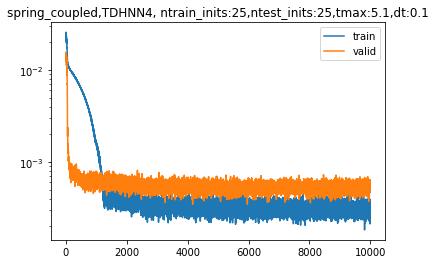

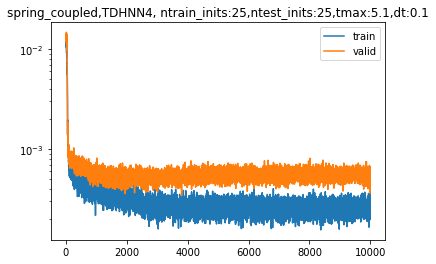

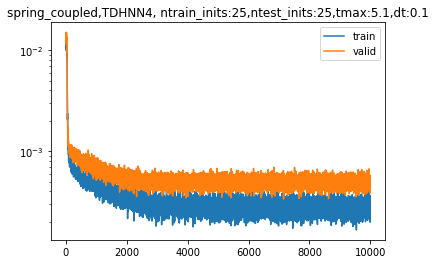

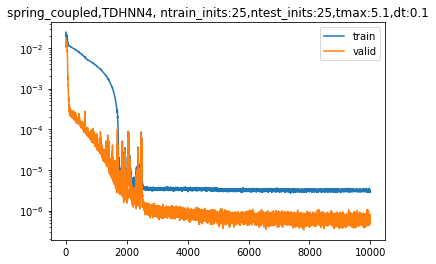

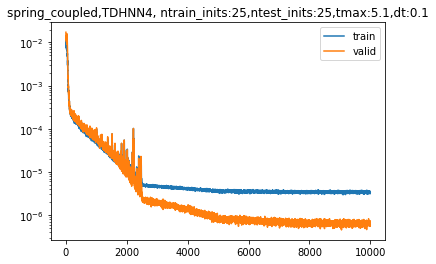

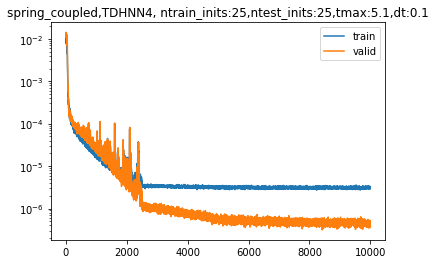

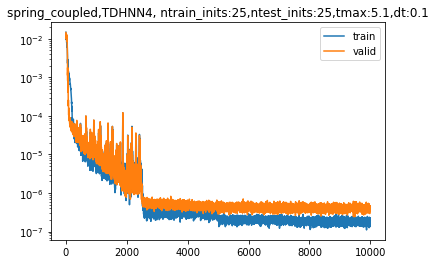

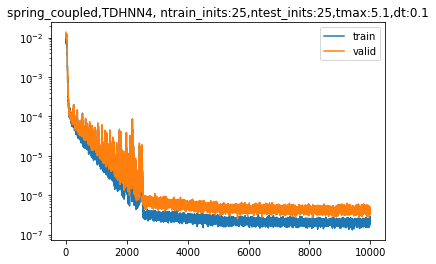

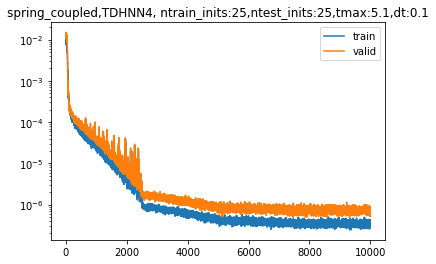

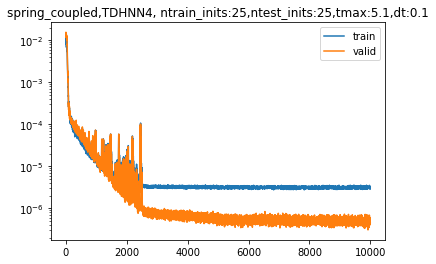

In [5]:
from utils import *
# from model_builder import get_models
import pickle
import os
import torch
import argparse
import matplotlib.pyplot as plt
import multiprocessing as mp


parser = argparse.ArgumentParser()
parser.add_argument('-ni', '--num_iters', type=int, default=10000)
parser.add_argument("-n_test_traj", '--ntesttraj', type=int, default=25)
parser.add_argument("-n_train_traj", '--ntraintraj', type=int, default=25)
parser.add_argument('-dt', '--dt', type=float, default=0.1)
parser.add_argument('-tmax', '--tmax', type=float, default=5.1)
parser.add_argument('-dname', '--dname', type=str, default='spring_coupled')
parser.add_argument('-noise_std', '--noise', type=float, default=0)
parser.add_argument('-type','--type',type=int,default=1)
parser.add_argument('-batch_size','--batch_size',type=int,default=200)
parser.add_argument('-learning_rate','--learning_rate',type=float,default=1e-3)
args = parser.parse_args([])
iters = args.num_iters
n_test_traj = args.ntesttraj
n_train_traj = args.ntraintraj
T_max = args.tmax
T_max_t = T_max
dt = args.dt
device = 'cpu'
print(device)
type_vec = args.type
num_samples_per_traj = int(np.ceil((T_max / dt))) - 1
lr_step = iters//2
dataset_name = args.dname



def train_model(model_name,model, optimizer, lr_sched, num_epochs=1, integrator_embedded=False,args_reg=None):
    loss_collater = {'train': [], 'valid': []}

    #load all training data
    for batch_i, (q, q_next, _, qdx, tevals) in enumerate(data_dict['train']):
        q, q_next, qdx = q.float(), q_next.float(), qdx.float()
        q=q.to(device)
        q_next=q_next.to(device)
        qdx=qdx.to(device)
        tevals = tevals.float()
        tevals =tevals.to(device)
        q.requires_grad = True
        tevals.requires_grad = True
        if args_reg:
            alpha = args_reg[0]
            beta = args_reg[1]

    # load all training data
    for batch_i, (qtest, q_nexttest, _, qdxtest, tevalstest) in enumerate(data_dict['valid']):
        qtest, q_nexttest, qdxtest = qtest.float(), q_nexttest.float(), qdxtest.float()
        qtest = qtest.to(device)
        q_nexttest = q_nexttest.to(device)
        qdxtest = qdxtest.to(device)
        tevalstest = tevalstest.float()
        tevalstest = tevalstest.to(device)
        qtest.requires_grad = True
        tevalstest.requires_grad = True

    #iterate over batches - epochs here is proxy for bs
    for epoch in range(num_epochs):
        ixs = torch.randperm(q.shape[0])[:args.batch_size]
        model.train()
        print('epoch:{}'.format(epoch))
        optimizer.zero_grad()

        if integrator_embedded:
            next_step_pred = model.next_step(q[ixs], tevals[ixs])
            state_loss = torch.mean((next_step_pred - q_next[ixs]) ** 2)
        else:
            next_step_pred = model.time_deriv(q[ixs], tevals[ixs])
            state_loss = (next_step_pred - qdx[ixs]).pow(2).mean()

        train_loss = state_loss

        if model_name =='TDHNN4':
            # print(model.get_weight())
            train_loss += alpha*torch.mean(torch.abs(model.get_F(tevals[ixs].reshape(-1,1))))
            train_loss += beta*torch.mean(torch.abs(model.get_D()))
        train_loss.backward()
        optimizer.step()

        loss_collater['train'].append(train_loss.detach().item())

        model.eval()
        ixstest = torch.randperm(qtest.shape[0])[:args.batch_size]

        if integrator_embedded:
            next_step_pred = model.next_step(qtest[ixstest], tevalstest[ixstest])
            test_state_loss = torch.mean((next_step_pred - q_nexttest[ixstest]) ** 2)
        else:
            next_step_pred = model.time_deriv(qtest[ixstest], tevalstest[ixstest])
            test_state_loss = (next_step_pred - qdxtest[ixstest]).pow(2).mean()

        loss_collater['valid'].append(test_state_loss.detach().item())

        print('{} Epoch Loss: {:.10f}'.format('train', loss_collater['train'][-1]))
        print('{} Epoch Loss: {:.10f}'.format('valid', loss_collater['valid'][-1]))
        lr_sched.step()

    plt.figure()
    plt.plot(loss_collater['train'], label='train')
    plt.plot(loss_collater['valid'], label='valid')
    plt.yscale('log')
    plt.title(f'{dataset_name},{model_name}, ntrain_inits:{n_train_traj},ntest_inits:{n_test_traj},tmax:{T_max},dt:{dt}')
    plt.legend()
    plt.savefig(f'{dataset_name}_{type_vec}_training.jpg')

    return model,loss_collater
    # return model


def get_model_results(arga,argb):
    model_type = get_models(dt, type='TDHNN4', hidden_dim=200)
    args_reg = [arga,argb]

    model_type = model_type.to(device)
    model_name = 'TDHNN4'
    params_a = list(model_type.parameters())[:]
    optimizer_ft = torch.optim.Adam([{"params": params_a},
                                    ],
                                    args.learning_rate)
    lr_sched = torch.optim.lr_scheduler.StepLR(optimizer_ft, lr_step//2, gamma=0.1)
    _,losses = train_model(model_name, model_type, optimizer_ft, lr_sched, num_epochs=iters,
                             integrator_embedded=True,args_reg=args_reg)
    return losses['valid'][-1]


import models

def get_models(deltat, type=None, hidden_dim=200):
    model_dict = {}
#     model_dict['baseline'] = models.base_model(5, hidden_dim, 4, deltat)
#     model_dict['HNN'] = models.HNN(4, hidden_dim, 1, deltat)
#     model_dict['TDHNN'] = models.TDHNN(5, hidden_dim, 1, deltat)
    model_dict['TDHNN4'] = models.TDHNN4(4, hidden_dim, 1, deltat)

    if type is None:
        return model_dict

    elif type in model_dict.keys():
        return model_dict[type]

    else:
        raise ValueError('type not understood')



model_dct = get_models(dt, type=None, hidden_dim=200)

noise_var = [0]

for noise_val in noise_var:
    # dataset preprocessing
    train_data = spring_coupled( n_train_traj, T_max, dt, noise_std=noise_val, seed=0,type=type_vec)
    valid_data = spring_coupled( n_test_traj, T_max_t, dt, noise_std=0, seed=14,type=type_vec)
    BS = num_samples_per_traj

    tnow, tnext, tenergy, tdx, tevals = nownext(train_data, n_train_traj, T_max, dt, dt)
    vnow, vnext, venergy, vdx, vevals = nownext(valid_data, n_test_traj, T_max_t, dt, dt)

    print_every = 1000

    traindat = pendpixdata(tnow,tnext,tenergy,tdx,tevals)
    train_dataloader = DataLoader(traindat, batch_size=len(tnow), num_workers=2, shuffle=True)
    valdat = pendpixdata(vnow, vnext, venergy, vdx, vevals)
    val_dataloader = DataLoader(valdat, batch_size=len(vnow), num_workers=2, shuffle=True)

    data_dict = {'train': train_dataloader, 'valid': val_dataloader}
    running_losses = 0.
    best_scores ={}

    for model_name, model_type in model_dct.items():
        if model_name != 'TDHNN4':
            model_type = model_type.to(device)
            params_a = list(model_type.parameters())[:]
            optimizer_ft = torch.optim.Adam([{"params": params_a}], args.learning_rate)
            lr_sched = torch.optim.lr_scheduler.StepLR(optimizer_ft, lr_step//2, gamma=0.1)
            trained_model,scores = train_model(model_name,model_type, optimizer_ft, lr_sched, num_epochs=iters, integrator_embedded=True)
            best_scores[model_name] = scores
        else:
            a_params = [1e-2,1e-5,1e-8]
            b_params = [1e-2,1e-5,1e-8]
            results = np.zeros((len(a_params),len(b_params)))
            for idex,a_param in enumerate(a_params):
                for jdex,b_param in enumerate(b_params):
                    results[idex,jdex]= get_model_results(a_param,b_param)
            ids = np.unravel_index(results.argmin(), results.shape)
            results = np.array(results)
            np.save(f'results_{dataset_name}_{type_vec}_noise_{noise_val}',results)
            model_type = model_type.to(device)
            params_a = list(model_type.parameters())[:]
            optimizer_ft = torch.optim.Adam([{"params": params_a}], args.learning_rate)
            lr_sched = torch.optim.lr_scheduler.StepLR(optimizer_ft, lr_step//2, gamma=0.1)
            trained_model,scores = train_model(model_name,model_type, optimizer_ft, lr_sched, num_epochs=iters, integrator_embedded=True,args_reg=[a_params[ids[0]],b_params[ids[1]]])
            best_scores[model_name] = scores

        parent_dir = os.getcwd()
        path = f"{dataset_name}_{type_vec}/{model_name}/noise_{noise_val}"
        if not os.path.exists(path):
            os.makedirs(parent_dir+'/'+path)
        torch.save(trained_model, path+'/'+'model')
        # test_model(model_name,trained_model)
        del trained_model

    with open(f'best_score_results_{dataset_name}_{type_vec}_noise_{noise_val}.pkl', 'wb') as f:
        pickle.dump(best_scores, f, pickle.HIGHEST_PROTOCOL)



In [6]:
ss = torch.ones(100,2)
mm = torch.tensor([3,4])

In [7]:
0.0000007152

tensor([[3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3., 4.],
        [3